In [1]:
!pip install bayesian-optimization

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from statsmodels.tsa.arima.model import ARIMA
from pandas.plotting import autocorrelation_plot

from datetime import datetime

from sklearn.preprocessing import LabelEncoder

from sklearn.metrics import cohen_kappa_score

from sklearn.feature_selection import SelectFromModel

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import StratifiedKFold

from bayes_opt import BayesianOptimization
from bayes_opt import UtilityFunction

from scipy.stats import mode

import xgboost as xgb
from xgboost import XGBRegressor
from xgboost import plot_importance

import tensorflow as tf
from tensorflow.python.keras.layers import Dense


from tensorflow.keras import regularizers
"""import warnings
warnings.filterwarnings('ignore')

import absl.logging
absl.logging.set_verbosity(absl.logging.ERROR)"""

"import warnings\nwarnings.filterwarnings('ignore')\n\nimport absl.logging\nabsl.logging.set_verbosity(absl.logging.ERROR)"

In [3]:
! nvidia-smi

/bin/bash: nvidia-smi: command not found


In [4]:
df_tech = pd.read_csv('df_TA.csv')

df_TA = df_tech.iloc[365:, 1:].reset_index()
df_TA = df_TA.drop(columns=['index'])
df_TA

,time,price_open,price_close,price_high,price_low,vwap,volume,ma7,ma21,ma49,...,bb_bbl,bb_bbhi,bb_bbli,adx,adx_neg,adx_pos,cci,ulti_osci,roc,STC
0,2016-01-02,435.67,435.40,437.56,432.41,435.286346,3276.709621,429.987143,441.539048,396.964082,...,414.311334,0.0,0.0,26.354855,18.476054,26.354855,-33.980298,63.976725,-0.322795,0.006104
1,2016-01-03,435.40,431.91,435.75,425.02,430.697845,3904.335318,431.014286,441.447619,399.188163,...,413.387242,0.0,0.0,24.700689,20.704230,24.700689,-54.703147,63.719940,-0.463219,0.003052
2,2016-01-04,431.90,433.85,435.79,431.37,433.938214,5894.445723,432.715714,440.963810,401.248571,...,413.783680,0.0,0.0,23.161418,20.305956,23.161418,-34.087396,66.339825,-1.939290,0.001526
3,2016-01-05,433.84,433.34,435.64,430.00,433.300199,5150.109476,432.637143,439.490952,403.225102,...,413.455124,0.0,0.0,21.843107,20.408578,21.843107,-34.469561,62.238573,-4.915083,0.000763
4,2016-01-06,433.32,430.87,433.46,428.15,431.829006,5476.959959,433.054286,438.390952,405.171633,...,413.222982,0.0,0.0,20.774185,20.775815,20.774185,-45.634832,63.326277,-5.477799,0.000381
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2572,2023-01-17,21191.46,21136.33,21595.00,20844.73,21219.313699,32656.479783,20126.778571,17925.728571,17397.717959,...,14540.558330,0.0,0.0,39.918419,5.030166,39.918419,150.595299,73.683479,25.619395,99.999866
2573,2023-01-18,21135.01,20674.29,21650.21,20370.01,21047.806256,34600.256472,20516.781429,18122.615714,17469.288571,...,14615.288499,0.0,0.0,41.594103,9.830662,41.594103,115.432650,65.263355,21.986174,99.999933
2574,2023-01-19,20674.03,21084.22,21197.00,20656.52,20890.184528,23436.754046,20836.277143,18334.838571,17553.046531,...,14708.523095,0.0,0.0,43.150095,9.203910,43.150095,102.684799,64.788643,24.446698,99.999966
2575,2023-01-20,21084.05,22669.81,22754.73,20865.64,21536.155435,32810.595879,21226.981429,18623.872381,17666.824082,...,14690.729662,0.0,0.0,45.333868,7.422641,45.333868,126.315675,68.264099,32.377061,99.999983


In [5]:
df_TA.iloc[-515]

time                2021-08-25
price_open            47682.45
price_close           48987.33
price_high             49277.0
price_low             47122.02
vwap              48212.270533
volume             9289.231771
ma7               48634.352857
ma21              46274.505238
ma49              39946.101224
ma200                46006.662
EMA_26            45032.557166
EMA_12            47499.397664
ema               48739.229854
RSI                  63.791788
AD              4270875.583239
ATR                2270.377742
STOCH                -14.25045
death_cross                  0
life_cross                   1
global_trend                 1
tsi                  30.694291
fii             3597090.643321
mfi                  51.480819
adi             4270875.583239
cmf                   0.139023
macd_diff           -87.694071
macd               2466.840497
macd_signal        2554.534568
bb_bbm              46543.7935
bb_bbh            50475.110446
bb_bbl            42612.476554
bb_bbhi 

In [6]:
timesteps = df_TA.to_numpy()[:,0]
for i in range(len(timesteps)):
  timesteps[i] = datetime.strptime(timesteps[i], "%Y-%m-%d")

prices = df_TA["price_close"].to_numpy()

timesteps, prices

(array([datetime.datetime(2016, 1, 2, 0, 0),
        datetime.datetime(2016, 1, 3, 0, 0),
        datetime.datetime(2016, 1, 4, 0, 0), ...,
        datetime.datetime(2023, 1, 19, 0, 0),
        datetime.datetime(2023, 1, 20, 0, 0),
        datetime.datetime(2023, 1, 21, 0, 0)], dtype=object),
 array([  435.4 ,   431.91,   433.85, ..., 21084.22, 22669.81, 22789.37]))

Text(0, 0.5, 'BTC Price')

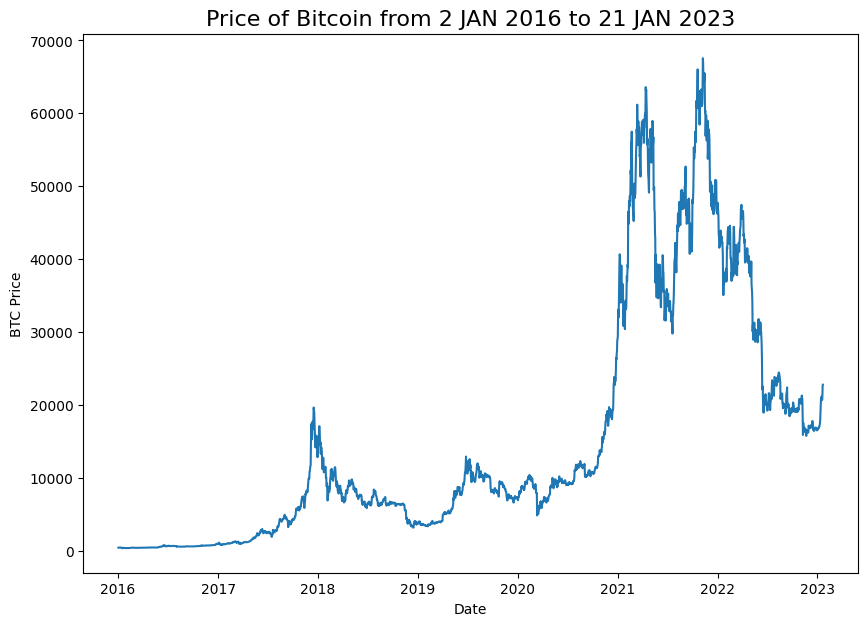

In [7]:
plt.figure(figsize=(10, 7))
plt.plot(timesteps, prices)
plt.title("Price of Bitcoin from 2 JAN 2016 to 21 JAN 2023", fontsize=16)
plt.xlabel("Date")
plt.ylabel("BTC Price")

In [8]:
# Create train and test splits the right way for time series data
split_size = int(0.8 * len(prices)) # 80% train, 20% test

# Create train data splits (everything before the split)
X_train, y_train = timesteps[:split_size], prices[:split_size]

# Create test data splits (everything after the split)
X_test, y_test = timesteps[split_size:], prices[split_size:]

len(X_train), len(X_test), len(y_train), len(y_test)

(2061, 516, 2061, 516)

In [9]:
2061 / 365

5.646575342465753

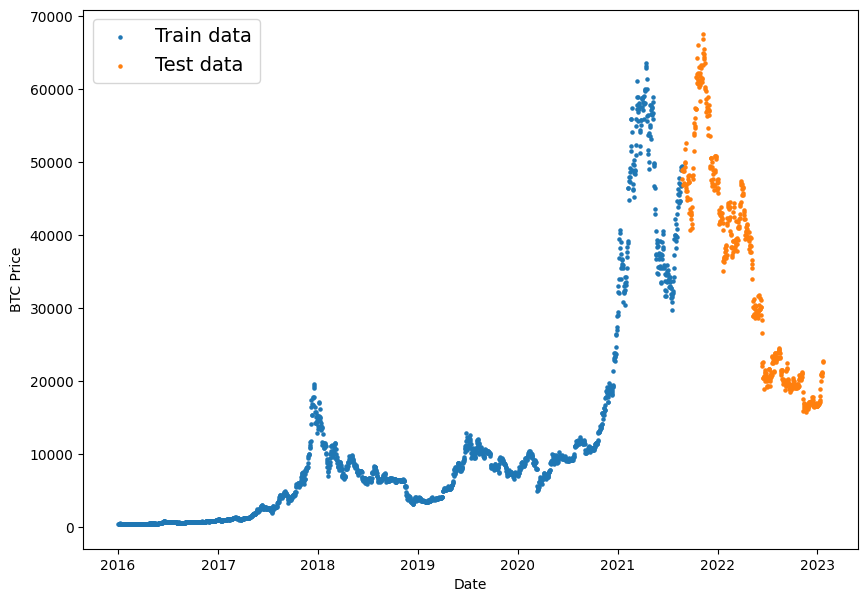

In [10]:
# Plot correctly made splits
plt.figure(figsize=(10, 7))
plt.scatter(X_train, y_train, s=5, label="Train data")
plt.scatter(X_test, y_test, s=5, label="Test data")
plt.xlabel("Date")
plt.ylabel("BTC Price")
plt.legend(fontsize=14)
plt.show();

In [11]:
# Create a function to plot time series data
def plot_time_series(timesteps, values, format='.', start=0, end=None, label=None):
  """
  Plots a timesteps (a series of points in time) against values (a series of values across timesteps).
  
  Parameters
  ---------
  timesteps : array of timesteps
  values : array of values across time
  format : style of plot, default "."
  start : where to start the plot (setting a value will index from start of timesteps & values)
  end : where to end the plot (setting a value will index from end of timesteps & values)
  label : label to show on plot of values
  """
  # Plot the series
  plt.plot(timesteps[start:end], values[start:end], format, label=label)
  plt.xlabel("Time")
  plt.ylabel("BTC Price")
  if label:
    plt.legend(fontsize=14) # make label bigger
  plt.grid(True)

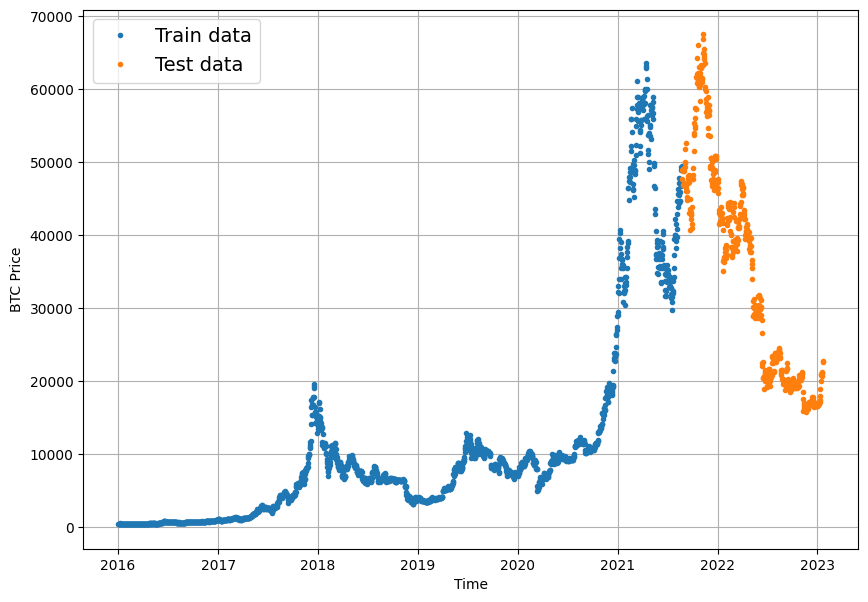

In [12]:
# Try out our plotting function
plt.figure(figsize=(10, 7))
plot_time_series(timesteps=X_train, values=y_train, label="Train data")
plot_time_series(timesteps=X_test, values=y_test, label="Test data")

In [13]:
# Create a naïve forecast
naive_forecast = y_test[:-1] # Naïve forecast equals every value excluding the last value
naive_forecast[:10], naive_forecast[-10:] # View frist 10 and last 10

(array([47682.45, 48987.33, 46851.47, 49077.57, 48942.94, 48802.58,
        46993.71, 47112.5 , 48839.86, 49279.37]),
 array([17944.27, 18847.75, 19934.88, 20957.02, 20879.7 , 21187.5 ,
        21136.33, 20674.29, 21084.22, 22669.81]))

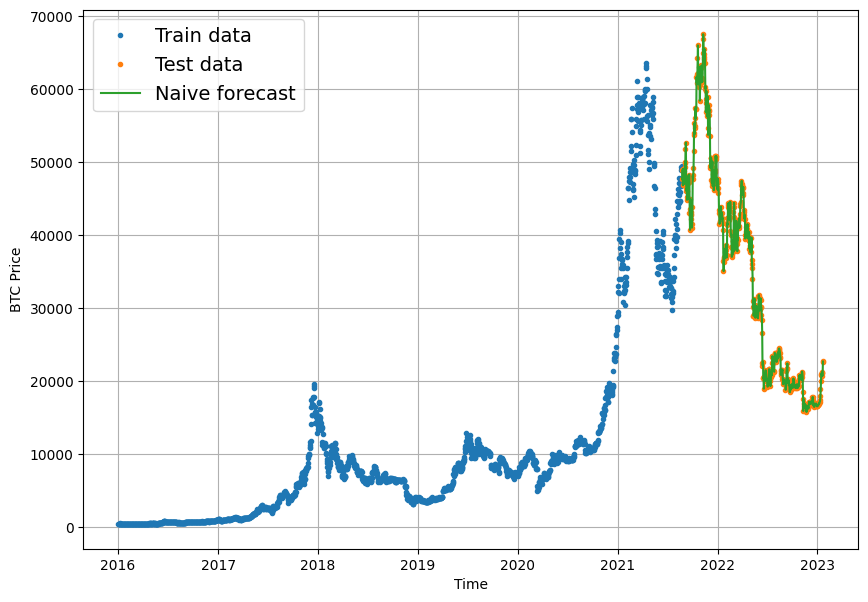

In [14]:
# Plot naive forecast
plt.figure(figsize=(10, 7))
plot_time_series(timesteps=X_train, values=y_train, label="Train data")
plot_time_series(timesteps=X_test, values=y_test, label="Test data")
plot_time_series(timesteps=X_test[1:], values=naive_forecast, format="-", label="Naive forecast");

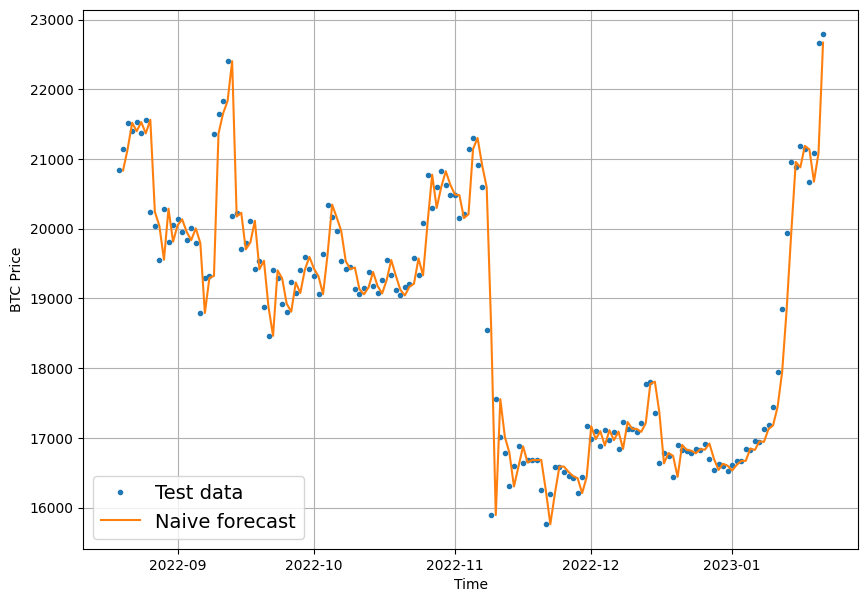

In [15]:
plt.figure(figsize=(10, 7))
offset = 360 # offset the values by 360 timesteps 
plot_time_series(timesteps=X_test, values=y_test, start=offset, label="Test data")
plot_time_series(timesteps=X_test[1:], values=naive_forecast, format="-", start=offset, label="Naive forecast");

## Errors calcualtion, main metrics

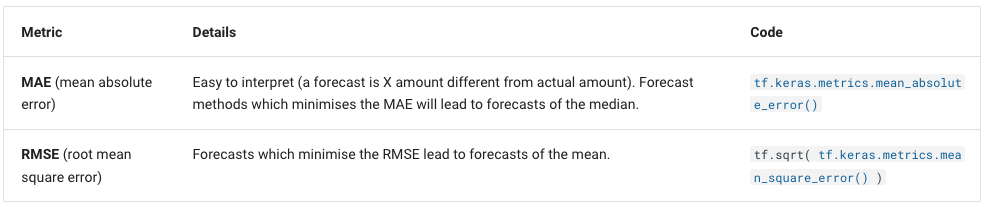

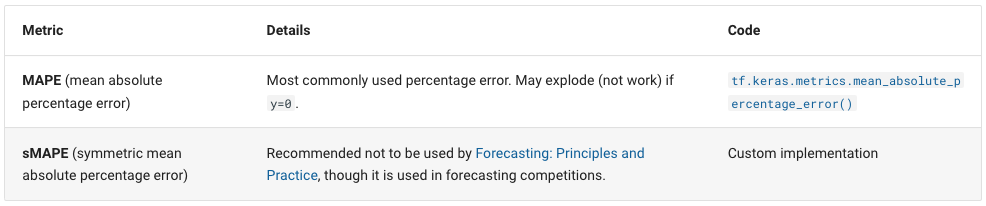

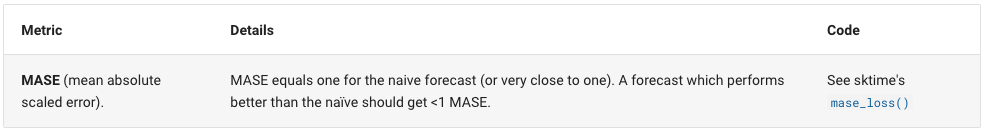

In [16]:
def mean_absolute_scaled_error(y_true, y_pred):
  """
  Implement MASE (assuming no seasonality of data).
  """
  mae = tf.reduce_mean(tf.abs(y_true - y_pred))

  # Find MAE of naive forecast (no seasonality)
  mae_naive_no_season = tf.reduce_mean(tf.abs(y_true[1:] - y_true[:-1])) # our seasonality is 1 day (hence the shifting of 1 day)

  return mae / mae_naive_no_season

In [17]:
def evaluate_preds(y_true, y_pred):
  # Make sure float32 (for metric calculations)
  y_true = tf.cast(y_true, dtype=tf.float32)
  y_pred = tf.cast(y_pred, dtype=tf.float32)

  # Calculate various metrics
  mae = tf.keras.metrics.mean_absolute_error(y_true, y_pred)
  mse = tf.keras.metrics.mean_squared_error(y_true, y_pred)
  rmse = tf.sqrt(mse)
  mape = tf.keras.metrics.mean_absolute_percentage_error(y_true, y_pred)
  mase = mean_absolute_scaled_error(y_true, y_pred)

  # Account for different sized metrics (for longer horizons, reduce to single number)
  if mae.ndim > 0: # if mae isn't already a scalar, reduce it to one by aggregating tensors to mean
    mae = tf.reduce_mean(mae)
    mse = tf.reduce_mean(mse)
    rmse = tf.reduce_mean(rmse)
    mape = tf.reduce_mean(mape)
    mase = tf.reduce_mean(mase)

  return {"mae": mae.numpy(),
          "mse": mse.numpy(),
          "rmse": rmse.numpy(),
          "mape": mape.numpy(),
          "mase": mase.numpy()}

## create baseline - naive forecast (which is actually hard to beat)

In [18]:
naive_results = evaluate_preds(y_true=y_test[1:],
                               y_pred=naive_forecast)
naive_results

{'mae': 833.29156,
 'mse': 1602351.8,
 'rmse': 1265.8403,
 'mape': 2.3663764,
 'mase': 1.0011022}

In [19]:
# Find average price of Bitcoin in test dataset
tf.reduce_mean(y_test).numpy()

34094.09265503876

## Seems like avg price in the test set is 34k , but each prediction get an error of 833$.

# Windowing dataset

In [20]:
HORIZON = 1 # predict 1 step at a time
WINDOW_SIZE = 7 # use a week worth of timesteps to predict the horizon

In [21]:
# Create function to label windowed data
def get_labelled_windows(x, horizon=1):
  """
  Creates labels for windowed dataset.

  E.g. if horizon=1 (default)
  Input: [1, 2, 3, 4, 5, 6] -> Output: ([1, 2, 3, 4, 5], [6])
  """
  return x[:, :-horizon], x[:, -horizon:]

In [22]:
# Test out the window labelling function
test_window, test_label = get_labelled_windows(tf.expand_dims(tf.range(8)+1, axis=0), horizon=HORIZON)
print(f"Window: {tf.squeeze(test_window).numpy()} -> Label: {tf.squeeze(test_label).numpy()}")

Window: [1 2 3 4 5 6 7] -> Label: 8


In [23]:
# Create function to view NumPy arrays as windows 
def make_windows(x, window_size=7, horizon=1):
  """
  Turns a 1D array into a 2D array of sequential windows of window_size.
  """
  # 1. Create a window of specific window_size (add the horizon on the end for later labelling)
  window_step = np.expand_dims(np.arange(window_size+horizon), axis=0)
  # print(f"Window step:\n {window_step}")

  # 2. Create a 2D array of multiple window steps (minus 1 to account for 0 indexing)
  window_indexes = window_step + np.expand_dims(np.arange(len(x)-(window_size+horizon-1)), axis=0).T # create 2D array of windows of size window_size
  # print(f"Window indexes:\n {window_indexes[:3], window_indexes[-3:], window_indexes.shape}")

  # 3. Index on the target array (time series) with 2D array of multiple window steps
  windowed_array = x[window_indexes]

  # 4. Get the labelled windows
  windows, labels = get_labelled_windows(windowed_array, horizon=horizon)

  return windows, labels

In [24]:
full_windows, full_labels = make_windows(prices, window_size=WINDOW_SIZE, horizon=HORIZON)
len(full_windows), len(full_labels)

(2570, 2570)

In [25]:
# View the first 3 windows/labels
for i in range(3):
  print(f"Window: {full_windows[i]} -> Label: {full_labels[i]}")

Window: [435.4  431.91 433.85 433.34 430.87 459.07 454.44] -> Label: [450.38]
Window: [431.91 433.85 433.34 430.87 459.07 454.44 450.38] -> Label: [449.99]
Window: [433.85 433.34 430.87 459.07 454.44 450.38 449.99] -> Label: [449.19]


In [26]:
# View the last 3 windows/labels
for i in range(3):
  print(f"Window: {full_windows[i-3]} -> Label: {full_labels[i-3]}")

Window: [18847.75 19934.88 20957.02 20879.7  21187.5  21136.33 20674.29] -> Label: [21084.22]
Window: [19934.88 20957.02 20879.7  21187.5  21136.33 20674.29 21084.22] -> Label: [22669.81]
Window: [20957.02 20879.7  21187.5  21136.33 20674.29 21084.22 22669.81] -> Label: [22789.37]


In [27]:
# Make the train/test splits
def make_train_test_splits(windows, labels, test_split=0.2):
  """
  Splits matching pairs of windows and labels into train and test splits.
  """
  split_size = int(len(windows) * (1-test_split)) # this will default to 80% train/20% test
  train_windows = windows[:split_size]
  train_labels = labels[:split_size]
  test_windows = windows[split_size:]
  test_labels = labels[split_size:]
  return train_windows, test_windows, train_labels, test_labels

In [28]:
train_windows, test_windows, train_labels, test_labels = make_train_test_splits(full_windows, full_labels)
len(train_windows), len(test_windows), len(train_labels), len(test_labels)

(2056, 514, 2056, 514)

In [29]:
train_windows[:5], train_labels[:5]

(array([[435.4 , 431.91, 433.85, 433.34, 430.87, 459.07, 454.44],
        [431.91, 433.85, 433.34, 430.87, 459.07, 454.44, 450.38],
        [433.85, 433.34, 430.87, 459.07, 454.44, 450.38, 449.99],
        [433.34, 430.87, 459.07, 454.44, 450.38, 449.99, 449.19],
        [430.87, 459.07, 454.44, 450.38, 449.99, 449.19, 434.01]]),
 array([[450.38],
        [449.99],
        [449.19],
        [434.01],
        [432.77]]))

In [30]:
def make_preds(model, input_data):
  """
  Uses model to make predictions on input_data.

  Parameters
  ----------
  model: trained model 
  input_data: windowed input data (same kind of data model was trained on)

  Returns model predictions on input_data.
  """
  forecast = model.predict(input_data)
  return tf.squeeze(forecast) # return 1D array of predictions

# Make a modelling checkpoint

In [31]:
import os

# Create a function to implement a ModelCheckpoint callback with a specific filename 
def create_model_checkpoint(model_name, save_path="model_experiments"):
  return tf.keras.callbacks.ModelCheckpoint(filepath=os.path.join(save_path, model_name), # create filepath to save model
                                            verbose=0, # only output a limited amount of text
                                            save_best_only=True) # save only the best model to file

# Let's try ARIMA

In [20]:
#from pandas import DataFrame
#from pandas import datetime

series = df_TA['price_close']
model = ARIMA(series, order=(5, 1, 0))
model_fit = model.fit()
print(model_fit.summary())

                               SARIMAX Results                                
Dep. Variable:            price_close   No. Observations:                 2577
Model:                 ARIMA(5, 1, 0)   Log Likelihood              -21088.953
Date:                Mon, 10 Apr 2023   AIC                          42189.907
Time:                        07:45:23   BIC                          42225.031
Sample:                             0   HQIC                         42202.639
                               - 2577                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0344      0.011     -3.113      0.002      -0.056      -0.013
ar.L2         -0.0006      0.011     -0.054      0.957      -0.022       0.021
ar.L3          0.0243      0.012      2.097      0.0

##### Autocorrelation plots are a commonly used tool for checking randomness in a data set. This randomness is ascertained by computing autocorrelation for data values at varying time lags. It shows the properties of a type of data known as a time series.

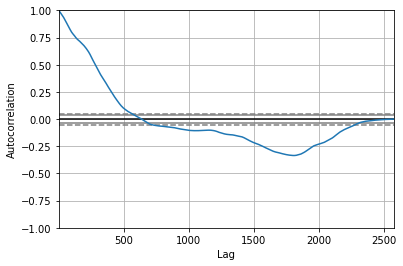

<Figure size 800x560 with 0 Axes>

In [ ]:
autocorrelation_plot(series)
plt.figure(figsize=(10, 7), dpi=80)
plt.show() 

In [ ]:
X_train, y_train

(array([datetime.datetime(2016, 1, 2, 0, 0),
        datetime.datetime(2016, 1, 3, 0, 0),
        datetime.datetime(2016, 1, 4, 0, 0), ...,
        datetime.datetime(2021, 8, 21, 0, 0),
        datetime.datetime(2021, 8, 22, 0, 0),
        datetime.datetime(2021, 8, 23, 0, 0)], dtype=object),
 array([  435.4 ,   431.91,   433.85, ..., 48867.02, 49284.63, 49506.5 ]))

In [ ]:
history = [x for x in y_train]
arima_forecast = list()
for t in range(len(y_test)):
    model = ARIMA(history, order=(5,1,0))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    arima_forecast.append(yhat)
    obs = y_test[t]
    history.append(obs)

/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)

  warnings.warn(ARIMA_DEPRECATION_WARN, FutureWarning)


In [ ]:
for i in range(len(arima_forecast)):
  arima_forecast[i] = float(arima_forecast[i])

In [ ]:
arima_results = evaluate_preds(y_true=y_test,
                               y_pred=arima_forecast)
arima_results

{'mae': 842.5529,
 'mse': 1633538.9,
 'rmse': 1278.0997,
 'mape': 2.3919811,
 'mase': 1.0111141}

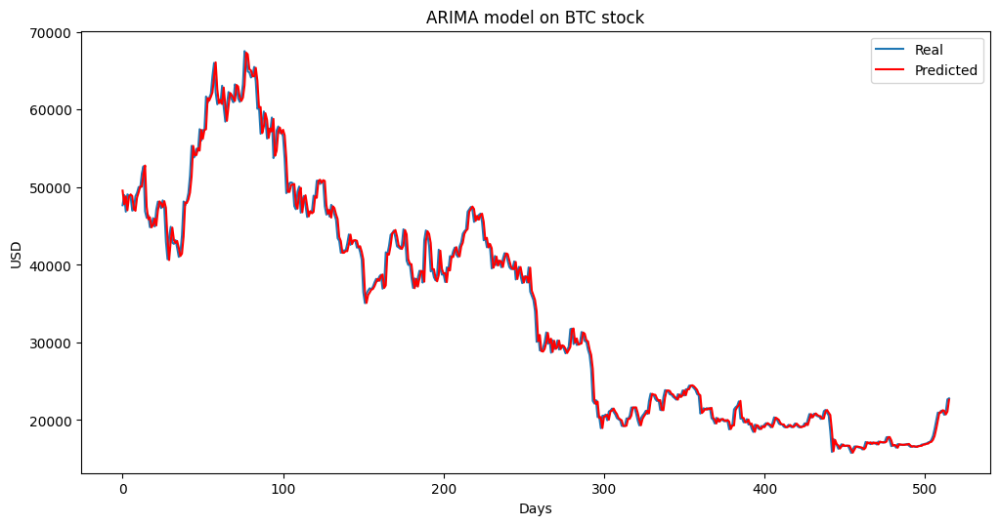

In [ ]:
plt.figure(figsize=(12, 6), dpi=100)
plt.plot(y_test, label='Real')
plt.plot(arima_forecast, color='red', label='Predicted')
plt.xlabel('Days')
plt.ylabel('USD')
plt.title('ARIMA model on BTC stock')
plt.legend()
plt.show()

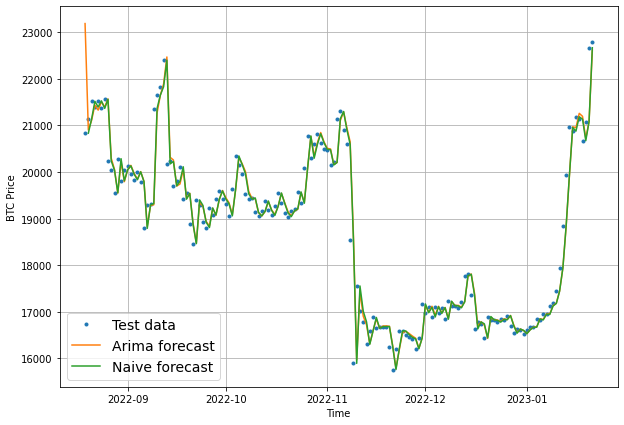

In [ ]:
plt.figure(figsize=(10, 7))
offset = 360 # offset the values by 360 timesteps 
plot_time_series(timesteps=X_test, values=y_test, start=offset, label="Test data")
plot_time_series(timesteps=X_test, values=arima_forecast, format="-", start=offset, label="Arima forecast");
plot_time_series(timesteps=X_test[1:], values=naive_forecast, format="-", start=offset, label="Naive forecast");

# Plotting activation functions

In [ ]:
import math
scale = 1.05070098
alpha = 1.67326324

def gelu(x):
    return 0.5 * x * (1 + math.tanh(math.sqrt(2 / math.pi) * (x + 0.044715 * math.pow(x, 3))))
def relu(x):
    return max(x, 0)
def selu(x):
    if x>=0:
      return x*scale
    else:
      return scale*alpha*math.exp(x)-1
def elu(x):
    if x>=0:
      return x
    else:
      return math.exp(x)-1

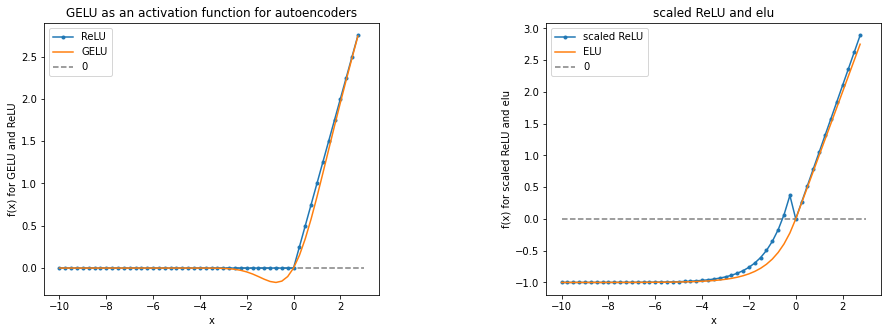

In [ ]:
plt.figure(figsize=(15, 5))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=.5, hspace=None)

ranges_ = (-10, 3, .25)

plt.subplot(1, 2, 1)
plt.plot([i for i in np.arange(*ranges_)], [relu(i) for i in np.arange(*ranges_)], label='ReLU', marker='.')
plt.plot([i for i in np.arange(*ranges_)], [gelu(i) for i in np.arange(*ranges_)], label='GELU')
plt.hlines(0, -10, 3, colors='gray', linestyles='--', label='0')
plt.title('GELU as an activation function for autoencoders')
plt.ylabel('f(x) for GELU and ReLU')
plt.xlabel('x')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot([i for i in np.arange(*ranges_)], [selu(i) for i in np.arange(*ranges_)], label='scaled ReLU', marker='.')
plt.plot([i for i in np.arange(*ranges_)], [elu(i) for i in np.arange(*ranges_)], label='ELU')
plt.hlines(0, -10, 3, colors='gray', linestyles='--', label='0')
plt.ylabel('f(x) for scaled ReLU and elu')
plt.xlabel('x')
plt.title('scaled ReLU and elu')
plt.legend()

plt.show()

# Model 1

In [ ]:

# Set random seed for as reproducible results as possible
tf.random.set_seed(42)

# Construct model
model_1 = tf.keras.Sequential([
  Dense(128, activation="relu"),
  Dense(HORIZON, activation="linear") # linear activation is the same as having no activation                        
], name="model_1_dense") # give the model a name so we can save it

# Compile model
model_1.compile(loss="mae",
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["mae"]) # we don't necessarily need this when the loss function is already MAE

# Fit model
model_1.fit(x=train_windows, # train windows of 7 timesteps of Bitcoin prices
            y=train_labels, # horizon value of 1 (using the previous 7 timesteps to predict next day)
            epochs=500,
            verbose=1,
            batch_size=128,
            validation_data=(test_windows, test_labels),
            callbacks=[create_model_checkpoint(model_name=model_1.name)]) # create ModelCheckpoint callback to save best model

Epoch 1/500
 7/17 [===========>..................] - ETA: 0s - loss: 4608.3481 - mae: 4608.3481  

17/17 [==============================] - 10s 150ms/step - loss: 2663.2815 - mae: 2663.2815 - val_loss: 4964.3022 - val_mae: 4964.3022
Epoch 2/500
11/17 [==================>...........] - ETA: 0s - loss: 886.2842 - mae: 886.2842  

17/17 [==============================] - 1s 43ms/step - loss: 872.8420 - mae: 872.8420 - val_loss: 1392.3562 - val_mae: 1392.3562
Epoch 3/500
17/17 [==============================] - 0s 5ms/step - loss: 582.9970 - mae: 582.9970 - val_loss: 1411.2789 - val_mae: 1411.2789
Epoch 4/500
 1/17 [>.............................] - ETA: 0s - loss: 388.7908 - mae: 388.7908

17/17 [==============================] - 1s 38ms/step - loss: 547.9034 - mae: 547.9034 - val_loss: 1334.7280 - val_mae: 1334.7280
Epoch 5/500
15/17 [=========================>....] - ETA: 0s - loss: 528.5417 - mae: 528.5417

17/17 [==============================] - 1s 53ms/step - loss: 531.9733 - mae: 531.9733 - val_loss: 1291.0907 - val_mae: 1291.0907
Epoch 6/500
17/17 [==============================] - 0s 8ms/step - loss: 521.7628 - mae: 521.7628 - val_loss: 1350.3502 - val_mae: 1350.3502
Epoch 7/500
17/17 [==============================] - 0s 7ms/step - loss: 511.1373 - mae: 511.1373 - val_loss: 1336.3793 - val_mae: 1336.3793
Epoch 8/500
15/17 [=========================>....] - ETA: 0s - loss: 516.0159 - mae: 516.0159

17/17 [==============================] - 1s 51ms/step - loss: 503.6411 - mae: 503.6411 - val_loss: 1209.0665 - val_mae: 1209.0665
Epoch 9/500
13/17 [=====================>........] - ETA: 0s - loss: 502.4183 - mae: 502.4183

17/17 [==============================] - 1s 42ms/step - loss: 493.6194 - mae: 493.6194 - val_loss: 1172.5496 - val_mae: 1172.5496
Epoch 10/500
17/17 [==============================] - 0s 5ms/step - loss: 509.5009 - mae: 509.5009 - val_loss: 1200.9161 - val_mae: 1200.9161
Epoch 11/500
17/17 [==============================] - ETA: 0s - loss: 467.5987 - mae: 467.5987

17/17 [==============================] - 1s 35ms/step - loss: 467.5987 - mae: 467.5987 - val_loss: 1149.9579 - val_mae: 1149.9579
Epoch 12/500
15/17 [=========================>....] - ETA: 0s - loss: 459.5967 - mae: 459.5967

17/17 [==============================] - 1s 36ms/step - loss: 458.3900 - mae: 458.3900 - val_loss: 1099.9952 - val_mae: 1099.9952
Epoch 13/500
17/17 [==============================] - 0s 5ms/step - loss: 443.9488 - mae: 443.9488 - val_loss: 1128.1854 - val_mae: 1128.1854
Epoch 14/500
 1/17 [>.............................] - ETA: 0s - loss: 323.4630 - mae: 323.4630

17/17 [==============================] - 1s 36ms/step - loss: 470.6514 - mae: 470.6514 - val_loss: 1058.3536 - val_mae: 1058.3536
Epoch 15/500
17/17 [==============================] - 0s 5ms/step - loss: 436.6010 - mae: 436.6010 - val_loss: 1195.9508 - val_mae: 1195.9508
Epoch 16/500
 1/17 [>.............................] - ETA: 0s - loss: 558.1869 - mae: 558.1869

17/17 [==============================] - 1s 48ms/step - loss: 442.6407 - mae: 442.6407 - val_loss: 1022.9415 - val_mae: 1022.9415
Epoch 17/500
17/17 [==============================] - 0s 5ms/step - loss: 414.6056 - mae: 414.6056 - val_loss: 1376.7042 - val_mae: 1376.7042
Epoch 18/500
 1/17 [>.............................] - ETA: 0s - loss: 510.5932 - mae: 510.5932

17/17 [==============================] - 1s 35ms/step - loss: 420.9774 - mae: 420.9774 - val_loss: 985.7655 - val_mae: 985.7655
Epoch 19/500
 1/17 [>.............................] - ETA: 0s - loss: 495.2686 - mae: 495.2686

17/17 [==============================] - 1s 36ms/step - loss: 393.1670 - mae: 393.1670 - val_loss: 972.8218 - val_mae: 972.8218
Epoch 20/500
 1/17 [>.............................] - ETA: 0s - loss: 401.2382 - mae: 401.2382

17/17 [==============================] - 1s 34ms/step - loss: 386.0542 - mae: 386.0542 - val_loss: 969.1238 - val_mae: 969.1238
Epoch 21/500
 1/17 [>.............................] - ETA: 0s - loss: 298.4832 - mae: 298.4832

17/17 [==============================] - 1s 36ms/step - loss: 377.9560 - mae: 377.9560 - val_loss: 961.8785 - val_mae: 961.8785
Epoch 22/500
17/17 [==============================] - ETA: 0s - loss: 373.9813 - mae: 373.9813

17/17 [==============================] - 1s 35ms/step - loss: 373.9813 - mae: 373.9813 - val_loss: 948.5071 - val_mae: 948.5071
Epoch 23/500
 1/17 [>.............................] - ETA: 0s - loss: 400.2062 - mae: 400.2062

17/17 [==============================] - 1s 34ms/step - loss: 369.7619 - mae: 369.7619 - val_loss: 944.7894 - val_mae: 944.7894
Epoch 24/500
 1/17 [>.............................] - ETA: 0s - loss: 376.4324 - mae: 376.4324

17/17 [==============================] - 1s 35ms/step - loss: 375.2585 - mae: 375.2585 - val_loss: 927.4591 - val_mae: 927.4591
Epoch 25/500
17/17 [==============================] - 0s 5ms/step - loss: 361.0773 - mae: 361.0773 - val_loss: 989.7201 - val_mae: 989.7201
Epoch 26/500
17/17 [==============================] - 0s 5ms/step - loss: 375.4773 - mae: 375.4773 - val_loss: 1224.2164 - val_mae: 1224.2164
Epoch 27/500
17/17 [==============================] - 0s 5ms/step - loss: 421.5278 - mae: 421.5278 - val_loss: 1157.3413 - val_mae: 1157.3413
Epoch 28/500
17/17 [==============================] - 0s 5ms/step - loss: 415.2860 - mae: 415.2860 - val_loss: 989.8487 - val_mae: 989.8487
Epoch 29/500
 1/17 [>.............................] - ETA: 0s - loss: 323.3040 - mae: 323.3040

17/17 [==============================] - 1s 35ms/step - loss: 378.7594 - mae: 378.7594 - val_loss: 911.9196 - val_mae: 911.9196
Epoch 30/500
17/17 [==============================] - 0s 5ms/step - loss: 359.6903 - mae: 359.6903 - val_loss: 912.6224 - val_mae: 912.6224
Epoch 31/500
17/17 [==============================] - 0s 5ms/step - loss: 354.9521 - mae: 354.9521 - val_loss: 1020.1836 - val_mae: 1020.1836
Epoch 32/500
17/17 [==============================] - 0s 5ms/step - loss: 366.3875 - mae: 366.3875 - val_loss: 952.3806 - val_mae: 952.3806
Epoch 33/500
17/17 [==============================] - 0s 5ms/step - loss: 361.6511 - mae: 361.6511 - val_loss: 1081.2538 - val_mae: 1081.2538
Epoch 34/500
17/17 [==============================] - 0s 7ms/step - loss: 353.4567 - mae: 353.4567 - val_loss: 916.4831 - val_mae: 916.4831
Epoch 35/500
17/17 [==============================] - 0s 5ms/step - loss: 367.0891 - mae: 367.0891 - val_loss: 996.7025 - val_mae: 996.7025
Epoch 36/500
17/17 [========

17/17 [==============================] - 1s 35ms/step - loss: 366.6507 - mae: 366.6507 - val_loss: 891.5887 - val_mae: 891.5887
Epoch 44/500
17/17 [==============================] - 0s 10ms/step - loss: 350.9044 - mae: 350.9044 - val_loss: 957.7078 - val_mae: 957.7078
Epoch 45/500
15/17 [=========================>....] - ETA: 0s - loss: 353.8047 - mae: 353.8047

17/17 [==============================] - 1s 51ms/step - loss: 356.0043 - mae: 356.0043 - val_loss: 889.5243 - val_mae: 889.5243
Epoch 46/500
17/17 [==============================] - 0s 8ms/step - loss: 347.0405 - mae: 347.0405 - val_loss: 890.3234 - val_mae: 890.3234
Epoch 47/500
17/17 [==============================] - 0s 7ms/step - loss: 350.6608 - mae: 350.6608 - val_loss: 1334.2015 - val_mae: 1334.2015
Epoch 48/500
17/17 [==============================] - 0s 7ms/step - loss: 430.9404 - mae: 430.9404 - val_loss: 927.9183 - val_mae: 927.9183
Epoch 49/500
17/17 [==============================] - 0s 7ms/step - loss: 347.1372 - mae: 347.1372 - val_loss: 976.6569 - val_mae: 976.6569
Epoch 50/500
17/17 [==============================] - 0s 8ms/step - loss: 352.4777 - mae: 352.4777 - val_loss: 959.2882 - val_mae: 959.2882
Epoch 51/500
17/17 [==============================] - 0s 8ms/step - loss: 370.6371 - mae: 370.6371 - val_loss: 934.9964 - val_mae: 934.9964
Epoch 52/500
16/17 [==========

17/17 [==============================] - 1s 55ms/step - loss: 346.6882 - mae: 346.6882 - val_loss: 886.8600 - val_mae: 886.8600
Epoch 53/500
 1/17 [>.............................] - ETA: 0s - loss: 300.4544 - mae: 300.4544

17/17 [==============================] - 1s 35ms/step - loss: 342.2548 - mae: 342.2548 - val_loss: 883.3271 - val_mae: 883.3271
Epoch 54/500
17/17 [==============================] - 0s 5ms/step - loss: 347.4310 - mae: 347.4310 - val_loss: 883.9587 - val_mae: 883.9587
Epoch 55/500
17/17 [==============================] - 0s 5ms/step - loss: 345.4245 - mae: 345.4245 - val_loss: 985.9208 - val_mae: 985.9208
Epoch 56/500
17/17 [==============================] - 0s 4ms/step - loss: 379.3650 - mae: 379.3650 - val_loss: 941.1199 - val_mae: 941.1199
Epoch 57/500
17/17 [==============================] - 0s 5ms/step - loss: 353.1577 - mae: 353.1577 - val_loss: 1004.3845 - val_mae: 1004.3845
Epoch 58/500
17/17 [==============================] - 0s 5ms/step - loss: 345.2201 - mae: 345.2201 - val_loss: 1016.6066 - val_mae: 1016.6066
Epoch 59/500
17/17 [==============================] - 0s 5ms/step - loss: 350.7776 - mae: 350.7776 - val_loss: 1285.7483 - val_mae: 1285.7483
Epoch 60/500
17/17 [======

17/17 [==============================] - 1s 32ms/step - loss: 339.5955 - mae: 339.5955 - val_loss: 872.6396 - val_mae: 872.6396
Epoch 64/500
17/17 [==============================] - 0s 5ms/step - loss: 349.5934 - mae: 349.5934 - val_loss: 914.2220 - val_mae: 914.2220
Epoch 65/500
17/17 [==============================] - 0s 5ms/step - loss: 355.5385 - mae: 355.5385 - val_loss: 1108.2449 - val_mae: 1108.2449
Epoch 66/500
17/17 [==============================] - 0s 5ms/step - loss: 380.9614 - mae: 380.9614 - val_loss: 902.5466 - val_mae: 902.5466
Epoch 67/500
17/17 [==============================] - 0s 5ms/step - loss: 345.6775 - mae: 345.6775 - val_loss: 953.8986 - val_mae: 953.8986
Epoch 68/500
17/17 [==============================] - 0s 5ms/step - loss: 347.8534 - mae: 347.8534 - val_loss: 1099.6425 - val_mae: 1099.6425
Epoch 69/500
17/17 [==============================] - 0s 5ms/step - loss: 361.1328 - mae: 361.1328 - val_loss: 1103.7108 - val_mae: 1103.7108
Epoch 70/500
17/17 [======

17/17 [==============================] - 1s 59ms/step - loss: 366.4232 - mae: 366.4232 - val_loss: 860.6403 - val_mae: 860.6403
Epoch 88/500
17/17 [==============================] - 0s 5ms/step - loss: 333.6428 - mae: 333.6428 - val_loss: 861.9241 - val_mae: 861.9241
Epoch 89/500
17/17 [==============================] - 0s 5ms/step - loss: 330.4311 - mae: 330.4311 - val_loss: 864.9515 - val_mae: 864.9515
Epoch 90/500
17/17 [==============================] - 0s 6ms/step - loss: 331.2956 - mae: 331.2956 - val_loss: 876.4033 - val_mae: 876.4033
Epoch 91/500
17/17 [==============================] - 0s 5ms/step - loss: 342.0402 - mae: 342.0402 - val_loss: 898.9636 - val_mae: 898.9636
Epoch 92/500
17/17 [==============================] - 0s 5ms/step - loss: 361.8008 - mae: 361.8008 - val_loss: 902.4095 - val_mae: 902.4095
Epoch 93/500
17/17 [==============================] - 0s 4ms/step - loss: 337.9629 - mae: 337.9629 - val_loss: 1489.7010 - val_mae: 1489.7010
Epoch 94/500
17/17 [==========

17/17 [==============================] - 1s 63ms/step - loss: 345.3164 - mae: 345.3164 - val_loss: 851.9421 - val_mae: 851.9421
Epoch 113/500
17/17 [==============================] - 0s 8ms/step - loss: 328.7437 - mae: 328.7437 - val_loss: 955.3579 - val_mae: 955.3579
Epoch 114/500
17/17 [==============================] - 0s 9ms/step - loss: 337.7313 - mae: 337.7313 - val_loss: 914.1201 - val_mae: 914.1201
Epoch 115/500
17/17 [==============================] - 0s 6ms/step - loss: 345.6284 - mae: 345.6284 - val_loss: 857.1144 - val_mae: 857.1144
Epoch 116/500
17/17 [==============================] - 0s 15ms/step - loss: 329.8591 - mae: 329.8591 - val_loss: 900.6085 - val_mae: 900.6085
Epoch 117/500
15/17 [=========================>....] - ETA: 0s - loss: 342.7056 - mae: 342.7056

17/17 [==============================] - 2s 94ms/step - loss: 343.7393 - mae: 343.7393 - val_loss: 850.5085 - val_mae: 850.5085
Epoch 118/500
17/17 [==============================] - 0s 14ms/step - loss: 330.0579 - mae: 330.0579 - val_loss: 934.9709 - val_mae: 934.9709
Epoch 119/500
17/17 [==============================] - 0s 28ms/step - loss: 332.5541 - mae: 332.5541 - val_loss: 879.1694 - val_mae: 879.1694
Epoch 120/500
17/17 [==============================] - 0s 23ms/step - loss: 330.5860 - mae: 330.5860 - val_loss: 907.9776 - val_mae: 907.9776
Epoch 121/500
17/17 [==============================] - 0s 17ms/step - loss: 340.2631 - mae: 340.2631 - val_loss: 881.3162 - val_mae: 881.3162
Epoch 122/500
17/17 [==============================] - 0s 14ms/step - loss: 354.0664 - mae: 354.0664 - val_loss: 852.2051 - val_mae: 852.2051
Epoch 123/500
17/17 [==============================] - 0s 5ms/step - loss: 336.9366 - mae: 336.9366 - val_loss: 863.7415 - val_mae: 863.7415
Epoch 124/500
17/17 [

17/17 [==============================] - 1s 35ms/step - loss: 340.5635 - mae: 340.5635 - val_loss: 847.5153 - val_mae: 847.5153
Epoch 143/500
17/17 [==============================] - 0s 5ms/step - loss: 331.2430 - mae: 331.2430 - val_loss: 990.3209 - val_mae: 990.3209
Epoch 144/500
17/17 [==============================] - 0s 6ms/step - loss: 349.8753 - mae: 349.8753 - val_loss: 971.6185 - val_mae: 971.6185
Epoch 145/500
17/17 [==============================] - 0s 5ms/step - loss: 335.4182 - mae: 335.4182 - val_loss: 849.6069 - val_mae: 849.6069
Epoch 146/500
17/17 [==============================] - 0s 6ms/step - loss: 333.5591 - mae: 333.5591 - val_loss: 1015.2277 - val_mae: 1015.2277
Epoch 147/500
17/17 [==============================] - 0s 5ms/step - loss: 346.3406 - mae: 346.3406 - val_loss: 868.1518 - val_mae: 868.1518
Epoch 148/500
17/17 [==============================] - 0s 5ms/step - loss: 328.6127 - mae: 328.6127 - val_loss: 871.2425 - val_mae: 871.2425
Epoch 149/500
17/17 [===

17/17 [==============================] - 1s 35ms/step - loss: 347.1909 - mae: 347.1909 - val_loss: 847.4116 - val_mae: 847.4116
Epoch 160/500
17/17 [==============================] - 0s 4ms/step - loss: 329.7837 - mae: 329.7837 - val_loss: 946.2941 - val_mae: 946.2941
Epoch 161/500
16/17 [===========================>..] - ETA: 0s - loss: 337.5985 - mae: 337.5985

17/17 [==============================] - 1s 36ms/step - loss: 336.5421 - mae: 336.5421 - val_loss: 843.5149 - val_mae: 843.5149
Epoch 162/500
17/17 [==============================] - 0s 6ms/step - loss: 343.0399 - mae: 343.0399 - val_loss: 845.5150 - val_mae: 845.5150
Epoch 163/500
17/17 [==============================] - 0s 5ms/step - loss: 335.6152 - mae: 335.6152 - val_loss: 853.9104 - val_mae: 853.9104
Epoch 164/500
17/17 [==============================] - 0s 6ms/step - loss: 335.4147 - mae: 335.4147 - val_loss: 864.4056 - val_mae: 864.4056
Epoch 165/500
17/17 [==============================] - 0s 5ms/step - loss: 349.2961 - mae: 349.2961 - val_loss: 1021.1862 - val_mae: 1021.1862
Epoch 166/500
17/17 [==============================] - 0s 6ms/step - loss: 390.7896 - mae: 390.7896 - val_loss: 1452.5526 - val_mae: 1452.5526
Epoch 167/500
17/17 [==============================] - 0s 5ms/step - loss: 428.6458 - mae: 428.6458 - val_loss: 886.8702 - val_mae: 886.8702
Epoch 168/500
17/17 [=

17/17 [==============================] - 1s 36ms/step - loss: 346.2014 - mae: 346.2014 - val_loss: 840.8964 - val_mae: 840.8964
Epoch 194/500
17/17 [==============================] - 0s 5ms/step - loss: 350.1927 - mae: 350.1927 - val_loss: 966.8026 - val_mae: 966.8026
Epoch 195/500
17/17 [==============================] - 0s 6ms/step - loss: 341.6360 - mae: 341.6360 - val_loss: 841.1791 - val_mae: 841.1791
Epoch 196/500
17/17 [==============================] - 0s 5ms/step - loss: 331.5411 - mae: 331.5411 - val_loss: 841.0052 - val_mae: 841.0052
Epoch 197/500
17/17 [==============================] - 0s 5ms/step - loss: 329.3074 - mae: 329.3074 - val_loss: 869.0595 - val_mae: 869.0595
Epoch 198/500
17/17 [==============================] - 0s 8ms/step - loss: 337.7890 - mae: 337.7890 - val_loss: 849.7910 - val_mae: 849.7910
Epoch 199/500
17/17 [==============================] - 0s 7ms/step - loss: 332.4305 - mae: 332.4305 - val_loss: 869.9832 - val_mae: 869.9832
Epoch 200/500
17/17 [=====

17/17 [==============================] - 1s 35ms/step - loss: 338.3131 - mae: 338.3131 - val_loss: 839.3845 - val_mae: 839.3845
Epoch 246/500
17/17 [==============================] - 0s 6ms/step - loss: 333.1637 - mae: 333.1637 - val_loss: 955.6347 - val_mae: 955.6347
Epoch 247/500
17/17 [==============================] - 0s 5ms/step - loss: 363.3356 - mae: 363.3356 - val_loss: 852.9912 - val_mae: 852.9912
Epoch 248/500
17/17 [==============================] - 0s 5ms/step - loss: 383.0085 - mae: 383.0085 - val_loss: 871.1901 - val_mae: 871.1901
Epoch 249/500
17/17 [==============================] - 0s 5ms/step - loss: 331.0628 - mae: 331.0628 - val_loss: 1032.2625 - val_mae: 1032.2625
Epoch 250/500
17/17 [==============================] - 0s 5ms/step - loss: 337.2730 - mae: 337.2730 - val_loss: 1011.9601 - val_mae: 1011.9601
Epoch 251/500
17/17 [==============================] - 0s 5ms/step - loss: 343.5597 - mae: 343.5597 - val_loss: 865.4641 - val_mae: 865.4641
Epoch 252/500
17/17 [=

17/17 [==============================] - 1s 50ms/step - loss: 345.1528 - mae: 345.1528 - val_loss: 838.0174 - val_mae: 838.0174
Epoch 372/500
17/17 [==============================] - 0s 5ms/step - loss: 327.8703 - mae: 327.8703 - val_loss: 1106.6974 - val_mae: 1106.6974
Epoch 373/500
17/17 [==============================] - 0s 6ms/step - loss: 347.1211 - mae: 347.1211 - val_loss: 887.9286 - val_mae: 887.9286
Epoch 374/500
17/17 [==============================] - 0s 5ms/step - loss: 328.1950 - mae: 328.1950 - val_loss: 932.6737 - val_mae: 932.6737
Epoch 375/500
17/17 [==============================] - 0s 5ms/step - loss: 340.0289 - mae: 340.0289 - val_loss: 839.8397 - val_mae: 839.8397
Epoch 376/500
17/17 [==============================] - 0s 6ms/step - loss: 325.2782 - mae: 325.2782 - val_loss: 848.4185 - val_mae: 848.4185
Epoch 377/500
17/17 [==============================] - 0s 6ms/step - loss: 341.3756 - mae: 341.3756 - val_loss: 967.9731 - val_mae: 967.9731
Epoch 378/500
17/17 [===

In [ ]:
# Evaluate model on test data
model_1.evaluate(test_windows, test_labels)

17/17 [==============================] - 0s 2ms/step - loss: 838.6769 - mae: 838.6769


[838.6769409179688, 838.6769409179688]

In [ ]:
# Load in saved best performing model_1 and evaluate on test data
model_1 = tf.keras.models.load_model("model_experiments/model_1_dense")
model_1.evaluate(test_windows, test_labels)

17/17 [==============================] - 0s 2ms/step - loss: 838.0175 - mae: 838.0175


[838.0175170898438, 838.0175170898438]

In [ ]:
# Make predictions using model_1 on the test dataset and view the results
model_1_preds = make_preds(model_1, test_windows)
len(model_1_preds), model_1_preds[:10]

17/17 [==============================] - 0s 2ms/step


(514, <tf.Tensor: shape=(10,), dtype=float32, numpy=
 array([48791.48 , 46987.145, 48777.316, 48890.48 , 48844.99 , 47163.22 ,
        47001.28 , 48549.7  , 49219.36 , 49995.207], dtype=float32)>)

In [ ]:
# Evaluate preds
model_1_results = evaluate_preds(y_true=tf.squeeze(test_labels), # reduce to right shape
                                 y_pred=model_1_preds)
model_1_results

{'mae': 838.01746,
 'mse': 1633832.2,
 'rmse': 1278.2145,
 'mape': 2.3890312,
 'mase': 1.0098625}

857.2216 - 100 epochs

In [ ]:
naive_results

{'mae': 833.2916,
 'mse': 1602351.6,
 'rmse': 1265.8403,
 'mape': 2.366376,
 'mase': 1.0011022}

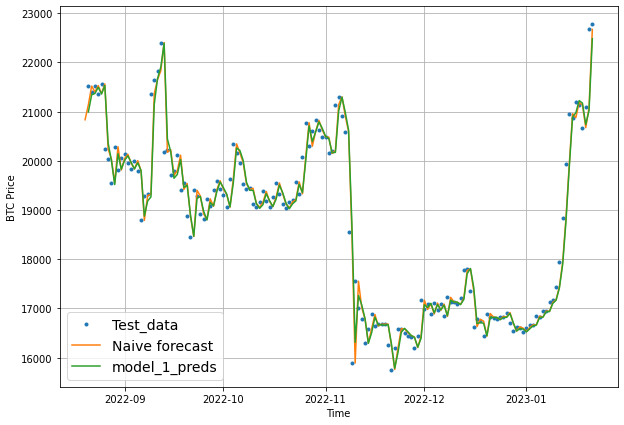

In [ ]:
offset = 360
plt.figure(figsize=(10, 7))
# Account for the test_window offset and index into test_labels to ensure correct plotting
plot_time_series(timesteps=X_test[-len(test_windows):], values=test_labels[:, 0], start=offset, label="Test_data")
plot_time_series(timesteps=X_test[1:], values=naive_forecast, format="-", start=offset, label="Naive forecast");
plot_time_series(timesteps=X_test[-len(test_windows):], values=model_1_preds, start=offset, format="-", label="model_1_preds")

### As the result shows this options for horizon and window are optimal
##### https://dev.mrdbourke.com/tensorflow-deep-learning/10_time_series_forecasting_in_tensorflow/



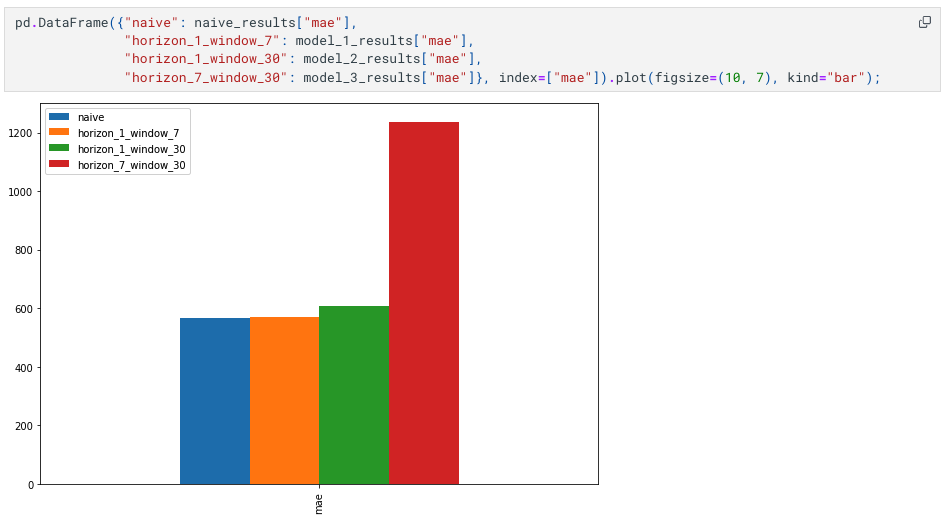

# So some general conclusions that we can make:
# 1) Horizon 1 and window 7 is best, we will you this settings
# 2) Best model is saved to the file, so we will use it instead of the last version

# Models Dense neurons

In [ ]:
# Set random seed for as reproducible results as possible
tf.random.set_seed(42)
dense_model_results = dict()

for i in [32,64,128,256,512]:
  # Construct model
  model = tf.keras.Sequential([
    Dense(i, activation="relu"),
    Dense(HORIZON, activation="linear") # linear activation is the same as having no activation                        
  ], name="model_{}_dense".format(str(i))) # give the model a name so we can save it

  # Compile model
  model.compile(loss="mae",
                  optimizer=tf.keras.optimizers.Adam(),
                  metrics=["mae"]) # we don't necessarily need this when the loss function is already MAE

  # Fit model
  model.fit(x=train_windows, # train windows of 7 timesteps of Bitcoin prices
              y=train_labels, # horizon value of 1 (using the previous 7 timesteps to predict next day)
              epochs=500,
              verbose=1,
              batch_size=128,
              validation_data=(test_windows, test_labels),
              callbacks=[create_model_checkpoint(model_name=model.name)]) # create ModelCheckpoint callback to save best model

  # Load in saved best performing model and evaluate on test data
  model = tf.keras.models.load_model("model_experiments/model_{}_dense".format(str(i)))
  model.evaluate(test_windows, test_labels)

  # Make predictions using model on the test dataset and view the results
  model_preds = make_preds(model, test_windows)

  # Evaluate preds
  model_results = evaluate_preds(y_true=tf.squeeze(test_labels), # reduce to right shape
                                  y_pred=model_preds)
  print("model_{}_dense".format(str(i)),'\n', model_results, '\n\n')

  dense_model_results["model_{}_dense".format(str(i))] = model_results


Epoch 1/500
13/17 [=====================>........] - ETA: 0s - loss: 5685.8560 - mae: 5685.8560 

17/17 [==============================] - 2s 57ms/step - loss: 5057.1250 - mae: 5057.1250 - val_loss: 4033.2690 - val_mae: 4033.2690
Epoch 2/500
 1/17 [>.............................] - ETA: 0s - loss: 1288.3274 - mae: 1288.3274

17/17 [==============================] - 1s 35ms/step - loss: 1068.5277 - mae: 1068.5277 - val_loss: 2514.8318 - val_mae: 2514.8318
Epoch 3/500
 1/17 [>.............................] - ETA: 0s - loss: 694.6094 - mae: 694.6094

17/17 [==============================] - 1s 34ms/step - loss: 784.2661 - mae: 784.2661 - val_loss: 1931.9680 - val_mae: 1931.9680
Epoch 4/500
 1/17 [>.............................] - ETA: 0s - loss: 552.7792 - mae: 552.7792

17/17 [==============================] - 1s 35ms/step - loss: 714.6480 - mae: 714.6480 - val_loss: 1687.3417 - val_mae: 1687.3417
Epoch 5/500
 1/17 [>.............................] - ETA: 0s - loss: 674.6604 - mae: 674.6604

17/17 [==============================] - 1s 34ms/step - loss: 706.8475 - mae: 706.8475 - val_loss: 1654.5487 - val_mae: 1654.5487
Epoch 6/500
17/17 [==============================] - 0s 5ms/step - loss: 684.5393 - mae: 684.5393 - val_loss: 1740.2573 - val_mae: 1740.2573
Epoch 7/500
 1/17 [>.............................] - ETA: 0s - loss: 510.1441 - mae: 510.1441

17/17 [==============================] - 1s 35ms/step - loss: 661.4046 - mae: 661.4046 - val_loss: 1642.7909 - val_mae: 1642.7909
Epoch 8/500
17/17 [==============================] - 0s 5ms/step - loss: 659.3138 - mae: 659.3138 - val_loss: 1662.0804 - val_mae: 1662.0804
Epoch 9/500
 1/17 [>.............................] - ETA: 0s - loss: 777.9101 - mae: 777.9101

17/17 [==============================] - 1s 35ms/step - loss: 646.4317 - mae: 646.4317 - val_loss: 1570.7463 - val_mae: 1570.7463
Epoch 10/500
17/17 [==============================] - 0s 6ms/step - loss: 663.5967 - mae: 663.5967 - val_loss: 1667.1581 - val_mae: 1667.1581
Epoch 11/500
17/17 [==============================] - 0s 5ms/step - loss: 625.1348 - mae: 625.1348 - val_loss: 1577.4713 - val_mae: 1577.4713
Epoch 12/500
 1/17 [>.............................] - ETA: 0s - loss: 654.4698 - mae: 654.4698

17/17 [==============================] - 1s 50ms/step - loss: 611.9934 - mae: 611.9934 - val_loss: 1489.6855 - val_mae: 1489.6855
Epoch 13/500
17/17 [==============================] - 0s 6ms/step - loss: 608.1944 - mae: 608.1944 - val_loss: 1493.3785 - val_mae: 1493.3785
Epoch 14/500
 1/17 [>.............................] - ETA: 0s - loss: 545.6968 - mae: 545.6968

17/17 [==============================] - 1s 34ms/step - loss: 596.5491 - mae: 596.5491 - val_loss: 1470.1583 - val_mae: 1470.1583
Epoch 15/500
17/17 [==============================] - 0s 5ms/step - loss: 583.1973 - mae: 583.1973 - val_loss: 1482.4363 - val_mae: 1482.4363
Epoch 16/500
17/17 [==============================] - 0s 5ms/step - loss: 577.8585 - mae: 577.8585 - val_loss: 1605.8904 - val_mae: 1605.8904
Epoch 17/500
 1/17 [>.............................] - ETA: 0s - loss: 576.5763 - mae: 576.5763

17/17 [==============================] - 1s 34ms/step - loss: 565.5470 - mae: 565.5470 - val_loss: 1432.0250 - val_mae: 1432.0250
Epoch 18/500
17/17 [==============================] - 0s 5ms/step - loss: 565.0914 - mae: 565.0914 - val_loss: 1862.1162 - val_mae: 1862.1162
Epoch 19/500
17/17 [==============================] - 0s 5ms/step - loss: 583.9915 - mae: 583.9915 - val_loss: 1706.6744 - val_mae: 1706.6744
Epoch 20/500
17/17 [==============================] - 0s 5ms/step - loss: 581.7531 - mae: 581.7531 - val_loss: 1630.7963 - val_mae: 1630.7963
Epoch 21/500
 1/17 [>.............................] - ETA: 0s - loss: 383.9355 - mae: 383.9355

17/17 [==============================] - 1s 35ms/step - loss: 542.2858 - mae: 542.2858 - val_loss: 1291.8810 - val_mae: 1291.8810
Epoch 22/500
 1/17 [>.............................] - ETA: 0s - loss: 618.6732 - mae: 618.6732

17/17 [==============================] - 1s 34ms/step - loss: 534.4050 - mae: 534.4050 - val_loss: 1285.9491 - val_mae: 1285.9491
Epoch 23/500
 1/17 [>.............................] - ETA: 0s - loss: 588.0099 - mae: 588.0099

17/17 [==============================] - 1s 35ms/step - loss: 524.3633 - mae: 524.3633 - val_loss: 1280.5811 - val_mae: 1280.5811
Epoch 24/500
17/17 [==============================] - 0s 5ms/step - loss: 504.5925 - mae: 504.5925 - val_loss: 1517.7841 - val_mae: 1517.7841
Epoch 25/500
 1/17 [>.............................] - ETA: 0s - loss: 511.9421 - mae: 511.9421

17/17 [==============================] - 1s 33ms/step - loss: 505.0651 - mae: 505.0651 - val_loss: 1224.3893 - val_mae: 1224.3893
Epoch 26/500
17/17 [==============================] - 0s 6ms/step - loss: 501.1701 - mae: 501.1701 - val_loss: 1328.7415 - val_mae: 1328.7415
Epoch 27/500
17/17 [==============================] - 0s 5ms/step - loss: 514.1686 - mae: 514.1686 - val_loss: 1268.3696 - val_mae: 1268.3696
Epoch 28/500
 1/17 [>.............................] - ETA: 0s - loss: 449.3459 - mae: 449.3459

17/17 [==============================] - 1s 36ms/step - loss: 485.6639 - mae: 485.6639 - val_loss: 1216.9406 - val_mae: 1216.9406
Epoch 29/500
 1/17 [>.............................] - ETA: 0s - loss: 471.9739 - mae: 471.9739

17/17 [==============================] - 1s 42ms/step - loss: 485.0052 - mae: 485.0052 - val_loss: 1169.2849 - val_mae: 1169.2849
Epoch 30/500
14/17 [=======================>......] - ETA: 0s - loss: 467.5651 - mae: 467.5651

17/17 [==============================] - 1s 55ms/step - loss: 484.6167 - mae: 484.6167 - val_loss: 1152.0081 - val_mae: 1152.0081
Epoch 31/500
17/17 [==============================] - 0s 8ms/step - loss: 462.7624 - mae: 462.7624 - val_loss: 1254.4388 - val_mae: 1254.4388
Epoch 32/500
17/17 [==============================] - 0s 11ms/step - loss: 462.1536 - mae: 462.1536 - val_loss: 1330.5264 - val_mae: 1330.5264
Epoch 33/500
17/17 [==============================] - 0s 8ms/step - loss: 466.8716 - mae: 466.8716 - val_loss: 1218.0496 - val_mae: 1218.0496
Epoch 34/500
17/17 [==============================] - 0s 8ms/step - loss: 447.0004 - mae: 447.0004 - val_loss: 1274.6825 - val_mae: 1274.6825
Epoch 35/500
14/17 [=======================>......] - ETA: 0s - loss: 474.4829 - mae: 474.4829

17/17 [==============================] - 1s 47ms/step - loss: 464.5944 - mae: 464.5944 - val_loss: 1093.3762 - val_mae: 1093.3762
Epoch 36/500
 1/17 [>.............................] - ETA: 0s - loss: 426.8521 - mae: 426.8521

17/17 [==============================] - 1s 34ms/step - loss: 441.2701 - mae: 441.2701 - val_loss: 1093.0220 - val_mae: 1093.0220
Epoch 37/500
17/17 [==============================] - 0s 5ms/step - loss: 437.2884 - mae: 437.2884 - val_loss: 1262.8766 - val_mae: 1262.8766
Epoch 38/500
 1/17 [>.............................] - ETA: 0s - loss: 435.8358 - mae: 435.8358

17/17 [==============================] - 1s 51ms/step - loss: 472.0093 - mae: 472.0093 - val_loss: 1078.6881 - val_mae: 1078.6881
Epoch 39/500
17/17 [==============================] - 0s 5ms/step - loss: 433.2108 - mae: 433.2108 - val_loss: 1214.4762 - val_mae: 1214.4762
Epoch 40/500
17/17 [==============================] - 0s 6ms/step - loss: 435.1995 - mae: 435.1995 - val_loss: 1109.7432 - val_mae: 1109.7432
Epoch 41/500
 1/17 [>.............................] - ETA: 0s - loss: 466.6585 - mae: 466.6585

17/17 [==============================] - 1s 34ms/step - loss: 420.6397 - mae: 420.6397 - val_loss: 1067.5990 - val_mae: 1067.5990
Epoch 42/500
17/17 [==============================] - 0s 5ms/step - loss: 416.8051 - mae: 416.8051 - val_loss: 1147.8064 - val_mae: 1147.8064
Epoch 43/500
17/17 [==============================] - 0s 5ms/step - loss: 424.9659 - mae: 424.9659 - val_loss: 1100.0767 - val_mae: 1100.0767
Epoch 44/500
 1/17 [>.............................] - ETA: 0s - loss: 341.5670 - mae: 341.5670

17/17 [==============================] - 1s 34ms/step - loss: 410.9821 - mae: 410.9821 - val_loss: 1046.7128 - val_mae: 1046.7128
Epoch 45/500
17/17 [==============================] - 0s 5ms/step - loss: 402.2889 - mae: 402.2889 - val_loss: 1238.8694 - val_mae: 1238.8694
Epoch 46/500
17/17 [==============================] - 0s 5ms/step - loss: 427.3792 - mae: 427.3792 - val_loss: 1055.5127 - val_mae: 1055.5127
Epoch 47/500
17/17 [==============================] - 0s 6ms/step - loss: 398.7370 - mae: 398.7370 - val_loss: 1047.2089 - val_mae: 1047.2089
Epoch 48/500
 1/17 [>.............................] - ETA: 0s - loss: 422.8248 - mae: 422.8248

17/17 [==============================] - 1s 33ms/step - loss: 404.0553 - mae: 404.0553 - val_loss: 1003.1444 - val_mae: 1003.1444
Epoch 49/500
17/17 [==============================] - 0s 6ms/step - loss: 399.2996 - mae: 399.2996 - val_loss: 1047.8518 - val_mae: 1047.8518
Epoch 50/500
17/17 [==============================] - 0s 5ms/step - loss: 392.5575 - mae: 392.5575 - val_loss: 1011.3990 - val_mae: 1011.3990
Epoch 51/500
 1/17 [>.............................] - ETA: 0s - loss: 372.5170 - mae: 372.5170

17/17 [==============================] - 1s 35ms/step - loss: 394.4186 - mae: 394.4186 - val_loss: 1000.1340 - val_mae: 1000.1340
Epoch 52/500
 1/17 [>.............................] - ETA: 0s - loss: 404.5180 - mae: 404.5180

17/17 [==============================] - 1s 35ms/step - loss: 387.9898 - mae: 387.9898 - val_loss: 993.4520 - val_mae: 993.4520
Epoch 53/500
17/17 [==============================] - 0s 7ms/step - loss: 386.5421 - mae: 386.5421 - val_loss: 1005.3699 - val_mae: 1005.3699
Epoch 54/500
 1/17 [>.............................] - ETA: 0s - loss: 383.5352 - mae: 383.5352

17/17 [==============================] - 1s 34ms/step - loss: 383.0857 - mae: 383.0857 - val_loss: 990.6686 - val_mae: 990.6686
Epoch 55/500
 1/17 [>.............................] - ETA: 0s - loss: 586.3059 - mae: 586.3059

17/17 [==============================] - 1s 35ms/step - loss: 381.7312 - mae: 381.7312 - val_loss: 987.3800 - val_mae: 987.3800
Epoch 56/500
17/17 [==============================] - 0s 5ms/step - loss: 379.5934 - mae: 379.5934 - val_loss: 1142.0109 - val_mae: 1142.0109
Epoch 57/500
17/17 [==============================] - 0s 6ms/step - loss: 399.4311 - mae: 399.4311 - val_loss: 989.2492 - val_mae: 989.2492
Epoch 58/500
17/17 [==============================] - 0s 5ms/step - loss: 379.2414 - mae: 379.2414 - val_loss: 1011.9994 - val_mae: 1011.9994
Epoch 59/500
17/17 [==============================] - 0s 5ms/step - loss: 375.6955 - mae: 375.6955 - val_loss: 1079.2043 - val_mae: 1079.2043
Epoch 60/500
17/17 [==============================] - 0s 5ms/step - loss: 396.5591 - mae: 396.5591 - val_loss: 1014.7015 - val_mae: 1014.7015
Epoch 61/500
17/17 [==============================] - 0s 5ms/step - loss: 375.2514 - mae: 375.2514 - val_loss: 1129.6991 - val_mae: 1129.6991
Epoch 62/500
17/17 [==

17/17 [==============================] - 1s 34ms/step - loss: 372.5566 - mae: 372.5566 - val_loss: 970.1858 - val_mae: 970.1858
Epoch 65/500
 1/17 [>.............................] - ETA: 0s - loss: 310.5845 - mae: 310.5845

17/17 [==============================] - 1s 34ms/step - loss: 373.8626 - mae: 373.8626 - val_loss: 964.9155 - val_mae: 964.9155
Epoch 66/500
17/17 [==============================] - 0s 5ms/step - loss: 386.0770 - mae: 386.0770 - val_loss: 1080.9503 - val_mae: 1080.9503
Epoch 67/500
17/17 [==============================] - 0s 6ms/step - loss: 376.6855 - mae: 376.6855 - val_loss: 1004.0197 - val_mae: 1004.0197
Epoch 68/500
17/17 [==============================] - 0s 5ms/step - loss: 373.7587 - mae: 373.7587 - val_loss: 969.0624 - val_mae: 969.0624
Epoch 69/500
17/17 [==============================] - 0s 5ms/step - loss: 378.7912 - mae: 378.7912 - val_loss: 1120.4639 - val_mae: 1120.4639
Epoch 70/500
17/17 [==============================] - 0s 5ms/step - loss: 380.0165 - mae: 380.0165 - val_loss: 968.3045 - val_mae: 968.3045
Epoch 71/500
17/17 [==============================] - 0s 5ms/step - loss: 377.0106 - mae: 377.0106 - val_loss: 1141.1510 - val_mae: 1141.1510
Epoch 72/500
17/17 [====

17/17 [==============================] - 1s 33ms/step - loss: 367.8320 - mae: 367.8320 - val_loss: 960.7014 - val_mae: 960.7014
Epoch 74/500
17/17 [==============================] - 0s 5ms/step - loss: 366.1939 - mae: 366.1939 - val_loss: 1030.3260 - val_mae: 1030.3260
Epoch 75/500
17/17 [==============================] - 0s 5ms/step - loss: 385.3261 - mae: 385.3261 - val_loss: 1002.1416 - val_mae: 1002.1416
Epoch 76/500
17/17 [==============================] - 0s 5ms/step - loss: 379.8980 - mae: 379.8980 - val_loss: 975.1135 - val_mae: 975.1135
Epoch 77/500
17/17 [==============================] - 0s 8ms/step - loss: 367.9694 - mae: 367.9694 - val_loss: 1030.1306 - val_mae: 1030.1306
Epoch 78/500
17/17 [==============================] - 0s 7ms/step - loss: 379.6367 - mae: 379.6367 - val_loss: 986.9739 - val_mae: 986.9739
Epoch 79/500
17/17 [==============================] - 0s 7ms/step - loss: 364.8103 - mae: 364.8103 - val_loss: 1079.9835 - val_mae: 1079.9835
Epoch 80/500
17/17 [====

17/17 [==============================] - 1s 51ms/step - loss: 380.5931 - mae: 380.5931 - val_loss: 945.1024 - val_mae: 945.1024
Epoch 86/500
13/17 [=====================>........] - ETA: 0s - loss: 349.8033 - mae: 349.8033

17/17 [==============================] - 1s 59ms/step - loss: 358.6597 - mae: 358.6597 - val_loss: 938.0357 - val_mae: 938.0357
Epoch 87/500
17/17 [==============================] - 0s 5ms/step - loss: 360.6613 - mae: 360.6613 - val_loss: 1052.0765 - val_mae: 1052.0765
Epoch 88/500
17/17 [==============================] - 0s 6ms/step - loss: 362.9889 - mae: 362.9889 - val_loss: 953.1204 - val_mae: 953.1204
Epoch 89/500
17/17 [==============================] - 0s 5ms/step - loss: 356.6525 - mae: 356.6525 - val_loss: 942.7464 - val_mae: 942.7464
Epoch 90/500
17/17 [==============================] - 0s 5ms/step - loss: 358.1537 - mae: 358.1537 - val_loss: 964.5402 - val_mae: 964.5402
Epoch 91/500
 1/17 [>.............................] - ETA: 0s - loss: 311.6184 - mae: 311.6184

17/17 [==============================] - 1s 34ms/step - loss: 359.0913 - mae: 359.0913 - val_loss: 932.6628 - val_mae: 932.6628
Epoch 92/500
17/17 [==============================] - 0s 6ms/step - loss: 362.4672 - mae: 362.4672 - val_loss: 933.2919 - val_mae: 933.2919
Epoch 93/500
17/17 [==============================] - 0s 6ms/step - loss: 356.0576 - mae: 356.0576 - val_loss: 1432.4872 - val_mae: 1432.4872
Epoch 94/500
17/17 [==============================] - 0s 5ms/step - loss: 443.5408 - mae: 443.5408 - val_loss: 1011.0284 - val_mae: 1011.0284
Epoch 95/500
 1/17 [>.............................] - ETA: 0s - loss: 334.4858 - mae: 334.4858

17/17 [==============================] - 1s 34ms/step - loss: 363.8940 - mae: 363.8940 - val_loss: 928.9377 - val_mae: 928.9377
Epoch 96/500
17/17 [==============================] - 0s 5ms/step - loss: 359.5306 - mae: 359.5306 - val_loss: 1387.7051 - val_mae: 1387.7051
Epoch 97/500
17/17 [==============================] - 0s 5ms/step - loss: 419.7384 - mae: 419.7384 - val_loss: 929.5121 - val_mae: 929.5121
Epoch 98/500
17/17 [==============================] - 0s 6ms/step - loss: 360.8313 - mae: 360.8313 - val_loss: 1004.1877 - val_mae: 1004.1877
Epoch 99/500
17/17 [==============================] - 0s 7ms/step - loss: 364.2324 - mae: 364.2324 - val_loss: 941.2900 - val_mae: 941.2900
Epoch 100/500
 1/17 [>.............................] - ETA: 0s - loss: 364.7758 - mae: 364.7758

17/17 [==============================] - 1s 35ms/step - loss: 354.6747 - mae: 354.6747 - val_loss: 927.7488 - val_mae: 927.7488
Epoch 101/500
17/17 [==============================] - 0s 5ms/step - loss: 357.5283 - mae: 357.5283 - val_loss: 949.5566 - val_mae: 949.5566
Epoch 102/500
17/17 [==============================] - 0s 5ms/step - loss: 357.9414 - mae: 357.9414 - val_loss: 940.0860 - val_mae: 940.0860
Epoch 103/500
17/17 [==============================] - 0s 5ms/step - loss: 368.0644 - mae: 368.0644 - val_loss: 939.5457 - val_mae: 939.5457
Epoch 104/500
17/17 [==============================] - 0s 6ms/step - loss: 355.8646 - mae: 355.8646 - val_loss: 986.6143 - val_mae: 986.6143
Epoch 105/500
17/17 [==============================] - 0s 5ms/step - loss: 362.7166 - mae: 362.7166 - val_loss: 1103.7856 - val_mae: 1103.7856
Epoch 106/500
17/17 [==============================] - 0s 5ms/step - loss: 380.3258 - mae: 380.3258 - val_loss: 1090.7435 - val_mae: 1090.7435
Epoch 107/500
17/17 [=

17/17 [==============================] - 1s 35ms/step - loss: 353.6967 - mae: 353.6967 - val_loss: 924.9550 - val_mae: 924.9550
Epoch 114/500
17/17 [==============================] - 0s 5ms/step - loss: 351.9812 - mae: 351.9812 - val_loss: 948.9757 - val_mae: 948.9757
Epoch 115/500
 1/17 [>.............................] - ETA: 0s - loss: 320.6140 - mae: 320.6140

17/17 [==============================] - 1s 34ms/step - loss: 350.8561 - mae: 350.8561 - val_loss: 917.7015 - val_mae: 917.7015
Epoch 116/500
17/17 [==============================] - 0s 6ms/step - loss: 348.4803 - mae: 348.4803 - val_loss: 1032.4014 - val_mae: 1032.4014
Epoch 117/500
17/17 [==============================] - 0s 5ms/step - loss: 366.7985 - mae: 366.7985 - val_loss: 951.3379 - val_mae: 951.3379
Epoch 118/500
17/17 [==============================] - 0s 5ms/step - loss: 348.0207 - mae: 348.0207 - val_loss: 1049.9102 - val_mae: 1049.9102
Epoch 119/500
17/17 [==============================] - 0s 6ms/step - loss: 376.6186 - mae: 376.6186 - val_loss: 1240.9762 - val_mae: 1240.9762
Epoch 120/500
17/17 [==============================] - 0s 5ms/step - loss: 379.4657 - mae: 379.4657 - val_loss: 1097.1941 - val_mae: 1097.1941
Epoch 121/500
17/17 [==============================] - 0s 5ms/step - loss: 387.8801 - mae: 387.8801 - val_loss: 1055.6456 - val_mae: 1055.6456
Epoch 122/500
 1

17/17 [==============================] - 1s 35ms/step - loss: 360.5630 - mae: 360.5630 - val_loss: 912.2612 - val_mae: 912.2612
Epoch 123/500
17/17 [==============================] - 0s 6ms/step - loss: 349.1602 - mae: 349.1602 - val_loss: 919.2000 - val_mae: 919.2000
Epoch 124/500
17/17 [==============================] - 0s 6ms/step - loss: 346.1264 - mae: 346.1264 - val_loss: 985.4979 - val_mae: 985.4979
Epoch 125/500
 1/17 [>.............................] - ETA: 0s - loss: 409.8307 - mae: 409.8307

17/17 [==============================] - 1s 35ms/step - loss: 353.0977 - mae: 353.0977 - val_loss: 911.5477 - val_mae: 911.5477
Epoch 126/500
 1/17 [>.............................] - ETA: 0s - loss: 282.2411 - mae: 282.2411

17/17 [==============================] - 1s 35ms/step - loss: 346.0318 - mae: 346.0318 - val_loss: 908.1892 - val_mae: 908.1892
Epoch 127/500
 1/17 [>.............................] - ETA: 0s - loss: 276.6255 - mae: 276.6255

17/17 [==============================] - 1s 36ms/step - loss: 347.2111 - mae: 347.2111 - val_loss: 904.9973 - val_mae: 904.9973
Epoch 128/500
17/17 [==============================] - 0s 6ms/step - loss: 346.3781 - mae: 346.3781 - val_loss: 914.6832 - val_mae: 914.6832
Epoch 129/500
 1/17 [>.............................] - ETA: 0s - loss: 293.9397 - mae: 293.9397

17/17 [==============================] - 1s 33ms/step - loss: 346.0684 - mae: 346.0684 - val_loss: 902.5000 - val_mae: 902.5000
Epoch 130/500
17/17 [==============================] - 0s 5ms/step - loss: 349.6650 - mae: 349.6650 - val_loss: 1016.1915 - val_mae: 1016.1915
Epoch 131/500
17/17 [==============================] - 0s 5ms/step - loss: 365.8067 - mae: 365.8067 - val_loss: 1011.5434 - val_mae: 1011.5434
Epoch 132/500
17/17 [==============================] - 0s 5ms/step - loss: 352.4859 - mae: 352.4859 - val_loss: 931.8378 - val_mae: 931.8378
Epoch 133/500
17/17 [==============================] - 0s 6ms/step - loss: 369.4423 - mae: 369.4423 - val_loss: 904.3032 - val_mae: 904.3032
Epoch 134/500
17/17 [==============================] - 0s 6ms/step - loss: 348.0530 - mae: 348.0530 - val_loss: 965.0208 - val_mae: 965.0208
Epoch 135/500
17/17 [==============================] - 0s 5ms/step - loss: 365.5872 - mae: 365.5872 - val_loss: 943.7034 - val_mae: 943.7034
Epoch 136/500
13/17 [=

17/17 [==============================] - 1s 55ms/step - loss: 344.7118 - mae: 344.7118 - val_loss: 898.0662 - val_mae: 898.0662
Epoch 137/500
17/17 [==============================] - 0s 7ms/step - loss: 342.7529 - mae: 342.7529 - val_loss: 925.9752 - val_mae: 925.9752
Epoch 138/500
17/17 [==============================] - 0s 7ms/step - loss: 345.6920 - mae: 345.6920 - val_loss: 903.3982 - val_mae: 903.3982
Epoch 139/500
17/17 [==============================] - 0s 7ms/step - loss: 344.7138 - mae: 344.7138 - val_loss: 915.3428 - val_mae: 915.3428
Epoch 140/500
17/17 [==============================] - 0s 7ms/step - loss: 352.9835 - mae: 352.9835 - val_loss: 915.2098 - val_mae: 915.2098
Epoch 141/500
17/17 [==============================] - 0s 7ms/step - loss: 342.0927 - mae: 342.0927 - val_loss: 940.2031 - val_mae: 940.2031
Epoch 142/500
17/17 [==============================] - 0s 7ms/step - loss: 343.4199 - mae: 343.4199 - val_loss: 936.7422 - val_mae: 936.7422
Epoch 143/500
17/17 [=====

17/17 [==============================] - 1s 57ms/step - loss: 338.9835 - mae: 338.9835 - val_loss: 889.8805 - val_mae: 889.8805
Epoch 146/500
17/17 [==============================] - 0s 6ms/step - loss: 348.3356 - mae: 348.3356 - val_loss: 909.6039 - val_mae: 909.6039
Epoch 147/500
17/17 [==============================] - 0s 5ms/step - loss: 343.0048 - mae: 343.0048 - val_loss: 1075.7887 - val_mae: 1075.7887
Epoch 148/500
 1/17 [>.............................] - ETA: 0s - loss: 338.2442 - mae: 338.2442

17/17 [==============================] - 1s 35ms/step - loss: 369.5974 - mae: 369.5974 - val_loss: 888.7416 - val_mae: 888.7416
Epoch 149/500
17/17 [==============================] - 0s 5ms/step - loss: 346.3820 - mae: 346.3820 - val_loss: 909.9141 - val_mae: 909.9141
Epoch 150/500
 1/17 [>.............................] - ETA: 0s - loss: 378.5089 - mae: 378.5089

17/17 [==============================] - 1s 36ms/step - loss: 346.9512 - mae: 346.9512 - val_loss: 888.3177 - val_mae: 888.3177
Epoch 151/500
17/17 [==============================] - 0s 6ms/step - loss: 347.1040 - mae: 347.1040 - val_loss: 934.8098 - val_mae: 934.8098
Epoch 152/500
17/17 [==============================] - ETA: 0s - loss: 345.7295 - mae: 345.7295

17/17 [==============================] - 1s 36ms/step - loss: 345.7295 - mae: 345.7295 - val_loss: 885.3351 - val_mae: 885.3351
Epoch 153/500
17/17 [==============================] - 0s 5ms/step - loss: 342.3887 - mae: 342.3887 - val_loss: 928.7164 - val_mae: 928.7164
Epoch 154/500
17/17 [==============================] - 0s 5ms/step - loss: 337.4677 - mae: 337.4677 - val_loss: 926.4713 - val_mae: 926.4713
Epoch 155/500
17/17 [==============================] - 0s 5ms/step - loss: 342.9190 - mae: 342.9190 - val_loss: 979.4601 - val_mae: 979.4601
Epoch 156/500
17/17 [==============================] - 0s 6ms/step - loss: 339.5735 - mae: 339.5735 - val_loss: 885.7250 - val_mae: 885.7250
Epoch 157/500
17/17 [==============================] - 0s 5ms/step - loss: 342.5703 - mae: 342.5703 - val_loss: 1014.4017 - val_mae: 1014.4017
Epoch 158/500
17/17 [==============================] - 0s 5ms/step - loss: 375.3158 - mae: 375.3158 - val_loss: 914.6807 - val_mae: 914.6807
Epoch 159/500
17/17 [===

17/17 [==============================] - 1s 33ms/step - loss: 339.0778 - mae: 339.0778 - val_loss: 883.0526 - val_mae: 883.0526
Epoch 164/500
17/17 [==============================] - 0s 5ms/step - loss: 358.0886 - mae: 358.0886 - val_loss: 909.9915 - val_mae: 909.9915
Epoch 165/500
 1/17 [>.............................] - ETA: 0s - loss: 314.8506 - mae: 314.8506

17/17 [==============================] - 1s 35ms/step - loss: 345.2323 - mae: 345.2323 - val_loss: 882.6088 - val_mae: 882.6088
Epoch 166/500
17/17 [==============================] - 0s 5ms/step - loss: 339.8442 - mae: 339.8442 - val_loss: 972.4487 - val_mae: 972.4487
Epoch 167/500
17/17 [==============================] - 0s 5ms/step - loss: 362.2571 - mae: 362.2571 - val_loss: 883.9084 - val_mae: 883.9084
Epoch 168/500
17/17 [==============================] - 0s 5ms/step - loss: 336.2724 - mae: 336.2724 - val_loss: 980.6854 - val_mae: 980.6854
Epoch 169/500
17/17 [==============================] - 0s 5ms/step - loss: 345.6142 - mae: 345.6142 - val_loss: 939.5268 - val_mae: 939.5268
Epoch 170/500
17/17 [==============================] - 0s 5ms/step - loss: 358.0020 - mae: 358.0020 - val_loss: 1017.4945 - val_mae: 1017.4945
Epoch 171/500
17/17 [==============================] - 0s 5ms/step - loss: 349.2762 - mae: 349.2762 - val_loss: 925.2301 - val_mae: 925.2301
Epoch 172/500
 1/17 [>..

17/17 [==============================] - 1s 38ms/step - loss: 337.4120 - mae: 337.4120 - val_loss: 875.0489 - val_mae: 875.0489
Epoch 173/500
17/17 [==============================] - 0s 6ms/step - loss: 341.4346 - mae: 341.4346 - val_loss: 908.2579 - val_mae: 908.2579
Epoch 174/500
17/17 [==============================] - 0s 5ms/step - loss: 347.8136 - mae: 347.8136 - val_loss: 955.1857 - val_mae: 955.1857
Epoch 175/500
17/17 [==============================] - 0s 6ms/step - loss: 343.4977 - mae: 343.4977 - val_loss: 916.6610 - val_mae: 916.6610
Epoch 176/500
17/17 [==============================] - 0s 5ms/step - loss: 377.2101 - mae: 377.2101 - val_loss: 971.8562 - val_mae: 971.8562
Epoch 177/500
 1/17 [>.............................] - ETA: 0s - loss: 434.3726 - mae: 434.3726

17/17 [==============================] - 1s 34ms/step - loss: 341.4372 - mae: 341.4372 - val_loss: 874.4521 - val_mae: 874.4521
Epoch 178/500
17/17 [==============================] - 0s 6ms/step - loss: 337.2352 - mae: 337.2352 - val_loss: 897.0203 - val_mae: 897.0203
Epoch 179/500
17/17 [==============================] - 0s 5ms/step - loss: 333.8845 - mae: 333.8845 - val_loss: 889.2106 - val_mae: 889.2106
Epoch 180/500
17/17 [==============================] - 0s 5ms/step - loss: 340.0615 - mae: 340.0615 - val_loss: 883.8461 - val_mae: 883.8461
Epoch 181/500
17/17 [==============================] - 0s 5ms/step - loss: 340.3746 - mae: 340.3746 - val_loss: 901.2544 - val_mae: 901.2544
Epoch 182/500
17/17 [==============================] - ETA: 0s - loss: 347.9352 - mae: 347.9352

17/17 [==============================] - 1s 34ms/step - loss: 347.9352 - mae: 347.9352 - val_loss: 871.3219 - val_mae: 871.3219
Epoch 183/500
17/17 [==============================] - 0s 5ms/step - loss: 342.1075 - mae: 342.1075 - val_loss: 872.2943 - val_mae: 872.2943
Epoch 184/500
17/17 [==============================] - 0s 6ms/step - loss: 344.8954 - mae: 344.8954 - val_loss: 928.7789 - val_mae: 928.7789
Epoch 185/500
17/17 [==============================] - 0s 5ms/step - loss: 353.5114 - mae: 353.5114 - val_loss: 1056.1956 - val_mae: 1056.1956
Epoch 186/500
17/17 [==============================] - 0s 5ms/step - loss: 377.8938 - mae: 377.8938 - val_loss: 875.6512 - val_mae: 875.6512
Epoch 187/500
17/17 [==============================] - 0s 5ms/step - loss: 340.4339 - mae: 340.4339 - val_loss: 873.6448 - val_mae: 873.6448
Epoch 188/500
17/17 [==============================] - 0s 5ms/step - loss: 341.5099 - mae: 341.5099 - val_loss: 909.6214 - val_mae: 909.6214
Epoch 189/500
17/17 [===

17/17 [==============================] - 1s 35ms/step - loss: 343.5373 - mae: 343.5373 - val_loss: 861.9187 - val_mae: 861.9187
Epoch 198/500
17/17 [==============================] - 0s 5ms/step - loss: 336.3060 - mae: 336.3060 - val_loss: 880.1284 - val_mae: 880.1284
Epoch 199/500
17/17 [==============================] - 0s 9ms/step - loss: 332.7523 - mae: 332.7523 - val_loss: 869.3984 - val_mae: 869.3984
Epoch 200/500
17/17 [==============================] - 0s 8ms/step - loss: 333.3070 - mae: 333.3070 - val_loss: 866.4228 - val_mae: 866.4228
Epoch 201/500
17/17 [==============================] - 0s 8ms/step - loss: 336.9534 - mae: 336.9534 - val_loss: 870.1338 - val_mae: 870.1338
Epoch 202/500
17/17 [==============================] - 0s 8ms/step - loss: 332.0109 - mae: 332.0109 - val_loss: 869.9671 - val_mae: 869.9671
Epoch 203/500
17/17 [==============================] - 0s 7ms/step - loss: 333.3761 - mae: 333.3761 - val_loss: 904.6712 - val_mae: 904.6712
Epoch 204/500
17/17 [=====

17/17 [==============================] - 1s 50ms/step - loss: 358.5878 - mae: 358.5878 - val_loss: 858.4731 - val_mae: 858.4731
Epoch 208/500
17/17 [==============================] - 0s 8ms/step - loss: 340.4599 - mae: 340.4599 - val_loss: 994.1721 - val_mae: 994.1721
Epoch 209/500
17/17 [==============================] - 0s 8ms/step - loss: 340.5573 - mae: 340.5573 - val_loss: 859.0995 - val_mae: 859.0995
Epoch 210/500
17/17 [==============================] - 0s 7ms/step - loss: 332.4157 - mae: 332.4157 - val_loss: 919.9766 - val_mae: 919.9766
Epoch 211/500
17/17 [==============================] - 0s 5ms/step - loss: 338.8455 - mae: 338.8455 - val_loss: 908.0220 - val_mae: 908.0220
Epoch 212/500
 1/17 [>.............................] - ETA: 0s - loss: 319.2347 - mae: 319.2347

17/17 [==============================] - 1s 36ms/step - loss: 340.8729 - mae: 340.8729 - val_loss: 857.9806 - val_mae: 857.9806
Epoch 213/500
17/17 [==============================] - 0s 6ms/step - loss: 370.7159 - mae: 370.7159 - val_loss: 1020.9353 - val_mae: 1020.9353
Epoch 214/500
17/17 [==============================] - 0s 5ms/step - loss: 358.5145 - mae: 358.5145 - val_loss: 927.8371 - val_mae: 927.8371
Epoch 215/500
17/17 [==============================] - 0s 5ms/step - loss: 357.7866 - mae: 357.7866 - val_loss: 885.5115 - val_mae: 885.5115
Epoch 216/500
17/17 [==============================] - 0s 5ms/step - loss: 332.3017 - mae: 332.3017 - val_loss: 883.3616 - val_mae: 883.3616
Epoch 217/500
17/17 [==============================] - 0s 6ms/step - loss: 337.1105 - mae: 337.1105 - val_loss: 886.2953 - val_mae: 886.2953
Epoch 218/500
17/17 [==============================] - 0s 5ms/step - loss: 335.6545 - mae: 335.6545 - val_loss: 897.5857 - val_mae: 897.5857
Epoch 219/500
17/17 [===

17/17 [==============================] - 1s 51ms/step - loss: 343.5553 - mae: 343.5553 - val_loss: 855.8808 - val_mae: 855.8808
Epoch 221/500
17/17 [==============================] - 0s 5ms/step - loss: 334.6161 - mae: 334.6161 - val_loss: 909.5295 - val_mae: 909.5295
Epoch 222/500
17/17 [==============================] - 0s 5ms/step - loss: 336.0286 - mae: 336.0286 - val_loss: 885.4155 - val_mae: 885.4155
Epoch 223/500
17/17 [==============================] - 0s 6ms/step - loss: 339.6247 - mae: 339.6247 - val_loss: 856.7245 - val_mae: 856.7245
Epoch 224/500
17/17 [==============================] - 0s 5ms/step - loss: 339.0652 - mae: 339.0652 - val_loss: 913.3672 - val_mae: 913.3672
Epoch 225/500
17/17 [==============================] - 0s 5ms/step - loss: 341.8974 - mae: 341.8974 - val_loss: 926.0400 - val_mae: 926.0400
Epoch 226/500
17/17 [==============================] - 0s 5ms/step - loss: 341.3846 - mae: 341.3846 - val_loss: 923.5450 - val_mae: 923.5450
Epoch 227/500
17/17 [=====

17/17 [==============================] - 1s 34ms/step - loss: 330.8815 - mae: 330.8815 - val_loss: 855.0152 - val_mae: 855.0152
Epoch 236/500
17/17 [==============================] - 0s 6ms/step - loss: 330.9311 - mae: 330.9311 - val_loss: 857.7518 - val_mae: 857.7518
Epoch 237/500
 1/17 [>.............................] - ETA: 0s - loss: 381.1322 - mae: 381.1322

17/17 [==============================] - 1s 34ms/step - loss: 335.1520 - mae: 335.1520 - val_loss: 853.0060 - val_mae: 853.0060
Epoch 238/500
17/17 [==============================] - 0s 5ms/step - loss: 337.1027 - mae: 337.1027 - val_loss: 899.0992 - val_mae: 899.0992
Epoch 239/500
17/17 [==============================] - 0s 5ms/step - loss: 351.5257 - mae: 351.5257 - val_loss: 916.4926 - val_mae: 916.4926
Epoch 240/500
17/17 [==============================] - 0s 5ms/step - loss: 336.9266 - mae: 336.9266 - val_loss: 853.7945 - val_mae: 853.7945
Epoch 241/500
 1/17 [>.............................] - ETA: 0s - loss: 222.5764 - mae: 222.5764

17/17 [==============================] - 1s 34ms/step - loss: 332.2976 - mae: 332.2976 - val_loss: 850.7311 - val_mae: 850.7311
Epoch 242/500
17/17 [==============================] - 0s 6ms/step - loss: 329.8092 - mae: 329.8092 - val_loss: 913.2173 - val_mae: 913.2173
Epoch 243/500
17/17 [==============================] - 0s 5ms/step - loss: 340.8031 - mae: 340.8031 - val_loss: 874.0800 - val_mae: 874.0800
Epoch 244/500
17/17 [==============================] - 0s 5ms/step - loss: 333.0098 - mae: 333.0098 - val_loss: 852.9039 - val_mae: 852.9039
Epoch 245/500
17/17 [==============================] - 0s 5ms/step - loss: 338.5441 - mae: 338.5441 - val_loss: 863.2087 - val_mae: 863.2087
Epoch 246/500
17/17 [==============================] - 0s 6ms/step - loss: 336.1719 - mae: 336.1719 - val_loss: 876.1326 - val_mae: 876.1326
Epoch 247/500
17/17 [==============================] - 0s 5ms/step - loss: 354.6431 - mae: 354.6431 - val_loss: 867.7148 - val_mae: 867.7148
Epoch 248/500
17/17 [=====

17/17 [==============================] - 1s 34ms/step - loss: 357.8141 - mae: 357.8141 - val_loss: 848.8696 - val_mae: 848.8696
Epoch 257/500
17/17 [==============================] - 0s 18ms/step - loss: 329.3454 - mae: 329.3454 - val_loss: 866.9977 - val_mae: 866.9977
Epoch 258/500
17/17 [==============================] - 0s 18ms/step - loss: 329.3347 - mae: 329.3347 - val_loss: 909.9180 - val_mae: 909.9180
Epoch 259/500
17/17 [==============================] - 0s 14ms/step - loss: 334.1891 - mae: 334.1891 - val_loss: 853.1807 - val_mae: 853.1807
Epoch 260/500
17/17 [==============================] - 0s 14ms/step - loss: 332.9004 - mae: 332.9004 - val_loss: 852.1896 - val_mae: 852.1896
Epoch 261/500
10/17 [================>.............] - ETA: 0s - loss: 332.8105 - mae: 332.8105

17/17 [==============================] - 1s 37ms/step - loss: 328.9546 - mae: 328.9546 - val_loss: 847.8752 - val_mae: 847.8752
Epoch 262/500
17/17 [==============================] - 0s 5ms/step - loss: 331.2477 - mae: 331.2477 - val_loss: 849.1118 - val_mae: 849.1118
Epoch 263/500
17/17 [==============================] - 0s 5ms/step - loss: 330.4557 - mae: 330.4557 - val_loss: 849.6947 - val_mae: 849.6947
Epoch 264/500
17/17 [==============================] - 0s 5ms/step - loss: 333.9796 - mae: 333.9796 - val_loss: 891.1109 - val_mae: 891.1109
Epoch 265/500
17/17 [==============================] - 0s 5ms/step - loss: 338.1966 - mae: 338.1966 - val_loss: 881.6420 - val_mae: 881.6420
Epoch 266/500
17/17 [==============================] - 0s 5ms/step - loss: 332.8711 - mae: 332.8711 - val_loss: 849.8250 - val_mae: 849.8250
Epoch 267/500
17/17 [==============================] - 0s 6ms/step - loss: 333.8907 - mae: 333.8907 - val_loss: 850.1965 - val_mae: 850.1965
Epoch 268/500
17/17 [=====

17/17 [==============================] - 1s 50ms/step - loss: 328.8643 - mae: 328.8643 - val_loss: 847.6801 - val_mae: 847.6801
Epoch 281/500
17/17 [==============================] - 0s 7ms/step - loss: 330.2459 - mae: 330.2459 - val_loss: 847.9354 - val_mae: 847.9354
Epoch 282/500
17/17 [==============================] - 0s 6ms/step - loss: 332.0006 - mae: 332.0006 - val_loss: 849.4851 - val_mae: 849.4851
Epoch 283/500
17/17 [==============================] - 0s 6ms/step - loss: 329.4322 - mae: 329.4322 - val_loss: 855.0883 - val_mae: 855.0883
Epoch 284/500
17/17 [==============================] - 0s 5ms/step - loss: 327.6258 - mae: 327.6258 - val_loss: 876.1177 - val_mae: 876.1177
Epoch 285/500
17/17 [==============================] - 0s 5ms/step - loss: 333.0137 - mae: 333.0137 - val_loss: 880.1730 - val_mae: 880.1730
Epoch 286/500
17/17 [==============================] - 0s 5ms/step - loss: 345.3812 - mae: 345.3812 - val_loss: 1010.9695 - val_mae: 1010.9695
Epoch 287/500
17/17 [===

17/17 [==============================] - 1s 33ms/step - loss: 336.5849 - mae: 336.5849 - val_loss: 847.2292 - val_mae: 847.2292
Epoch 291/500
17/17 [==============================] - 0s 5ms/step - loss: 337.9799 - mae: 337.9799 - val_loss: 1140.3605 - val_mae: 1140.3605
Epoch 292/500
17/17 [==============================] - 0s 5ms/step - loss: 371.1129 - mae: 371.1129 - val_loss: 850.9851 - val_mae: 850.9851
Epoch 293/500
17/17 [==============================] - 0s 6ms/step - loss: 335.6585 - mae: 335.6585 - val_loss: 945.0974 - val_mae: 945.0974
Epoch 294/500
17/17 [==============================] - 0s 5ms/step - loss: 341.3023 - mae: 341.3023 - val_loss: 847.8368 - val_mae: 847.8368
Epoch 295/500
17/17 [==============================] - 0s 5ms/step - loss: 329.4666 - mae: 329.4666 - val_loss: 854.0743 - val_mae: 854.0743
Epoch 296/500
17/17 [==============================] - 0s 5ms/step - loss: 327.6104 - mae: 327.6104 - val_loss: 871.3922 - val_mae: 871.3922
Epoch 297/500
17/17 [===

17/17 [==============================] - 1s 33ms/step - loss: 327.7689 - mae: 327.7689 - val_loss: 845.3313 - val_mae: 845.3313
Epoch 301/500
17/17 [==============================] - 0s 5ms/step - loss: 328.6174 - mae: 328.6174 - val_loss: 846.8866 - val_mae: 846.8866
Epoch 302/500
17/17 [==============================] - 0s 5ms/step - loss: 327.9322 - mae: 327.9322 - val_loss: 932.5416 - val_mae: 932.5416
Epoch 303/500
17/17 [==============================] - 0s 5ms/step - loss: 350.9520 - mae: 350.9520 - val_loss: 851.3290 - val_mae: 851.3290
Epoch 304/500
17/17 [==============================] - 0s 5ms/step - loss: 335.4786 - mae: 335.4786 - val_loss: 845.6393 - val_mae: 845.6393
Epoch 305/500
17/17 [==============================] - 0s 6ms/step - loss: 342.0782 - mae: 342.0782 - val_loss: 852.5792 - val_mae: 852.5792
Epoch 306/500
17/17 [==============================] - 0s 5ms/step - loss: 332.1011 - mae: 332.1011 - val_loss: 941.0707 - val_mae: 941.0707
Epoch 307/500
17/17 [=====

17/17 [==============================] - 1s 33ms/step - loss: 327.8817 - mae: 327.8817 - val_loss: 844.7798 - val_mae: 844.7798
Epoch 314/500
17/17 [==============================] - 0s 5ms/step - loss: 328.5261 - mae: 328.5261 - val_loss: 854.0361 - val_mae: 854.0361
Epoch 315/500
17/17 [==============================] - 0s 6ms/step - loss: 329.4781 - mae: 329.4781 - val_loss: 855.6093 - val_mae: 855.6093
Epoch 316/500
 1/17 [>.............................] - ETA: 0s - loss: 401.5491 - mae: 401.5491

17/17 [==============================] - 1s 34ms/step - loss: 329.7206 - mae: 329.7206 - val_loss: 844.6968 - val_mae: 844.6968
Epoch 317/500
17/17 [==============================] - ETA: 0s - loss: 336.5840 - mae: 336.5840

17/17 [==============================] - 1s 35ms/step - loss: 336.5840 - mae: 336.5840 - val_loss: 844.2637 - val_mae: 844.2637
Epoch 318/500
17/17 [==============================] - 0s 6ms/step - loss: 336.4939 - mae: 336.4939 - val_loss: 844.5859 - val_mae: 844.5859
Epoch 319/500
17/17 [==============================] - 0s 5ms/step - loss: 329.4771 - mae: 329.4771 - val_loss: 889.7310 - val_mae: 889.7310
Epoch 320/500
17/17 [==============================] - 0s 5ms/step - loss: 333.6098 - mae: 333.6098 - val_loss: 854.2722 - val_mae: 854.2722
Epoch 321/500
17/17 [==============================] - 0s 5ms/step - loss: 336.9193 - mae: 336.9193 - val_loss: 976.7433 - val_mae: 976.7433
Epoch 322/500
17/17 [==============================] - 0s 6ms/step - loss: 337.1995 - mae: 337.1995 - val_loss: 877.7375 - val_mae: 877.7375
Epoch 323/500
17/17 [==============================] - 0s 5ms/step - loss: 340.0369 - mae: 340.0369 - val_loss: 952.4792 - val_mae: 952.4792
Epoch 324/500
17/17 [=====

17/17 [==============================] - 1s 49ms/step - loss: 332.8740 - mae: 332.8740 - val_loss: 843.2352 - val_mae: 843.2352
Epoch 330/500
17/17 [==============================] - 0s 7ms/step - loss: 327.9249 - mae: 327.9249 - val_loss: 876.2263 - val_mae: 876.2263
Epoch 331/500
17/17 [==============================] - 0s 5ms/step - loss: 346.7999 - mae: 346.7999 - val_loss: 927.7584 - val_mae: 927.7584
Epoch 332/500
17/17 [==============================] - 0s 5ms/step - loss: 328.9366 - mae: 328.9366 - val_loss: 844.4823 - val_mae: 844.4823
Epoch 333/500
17/17 [==============================] - 0s 5ms/step - loss: 329.7351 - mae: 329.7351 - val_loss: 872.1841 - val_mae: 872.1841
Epoch 334/500
17/17 [==============================] - 0s 5ms/step - loss: 328.1430 - mae: 328.1430 - val_loss: 887.4763 - val_mae: 887.4763
Epoch 335/500
 1/17 [>.............................] - ETA: 0s - loss: 330.2714 - mae: 330.2714

17/17 [==============================] - 1s 35ms/step - loss: 337.8138 - mae: 337.8138 - val_loss: 842.0940 - val_mae: 842.0940
Epoch 336/500
17/17 [==============================] - 0s 5ms/step - loss: 329.2350 - mae: 329.2350 - val_loss: 858.1169 - val_mae: 858.1169
Epoch 337/500
17/17 [==============================] - 0s 5ms/step - loss: 332.2117 - mae: 332.2117 - val_loss: 1057.3081 - val_mae: 1057.3081
Epoch 338/500
17/17 [==============================] - 0s 5ms/step - loss: 343.9696 - mae: 343.9696 - val_loss: 867.9436 - val_mae: 867.9436
Epoch 339/500
 1/17 [>.............................] - ETA: 0s - loss: 328.4657 - mae: 328.4657

17/17 [==============================] - 1s 34ms/step - loss: 334.8288 - mae: 334.8288 - val_loss: 841.6887 - val_mae: 841.6887
Epoch 340/500
17/17 [==============================] - 0s 5ms/step - loss: 340.0654 - mae: 340.0654 - val_loss: 872.8415 - val_mae: 872.8415
Epoch 341/500
17/17 [==============================] - 0s 6ms/step - loss: 336.0262 - mae: 336.0262 - val_loss: 927.7876 - val_mae: 927.7876
Epoch 342/500
17/17 [==============================] - 0s 6ms/step - loss: 328.2109 - mae: 328.2109 - val_loss: 860.5420 - val_mae: 860.5420
Epoch 343/500
17/17 [==============================] - 0s 6ms/step - loss: 334.8572 - mae: 334.8572 - val_loss: 927.7904 - val_mae: 927.7904
Epoch 344/500
17/17 [==============================] - 0s 6ms/step - loss: 330.4385 - mae: 330.4385 - val_loss: 848.0202 - val_mae: 848.0202
Epoch 345/500
17/17 [==============================] - 0s 8ms/step - loss: 329.4239 - mae: 329.4239 - val_loss: 1144.7585 - val_mae: 1144.7585
Epoch 346/500
17/17 [===

17/17 [==============================] - 1s 35ms/step - loss: 341.0672 - mae: 341.0672 - val_loss: 841.3260 - val_mae: 841.3260
Epoch 370/500
17/17 [==============================] - 0s 7ms/step - loss: 329.8860 - mae: 329.8860 - val_loss: 1154.5540 - val_mae: 1154.5540
Epoch 371/500
 1/17 [>.............................] - ETA: 0s - loss: 539.5388 - mae: 539.5388

17/17 [==============================] - 1s 36ms/step - loss: 373.6582 - mae: 373.6582 - val_loss: 839.4437 - val_mae: 839.4437
Epoch 372/500
17/17 [==============================] - 0s 5ms/step - loss: 326.8144 - mae: 326.8144 - val_loss: 1042.6671 - val_mae: 1042.6671
Epoch 373/500
17/17 [==============================] - 0s 5ms/step - loss: 340.5153 - mae: 340.5153 - val_loss: 894.9998 - val_mae: 894.9998
Epoch 374/500
17/17 [==============================] - 0s 5ms/step - loss: 331.0759 - mae: 331.0759 - val_loss: 843.8823 - val_mae: 843.8823
Epoch 375/500
17/17 [==============================] - 0s 6ms/step - loss: 328.6945 - mae: 328.6945 - val_loss: 840.3069 - val_mae: 840.3069
Epoch 376/500
 1/17 [>.............................] - ETA: 0s - loss: 322.6171 - mae: 322.6171

17/17 [==============================] - 1s 35ms/step - loss: 326.9299 - mae: 326.9299 - val_loss: 838.8268 - val_mae: 838.8268
Epoch 377/500
17/17 [==============================] - 0s 5ms/step - loss: 333.3309 - mae: 333.3309 - val_loss: 932.8677 - val_mae: 932.8677
Epoch 378/500
17/17 [==============================] - 0s 6ms/step - loss: 340.5594 - mae: 340.5594 - val_loss: 842.0198 - val_mae: 842.0198
Epoch 379/500
17/17 [==============================] - 0s 5ms/step - loss: 333.1399 - mae: 333.1399 - val_loss: 920.0698 - val_mae: 920.0698
Epoch 380/500
17/17 [==============================] - 0s 6ms/step - loss: 339.1430 - mae: 339.1430 - val_loss: 839.9181 - val_mae: 839.9181
Epoch 381/500
17/17 [==============================] - 0s 6ms/step - loss: 332.6954 - mae: 332.6954 - val_loss: 851.8455 - val_mae: 851.8455
Epoch 382/500
17/17 [==============================] - 0s 6ms/step - loss: 338.5800 - mae: 338.5800 - val_loss: 838.9584 - val_mae: 838.9584
Epoch 383/500
17/17 [=====

17/17 [==============================] - 2s 43ms/step - loss: 5253.2061 - mae: 5253.2061 - val_loss: 4327.1704 - val_mae: 4327.1704
Epoch 2/500
 1/17 [>.............................] - ETA: 0s - loss: 1241.9185 - mae: 1241.9185

17/17 [==============================] - 1s 34ms/step - loss: 918.4797 - mae: 918.4797 - val_loss: 1409.6755 - val_mae: 1409.6755
Epoch 3/500
17/17 [==============================] - 0s 6ms/step - loss: 550.8572 - mae: 550.8572 - val_loss: 1613.6853 - val_mae: 1613.6853
Epoch 4/500
 1/17 [>.............................] - ETA: 0s - loss: 380.1526 - mae: 380.1526

17/17 [==============================] - 1s 53ms/step - loss: 476.2260 - mae: 476.2260 - val_loss: 1116.8198 - val_mae: 1116.8198
Epoch 5/500
 1/17 [>.............................] - ETA: 0s - loss: 367.4371 - mae: 367.4371

17/17 [==============================] - 1s 37ms/step - loss: 451.6288 - mae: 451.6288 - val_loss: 1104.2740 - val_mae: 1104.2740
Epoch 6/500
 1/17 [>.............................] - ETA: 0s - loss: 323.0091 - mae: 323.0091

17/17 [==============================] - 1s 36ms/step - loss: 448.0680 - mae: 448.0680 - val_loss: 1097.6663 - val_mae: 1097.6663
Epoch 7/500
 1/17 [>.............................] - ETA: 0s - loss: 327.9714 - mae: 327.9714

17/17 [==============================] - 1s 35ms/step - loss: 439.7865 - mae: 439.7865 - val_loss: 1088.5229 - val_mae: 1088.5229
Epoch 8/500
16/17 [===========================>..] - ETA: 0s - loss: 441.6241 - mae: 441.6241

17/17 [==============================] - 1s 37ms/step - loss: 440.5260 - mae: 440.5260 - val_loss: 1077.0448 - val_mae: 1077.0448
Epoch 9/500
17/17 [==============================] - 0s 6ms/step - loss: 432.4359 - mae: 432.4359 - val_loss: 1080.4503 - val_mae: 1080.4503
Epoch 10/500
11/17 [==================>...........] - ETA: 0s - loss: 460.2903 - mae: 460.2903

17/17 [==============================] - 1s 54ms/step - loss: 454.1845 - mae: 454.1845 - val_loss: 1066.5251 - val_mae: 1066.5251
Epoch 11/500
12/17 [====================>.........] - ETA: 0s - loss: 415.9088 - mae: 415.9088

17/17 [==============================] - 1s 52ms/step - loss: 423.7788 - mae: 423.7788 - val_loss: 1048.7821 - val_mae: 1048.7821
Epoch 12/500
13/17 [=====================>........] - ETA: 0s - loss: 417.0719 - mae: 417.0719

17/17 [==============================] - 1s 47ms/step - loss: 422.3188 - mae: 422.3188 - val_loss: 1036.0485 - val_mae: 1036.0485
Epoch 13/500
17/17 [==============================] - ETA: 0s - loss: 412.5532 - mae: 412.5532

17/17 [==============================] - 1s 35ms/step - loss: 412.5532 - mae: 412.5532 - val_loss: 1026.5256 - val_mae: 1026.5256
Epoch 14/500
 1/17 [>.............................] - ETA: 0s - loss: 306.3043 - mae: 306.3043

17/17 [==============================] - 1s 34ms/step - loss: 409.3938 - mae: 409.3938 - val_loss: 1025.4478 - val_mae: 1025.4478
Epoch 15/500
 1/17 [>.............................] - ETA: 0s - loss: 576.8688 - mae: 576.8688

17/17 [==============================] - 1s 36ms/step - loss: 417.7042 - mae: 417.7042 - val_loss: 1010.0093 - val_mae: 1010.0093
Epoch 16/500
17/17 [==============================] - 0s 5ms/step - loss: 397.9652 - mae: 397.9652 - val_loss: 1025.4062 - val_mae: 1025.4062
Epoch 17/500
17/17 [==============================] - 0s 6ms/step - loss: 407.4022 - mae: 407.4022 - val_loss: 1213.3743 - val_mae: 1213.3743
Epoch 18/500
17/17 [==============================] - 0s 5ms/step - loss: 408.6644 - mae: 408.6644 - val_loss: 1325.8306 - val_mae: 1325.8306
Epoch 19/500
17/17 [==============================] - 0s 5ms/step - loss: 404.6285 - mae: 404.6285 - val_loss: 1037.2131 - val_mae: 1037.2131
Epoch 20/500
 1/17 [>.............................] - ETA: 0s - loss: 365.5477 - mae: 365.5477

17/17 [==============================] - 1s 34ms/step - loss: 394.6613 - mae: 394.6613 - val_loss: 969.0619 - val_mae: 969.0619
Epoch 21/500
17/17 [==============================] - 0s 6ms/step - loss: 404.8087 - mae: 404.8087 - val_loss: 1021.0801 - val_mae: 1021.0801
Epoch 22/500
 1/17 [>.............................] - ETA: 0s - loss: 511.6458 - mae: 511.6458

17/17 [==============================] - 1s 34ms/step - loss: 388.1661 - mae: 388.1661 - val_loss: 954.1547 - val_mae: 954.1547
Epoch 23/500
 1/17 [>.............................] - ETA: 0s - loss: 406.8773 - mae: 406.8773

17/17 [==============================] - 1s 53ms/step - loss: 375.0875 - mae: 375.0875 - val_loss: 952.8873 - val_mae: 952.8873
Epoch 24/500
17/17 [==============================] - 0s 5ms/step - loss: 368.2427 - mae: 368.2427 - val_loss: 1051.3055 - val_mae: 1051.3055
Epoch 25/500
 1/17 [>.............................] - ETA: 0s - loss: 388.9814 - mae: 388.9814

17/17 [==============================] - 1s 36ms/step - loss: 367.9208 - mae: 367.9208 - val_loss: 925.0837 - val_mae: 925.0837
Epoch 26/500
17/17 [==============================] - 0s 7ms/step - loss: 362.9565 - mae: 362.9565 - val_loss: 1215.5057 - val_mae: 1215.5057
Epoch 27/500
17/17 [==============================] - 0s 5ms/step - loss: 418.8935 - mae: 418.8935 - val_loss: 1024.8054 - val_mae: 1024.8054
Epoch 28/500
17/17 [==============================] - 0s 5ms/step - loss: 378.7284 - mae: 378.7284 - val_loss: 1108.1068 - val_mae: 1108.1068
Epoch 29/500
 1/17 [>.............................] - ETA: 0s - loss: 455.4551 - mae: 455.4551

17/17 [==============================] - 1s 35ms/step - loss: 378.6048 - mae: 378.6048 - val_loss: 924.6257 - val_mae: 924.6257
Epoch 30/500
17/17 [==============================] - 0s 6ms/step - loss: 363.1276 - mae: 363.1276 - val_loss: 1144.6017 - val_mae: 1144.6017
Epoch 31/500
 1/17 [>.............................] - ETA: 0s - loss: 389.9208 - mae: 389.9208

17/17 [==============================] - 1s 34ms/step - loss: 374.1902 - mae: 374.1902 - val_loss: 914.5739 - val_mae: 914.5739
Epoch 32/500
17/17 [==============================] - 0s 6ms/step - loss: 356.1549 - mae: 356.1549 - val_loss: 915.7139 - val_mae: 915.7139
Epoch 33/500
17/17 [==============================] - 0s 5ms/step - loss: 355.8635 - mae: 355.8635 - val_loss: 1011.1287 - val_mae: 1011.1287
Epoch 34/500
17/17 [==============================] - 0s 6ms/step - loss: 353.7401 - mae: 353.7401 - val_loss: 1015.1148 - val_mae: 1015.1148
Epoch 35/500
17/17 [==============================] - 0s 5ms/step - loss: 382.7061 - mae: 382.7061 - val_loss: 1019.5600 - val_mae: 1019.5600
Epoch 36/500
17/17 [==============================] - 0s 5ms/step - loss: 362.8515 - mae: 362.8515 - val_loss: 930.8962 - val_mae: 930.8962
Epoch 37/500
17/17 [==============================] - 0s 6ms/step - loss: 360.0712 - mae: 360.0712 - val_loss: 967.0643 - val_mae: 967.0643
Epoch 38/500
17/17 [======

17/17 [==============================] - 1s 37ms/step - loss: 356.5837 - mae: 356.5837 - val_loss: 909.6248 - val_mae: 909.6248
Epoch 42/500
17/17 [==============================] - 0s 6ms/step - loss: 348.4112 - mae: 348.4112 - val_loss: 1011.9692 - val_mae: 1011.9692
Epoch 43/500
17/17 [==============================] - 0s 5ms/step - loss: 369.9955 - mae: 369.9955 - val_loss: 1042.1804 - val_mae: 1042.1804
Epoch 44/500
 1/17 [>.............................] - ETA: 0s - loss: 299.7969 - mae: 299.7969

17/17 [==============================] - 1s 35ms/step - loss: 359.9320 - mae: 359.9320 - val_loss: 904.2278 - val_mae: 904.2278
Epoch 45/500
 1/17 [>.............................] - ETA: 0s - loss: 341.2141 - mae: 341.2141

17/17 [==============================] - 1s 36ms/step - loss: 352.2461 - mae: 352.2461 - val_loss: 902.8154 - val_mae: 902.8154
Epoch 46/500
17/17 [==============================] - 0s 6ms/step - loss: 348.1033 - mae: 348.1033 - val_loss: 913.4705 - val_mae: 913.4705
Epoch 47/500
17/17 [==============================] - 0s 6ms/step - loss: 353.0456 - mae: 353.0456 - val_loss: 989.6163 - val_mae: 989.6163
Epoch 48/500
17/17 [==============================] - 0s 5ms/step - loss: 370.6328 - mae: 370.6328 - val_loss: 928.7865 - val_mae: 928.7865
Epoch 49/500
17/17 [==============================] - 0s 7ms/step - loss: 356.0596 - mae: 356.0596 - val_loss: 1038.9385 - val_mae: 1038.9385
Epoch 50/500
17/17 [==============================] - 0s 9ms/step - loss: 356.6039 - mae: 356.6039 - val_loss: 999.3957 - val_mae: 999.3957
Epoch 51/500
17/17 [==============================] - 0s 9ms/step - loss: 374.5542 - mae: 374.5542 - val_loss: 971.5521 - val_mae: 971.5521
Epoch 52/500
17/17 [==========

17/17 [==============================] - 1s 54ms/step - loss: 352.4526 - mae: 352.4526 - val_loss: 894.8773 - val_mae: 894.8773
Epoch 59/500
17/17 [==============================] - 0s 7ms/step - loss: 344.1364 - mae: 344.1364 - val_loss: 1088.2126 - val_mae: 1088.2126
Epoch 60/500
13/17 [=====================>........] - ETA: 0s - loss: 367.3619 - mae: 367.3619

17/17 [==============================] - 1s 41ms/step - loss: 374.4104 - mae: 374.4104 - val_loss: 894.7990 - val_mae: 894.7990
Epoch 61/500
17/17 [==============================] - 0s 5ms/step - loss: 346.8201 - mae: 346.8201 - val_loss: 896.5577 - val_mae: 896.5577
Epoch 62/500
 1/17 [>.............................] - ETA: 0s - loss: 395.7748 - mae: 395.7748

17/17 [==============================] - 1s 35ms/step - loss: 344.7101 - mae: 344.7101 - val_loss: 893.3137 - val_mae: 893.3137
Epoch 63/500
17/17 [==============================] - 0s 5ms/step - loss: 345.1621 - mae: 345.1621 - val_loss: 984.2630 - val_mae: 984.2630
Epoch 64/500
17/17 [==============================] - 0s 5ms/step - loss: 351.1218 - mae: 351.1218 - val_loss: 921.3397 - val_mae: 921.3397
Epoch 65/500
17/17 [==============================] - 0s 6ms/step - loss: 361.8713 - mae: 361.8713 - val_loss: 920.4185 - val_mae: 920.4185
Epoch 66/500
17/17 [==============================] - 0s 5ms/step - loss: 352.8820 - mae: 352.8820 - val_loss: 967.6541 - val_mae: 967.6541
Epoch 67/500
17/17 [==============================] - 0s 6ms/step - loss: 347.1913 - mae: 347.1913 - val_loss: 940.2413 - val_mae: 940.2413
Epoch 68/500
17/17 [==============================] - 0s 5ms/step - loss: 347.4769 - mae: 347.4769 - val_loss: 933.3067 - val_mae: 933.3067
Epoch 69/500
17/17 [============

17/17 [==============================] - 1s 35ms/step - loss: 342.7669 - mae: 342.7669 - val_loss: 885.1177 - val_mae: 885.1177
Epoch 79/500
17/17 [==============================] - 0s 5ms/step - loss: 341.7518 - mae: 341.7518 - val_loss: 1009.9664 - val_mae: 1009.9664
Epoch 80/500
17/17 [==============================] - 0s 5ms/step - loss: 349.7371 - mae: 349.7371 - val_loss: 940.7543 - val_mae: 940.7543
Epoch 81/500
17/17 [==============================] - 0s 5ms/step - loss: 341.6869 - mae: 341.6869 - val_loss: 936.9680 - val_mae: 936.9680
Epoch 82/500
17/17 [==============================] - 0s 6ms/step - loss: 359.3234 - mae: 359.3234 - val_loss: 920.3525 - val_mae: 920.3525
Epoch 83/500
17/17 [==============================] - 0s 6ms/step - loss: 351.6949 - mae: 351.6949 - val_loss: 886.9778 - val_mae: 886.9778
Epoch 84/500
 1/17 [>.............................] - ETA: 0s - loss: 309.3101 - mae: 309.3101

17/17 [==============================] - 1s 51ms/step - loss: 344.3011 - mae: 344.3011 - val_loss: 882.7127 - val_mae: 882.7127
Epoch 85/500
17/17 [==============================] - 0s 5ms/step - loss: 343.5075 - mae: 343.5075 - val_loss: 991.5362 - val_mae: 991.5362
Epoch 86/500
17/17 [==============================] - 0s 6ms/step - loss: 363.5453 - mae: 363.5453 - val_loss: 916.5718 - val_mae: 916.5718
Epoch 87/500
17/17 [==============================] - 0s 6ms/step - loss: 348.4549 - mae: 348.4549 - val_loss: 907.6340 - val_mae: 907.6340
Epoch 88/500
16/17 [===========================>..] - ETA: 0s - loss: 338.4155 - mae: 338.4155

17/17 [==============================] - 1s 38ms/step - loss: 337.2862 - mae: 337.2862 - val_loss: 882.0865 - val_mae: 882.0865
Epoch 89/500
17/17 [==============================] - 0s 5ms/step - loss: 337.3662 - mae: 337.3662 - val_loss: 887.0468 - val_mae: 887.0468
Epoch 90/500
17/17 [==============================] - 0s 5ms/step - loss: 337.7957 - mae: 337.7957 - val_loss: 908.3462 - val_mae: 908.3462
Epoch 91/500
17/17 [==============================] - 0s 6ms/step - loss: 342.5813 - mae: 342.5813 - val_loss: 885.9976 - val_mae: 885.9976
Epoch 92/500
 1/17 [>.............................] - ETA: 0s - loss: 279.1177 - mae: 279.1177

17/17 [==============================] - 1s 35ms/step - loss: 343.4429 - mae: 343.4429 - val_loss: 880.6260 - val_mae: 880.6260
Epoch 93/500
17/17 [==============================] - 0s 6ms/step - loss: 342.6955 - mae: 342.6955 - val_loss: 1141.2784 - val_mae: 1141.2784
Epoch 94/500
17/17 [==============================] - 0s 6ms/step - loss: 408.6781 - mae: 408.6781 - val_loss: 1201.6157 - val_mae: 1201.6157
Epoch 95/500
17/17 [==============================] - 0s 5ms/step - loss: 401.9944 - mae: 401.9944 - val_loss: 887.9685 - val_mae: 887.9685
Epoch 96/500
17/17 [==============================] - 0s 5ms/step - loss: 338.4792 - mae: 338.4792 - val_loss: 1309.3876 - val_mae: 1309.3876
Epoch 97/500
17/17 [==============================] - 0s 5ms/step - loss: 382.0342 - mae: 382.0342 - val_loss: 887.0755 - val_mae: 887.0755
Epoch 98/500
17/17 [==============================] - 0s 5ms/step - loss: 335.8845 - mae: 335.8845 - val_loss: 928.8427 - val_mae: 928.8427
Epoch 99/500
17/17 [======

17/17 [==============================] - 1s 35ms/step - loss: 351.8365 - mae: 351.8365 - val_loss: 877.3019 - val_mae: 877.3019
Epoch 103/500
17/17 [==============================] - 0s 5ms/step - loss: 371.9525 - mae: 371.9525 - val_loss: 921.1111 - val_mae: 921.1111
Epoch 104/500
17/17 [==============================] - 0s 5ms/step - loss: 352.1539 - mae: 352.1539 - val_loss: 884.8043 - val_mae: 884.8043
Epoch 105/500
17/17 [==============================] - 0s 5ms/step - loss: 339.7100 - mae: 339.7100 - val_loss: 1001.2999 - val_mae: 1001.2999
Epoch 106/500
17/17 [==============================] - 0s 6ms/step - loss: 362.4532 - mae: 362.4532 - val_loss: 883.6071 - val_mae: 883.6071
Epoch 107/500
15/17 [=========================>....] - ETA: 0s - loss: 363.4585 - mae: 363.4585

17/17 [==============================] - 1s 36ms/step - loss: 367.2280 - mae: 367.2280 - val_loss: 876.7068 - val_mae: 876.7068
Epoch 108/500
17/17 [==============================] - 0s 5ms/step - loss: 349.8477 - mae: 349.8477 - val_loss: 941.5339 - val_mae: 941.5339
Epoch 109/500
17/17 [==============================] - 0s 5ms/step - loss: 366.4750 - mae: 366.4750 - val_loss: 949.9763 - val_mae: 949.9763
Epoch 110/500
17/17 [==============================] - 0s 5ms/step - loss: 368.5377 - mae: 368.5377 - val_loss: 901.5259 - val_mae: 901.5259
Epoch 111/500
17/17 [==============================] - 0s 6ms/step - loss: 377.0078 - mae: 377.0078 - val_loss: 1130.6562 - val_mae: 1130.6562
Epoch 112/500
17/17 [==============================] - 0s 5ms/step - loss: 405.0339 - mae: 405.0339 - val_loss: 934.5891 - val_mae: 934.5891
Epoch 113/500
17/17 [==============================] - 0s 5ms/step - loss: 338.6194 - mae: 338.6194 - val_loss: 1017.2374 - val_mae: 1017.2374
Epoch 114/500
17/17 [=

17/17 [==============================] - 1s 33ms/step - loss: 339.9341 - mae: 339.9341 - val_loss: 874.6910 - val_mae: 874.6910
Epoch 116/500
17/17 [==============================] - 0s 5ms/step - loss: 339.1505 - mae: 339.1505 - val_loss: 899.2440 - val_mae: 899.2440
Epoch 117/500
17/17 [==============================] - 0s 8ms/step - loss: 344.0013 - mae: 344.0013 - val_loss: 924.4784 - val_mae: 924.4784
Epoch 118/500
17/17 [==============================] - 0s 8ms/step - loss: 334.0333 - mae: 334.0333 - val_loss: 918.3533 - val_mae: 918.3533
Epoch 119/500
17/17 [==============================] - 0s 8ms/step - loss: 354.3196 - mae: 354.3196 - val_loss: 1113.0164 - val_mae: 1113.0164
Epoch 120/500
17/17 [==============================] - 0s 8ms/step - loss: 363.7354 - mae: 363.7354 - val_loss: 1007.5653 - val_mae: 1007.5653
Epoch 121/500
17/17 [==============================] - 0s 8ms/step - loss: 365.9618 - mae: 365.9618 - val_loss: 1152.1676 - val_mae: 1152.1676
Epoch 122/500
17/17 

17/17 [==============================] - 1s 53ms/step - loss: 343.4817 - mae: 343.4817 - val_loss: 873.1584 - val_mae: 873.1584
Epoch 128/500
17/17 [==============================] - 0s 8ms/step - loss: 334.0047 - mae: 334.0047 - val_loss: 887.8335 - val_mae: 887.8335
Epoch 129/500
17/17 [==============================] - 0s 6ms/step - loss: 338.9179 - mae: 338.9179 - val_loss: 888.0782 - val_mae: 888.0782
Epoch 130/500
17/17 [==============================] - 0s 6ms/step - loss: 337.3518 - mae: 337.3518 - val_loss: 1036.3198 - val_mae: 1036.3198
Epoch 131/500
17/17 [==============================] - 0s 5ms/step - loss: 357.6543 - mae: 357.6543 - val_loss: 971.2894 - val_mae: 971.2894
Epoch 132/500
17/17 [==============================] - 0s 5ms/step - loss: 343.7800 - mae: 343.7800 - val_loss: 926.0215 - val_mae: 926.0215
Epoch 133/500
17/17 [==============================] - 0s 6ms/step - loss: 353.7435 - mae: 353.7435 - val_loss: 888.3986 - val_mae: 888.3986
Epoch 134/500
17/17 [===

17/17 [==============================] - 1s 34ms/step - loss: 335.4895 - mae: 335.4895 - val_loss: 867.7676 - val_mae: 867.7676
Epoch 139/500
17/17 [==============================] - 0s 5ms/step - loss: 336.6714 - mae: 336.6714 - val_loss: 894.1686 - val_mae: 894.1686
Epoch 140/500
17/17 [==============================] - 0s 5ms/step - loss: 346.9679 - mae: 346.9679 - val_loss: 876.1372 - val_mae: 876.1372
Epoch 141/500
17/17 [==============================] - 0s 7ms/step - loss: 333.6225 - mae: 333.6225 - val_loss: 867.7803 - val_mae: 867.7803
Epoch 142/500
 1/17 [>.............................] - ETA: 0s - loss: 397.5395 - mae: 397.5395

17/17 [==============================] - 1s 35ms/step - loss: 333.7064 - mae: 333.7064 - val_loss: 866.6035 - val_mae: 866.6035
Epoch 143/500
17/17 [==============================] - 0s 6ms/step - loss: 331.5097 - mae: 331.5097 - val_loss: 898.4811 - val_mae: 898.4811
Epoch 144/500
17/17 [==============================] - 0s 5ms/step - loss: 336.3016 - mae: 336.3016 - val_loss: 938.4193 - val_mae: 938.4193
Epoch 145/500
 1/17 [>.............................] - ETA: 0s - loss: 307.4039 - mae: 307.4039

17/17 [==============================] - 1s 34ms/step - loss: 334.5845 - mae: 334.5845 - val_loss: 866.5414 - val_mae: 866.5414
Epoch 146/500
17/17 [==============================] - 0s 5ms/step - loss: 342.9082 - mae: 342.9082 - val_loss: 885.7578 - val_mae: 885.7578
Epoch 147/500
17/17 [==============================] - 0s 5ms/step - loss: 332.2261 - mae: 332.2261 - val_loss: 914.0674 - val_mae: 914.0674
Epoch 148/500
17/17 [==============================] - 0s 5ms/step - loss: 337.9435 - mae: 337.9435 - val_loss: 932.8972 - val_mae: 932.8972
Epoch 149/500
17/17 [==============================] - 0s 5ms/step - loss: 365.7689 - mae: 365.7689 - val_loss: 880.4643 - val_mae: 880.4643
Epoch 150/500
 1/17 [>.............................] - ETA: 0s - loss: 368.7381 - mae: 368.7381

17/17 [==============================] - 1s 34ms/step - loss: 340.1823 - mae: 340.1823 - val_loss: 865.9453 - val_mae: 865.9453
Epoch 151/500
17/17 [==============================] - 0s 5ms/step - loss: 336.9316 - mae: 336.9316 - val_loss: 907.0303 - val_mae: 907.0303
Epoch 152/500
17/17 [==============================] - 0s 5ms/step - loss: 335.5689 - mae: 335.5689 - val_loss: 866.5843 - val_mae: 866.5843
Epoch 153/500
17/17 [==============================] - 0s 4ms/step - loss: 333.3458 - mae: 333.3458 - val_loss: 930.9791 - val_mae: 930.9791
Epoch 154/500
17/17 [==============================] - 0s 4ms/step - loss: 335.8901 - mae: 335.8901 - val_loss: 871.4579 - val_mae: 871.4579
Epoch 155/500
17/17 [==============================] - 0s 5ms/step - loss: 331.7512 - mae: 331.7512 - val_loss: 877.0263 - val_mae: 877.0263
Epoch 156/500
 1/17 [>.............................] - ETA: 0s - loss: 348.0623 - mae: 348.0623

17/17 [==============================] - 1s 34ms/step - loss: 336.0397 - mae: 336.0397 - val_loss: 863.1611 - val_mae: 863.1611
Epoch 157/500
17/17 [==============================] - 0s 6ms/step - loss: 337.3285 - mae: 337.3285 - val_loss: 1030.4578 - val_mae: 1030.4578
Epoch 158/500
17/17 [==============================] - 0s 5ms/step - loss: 381.5097 - mae: 381.5097 - val_loss: 868.6650 - val_mae: 868.6650
Epoch 159/500
17/17 [==============================] - 0s 5ms/step - loss: 351.2208 - mae: 351.2208 - val_loss: 863.9558 - val_mae: 863.9558
Epoch 160/500
17/17 [==============================] - 0s 5ms/step - loss: 333.4489 - mae: 333.4489 - val_loss: 878.4932 - val_mae: 878.4932
Epoch 161/500
17/17 [==============================] - 0s 5ms/step - loss: 336.4630 - mae: 336.4630 - val_loss: 976.7438 - val_mae: 976.7438
Epoch 162/500
17/17 [==============================] - 0s 6ms/step - loss: 339.4880 - mae: 339.4880 - val_loss: 919.8099 - val_mae: 919.8099
Epoch 163/500
17/17 [===

17/17 [==============================] - 1s 54ms/step - loss: 341.1624 - mae: 341.1624 - val_loss: 861.0012 - val_mae: 861.0012
Epoch 174/500
17/17 [==============================] - 0s 15ms/step - loss: 339.7723 - mae: 339.7723 - val_loss: 936.8945 - val_mae: 936.8945
Epoch 175/500
17/17 [==============================] - 0s 22ms/step - loss: 338.2652 - mae: 338.2652 - val_loss: 918.5999 - val_mae: 918.5999
Epoch 176/500
17/17 [==============================] - 0s 16ms/step - loss: 372.4493 - mae: 372.4493 - val_loss: 1168.8982 - val_mae: 1168.8982
Epoch 177/500
17/17 [==============================] - 0s 10ms/step - loss: 359.6464 - mae: 359.6464 - val_loss: 920.0195 - val_mae: 920.0195
Epoch 178/500
17/17 [==============================] - 0s 9ms/step - loss: 347.8824 - mae: 347.8824 - val_loss: 924.6331 - val_mae: 924.6331
Epoch 179/500
17/17 [==============================] - 0s 6ms/step - loss: 335.7946 - mae: 335.7946 - val_loss: 879.8303 - val_mae: 879.8303
Epoch 180/500
17/17 

17/17 [==============================] - 1s 50ms/step - loss: 342.5858 - mae: 342.5858 - val_loss: 856.5012 - val_mae: 856.5012
Epoch 189/500
17/17 [==============================] - 0s 8ms/step - loss: 332.7625 - mae: 332.7625 - val_loss: 1094.9288 - val_mae: 1094.9288
Epoch 190/500
17/17 [==============================] - 0s 7ms/step - loss: 414.9817 - mae: 414.9817 - val_loss: 888.2554 - val_mae: 888.2554
Epoch 191/500
17/17 [==============================] - 0s 8ms/step - loss: 343.2841 - mae: 343.2841 - val_loss: 909.8512 - val_mae: 909.8512
Epoch 192/500
17/17 [==============================] - 0s 8ms/step - loss: 333.1203 - mae: 333.1203 - val_loss: 1242.8719 - val_mae: 1242.8719
Epoch 193/500
17/17 [==============================] - 0s 8ms/step - loss: 359.8426 - mae: 359.8426 - val_loss: 896.0647 - val_mae: 896.0647
Epoch 194/500
17/17 [==============================] - 0s 7ms/step - loss: 339.9983 - mae: 339.9983 - val_loss: 925.6701 - val_mae: 925.6701
Epoch 195/500
14/17 [=

17/17 [==============================] - 1s 53ms/step - loss: 334.1252 - mae: 334.1252 - val_loss: 854.9131 - val_mae: 854.9131
Epoch 196/500
17/17 [==============================] - 0s 6ms/step - loss: 331.0762 - mae: 331.0762 - val_loss: 870.6485 - val_mae: 870.6485
Epoch 197/500
17/17 [==============================] - 0s 6ms/step - loss: 331.3143 - mae: 331.3143 - val_loss: 855.0758 - val_mae: 855.0758
Epoch 198/500
17/17 [==============================] - 0s 5ms/step - loss: 334.4023 - mae: 334.4023 - val_loss: 901.5835 - val_mae: 901.5835
Epoch 199/500
17/17 [==============================] - 0s 5ms/step - loss: 331.9778 - mae: 331.9778 - val_loss: 862.2696 - val_mae: 862.2696
Epoch 200/500
17/17 [==============================] - 0s 5ms/step - loss: 340.4214 - mae: 340.4214 - val_loss: 968.2643 - val_mae: 968.2643
Epoch 201/500
17/17 [==============================] - 0s 5ms/step - loss: 350.0905 - mae: 350.0905 - val_loss: 863.8553 - val_mae: 863.8553
Epoch 202/500
17/17 [=====

17/17 [==============================] - 1s 35ms/step - loss: 331.5000 - mae: 331.5000 - val_loss: 852.2048 - val_mae: 852.2048
Epoch 219/500
17/17 [==============================] - 0s 5ms/step - loss: 331.2437 - mae: 331.2437 - val_loss: 899.2217 - val_mae: 899.2217
Epoch 220/500
17/17 [==============================] - 0s 6ms/step - loss: 343.0390 - mae: 343.0390 - val_loss: 874.0072 - val_mae: 874.0072
Epoch 221/500
17/17 [==============================] - 0s 5ms/step - loss: 331.5615 - mae: 331.5615 - val_loss: 875.1989 - val_mae: 875.1989
Epoch 222/500
17/17 [==============================] - 0s 5ms/step - loss: 330.7607 - mae: 330.7607 - val_loss: 852.5569 - val_mae: 852.5569
Epoch 223/500
17/17 [==============================] - 0s 5ms/step - loss: 331.4589 - mae: 331.4589 - val_loss: 925.6326 - val_mae: 925.6326
Epoch 224/500
17/17 [==============================] - 0s 6ms/step - loss: 336.9908 - mae: 336.9908 - val_loss: 852.6440 - val_mae: 852.6440
Epoch 225/500
17/17 [=====

17/17 [==============================] - 1s 35ms/step - loss: 337.5185 - mae: 337.5185 - val_loss: 851.0454 - val_mae: 851.0454
Epoch 234/500
16/17 [===========================>..] - ETA: 0s - loss: 347.2214 - mae: 347.2214

17/17 [==============================] - 1s 35ms/step - loss: 347.5507 - mae: 347.5507 - val_loss: 850.0706 - val_mae: 850.0706
Epoch 235/500
 1/17 [>.............................] - ETA: 0s - loss: 340.2214 - mae: 340.2214

17/17 [==============================] - 1s 35ms/step - loss: 327.6631 - mae: 327.6631 - val_loss: 849.9213 - val_mae: 849.9213
Epoch 236/500
 1/17 [>.............................] - ETA: 0s - loss: 333.0295 - mae: 333.0295

17/17 [==============================] - 1s 34ms/step - loss: 327.9294 - mae: 327.9294 - val_loss: 849.1340 - val_mae: 849.1340
Epoch 237/500
17/17 [==============================] - 0s 5ms/step - loss: 338.1249 - mae: 338.1249 - val_loss: 849.7109 - val_mae: 849.7109
Epoch 238/500
17/17 [==============================] - 0s 5ms/step - loss: 333.0510 - mae: 333.0510 - val_loss: 887.9541 - val_mae: 887.9541
Epoch 239/500
17/17 [==============================] - 0s 6ms/step - loss: 344.0089 - mae: 344.0089 - val_loss: 907.5869 - val_mae: 907.5869
Epoch 240/500
17/17 [==============================] - 0s 6ms/step - loss: 333.8070 - mae: 333.8070 - val_loss: 864.4869 - val_mae: 864.4869
Epoch 241/500
17/17 [==============================] - 0s 5ms/step - loss: 330.9590 - mae: 330.9590 - val_loss: 849.3434 - val_mae: 849.3434
Epoch 242/500
17/17 [==============================] - 0s 5ms/step - loss: 326.9807 - mae: 326.9807 - val_loss: 871.8373 - val_mae: 871.8373
Epoch 243/500
17/17 [=====

17/17 [==============================] - 1s 35ms/step - loss: 347.7318 - mae: 347.7318 - val_loss: 848.5239 - val_mae: 848.5239
Epoch 251/500
17/17 [==============================] - 0s 6ms/step - loss: 343.2165 - mae: 343.2165 - val_loss: 851.1215 - val_mae: 851.1215
Epoch 252/500
17/17 [==============================] - 0s 5ms/step - loss: 339.1464 - mae: 339.1464 - val_loss: 875.9309 - val_mae: 875.9309
Epoch 253/500
17/17 [==============================] - 0s 5ms/step - loss: 340.5300 - mae: 340.5300 - val_loss: 871.2366 - val_mae: 871.2366
Epoch 254/500
17/17 [==============================] - 0s 6ms/step - loss: 360.1532 - mae: 360.1532 - val_loss: 919.5162 - val_mae: 919.5162
Epoch 255/500
17/17 [==============================] - 0s 5ms/step - loss: 374.2631 - mae: 374.2631 - val_loss: 848.7982 - val_mae: 848.7982
Epoch 256/500
17/17 [==============================] - 0s 6ms/step - loss: 372.0576 - mae: 372.0576 - val_loss: 854.3210 - val_mae: 854.3210
Epoch 257/500
17/17 [=====

17/17 [==============================] - 1s 38ms/step - loss: 335.0315 - mae: 335.0315 - val_loss: 848.4727 - val_mae: 848.4727
Epoch 263/500
17/17 [==============================] - 0s 7ms/step - loss: 331.8790 - mae: 331.8790 - val_loss: 885.4368 - val_mae: 885.4368
Epoch 264/500
17/17 [==============================] - 0s 7ms/step - loss: 329.4520 - mae: 329.4520 - val_loss: 857.2617 - val_mae: 857.2617
Epoch 265/500
12/17 [====================>.........] - ETA: 0s - loss: 337.4298 - mae: 337.4298

17/17 [==============================] - 1s 51ms/step - loss: 329.9042 - mae: 329.9042 - val_loss: 848.3708 - val_mae: 848.3708
Epoch 266/500
17/17 [==============================] - 0s 7ms/step - loss: 331.8178 - mae: 331.8178 - val_loss: 852.1683 - val_mae: 852.1683
Epoch 267/500
17/17 [==============================] - 0s 7ms/step - loss: 333.7524 - mae: 333.7524 - val_loss: 862.1999 - val_mae: 862.1999
Epoch 268/500
15/17 [=========================>....] - ETA: 0s - loss: 318.6065 - mae: 318.6065

17/17 [==============================] - 1s 67ms/step - loss: 327.0560 - mae: 327.0560 - val_loss: 848.0887 - val_mae: 848.0887
Epoch 269/500
17/17 [==============================] - 0s 6ms/step - loss: 329.9167 - mae: 329.9167 - val_loss: 998.4542 - val_mae: 998.4542
Epoch 270/500
17/17 [==============================] - 0s 6ms/step - loss: 341.4646 - mae: 341.4646 - val_loss: 882.6602 - val_mae: 882.6602
Epoch 271/500
17/17 [==============================] - 0s 6ms/step - loss: 335.3406 - mae: 335.3406 - val_loss: 848.6320 - val_mae: 848.6320
Epoch 272/500
17/17 [==============================] - 0s 5ms/step - loss: 328.3389 - mae: 328.3389 - val_loss: 971.6464 - val_mae: 971.6464
Epoch 273/500
17/17 [==============================] - 0s 5ms/step - loss: 346.9721 - mae: 346.9721 - val_loss: 853.9844 - val_mae: 853.9844
Epoch 274/500
17/17 [==============================] - 0s 7ms/step - loss: 335.7503 - mae: 335.7503 - val_loss: 870.8768 - val_mae: 870.8768
Epoch 275/500
17/17 [=====

17/17 [==============================] - 1s 36ms/step - loss: 327.3163 - mae: 327.3163 - val_loss: 848.0716 - val_mae: 848.0716
Epoch 282/500
17/17 [==============================] - 0s 6ms/step - loss: 332.3140 - mae: 332.3140 - val_loss: 848.9696 - val_mae: 848.9696
Epoch 283/500
17/17 [==============================] - 0s 6ms/step - loss: 333.0634 - mae: 333.0634 - val_loss: 865.6717 - val_mae: 865.6717
Epoch 284/500
17/17 [==============================] - 0s 5ms/step - loss: 326.4423 - mae: 326.4423 - val_loss: 854.3796 - val_mae: 854.3796
Epoch 285/500
17/17 [==============================] - 0s 6ms/step - loss: 327.7578 - mae: 327.7578 - val_loss: 873.4612 - val_mae: 873.4612
Epoch 286/500
17/17 [==============================] - 0s 6ms/step - loss: 343.8434 - mae: 343.8434 - val_loss: 997.0080 - val_mae: 997.0080
Epoch 287/500
17/17 [==============================] - 0s 6ms/step - loss: 337.9625 - mae: 337.9625 - val_loss: 849.0487 - val_mae: 849.0487
Epoch 288/500
17/17 [=====

17/17 [==============================] - 1s 35ms/step - loss: 345.2415 - mae: 345.2415 - val_loss: 846.4825 - val_mae: 846.4825
Epoch 295/500
17/17 [==============================] - 0s 5ms/step - loss: 327.9852 - mae: 327.9852 - val_loss: 849.3842 - val_mae: 849.3842
Epoch 296/500
17/17 [==============================] - 0s 5ms/step - loss: 327.4809 - mae: 327.4809 - val_loss: 865.2399 - val_mae: 865.2399
Epoch 297/500
17/17 [==============================] - 0s 5ms/step - loss: 329.4325 - mae: 329.4325 - val_loss: 887.4151 - val_mae: 887.4151
Epoch 298/500
17/17 [==============================] - 0s 5ms/step - loss: 345.3795 - mae: 345.3795 - val_loss: 863.4528 - val_mae: 863.4528
Epoch 299/500
17/17 [==============================] - 0s 6ms/step - loss: 328.6256 - mae: 328.6256 - val_loss: 850.7132 - val_mae: 850.7132
Epoch 300/500
17/17 [==============================] - 0s 5ms/step - loss: 326.6752 - mae: 326.6752 - val_loss: 848.3384 - val_mae: 848.3384
Epoch 301/500
17/17 [=====

17/17 [==============================] - 1s 36ms/step - loss: 342.6394 - mae: 342.6394 - val_loss: 845.8961 - val_mae: 845.8961
Epoch 323/500
17/17 [==============================] - ETA: 0s - loss: 336.8229 - mae: 336.8229

17/17 [==============================] - 1s 35ms/step - loss: 336.8229 - mae: 336.8229 - val_loss: 845.3599 - val_mae: 845.3599
Epoch 324/500
17/17 [==============================] - 0s 5ms/step - loss: 334.3492 - mae: 334.3492 - val_loss: 886.5416 - val_mae: 886.5416
Epoch 325/500
17/17 [==============================] - 0s 5ms/step - loss: 337.7564 - mae: 337.7564 - val_loss: 846.0799 - val_mae: 846.0799
Epoch 326/500
17/17 [==============================] - 0s 5ms/step - loss: 327.9390 - mae: 327.9390 - val_loss: 859.4526 - val_mae: 859.4526
Epoch 327/500
17/17 [==============================] - 0s 5ms/step - loss: 337.1997 - mae: 337.1997 - val_loss: 852.4203 - val_mae: 852.4203
Epoch 328/500
17/17 [==============================] - 0s 6ms/step - loss: 345.0873 - mae: 345.0873 - val_loss: 896.5833 - val_mae: 896.5833
Epoch 329/500
 1/17 [>.............................] - ETA: 0s - loss: 311.5929 - mae: 311.5929

17/17 [==============================] - 1s 34ms/step - loss: 330.0275 - mae: 330.0275 - val_loss: 844.3004 - val_mae: 844.3004
Epoch 330/500
17/17 [==============================] - 0s 6ms/step - loss: 326.9861 - mae: 326.9861 - val_loss: 858.8893 - val_mae: 858.8893
Epoch 331/500
17/17 [==============================] - 0s 5ms/step - loss: 343.2195 - mae: 343.2195 - val_loss: 939.3519 - val_mae: 939.3519
Epoch 332/500
 1/17 [>.............................] - ETA: 0s - loss: 291.7135 - mae: 291.7135

17/17 [==============================] - 1s 36ms/step - loss: 331.1918 - mae: 331.1918 - val_loss: 842.3301 - val_mae: 842.3301
Epoch 333/500
17/17 [==============================] - 0s 6ms/step - loss: 331.5635 - mae: 331.5635 - val_loss: 855.5772 - val_mae: 855.5772
Epoch 334/500
17/17 [==============================] - 0s 5ms/step - loss: 329.6451 - mae: 329.6451 - val_loss: 893.0289 - val_mae: 893.0289
Epoch 335/500
17/17 [==============================] - 0s 5ms/step - loss: 336.2481 - mae: 336.2481 - val_loss: 846.3564 - val_mae: 846.3564
Epoch 336/500
17/17 [==============================] - 0s 5ms/step - loss: 328.2798 - mae: 328.2798 - val_loss: 854.7505 - val_mae: 854.7505
Epoch 337/500
17/17 [==============================] - 0s 10ms/step - loss: 333.6579 - mae: 333.6579 - val_loss: 992.9603 - val_mae: 992.9603
Epoch 338/500
17/17 [==============================] - 0s 8ms/step - loss: 335.8264 - mae: 335.8264 - val_loss: 863.1576 - val_mae: 863.1576
Epoch 339/500
17/17 [====

17/17 [==============================] - 1s 34ms/step - loss: 349.5627 - mae: 349.5627 - val_loss: 841.7426 - val_mae: 841.7426
Epoch 372/500
17/17 [==============================] - 0s 5ms/step - loss: 328.3090 - mae: 328.3090 - val_loss: 1027.4072 - val_mae: 1027.4072
Epoch 373/500
17/17 [==============================] - 0s 5ms/step - loss: 339.7388 - mae: 339.7388 - val_loss: 851.9587 - val_mae: 851.9587
Epoch 374/500
17/17 [==============================] - 0s 5ms/step - loss: 327.2631 - mae: 327.2631 - val_loss: 842.9565 - val_mae: 842.9565
Epoch 375/500
17/17 [==============================] - 0s 6ms/step - loss: 329.5315 - mae: 329.5315 - val_loss: 855.2150 - val_mae: 855.2150
Epoch 376/500
17/17 [==============================] - 0s 5ms/step - loss: 329.3867 - mae: 329.3867 - val_loss: 855.3588 - val_mae: 855.3588
Epoch 377/500
15/17 [=========================>....] - ETA: 0s - loss: 333.4290 - mae: 333.4290

17/17 [==============================] - 1s 35ms/step - loss: 329.4344 - mae: 329.4344 - val_loss: 841.2961 - val_mae: 841.2961
Epoch 378/500
17/17 [==============================] - 0s 5ms/step - loss: 329.2847 - mae: 329.2847 - val_loss: 903.4391 - val_mae: 903.4391
Epoch 379/500
17/17 [==============================] - 0s 5ms/step - loss: 333.8349 - mae: 333.8349 - val_loss: 861.5902 - val_mae: 861.5902
Epoch 380/500
 1/17 [>.............................] - ETA: 0s - loss: 233.8219 - mae: 233.8219

17/17 [==============================] - 1s 35ms/step - loss: 334.2560 - mae: 334.2560 - val_loss: 841.2626 - val_mae: 841.2626
Epoch 381/500
17/17 [==============================] - 0s 6ms/step - loss: 330.5748 - mae: 330.5748 - val_loss: 841.6562 - val_mae: 841.6562
Epoch 382/500
17/17 [==============================] - 0s 5ms/step - loss: 330.9827 - mae: 330.9827 - val_loss: 843.0140 - val_mae: 843.0140
Epoch 383/500
17/17 [==============================] - 0s 5ms/step - loss: 327.6785 - mae: 327.6785 - val_loss: 857.4113 - val_mae: 857.4113
Epoch 384/500
17/17 [==============================] - 0s 5ms/step - loss: 329.5081 - mae: 329.5081 - val_loss: 876.5878 - val_mae: 876.5878
Epoch 385/500
17/17 [==============================] - 0s 5ms/step - loss: 329.9374 - mae: 329.9374 - val_loss: 844.3920 - val_mae: 844.3920
Epoch 386/500
17/17 [==============================] - 0s 6ms/step - loss: 326.8239 - mae: 326.8239 - val_loss: 905.5120 - val_mae: 905.5120
Epoch 387/500
17/17 [=====

17/17 [==============================] - 2s 110ms/step - loss: 326.5115 - mae: 326.5115 - val_loss: 841.1977 - val_mae: 841.1977
Epoch 451/500
17/17 [==============================] - 0s 8ms/step - loss: 328.1340 - mae: 328.1340 - val_loss: 842.3972 - val_mae: 842.3972
Epoch 452/500
17/17 [==============================] - 0s 15ms/step - loss: 324.9833 - mae: 324.9833 - val_loss: 860.8209 - val_mae: 860.8209
Epoch 453/500
17/17 [==============================] - 0s 12ms/step - loss: 328.3784 - mae: 328.3784 - val_loss: 895.6814 - val_mae: 895.6814
Epoch 454/500
17/17 [==============================] - 0s 13ms/step - loss: 331.2543 - mae: 331.2543 - val_loss: 898.3765 - val_mae: 898.3765
Epoch 455/500
17/17 [==============================] - 0s 13ms/step - loss: 341.5080 - mae: 341.5080 - val_loss: 994.6650 - val_mae: 994.6650
Epoch 456/500
17/17 [==============================] - 0s 14ms/step - loss: 336.1481 - mae: 336.1481 - val_loss: 973.0224 - val_mae: 973.0224
Epoch 457/500
17/17 

17/17 [==============================] - 1s 37ms/step - loss: 342.4944 - mae: 342.4944 - val_loss: 840.4681 - val_mae: 840.4681
Epoch 465/500
17/17 [==============================] - 0s 5ms/step - loss: 325.9728 - mae: 325.9728 - val_loss: 954.8854 - val_mae: 954.8854
Epoch 466/500
17/17 [==============================] - 0s 5ms/step - loss: 340.6902 - mae: 340.6902 - val_loss: 868.0614 - val_mae: 868.0614
Epoch 467/500
17/17 [==============================] - 0s 5ms/step - loss: 326.5362 - mae: 326.5362 - val_loss: 856.6176 - val_mae: 856.6176
Epoch 468/500
17/17 [==============================] - 0s 5ms/step - loss: 331.2746 - mae: 331.2746 - val_loss: 890.0150 - val_mae: 890.0150
Epoch 469/500
17/17 [==============================] - 0s 6ms/step - loss: 337.3633 - mae: 337.3633 - val_loss: 841.7449 - val_mae: 841.7449
Epoch 470/500
17/17 [==============================] - 0s 6ms/step - loss: 335.0718 - mae: 335.0718 - val_loss: 881.7958 - val_mae: 881.7958
Epoch 471/500
17/17 [=====

17/17 [==============================] - 1s 52ms/step - loss: 328.6721 - mae: 328.6721 - val_loss: 840.3736 - val_mae: 840.3736
Epoch 479/500
17/17 [==============================] - 0s 7ms/step - loss: 330.8011 - mae: 330.8011 - val_loss: 882.4401 - val_mae: 882.4401
Epoch 480/500
 1/17 [>.............................] - ETA: 0s - loss: 342.1139 - mae: 342.1139

17/17 [==============================] - 1s 36ms/step - loss: 335.0401 - mae: 335.0401 - val_loss: 840.3665 - val_mae: 840.3665
Epoch 481/500
17/17 [==============================] - 0s 5ms/step - loss: 328.1015 - mae: 328.1015 - val_loss: 840.9108 - val_mae: 840.9108
Epoch 482/500
 1/17 [>.............................] - ETA: 0s - loss: 346.6557 - mae: 346.6557

17/17 [==============================] - 1s 34ms/step - loss: 325.0901 - mae: 325.0901 - val_loss: 839.7476 - val_mae: 839.7476
Epoch 483/500
17/17 [==============================] - 0s 6ms/step - loss: 328.5520 - mae: 328.5520 - val_loss: 847.0714 - val_mae: 847.0714
Epoch 484/500
17/17 [==============================] - 0s 5ms/step - loss: 331.6203 - mae: 331.6203 - val_loss: 913.1977 - val_mae: 913.1977
Epoch 485/500
17/17 [==============================] - 0s 6ms/step - loss: 341.4347 - mae: 341.4347 - val_loss: 921.3784 - val_mae: 921.3784
Epoch 486/500
 1/17 [>.............................] - ETA: 0s - loss: 276.0995 - mae: 276.0995

17/17 [==============================] - 1s 34ms/step - loss: 332.4460 - mae: 332.4460 - val_loss: 839.7365 - val_mae: 839.7365
Epoch 487/500
17/17 [==============================] - 0s 5ms/step - loss: 327.6275 - mae: 327.6275 - val_loss: 856.7407 - val_mae: 856.7407
Epoch 488/500
17/17 [==============================] - 0s 5ms/step - loss: 326.5353 - mae: 326.5353 - val_loss: 843.2788 - val_mae: 843.2788
Epoch 489/500
17/17 [==============================] - 0s 5ms/step - loss: 328.6320 - mae: 328.6320 - val_loss: 874.8058 - val_mae: 874.8058
Epoch 490/500
17/17 [==============================] - 0s 5ms/step - loss: 333.3815 - mae: 333.3815 - val_loss: 878.2189 - val_mae: 878.2189
Epoch 491/500
17/17 [==============================] - 0s 5ms/step - loss: 338.7366 - mae: 338.7366 - val_loss: 843.5819 - val_mae: 843.5819
Epoch 492/500
17/17 [==============================] - 0s 5ms/step - loss: 336.7224 - mae: 336.7224 - val_loss: 841.8171 - val_mae: 841.8171
Epoch 493/500
17/17 [=====

17/17 [==============================] - 1s 46ms/step - loss: 330.3863 - mae: 330.3863 - val_loss: 839.4310 - val_mae: 839.4310
Epoch 498/500
17/17 [==============================] - 0s 10ms/step - loss: 328.5155 - mae: 328.5155 - val_loss: 852.7032 - val_mae: 852.7032
Epoch 499/500
17/17 [==============================] - 0s 7ms/step - loss: 326.5285 - mae: 326.5285 - val_loss: 849.8504 - val_mae: 849.8504
Epoch 500/500
17/17 [==============================] - 0s 2ms/step
model_64_dense 
 {'mae': 839.43097, 'mse': 1642530.2, 'rmse': 1281.6123, 'mape': 2.3891108, 'mase': 1.0115659} 


Epoch 1/500
 1/17 [>.............................] - ETA: 11s - loss: 8316.5898 - mae: 8316.5898

17/17 [==============================] - 1s 41ms/step - loss: 4478.4014 - mae: 4478.4014 - val_loss: 5509.5229 - val_mae: 5509.5229
Epoch 2/500
 1/17 [>.............................] - ETA: 0s - loss: 1478.6107 - mae: 1478.6107

17/17 [==============================] - 1s 34ms/step - loss: 1229.4452 - mae: 1229.4452 - val_loss: 2388.3435 - val_mae: 2388.3435
Epoch 3/500
 1/17 [>.............................] - ETA: 0s - loss: 690.0121 - mae: 690.0121

17/17 [==============================] - 1s 34ms/step - loss: 733.0264 - mae: 733.0264 - val_loss: 1668.9998 - val_mae: 1668.9998
Epoch 4/500
 1/17 [>.............................] - ETA: 0s - loss: 451.8616 - mae: 451.8616

17/17 [==============================] - 1s 35ms/step - loss: 642.3915 - mae: 642.3915 - val_loss: 1545.7795 - val_mae: 1545.7795
Epoch 5/500
 1/17 [>.............................] - ETA: 0s - loss: 533.8215 - mae: 533.8215

17/17 [==============================] - 1s 34ms/step - loss: 617.9337 - mae: 617.9337 - val_loss: 1472.1896 - val_mae: 1472.1896
Epoch 6/500
17/17 [==============================] - 0s 6ms/step - loss: 598.0220 - mae: 598.0220 - val_loss: 1496.2701 - val_mae: 1496.2701
Epoch 7/500
 1/17 [>.............................] - ETA: 0s - loss: 436.6938 - mae: 436.6938

17/17 [==============================] - 1s 53ms/step - loss: 574.3066 - mae: 574.3066 - val_loss: 1456.0977 - val_mae: 1456.0977
Epoch 8/500
15/17 [=========================>....] - ETA: 0s - loss: 565.1504 - mae: 565.1504

17/17 [==============================] - 1s 37ms/step - loss: 553.1679 - mae: 553.1679 - val_loss: 1319.3992 - val_mae: 1319.3992
Epoch 9/500
16/17 [===========================>..] - ETA: 0s - loss: 539.0016 - mae: 539.0016

17/17 [==============================] - 1s 38ms/step - loss: 540.3882 - mae: 540.3882 - val_loss: 1302.6023 - val_mae: 1302.6023
Epoch 10/500
 1/17 [>.............................] - ETA: 0s - loss: 388.6412 - mae: 388.6412

17/17 [==============================] - 1s 35ms/step - loss: 580.5249 - mae: 580.5249 - val_loss: 1276.9287 - val_mae: 1276.9287
Epoch 11/500
 1/17 [>.............................] - ETA: 0s - loss: 536.2919 - mae: 536.2919

17/17 [==============================] - 1s 45ms/step - loss: 511.8023 - mae: 511.8023 - val_loss: 1218.3807 - val_mae: 1218.3807
Epoch 12/500
14/17 [=======================>......] - ETA: 0s - loss: 496.9171 - mae: 496.9171

17/17 [==============================] - 1s 50ms/step - loss: 495.2825 - mae: 495.2825 - val_loss: 1158.6360 - val_mae: 1158.6360
Epoch 13/500
17/17 [==============================] - 0s 7ms/step - loss: 467.6045 - mae: 467.6045 - val_loss: 1265.9216 - val_mae: 1265.9216
Epoch 14/500
14/17 [=======================>......] - ETA: 0s - loss: 490.5841 - mae: 490.5841

17/17 [==============================] - 1s 49ms/step - loss: 491.5018 - mae: 491.5018 - val_loss: 1115.5183 - val_mae: 1115.5183
Epoch 15/500
17/17 [==============================] - 0s 6ms/step - loss: 474.3655 - mae: 474.3655 - val_loss: 1679.5780 - val_mae: 1679.5780
Epoch 16/500
 1/17 [>.............................] - ETA: 0s - loss: 670.6329 - mae: 670.6329

17/17 [==============================] - 1s 35ms/step - loss: 508.7649 - mae: 508.7649 - val_loss: 1046.1448 - val_mae: 1046.1448
Epoch 17/500
17/17 [==============================] - 0s 5ms/step - loss: 420.8746 - mae: 420.8746 - val_loss: 1383.4536 - val_mae: 1383.4536
Epoch 18/500
17/17 [==============================] - 0s 6ms/step - loss: 418.4640 - mae: 418.4640 - val_loss: 1060.7146 - val_mae: 1060.7146
Epoch 19/500
 1/17 [>.............................] - ETA: 0s - loss: 528.3641 - mae: 528.3641

17/17 [==============================] - 1s 34ms/step - loss: 401.2254 - mae: 401.2254 - val_loss: 973.1403 - val_mae: 973.1403
Epoch 20/500
17/17 [==============================] - 0s 6ms/step - loss: 393.8589 - mae: 393.8589 - val_loss: 1012.5065 - val_mae: 1012.5065
Epoch 21/500
 1/17 [>.............................] - ETA: 0s - loss: 312.7732 - mae: 312.7732

17/17 [==============================] - 1s 34ms/step - loss: 380.2710 - mae: 380.2710 - val_loss: 944.7269 - val_mae: 944.7269
Epoch 22/500
17/17 [==============================] - 0s 6ms/step - loss: 386.6536 - mae: 386.6536 - val_loss: 1000.2328 - val_mae: 1000.2328
Epoch 23/500
 1/17 [>.............................] - ETA: 0s - loss: 426.0082 - mae: 426.0082

17/17 [==============================] - 1s 35ms/step - loss: 373.8509 - mae: 373.8509 - val_loss: 922.1658 - val_mae: 922.1658
Epoch 24/500
 1/17 [>.............................] - ETA: 0s - loss: 383.2973 - mae: 383.2973

17/17 [==============================] - 1s 34ms/step - loss: 369.9446 - mae: 369.9446 - val_loss: 907.1683 - val_mae: 907.1683
Epoch 25/500
17/17 [==============================] - 0s 5ms/step - loss: 357.9279 - mae: 357.9279 - val_loss: 1085.4069 - val_mae: 1085.4069
Epoch 26/500
17/17 [==============================] - 0s 5ms/step - loss: 376.2645 - mae: 376.2645 - val_loss: 1379.1376 - val_mae: 1379.1376
Epoch 27/500
17/17 [==============================] - 0s 5ms/step - loss: 436.6036 - mae: 436.6036 - val_loss: 1284.6403 - val_mae: 1284.6403
Epoch 28/500
17/17 [==============================] - 0s 5ms/step - loss: 390.1154 - mae: 390.1154 - val_loss: 918.1923 - val_mae: 918.1923
Epoch 29/500
17/17 [==============================] - 0s 5ms/step - loss: 358.3741 - mae: 358.3741 - val_loss: 911.9257 - val_mae: 911.9257
Epoch 30/500
17/17 [==============================] - 0s 6ms/step - loss: 358.7036 - mae: 358.7036 - val_loss: 918.2152 - val_mae: 918.2152
Epoch 31/500
17/17 [======

17/17 [==============================] - 1s 54ms/step - loss: 367.7599 - mae: 367.7599 - val_loss: 906.2455 - val_mae: 906.2455
Epoch 33/500
17/17 [==============================] - 0s 5ms/step - loss: 349.8408 - mae: 349.8408 - val_loss: 1200.1857 - val_mae: 1200.1857
Epoch 34/500
 1/17 [>.............................] - ETA: 0s - loss: 400.8331 - mae: 400.8331

17/17 [==============================] - 1s 36ms/step - loss: 352.3072 - mae: 352.3072 - val_loss: 902.6057 - val_mae: 902.6057
Epoch 35/500
17/17 [==============================] - 0s 6ms/step - loss: 355.5146 - mae: 355.5146 - val_loss: 1120.5750 - val_mae: 1120.5750
Epoch 36/500
 1/17 [>.............................] - ETA: 0s - loss: 400.3543 - mae: 400.3543

17/17 [==============================] - 1s 35ms/step - loss: 374.4366 - mae: 374.4366 - val_loss: 881.4434 - val_mae: 881.4434
Epoch 37/500
17/17 [==============================] - 0s 6ms/step - loss: 357.7876 - mae: 357.7876 - val_loss: 987.4991 - val_mae: 987.4991
Epoch 38/500
 1/17 [>.............................] - ETA: 0s - loss: 316.2836 - mae: 316.2836

17/17 [==============================] - 1s 35ms/step - loss: 379.2647 - mae: 379.2647 - val_loss: 881.0560 - val_mae: 881.0560
Epoch 39/500
17/17 [==============================] - 0s 5ms/step - loss: 345.6697 - mae: 345.6697 - val_loss: 961.4636 - val_mae: 961.4636
Epoch 40/500
17/17 [==============================] - 0s 5ms/step - loss: 348.0950 - mae: 348.0950 - val_loss: 1108.2825 - val_mae: 1108.2825
Epoch 41/500
17/17 [==============================] - 0s 5ms/step - loss: 355.9502 - mae: 355.9502 - val_loss: 912.8485 - val_mae: 912.8485
Epoch 42/500
17/17 [==============================] - 0s 5ms/step - loss: 374.2061 - mae: 374.2061 - val_loss: 1119.0117 - val_mae: 1119.0117
Epoch 43/500
17/17 [==============================] - 0s 6ms/step - loss: 353.9183 - mae: 353.9183 - val_loss: 903.0580 - val_mae: 903.0580
Epoch 44/500
17/17 [==============================] - 0s 6ms/step - loss: 341.3399 - mae: 341.3399 - val_loss: 921.8583 - val_mae: 921.8583
Epoch 45/500
17/17 [========

17/17 [==============================] - 1s 34ms/step - loss: 346.7319 - mae: 346.7319 - val_loss: 870.5185 - val_mae: 870.5185
Epoch 47/500
17/17 [==============================] - 0s 6ms/step - loss: 342.9442 - mae: 342.9442 - val_loss: 1710.0876 - val_mae: 1710.0876
Epoch 48/500
17/17 [==============================] - 0s 5ms/step - loss: 476.8492 - mae: 476.8492 - val_loss: 949.3855 - val_mae: 949.3855
Epoch 49/500
17/17 [==============================] - 0s 6ms/step - loss: 346.1042 - mae: 346.1042 - val_loss: 1123.3801 - val_mae: 1123.3801
Epoch 50/500
17/17 [==============================] - 0s 6ms/step - loss: 353.1360 - mae: 353.1360 - val_loss: 894.8326 - val_mae: 894.8326
Epoch 51/500
17/17 [==============================] - 0s 5ms/step - loss: 360.5773 - mae: 360.5773 - val_loss: 1044.6581 - val_mae: 1044.6581
Epoch 52/500
17/17 [==============================] - 0s 5ms/step - loss: 349.8137 - mae: 349.8137 - val_loss: 913.2174 - val_mae: 913.2174
Epoch 53/500
 1/17 [>.....

17/17 [==============================] - 1s 35ms/step - loss: 334.2576 - mae: 334.2576 - val_loss: 862.0586 - val_mae: 862.0586
Epoch 54/500
17/17 [==============================] - 0s 5ms/step - loss: 337.9078 - mae: 337.9078 - val_loss: 874.8615 - val_mae: 874.8615
Epoch 55/500
17/17 [==============================] - 0s 5ms/step - loss: 338.4964 - mae: 338.4964 - val_loss: 926.7501 - val_mae: 926.7501
Epoch 56/500
 1/17 [>.............................] - ETA: 0s - loss: 333.9248 - mae: 333.9248

17/17 [==============================] - 1s 47ms/step - loss: 337.7784 - mae: 337.7784 - val_loss: 858.4938 - val_mae: 858.4938
Epoch 57/500
17/17 [==============================] - 0s 10ms/step - loss: 336.0300 - mae: 336.0300 - val_loss: 904.5004 - val_mae: 904.5004
Epoch 58/500
17/17 [==============================] - 0s 7ms/step - loss: 335.2703 - mae: 335.2703 - val_loss: 927.3147 - val_mae: 927.3147
Epoch 59/500
17/17 [==============================] - 0s 8ms/step - loss: 343.4271 - mae: 343.4271 - val_loss: 1278.5417 - val_mae: 1278.5417
Epoch 60/500
17/17 [==============================] - 0s 8ms/step - loss: 368.0226 - mae: 368.0226 - val_loss: 937.2242 - val_mae: 937.2242
Epoch 61/500
17/17 [==============================] - 0s 7ms/step - loss: 342.0743 - mae: 342.0743 - val_loss: 859.5782 - val_mae: 859.5782
Epoch 62/500
17/17 [==============================] - 0s 7ms/step - loss: 334.6154 - mae: 334.6154 - val_loss: 858.7232 - val_mae: 858.7232
Epoch 63/500
17/17 [=========

17/17 [==============================] - 1s 34ms/step - loss: 361.6967 - mae: 361.6967 - val_loss: 851.2621 - val_mae: 851.2621
Epoch 78/500
17/17 [==============================] - 0s 6ms/step - loss: 336.7036 - mae: 336.7036 - val_loss: 925.8652 - val_mae: 925.8652
Epoch 79/500
17/17 [==============================] - 0s 5ms/step - loss: 337.5072 - mae: 337.5072 - val_loss: 1025.3372 - val_mae: 1025.3372
Epoch 80/500
17/17 [==============================] - 0s 6ms/step - loss: 350.8538 - mae: 350.8538 - val_loss: 886.7736 - val_mae: 886.7736
Epoch 81/500
17/17 [==============================] - 0s 5ms/step - loss: 341.6486 - mae: 341.6486 - val_loss: 967.6863 - val_mae: 967.6863
Epoch 82/500
17/17 [==============================] - 0s 5ms/step - loss: 379.4724 - mae: 379.4724 - val_loss: 883.7058 - val_mae: 883.7058
Epoch 83/500
17/17 [==============================] - 0s 6ms/step - loss: 340.4172 - mae: 340.4172 - val_loss: 1057.5575 - val_mae: 1057.5575
Epoch 84/500
17/17 [========

17/17 [==============================] - 1s 36ms/step - loss: 351.4513 - mae: 351.4513 - val_loss: 846.1292 - val_mae: 846.1292
Epoch 102/500
17/17 [==============================] - 0s 5ms/step - loss: 331.8997 - mae: 331.8997 - val_loss: 944.1821 - val_mae: 944.1821
Epoch 103/500
17/17 [==============================] - 0s 5ms/step - loss: 352.6314 - mae: 352.6314 - val_loss: 941.1100 - val_mae: 941.1100
Epoch 104/500
17/17 [==============================] - 0s 6ms/step - loss: 336.3730 - mae: 336.3730 - val_loss: 889.6362 - val_mae: 889.6362
Epoch 105/500
17/17 [==============================] - 0s 5ms/step - loss: 338.3604 - mae: 338.3604 - val_loss: 1047.9646 - val_mae: 1047.9646
Epoch 106/500
 1/17 [>.............................] - ETA: 0s - loss: 355.9120 - mae: 355.9120

17/17 [==============================] - 1s 34ms/step - loss: 355.2975 - mae: 355.2975 - val_loss: 845.9787 - val_mae: 845.9787
Epoch 107/500
17/17 [==============================] - 0s 6ms/step - loss: 334.7647 - mae: 334.7647 - val_loss: 1013.3927 - val_mae: 1013.3927
Epoch 108/500
17/17 [==============================] - 0s 7ms/step - loss: 340.4300 - mae: 340.4300 - val_loss: 1008.7651 - val_mae: 1008.7651
Epoch 109/500
17/17 [==============================] - 0s 5ms/step - loss: 364.2675 - mae: 364.2675 - val_loss: 1232.8379 - val_mae: 1232.8379
Epoch 110/500
17/17 [==============================] - 0s 5ms/step - loss: 343.1572 - mae: 343.1572 - val_loss: 856.3651 - val_mae: 856.3651
Epoch 111/500
17/17 [==============================] - 0s 5ms/step - loss: 331.2051 - mae: 331.2051 - val_loss: 853.2194 - val_mae: 853.2194
Epoch 112/500
17/17 [==============================] - 0s 5ms/step - loss: 340.5589 - mae: 340.5589 - val_loss: 890.8494 - val_mae: 890.8494
Epoch 113/500
17/17 

17/17 [==============================] - 1s 34ms/step - loss: 337.4685 - mae: 337.4685 - val_loss: 843.6865 - val_mae: 843.6865
Epoch 125/500
17/17 [==============================] - 0s 6ms/step - loss: 346.1823 - mae: 346.1823 - val_loss: 873.6945 - val_mae: 873.6945
Epoch 126/500
17/17 [==============================] - 0s 5ms/step - loss: 331.8211 - mae: 331.8211 - val_loss: 893.8695 - val_mae: 893.8695
Epoch 127/500
17/17 [==============================] - 0s 6ms/step - loss: 337.1620 - mae: 337.1620 - val_loss: 844.0681 - val_mae: 844.0681
Epoch 128/500
17/17 [==============================] - 0s 6ms/step - loss: 328.5240 - mae: 328.5240 - val_loss: 899.5370 - val_mae: 899.5370
Epoch 129/500
17/17 [==============================] - 0s 5ms/step - loss: 337.4265 - mae: 337.4265 - val_loss: 1156.1141 - val_mae: 1156.1141
Epoch 130/500
17/17 [==============================] - 0s 5ms/step - loss: 387.9307 - mae: 387.9307 - val_loss: 1118.4177 - val_mae: 1118.4177
Epoch 131/500
17/17 [=

17/17 [==============================] - 1s 43ms/step - loss: 385.6406 - mae: 385.6406 - val_loss: 843.0172 - val_mae: 843.0172
Epoch 165/500
17/17 [==============================] - 0s 6ms/step - loss: 370.4408 - mae: 370.4408 - val_loss: 1003.9796 - val_mae: 1003.9796
Epoch 166/500
17/17 [==============================] - 0s 5ms/step - loss: 379.4613 - mae: 379.4613 - val_loss: 1449.4911 - val_mae: 1449.4911
Epoch 167/500
17/17 [==============================] - 0s 6ms/step - loss: 435.0004 - mae: 435.0004 - val_loss: 990.5273 - val_mae: 990.5273
Epoch 168/500
17/17 [==============================] - 0s 5ms/step - loss: 356.1441 - mae: 356.1441 - val_loss: 1500.5630 - val_mae: 1500.5630
Epoch 169/500
17/17 [==============================] - 0s 6ms/step - loss: 376.4940 - mae: 376.4940 - val_loss: 1041.6326 - val_mae: 1041.6326
Epoch 170/500
17/17 [==============================] - 0s 5ms/step - loss: 364.9381 - mae: 364.9381 - val_loss: 899.2465 - val_mae: 899.2465
Epoch 171/500
17/1

17/17 [==============================] - 1s 52ms/step - loss: 346.6073 - mae: 346.6073 - val_loss: 841.4030 - val_mae: 841.4030
Epoch 192/500
17/17 [==============================] - 0s 6ms/step - loss: 340.9123 - mae: 340.9123 - val_loss: 948.7957 - val_mae: 948.7957
Epoch 193/500
17/17 [==============================] - 0s 6ms/step - loss: 339.5051 - mae: 339.5051 - val_loss: 841.7258 - val_mae: 841.7258
Epoch 194/500
17/17 [==============================] - 0s 6ms/step - loss: 343.1439 - mae: 343.1439 - val_loss: 932.8405 - val_mae: 932.8405
Epoch 195/500
17/17 [==============================] - 0s 5ms/step - loss: 335.6434 - mae: 335.6434 - val_loss: 881.8263 - val_mae: 881.8263
Epoch 196/500
17/17 [==============================] - 0s 6ms/step - loss: 332.8162 - mae: 332.8162 - val_loss: 852.1036 - val_mae: 852.1036
Epoch 197/500
17/17 [==============================] - 0s 5ms/step - loss: 332.4694 - mae: 332.4694 - val_loss: 886.4292 - val_mae: 886.4292
Epoch 198/500
17/17 [=====

17/17 [==============================] - 1s 37ms/step - loss: 330.4931 - mae: 330.4931 - val_loss: 839.7921 - val_mae: 839.7921
Epoch 212/500
17/17 [==============================] - 0s 5ms/step - loss: 329.7949 - mae: 329.7949 - val_loss: 864.0065 - val_mae: 864.0065
Epoch 213/500
17/17 [==============================] - 0s 6ms/step - loss: 336.4547 - mae: 336.4547 - val_loss: 840.1848 - val_mae: 840.1848
Epoch 214/500
17/17 [==============================] - 0s 6ms/step - loss: 326.6181 - mae: 326.6181 - val_loss: 1187.9299 - val_mae: 1187.9299
Epoch 215/500
17/17 [==============================] - 0s 5ms/step - loss: 363.9642 - mae: 363.9642 - val_loss: 1047.9788 - val_mae: 1047.9788
Epoch 216/500
17/17 [==============================] - 0s 6ms/step - loss: 370.8165 - mae: 370.8165 - val_loss: 915.5062 - val_mae: 915.5062
Epoch 217/500
17/17 [==============================] - 0s 5ms/step - loss: 337.9870 - mae: 337.9870 - val_loss: 870.5639 - val_mae: 870.5639
Epoch 218/500
 1/17 [>

17/17 [==============================] - 1s 35ms/step - loss: 328.9859 - mae: 328.9859 - val_loss: 838.5342 - val_mae: 838.5342
Epoch 219/500
17/17 [==============================] - 0s 7ms/step - loss: 326.9503 - mae: 326.9503 - val_loss: 949.8942 - val_mae: 949.8942
Epoch 220/500
17/17 [==============================] - 0s 7ms/step - loss: 351.7843 - mae: 351.7843 - val_loss: 923.3657 - val_mae: 923.3657
Epoch 221/500
17/17 [==============================] - 0s 5ms/step - loss: 360.8703 - mae: 360.8703 - val_loss: 939.1494 - val_mae: 939.1494
Epoch 222/500
17/17 [==============================] - 0s 5ms/step - loss: 334.4142 - mae: 334.4142 - val_loss: 913.1042 - val_mae: 913.1042
Epoch 223/500
17/17 [==============================] - 0s 6ms/step - loss: 327.6676 - mae: 327.6676 - val_loss: 989.9210 - val_mae: 989.9210
Epoch 224/500
17/17 [==============================] - 0s 5ms/step - loss: 361.7256 - mae: 361.7256 - val_loss: 843.4462 - val_mae: 843.4462
Epoch 225/500
17/17 [=====

17/17 [==============================] - 1s 52ms/step - loss: 346.7132 - mae: 346.7132 - val_loss: 836.9155 - val_mae: 836.9155
Epoch 245/500
17/17 [==============================] - 0s 8ms/step - loss: 337.2538 - mae: 337.2538 - val_loss: 837.2304 - val_mae: 837.2304
Epoch 246/500
17/17 [==============================] - 0s 7ms/step - loss: 334.2625 - mae: 334.2625 - val_loss: 999.5074 - val_mae: 999.5074
Epoch 247/500
17/17 [==============================] - 0s 9ms/step - loss: 349.6201 - mae: 349.6201 - val_loss: 866.3768 - val_mae: 866.3768
Epoch 248/500
17/17 [==============================] - 0s 8ms/step - loss: 393.8648 - mae: 393.8648 - val_loss: 1099.1791 - val_mae: 1099.1791
Epoch 249/500
17/17 [==============================] - 0s 8ms/step - loss: 341.6644 - mae: 341.6644 - val_loss: 1068.3436 - val_mae: 1068.3436
Epoch 250/500
17/17 [==============================] - 0s 8ms/step - loss: 339.2976 - mae: 339.2976 - val_loss: 957.6112 - val_mae: 957.6112
Epoch 251/500
17/17 [=

17/17 [==============================] - 1s 40ms/step - loss: 2688.8196 - mae: 2688.8196 - val_loss: 1835.3826 - val_mae: 1835.3826
Epoch 2/500
 1/17 [>.............................] - ETA: 0s - loss: 675.4187 - mae: 675.4187

17/17 [==============================] - 1s 34ms/step - loss: 775.4910 - mae: 775.4910 - val_loss: 1634.5658 - val_mae: 1634.5658
Epoch 3/500
17/17 [==============================] - ETA: 0s - loss: 695.9509 - mae: 695.9509

17/17 [==============================] - 1s 35ms/step - loss: 695.9509 - mae: 695.9509 - val_loss: 1489.3430 - val_mae: 1489.3430
Epoch 4/500
 1/17 [>.............................] - ETA: 0s - loss: 424.2614 - mae: 424.2614

17/17 [==============================] - 1s 35ms/step - loss: 609.7401 - mae: 609.7401 - val_loss: 1419.8453 - val_mae: 1419.8453
Epoch 5/500
17/17 [==============================] - 0s 5ms/step - loss: 590.6266 - mae: 590.6266 - val_loss: 1474.1658 - val_mae: 1474.1658
Epoch 6/500
 1/17 [>.............................] - ETA: 0s - loss: 433.9851 - mae: 433.9851

17/17 [==============================] - 1s 33ms/step - loss: 560.3082 - mae: 560.3082 - val_loss: 1340.8704 - val_mae: 1340.8704
Epoch 7/500
17/17 [==============================] - 0s 6ms/step - loss: 557.9498 - mae: 557.9498 - val_loss: 1355.2030 - val_mae: 1355.2030
Epoch 8/500
 1/17 [>.............................] - ETA: 0s - loss: 449.6342 - mae: 449.6342

17/17 [==============================] - 1s 33ms/step - loss: 535.7326 - mae: 535.7326 - val_loss: 1264.0483 - val_mae: 1264.0483
Epoch 9/500
17/17 [==============================] - 0s 5ms/step - loss: 521.4343 - mae: 521.4343 - val_loss: 1419.0304 - val_mae: 1419.0304
Epoch 10/500
17/17 [==============================] - 0s 5ms/step - loss: 656.4373 - mae: 656.4373 - val_loss: 1405.8263 - val_mae: 1405.8263
Epoch 11/500
17/17 [==============================] - 0s 5ms/step - loss: 520.6008 - mae: 520.6008 - val_loss: 1501.8859 - val_mae: 1501.8859
Epoch 12/500
17/17 [==============================] - 0s 5ms/step - loss: 582.7737 - mae: 582.7737 - val_loss: 1417.2642 - val_mae: 1417.2642
Epoch 13/500
16/17 [===========================>..] - ETA: 0s - loss: 471.3140 - mae: 471.3140

17/17 [==============================] - 1s 54ms/step - loss: 473.8914 - mae: 473.8914 - val_loss: 1162.7230 - val_mae: 1162.7230
Epoch 14/500
17/17 [==============================] - 0s 6ms/step - loss: 492.6099 - mae: 492.6099 - val_loss: 1249.0028 - val_mae: 1249.0028
Epoch 15/500
17/17 [==============================] - 0s 6ms/step - loss: 454.2428 - mae: 454.2428 - val_loss: 1492.8420 - val_mae: 1492.8420
Epoch 16/500
17/17 [==============================] - ETA: 0s - loss: 453.7672 - mae: 453.7672

17/17 [==============================] - 1s 37ms/step - loss: 453.7672 - mae: 453.7672 - val_loss: 1095.7573 - val_mae: 1095.7573
Epoch 17/500
17/17 [==============================] - 0s 6ms/step - loss: 443.0613 - mae: 443.0613 - val_loss: 1133.8099 - val_mae: 1133.8099
Epoch 18/500
17/17 [==============================] - 0s 6ms/step - loss: 424.5892 - mae: 424.5892 - val_loss: 1141.5505 - val_mae: 1141.5505
Epoch 19/500
 1/17 [>.............................] - ETA: 0s - loss: 574.9895 - mae: 574.9895

17/17 [==============================] - 1s 47ms/step - loss: 421.2015 - mae: 421.2015 - val_loss: 1021.3525 - val_mae: 1021.3525
Epoch 20/500
15/17 [=========================>....] - ETA: 0s - loss: 400.2432 - mae: 400.2432

17/17 [==============================] - 1s 51ms/step - loss: 398.5701 - mae: 398.5701 - val_loss: 1018.0490 - val_mae: 1018.0490
Epoch 21/500
15/17 [=========================>....] - ETA: 0s - loss: 396.1647 - mae: 396.1647

17/17 [==============================] - 1s 51ms/step - loss: 394.5198 - mae: 394.5198 - val_loss: 1014.3810 - val_mae: 1014.3810
Epoch 22/500
17/17 [==============================] - 0s 7ms/step - loss: 388.5296 - mae: 388.5296 - val_loss: 1016.8402 - val_mae: 1016.8402
Epoch 23/500
17/17 [==============================] - 0s 6ms/step - loss: 400.9160 - mae: 400.9160 - val_loss: 1172.6693 - val_mae: 1172.6693
Epoch 24/500
 1/17 [>.............................] - ETA: 0s - loss: 435.2570 - mae: 435.2570

17/17 [==============================] - 1s 35ms/step - loss: 390.8238 - mae: 390.8238 - val_loss: 1001.8034 - val_mae: 1001.8034
Epoch 25/500
17/17 [==============================] - 0s 6ms/step - loss: 376.8782 - mae: 376.8782 - val_loss: 1018.2579 - val_mae: 1018.2579
Epoch 26/500
17/17 [==============================] - 0s 5ms/step - loss: 388.3117 - mae: 388.3117 - val_loss: 1358.3147 - val_mae: 1358.3147
Epoch 27/500
17/17 [==============================] - 0s 6ms/step - loss: 500.7008 - mae: 500.7008 - val_loss: 1652.3711 - val_mae: 1652.3711
Epoch 28/500
17/17 [==============================] - 0s 6ms/step - loss: 423.1615 - mae: 423.1615 - val_loss: 1309.3861 - val_mae: 1309.3861
Epoch 29/500
17/17 [==============================] - ETA: 0s - loss: 402.4931 - mae: 402.4931

17/17 [==============================] - 1s 35ms/step - loss: 402.4931 - mae: 402.4931 - val_loss: 947.6323 - val_mae: 947.6323
Epoch 30/500
 1/17 [>.............................] - ETA: 0s - loss: 299.7141 - mae: 299.7141

17/17 [==============================] - 1s 35ms/step - loss: 390.0184 - mae: 390.0184 - val_loss: 941.6619 - val_mae: 941.6619
Epoch 31/500
17/17 [==============================] - 0s 5ms/step - loss: 375.9099 - mae: 375.9099 - val_loss: 1018.1515 - val_mae: 1018.1515
Epoch 32/500
 1/17 [>.............................] - ETA: 0s - loss: 563.0580 - mae: 563.0580

17/17 [==============================] - 1s 35ms/step - loss: 388.3506 - mae: 388.3506 - val_loss: 937.1580 - val_mae: 937.1580
Epoch 33/500
17/17 [==============================] - 0s 6ms/step - loss: 361.7528 - mae: 361.7528 - val_loss: 1108.1921 - val_mae: 1108.1921
Epoch 34/500
 1/17 [>.............................] - ETA: 0s - loss: 404.2455 - mae: 404.2455

17/17 [==============================] - 1s 34ms/step - loss: 376.8958 - mae: 376.8958 - val_loss: 929.6995 - val_mae: 929.6995
Epoch 35/500
17/17 [==============================] - 0s 5ms/step - loss: 368.0035 - mae: 368.0035 - val_loss: 1093.4827 - val_mae: 1093.4827
Epoch 36/500
17/17 [==============================] - 0s 6ms/step - loss: 381.1014 - mae: 381.1014 - val_loss: 955.7839 - val_mae: 955.7839
Epoch 37/500
17/17 [==============================] - 0s 5ms/step - loss: 369.7883 - mae: 369.7883 - val_loss: 1623.7996 - val_mae: 1623.7996
Epoch 38/500
17/17 [==============================] - 0s 6ms/step - loss: 434.3387 - mae: 434.3387 - val_loss: 1069.3079 - val_mae: 1069.3079
Epoch 39/500
17/17 [==============================] - 0s 5ms/step - loss: 373.3207 - mae: 373.3207 - val_loss: 939.1659 - val_mae: 939.1659
Epoch 40/500
17/17 [==============================] - 0s 5ms/step - loss: 349.7091 - mae: 349.7091 - val_loss: 976.9688 - val_mae: 976.9688
Epoch 41/500
 1/17 [>.....

17/17 [==============================] - 1s 33ms/step - loss: 360.7592 - mae: 360.7592 - val_loss: 911.8751 - val_mae: 911.8751
Epoch 42/500
17/17 [==============================] - 0s 5ms/step - loss: 371.7328 - mae: 371.7328 - val_loss: 918.1641 - val_mae: 918.1641
Epoch 43/500
17/17 [==============================] - 0s 6ms/step - loss: 349.3176 - mae: 349.3176 - val_loss: 914.8445 - val_mae: 914.8445
Epoch 44/500
 1/17 [>.............................] - ETA: 0s - loss: 269.7884 - mae: 269.7884

17/17 [==============================] - 1s 34ms/step - loss: 345.3811 - mae: 345.3811 - val_loss: 902.7891 - val_mae: 902.7891
Epoch 45/500
 1/17 [>.............................] - ETA: 0s - loss: 331.2988 - mae: 331.2988

17/17 [==============================] - 1s 52ms/step - loss: 367.1302 - mae: 367.1302 - val_loss: 901.4345 - val_mae: 901.4345
Epoch 46/500
17/17 [==============================] - ETA: 0s - loss: 351.2447 - mae: 351.2447

17/17 [==============================] - 1s 38ms/step - loss: 351.2447 - mae: 351.2447 - val_loss: 897.7516 - val_mae: 897.7516
Epoch 47/500
17/17 [==============================] - 0s 6ms/step - loss: 344.6599 - mae: 344.6599 - val_loss: 1945.3146 - val_mae: 1945.3146
Epoch 48/500
17/17 [==============================] - 0s 7ms/step - loss: 490.7425 - mae: 490.7425 - val_loss: 1147.0717 - val_mae: 1147.0717
Epoch 49/500
17/17 [==============================] - 0s 5ms/step - loss: 404.9619 - mae: 404.9619 - val_loss: 1448.9398 - val_mae: 1448.9398
Epoch 50/500
17/17 [==============================] - 0s 5ms/step - loss: 385.5136 - mae: 385.5136 - val_loss: 1065.1322 - val_mae: 1065.1322
Epoch 51/500
17/17 [==============================] - 0s 5ms/step - loss: 410.1825 - mae: 410.1825 - val_loss: 1165.6501 - val_mae: 1165.6501
Epoch 52/500
16/17 [===========================>..] - ETA: 0s - loss: 362.1956 - mae: 362.1956

17/17 [==============================] - 1s 39ms/step - loss: 362.0797 - mae: 362.0797 - val_loss: 890.5197 - val_mae: 890.5197
Epoch 53/500
17/17 [==============================] - 0s 5ms/step - loss: 346.0767 - mae: 346.0767 - val_loss: 917.2352 - val_mae: 917.2352
Epoch 54/500
17/17 [==============================] - 0s 6ms/step - loss: 348.2834 - mae: 348.2834 - val_loss: 931.8868 - val_mae: 931.8868
Epoch 55/500
17/17 [==============================] - 0s 6ms/step - loss: 341.0841 - mae: 341.0841 - val_loss: 1011.7897 - val_mae: 1011.7897
Epoch 56/500
17/17 [==============================] - 0s 6ms/step - loss: 366.6241 - mae: 366.6241 - val_loss: 927.0688 - val_mae: 927.0688
Epoch 57/500
17/17 [==============================] - 0s 6ms/step - loss: 344.2150 - mae: 344.2150 - val_loss: 913.7451 - val_mae: 913.7451
Epoch 58/500
17/17 [==============================] - 0s 5ms/step - loss: 341.8249 - mae: 341.8249 - val_loss: 1009.3492 - val_mae: 1009.3492
Epoch 59/500
17/17 [========

17/17 [==============================] - 1s 35ms/step - loss: 354.7965 - mae: 354.7965 - val_loss: 889.9560 - val_mae: 889.9560
Epoch 63/500
 1/17 [>.............................] - ETA: 0s - loss: 321.8270 - mae: 321.8270

17/17 [==============================] - 1s 45ms/step - loss: 366.8739 - mae: 366.8739 - val_loss: 873.9003 - val_mae: 873.9003
Epoch 64/500
17/17 [==============================] - 0s 7ms/step - loss: 395.2445 - mae: 395.2445 - val_loss: 1198.7692 - val_mae: 1198.7692
Epoch 65/500
17/17 [==============================] - 0s 8ms/step - loss: 384.2821 - mae: 384.2821 - val_loss: 1315.7411 - val_mae: 1315.7411
Epoch 66/500
17/17 [==============================] - 0s 8ms/step - loss: 378.8757 - mae: 378.8757 - val_loss: 1017.3700 - val_mae: 1017.3700
Epoch 67/500
14/17 [=======================>......] - ETA: 0s - loss: 343.9211 - mae: 343.9211

17/17 [==============================] - 1s 51ms/step - loss: 343.8997 - mae: 343.8997 - val_loss: 871.1021 - val_mae: 871.1021
Epoch 68/500
17/17 [==============================] - 0s 8ms/step - loss: 332.7388 - mae: 332.7388 - val_loss: 892.6885 - val_mae: 892.6885
Epoch 69/500
17/17 [==============================] - 0s 8ms/step - loss: 343.3614 - mae: 343.3614 - val_loss: 959.1597 - val_mae: 959.1597
Epoch 70/500
17/17 [==============================] - 0s 8ms/step - loss: 340.1752 - mae: 340.1752 - val_loss: 934.4584 - val_mae: 934.4584
Epoch 71/500
13/17 [=====================>........] - ETA: 0s - loss: 349.3268 - mae: 349.3268

17/17 [==============================] - 1s 41ms/step - loss: 356.3260 - mae: 356.3260 - val_loss: 866.8353 - val_mae: 866.8353
Epoch 72/500
17/17 [==============================] - 0s 6ms/step - loss: 333.0478 - mae: 333.0478 - val_loss: 874.8692 - val_mae: 874.8692
Epoch 73/500
17/17 [==============================] - 0s 6ms/step - loss: 335.1145 - mae: 335.1145 - val_loss: 881.3073 - val_mae: 881.3073
Epoch 74/500
17/17 [==============================] - 0s 5ms/step - loss: 336.2113 - mae: 336.2113 - val_loss: 1037.3174 - val_mae: 1037.3174
Epoch 75/500
17/17 [==============================] - 0s 5ms/step - loss: 349.5793 - mae: 349.5793 - val_loss: 1395.8237 - val_mae: 1395.8237
Epoch 76/500
17/17 [==============================] - 0s 5ms/step - loss: 405.8531 - mae: 405.8531 - val_loss: 927.3524 - val_mae: 927.3524
Epoch 77/500
17/17 [==============================] - 0s 5ms/step - loss: 341.8926 - mae: 341.8926 - val_loss: 935.5002 - val_mae: 935.5002
Epoch 78/500
17/17 [========

17/17 [==============================] - 1s 35ms/step - loss: 358.0989 - mae: 358.0989 - val_loss: 864.3353 - val_mae: 864.3353
Epoch 89/500
17/17 [==============================] - 0s 6ms/step - loss: 334.7418 - mae: 334.7418 - val_loss: 891.6946 - val_mae: 891.6946
Epoch 90/500
17/17 [==============================] - 0s 5ms/step - loss: 331.7032 - mae: 331.7032 - val_loss: 887.2352 - val_mae: 887.2352
Epoch 91/500
17/17 [==============================] - 0s 5ms/step - loss: 359.4191 - mae: 359.4191 - val_loss: 907.3469 - val_mae: 907.3469
Epoch 92/500
17/17 [==============================] - 0s 5ms/step - loss: 392.4766 - mae: 392.4766 - val_loss: 975.3271 - val_mae: 975.3271
Epoch 93/500
17/17 [==============================] - 0s 5ms/step - loss: 364.3070 - mae: 364.3070 - val_loss: 2044.5046 - val_mae: 2044.5046
Epoch 94/500
17/17 [==============================] - 0s 6ms/step - loss: 559.6957 - mae: 559.6957 - val_loss: 1192.9261 - val_mae: 1192.9261
Epoch 95/500
17/17 [========

17/17 [==============================] - 1s 36ms/step - loss: 365.3824 - mae: 365.3824 - val_loss: 854.7488 - val_mae: 854.7488
Epoch 101/500
17/17 [==============================] - 0s 7ms/step - loss: 403.6993 - mae: 403.6993 - val_loss: 1233.8610 - val_mae: 1233.8610
Epoch 102/500
17/17 [==============================] - 0s 6ms/step - loss: 353.0906 - mae: 353.0906 - val_loss: 956.1506 - val_mae: 956.1506
Epoch 103/500
17/17 [==============================] - 0s 7ms/step - loss: 339.4245 - mae: 339.4245 - val_loss: 856.5147 - val_mae: 856.5147
Epoch 104/500
 1/17 [>.............................] - ETA: 0s - loss: 307.8202 - mae: 307.8202

17/17 [==============================] - 1s 34ms/step - loss: 329.4778 - mae: 329.4778 - val_loss: 853.7045 - val_mae: 853.7045
Epoch 105/500
17/17 [==============================] - 0s 6ms/step - loss: 332.4599 - mae: 332.4599 - val_loss: 1262.6736 - val_mae: 1262.6736
Epoch 106/500
17/17 [==============================] - 0s 6ms/step - loss: 385.4467 - mae: 385.4467 - val_loss: 906.0995 - val_mae: 906.0995
Epoch 107/500
17/17 [==============================] - 0s 5ms/step - loss: 369.3983 - mae: 369.3983 - val_loss: 1412.6007 - val_mae: 1412.6007
Epoch 108/500
17/17 [==============================] - 0s 6ms/step - loss: 374.8377 - mae: 374.8377 - val_loss: 1201.8619 - val_mae: 1201.8619
Epoch 109/500
17/17 [==============================] - 0s 5ms/step - loss: 383.0251 - mae: 383.0251 - val_loss: 1032.9379 - val_mae: 1032.9379
Epoch 110/500
17/17 [==============================] - 0s 5ms/step - loss: 330.3224 - mae: 330.3224 - val_loss: 860.8971 - val_mae: 860.8971
Epoch 111/500
17/1

17/17 [==============================] - 1s 34ms/step - loss: 332.9829 - mae: 332.9829 - val_loss: 852.3204 - val_mae: 852.3204
Epoch 118/500
17/17 [==============================] - 0s 5ms/step - loss: 328.2595 - mae: 328.2595 - val_loss: 982.0834 - val_mae: 982.0834
Epoch 119/500
17/17 [==============================] - 0s 5ms/step - loss: 337.2098 - mae: 337.2098 - val_loss: 853.9008 - val_mae: 853.9008
Epoch 120/500
17/17 [==============================] - 0s 5ms/step - loss: 328.0990 - mae: 328.0990 - val_loss: 877.7689 - val_mae: 877.7689
Epoch 121/500
17/17 [==============================] - 0s 6ms/step - loss: 339.4547 - mae: 339.4547 - val_loss: 943.7336 - val_mae: 943.7336
Epoch 122/500
17/17 [==============================] - 0s 6ms/step - loss: 347.1198 - mae: 347.1198 - val_loss: 882.0988 - val_mae: 882.0988
Epoch 123/500
17/17 [==============================] - 0s 6ms/step - loss: 339.2687 - mae: 339.2687 - val_loss: 1001.2420 - val_mae: 1001.2420
Epoch 124/500
 1/17 [>..

17/17 [==============================] - 1s 33ms/step - loss: 356.0244 - mae: 356.0244 - val_loss: 851.3152 - val_mae: 851.3152
Epoch 125/500
17/17 [==============================] - 0s 6ms/step - loss: 337.6788 - mae: 337.6788 - val_loss: 989.0370 - val_mae: 989.0370
Epoch 126/500
17/17 [==============================] - 0s 5ms/step - loss: 343.7770 - mae: 343.7770 - val_loss: 868.5646 - val_mae: 868.5646
Epoch 127/500
17/17 [==============================] - 0s 6ms/step - loss: 329.6326 - mae: 329.6326 - val_loss: 1142.4841 - val_mae: 1142.4841
Epoch 128/500
17/17 [==============================] - 0s 5ms/step - loss: 354.8759 - mae: 354.8759 - val_loss: 854.8920 - val_mae: 854.8920
Epoch 129/500
17/17 [==============================] - 0s 6ms/step - loss: 334.0821 - mae: 334.0821 - val_loss: 930.4539 - val_mae: 930.4539
Epoch 130/500
17/17 [==============================] - 0s 5ms/step - loss: 345.6081 - mae: 345.6081 - val_loss: 903.3298 - val_mae: 903.3298
Epoch 131/500
17/17 [===

17/17 [==============================] - 1s 73ms/step - loss: 345.9724 - mae: 345.9724 - val_loss: 850.5189 - val_mae: 850.5189
Epoch 146/500
17/17 [==============================] - 0s 9ms/step - loss: 377.4340 - mae: 377.4340 - val_loss: 1350.8767 - val_mae: 1350.8767
Epoch 147/500
12/17 [====================>.........] - ETA: 0s - loss: 358.5080 - mae: 358.5080

17/17 [==============================] - 1s 47ms/step - loss: 355.8774 - mae: 355.8774 - val_loss: 849.8844 - val_mae: 849.8844
Epoch 148/500
17/17 [==============================] - 0s 6ms/step - loss: 330.2235 - mae: 330.2235 - val_loss: 902.8218 - val_mae: 902.8218
Epoch 149/500
17/17 [==============================] - 0s 6ms/step - loss: 328.5625 - mae: 328.5625 - val_loss: 1002.2009 - val_mae: 1002.2009
Epoch 150/500
17/17 [==============================] - 0s 5ms/step - loss: 359.1981 - mae: 359.1981 - val_loss: 852.7442 - val_mae: 852.7442
Epoch 151/500
17/17 [==============================] - 0s 6ms/step - loss: 361.5595 - mae: 361.5595 - val_loss: 980.8692 - val_mae: 980.8692
Epoch 152/500
 1/17 [>.............................] - ETA: 0s - loss: 298.6679 - mae: 298.6679

17/17 [==============================] - 1s 36ms/step - loss: 337.3847 - mae: 337.3847 - val_loss: 848.1923 - val_mae: 848.1923
Epoch 153/500
17/17 [==============================] - 0s 5ms/step - loss: 331.8548 - mae: 331.8548 - val_loss: 858.6298 - val_mae: 858.6298
Epoch 154/500
17/17 [==============================] - 0s 6ms/step - loss: 327.1140 - mae: 327.1140 - val_loss: 889.9868 - val_mae: 889.9868
Epoch 155/500
17/17 [==============================] - 0s 6ms/step - loss: 333.7302 - mae: 333.7302 - val_loss: 851.4821 - val_mae: 851.4821
Epoch 156/500
17/17 [==============================] - 0s 5ms/step - loss: 339.5288 - mae: 339.5288 - val_loss: 1069.4113 - val_mae: 1069.4113
Epoch 157/500
 1/17 [>.............................] - ETA: 0s - loss: 393.4280 - mae: 393.4280

17/17 [==============================] - 1s 36ms/step - loss: 344.2809 - mae: 344.2809 - val_loss: 847.7403 - val_mae: 847.7403
Epoch 158/500
17/17 [==============================] - 0s 6ms/step - loss: 344.4443 - mae: 344.4443 - val_loss: 1066.1392 - val_mae: 1066.1392
Epoch 159/500
17/17 [==============================] - 0s 6ms/step - loss: 352.0407 - mae: 352.0407 - val_loss: 860.9112 - val_mae: 860.9112
Epoch 160/500
17/17 [==============================] - 0s 6ms/step - loss: 334.8179 - mae: 334.8179 - val_loss: 848.2598 - val_mae: 848.2598
Epoch 161/500
17/17 [==============================] - 0s 6ms/step - loss: 332.8461 - mae: 332.8461 - val_loss: 910.8073 - val_mae: 910.8073
Epoch 162/500
17/17 [==============================] - 0s 7ms/step - loss: 362.2859 - mae: 362.2859 - val_loss: 1067.4551 - val_mae: 1067.4551
Epoch 163/500
17/17 [==============================] - 0s 5ms/step - loss: 350.7522 - mae: 350.7522 - val_loss: 878.9514 - val_mae: 878.9514
Epoch 164/500
17/17 [=

17/17 [==============================] - 1s 35ms/step - loss: 374.3723 - mae: 374.3723 - val_loss: 846.8081 - val_mae: 846.8081
Epoch 169/500
17/17 [==============================] - 0s 5ms/step - loss: 337.4098 - mae: 337.4098 - val_loss: 892.6094 - val_mae: 892.6094
Epoch 170/500
17/17 [==============================] - 0s 5ms/step - loss: 357.3286 - mae: 357.3286 - val_loss: 897.3811 - val_mae: 897.3811
Epoch 171/500
17/17 [==============================] - 0s 6ms/step - loss: 360.7231 - mae: 360.7231 - val_loss: 886.9012 - val_mae: 886.9012
Epoch 172/500
17/17 [==============================] - 0s 6ms/step - loss: 337.3393 - mae: 337.3393 - val_loss: 876.0375 - val_mae: 876.0375
Epoch 173/500
17/17 [==============================] - 0s 6ms/step - loss: 342.6053 - mae: 342.6053 - val_loss: 925.5581 - val_mae: 925.5581
Epoch 174/500
17/17 [==============================] - 0s 5ms/step - loss: 369.4063 - mae: 369.4063 - val_loss: 918.3649 - val_mae: 918.3649
Epoch 175/500
14/17 [=====

17/17 [==============================] - 1s 34ms/step - loss: 357.7018 - mae: 357.7018 - val_loss: 845.2712 - val_mae: 845.2712
Epoch 176/500
17/17 [==============================] - 0s 5ms/step - loss: 397.5794 - mae: 397.5794 - val_loss: 987.3646 - val_mae: 987.3646
Epoch 177/500
17/17 [==============================] - 0s 5ms/step - loss: 413.4256 - mae: 413.4256 - val_loss: 1119.0795 - val_mae: 1119.0795
Epoch 178/500
17/17 [==============================] - 0s 7ms/step - loss: 346.9116 - mae: 346.9116 - val_loss: 845.9830 - val_mae: 845.9830
Epoch 179/500
17/17 [==============================] - 0s 6ms/step - loss: 327.8998 - mae: 327.8998 - val_loss: 864.9189 - val_mae: 864.9189
Epoch 180/500
17/17 [==============================] - 0s 6ms/step - loss: 326.5975 - mae: 326.5975 - val_loss: 1011.8911 - val_mae: 1011.8911
Epoch 181/500
17/17 [==============================] - 0s 6ms/step - loss: 373.4651 - mae: 373.4651 - val_loss: 924.3586 - val_mae: 924.3586
Epoch 182/500
17/17 [=

17/17 [==============================] - 1s 34ms/step - loss: 332.3333 - mae: 332.3333 - val_loss: 844.0804 - val_mae: 844.0804
Epoch 218/500
17/17 [==============================] - 0s 8ms/step - loss: 325.9359 - mae: 325.9359 - val_loss: 845.1478 - val_mae: 845.1478
Epoch 219/500
17/17 [==============================] - 0s 8ms/step - loss: 327.6143 - mae: 327.6143 - val_loss: 1034.0331 - val_mae: 1034.0331
Epoch 220/500
17/17 [==============================] - 0s 7ms/step - loss: 365.4179 - mae: 365.4179 - val_loss: 925.0356 - val_mae: 925.0356
Epoch 221/500
17/17 [==============================] - 0s 7ms/step - loss: 344.8203 - mae: 344.8203 - val_loss: 868.0824 - val_mae: 868.0824
Epoch 222/500
17/17 [==============================] - 0s 8ms/step - loss: 328.9731 - mae: 328.9731 - val_loss: 866.9260 - val_mae: 866.9260
Epoch 223/500
17/17 [==============================] - 0s 7ms/step - loss: 343.3140 - mae: 343.3140 - val_loss: 852.3750 - val_mae: 852.3750
Epoch 224/500
17/17 [===

17/17 [==============================] - 1s 37ms/step - loss: 343.3475 - mae: 343.3475 - val_loss: 843.9154 - val_mae: 843.9154
Epoch 239/500
17/17 [==============================] - 0s 5ms/step - loss: 348.9351 - mae: 348.9351 - val_loss: 862.8721 - val_mae: 862.8721
Epoch 240/500
17/17 [==============================] - 0s 5ms/step - loss: 338.4934 - mae: 338.4934 - val_loss: 1005.7185 - val_mae: 1005.7185
Epoch 241/500
17/17 [==============================] - 0s 5ms/step - loss: 335.8698 - mae: 335.8698 - val_loss: 868.0692 - val_mae: 868.0692
Epoch 242/500
17/17 [==============================] - 0s 6ms/step - loss: 327.0671 - mae: 327.0671 - val_loss: 981.0436 - val_mae: 981.0436
Epoch 243/500
17/17 [==============================] - 0s 6ms/step - loss: 349.0143 - mae: 349.0143 - val_loss: 846.3827 - val_mae: 846.3827
Epoch 244/500
17/17 [==============================] - 0s 6ms/step - loss: 342.3492 - mae: 342.3492 - val_loss: 1273.6411 - val_mae: 1273.6411
Epoch 245/500
17/17 [=

17/17 [==============================] - 1s 34ms/step - loss: 374.3039 - mae: 374.3039 - val_loss: 841.0223 - val_mae: 841.0223
Epoch 248/500
17/17 [==============================] - 0s 5ms/step - loss: 392.2545 - mae: 392.2545 - val_loss: 1231.5508 - val_mae: 1231.5508
Epoch 249/500
17/17 [==============================] - 0s 5ms/step - loss: 355.4919 - mae: 355.4919 - val_loss: 1247.7335 - val_mae: 1247.7335
Epoch 250/500
17/17 [==============================] - 0s 5ms/step - loss: 349.5568 - mae: 349.5568 - val_loss: 943.2610 - val_mae: 943.2610
Epoch 251/500
17/17 [==============================] - 0s 6ms/step - loss: 338.9923 - mae: 338.9923 - val_loss: 843.7286 - val_mae: 843.7286
Epoch 252/500
17/17 [==============================] - 0s 5ms/step - loss: 336.9552 - mae: 336.9552 - val_loss: 844.2078 - val_mae: 844.2078
Epoch 253/500
17/17 [==============================] - 0s 5ms/step - loss: 353.7618 - mae: 353.7618 - val_loss: 855.4262 - val_mae: 855.4262
Epoch 254/500
17/17 [=

17/17 [==============================] - 1s 34ms/step - loss: 341.9612 - mae: 341.9612 - val_loss: 840.1597 - val_mae: 840.1597
Epoch 410/500
17/17 [==============================] - 0s 6ms/step - loss: 355.6763 - mae: 355.6763 - val_loss: 983.2396 - val_mae: 983.2396
Epoch 411/500
17/17 [==============================] - 0s 5ms/step - loss: 367.0445 - mae: 367.0445 - val_loss: 899.2172 - val_mae: 899.2172
Epoch 412/500
17/17 [==============================] - 0s 5ms/step - loss: 354.0072 - mae: 354.0072 - val_loss: 924.4860 - val_mae: 924.4860
Epoch 413/500
17/17 [==============================] - 0s 6ms/step - loss: 353.4908 - mae: 353.4908 - val_loss: 900.4965 - val_mae: 900.4965
Epoch 414/500
17/17 [==============================] - 0s 5ms/step - loss: 352.9764 - mae: 352.9764 - val_loss: 863.2136 - val_mae: 863.2136
Epoch 415/500
17/17 [==============================] - 0s 5ms/step - loss: 336.9520 - mae: 336.9520 - val_loss: 892.6715 - val_mae: 892.6715
Epoch 416/500
17/17 [=====

17/17 [==============================] - 1s 34ms/step - loss: 338.0735 - mae: 338.0735 - val_loss: 838.5432 - val_mae: 838.5432
Epoch 496/500
17/17 [==============================] - 0s 5ms/step - loss: 346.0128 - mae: 346.0128 - val_loss: 857.6757 - val_mae: 857.6757
Epoch 497/500
17/17 [==============================] - 0s 6ms/step - loss: 356.0117 - mae: 356.0117 - val_loss: 949.2565 - val_mae: 949.2565
Epoch 498/500
17/17 [==============================] - 0s 5ms/step - loss: 348.3986 - mae: 348.3986 - val_loss: 925.7003 - val_mae: 925.7003
Epoch 499/500
17/17 [==============================] - 0s 6ms/step - loss: 331.2241 - mae: 331.2241 - val_loss: 930.5748 - val_mae: 930.5748
Epoch 500/500
17/17 [==============================] - ETA: 0s - loss: 350.2983 - mae: 350.2983

17/17 [==============================] - 0s 3ms/step
model_256_dense 
 {'mae': 837.73914, 'mse': 1637154.6, 'rmse': 1279.5134, 'mape': 2.3848455, 'mase': 1.0095272} 


Epoch 1/500
16/17 [===========================>..] - ETA: 0s - loss: 4486.2578 - mae: 4486.2578   

17/17 [==============================] - 2s 44ms/step - loss: 4473.3130 - mae: 4473.3130 - val_loss: 6336.5176 - val_mae: 6336.5176
Epoch 2/500
 1/17 [>.............................] - ETA: 0s - loss: 1696.7209 - mae: 1696.7209

17/17 [==============================] - 1s 36ms/step - loss: 1018.9326 - mae: 1018.9326 - val_loss: 2886.4058 - val_mae: 2886.4058
Epoch 3/500
15/17 [=========================>....] - ETA: 0s - loss: 728.6738 - mae: 728.6738

17/17 [==============================] - 1s 37ms/step - loss: 733.0194 - mae: 733.0194 - val_loss: 1839.2767 - val_mae: 1839.2767
Epoch 4/500
17/17 [==============================] - ETA: 0s - loss: 660.2747 - mae: 660.2747

17/17 [==============================] - 1s 36ms/step - loss: 660.2747 - mae: 660.2747 - val_loss: 1553.3118 - val_mae: 1553.3118
Epoch 5/500
17/17 [==============================] - 0s 5ms/step - loss: 638.1633 - mae: 638.1633 - val_loss: 1580.4078 - val_mae: 1580.4078
Epoch 6/500
 1/17 [>.............................] - ETA: 0s - loss: 470.7223 - mae: 470.7223

17/17 [==============================] - 1s 33ms/step - loss: 609.1392 - mae: 609.1392 - val_loss: 1458.2164 - val_mae: 1458.2164
Epoch 7/500
17/17 [==============================] - ETA: 0s - loss: 596.8907 - mae: 596.8907

17/17 [==============================] - 1s 35ms/step - loss: 596.8907 - mae: 596.8907 - val_loss: 1422.3551 - val_mae: 1422.3551
Epoch 8/500
 1/17 [>.............................] - ETA: 0s - loss: 481.9588 - mae: 481.9588

17/17 [==============================] - 1s 33ms/step - loss: 570.7482 - mae: 570.7482 - val_loss: 1361.9553 - val_mae: 1361.9553
Epoch 9/500
17/17 [==============================] - 0s 6ms/step - loss: 551.5358 - mae: 551.5358 - val_loss: 1839.4509 - val_mae: 1839.4509
Epoch 10/500
17/17 [==============================] - 0s 6ms/step - loss: 754.3050 - mae: 754.3050 - val_loss: 1958.3544 - val_mae: 1958.3544
Epoch 11/500
17/17 [==============================] - 0s 5ms/step - loss: 555.9635 - mae: 555.9635 - val_loss: 1612.2482 - val_mae: 1612.2482
Epoch 12/500
17/17 [==============================] - 0s 5ms/step - loss: 569.3461 - mae: 569.3461 - val_loss: 1408.6705 - val_mae: 1408.6705
Epoch 13/500
17/17 [==============================] - 0s 6ms/step - loss: 482.0861 - mae: 482.0861 - val_loss: 1400.0477 - val_mae: 1400.0477
Epoch 14/500
17/17 [==============================] - 0s 5ms/step - loss: 507.9770 - mae: 507.9770 - val_loss: 1405.2899 - val_mae: 1405.2899
Epoch 15/500
16/17 

17/17 [==============================] - 1s 36ms/step - loss: 472.8972 - mae: 472.8972 - val_loss: 1258.5020 - val_mae: 1258.5020
Epoch 16/500
 1/17 [>.............................] - ETA: 0s - loss: 590.7131 - mae: 590.7131

17/17 [==============================] - 1s 54ms/step - loss: 447.7592 - mae: 447.7592 - val_loss: 1239.1949 - val_mae: 1239.1949
Epoch 17/500
17/17 [==============================] - 0s 6ms/step - loss: 450.7636 - mae: 450.7636 - val_loss: 1498.5565 - val_mae: 1498.5565
Epoch 18/500
17/17 [==============================] - 0s 5ms/step - loss: 451.4431 - mae: 451.4431 - val_loss: 1492.1204 - val_mae: 1492.1204
Epoch 19/500
16/17 [===========================>..] - ETA: 0s - loss: 449.1166 - mae: 449.1166

17/17 [==============================] - 1s 37ms/step - loss: 447.9699 - mae: 447.9699 - val_loss: 1065.5326 - val_mae: 1065.5326
Epoch 20/500
 1/17 [>.............................] - ETA: 0s - loss: 403.3252 - mae: 403.3252

17/17 [==============================] - 1s 37ms/step - loss: 400.9164 - mae: 400.9164 - val_loss: 1009.5488 - val_mae: 1009.5488
Epoch 21/500
17/17 [==============================] - 0s 6ms/step - loss: 406.8194 - mae: 406.8194 - val_loss: 1130.5033 - val_mae: 1130.5033
Epoch 22/500
17/17 [==============================] - 0s 6ms/step - loss: 392.4901 - mae: 392.4901 - val_loss: 1023.0599 - val_mae: 1023.0599
Epoch 23/500
16/17 [===========================>..] - ETA: 0s - loss: 396.1462 - mae: 396.1462

17/17 [==============================] - 1s 37ms/step - loss: 395.2604 - mae: 395.2604 - val_loss: 975.2632 - val_mae: 975.2632
Epoch 24/500
17/17 [==============================] - 0s 5ms/step - loss: 384.3017 - mae: 384.3017 - val_loss: 1283.1719 - val_mae: 1283.1719
Epoch 25/500
 1/17 [>.............................] - ETA: 0s - loss: 423.6381 - mae: 423.6381

17/17 [==============================] - 1s 33ms/step - loss: 405.9737 - mae: 405.9737 - val_loss: 961.0870 - val_mae: 961.0870
Epoch 26/500
17/17 [==============================] - 0s 6ms/step - loss: 389.2013 - mae: 389.2013 - val_loss: 1777.7788 - val_mae: 1777.7788
Epoch 27/500
17/17 [==============================] - 0s 5ms/step - loss: 575.3242 - mae: 575.3242 - val_loss: 1609.1254 - val_mae: 1609.1254
Epoch 28/500
17/17 [==============================] - 0s 5ms/step - loss: 426.4358 - mae: 426.4358 - val_loss: 1253.0735 - val_mae: 1253.0735
Epoch 29/500
 1/17 [>.............................] - ETA: 0s - loss: 485.4495 - mae: 485.4495

17/17 [==============================] - 1s 42ms/step - loss: 397.8840 - mae: 397.8840 - val_loss: 952.5853 - val_mae: 952.5853
Epoch 30/500
17/17 [==============================] - 0s 7ms/step - loss: 385.0338 - mae: 385.0338 - val_loss: 1127.1851 - val_mae: 1127.1851
Epoch 31/500
17/17 [==============================] - 0s 8ms/step - loss: 387.9001 - mae: 387.9001 - val_loss: 957.7234 - val_mae: 957.7234
Epoch 32/500
17/17 [==============================] - 0s 8ms/step - loss: 386.2531 - mae: 386.2531 - val_loss: 971.0153 - val_mae: 971.0153
Epoch 33/500
17/17 [==============================] - 0s 8ms/step - loss: 362.0237 - mae: 362.0237 - val_loss: 1019.3986 - val_mae: 1019.3986
Epoch 34/500
13/17 [=====================>........] - ETA: 0s - loss: 388.1903 - mae: 388.1903

17/17 [==============================] - 1s 48ms/step - loss: 383.5184 - mae: 383.5184 - val_loss: 950.1131 - val_mae: 950.1131
Epoch 35/500
17/17 [==============================] - 0s 7ms/step - loss: 356.4063 - mae: 356.4063 - val_loss: 1387.5127 - val_mae: 1387.5127
Epoch 36/500
14/17 [=======================>......] - ETA: 0s - loss: 441.7723 - mae: 441.7723

17/17 [==============================] - 1s 45ms/step - loss: 426.6448 - mae: 426.6448 - val_loss: 919.1385 - val_mae: 919.1385
Epoch 37/500
17/17 [==============================] - 0s 6ms/step - loss: 375.8463 - mae: 375.8463 - val_loss: 1747.4867 - val_mae: 1747.4867
Epoch 38/500
17/17 [==============================] - 0s 6ms/step - loss: 433.3223 - mae: 433.3223 - val_loss: 1456.7333 - val_mae: 1456.7333
Epoch 39/500
17/17 [==============================] - 0s 5ms/step - loss: 392.8346 - mae: 392.8346 - val_loss: 923.6581 - val_mae: 923.6581
Epoch 40/500
17/17 [==============================] - 0s 6ms/step - loss: 355.7368 - mae: 355.7368 - val_loss: 1309.7439 - val_mae: 1309.7439
Epoch 41/500
17/17 [==============================] - 0s 6ms/step - loss: 370.2242 - mae: 370.2242 - val_loss: 973.6996 - val_mae: 973.6996
Epoch 42/500
 1/17 [>.............................] - ETA: 0s - loss: 346.6000 - mae: 346.6000

17/17 [==============================] - 1s 33ms/step - loss: 383.5052 - mae: 383.5052 - val_loss: 901.2578 - val_mae: 901.2578
Epoch 43/500
17/17 [==============================] - 0s 7ms/step - loss: 348.6907 - mae: 348.6907 - val_loss: 932.0831 - val_mae: 932.0831
Epoch 44/500
17/17 [==============================] - ETA: 0s - loss: 346.2345 - mae: 346.2345

17/17 [==============================] - 1s 34ms/step - loss: 346.2345 - mae: 346.2345 - val_loss: 892.9007 - val_mae: 892.9007
Epoch 45/500
17/17 [==============================] - 0s 6ms/step - loss: 369.5565 - mae: 369.5565 - val_loss: 912.0543 - val_mae: 912.0543
Epoch 46/500
17/17 [==============================] - 0s 5ms/step - loss: 363.7968 - mae: 363.7968 - val_loss: 1099.0295 - val_mae: 1099.0295
Epoch 47/500
17/17 [==============================] - 0s 5ms/step - loss: 350.9854 - mae: 350.9854 - val_loss: 1552.6256 - val_mae: 1552.6256
Epoch 48/500
17/17 [==============================] - 0s 7ms/step - loss: 435.3641 - mae: 435.3641 - val_loss: 1250.4830 - val_mae: 1250.4830
Epoch 49/500
17/17 [==============================] - 0s 6ms/step - loss: 399.5745 - mae: 399.5745 - val_loss: 1139.4681 - val_mae: 1139.4681
Epoch 50/500
17/17 [==============================] - 0s 6ms/step - loss: 407.2303 - mae: 407.2303 - val_loss: 1578.1141 - val_mae: 1578.1141
Epoch 51/500
17/17 [==

17/17 [==============================] - 1s 36ms/step - loss: 366.2950 - mae: 366.2950 - val_loss: 881.3859 - val_mae: 881.3859
Epoch 53/500
16/17 [===========================>..] - ETA: 0s - loss: 346.0137 - mae: 346.0137

17/17 [==============================] - 1s 33ms/step - loss: 345.2710 - mae: 345.2710 - val_loss: 879.5301 - val_mae: 879.5301
Epoch 54/500
17/17 [==============================] - ETA: 0s - loss: 343.3428 - mae: 343.3428

17/17 [==============================] - 1s 54ms/step - loss: 343.3428 - mae: 343.3428 - val_loss: 877.0555 - val_mae: 877.0555
Epoch 55/500
17/17 [==============================] - 0s 6ms/step - loss: 342.1455 - mae: 342.1455 - val_loss: 935.7423 - val_mae: 935.7423
Epoch 56/500
17/17 [==============================] - 0s 6ms/step - loss: 343.8907 - mae: 343.8907 - val_loss: 884.9554 - val_mae: 884.9554
Epoch 57/500
17/17 [==============================] - 0s 7ms/step - loss: 352.3042 - mae: 352.3042 - val_loss: 1077.8602 - val_mae: 1077.8602
Epoch 58/500
17/17 [==============================] - 0s 7ms/step - loss: 345.7868 - mae: 345.7868 - val_loss: 907.2469 - val_mae: 907.2469
Epoch 59/500
17/17 [==============================] - 0s 7ms/step - loss: 337.4464 - mae: 337.4464 - val_loss: 972.7420 - val_mae: 972.7420
Epoch 60/500
15/17 [=========================>....] - ETA: 0s - loss: 356.5683 - mae: 356.5683

17/17 [==============================] - 1s 38ms/step - loss: 356.5106 - mae: 356.5106 - val_loss: 864.7847 - val_mae: 864.7847
Epoch 61/500
17/17 [==============================] - 0s 7ms/step - loss: 335.5037 - mae: 335.5037 - val_loss: 920.6987 - val_mae: 920.6987
Epoch 62/500
17/17 [==============================] - 0s 7ms/step - loss: 345.7554 - mae: 345.7554 - val_loss: 929.6902 - val_mae: 929.6902
Epoch 63/500
17/17 [==============================] - 0s 6ms/step - loss: 348.2624 - mae: 348.2624 - val_loss: 991.3647 - val_mae: 991.3647
Epoch 64/500
17/17 [==============================] - 0s 6ms/step - loss: 372.7422 - mae: 372.7422 - val_loss: 1049.8854 - val_mae: 1049.8854
Epoch 65/500
17/17 [==============================] - 0s 7ms/step - loss: 367.6928 - mae: 367.6928 - val_loss: 870.3718 - val_mae: 870.3718
Epoch 66/500
17/17 [==============================] - 0s 5ms/step - loss: 350.3395 - mae: 350.3395 - val_loss: 879.5485 - val_mae: 879.5485
Epoch 67/500
17/17 [==========

17/17 [==============================] - 1s 36ms/step - loss: 344.9799 - mae: 344.9799 - val_loss: 862.0119 - val_mae: 862.0119
Epoch 70/500
17/17 [==============================] - 0s 7ms/step - loss: 332.5421 - mae: 332.5421 - val_loss: 950.3154 - val_mae: 950.3154
Epoch 71/500
17/17 [==============================] - 0s 6ms/step - loss: 354.5467 - mae: 354.5467 - val_loss: 1008.7291 - val_mae: 1008.7291
Epoch 72/500
17/17 [==============================] - 0s 6ms/step - loss: 368.3318 - mae: 368.3318 - val_loss: 1071.0800 - val_mae: 1071.0800
Epoch 73/500
17/17 [==============================] - 0s 5ms/step - loss: 347.5627 - mae: 347.5627 - val_loss: 984.2799 - val_mae: 984.2799
Epoch 74/500
17/17 [==============================] - 0s 5ms/step - loss: 345.5869 - mae: 345.5869 - val_loss: 874.4497 - val_mae: 874.4497
Epoch 75/500
17/17 [==============================] - 0s 6ms/step - loss: 350.5223 - mae: 350.5223 - val_loss: 1855.6157 - val_mae: 1855.6157
Epoch 76/500
17/17 [======

17/17 [==============================] - 1s 36ms/step - loss: 359.8936 - mae: 359.8936 - val_loss: 849.9005 - val_mae: 849.9005
Epoch 82/500
17/17 [==============================] - 0s 5ms/step - loss: 346.9464 - mae: 346.9464 - val_loss: 872.8760 - val_mae: 872.8760
Epoch 83/500
17/17 [==============================] - 0s 6ms/step - loss: 372.0481 - mae: 372.0481 - val_loss: 1282.6118 - val_mae: 1282.6118
Epoch 84/500
17/17 [==============================] - 0s 7ms/step - loss: 384.2082 - mae: 384.2082 - val_loss: 1223.6871 - val_mae: 1223.6871
Epoch 85/500
17/17 [==============================] - 0s 6ms/step - loss: 364.3201 - mae: 364.3201 - val_loss: 1154.1442 - val_mae: 1154.1442
Epoch 86/500
17/17 [==============================] - 0s 6ms/step - loss: 355.1613 - mae: 355.1613 - val_loss: 855.3000 - val_mae: 855.3000
Epoch 87/500
16/17 [===========================>..] - ETA: 0s - loss: 329.3167 - mae: 329.3167

17/17 [==============================] - 1s 52ms/step - loss: 328.8934 - mae: 328.8934 - val_loss: 847.2900 - val_mae: 847.2900
Epoch 88/500
17/17 [==============================] - 0s 8ms/step - loss: 345.9516 - mae: 345.9516 - val_loss: 896.0875 - val_mae: 896.0875
Epoch 89/500
17/17 [==============================] - 0s 7ms/step - loss: 332.4289 - mae: 332.4289 - val_loss: 889.1044 - val_mae: 889.1044
Epoch 90/500
17/17 [==============================] - 0s 7ms/step - loss: 333.3731 - mae: 333.3731 - val_loss: 850.3356 - val_mae: 850.3356
Epoch 91/500
17/17 [==============================] - 0s 8ms/step - loss: 362.6602 - mae: 362.6602 - val_loss: 851.8474 - val_mae: 851.8474
Epoch 92/500
17/17 [==============================] - 0s 8ms/step - loss: 364.2389 - mae: 364.2389 - val_loss: 1164.0088 - val_mae: 1164.0088
Epoch 93/500
17/17 [==============================] - 0s 8ms/step - loss: 383.2756 - mae: 383.2756 - val_loss: 2082.6318 - val_mae: 2082.6318
Epoch 94/500
17/17 [========

17/17 [==============================] - 1s 37ms/step - loss: 346.6084 - mae: 346.6084 - val_loss: 845.8283 - val_mae: 845.8283
Epoch 110/500
17/17 [==============================] - 0s 7ms/step - loss: 335.6993 - mae: 335.6993 - val_loss: 873.5610 - val_mae: 873.5610
Epoch 111/500
17/17 [==============================] - 0s 6ms/step - loss: 338.9869 - mae: 338.9869 - val_loss: 867.5153 - val_mae: 867.5153
Epoch 112/500
17/17 [==============================] - 0s 6ms/step - loss: 329.0932 - mae: 329.0932 - val_loss: 894.3884 - val_mae: 894.3884
Epoch 113/500
17/17 [==============================] - 0s 5ms/step - loss: 335.8208 - mae: 335.8208 - val_loss: 846.6556 - val_mae: 846.6556
Epoch 114/500
17/17 [==============================] - 0s 6ms/step - loss: 339.2960 - mae: 339.2960 - val_loss: 861.7878 - val_mae: 861.7878
Epoch 115/500
 1/17 [>.............................] - ETA: 0s - loss: 308.2527 - mae: 308.2527

17/17 [==============================] - 1s 33ms/step - loss: 335.6669 - mae: 335.6669 - val_loss: 845.6791 - val_mae: 845.6791
Epoch 116/500
17/17 [==============================] - 0s 5ms/step - loss: 343.3994 - mae: 343.3994 - val_loss: 876.9638 - val_mae: 876.9638
Epoch 117/500
17/17 [==============================] - 0s 6ms/step - loss: 338.8497 - mae: 338.8497 - val_loss: 867.9558 - val_mae: 867.9558
Epoch 118/500
17/17 [==============================] - 0s 6ms/step - loss: 338.3173 - mae: 338.3173 - val_loss: 1061.5602 - val_mae: 1061.5602
Epoch 119/500
17/17 [==============================] - 0s 6ms/step - loss: 346.0780 - mae: 346.0780 - val_loss: 951.6263 - val_mae: 951.6263
Epoch 120/500
17/17 [==============================] - 0s 6ms/step - loss: 337.2776 - mae: 337.2776 - val_loss: 933.8336 - val_mae: 933.8336
Epoch 121/500
17/17 [==============================] - ETA: 0s - loss: 332.3853 - mae: 332.3853

17/17 [==============================] - 1s 34ms/step - loss: 332.3853 - mae: 332.3853 - val_loss: 844.8623 - val_mae: 844.8623
Epoch 122/500
17/17 [==============================] - 0s 6ms/step - loss: 359.9146 - mae: 359.9146 - val_loss: 1038.3551 - val_mae: 1038.3551
Epoch 123/500
17/17 [==============================] - 0s 6ms/step - loss: 356.4313 - mae: 356.4313 - val_loss: 1245.3766 - val_mae: 1245.3766
Epoch 124/500
17/17 [==============================] - 0s 5ms/step - loss: 383.5137 - mae: 383.5137 - val_loss: 864.9303 - val_mae: 864.9303
Epoch 125/500
17/17 [==============================] - 0s 5ms/step - loss: 340.7942 - mae: 340.7942 - val_loss: 1093.8489 - val_mae: 1093.8489
Epoch 126/500
17/17 [==============================] - 0s 6ms/step - loss: 348.5775 - mae: 348.5775 - val_loss: 852.2717 - val_mae: 852.2717
Epoch 127/500
17/17 [==============================] - 0s 7ms/step - loss: 330.3302 - mae: 330.3302 - val_loss: 1257.6401 - val_mae: 1257.6401
Epoch 128/500
17/1

17/17 [==============================] - 1s 34ms/step - loss: 339.9856 - mae: 339.9856 - val_loss: 842.4728 - val_mae: 842.4728
Epoch 139/500
17/17 [==============================] - 0s 5ms/step - loss: 361.5029 - mae: 361.5029 - val_loss: 1188.3497 - val_mae: 1188.3497
Epoch 140/500
17/17 [==============================] - 0s 6ms/step - loss: 376.0812 - mae: 376.0812 - val_loss: 945.3111 - val_mae: 945.3111
Epoch 141/500
17/17 [==============================] - 0s 6ms/step - loss: 351.4772 - mae: 351.4772 - val_loss: 891.2393 - val_mae: 891.2393
Epoch 142/500
17/17 [==============================] - 0s 6ms/step - loss: 353.1796 - mae: 353.1796 - val_loss: 853.0475 - val_mae: 853.0475
Epoch 143/500
17/17 [==============================] - 0s 5ms/step - loss: 331.7238 - mae: 331.7238 - val_loss: 844.4156 - val_mae: 844.4156
Epoch 144/500
17/17 [==============================] - 0s 5ms/step - loss: 338.2129 - mae: 338.2129 - val_loss: 848.7446 - val_mae: 848.7446
Epoch 145/500
17/17 [===

17/17 [==============================] - 1s 34ms/step - loss: 340.3369 - mae: 340.3369 - val_loss: 841.2542 - val_mae: 841.2542
Epoch 161/500
17/17 [==============================] - 0s 6ms/step - loss: 335.9043 - mae: 335.9043 - val_loss: 846.9545 - val_mae: 846.9545
Epoch 162/500
17/17 [==============================] - 0s 5ms/step - loss: 338.6105 - mae: 338.6105 - val_loss: 1155.1871 - val_mae: 1155.1871
Epoch 163/500
17/17 [==============================] - 0s 6ms/step - loss: 368.9237 - mae: 368.9237 - val_loss: 1215.7644 - val_mae: 1215.7644
Epoch 164/500
17/17 [==============================] - 0s 6ms/step - loss: 414.0805 - mae: 414.0805 - val_loss: 949.9669 - val_mae: 949.9669
Epoch 165/500
17/17 [==============================] - 0s 6ms/step - loss: 371.4983 - mae: 371.4983 - val_loss: 1458.2911 - val_mae: 1458.2911
Epoch 166/500
17/17 [==============================] - 0s 6ms/step - loss: 443.7060 - mae: 443.7060 - val_loss: 1419.1057 - val_mae: 1419.1057
Epoch 167/500
17/1

17/17 [==============================] - 1s 52ms/step - loss: 359.5565 - mae: 359.5565 - val_loss: 840.6826 - val_mae: 840.6826
Epoch 179/500
17/17 [==============================] - 0s 7ms/step - loss: 327.5877 - mae: 327.5877 - val_loss: 864.5766 - val_mae: 864.5766
Epoch 180/500
17/17 [==============================] - 0s 8ms/step - loss: 331.5258 - mae: 331.5258 - val_loss: 858.3388 - val_mae: 858.3388
Epoch 181/500
17/17 [==============================] - 0s 8ms/step - loss: 356.7898 - mae: 356.7898 - val_loss: 872.6545 - val_mae: 872.6545
Epoch 182/500
17/17 [==============================] - 0s 8ms/step - loss: 335.8520 - mae: 335.8520 - val_loss: 1417.5001 - val_mae: 1417.5001
Epoch 183/500
17/17 [==============================] - 0s 7ms/step - loss: 403.5049 - mae: 403.5049 - val_loss: 842.8502 - val_mae: 842.8502
Epoch 184/500
17/17 [==============================] - 0s 7ms/step - loss: 363.2340 - mae: 363.2340 - val_loss: 840.7145 - val_mae: 840.7145
Epoch 185/500
17/17 [===

17/17 [==============================] - 1s 35ms/step - loss: 361.5688 - mae: 361.5688 - val_loss: 840.6622 - val_mae: 840.6622
Epoch 240/500
17/17 [==============================] - 0s 5ms/step - loss: 336.4610 - mae: 336.4610 - val_loss: 1066.3856 - val_mae: 1066.3856
Epoch 241/500
17/17 [==============================] - 0s 6ms/step - loss: 337.1325 - mae: 337.1325 - val_loss: 861.7609 - val_mae: 861.7609
Epoch 242/500
17/17 [==============================] - 0s 6ms/step - loss: 326.7093 - mae: 326.7093 - val_loss: 976.0352 - val_mae: 976.0352
Epoch 243/500
17/17 [==============================] - 0s 7ms/step - loss: 352.1965 - mae: 352.1965 - val_loss: 866.2395 - val_mae: 866.2395
Epoch 244/500
17/17 [==============================] - 0s 6ms/step - loss: 337.5381 - mae: 337.5381 - val_loss: 852.8044 - val_mae: 852.8044
Epoch 245/500
17/17 [==============================] - 0s 6ms/step - loss: 328.6206 - mae: 328.6206 - val_loss: 1011.1171 - val_mae: 1011.1171
Epoch 246/500
17/17 [=

17/17 [==============================] - 1s 54ms/step - loss: 357.4396 - mae: 357.4396 - val_loss: 840.0061 - val_mae: 840.0061
Epoch 251/500
17/17 [==============================] - 0s 6ms/step - loss: 332.9137 - mae: 332.9137 - val_loss: 861.7048 - val_mae: 861.7048
Epoch 252/500
17/17 [==============================] - 0s 6ms/step - loss: 338.4262 - mae: 338.4262 - val_loss: 896.3204 - val_mae: 896.3204
Epoch 253/500
17/17 [==============================] - 0s 6ms/step - loss: 344.4072 - mae: 344.4072 - val_loss: 1077.5209 - val_mae: 1077.5209
Epoch 254/500
17/17 [==============================] - 0s 5ms/step - loss: 356.3509 - mae: 356.3509 - val_loss: 1091.2393 - val_mae: 1091.2393
Epoch 255/500
17/17 [==============================] - 0s 5ms/step - loss: 363.1357 - mae: 363.1357 - val_loss: 861.7307 - val_mae: 861.7307
Epoch 256/500
17/17 [==============================] - 0s 7ms/step - loss: 343.4835 - mae: 343.4835 - val_loss: 858.8104 - val_mae: 858.8104
Epoch 257/500
17/17 [=

17/17 [==============================] - 1s 39ms/step - loss: 335.6766 - mae: 335.6766 - val_loss: 838.5696 - val_mae: 838.5696
Epoch 262/500
17/17 [==============================] - 0s 7ms/step - loss: 333.8205 - mae: 333.8205 - val_loss: 1069.8466 - val_mae: 1069.8466
Epoch 263/500
17/17 [==============================] - 0s 9ms/step - loss: 369.9646 - mae: 369.9646 - val_loss: 1323.1583 - val_mae: 1323.1583
Epoch 264/500
17/17 [==============================] - 0s 8ms/step - loss: 368.0945 - mae: 368.0945 - val_loss: 991.4385 - val_mae: 991.4385
Epoch 265/500
17/17 [==============================] - 0s 8ms/step - loss: 342.6985 - mae: 342.6985 - val_loss: 839.7682 - val_mae: 839.7682
Epoch 266/500
17/17 [==============================] - 0s 9ms/step - loss: 330.4838 - mae: 330.4838 - val_loss: 872.3552 - val_mae: 872.3552
Epoch 267/500
17/17 [==============================] - 0s 8ms/step - loss: 331.4601 - mae: 331.4601 - val_loss: 994.0709 - val_mae: 994.0709
Epoch 268/500
17/17 [=

17/17 [==============================] - 1s 37ms/step - loss: 346.8286 - mae: 346.8286 - val_loss: 837.4757 - val_mae: 837.4757
Epoch 290/500
17/17 [==============================] - 0s 5ms/step - loss: 364.7704 - mae: 364.7704 - val_loss: 1028.3345 - val_mae: 1028.3345
Epoch 291/500
17/17 [==============================] - 0s 6ms/step - loss: 343.6921 - mae: 343.6921 - val_loss: 1163.7845 - val_mae: 1163.7845
Epoch 292/500
17/17 [==============================] - 0s 6ms/step - loss: 414.3863 - mae: 414.3863 - val_loss: 947.6821 - val_mae: 947.6821
Epoch 293/500
17/17 [==============================] - 0s 7ms/step - loss: 344.2259 - mae: 344.2259 - val_loss: 966.7107 - val_mae: 966.7107
Epoch 294/500
17/17 [==============================] - 0s 6ms/step - loss: 347.9088 - mae: 347.9088 - val_loss: 1043.6857 - val_mae: 1043.6857
Epoch 295/500
17/17 [==============================] - 0s 5ms/step - loss: 343.4553 - mae: 343.4553 - val_loss: 838.3293 - val_mae: 838.3293
Epoch 296/500
17/17 

In [ ]:
dense_model_results

{'model_32_dense': {'mae': 838.8267,
  'mse': 1648728.6,
  'rmse': 1284.0283,
  'mape': 2.3862062,
  'mase': 1.0108378},
 'model_64_dense': {'mae': 839.43097,
  'mse': 1642530.2,
  'rmse': 1281.6123,
  'mape': 2.3891108,
  'mase': 1.0115659},
 'model_128_dense': {'mae': 836.9157,
  'mse': 1632734.8,
  'rmse': 1277.785,
  'mape': 2.3809679,
  'mase': 1.0085349},
 'model_256_dense': {'mae': 837.73914,
  'mse': 1637154.6,
  'rmse': 1279.5134,
  'mape': 2.3848455,
  'mase': 1.0095272},
 'model_512_dense': {'mae': 837.47565,
  'mse': 1644347.2,
  'rmse': 1282.321,
  'mape': 2.39105,
  'mase': 1.0092096}}

In [ ]:
naive_results

{'mae': 833.2916,
 'mse': 1602351.6,
 'rmse': 1265.8403,
 'mape': 2.366376,
 'mase': 1.0011022}

# 128 and 512 neurons got similar mae, but training time is 4x faster. Lets not over complicate the model

# Models Dense batch size

In [ ]:
# Set random seed for as reproducible results as possible
tf.random.set_seed(42)
dense_128_batch_results = dict()

for i in [16,32,48,64,92,128,256]:
  # Construct model
  model = tf.keras.Sequential([
    Dense(128, activation="relu"),
    Dense(HORIZON, activation="linear") # linear activation is the same as having no activation                        
  ], name="model_128_batch_{}".format(str(i))) # give the model a name so we can save it

  # Compile model
  model.compile(loss="mae",
                  optimizer=tf.keras.optimizers.Adam(),
                  metrics=["mae"]) # we don't necessarily need this when the loss function is already MAE

  # Fit model
  model.fit(  x=train_windows, # train windows of 7 timesteps of Bitcoin prices
              y=train_labels, # horizon value of 1 (using the previous 7 timesteps to predict next day)
              epochs=500,
              verbose=1,
              batch_size=i,
              validation_data=(test_windows, test_labels),
              callbacks=[create_model_checkpoint(model_name=model.name)]) # create ModelCheckpoint callback to save best model

  # Load in saved best performing model and evaluate on test data
  model = tf.keras.models.load_model("model_experiments/model_128_batch_{}".format(str(i)))
  model.evaluate(test_windows, test_labels)

  # Make predictions using model on the test dataset and view the results
  model_preds = make_preds(model, test_windows)

  # Evaluate preds
  model_results = evaluate_preds(y_true=tf.squeeze(test_labels), # reduce to right shape
                                  y_pred=model_preds)
  print("model_128_batch_{}".format(str(i)),'\n', model_results, '\n\n')

  dense_128_batch_results["model_128_batch_{}".format(str(i))] = model_results


Epoch 1/500
116/129 [=========================>....] - ETA: 0s - loss: 870.5024 - mae: 870.5024

129/129 [==============================] - 2s 9ms/step - loss: 847.3932 - mae: 847.3932 - val_loss: 1333.8678 - val_mae: 1333.8678
Epoch 2/500
129/129 [==============================] - 0s 4ms/step - loss: 511.1202 - mae: 511.1202 - val_loss: 1952.2197 - val_mae: 1952.2197
Epoch 3/500
114/129 [=========================>....] - ETA: 0s - loss: 452.8854 - mae: 452.8854

129/129 [==============================] - 1s 7ms/step - loss: 460.3689 - mae: 460.3689 - val_loss: 1027.5144 - val_mae: 1027.5144
Epoch 4/500
129/129 [==============================] - 0s 3ms/step - loss: 430.9034 - mae: 430.9034 - val_loss: 1919.3018 - val_mae: 1919.3018
Epoch 5/500
113/129 [=========================>....] - ETA: 0s - loss: 390.4763 - mae: 390.4763

129/129 [==============================] - 1s 7ms/step - loss: 389.5502 - mae: 389.5502 - val_loss: 1005.4794 - val_mae: 1005.4794
Epoch 6/500
114/129 [=========================>....] - ETA: 0s - loss: 431.6104 - mae: 431.6104

129/129 [==============================] - 1s 7ms/step - loss: 424.4533 - mae: 424.4533 - val_loss: 916.8602 - val_mae: 916.8602
Epoch 7/500
129/129 [==============================] - 0s 3ms/step - loss: 396.7995 - mae: 396.7995 - val_loss: 1090.7965 - val_mae: 1090.7965
Epoch 8/500
129/129 [==============================] - 0s 3ms/step - loss: 368.1992 - mae: 368.1992 - val_loss: 1500.2401 - val_mae: 1500.2401
Epoch 9/500
129/129 [==============================] - 0s 3ms/step - loss: 379.4672 - mae: 379.4672 - val_loss: 966.1439 - val_mae: 966.1439
Epoch 10/500
129/129 [==============================] - 0s 3ms/step - loss: 416.4176 - mae: 416.4176 - val_loss: 992.2213 - val_mae: 992.2213
Epoch 11/500
129/129 [==============================] - 0s 3ms/step - loss: 384.3567 - mae: 384.3567 - val_loss: 970.6661 - val_mae: 970.6661
Epoch 12/500
129/129 [==============================] - 0s 3ms/step - loss: 401.1669 - mae: 401.1669 - val_loss: 1025.2202 - val_mae: 1025.2202
Epoch 13/500
114

129/129 [==============================] - 1s 7ms/step - loss: 366.5083 - mae: 366.5083 - val_loss: 881.8245 - val_mae: 881.8245
Epoch 14/500
129/129 [==============================] - 1s 4ms/step - loss: 400.2542 - mae: 400.2542 - val_loss: 1014.7897 - val_mae: 1014.7897
Epoch 15/500
129/129 [==============================] - 1s 5ms/step - loss: 387.2248 - mae: 387.2248 - val_loss: 906.4819 - val_mae: 906.4819
Epoch 16/500
129/129 [==============================] - 1s 5ms/step - loss: 380.8666 - mae: 380.8666 - val_loss: 925.4679 - val_mae: 925.4679
Epoch 17/500
113/129 [=========================>....] - ETA: 0s - loss: 407.2896 - mae: 407.2896

129/129 [==============================] - 1s 8ms/step - loss: 397.2056 - mae: 397.2056 - val_loss: 878.3185 - val_mae: 878.3185
Epoch 18/500
129/129 [==============================] - 0s 3ms/step - loss: 386.3704 - mae: 386.3704 - val_loss: 1064.1400 - val_mae: 1064.1400
Epoch 19/500
129/129 [==============================] - 0s 3ms/step - loss: 383.9547 - mae: 383.9547 - val_loss: 980.9498 - val_mae: 980.9498
Epoch 20/500
129/129 [==============================] - 0s 3ms/step - loss: 382.6107 - mae: 382.6107 - val_loss: 997.2812 - val_mae: 997.2812
Epoch 21/500
129/129 [==============================] - 1s 4ms/step - loss: 389.6443 - mae: 389.6443 - val_loss: 900.5081 - val_mae: 900.5081
Epoch 22/500
129/129 [==============================] - 1s 6ms/step - loss: 357.5513 - mae: 357.5513 - val_loss: 1381.7484 - val_mae: 1381.7484
Epoch 23/500
125/129 [============================>.] - ETA: 0s - loss: 373.3942 - mae: 373.3942

129/129 [==============================] - 1s 11ms/step - loss: 373.8787 - mae: 373.8787 - val_loss: 863.7772 - val_mae: 863.7772
Epoch 24/500
129/129 [==============================] - 0s 3ms/step - loss: 371.7429 - mae: 371.7429 - val_loss: 901.4760 - val_mae: 901.4760
Epoch 25/500
129/129 [==============================] - 0s 3ms/step - loss: 378.7140 - mae: 378.7140 - val_loss: 1053.4807 - val_mae: 1053.4807
Epoch 26/500
129/129 [==============================] - 0s 3ms/step - loss: 363.3150 - mae: 363.3150 - val_loss: 1184.9816 - val_mae: 1184.9816
Epoch 27/500
129/129 [==============================] - 0s 3ms/step - loss: 371.6837 - mae: 371.6837 - val_loss: 1252.6399 - val_mae: 1252.6399
Epoch 28/500
129/129 [==============================] - 0s 3ms/step - loss: 368.5120 - mae: 368.5120 - val_loss: 864.8364 - val_mae: 864.8364
Epoch 29/500
129/129 [==============================] - 0s 3ms/step - loss: 384.1739 - mae: 384.1739 - val_loss: 1238.9222 - val_mae: 1238.9222
Epoch 30/5

129/129 [==============================] - 1s 11ms/step - loss: 367.6632 - mae: 367.6632 - val_loss: 848.5698 - val_mae: 848.5698
Epoch 35/500
129/129 [==============================] - 1s 5ms/step - loss: 356.9532 - mae: 356.9532 - val_loss: 865.1119 - val_mae: 865.1119
Epoch 36/500
129/129 [==============================] - 1s 5ms/step - loss: 345.6375 - mae: 345.6375 - val_loss: 952.1531 - val_mae: 952.1531
Epoch 37/500
129/129 [==============================] - 1s 4ms/step - loss: 364.0128 - mae: 364.0128 - val_loss: 1015.5911 - val_mae: 1015.5911
Epoch 38/500
129/129 [==============================] - 0s 3ms/step - loss: 358.6373 - mae: 358.6373 - val_loss: 1015.9636 - val_mae: 1015.9636
Epoch 39/500
117/129 [==========================>...] - ETA: 0s - loss: 371.5614 - mae: 371.5614

129/129 [==============================] - 1s 7ms/step - loss: 368.1197 - mae: 368.1197 - val_loss: 846.7612 - val_mae: 846.7612
Epoch 40/500
129/129 [==============================] - 0s 3ms/step - loss: 363.7923 - mae: 363.7923 - val_loss: 1198.2355 - val_mae: 1198.2355
Epoch 41/500
129/129 [==============================] - 0s 4ms/step - loss: 367.1148 - mae: 367.1148 - val_loss: 908.6807 - val_mae: 908.6807
Epoch 42/500
129/129 [==============================] - 0s 3ms/step - loss: 365.7822 - mae: 365.7822 - val_loss: 1184.3267 - val_mae: 1184.3267
Epoch 43/500
129/129 [==============================] - 0s 3ms/step - loss: 356.9059 - mae: 356.9059 - val_loss: 1012.9860 - val_mae: 1012.9860
Epoch 44/500
129/129 [==============================] - 0s 3ms/step - loss: 364.3413 - mae: 364.3413 - val_loss: 886.0998 - val_mae: 886.0998
Epoch 45/500
129/129 [==============================] - 0s 3ms/step - loss: 368.6487 - mae: 368.6487 - val_loss: 891.8757 - val_mae: 891.8757
Epoch 46/500


129/129 [==============================] - 1s 7ms/step - loss: 347.0138 - mae: 347.0138 - val_loss: 842.9362 - val_mae: 842.9362
Epoch 55/500
129/129 [==============================] - 0s 4ms/step - loss: 347.4836 - mae: 347.4836 - val_loss: 843.2361 - val_mae: 843.2361
Epoch 56/500
129/129 [==============================] - 0s 4ms/step - loss: 362.2943 - mae: 362.2943 - val_loss: 1342.7314 - val_mae: 1342.7314
Epoch 57/500
129/129 [==============================] - 1s 5ms/step - loss: 361.5387 - mae: 361.5387 - val_loss: 851.1870 - val_mae: 851.1870
Epoch 58/500
129/129 [==============================] - 1s 5ms/step - loss: 346.0641 - mae: 346.0641 - val_loss: 875.0878 - val_mae: 875.0878
Epoch 59/500
129/129 [==============================] - 1s 5ms/step - loss: 348.9132 - mae: 348.9132 - val_loss: 847.3788 - val_mae: 847.3788
Epoch 60/500
117/129 [==========================>...] - ETA: 0s - loss: 360.1761 - mae: 360.1761

129/129 [==============================] - 1s 8ms/step - loss: 360.6966 - mae: 360.6966 - val_loss: 842.1296 - val_mae: 842.1296
Epoch 61/500
129/129 [==============================] - 0s 3ms/step - loss: 361.5481 - mae: 361.5481 - val_loss: 1141.3094 - val_mae: 1141.3094
Epoch 62/500
129/129 [==============================] - 0s 3ms/step - loss: 360.5943 - mae: 360.5943 - val_loss: 1026.1194 - val_mae: 1026.1194
Epoch 63/500
129/129 [==============================] - 0s 3ms/step - loss: 345.3658 - mae: 345.3658 - val_loss: 1201.8530 - val_mae: 1201.8530
Epoch 64/500
129/129 [==============================] - 1s 6ms/step - loss: 365.5121 - mae: 365.5121 - val_loss: 850.4927 - val_mae: 850.4927
Epoch 65/500
129/129 [==============================] - 1s 7ms/step - loss: 360.9633 - mae: 360.9633 - val_loss: 974.5812 - val_mae: 974.5812
Epoch 66/500
129/129 [==============================] - 1s 9ms/step - loss: 350.4476 - mae: 350.4476 - val_loss: 1524.1490 - val_mae: 1524.1490
Epoch 67/50

129/129 [==============================] - 1s 11ms/step - loss: 360.8295 - mae: 360.8295 - val_loss: 841.8140 - val_mae: 841.8140
Epoch 130/500
129/129 [==============================] - 1s 6ms/step - loss: 367.3746 - mae: 367.3746 - val_loss: 893.1940 - val_mae: 893.1940
Epoch 131/500
129/129 [==============================] - 0s 4ms/step - loss: 353.7678 - mae: 353.7678 - val_loss: 859.2437 - val_mae: 859.2437
Epoch 132/500
129/129 [==============================] - 0s 3ms/step - loss: 358.8977 - mae: 358.8977 - val_loss: 1011.4706 - val_mae: 1011.4706
Epoch 133/500
129/129 [==============================] - 0s 3ms/step - loss: 338.6464 - mae: 338.6464 - val_loss: 875.7771 - val_mae: 875.7771
Epoch 134/500
129/129 [==============================] - 0s 3ms/step - loss: 352.0587 - mae: 352.0587 - val_loss: 1074.9279 - val_mae: 1074.9279
Epoch 135/500
129/129 [==============================] - 0s 3ms/step - loss: 353.2599 - mae: 353.2599 - val_loss: 914.8645 - val_mae: 914.8645
Epoch 13

129/129 [==============================] - 1s 11ms/step - loss: 342.9849 - mae: 342.9849 - val_loss: 840.9984 - val_mae: 840.9984
Epoch 180/500
129/129 [==============================] - 1s 5ms/step - loss: 348.5822 - mae: 348.5822 - val_loss: 870.9576 - val_mae: 870.9576
Epoch 181/500
129/129 [==============================] - 0s 4ms/step - loss: 347.5121 - mae: 347.5121 - val_loss: 966.0734 - val_mae: 966.0734
Epoch 182/500
129/129 [==============================] - 0s 3ms/step - loss: 343.1256 - mae: 343.1256 - val_loss: 927.8695 - val_mae: 927.8695
Epoch 183/500
129/129 [==============================] - 0s 3ms/step - loss: 346.0128 - mae: 346.0128 - val_loss: 846.6082 - val_mae: 846.6082
Epoch 184/500
129/129 [==============================] - 0s 3ms/step - loss: 365.4140 - mae: 365.4140 - val_loss: 869.1912 - val_mae: 869.1912
Epoch 185/500
129/129 [==============================] - 0s 4ms/step - loss: 359.8963 - mae: 359.8963 - val_loss: 850.1058 - val_mae: 850.1058
Epoch 186/50

129/129 [==============================] - 1s 7ms/step - loss: 335.1234 - mae: 335.1234 - val_loss: 839.7495 - val_mae: 839.7495
Epoch 198/500
129/129 [==============================] - 0s 3ms/step - loss: 357.8569 - mae: 357.8569 - val_loss: 951.4218 - val_mae: 951.4218
Epoch 199/500
129/129 [==============================] - 0s 4ms/step - loss: 343.3920 - mae: 343.3920 - val_loss: 996.5313 - val_mae: 996.5313
Epoch 200/500
129/129 [==============================] - 0s 3ms/step - loss: 339.1814 - mae: 339.1814 - val_loss: 841.5917 - val_mae: 841.5917
Epoch 201/500
129/129 [==============================] - 1s 6ms/step - loss: 350.4857 - mae: 350.4857 - val_loss: 844.8363 - val_mae: 844.8363
Epoch 202/500
129/129 [==============================] - 1s 6ms/step - loss: 348.3971 - mae: 348.3971 - val_loss: 955.4952 - val_mae: 955.4952
Epoch 203/500
129/129 [==============================] - 1s 5ms/step - loss: 354.2305 - mae: 354.2305 - val_loss: 878.2153 - val_mae: 878.2153
Epoch 204/500

129/129 [==============================] - 1s 7ms/step - loss: 336.4225 - mae: 336.4225 - val_loss: 838.8364 - val_mae: 838.8364
Epoch 270/500
129/129 [==============================] - 0s 3ms/step - loss: 341.8880 - mae: 341.8880 - val_loss: 848.2042 - val_mae: 848.2042
Epoch 271/500
129/129 [==============================] - 0s 3ms/step - loss: 340.1637 - mae: 340.1637 - val_loss: 939.0427 - val_mae: 939.0427
Epoch 272/500
129/129 [==============================] - 0s 4ms/step - loss: 341.8903 - mae: 341.8903 - val_loss: 878.6149 - val_mae: 878.6149
Epoch 273/500
129/129 [==============================] - 1s 5ms/step - loss: 339.9244 - mae: 339.9244 - val_loss: 1026.7655 - val_mae: 1026.7655
Epoch 274/500
129/129 [==============================] - 1s 5ms/step - loss: 355.0095 - mae: 355.0095 - val_loss: 858.3796 - val_mae: 858.3796
Epoch 275/500
129/129 [==============================] - 1s 5ms/step - loss: 342.3367 - mae: 342.3367 - val_loss: 876.7955 - val_mae: 876.7955
Epoch 276/5

129/129 [==============================] - 1s 7ms/step - loss: 333.7418 - mae: 333.7418 - val_loss: 837.9262 - val_mae: 837.9262
Epoch 313/500
129/129 [==============================] - 0s 4ms/step - loss: 341.6506 - mae: 341.6506 - val_loss: 856.4844 - val_mae: 856.4844
Epoch 314/500
129/129 [==============================] - 0s 3ms/step - loss: 368.7012 - mae: 368.7012 - val_loss: 870.6116 - val_mae: 870.6116
Epoch 315/500
129/129 [==============================] - 0s 3ms/step - loss: 345.1629 - mae: 345.1629 - val_loss: 929.9683 - val_mae: 929.9683
Epoch 316/500
129/129 [==============================] - 0s 4ms/step - loss: 337.0276 - mae: 337.0276 - val_loss: 845.1754 - val_mae: 845.1754
Epoch 317/500
129/129 [==============================] - 0s 3ms/step - loss: 344.6851 - mae: 344.6851 - val_loss: 917.4630 - val_mae: 917.4630
Epoch 318/500
129/129 [==============================] - 0s 3ms/step - loss: 349.1115 - mae: 349.1115 - val_loss: 992.1448 - val_mae: 992.1448
Epoch 319/500

129/129 [==============================] - 1s 7ms/step - loss: 340.6996 - mae: 340.6996 - val_loss: 837.1332 - val_mae: 837.1332
Epoch 369/500
129/129 [==============================] - 0s 3ms/step - loss: 338.4858 - mae: 338.4858 - val_loss: 861.8555 - val_mae: 861.8555
Epoch 370/500
129/129 [==============================] - 0s 4ms/step - loss: 344.3745 - mae: 344.3745 - val_loss: 871.2206 - val_mae: 871.2206
Epoch 371/500
129/129 [==============================] - 0s 3ms/step - loss: 351.9360 - mae: 351.9360 - val_loss: 973.6779 - val_mae: 973.6779
Epoch 372/500
129/129 [==============================] - 1s 5ms/step - loss: 344.0584 - mae: 344.0584 - val_loss: 1160.3691 - val_mae: 1160.3691
Epoch 373/500
129/129 [==============================] - 1s 5ms/step - loss: 343.6913 - mae: 343.6913 - val_loss: 876.2241 - val_mae: 876.2241
Epoch 374/500
129/129 [==============================] - 1s 5ms/step - loss: 334.9239 - mae: 334.9239 - val_loss: 896.5512 - val_mae: 896.5512
Epoch 375/5

129/129 [==============================] - 1s 7ms/step - loss: 342.0627 - mae: 342.0627 - val_loss: 837.0647 - val_mae: 837.0647
Epoch 386/500
129/129 [==============================] - 0s 3ms/step - loss: 342.6305 - mae: 342.6305 - val_loss: 922.9395 - val_mae: 922.9395
Epoch 387/500
129/129 [==============================] - 0s 3ms/step - loss: 342.0854 - mae: 342.0854 - val_loss: 857.0735 - val_mae: 857.0735
Epoch 388/500
129/129 [==============================] - 0s 3ms/step - loss: 346.5248 - mae: 346.5248 - val_loss: 884.1999 - val_mae: 884.1999
Epoch 389/500
129/129 [==============================] - 0s 3ms/step - loss: 343.1046 - mae: 343.1046 - val_loss: 859.5102 - val_mae: 859.5102
Epoch 390/500
129/129 [==============================] - 1s 4ms/step - loss: 354.0840 - mae: 354.0840 - val_loss: 1015.4919 - val_mae: 1015.4919
Epoch 391/500
129/129 [==============================] - 0s 3ms/step - loss: 338.2290 - mae: 338.2290 - val_loss: 840.1934 - val_mae: 840.1934
Epoch 392/5

129/129 [==============================] - 1s 8ms/step - loss: 347.6559 - mae: 347.6559 - val_loss: 836.5917 - val_mae: 836.5917
Epoch 459/500
129/129 [==============================] - 0s 3ms/step - loss: 337.4034 - mae: 337.4034 - val_loss: 937.1608 - val_mae: 937.1608
Epoch 460/500
129/129 [==============================] - 0s 3ms/step - loss: 338.7056 - mae: 338.7056 - val_loss: 1002.0981 - val_mae: 1002.0981
Epoch 461/500
129/129 [==============================] - 0s 3ms/step - loss: 345.0409 - mae: 345.0409 - val_loss: 837.6093 - val_mae: 837.6093
Epoch 462/500
129/129 [==============================] - 0s 3ms/step - loss: 333.0528 - mae: 333.0528 - val_loss: 842.1912 - val_mae: 842.1912
Epoch 463/500
129/129 [==============================] - 0s 3ms/step - loss: 348.0760 - mae: 348.0760 - val_loss: 848.8790 - val_mae: 848.8790
Epoch 464/500
129/129 [==============================] - 0s 3ms/step - loss: 350.6265 - mae: 350.6265 - val_loss: 887.2665 - val_mae: 887.2665
Epoch 465/5

65/65 [==============================] - 2s 13ms/step - loss: 1476.4263 - mae: 1476.4263 - val_loss: 1734.0110 - val_mae: 1734.0110
Epoch 2/500
60/65 [==========================>...] - ETA: 0s - loss: 558.7010 - mae: 558.7010

65/65 [==============================] - 1s 11ms/step - loss: 560.7781 - mae: 560.7781 - val_loss: 1408.7318 - val_mae: 1408.7318
Epoch 3/500
58/65 [=========================>....] - ETA: 0s - loss: 492.3770 - mae: 492.3770

65/65 [==============================] - 1s 11ms/step - loss: 502.2204 - mae: 502.2204 - val_loss: 1338.8563 - val_mae: 1338.8563
Epoch 4/500
56/65 [========================>.....] - ETA: 0s - loss: 481.6570 - mae: 481.6570

65/65 [==============================] - 1s 11ms/step - loss: 470.3195 - mae: 470.3195 - val_loss: 1123.2424 - val_mae: 1123.2424
Epoch 5/500
65/65 [==============================] - 0s 4ms/step - loss: 439.8838 - mae: 439.8838 - val_loss: 1481.1511 - val_mae: 1481.1511
Epoch 6/500
53/65 [=======================>......] - ETA: 0s - loss: 440.2710 - mae: 440.2710

65/65 [==============================] - 1s 11ms/step - loss: 418.6691 - mae: 418.6691 - val_loss: 974.0825 - val_mae: 974.0825
Epoch 7/500
65/65 [==============================] - 0s 4ms/step - loss: 388.9210 - mae: 388.9210 - val_loss: 1454.4531 - val_mae: 1454.4531
Epoch 8/500
65/65 [==============================] - 0s 4ms/step - loss: 408.4567 - mae: 408.4567 - val_loss: 1027.2445 - val_mae: 1027.2445
Epoch 9/500
65/65 [==============================] - 0s 4ms/step - loss: 393.8381 - mae: 393.8381 - val_loss: 1558.0372 - val_mae: 1558.0372
Epoch 10/500
56/65 [========================>.....] - ETA: 0s - loss: 489.4987 - mae: 489.4987

65/65 [==============================] - 1s 11ms/step - loss: 481.8218 - mae: 481.8218 - val_loss: 937.1585 - val_mae: 937.1585
Epoch 11/500
65/65 [==============================] - 0s 4ms/step - loss: 398.3546 - mae: 398.3546 - val_loss: 1429.0009 - val_mae: 1429.0009
Epoch 12/500
58/65 [=========================>....] - ETA: 0s - loss: 378.4662 - mae: 378.4662

65/65 [==============================] - 1s 11ms/step - loss: 379.1578 - mae: 379.1578 - val_loss: 921.0326 - val_mae: 921.0326
Epoch 13/500
65/65 [==============================] - 0s 4ms/step - loss: 373.4640 - mae: 373.4640 - val_loss: 976.3453 - val_mae: 976.3453
Epoch 14/500
58/65 [=========================>....] - ETA: 0s - loss: 360.9134 - mae: 360.9134

65/65 [==============================] - 1s 12ms/step - loss: 362.1233 - mae: 362.1233 - val_loss: 915.7954 - val_mae: 915.7954
Epoch 15/500
63/65 [============================>.] - ETA: 0s - loss: 357.0610 - mae: 357.0610

65/65 [==============================] - 1s 16ms/step - loss: 355.5374 - mae: 355.5374 - val_loss: 908.0038 - val_mae: 908.0038
Epoch 16/500
65/65 [==============================] - 0s 5ms/step - loss: 378.8826 - mae: 378.8826 - val_loss: 986.1269 - val_mae: 986.1269
Epoch 17/500
65/65 [==============================] - ETA: 0s - loss: 356.1709 - mae: 356.1709

65/65 [==============================] - 1s 14ms/step - loss: 356.1709 - mae: 356.1709 - val_loss: 889.5142 - val_mae: 889.5142
Epoch 18/500
65/65 [==============================] - 0s 4ms/step - loss: 357.3333 - mae: 357.3333 - val_loss: 1023.9370 - val_mae: 1023.9370
Epoch 19/500
65/65 [==============================] - 0s 4ms/step - loss: 375.0238 - mae: 375.0238 - val_loss: 1054.4342 - val_mae: 1054.4342
Epoch 20/500
65/65 [==============================] - 0s 4ms/step - loss: 359.1289 - mae: 359.1289 - val_loss: 981.0928 - val_mae: 981.0928
Epoch 21/500
65/65 [==============================] - 0s 4ms/step - loss: 353.4498 - mae: 353.4498 - val_loss: 1104.8748 - val_mae: 1104.8748
Epoch 22/500
65/65 [==============================] - 0s 4ms/step - loss: 359.4568 - mae: 359.4568 - val_loss: 1089.8865 - val_mae: 1089.8865
Epoch 23/500
65/65 [==============================] - 0s 4ms/step - loss: 353.6267 - mae: 353.6267 - val_loss: 1079.9525 - val_mae: 1079.9525
Epoch 24/500
65/65 [==

65/65 [==============================] - 1s 16ms/step - loss: 365.1248 - mae: 365.1248 - val_loss: 853.9012 - val_mae: 853.9012
Epoch 26/500
65/65 [==============================] - 0s 4ms/step - loss: 352.9322 - mae: 352.9322 - val_loss: 1363.3105 - val_mae: 1363.3105
Epoch 27/500
65/65 [==============================] - 0s 3ms/step - loss: 376.9659 - mae: 376.9659 - val_loss: 981.8725 - val_mae: 981.8725
Epoch 28/500
65/65 [==============================] - 0s 4ms/step - loss: 361.2427 - mae: 361.2427 - val_loss: 895.7304 - val_mae: 895.7304
Epoch 29/500
65/65 [==============================] - 0s 4ms/step - loss: 356.2737 - mae: 356.2737 - val_loss: 1179.3521 - val_mae: 1179.3521
Epoch 30/500
65/65 [==============================] - 0s 4ms/step - loss: 384.7066 - mae: 384.7066 - val_loss: 1095.8142 - val_mae: 1095.8142
Epoch 31/500
65/65 [==============================] - 0s 4ms/step - loss: 348.1713 - mae: 348.1713 - val_loss: 977.2774 - val_mae: 977.2774
Epoch 32/500
65/65 [======

65/65 [==============================] - 1s 12ms/step - loss: 342.4476 - mae: 342.4476 - val_loss: 843.9732 - val_mae: 843.9732
Epoch 41/500
65/65 [==============================] - 0s 4ms/step - loss: 346.0541 - mae: 346.0541 - val_loss: 917.5878 - val_mae: 917.5878
Epoch 42/500
65/65 [==============================] - 0s 4ms/step - loss: 361.4593 - mae: 361.4593 - val_loss: 878.4789 - val_mae: 878.4789
Epoch 43/500
65/65 [==============================] - 0s 4ms/step - loss: 384.7104 - mae: 384.7104 - val_loss: 1334.4677 - val_mae: 1334.4677
Epoch 44/500
58/65 [=========================>....] - ETA: 0s - loss: 387.5175 - mae: 387.5175

65/65 [==============================] - 1s 11ms/step - loss: 399.9228 - mae: 399.9228 - val_loss: 840.9791 - val_mae: 840.9791
Epoch 45/500
65/65 [==============================] - 0s 4ms/step - loss: 360.5596 - mae: 360.5596 - val_loss: 841.7095 - val_mae: 841.7095
Epoch 46/500
65/65 [==============================] - 0s 4ms/step - loss: 354.3796 - mae: 354.3796 - val_loss: 918.6681 - val_mae: 918.6681
Epoch 47/500
65/65 [==============================] - 0s 4ms/step - loss: 361.6980 - mae: 361.6980 - val_loss: 979.3621 - val_mae: 979.3621
Epoch 48/500
65/65 [==============================] - 0s 5ms/step - loss: 364.4309 - mae: 364.4309 - val_loss: 847.0613 - val_mae: 847.0613
Epoch 49/500
65/65 [==============================] - 0s 5ms/step - loss: 338.5796 - mae: 338.5796 - val_loss: 850.1203 - val_mae: 850.1203
Epoch 50/500
65/65 [==============================] - 0s 6ms/step - loss: 340.2191 - mae: 340.2191 - val_loss: 846.0048 - val_mae: 846.0048
Epoch 51/500
65/65 [============

65/65 [==============================] - 1s 12ms/step - loss: 363.5290 - mae: 363.5290 - val_loss: 838.8859 - val_mae: 838.8859
Epoch 65/500
65/65 [==============================] - 0s 4ms/step - loss: 339.3736 - mae: 339.3736 - val_loss: 852.1071 - val_mae: 852.1071
Epoch 66/500
65/65 [==============================] - 0s 4ms/step - loss: 359.3491 - mae: 359.3491 - val_loss: 960.7787 - val_mae: 960.7787
Epoch 67/500
65/65 [==============================] - 0s 4ms/step - loss: 336.4996 - mae: 336.4996 - val_loss: 879.8873 - val_mae: 879.8873
Epoch 68/500
65/65 [==============================] - 0s 4ms/step - loss: 336.9262 - mae: 336.9262 - val_loss: 981.3237 - val_mae: 981.3237
Epoch 69/500
65/65 [==============================] - 0s 4ms/step - loss: 363.9730 - mae: 363.9730 - val_loss: 856.6432 - val_mae: 856.6432
Epoch 70/500
65/65 [==============================] - 0s 4ms/step - loss: 335.2109 - mae: 335.2109 - val_loss: 839.0933 - val_mae: 839.0933
Epoch 71/500
65/65 [============

65/65 [==============================] - 1s 12ms/step - loss: 335.6437 - mae: 335.6437 - val_loss: 838.4553 - val_mae: 838.4553
Epoch 409/500
51/65 [======================>.......] - ETA: 0s - loss: 340.9762 - mae: 340.9762

65/65 [==============================] - 1s 11ms/step - loss: 336.3167 - mae: 336.3167 - val_loss: 838.4099 - val_mae: 838.4099
Epoch 410/500
65/65 [==============================] - 0s 4ms/step - loss: 344.2705 - mae: 344.2705 - val_loss: 842.9122 - val_mae: 842.9122
Epoch 411/500
65/65 [==============================] - 0s 4ms/step - loss: 343.1008 - mae: 343.1008 - val_loss: 841.1377 - val_mae: 841.1377
Epoch 412/500
65/65 [==============================] - 0s 4ms/step - loss: 349.2422 - mae: 349.2422 - val_loss: 947.2608 - val_mae: 947.2608
Epoch 413/500
65/65 [==============================] - 0s 4ms/step - loss: 331.3133 - mae: 331.3133 - val_loss: 846.6165 - val_mae: 846.6165
Epoch 414/500
65/65 [==============================] - 0s 4ms/step - loss: 330.7209 - mae: 330.7209 - val_loss: 862.6354 - val_mae: 862.6354
Epoch 415/500
65/65 [==============================] - 0s 4ms/step - loss: 335.8501 - mae: 335.8501 - val_loss: 853.9297 - val_mae: 853.9297
Epoch 416/500
65/65 [=====

43/43 [==============================] - 2s 18ms/step - loss: 2304.4404 - mae: 2304.4404 - val_loss: 2519.7249 - val_mae: 2519.7249
Epoch 2/500
36/43 [========================>.....] - ETA: 0s - loss: 653.1874 - mae: 653.1874

43/43 [==============================] - 1s 15ms/step - loss: 661.0298 - mae: 661.0298 - val_loss: 1512.7087 - val_mae: 1512.7087
Epoch 3/500
43/43 [==============================] - 0s 5ms/step - loss: 638.1520 - mae: 638.1520 - val_loss: 2038.9110 - val_mae: 2038.9113
Epoch 4/500
43/43 [==============================] - 0s 4ms/step - loss: 560.3278 - mae: 560.3278 - val_loss: 1626.1879 - val_mae: 1626.1879
Epoch 5/500
39/43 [==========================>...] - ETA: 0s - loss: 520.2907 - mae: 520.2907

43/43 [==============================] - 1s 15ms/step - loss: 520.8618 - mae: 520.8618 - val_loss: 1419.9327 - val_mae: 1419.9327
Epoch 6/500
38/43 [=========================>....] - ETA: 0s - loss: 502.5756 - mae: 502.5756

43/43 [==============================] - 1s 15ms/step - loss: 491.4516 - mae: 491.4516 - val_loss: 1268.2490 - val_mae: 1268.2490
Epoch 7/500
38/43 [=========================>....] - ETA: 0s - loss: 487.7751 - mae: 487.7751

43/43 [==============================] - 1s 22ms/step - loss: 477.6689 - mae: 477.6689 - val_loss: 1232.3397 - val_mae: 1232.3398
Epoch 8/500
38/43 [=========================>....] - ETA: 0s - loss: 438.0865 - mae: 438.0865

43/43 [==============================] - 1s 33ms/step - loss: 430.2347 - mae: 430.2347 - val_loss: 979.3292 - val_mae: 979.3292
Epoch 9/500
39/43 [==========================>...] - ETA: 0s - loss: 400.6315 - mae: 400.6315

43/43 [==============================] - 1s 17ms/step - loss: 403.5356 - mae: 403.5356 - val_loss: 949.4875 - val_mae: 949.4875
Epoch 10/500
37/43 [========================>.....] - ETA: 0s - loss: 417.2544 - mae: 417.2544

43/43 [==============================] - 1s 17ms/step - loss: 410.5844 - mae: 410.5844 - val_loss: 937.3959 - val_mae: 937.3959
Epoch 11/500
43/43 [==============================] - 0s 4ms/step - loss: 405.4508 - mae: 405.4507 - val_loss: 993.4978 - val_mae: 993.4979
Epoch 12/500
33/43 [======================>.......] - ETA: 0s - loss: 373.0229 - mae: 373.0229

43/43 [==============================] - 1s 17ms/step - loss: 379.5189 - mae: 379.5189 - val_loss: 915.3907 - val_mae: 915.3907
Epoch 13/500
40/43 [==========================>...] - ETA: 0s - loss: 365.5680 - mae: 365.5680

43/43 [==============================] - 1s 17ms/step - loss: 367.8335 - mae: 367.8335 - val_loss: 904.3784 - val_mae: 904.3784
Epoch 14/500
43/43 [==============================] - 0s 4ms/step - loss: 371.9301 - mae: 371.9301 - val_loss: 930.2289 - val_mae: 930.2289
Epoch 15/500
34/43 [======================>.......] - ETA: 0s - loss: 380.2384 - mae: 380.2384

43/43 [==============================] - 1s 17ms/step - loss: 384.3858 - mae: 384.3858 - val_loss: 887.9839 - val_mae: 887.9839
Epoch 16/500
43/43 [==============================] - 0s 4ms/step - loss: 363.4899 - mae: 363.4900 - val_loss: 889.2244 - val_mae: 889.2244
Epoch 17/500
43/43 [==============================] - 0s 4ms/step - loss: 401.8363 - mae: 401.8363 - val_loss: 899.3477 - val_mae: 899.3477
Epoch 18/500
43/43 [==============================] - 0s 4ms/step - loss: 427.2253 - mae: 427.2253 - val_loss: 1085.7085 - val_mae: 1085.7085
Epoch 19/500
39/43 [==========================>...] - ETA: 0s - loss: 381.6835 - mae: 381.6835

43/43 [==============================] - 1s 16ms/step - loss: 385.3701 - mae: 385.3701 - val_loss: 876.9949 - val_mae: 876.9949
Epoch 20/500
43/43 [==============================] - 0s 4ms/step - loss: 372.2478 - mae: 372.2478 - val_loss: 1088.3871 - val_mae: 1088.3871
Epoch 21/500
43/43 [==============================] - 0s 4ms/step - loss: 403.3037 - mae: 403.3037 - val_loss: 1002.2474 - val_mae: 1002.2474
Epoch 22/500
43/43 [==============================] - 0s 4ms/step - loss: 400.6425 - mae: 400.6425 - val_loss: 1190.3273 - val_mae: 1190.3273
Epoch 23/500
43/43 [==============================] - 0s 4ms/step - loss: 355.3774 - mae: 355.3774 - val_loss: 921.5628 - val_mae: 921.5629
Epoch 24/500
43/43 [==============================] - 0s 4ms/step - loss: 344.1511 - mae: 344.1511 - val_loss: 898.3208 - val_mae: 898.3208
Epoch 25/500
36/43 [========================>.....] - ETA: 0s - loss: 356.7017 - mae: 356.7017

43/43 [==============================] - 1s 16ms/step - loss: 347.6863 - mae: 347.6863 - val_loss: 869.3542 - val_mae: 869.3542
Epoch 26/500
43/43 [==============================] - 0s 4ms/step - loss: 362.6067 - mae: 362.6067 - val_loss: 976.7835 - val_mae: 976.7835
Epoch 27/500
43/43 [==============================] - 0s 4ms/step - loss: 357.8405 - mae: 357.8405 - val_loss: 980.0254 - val_mae: 980.0254
Epoch 28/500
38/43 [=========================>....] - ETA: 0s - loss: 355.4040 - mae: 355.4040

43/43 [==============================] - 1s 16ms/step - loss: 350.2128 - mae: 350.2128 - val_loss: 868.9895 - val_mae: 868.9894
Epoch 29/500
43/43 [==============================] - 0s 4ms/step - loss: 337.1500 - mae: 337.1500 - val_loss: 1017.4598 - val_mae: 1017.4598
Epoch 30/500
43/43 [==============================] - 0s 4ms/step - loss: 350.9154 - mae: 350.9154 - val_loss: 1020.7615 - val_mae: 1020.7617
Epoch 31/500
43/43 [==============================] - 0s 4ms/step - loss: 369.7014 - mae: 369.7014 - val_loss: 1087.2004 - val_mae: 1087.2004
Epoch 32/500
43/43 [==============================] - 0s 4ms/step - loss: 360.0092 - mae: 360.0092 - val_loss: 996.9686 - val_mae: 996.9686
Epoch 33/500
43/43 [==============================] - 0s 4ms/step - loss: 357.5810 - mae: 357.5810 - val_loss: 958.8666 - val_mae: 958.8666
Epoch 34/500
43/43 [==============================] - 0s 4ms/step - loss: 339.9399 - mae: 339.9399 - val_loss: 1047.6809 - val_mae: 1047.6809
Epoch 35/500
43/43 [====

43/43 [==============================] - 1s 22ms/step - loss: 358.7210 - mae: 358.7210 - val_loss: 853.3761 - val_mae: 853.3761
Epoch 44/500
35/43 [=======================>......] - ETA: 0s - loss: 339.4173 - mae: 339.4173

43/43 [==============================] - 1s 15ms/step - loss: 351.6313 - mae: 351.6313 - val_loss: 850.8528 - val_mae: 850.8528
Epoch 45/500
43/43 [==============================] - 0s 4ms/step - loss: 341.1166 - mae: 341.1166 - val_loss: 888.2403 - val_mae: 888.2403
Epoch 46/500
43/43 [==============================] - 0s 4ms/step - loss: 344.2257 - mae: 344.2257 - val_loss: 857.7288 - val_mae: 857.7288
Epoch 47/500
43/43 [==============================] - 0s 4ms/step - loss: 349.0423 - mae: 349.0423 - val_loss: 1245.1627 - val_mae: 1245.1627
Epoch 48/500
43/43 [==============================] - 0s 4ms/step - loss: 362.3246 - mae: 362.3246 - val_loss: 868.6769 - val_mae: 868.6769
Epoch 49/500
43/43 [==============================] - 0s 4ms/step - loss: 361.9586 - mae: 361.9586 - val_loss: 946.2728 - val_mae: 946.2728
Epoch 50/500
43/43 [==============================] - 0s 4ms/step - loss: 350.3382 - mae: 350.3382 - val_loss: 871.9858 - val_mae: 871.9858
Epoch 51/500
43/43 [==========

43/43 [==============================] - 1s 15ms/step - loss: 368.8459 - mae: 368.8459 - val_loss: 850.0323 - val_mae: 850.0323
Epoch 53/500
43/43 [==============================] - 0s 4ms/step - loss: 358.7346 - mae: 358.7346 - val_loss: 905.8978 - val_mae: 905.8978
Epoch 54/500
43/43 [==============================] - 0s 4ms/step - loss: 339.0542 - mae: 339.0542 - val_loss: 862.2459 - val_mae: 862.2459
Epoch 55/500
43/43 [==============================] - 0s 4ms/step - loss: 346.4924 - mae: 346.4924 - val_loss: 882.1095 - val_mae: 882.1095
Epoch 56/500
43/43 [==============================] - 0s 4ms/step - loss: 347.6317 - mae: 347.6317 - val_loss: 933.7745 - val_mae: 933.7745
Epoch 57/500
43/43 [==============================] - 0s 4ms/step - loss: 361.2639 - mae: 361.2639 - val_loss: 1002.0983 - val_mae: 1002.0983
Epoch 58/500
43/43 [==============================] - 0s 4ms/step - loss: 367.2300 - mae: 367.2300 - val_loss: 854.8536 - val_mae: 854.8536
Epoch 59/500
39/43 [==========

43/43 [==============================] - 1s 24ms/step - loss: 342.3767 - mae: 342.3767 - val_loss: 845.9337 - val_mae: 845.9337
Epoch 60/500
43/43 [==============================] - 0s 4ms/step - loss: 387.1254 - mae: 387.1254 - val_loss: 957.0555 - val_mae: 957.0555
Epoch 61/500
43/43 [==============================] - 0s 5ms/step - loss: 342.3063 - mae: 342.3063 - val_loss: 850.9647 - val_mae: 850.9647
Epoch 62/500
43/43 [==============================] - 0s 4ms/step - loss: 359.9715 - mae: 359.9715 - val_loss: 849.3940 - val_mae: 849.3940
Epoch 63/500
39/43 [==========================>...] - ETA: 0s - loss: 369.8802 - mae: 369.8802

43/43 [==============================] - 1s 16ms/step - loss: 367.1005 - mae: 367.1005 - val_loss: 844.4209 - val_mae: 844.4209
Epoch 64/500
43/43 [==============================] - 0s 4ms/step - loss: 346.6464 - mae: 346.6464 - val_loss: 846.2856 - val_mae: 846.2856
Epoch 65/500
43/43 [==============================] - 0s 4ms/step - loss: 336.0237 - mae: 336.0237 - val_loss: 874.3386 - val_mae: 874.3386
Epoch 66/500
43/43 [==============================] - 0s 4ms/step - loss: 342.9263 - mae: 342.9263 - val_loss: 882.4955 - val_mae: 882.4955
Epoch 67/500
43/43 [==============================] - 0s 4ms/step - loss: 340.2560 - mae: 340.2560 - val_loss: 1160.2244 - val_mae: 1160.2244
Epoch 68/500
43/43 [==============================] - 0s 4ms/step - loss: 349.5036 - mae: 349.5036 - val_loss: 885.9750 - val_mae: 885.9750
Epoch 69/500
43/43 [==============================] - 0s 4ms/step - loss: 345.5210 - mae: 345.5210 - val_loss: 849.7452 - val_mae: 849.7452
Epoch 70/500
43/43 [==========

43/43 [==============================] - 1s 16ms/step - loss: 350.6433 - mae: 350.6433 - val_loss: 843.9252 - val_mae: 843.9251
Epoch 77/500
43/43 [==============================] - 0s 4ms/step - loss: 336.3158 - mae: 336.3158 - val_loss: 859.2137 - val_mae: 859.2137
Epoch 78/500
43/43 [==============================] - 0s 4ms/step - loss: 337.3613 - mae: 337.3613 - val_loss: 846.5306 - val_mae: 846.5306
Epoch 79/500
43/43 [==============================] - 0s 4ms/step - loss: 340.8473 - mae: 340.8473 - val_loss: 883.7451 - val_mae: 883.7451
Epoch 80/500
43/43 [==============================] - 0s 4ms/step - loss: 341.2896 - mae: 341.2896 - val_loss: 977.5038 - val_mae: 977.5038
Epoch 81/500
43/43 [==============================] - 0s 4ms/step - loss: 334.9965 - mae: 334.9965 - val_loss: 891.6752 - val_mae: 891.6752
Epoch 82/500
43/43 [==============================] - 0s 4ms/step - loss: 336.4532 - mae: 336.4532 - val_loss: 889.0804 - val_mae: 889.0804
Epoch 83/500
43/43 [============

43/43 [==============================] - 1s 16ms/step - loss: 348.8894 - mae: 348.8894 - val_loss: 842.1644 - val_mae: 842.1644
Epoch 102/500
43/43 [==============================] - 0s 4ms/step - loss: 330.2024 - mae: 330.2024 - val_loss: 843.8854 - val_mae: 843.8854
Epoch 103/500
43/43 [==============================] - 0s 4ms/step - loss: 342.6017 - mae: 342.6017 - val_loss: 843.7088 - val_mae: 843.7088
Epoch 104/500
43/43 [==============================] - 0s 4ms/step - loss: 351.7513 - mae: 351.7513 - val_loss: 895.0915 - val_mae: 895.0915
Epoch 105/500
43/43 [==============================] - 0s 5ms/step - loss: 331.5590 - mae: 331.5590 - val_loss: 930.0637 - val_mae: 930.0637
Epoch 106/500
43/43 [==============================] - 0s 5ms/step - loss: 360.0943 - mae: 360.0943 - val_loss: 895.0912 - val_mae: 895.0912
Epoch 107/500
43/43 [==============================] - 0s 4ms/step - loss: 367.1759 - mae: 367.1759 - val_loss: 1166.4304 - val_mae: 1166.4303
Epoch 108/500
43/43 [===

43/43 [==============================] - 1s 16ms/step - loss: 339.7302 - mae: 339.7302 - val_loss: 840.2643 - val_mae: 840.2643
Epoch 114/500
43/43 [==============================] - 0s 4ms/step - loss: 344.8870 - mae: 344.8870 - val_loss: 937.7997 - val_mae: 937.7998
Epoch 115/500
43/43 [==============================] - 0s 4ms/step - loss: 405.4587 - mae: 405.4587 - val_loss: 947.1664 - val_mae: 947.1664
Epoch 116/500
43/43 [==============================] - 0s 4ms/step - loss: 344.9733 - mae: 344.9733 - val_loss: 857.4245 - val_mae: 857.4245
Epoch 117/500
43/43 [==============================] - 0s 4ms/step - loss: 401.6384 - mae: 401.6384 - val_loss: 864.0970 - val_mae: 864.0970
Epoch 118/500
43/43 [==============================] - 0s 4ms/step - loss: 357.9721 - mae: 357.9721 - val_loss: 864.3374 - val_mae: 864.3374
Epoch 119/500
43/43 [==============================] - 0s 4ms/step - loss: 338.7002 - mae: 338.7002 - val_loss: 840.8926 - val_mae: 840.8926
Epoch 120/500
43/43 [=====

43/43 [==============================] - 1s 15ms/step - loss: 363.6650 - mae: 363.6650 - val_loss: 839.0153 - val_mae: 839.0153
Epoch 130/500
43/43 [==============================] - 0s 4ms/step - loss: 339.7018 - mae: 339.7018 - val_loss: 840.1154 - val_mae: 840.1154
Epoch 131/500
43/43 [==============================] - 0s 5ms/step - loss: 362.8802 - mae: 362.8802 - val_loss: 983.1636 - val_mae: 983.1636
Epoch 132/500
33/43 [======================>.......] - ETA: 0s - loss: 321.1522 - mae: 321.1522

43/43 [==============================] - 1s 16ms/step - loss: 331.2010 - mae: 331.2010 - val_loss: 838.6599 - val_mae: 838.6598
Epoch 133/500
43/43 [==============================] - 0s 5ms/step - loss: 342.2166 - mae: 342.2166 - val_loss: 1031.1106 - val_mae: 1031.1106
Epoch 134/500
43/43 [==============================] - 0s 7ms/step - loss: 336.2703 - mae: 336.2703 - val_loss: 1290.9670 - val_mae: 1290.9670
Epoch 135/500
43/43 [==============================] - 0s 6ms/step - loss: 370.6825 - mae: 370.6825 - val_loss: 872.6472 - val_mae: 872.6472
Epoch 136/500
43/43 [==============================] - 0s 7ms/step - loss: 367.9901 - mae: 367.9901 - val_loss: 940.7262 - val_mae: 940.7262
Epoch 137/500
43/43 [==============================] - 0s 6ms/step - loss: 335.7062 - mae: 335.7062 - val_loss: 862.5295 - val_mae: 862.5295
Epoch 138/500
43/43 [==============================] - 0s 6ms/step - loss: 341.6994 - mae: 341.6994 - val_loss: 844.1657 - val_mae: 844.1657
Epoch 139/500
43/43 [=

43/43 [==============================] - 1s 16ms/step - loss: 359.9365 - mae: 359.9365 - val_loss: 837.2590 - val_mae: 837.2590
Epoch 176/500
43/43 [==============================] - 0s 4ms/step - loss: 335.0505 - mae: 335.0505 - val_loss: 839.1171 - val_mae: 839.1171
Epoch 177/500
43/43 [==============================] - 0s 4ms/step - loss: 336.1055 - mae: 336.1055 - val_loss: 840.7534 - val_mae: 840.7534
Epoch 178/500
43/43 [==============================] - 0s 4ms/step - loss: 338.9836 - mae: 338.9836 - val_loss: 862.4761 - val_mae: 862.4761
Epoch 179/500
43/43 [==============================] - 0s 4ms/step - loss: 330.8774 - mae: 330.8774 - val_loss: 839.4977 - val_mae: 839.4977
Epoch 180/500
43/43 [==============================] - 0s 4ms/step - loss: 329.9946 - mae: 329.9946 - val_loss: 851.6856 - val_mae: 851.6856
Epoch 181/500
43/43 [==============================] - 0s 4ms/step - loss: 362.7486 - mae: 362.7486 - val_loss: 1758.8594 - val_mae: 1758.8594
Epoch 182/500
43/43 [===

43/43 [==============================] - 1s 15ms/step - loss: 339.3369 - mae: 339.3369 - val_loss: 835.9182 - val_mae: 835.9182
Epoch 203/500
43/43 [==============================] - 0s 4ms/step - loss: 338.9912 - mae: 338.9912 - val_loss: 900.1081 - val_mae: 900.1081
Epoch 204/500
43/43 [==============================] - 0s 4ms/step - loss: 344.9485 - mae: 344.9485 - val_loss: 909.9951 - val_mae: 909.9951
Epoch 205/500
43/43 [==============================] - 0s 4ms/step - loss: 352.8011 - mae: 352.8011 - val_loss: 1041.1543 - val_mae: 1041.1543
Epoch 206/500
43/43 [==============================] - 0s 4ms/step - loss: 355.4756 - mae: 355.4756 - val_loss: 882.2600 - val_mae: 882.2600
Epoch 207/500
43/43 [==============================] - 0s 4ms/step - loss: 346.2772 - mae: 346.2772 - val_loss: 1135.8588 - val_mae: 1135.8588
Epoch 208/500
43/43 [==============================] - 0s 4ms/step - loss: 343.8529 - mae: 343.8529 - val_loss: 845.5791 - val_mae: 845.5791
Epoch 209/500
43/43 [=

33/33 [==============================] - 2s 35ms/step - loss: 1767.4081 - mae: 1767.4081 - val_loss: 1649.6016 - val_mae: 1649.6016
Epoch 2/500
20/33 [=================>............] - ETA: 0s - loss: 609.7094 - mae: 609.7094

33/33 [==============================] - 1s 21ms/step - loss: 612.7680 - mae: 612.7680 - val_loss: 1378.7078 - val_mae: 1378.7078
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 541.9457 - mae: 541.9457 - val_loss: 1534.4235 - val_mae: 1534.4235
Epoch 4/500
19/33 [================>.............] - ETA: 0s - loss: 541.8713 - mae: 541.8713

33/33 [==============================] - 1s 21ms/step - loss: 517.4111 - mae: 517.4111 - val_loss: 1317.5151 - val_mae: 1317.5151
Epoch 5/500
19/33 [================>.............] - ETA: 0s - loss: 492.4740 - mae: 492.4740

33/33 [==============================] - 1s 20ms/step - loss: 499.1211 - mae: 499.1211 - val_loss: 1228.0637 - val_mae: 1228.0637
Epoch 6/500
33/33 [==============================] - 0s 4ms/step - loss: 484.7118 - mae: 484.7118 - val_loss: 1374.6876 - val_mae: 1374.6876
Epoch 7/500
18/33 [===============>..............] - ETA: 0s - loss: 532.1188 - mae: 532.1188

33/33 [==============================] - 1s 19ms/step - loss: 515.0635 - mae: 515.0635 - val_loss: 1142.1160 - val_mae: 1142.1160
Epoch 8/500
19/33 [================>.............] - ETA: 0s - loss: 456.9838 - mae: 456.9838

33/33 [==============================] - 1s 21ms/step - loss: 455.5462 - mae: 455.5462 - val_loss: 1093.0953 - val_mae: 1093.0953
Epoch 9/500
15/33 [============>.................] - ETA: 0s - loss: 428.0804 - mae: 428.0804

33/33 [==============================] - 1s 20ms/step - loss: 435.6928 - mae: 435.6928 - val_loss: 1047.0791 - val_mae: 1047.0791
Epoch 10/500
33/33 [==============================] - 0s 4ms/step - loss: 462.7286 - mae: 462.7286 - val_loss: 1185.5917 - val_mae: 1185.5917
Epoch 11/500
19/33 [================>.............] - ETA: 0s - loss: 478.4738 - mae: 478.4738

33/33 [==============================] - 1s 19ms/step - loss: 456.9884 - mae: 456.9884 - val_loss: 1010.5768 - val_mae: 1010.5768
Epoch 12/500
33/33 [==============================] - 0s 4ms/step - loss: 398.8131 - mae: 398.8131 - val_loss: 1033.6649 - val_mae: 1033.6649
Epoch 13/500
20/33 [=================>............] - ETA: 0s - loss: 419.7078 - mae: 419.7078

33/33 [==============================] - 1s 19ms/step - loss: 412.8295 - mae: 412.8295 - val_loss: 966.5202 - val_mae: 966.5202
Epoch 14/500
33/33 [==============================] - 0s 4ms/step - loss: 389.5414 - mae: 389.5414 - val_loss: 1190.3158 - val_mae: 1190.3158
Epoch 15/500
33/33 [==============================] - 0s 4ms/step - loss: 400.3396 - mae: 400.3396 - val_loss: 982.7241 - val_mae: 982.7241
Epoch 16/500
33/33 [==============================] - 0s 4ms/step - loss: 375.0924 - mae: 375.0924 - val_loss: 1124.5854 - val_mae: 1124.5854
Epoch 17/500
32/33 [============================>.] - ETA: 0s - loss: 399.0276 - mae: 399.0276

33/33 [==============================] - 1s 20ms/step - loss: 397.7893 - mae: 397.7893 - val_loss: 947.2139 - val_mae: 947.2139
Epoch 18/500
33/33 [==============================] - 0s 5ms/step - loss: 380.7666 - mae: 380.7666 - val_loss: 995.6266 - val_mae: 995.6266
Epoch 19/500
33/33 [==============================] - 0s 4ms/step - loss: 410.5003 - mae: 410.5003 - val_loss: 1044.2155 - val_mae: 1044.2155
Epoch 20/500
20/33 [=================>............] - ETA: 0s - loss: 376.9149 - mae: 376.9149

33/33 [==============================] - 1s 23ms/step - loss: 360.3738 - mae: 360.3738 - val_loss: 932.3809 - val_mae: 932.3809
Epoch 21/500
23/33 [===================>..........] - ETA: 0s - loss: 365.5777 - mae: 365.5777

33/33 [==============================] - 1s 29ms/step - loss: 380.0946 - mae: 380.0946 - val_loss: 908.1935 - val_mae: 908.1935
Epoch 22/500
33/33 [==============================] - 0s 7ms/step - loss: 387.3575 - mae: 387.3575 - val_loss: 1094.9088 - val_mae: 1094.9088
Epoch 23/500
33/33 [==============================] - 0s 8ms/step - loss: 371.4789 - mae: 371.4789 - val_loss: 999.6559 - val_mae: 999.6559
Epoch 24/500
33/33 [==============================] - 0s 7ms/step - loss: 370.2853 - mae: 370.2853 - val_loss: 985.3260 - val_mae: 985.3260
Epoch 25/500
24/33 [====================>.........] - ETA: 0s - loss: 362.5890 - mae: 362.5890

33/33 [==============================] - 1s 32ms/step - loss: 353.2202 - mae: 353.2202 - val_loss: 887.0466 - val_mae: 887.0466
Epoch 26/500
33/33 [==============================] - 0s 4ms/step - loss: 355.6950 - mae: 355.6950 - val_loss: 969.6875 - val_mae: 969.6875
Epoch 27/500
33/33 [==============================] - 0s 4ms/step - loss: 406.7734 - mae: 406.7734 - val_loss: 1044.3530 - val_mae: 1044.3530
Epoch 28/500
33/33 [==============================] - 0s 5ms/step - loss: 386.2667 - mae: 386.2667 - val_loss: 1033.3473 - val_mae: 1033.3473
Epoch 29/500
33/33 [==============================] - 0s 4ms/step - loss: 354.5277 - mae: 354.5277 - val_loss: 1381.4343 - val_mae: 1381.4343
Epoch 30/500
33/33 [==============================] - 0s 4ms/step - loss: 389.7079 - mae: 389.7079 - val_loss: 1337.0228 - val_mae: 1337.0228
Epoch 31/500
33/33 [==============================] - 0s 4ms/step - loss: 416.0417 - mae: 416.0417 - val_loss: 1073.8242 - val_mae: 1073.8242
Epoch 32/500
33/33 [==

33/33 [==============================] - 1s 20ms/step - loss: 357.5634 - mae: 357.5634 - val_loss: 867.1025 - val_mae: 867.1025
Epoch 36/500
33/33 [==============================] - 0s 4ms/step - loss: 348.3787 - mae: 348.3787 - val_loss: 1138.4803 - val_mae: 1138.4803
Epoch 37/500
33/33 [==============================] - 0s 4ms/step - loss: 357.4778 - mae: 357.4778 - val_loss: 940.4787 - val_mae: 940.4787
Epoch 38/500
33/33 [==============================] - 0s 5ms/step - loss: 345.4873 - mae: 345.4873 - val_loss: 980.0618 - val_mae: 980.0618
Epoch 39/500
33/33 [==============================] - 0s 4ms/step - loss: 344.1509 - mae: 344.1509 - val_loss: 1027.3353 - val_mae: 1027.3353
Epoch 40/500
33/33 [==============================] - 0s 4ms/step - loss: 337.1516 - mae: 337.1516 - val_loss: 979.5831 - val_mae: 979.5831
Epoch 41/500
33/33 [==============================] - 0s 5ms/step - loss: 351.9865 - mae: 351.9865 - val_loss: 1080.6644 - val_mae: 1080.6644
Epoch 42/500
33/33 [======

33/33 [==============================] - 1s 21ms/step - loss: 335.2207 - mae: 335.2207 - val_loss: 856.9686 - val_mae: 856.9686
Epoch 50/500
33/33 [==============================] - ETA: 0s - loss: 338.0867 - mae: 338.0867

33/33 [==============================] - 1s 21ms/step - loss: 338.0867 - mae: 338.0867 - val_loss: 854.5852 - val_mae: 854.5852
Epoch 51/500
33/33 [==============================] - 0s 4ms/step - loss: 363.4282 - mae: 363.4282 - val_loss: 895.7762 - val_mae: 895.7762
Epoch 52/500
33/33 [==============================] - 0s 4ms/step - loss: 356.6330 - mae: 356.6330 - val_loss: 1262.0978 - val_mae: 1262.0978
Epoch 53/500
33/33 [==============================] - 0s 5ms/step - loss: 368.6065 - mae: 368.6065 - val_loss: 1048.8634 - val_mae: 1048.8634
Epoch 54/500
33/33 [==============================] - 0s 4ms/step - loss: 338.6268 - mae: 338.6268 - val_loss: 888.6547 - val_mae: 888.6547
Epoch 55/500
33/33 [==============================] - 0s 5ms/step - loss: 337.3795 - mae: 337.3795 - val_loss: 964.9493 - val_mae: 964.9493
Epoch 56/500
33/33 [==============================] - 0s 5ms/step - loss: 390.9742 - mae: 390.9742 - val_loss: 867.2740 - val_mae: 867.2740
Epoch 57/500
33/33 [========

33/33 [==============================] - 1s 20ms/step - loss: 339.5559 - mae: 339.5559 - val_loss: 846.2149 - val_mae: 846.2149
Epoch 60/500
33/33 [==============================] - 0s 4ms/step - loss: 387.5501 - mae: 387.5501 - val_loss: 1324.7295 - val_mae: 1324.7295
Epoch 61/500
33/33 [==============================] - 0s 4ms/step - loss: 359.4084 - mae: 359.4084 - val_loss: 869.6140 - val_mae: 869.6140
Epoch 62/500
33/33 [==============================] - 0s 4ms/step - loss: 379.3267 - mae: 379.3267 - val_loss: 1064.3051 - val_mae: 1064.3051
Epoch 63/500
33/33 [==============================] - 0s 4ms/step - loss: 343.6515 - mae: 343.6515 - val_loss: 850.3163 - val_mae: 850.3163
Epoch 64/500
33/33 [==============================] - 0s 4ms/step - loss: 360.7275 - mae: 360.7275 - val_loss: 1007.2823 - val_mae: 1007.2823
Epoch 65/500
33/33 [==============================] - 0s 4ms/step - loss: 396.2613 - mae: 396.2613 - val_loss: 890.8077 - val_mae: 890.8077
Epoch 66/500
33/33 [======

33/33 [==============================] - 1s 24ms/step - loss: 335.7520 - mae: 335.7520 - val_loss: 843.4854 - val_mae: 843.4854
Epoch 69/500
33/33 [==============================] - 0s 6ms/step - loss: 335.1703 - mae: 335.1703 - val_loss: 871.7505 - val_mae: 871.7505
Epoch 70/500
33/33 [==============================] - 0s 7ms/step - loss: 349.4287 - mae: 349.4287 - val_loss: 890.4663 - val_mae: 890.4663
Epoch 71/500
33/33 [==============================] - 0s 7ms/step - loss: 349.7578 - mae: 349.7578 - val_loss: 865.0909 - val_mae: 865.0909
Epoch 72/500
33/33 [==============================] - 0s 8ms/step - loss: 332.7419 - mae: 332.7419 - val_loss: 978.2058 - val_mae: 978.2058
Epoch 73/500
33/33 [==============================] - 0s 7ms/step - loss: 351.7792 - mae: 351.7792 - val_loss: 1056.5094 - val_mae: 1056.5094
Epoch 74/500
33/33 [==============================] - 0s 6ms/step - loss: 335.6053 - mae: 335.6053 - val_loss: 843.5303 - val_mae: 843.5303
Epoch 75/500
33/33 [==========

33/33 [==============================] - 1s 20ms/step - loss: 366.5756 - mae: 366.5756 - val_loss: 840.2885 - val_mae: 840.2885
Epoch 98/500
33/33 [==============================] - 0s 5ms/step - loss: 347.7306 - mae: 347.7306 - val_loss: 1204.8107 - val_mae: 1204.8107
Epoch 99/500
33/33 [==============================] - 0s 5ms/step - loss: 374.7372 - mae: 374.7372 - val_loss: 902.5973 - val_mae: 902.5973
Epoch 100/500
33/33 [==============================] - 0s 5ms/step - loss: 332.8344 - mae: 332.8344 - val_loss: 939.6684 - val_mae: 939.6684
Epoch 101/500
33/33 [==============================] - 0s 4ms/step - loss: 379.0977 - mae: 379.0977 - val_loss: 1407.1777 - val_mae: 1407.1777
Epoch 102/500
33/33 [==============================] - 0s 4ms/step - loss: 352.3516 - mae: 352.3516 - val_loss: 926.3327 - val_mae: 926.3327
Epoch 103/500
33/33 [==============================] - 0s 4ms/step - loss: 356.5211 - mae: 356.5211 - val_loss: 959.6037 - val_mae: 959.6037
Epoch 104/500
19/33 [===

33/33 [==============================] - 1s 20ms/step - loss: 341.3770 - mae: 341.3770 - val_loss: 838.6082 - val_mae: 838.6082
Epoch 105/500
33/33 [==============================] - 0s 4ms/step - loss: 335.7981 - mae: 335.7981 - val_loss: 843.9283 - val_mae: 843.9283
Epoch 106/500
33/33 [==============================] - 0s 4ms/step - loss: 342.8338 - mae: 342.8338 - val_loss: 1002.9923 - val_mae: 1002.9923
Epoch 107/500
33/33 [==============================] - 0s 4ms/step - loss: 356.2411 - mae: 356.2411 - val_loss: 843.5474 - val_mae: 843.5474
Epoch 108/500
33/33 [==============================] - 0s 4ms/step - loss: 337.1953 - mae: 337.1953 - val_loss: 1104.0830 - val_mae: 1104.0830
Epoch 109/500
33/33 [==============================] - 0s 4ms/step - loss: 374.8884 - mae: 374.8884 - val_loss: 1038.3119 - val_mae: 1038.3119
Epoch 110/500
33/33 [==============================] - 0s 4ms/step - loss: 354.6475 - mae: 354.6475 - val_loss: 849.1562 - val_mae: 849.1562
Epoch 111/500
33/33 

33/33 [==============================] - 1s 19ms/step - loss: 351.7230 - mae: 351.7230 - val_loss: 837.9471 - val_mae: 837.9471
Epoch 122/500
33/33 [==============================] - 0s 4ms/step - loss: 340.6132 - mae: 340.6132 - val_loss: 927.2339 - val_mae: 927.2339
Epoch 123/500
33/33 [==============================] - 0s 4ms/step - loss: 354.0634 - mae: 354.0634 - val_loss: 856.4161 - val_mae: 856.4161
Epoch 124/500
33/33 [==============================] - 0s 5ms/step - loss: 346.5642 - mae: 346.5642 - val_loss: 861.0810 - val_mae: 861.0810
Epoch 125/500
33/33 [==============================] - 0s 4ms/step - loss: 345.1951 - mae: 345.1951 - val_loss: 842.3190 - val_mae: 842.3190
Epoch 126/500
33/33 [==============================] - 0s 5ms/step - loss: 348.0180 - mae: 348.0180 - val_loss: 846.1801 - val_mae: 846.1801
Epoch 127/500
33/33 [==============================] - 0s 4ms/step - loss: 347.6871 - mae: 347.6871 - val_loss: 1451.7401 - val_mae: 1451.7401
Epoch 128/500
33/33 [===

33/33 [==============================] - 1s 19ms/step - loss: 355.5070 - mae: 355.5070 - val_loss: 837.2949 - val_mae: 837.2949
Epoch 172/500
33/33 [==============================] - 0s 4ms/step - loss: 331.8385 - mae: 331.8385 - val_loss: 843.9949 - val_mae: 843.9949
Epoch 173/500
33/33 [==============================] - 0s 4ms/step - loss: 360.5897 - mae: 360.5897 - val_loss: 1653.4559 - val_mae: 1653.4559
Epoch 174/500
33/33 [==============================] - 0s 4ms/step - loss: 403.2414 - mae: 403.2414 - val_loss: 855.3963 - val_mae: 855.3963
Epoch 175/500
33/33 [==============================] - 0s 4ms/step - loss: 338.3558 - mae: 338.3558 - val_loss: 1421.7653 - val_mae: 1421.7653
Epoch 176/500
33/33 [==============================] - 0s 4ms/step - loss: 363.0885 - mae: 363.0885 - val_loss: 857.8511 - val_mae: 857.8511
Epoch 177/500
33/33 [==============================] - 0s 4ms/step - loss: 341.3290 - mae: 341.3290 - val_loss: 1017.2427 - val_mae: 1017.2427
Epoch 178/500
33/33 

33/33 [==============================] - 1s 20ms/step - loss: 347.3466 - mae: 347.3466 - val_loss: 837.1374 - val_mae: 837.1374
Epoch 230/500
33/33 [==============================] - 0s 4ms/step - loss: 332.8517 - mae: 332.8517 - val_loss: 847.6293 - val_mae: 847.6293
Epoch 231/500
33/33 [==============================] - 0s 4ms/step - loss: 358.3050 - mae: 358.3050 - val_loss: 864.7360 - val_mae: 864.7360
Epoch 232/500
33/33 [==============================] - 0s 4ms/step - loss: 362.7434 - mae: 362.7434 - val_loss: 1198.6654 - val_mae: 1198.6654
Epoch 233/500
33/33 [==============================] - 0s 4ms/step - loss: 342.2820 - mae: 342.2820 - val_loss: 895.9539 - val_mae: 895.9539
Epoch 234/500
33/33 [==============================] - 0s 5ms/step - loss: 369.0699 - mae: 369.0699 - val_loss: 854.3246 - val_mae: 854.3246
Epoch 235/500
33/33 [==============================] - 0s 4ms/step - loss: 337.5903 - mae: 337.5903 - val_loss: 899.6611 - val_mae: 899.6611
Epoch 236/500
33/33 [===

33/33 [==============================] - 1s 20ms/step - loss: 341.1859 - mae: 341.1859 - val_loss: 836.5226 - val_mae: 836.5226
Epoch 254/500
33/33 [==============================] - 0s 4ms/step - loss: 341.7307 - mae: 341.7307 - val_loss: 1067.8057 - val_mae: 1067.8057
Epoch 255/500
33/33 [==============================] - 0s 4ms/step - loss: 362.8510 - mae: 362.8510 - val_loss: 1141.8650 - val_mae: 1141.8650
Epoch 256/500
33/33 [==============================] - 0s 4ms/step - loss: 335.8272 - mae: 335.8272 - val_loss: 982.2957 - val_mae: 982.2957
Epoch 257/500
18/33 [===============>..............] - ETA: 0s - loss: 339.7141 - mae: 339.7141

33/33 [==============================] - 1s 19ms/step - loss: 346.8586 - mae: 346.8586 - val_loss: 836.1769 - val_mae: 836.1769
Epoch 258/500
33/33 [==============================] - 0s 4ms/step - loss: 340.5652 - mae: 340.5652 - val_loss: 919.2253 - val_mae: 919.2253
Epoch 259/500
33/33 [==============================] - 0s 4ms/step - loss: 351.3373 - mae: 351.3373 - val_loss: 855.3512 - val_mae: 855.3512
Epoch 260/500
33/33 [==============================] - 0s 4ms/step - loss: 343.2563 - mae: 343.2563 - val_loss: 854.3176 - val_mae: 854.3176
Epoch 261/500
33/33 [==============================] - 0s 4ms/step - loss: 338.7520 - mae: 338.7520 - val_loss: 850.2709 - val_mae: 850.2709
Epoch 262/500
33/33 [==============================] - 0s 4ms/step - loss: 354.4909 - mae: 354.4909 - val_loss: 864.6700 - val_mae: 864.6700
Epoch 263/500
33/33 [==============================] - 0s 4ms/step - loss: 329.8260 - mae: 329.8260 - val_loss: 856.1882 - val_mae: 856.1882
Epoch 264/500
33/33 [=====

33/33 [==============================] - 1s 30ms/step - loss: 342.0714 - mae: 342.0714 - val_loss: 835.6375 - val_mae: 835.6375
Epoch 295/500
33/33 [==============================] - 0s 4ms/step - loss: 333.8955 - mae: 333.8955 - val_loss: 882.0112 - val_mae: 882.0112
Epoch 296/500
33/33 [==============================] - 0s 5ms/step - loss: 333.4672 - mae: 333.4672 - val_loss: 845.3372 - val_mae: 845.3372
Epoch 297/500
33/33 [==============================] - 0s 4ms/step - loss: 350.0737 - mae: 350.0737 - val_loss: 872.3406 - val_mae: 872.3406
Epoch 298/500
33/33 [==============================] - 0s 4ms/step - loss: 343.6440 - mae: 343.6440 - val_loss: 890.4836 - val_mae: 890.4836
Epoch 299/500
33/33 [==============================] - 0s 5ms/step - loss: 351.6316 - mae: 351.6316 - val_loss: 924.6066 - val_mae: 924.6066
Epoch 300/500
33/33 [==============================] - 0s 5ms/step - loss: 331.9622 - mae: 331.9622 - val_loss: 837.7914 - val_mae: 837.7914
Epoch 301/500
33/33 [=====

23/23 [==============================] - 1s 32ms/step - loss: 5406.4004 - mae: 5406.4004 - val_loss: 5970.7510 - val_mae: 5970.7510
Epoch 2/500
19/23 [=======================>......] - ETA: 0s - loss: 1060.1918 - mae: 1060.1918

23/23 [==============================] - 1s 27ms/step - loss: 1003.8685 - mae: 1003.8685 - val_loss: 2025.1177 - val_mae: 2025.1177
Epoch 3/500
20/23 [=========================>....] - ETA: 0s - loss: 577.5104 - mae: 577.5104

23/23 [==============================] - 1s 26ms/step - loss: 580.8980 - mae: 580.8980 - val_loss: 1449.2291 - val_mae: 1449.2291
Epoch 4/500
20/23 [=========================>....] - ETA: 0s - loss: 533.7942 - mae: 533.7942

23/23 [==============================] - 1s 27ms/step - loss: 531.8691 - mae: 531.8691 - val_loss: 1268.0737 - val_mae: 1268.0737
Epoch 5/500
23/23 [==============================] - 0s 5ms/step - loss: 515.6555 - mae: 515.6555 - val_loss: 1310.3477 - val_mae: 1310.3477
Epoch 6/500
23/23 [==============================] - 0s 5ms/step - loss: 498.9610 - mae: 498.9610 - val_loss: 1285.6738 - val_mae: 1285.6738
Epoch 7/500
19/23 [=======================>......] - ETA: 0s - loss: 484.4263 - mae: 484.4263

23/23 [==============================] - 1s 26ms/step - loss: 484.0801 - mae: 484.0801 - val_loss: 1229.3650 - val_mae: 1229.3650
Epoch 8/500
20/23 [=========================>....] - ETA: 0s - loss: 484.1974 - mae: 484.1974

23/23 [==============================] - 1s 26ms/step - loss: 474.2927 - mae: 474.2927 - val_loss: 1219.0150 - val_mae: 1219.0150
Epoch 9/500
20/23 [=========================>....] - ETA: 0s - loss: 470.5843 - mae: 470.5843

23/23 [==============================] - 1s 27ms/step - loss: 467.8366 - mae: 467.8366 - val_loss: 1152.0853 - val_mae: 1152.0853
Epoch 10/500
23/23 [==============================] - 0s 5ms/step - loss: 478.3242 - mae: 478.3242 - val_loss: 1250.4220 - val_mae: 1250.4220
Epoch 11/500
23/23 [==============================] - 0s 5ms/step - loss: 474.9630 - mae: 474.9630 - val_loss: 1207.2921 - val_mae: 1207.2921
Epoch 12/500
20/23 [=========================>....] - ETA: 0s - loss: 431.1670 - mae: 431.1670

23/23 [==============================] - 1s 27ms/step - loss: 431.9615 - mae: 431.9615 - val_loss: 1065.0259 - val_mae: 1065.0259
Epoch 13/500
18/23 [======================>.......] - ETA: 0s - loss: 419.7838 - mae: 419.7838

23/23 [==============================] - 1s 43ms/step - loss: 427.5809 - mae: 427.5809 - val_loss: 1058.5571 - val_mae: 1058.5571
Epoch 14/500
23/23 [==============================] - 0s 5ms/step - loss: 446.9289 - mae: 446.9289 - val_loss: 1282.5748 - val_mae: 1282.5748
Epoch 15/500
14/23 [=================>............] - ETA: 0s - loss: 450.8690 - mae: 450.8690

23/23 [==============================] - 2s 92ms/step - loss: 431.9821 - mae: 431.9821 - val_loss: 1039.1024 - val_mae: 1039.1024
Epoch 16/500
22/23 [===========================>..] - ETA: 0s - loss: 399.2045 - mae: 399.2045

23/23 [==============================] - 1s 39ms/step - loss: 402.1699 - mae: 402.1699 - val_loss: 1012.2619 - val_mae: 1012.2619
Epoch 17/500
23/23 [==============================] - 0s 5ms/step - loss: 409.2957 - mae: 409.2957 - val_loss: 1161.2572 - val_mae: 1161.2572
Epoch 18/500
19/23 [=======================>......] - ETA: 0s - loss: 408.5921 - mae: 408.5921

23/23 [==============================] - 1s 27ms/step - loss: 405.7244 - mae: 405.7244 - val_loss: 1006.7288 - val_mae: 1006.7288
Epoch 19/500
20/23 [=========================>....] - ETA: 0s - loss: 405.3029 - mae: 405.3029

23/23 [==============================] - 1s 26ms/step - loss: 410.3334 - mae: 410.3334 - val_loss: 1004.3571 - val_mae: 1004.3571
Epoch 20/500
21/23 [==========================>...] - ETA: 0s - loss: 392.7542 - mae: 392.7542

23/23 [==============================] - 1s 26ms/step - loss: 390.8850 - mae: 390.8850 - val_loss: 983.3860 - val_mae: 983.3860
Epoch 21/500
23/23 [==============================] - 0s 5ms/step - loss: 379.1603 - mae: 379.1603 - val_loss: 995.5942 - val_mae: 995.5942
Epoch 22/500
18/23 [======================>.......] - ETA: 0s - loss: 382.2398 - mae: 382.2398

23/23 [==============================] - 1s 27ms/step - loss: 385.6076 - mae: 385.6076 - val_loss: 981.7354 - val_mae: 981.7354
Epoch 23/500
23/23 [==============================] - 0s 5ms/step - loss: 384.7755 - mae: 384.7755 - val_loss: 990.7542 - val_mae: 990.7542
Epoch 24/500
19/23 [=======================>......] - ETA: 0s - loss: 374.9756 - mae: 374.9756

23/23 [==============================] - 1s 27ms/step - loss: 377.4372 - mae: 377.4372 - val_loss: 981.4129 - val_mae: 981.4129
Epoch 25/500
20/23 [=========================>....] - ETA: 0s - loss: 393.9943 - mae: 393.9943

23/23 [==============================] - 1s 28ms/step - loss: 384.7953 - mae: 384.7953 - val_loss: 967.9176 - val_mae: 967.9176
Epoch 26/500
19/23 [=======================>......] - ETA: 0s - loss: 358.5446 - mae: 358.5446

23/23 [==============================] - 1s 27ms/step - loss: 373.6380 - mae: 373.6380 - val_loss: 966.9948 - val_mae: 966.9948
Epoch 27/500
23/23 [==============================] - 0s 5ms/step - loss: 379.1038 - mae: 379.1038 - val_loss: 1044.6736 - val_mae: 1044.6736
Epoch 28/500
23/23 [==============================] - 0s 5ms/step - loss: 396.6198 - mae: 396.6198 - val_loss: 992.3176 - val_mae: 992.3176
Epoch 29/500
23/23 [==============================] - 0s 5ms/step - loss: 391.4701 - mae: 391.4701 - val_loss: 1034.6969 - val_mae: 1034.6969
Epoch 30/500
23/23 [==============================] - 0s 5ms/step - loss: 401.9754 - mae: 401.9754 - val_loss: 970.9423 - val_mae: 970.9423
Epoch 31/500
23/23 [==============================] - 0s 5ms/step - loss: 375.3434 - mae: 375.3434 - val_loss: 968.8906 - val_mae: 968.8906
Epoch 32/500
23/23 [==============================] - 0s 5ms/step - loss: 377.7627 - mae: 377.7627 - val_loss: 1021.5466 - val_mae: 1021.5466
Epoch 33/500
19/23 [======

23/23 [==============================] - 1s 26ms/step - loss: 372.2178 - mae: 372.2178 - val_loss: 947.7260 - val_mae: 947.7260
Epoch 34/500
17/23 [=====================>........] - ETA: 0s - loss: 402.2947 - mae: 402.2947

23/23 [==============================] - 1s 26ms/step - loss: 397.4359 - mae: 397.4359 - val_loss: 935.5547 - val_mae: 935.5547
Epoch 35/500
19/23 [=======================>......] - ETA: 0s - loss: 362.8951 - mae: 362.8951

23/23 [==============================] - 1s 28ms/step - loss: 359.0886 - mae: 359.0886 - val_loss: 935.0850 - val_mae: 935.0850
Epoch 36/500
23/23 [==============================] - 0s 5ms/step - loss: 369.1409 - mae: 369.1409 - val_loss: 981.2187 - val_mae: 981.2187
Epoch 37/500
23/23 [==============================] - 0s 5ms/step - loss: 364.6068 - mae: 364.6068 - val_loss: 935.9457 - val_mae: 935.9457
Epoch 38/500
23/23 [==============================] - 0s 5ms/step - loss: 356.3021 - mae: 356.3021 - val_loss: 937.8313 - val_mae: 937.8313
Epoch 39/500
18/23 [======================>.......] - ETA: 0s - loss: 356.3674 - mae: 356.3674

23/23 [==============================] - 1s 43ms/step - loss: 365.1554 - mae: 365.1554 - val_loss: 926.0063 - val_mae: 926.0063
Epoch 40/500
23/23 [==============================] - 0s 5ms/step - loss: 388.0281 - mae: 388.0281 - val_loss: 1010.9940 - val_mae: 1010.9940
Epoch 41/500
23/23 [==============================] - 0s 5ms/step - loss: 364.5374 - mae: 364.5374 - val_loss: 1034.3256 - val_mae: 1034.3256
Epoch 42/500
18/23 [======================>.......] - ETA: 0s - loss: 389.6057 - mae: 389.6057

23/23 [==============================] - 1s 30ms/step - loss: 388.7741 - mae: 388.7741 - val_loss: 919.0507 - val_mae: 919.0507
Epoch 43/500
23/23 [==============================] - 0s 6ms/step - loss: 360.4437 - mae: 360.4437 - val_loss: 924.8268 - val_mae: 924.8268
Epoch 44/500
14/23 [=================>............] - ETA: 0s - loss: 332.2605 - mae: 332.2605

23/23 [==============================] - 1s 40ms/step - loss: 353.4980 - mae: 353.4980 - val_loss: 916.4427 - val_mae: 916.4427
Epoch 45/500
23/23 [==============================] - 0s 7ms/step - loss: 361.5609 - mae: 361.5609 - val_loss: 1006.0518 - val_mae: 1006.0518
Epoch 46/500
23/23 [==============================] - 0s 7ms/step - loss: 356.1283 - mae: 356.1283 - val_loss: 1019.1152 - val_mae: 1019.1152
Epoch 47/500
23/23 [==============================] - 0s 7ms/step - loss: 359.1794 - mae: 359.1794 - val_loss: 1009.4050 - val_mae: 1009.4050
Epoch 48/500
14/23 [=================>............] - ETA: 0s - loss: 356.9715 - mae: 356.9715

23/23 [==============================] - 1s 38ms/step - loss: 360.6413 - mae: 360.6413 - val_loss: 909.4581 - val_mae: 909.4581
Epoch 49/500
23/23 [==============================] - 0s 5ms/step - loss: 352.2162 - mae: 352.2162 - val_loss: 938.9158 - val_mae: 938.9158
Epoch 50/500
18/23 [======================>.......] - ETA: 0s - loss: 364.2243 - mae: 364.2243

23/23 [==============================] - 1s 27ms/step - loss: 354.8269 - mae: 354.8269 - val_loss: 901.8232 - val_mae: 901.8232
Epoch 51/500
23/23 [==============================] - 0s 5ms/step - loss: 355.8767 - mae: 355.8767 - val_loss: 935.6797 - val_mae: 935.6797
Epoch 52/500
23/23 [==============================] - 0s 5ms/step - loss: 370.1338 - mae: 370.1338 - val_loss: 1158.7751 - val_mae: 1158.7751
Epoch 53/500
18/23 [======================>.......] - ETA: 0s - loss: 356.7432 - mae: 356.7432

23/23 [==============================] - 1s 27ms/step - loss: 355.6393 - mae: 355.6393 - val_loss: 895.7806 - val_mae: 895.7806
Epoch 54/500
23/23 [==============================] - 0s 5ms/step - loss: 356.6284 - mae: 356.6284 - val_loss: 898.3295 - val_mae: 898.3296
Epoch 55/500
18/23 [======================>.......] - ETA: 0s - loss: 351.5787 - mae: 351.5787

23/23 [==============================] - 1s 26ms/step - loss: 346.2848 - mae: 346.2848 - val_loss: 892.3904 - val_mae: 892.3904
Epoch 56/500
23/23 [==============================] - 0s 5ms/step - loss: 352.4321 - mae: 352.4321 - val_loss: 941.2570 - val_mae: 941.2570
Epoch 57/500
17/23 [=====================>........] - ETA: 0s - loss: 357.1326 - mae: 357.1326

23/23 [==============================] - 1s 26ms/step - loss: 343.2345 - mae: 343.2345 - val_loss: 887.6870 - val_mae: 887.6870
Epoch 58/500
23/23 [==============================] - 0s 5ms/step - loss: 383.4475 - mae: 383.4475 - val_loss: 1059.3877 - val_mae: 1059.3877
Epoch 59/500
23/23 [==============================] - 0s 5ms/step - loss: 380.1077 - mae: 380.1077 - val_loss: 909.5816 - val_mae: 909.5817
Epoch 60/500
23/23 [==============================] - 0s 5ms/step - loss: 353.3913 - mae: 353.3913 - val_loss: 889.3165 - val_mae: 889.3165
Epoch 61/500
19/23 [=======================>......] - ETA: 0s - loss: 360.5142 - mae: 360.5142

23/23 [==============================] - 1s 26ms/step - loss: 358.9296 - mae: 358.9296 - val_loss: 884.7652 - val_mae: 884.7652
Epoch 62/500
23/23 [==============================] - 0s 5ms/step - loss: 381.3708 - mae: 381.3708 - val_loss: 1038.6366 - val_mae: 1038.6366
Epoch 63/500
23/23 [==============================] - 0s 6ms/step - loss: 396.8162 - mae: 396.8162 - val_loss: 896.7929 - val_mae: 896.7928
Epoch 64/500
23/23 [==============================] - 0s 6ms/step - loss: 361.3944 - mae: 361.3944 - val_loss: 1147.2616 - val_mae: 1147.2616
Epoch 65/500
23/23 [==============================] - 0s 5ms/step - loss: 353.2383 - mae: 353.2383 - val_loss: 890.3267 - val_mae: 890.3267
Epoch 66/500
23/23 [==============================] - 0s 5ms/step - loss: 345.9609 - mae: 345.9609 - val_loss: 978.2095 - val_mae: 978.2095
Epoch 67/500
17/23 [=====================>........] - ETA: 0s - loss: 331.9509 - mae: 331.9509

23/23 [==============================] - 1s 26ms/step - loss: 341.9393 - mae: 341.9393 - val_loss: 880.8362 - val_mae: 880.8362
Epoch 68/500
23/23 [==============================] - 0s 6ms/step - loss: 339.5695 - mae: 339.5695 - val_loss: 1003.3406 - val_mae: 1003.3406
Epoch 69/500
23/23 [==============================] - 0s 5ms/step - loss: 360.3210 - mae: 360.3210 - val_loss: 887.5995 - val_mae: 887.5995
Epoch 70/500
23/23 [==============================] - 0s 5ms/step - loss: 351.8144 - mae: 351.8144 - val_loss: 895.1933 - val_mae: 895.1933
Epoch 71/500
23/23 [==============================] - 0s 5ms/step - loss: 342.1587 - mae: 342.1587 - val_loss: 1111.9224 - val_mae: 1111.9224
Epoch 72/500
23/23 [==============================] - 0s 5ms/step - loss: 352.3348 - mae: 352.3348 - val_loss: 896.2394 - val_mae: 896.2394
Epoch 73/500
19/23 [=======================>......] - ETA: 0s - loss: 348.2436 - mae: 348.2436

23/23 [==============================] - 1s 27ms/step - loss: 342.6150 - mae: 342.6150 - val_loss: 872.1462 - val_mae: 872.1462
Epoch 74/500
23/23 [==============================] - 0s 9ms/step - loss: 353.6722 - mae: 353.6722 - val_loss: 872.9504 - val_mae: 872.9504
Epoch 75/500
 7/23 [========>.....................] - ETA: 0s - loss: 309.6881 - mae: 309.6881

23/23 [==============================] - 1s 50ms/step - loss: 335.8940 - mae: 335.8940 - val_loss: 869.5162 - val_mae: 869.5162
Epoch 76/500
23/23 [==============================] - 0s 12ms/step - loss: 400.3046 - mae: 400.3046 - val_loss: 881.5018 - val_mae: 881.5018
Epoch 77/500
23/23 [==============================] - 0s 8ms/step - loss: 344.5816 - mae: 344.5816 - val_loss: 1030.8695 - val_mae: 1030.8695
Epoch 78/500
23/23 [==============================] - 0s 10ms/step - loss: 371.2337 - mae: 371.2337 - val_loss: 1348.5175 - val_mae: 1348.5175
Epoch 79/500
23/23 [==============================] - 0s 8ms/step - loss: 373.9637 - mae: 373.9637 - val_loss: 1021.2031 - val_mae: 1021.2031
Epoch 80/500
23/23 [==============================] - 0s 11ms/step - loss: 342.7162 - mae: 342.7162 - val_loss: 1086.0527 - val_mae: 1086.0527
Epoch 81/500
21/23 [==========================>...] - ETA: 0s - loss: 347.7721 - mae: 347.7721

23/23 [==============================] - 2s 92ms/step - loss: 348.3810 - mae: 348.3810 - val_loss: 866.3046 - val_mae: 866.3046
Epoch 82/500
23/23 [==============================] - 0s 7ms/step - loss: 351.6861 - mae: 351.6861 - val_loss: 878.4626 - val_mae: 878.4626
Epoch 83/500
23/23 [==============================] - 0s 7ms/step - loss: 371.3215 - mae: 371.3215 - val_loss: 887.6369 - val_mae: 887.6369
Epoch 84/500
23/23 [==============================] - 0s 8ms/step - loss: 337.7544 - mae: 337.7544 - val_loss: 877.2815 - val_mae: 877.2814
Epoch 85/500
23/23 [==============================] - 0s 17ms/step - loss: 333.4585 - mae: 333.4585 - val_loss: 988.6354 - val_mae: 988.6354
Epoch 86/500
23/23 [==============================] - 0s 14ms/step - loss: 359.8435 - mae: 359.8435 - val_loss: 922.9211 - val_mae: 922.9211
Epoch 87/500
23/23 [==============================] - ETA: 0s - loss: 340.8589 - mae: 340.8589

23/23 [==============================] - 1s 57ms/step - loss: 340.8589 - mae: 340.8589 - val_loss: 863.0480 - val_mae: 863.0480
Epoch 88/500
19/23 [=======================>......] - ETA: 0s - loss: 350.7934 - mae: 350.7934

23/23 [==============================] - 2s 93ms/step - loss: 332.9657 - mae: 332.9657 - val_loss: 861.6644 - val_mae: 861.6644
Epoch 89/500
23/23 [==============================] - 0s 9ms/step - loss: 335.9461 - mae: 335.9461 - val_loss: 945.0460 - val_mae: 945.0460
Epoch 90/500
23/23 [==============================] - 0s 14ms/step - loss: 348.4666 - mae: 348.4666 - val_loss: 916.5944 - val_mae: 916.5944
Epoch 91/500
23/23 [==============================] - 0s 8ms/step - loss: 363.6593 - mae: 363.6593 - val_loss: 919.2887 - val_mae: 919.2887
Epoch 92/500
23/23 [==============================] - 0s 14ms/step - loss: 333.3901 - mae: 333.3901 - val_loss: 890.0838 - val_mae: 890.0838
Epoch 93/500
23/23 [==============================] - 0s 9ms/step - loss: 339.4992 - mae: 339.4992 - val_loss: 1001.7497 - val_mae: 1001.7497
Epoch 94/500
23/23 [==============================] - 0s 8ms/step - loss: 347.1004 - mae: 347.1004 - val_loss: 874.8406 - val_mae: 874.8406
Epoch 95/500
23/23 [========

23/23 [==============================] - 2s 88ms/step - loss: 339.0563 - mae: 339.0563 - val_loss: 857.4492 - val_mae: 857.4492
Epoch 97/500
23/23 [==============================] - 0s 11ms/step - loss: 338.8689 - mae: 338.8689 - val_loss: 867.0506 - val_mae: 867.0506
Epoch 98/500
23/23 [==============================] - 0s 9ms/step - loss: 337.7883 - mae: 337.7883 - val_loss: 1104.9094 - val_mae: 1104.9094
Epoch 99/500
23/23 [==============================] - 0s 8ms/step - loss: 381.3899 - mae: 381.3899 - val_loss: 1112.2627 - val_mae: 1112.2627
Epoch 100/500
23/23 [==============================] - 0s 10ms/step - loss: 338.9262 - mae: 338.9262 - val_loss: 858.8320 - val_mae: 858.8320
Epoch 101/500
23/23 [==============================] - 0s 5ms/step - loss: 342.5526 - mae: 342.5526 - val_loss: 859.6243 - val_mae: 859.6243
Epoch 102/500
23/23 [==============================] - 0s 8ms/step - loss: 346.6057 - mae: 346.6057 - val_loss: 958.1193 - val_mae: 958.1193
Epoch 103/500
23/23 [==

23/23 [==============================] - 1s 51ms/step - loss: 333.6910 - mae: 333.6910 - val_loss: 853.8238 - val_mae: 853.8238
Epoch 105/500
23/23 [==============================] - 0s 10ms/step - loss: 350.7559 - mae: 350.7559 - val_loss: 998.1190 - val_mae: 998.1190
Epoch 106/500
23/23 [==============================] - 0s 13ms/step - loss: 349.5630 - mae: 349.5630 - val_loss: 871.3264 - val_mae: 871.3264
Epoch 107/500
23/23 [==============================] - 0s 12ms/step - loss: 341.5013 - mae: 341.5013 - val_loss: 947.5839 - val_mae: 947.5839
Epoch 108/500
23/23 [==============================] - 0s 14ms/step - loss: 333.7005 - mae: 333.7005 - val_loss: 934.3336 - val_mae: 934.3336
Epoch 109/500
22/23 [===========================>..] - ETA: 0s - loss: 343.4410 - mae: 343.4410

23/23 [==============================] - 1s 45ms/step - loss: 343.1169 - mae: 343.1169 - val_loss: 852.2955 - val_mae: 852.2956
Epoch 110/500
23/23 [==============================] - 0s 7ms/step - loss: 349.0448 - mae: 349.0448 - val_loss: 920.0943 - val_mae: 920.0943
Epoch 111/500
23/23 [==============================] - 0s 15ms/step - loss: 356.3041 - mae: 356.3041 - val_loss: 853.5075 - val_mae: 853.5075
Epoch 112/500
23/23 [==============================] - 0s 10ms/step - loss: 332.2849 - mae: 332.2849 - val_loss: 988.9199 - val_mae: 988.9199
Epoch 113/500
23/23 [==============================] - 0s 6ms/step - loss: 347.3116 - mae: 347.3116 - val_loss: 853.5055 - val_mae: 853.5054
Epoch 114/500
23/23 [==============================] - 0s 9ms/step - loss: 349.3872 - mae: 349.3872 - val_loss: 885.3117 - val_mae: 885.3117
Epoch 115/500
23/23 [==============================] - 0s 9ms/step - loss: 339.0309 - mae: 339.0309 - val_loss: 852.8879 - val_mae: 852.8879
Epoch 116/500
23/23 [===

23/23 [==============================] - 1s 49ms/step - loss: 336.7921 - mae: 336.7921 - val_loss: 850.0919 - val_mae: 850.0919
Epoch 119/500
23/23 [==============================] - 0s 7ms/step - loss: 327.7479 - mae: 327.7479 - val_loss: 889.8198 - val_mae: 889.8197
Epoch 120/500
23/23 [==============================] - 0s 5ms/step - loss: 340.1429 - mae: 340.1429 - val_loss: 860.6241 - val_mae: 860.6241
Epoch 121/500
23/23 [==============================] - 0s 5ms/step - loss: 347.2671 - mae: 347.2671 - val_loss: 865.9821 - val_mae: 865.9821
Epoch 122/500
23/23 [==============================] - 0s 10ms/step - loss: 354.7097 - mae: 354.7097 - val_loss: 903.1025 - val_mae: 903.1025
Epoch 123/500
23/23 [==============================] - ETA: 0s - loss: 344.3459 - mae: 344.3459

23/23 [==============================] - 1s 43ms/step - loss: 344.3459 - mae: 344.3459 - val_loss: 848.7276 - val_mae: 848.7276
Epoch 124/500
23/23 [==============================] - 0s 6ms/step - loss: 336.2976 - mae: 336.2976 - val_loss: 860.8589 - val_mae: 860.8589
Epoch 125/500
23/23 [==============================] - 0s 9ms/step - loss: 332.7935 - mae: 332.7935 - val_loss: 851.4789 - val_mae: 851.4789
Epoch 126/500
19/23 [=======================>......] - ETA: 0s - loss: 345.1514 - mae: 345.1514

23/23 [==============================] - 1s 43ms/step - loss: 336.4163 - mae: 336.4163 - val_loss: 848.5488 - val_mae: 848.5488
Epoch 127/500
23/23 [==============================] - 0s 16ms/step - loss: 330.2561 - mae: 330.2561 - val_loss: 953.8133 - val_mae: 953.8133
Epoch 128/500
23/23 [==============================] - 0s 13ms/step - loss: 337.1924 - mae: 337.1924 - val_loss: 866.2032 - val_mae: 866.2032
Epoch 129/500
23/23 [==============================] - 0s 14ms/step - loss: 333.0645 - mae: 333.0645 - val_loss: 848.8267 - val_mae: 848.8267
Epoch 130/500
23/23 [==============================] - 0s 12ms/step - loss: 349.0200 - mae: 349.0200 - val_loss: 1048.7289 - val_mae: 1048.7289
Epoch 131/500
23/23 [==============================] - 0s 12ms/step - loss: 341.5146 - mae: 341.5146 - val_loss: 848.7963 - val_mae: 848.7963
Epoch 132/500
23/23 [==============================] - 0s 16ms/step - loss: 330.9384 - mae: 330.9384 - val_loss: 919.1163 - val_mae: 919.1163
Epoch 133/500
23/2

23/23 [==============================] - 1s 62ms/step - loss: 344.4207 - mae: 344.4207 - val_loss: 847.7366 - val_mae: 847.7366
Epoch 138/500
23/23 [==============================] - 0s 12ms/step - loss: 332.4013 - mae: 332.4014 - val_loss: 1040.1874 - val_mae: 1040.1874
Epoch 139/500
23/23 [==============================] - 0s 13ms/step - loss: 370.2740 - mae: 370.2740 - val_loss: 959.5049 - val_mae: 959.5049
Epoch 140/500
23/23 [==============================] - 0s 13ms/step - loss: 335.8578 - mae: 335.8578 - val_loss: 968.2963 - val_mae: 968.2963
Epoch 141/500
17/23 [=====================>........] - ETA: 0s - loss: 341.9690 - mae: 341.9690

23/23 [==============================] - 2s 83ms/step - loss: 336.9664 - mae: 336.9664 - val_loss: 845.7647 - val_mae: 845.7647
Epoch 142/500
23/23 [==============================] - 0s 15ms/step - loss: 390.3221 - mae: 390.3221 - val_loss: 1150.7407 - val_mae: 1150.7407
Epoch 143/500
23/23 [==============================] - 0s 10ms/step - loss: 356.8482 - mae: 356.8482 - val_loss: 847.0442 - val_mae: 847.0442
Epoch 144/500
23/23 [==============================] - 0s 12ms/step - loss: 340.1177 - mae: 340.1177 - val_loss: 863.5336 - val_mae: 863.5336
Epoch 145/500
23/23 [==============================] - 0s 10ms/step - loss: 331.4904 - mae: 331.4904 - val_loss: 998.1957 - val_mae: 998.1958
Epoch 146/500
23/23 [==============================] - 0s 9ms/step - loss: 353.5153 - mae: 353.5153 - val_loss: 848.4741 - val_mae: 848.4741
Epoch 147/500
23/23 [==============================] - 0s 9ms/step - loss: 353.8756 - mae: 353.8756 - val_loss: 854.9784 - val_mae: 854.9784
Epoch 148/500
23/23 

23/23 [==============================] - 1s 61ms/step - loss: 330.0652 - mae: 330.0652 - val_loss: 845.5856 - val_mae: 845.5856
Epoch 150/500
23/23 [==============================] - 0s 11ms/step - loss: 347.2215 - mae: 347.2215 - val_loss: 965.0790 - val_mae: 965.0790
Epoch 151/500
23/23 [==============================] - 0s 12ms/step - loss: 333.2116 - mae: 333.2116 - val_loss: 867.5222 - val_mae: 867.5222
Epoch 152/500
16/23 [===================>..........] - ETA: 0s - loss: 334.2654 - mae: 334.2654

23/23 [==============================] - 2s 69ms/step - loss: 332.9287 - mae: 332.9287 - val_loss: 845.4606 - val_mae: 845.4606
Epoch 153/500
23/23 [==============================] - 0s 7ms/step - loss: 333.1501 - mae: 333.1501 - val_loss: 942.6520 - val_mae: 942.6520
Epoch 154/500
23/23 [==============================] - 0s 5ms/step - loss: 343.6589 - mae: 343.6589 - val_loss: 914.0064 - val_mae: 914.0064
Epoch 155/500
23/23 [==============================] - 0s 5ms/step - loss: 336.4016 - mae: 336.4016 - val_loss: 893.5599 - val_mae: 893.5599
Epoch 156/500
23/23 [==============================] - 0s 5ms/step - loss: 349.1984 - mae: 349.1984 - val_loss: 1015.8356 - val_mae: 1015.8357
Epoch 157/500
23/23 [==============================] - 0s 5ms/step - loss: 360.7285 - mae: 360.7285 - val_loss: 886.2900 - val_mae: 886.2900
Epoch 158/500
18/23 [======================>.......] - ETA: 0s - loss: 332.1009 - mae: 332.1009

23/23 [==============================] - 1s 44ms/step - loss: 333.0604 - mae: 333.0604 - val_loss: 844.1746 - val_mae: 844.1746
Epoch 159/500
23/23 [==============================] - 0s 5ms/step - loss: 342.9621 - mae: 342.9621 - val_loss: 862.4512 - val_mae: 862.4512
Epoch 160/500
23/23 [==============================] - 0s 5ms/step - loss: 332.9593 - mae: 332.9593 - val_loss: 892.9240 - val_mae: 892.9240
Epoch 161/500
23/23 [==============================] - 0s 5ms/step - loss: 352.9010 - mae: 352.9010 - val_loss: 865.1432 - val_mae: 865.1432
Epoch 162/500
23/23 [==============================] - 0s 6ms/step - loss: 333.1938 - mae: 333.1938 - val_loss: 887.2113 - val_mae: 887.2113
Epoch 163/500
23/23 [==============================] - 0s 5ms/step - loss: 343.6443 - mae: 343.6443 - val_loss: 909.4829 - val_mae: 909.4829
Epoch 164/500
23/23 [==============================] - 0s 5ms/step - loss: 338.6658 - mae: 338.6658 - val_loss: 925.7376 - val_mae: 925.7376
Epoch 165/500
23/23 [=====

23/23 [==============================] - 1s 29ms/step - loss: 334.6474 - mae: 334.6474 - val_loss: 843.4152 - val_mae: 843.4152
Epoch 168/500
23/23 [==============================] - 0s 5ms/step - loss: 343.0241 - mae: 343.0241 - val_loss: 1061.3556 - val_mae: 1061.3556
Epoch 169/500
23/23 [==============================] - 0s 9ms/step - loss: 337.0834 - mae: 337.0834 - val_loss: 898.9920 - val_mae: 898.9920
Epoch 170/500
23/23 [==============================] - 0s 6ms/step - loss: 355.6425 - mae: 355.6425 - val_loss: 1006.5304 - val_mae: 1006.5304
Epoch 171/500
23/23 [==============================] - 0s 6ms/step - loss: 352.9690 - mae: 352.9690 - val_loss: 914.6437 - val_mae: 914.6437
Epoch 172/500
23/23 [==============================] - 0s 11ms/step - loss: 336.3152 - mae: 336.3152 - val_loss: 869.6252 - val_mae: 869.6252
Epoch 173/500
23/23 [==============================] - 0s 8ms/step - loss: 348.2976 - mae: 348.2976 - val_loss: 980.9134 - val_mae: 980.9134
Epoch 174/500
23/23 [

23/23 [==============================] - 1s 29ms/step - loss: 344.9358 - mae: 344.9358 - val_loss: 841.3857 - val_mae: 841.3857
Epoch 188/500
23/23 [==============================] - 0s 5ms/step - loss: 347.6673 - mae: 347.6673 - val_loss: 859.8486 - val_mae: 859.8486
Epoch 189/500
23/23 [==============================] - 0s 6ms/step - loss: 334.0527 - mae: 334.0527 - val_loss: 897.8370 - val_mae: 897.8370
Epoch 190/500
23/23 [==============================] - 0s 5ms/step - loss: 338.7548 - mae: 338.7548 - val_loss: 841.7786 - val_mae: 841.7786
Epoch 191/500
23/23 [==============================] - 0s 5ms/step - loss: 338.3843 - mae: 338.3843 - val_loss: 850.5803 - val_mae: 850.5803
Epoch 192/500
23/23 [==============================] - 0s 6ms/step - loss: 340.5331 - mae: 340.5331 - val_loss: 1078.6608 - val_mae: 1078.6608
Epoch 193/500
23/23 [==============================] - 0s 5ms/step - loss: 358.9941 - mae: 358.9941 - val_loss: 976.3167 - val_mae: 976.3167
Epoch 194/500
23/23 [===

23/23 [==============================] - 1s 28ms/step - loss: 329.5828 - mae: 329.5828 - val_loss: 839.9452 - val_mae: 839.9452
Epoch 200/500
23/23 [==============================] - 0s 8ms/step - loss: 336.9349 - mae: 336.9349 - val_loss: 905.2075 - val_mae: 905.2075
Epoch 201/500
23/23 [==============================] - 0s 7ms/step - loss: 345.3935 - mae: 345.3935 - val_loss: 898.4883 - val_mae: 898.4883
Epoch 202/500
23/23 [==============================] - 0s 11ms/step - loss: 332.4704 - mae: 332.4704 - val_loss: 851.2684 - val_mae: 851.2684
Epoch 203/500
23/23 [==============================] - 0s 8ms/step - loss: 341.9576 - mae: 341.9576 - val_loss: 878.8409 - val_mae: 878.8409
Epoch 204/500
23/23 [==============================] - 0s 8ms/step - loss: 338.6195 - mae: 338.6195 - val_loss: 841.4737 - val_mae: 841.4737
Epoch 205/500
22/23 [===========================>..] - ETA: 0s - loss: 327.3932 - mae: 327.3932

23/23 [==============================] - 1s 68ms/step - loss: 328.2610 - mae: 328.2610 - val_loss: 839.8354 - val_mae: 839.8354
Epoch 206/500
23/23 [==============================] - 0s 6ms/step - loss: 326.1421 - mae: 326.1421 - val_loss: 895.3713 - val_mae: 895.3713
Epoch 207/500
23/23 [==============================] - 0s 5ms/step - loss: 335.2091 - mae: 335.2091 - val_loss: 894.9475 - val_mae: 894.9475
Epoch 208/500
23/23 [==============================] - 0s 5ms/step - loss: 330.4377 - mae: 330.4377 - val_loss: 963.4639 - val_mae: 963.4639
Epoch 209/500
23/23 [==============================] - 0s 5ms/step - loss: 344.5417 - mae: 344.5417 - val_loss: 873.5927 - val_mae: 873.5927
Epoch 210/500
17/23 [=====================>........] - ETA: 0s - loss: 350.7123 - mae: 350.7123

23/23 [==============================] - 1s 29ms/step - loss: 350.0235 - mae: 350.0235 - val_loss: 839.6244 - val_mae: 839.6244
Epoch 211/500
23/23 [==============================] - 0s 5ms/step - loss: 330.1150 - mae: 330.1150 - val_loss: 1122.0435 - val_mae: 1122.0435
Epoch 212/500
23/23 [==============================] - 0s 6ms/step - loss: 345.8929 - mae: 345.8929 - val_loss: 883.5435 - val_mae: 883.5435
Epoch 213/500
23/23 [==============================] - 0s 5ms/step - loss: 332.6552 - mae: 332.6552 - val_loss: 903.9250 - val_mae: 903.9250
Epoch 214/500
23/23 [==============================] - 0s 5ms/step - loss: 336.8714 - mae: 336.8714 - val_loss: 1084.3340 - val_mae: 1084.3340
Epoch 215/500
23/23 [==============================] - 0s 5ms/step - loss: 352.2610 - mae: 352.2610 - val_loss: 848.9957 - val_mae: 848.9957
Epoch 216/500
23/23 [==============================] - 0s 5ms/step - loss: 329.6241 - mae: 329.6241 - val_loss: 974.9971 - val_mae: 974.9971
Epoch 217/500
23/23 [=

23/23 [==============================] - 1s 29ms/step - loss: 353.5773 - mae: 353.5773 - val_loss: 838.8573 - val_mae: 838.8573
Epoch 228/500
23/23 [==============================] - 0s 5ms/step - loss: 329.1522 - mae: 329.1522 - val_loss: 886.3638 - val_mae: 886.3638
Epoch 229/500
23/23 [==============================] - 0s 6ms/step - loss: 351.8782 - mae: 351.8782 - val_loss: 868.3748 - val_mae: 868.3748
Epoch 230/500
23/23 [==============================] - 0s 8ms/step - loss: 331.9669 - mae: 331.9669 - val_loss: 1012.1795 - val_mae: 1012.1795
Epoch 231/500
23/23 [==============================] - 0s 6ms/step - loss: 338.0229 - mae: 338.0229 - val_loss: 848.9069 - val_mae: 848.9069
Epoch 232/500
12/23 [==============>...............] - ETA: 0s - loss: 350.7423 - mae: 350.7423

23/23 [==============================] - 1s 39ms/step - loss: 336.0125 - mae: 336.0125 - val_loss: 838.5164 - val_mae: 838.5164
Epoch 233/500
23/23 [==============================] - 0s 7ms/step - loss: 347.3485 - mae: 347.3485 - val_loss: 839.9694 - val_mae: 839.9694
Epoch 234/500
23/23 [==============================] - 0s 7ms/step - loss: 347.4290 - mae: 347.4290 - val_loss: 841.3901 - val_mae: 841.3901
Epoch 235/500
23/23 [==============================] - 0s 7ms/step - loss: 329.9012 - mae: 329.9012 - val_loss: 840.1401 - val_mae: 840.1401
Epoch 236/500
23/23 [==============================] - 0s 6ms/step - loss: 325.6385 - mae: 325.6385 - val_loss: 865.6495 - val_mae: 865.6495
Epoch 237/500
23/23 [==============================] - ETA: 0s - loss: 331.4112 - mae: 331.4112

23/23 [==============================] - 1s 34ms/step - loss: 331.4112 - mae: 331.4112 - val_loss: 838.4435 - val_mae: 838.4435
Epoch 238/500
23/23 [==============================] - 0s 8ms/step - loss: 329.5781 - mae: 329.5781 - val_loss: 847.3870 - val_mae: 847.3870
Epoch 239/500
23/23 [==============================] - 0s 5ms/step - loss: 350.8564 - mae: 350.8564 - val_loss: 957.3488 - val_mae: 957.3488
Epoch 240/500
23/23 [==============================] - 0s 6ms/step - loss: 337.4250 - mae: 337.4250 - val_loss: 838.6990 - val_mae: 838.6990
Epoch 241/500
23/23 [==============================] - 0s 5ms/step - loss: 329.2106 - mae: 329.2106 - val_loss: 840.1696 - val_mae: 840.1696
Epoch 242/500
23/23 [==============================] - 0s 6ms/step - loss: 326.5296 - mae: 326.5296 - val_loss: 840.6625 - val_mae: 840.6625
Epoch 243/500
23/23 [==============================] - 0s 6ms/step - loss: 347.8878 - mae: 347.8878 - val_loss: 841.1730 - val_mae: 841.1730
Epoch 244/500
20/23 [=====

23/23 [==============================] - 1s 26ms/step - loss: 328.6490 - mae: 328.6490 - val_loss: 837.8134 - val_mae: 837.8134
Epoch 245/500
23/23 [==============================] - 0s 5ms/step - loss: 328.5438 - mae: 328.5438 - val_loss: 967.5078 - val_mae: 967.5078
Epoch 246/500
23/23 [==============================] - 0s 9ms/step - loss: 346.6884 - mae: 346.6884 - val_loss: 839.3277 - val_mae: 839.3277
Epoch 247/500
23/23 [==============================] - 0s 10ms/step - loss: 333.7590 - mae: 333.7590 - val_loss: 862.3448 - val_mae: 862.3448
Epoch 248/500
23/23 [==============================] - 0s 9ms/step - loss: 340.5831 - mae: 340.5831 - val_loss: 874.8812 - val_mae: 874.8811
Epoch 249/500
23/23 [==============================] - 0s 8ms/step - loss: 335.3176 - mae: 335.3176 - val_loss: 903.2887 - val_mae: 903.2887
Epoch 250/500
23/23 [==============================] - 0s 7ms/step - loss: 343.8094 - mae: 343.8094 - val_loss: 839.2252 - val_mae: 839.2252
Epoch 251/500
23/23 [====

23/23 [==============================] - 1s 26ms/step - loss: 349.3594 - mae: 349.3594 - val_loss: 837.5126 - val_mae: 837.5126
Epoch 333/500
23/23 [==============================] - 0s 5ms/step - loss: 339.7599 - mae: 339.7599 - val_loss: 957.0165 - val_mae: 957.0165
Epoch 334/500
23/23 [==============================] - 0s 6ms/step - loss: 331.8435 - mae: 331.8435 - val_loss: 874.6884 - val_mae: 874.6884
Epoch 335/500
23/23 [==============================] - 0s 5ms/step - loss: 344.5921 - mae: 344.5921 - val_loss: 1049.9338 - val_mae: 1049.9338
Epoch 336/500
23/23 [==============================] - 0s 5ms/step - loss: 347.2927 - mae: 347.2927 - val_loss: 838.3354 - val_mae: 838.3354
Epoch 337/500
23/23 [==============================] - 0s 5ms/step - loss: 330.2679 - mae: 330.2679 - val_loss: 971.1925 - val_mae: 971.1925
Epoch 338/500
23/23 [==============================] - 0s 6ms/step - loss: 341.3662 - mae: 341.3662 - val_loss: 892.8505 - val_mae: 892.8505
Epoch 339/500
23/23 [===

23/23 [==============================] - 1s 41ms/step - loss: 337.0687 - mae: 337.0687 - val_loss: 837.1798 - val_mae: 837.1798
Epoch 387/500
23/23 [==============================] - 0s 5ms/step - loss: 351.8692 - mae: 351.8692 - val_loss: 1220.5068 - val_mae: 1220.5068
Epoch 388/500
23/23 [==============================] - 0s 5ms/step - loss: 357.5880 - mae: 357.5880 - val_loss: 907.0931 - val_mae: 907.0931
Epoch 389/500
23/23 [==============================] - 0s 5ms/step - loss: 326.7188 - mae: 326.7188 - val_loss: 864.7268 - val_mae: 864.7268
Epoch 390/500
19/23 [=======================>......] - ETA: 0s - loss: 329.6746 - mae: 329.6746

23/23 [==============================] - 1s 29ms/step - loss: 330.4428 - mae: 330.4428 - val_loss: 836.8964 - val_mae: 836.8963
Epoch 391/500
23/23 [==============================] - 0s 5ms/step - loss: 324.8589 - mae: 324.8589 - val_loss: 837.8047 - val_mae: 837.8047
Epoch 392/500
23/23 [==============================] - 0s 5ms/step - loss: 337.9914 - mae: 337.9914 - val_loss: 882.6038 - val_mae: 882.6038
Epoch 393/500
23/23 [==============================] - 0s 5ms/step - loss: 337.5914 - mae: 337.5914 - val_loss: 847.3425 - val_mae: 847.3425
Epoch 394/500
23/23 [==============================] - 0s 5ms/step - loss: 331.8790 - mae: 331.8790 - val_loss: 842.7301 - val_mae: 842.7301
Epoch 395/500
23/23 [==============================] - 0s 5ms/step - loss: 333.3456 - mae: 333.3456 - val_loss: 847.4204 - val_mae: 847.4204
Epoch 396/500
23/23 [==============================] - 0s 5ms/step - loss: 331.4153 - mae: 331.4153 - val_loss: 849.3444 - val_mae: 849.3444
Epoch 397/500
23/23 [=====

17/17 [==============================] - 2s 64ms/step - loss: 6507.6182 - mae: 6507.6182 - val_loss: 2359.1841 - val_mae: 2359.1841
Epoch 2/500
15/17 [=========================>....] - ETA: 0s - loss: 1060.9618 - mae: 1060.9618

17/17 [==============================] - 1s 52ms/step - loss: 1029.8625 - mae: 1029.8625 - val_loss: 1719.4443 - val_mae: 1719.4443
Epoch 3/500
17/17 [==============================] - 0s 8ms/step - loss: 694.2897 - mae: 694.2897 - val_loss: 1844.1853 - val_mae: 1844.1853
Epoch 4/500
 1/17 [>.............................] - ETA: 0s - loss: 451.6579 - mae: 451.6579

17/17 [==============================] - 1s 35ms/step - loss: 534.5251 - mae: 534.5251 - val_loss: 1315.9987 - val_mae: 1315.9987
Epoch 5/500
17/17 [==============================] - ETA: 0s - loss: 508.8040 - mae: 508.8040

17/17 [==============================] - 1s 35ms/step - loss: 508.8040 - mae: 508.8040 - val_loss: 1248.1313 - val_mae: 1248.1313
Epoch 6/500
17/17 [==============================] - 0s 5ms/step - loss: 509.8627 - mae: 509.8627 - val_loss: 1359.0481 - val_mae: 1359.0481
Epoch 7/500
17/17 [==============================] - 0s 5ms/step - loss: 492.2512 - mae: 492.2512 - val_loss: 1248.3270 - val_mae: 1248.3270
Epoch 8/500
15/17 [=========================>....] - ETA: 0s - loss: 485.8300 - mae: 485.8300

17/17 [==============================] - 1s 37ms/step - loss: 475.4319 - mae: 475.4319 - val_loss: 1199.0040 - val_mae: 1199.0040
Epoch 9/500
 1/17 [>.............................] - ETA: 0s - loss: 583.3285 - mae: 583.3285

17/17 [==============================] - 1s 36ms/step - loss: 473.1894 - mae: 473.1894 - val_loss: 1097.0889 - val_mae: 1097.0889
Epoch 10/500
17/17 [==============================] - ETA: 0s - loss: 480.9565 - mae: 480.9565

17/17 [==============================] - 1s 37ms/step - loss: 480.9565 - mae: 480.9565 - val_loss: 1097.0778 - val_mae: 1097.0778
Epoch 11/500
14/17 [=======================>......] - ETA: 0s - loss: 434.0185 - mae: 434.0185

17/17 [==============================] - 1s 38ms/step - loss: 441.3877 - mae: 441.3877 - val_loss: 1050.4392 - val_mae: 1050.4392
Epoch 12/500
17/17 [==============================] - 0s 6ms/step - loss: 436.1777 - mae: 436.1777 - val_loss: 1066.3047 - val_mae: 1066.3047
Epoch 13/500
17/17 [==============================] - 0s 5ms/step - loss: 414.7445 - mae: 414.7445 - val_loss: 1096.2166 - val_mae: 1096.2166
Epoch 14/500
16/17 [===========================>..] - ETA: 0s - loss: 438.9204 - mae: 438.9204

17/17 [==============================] - 1s 38ms/step - loss: 437.9806 - mae: 437.9806 - val_loss: 1003.2975 - val_mae: 1003.2975
Epoch 15/500
17/17 [==============================] - 0s 7ms/step - loss: 412.7888 - mae: 412.7888 - val_loss: 1174.8326 - val_mae: 1174.8326
Epoch 16/500
 1/17 [>.............................] - ETA: 0s - loss: 540.6331 - mae: 540.6331

17/17 [==============================] - 1s 60ms/step - loss: 426.2115 - mae: 426.2115 - val_loss: 974.9695 - val_mae: 974.9695
Epoch 17/500
17/17 [==============================] - 0s 5ms/step - loss: 388.1290 - mae: 388.1290 - val_loss: 1202.4341 - val_mae: 1202.4341
Epoch 18/500
 1/17 [>.............................] - ETA: 0s - loss: 474.0592 - mae: 474.0592

17/17 [==============================] - 1s 36ms/step - loss: 395.6370 - mae: 395.6370 - val_loss: 971.3890 - val_mae: 971.3890
Epoch 19/500
12/17 [====================>.........] - ETA: 0s - loss: 398.7386 - mae: 398.7386

17/17 [==============================] - 1s 40ms/step - loss: 382.2029 - mae: 382.2029 - val_loss: 943.1481 - val_mae: 943.1481
Epoch 20/500
17/17 [==============================] - 0s 6ms/step - loss: 379.3853 - mae: 379.3853 - val_loss: 1009.1337 - val_mae: 1009.1337
Epoch 21/500
 1/17 [>.............................] - ETA: 0s - loss: 292.5507 - mae: 292.5507

17/17 [==============================] - 1s 38ms/step - loss: 372.0381 - mae: 372.0381 - val_loss: 941.1979 - val_mae: 941.1979
Epoch 22/500
 1/17 [>.............................] - ETA: 0s - loss: 489.9996 - mae: 489.9996

17/17 [==============================] - 1s 36ms/step - loss: 363.9774 - mae: 363.9774 - val_loss: 936.4315 - val_mae: 936.4315
Epoch 23/500
 1/17 [>.............................] - ETA: 0s - loss: 393.3972 - mae: 393.3972

17/17 [==============================] - 1s 38ms/step - loss: 363.0484 - mae: 363.0484 - val_loss: 922.3614 - val_mae: 922.3614
Epoch 24/500
17/17 [==============================] - 0s 6ms/step - loss: 359.4697 - mae: 359.4697 - val_loss: 994.9981 - val_mae: 994.9981
Epoch 25/500
17/17 [==============================] - 0s 5ms/step - loss: 356.2486 - mae: 356.2486 - val_loss: 942.8551 - val_mae: 942.8551
Epoch 26/500
17/17 [==============================] - 0s 5ms/step - loss: 359.4800 - mae: 359.4800 - val_loss: 1452.0131 - val_mae: 1452.0131
Epoch 27/500
17/17 [==============================] - 0s 5ms/step - loss: 449.2013 - mae: 449.2013 - val_loss: 1262.1617 - val_mae: 1262.1617
Epoch 28/500
17/17 [==============================] - 0s 7ms/step - loss: 418.6259 - mae: 418.6259 - val_loss: 1080.6199 - val_mae: 1080.6199
Epoch 29/500
17/17 [==============================] - 0s 5ms/step - loss: 377.7892 - mae: 377.7892 - val_loss: 953.6242 - val_mae: 953.6242
Epoch 30/500
 1/17 [>.....

17/17 [==============================] - 1s 45ms/step - loss: 366.9330 - mae: 366.9330 - val_loss: 911.1913 - val_mae: 911.1913
Epoch 31/500
17/17 [==============================] - 0s 8ms/step - loss: 354.1957 - mae: 354.1957 - val_loss: 1020.7889 - val_mae: 1020.7889
Epoch 32/500
13/17 [=====================>........] - ETA: 0s - loss: 354.0820 - mae: 354.0820

17/17 [==============================] - 1s 52ms/step - loss: 355.7096 - mae: 355.7096 - val_loss: 899.8536 - val_mae: 899.8536
Epoch 33/500
17/17 [==============================] - 0s 8ms/step - loss: 348.0272 - mae: 348.0272 - val_loss: 1089.6931 - val_mae: 1089.6931
Epoch 34/500
17/17 [==============================] - 0s 9ms/step - loss: 349.1965 - mae: 349.1965 - val_loss: 919.5278 - val_mae: 919.5278
Epoch 35/500
17/17 [==============================] - 0s 8ms/step - loss: 383.4698 - mae: 383.4698 - val_loss: 982.3531 - val_mae: 982.3531
Epoch 36/500
17/17 [==============================] - 0s 8ms/step - loss: 366.1927 - mae: 366.1927 - val_loss: 1032.9365 - val_mae: 1032.9365
Epoch 37/500
17/17 [==============================] - 0s 8ms/step - loss: 354.1690 - mae: 354.1690 - val_loss: 1102.1338 - val_mae: 1102.1338
Epoch 38/500
17/17 [==============================] - 0s 8ms/step - loss: 390.4746 - mae: 390.4746 - val_loss: 1007.4173 - val_mae: 1007.4173
Epoch 39/500
17/17 [====

17/17 [==============================] - 1s 35ms/step - loss: 345.2587 - mae: 345.2587 - val_loss: 893.0084 - val_mae: 893.0084
Epoch 47/500
17/17 [==============================] - 0s 7ms/step - loss: 360.2798 - mae: 360.2798 - val_loss: 999.8507 - val_mae: 999.8507
Epoch 48/500
16/17 [===========================>..] - ETA: 0s - loss: 390.4326 - mae: 390.4326

17/17 [==============================] - 1s 36ms/step - loss: 389.3004 - mae: 389.3004 - val_loss: 876.4172 - val_mae: 876.4172
Epoch 49/500
17/17 [==============================] - 0s 5ms/step - loss: 347.4688 - mae: 347.4688 - val_loss: 1051.3894 - val_mae: 1051.3894
Epoch 50/500
17/17 [==============================] - 0s 7ms/step - loss: 347.2642 - mae: 347.2642 - val_loss: 908.8057 - val_mae: 908.8057
Epoch 51/500
17/17 [==============================] - 0s 5ms/step - loss: 355.1041 - mae: 355.1041 - val_loss: 951.1479 - val_mae: 951.1479
Epoch 52/500
17/17 [==============================] - 0s 7ms/step - loss: 343.7274 - mae: 343.7274 - val_loss: 882.4470 - val_mae: 882.4470
Epoch 53/500
17/17 [==============================] - 0s 5ms/step - loss: 336.6361 - mae: 336.6361 - val_loss: 879.3148 - val_mae: 879.3148
Epoch 54/500
16/17 [===========================>..] - ETA: 0s - loss: 342.3279 - mae: 342.3279

17/17 [==============================] - 1s 36ms/step - loss: 341.8920 - mae: 341.8920 - val_loss: 869.4368 - val_mae: 869.4368
Epoch 55/500
17/17 [==============================] - 0s 5ms/step - loss: 350.0029 - mae: 350.0029 - val_loss: 871.2902 - val_mae: 871.2902
Epoch 56/500
16/17 [===========================>..] - ETA: 0s - loss: 360.4580 - mae: 360.4580

17/17 [==============================] - 1s 36ms/step - loss: 359.4643 - mae: 359.4643 - val_loss: 868.5372 - val_mae: 868.5372
Epoch 57/500
17/17 [==============================] - 0s 6ms/step - loss: 340.7263 - mae: 340.7263 - val_loss: 889.1675 - val_mae: 889.1675
Epoch 58/500
17/17 [==============================] - 0s 6ms/step - loss: 336.7776 - mae: 336.7776 - val_loss: 886.7097 - val_mae: 886.7097
Epoch 59/500
17/17 [==============================] - 0s 5ms/step - loss: 338.6806 - mae: 338.6806 - val_loss: 1193.0648 - val_mae: 1193.0648
Epoch 60/500
17/17 [==============================] - 0s 5ms/step - loss: 364.8526 - mae: 364.8526 - val_loss: 959.8727 - val_mae: 959.8727
Epoch 61/500
17/17 [==============================] - 0s 5ms/step - loss: 345.0203 - mae: 345.0203 - val_loss: 971.2055 - val_mae: 971.2055
Epoch 62/500
17/17 [==============================] - 0s 7ms/step - loss: 364.5057 - mae: 364.5057 - val_loss: 1034.2610 - val_mae: 1034.2610
Epoch 63/500
 1/17 [>.......

17/17 [==============================] - 1s 57ms/step - loss: 341.8799 - mae: 341.8799 - val_loss: 865.8438 - val_mae: 865.8438
Epoch 64/500
17/17 [==============================] - 0s 6ms/step - loss: 354.3378 - mae: 354.3378 - val_loss: 870.8256 - val_mae: 870.8256
Epoch 65/500
17/17 [==============================] - 0s 6ms/step - loss: 333.9642 - mae: 333.9642 - val_loss: 984.5298 - val_mae: 984.5298
Epoch 66/500
17/17 [==============================] - 0s 7ms/step - loss: 367.5806 - mae: 367.5806 - val_loss: 871.0859 - val_mae: 871.0859
Epoch 67/500
 1/17 [>.............................] - ETA: 0s - loss: 232.0424 - mae: 232.0424

17/17 [==============================] - 1s 39ms/step - loss: 340.2049 - mae: 340.2049 - val_loss: 860.7317 - val_mae: 860.7317
Epoch 68/500
17/17 [==============================] - 0s 7ms/step - loss: 335.4145 - mae: 335.4145 - val_loss: 927.6859 - val_mae: 927.6859
Epoch 69/500
17/17 [==============================] - 0s 7ms/step - loss: 343.4615 - mae: 343.4615 - val_loss: 1096.8070 - val_mae: 1096.8070
Epoch 70/500
 1/17 [>.............................] - ETA: 0s - loss: 438.1146 - mae: 438.1146

17/17 [==============================] - 1s 37ms/step - loss: 345.3268 - mae: 345.3268 - val_loss: 859.7495 - val_mae: 859.7495
Epoch 71/500
17/17 [==============================] - 0s 6ms/step - loss: 381.5602 - mae: 381.5602 - val_loss: 992.7609 - val_mae: 992.7609
Epoch 72/500
17/17 [==============================] - 0s 5ms/step - loss: 348.3511 - mae: 348.3511 - val_loss: 1093.4293 - val_mae: 1093.4293
Epoch 73/500
17/17 [==============================] - 0s 6ms/step - loss: 343.5336 - mae: 343.5336 - val_loss: 872.9765 - val_mae: 872.9765
Epoch 74/500
17/17 [==============================] - 0s 6ms/step - loss: 331.1839 - mae: 331.1839 - val_loss: 901.4388 - val_mae: 901.4388
Epoch 75/500
17/17 [==============================] - 0s 5ms/step - loss: 346.6060 - mae: 346.6060 - val_loss: 1589.5042 - val_mae: 1589.5042
Epoch 76/500
17/17 [==============================] - 0s 6ms/step - loss: 516.8568 - mae: 516.8568 - val_loss: 989.0076 - val_mae: 989.0076
Epoch 77/500
17/17 [========

17/17 [==============================] - 1s 38ms/step - loss: 348.4086 - mae: 348.4086 - val_loss: 853.9286 - val_mae: 853.9286
Epoch 86/500
17/17 [==============================] - 0s 6ms/step - loss: 352.6189 - mae: 352.6189 - val_loss: 1108.8865 - val_mae: 1108.8865
Epoch 87/500
17/17 [==============================] - 0s 6ms/step - loss: 369.9503 - mae: 369.9503 - val_loss: 855.0840 - val_mae: 855.0840
Epoch 88/500
17/17 [==============================] - 0s 6ms/step - loss: 330.3775 - mae: 330.3775 - val_loss: 895.5022 - val_mae: 895.5022
Epoch 89/500
17/17 [==============================] - 0s 6ms/step - loss: 332.7358 - mae: 332.7358 - val_loss: 881.1994 - val_mae: 881.1994
Epoch 90/500
17/17 [==============================] - 0s 6ms/step - loss: 328.7553 - mae: 328.7553 - val_loss: 866.1180 - val_mae: 866.1180
Epoch 91/500
17/17 [==============================] - 0s 6ms/step - loss: 346.0173 - mae: 346.0173 - val_loss: 935.6843 - val_mae: 935.6843
Epoch 92/500
17/17 [==========

17/17 [==============================] - 1s 51ms/step - loss: 385.0216 - mae: 385.0216 - val_loss: 851.8190 - val_mae: 851.8190
Epoch 105/500
17/17 [==============================] - 0s 5ms/step - loss: 365.1316 - mae: 365.1316 - val_loss: 1449.3699 - val_mae: 1449.3699
Epoch 106/500
17/17 [==============================] - 0s 6ms/step - loss: 436.9397 - mae: 436.9397 - val_loss: 1077.0603 - val_mae: 1077.0603
Epoch 107/500
17/17 [==============================] - 0s 6ms/step - loss: 386.9380 - mae: 386.9380 - val_loss: 1293.1814 - val_mae: 1293.1814
Epoch 108/500
 1/17 [>.............................] - ETA: 0s - loss: 486.8966 - mae: 486.8966

17/17 [==============================] - 1s 37ms/step - loss: 386.5569 - mae: 386.5569 - val_loss: 851.4183 - val_mae: 851.4183
Epoch 109/500
17/17 [==============================] - 0s 5ms/step - loss: 365.9611 - mae: 365.9611 - val_loss: 1075.1208 - val_mae: 1075.1208
Epoch 110/500
17/17 [==============================] - 0s 5ms/step - loss: 347.7751 - mae: 347.7751 - val_loss: 904.7021 - val_mae: 904.7021
Epoch 111/500
14/17 [=======================>......] - ETA: 0s - loss: 340.2238 - mae: 340.2238

17/17 [==============================] - 1s 37ms/step - loss: 340.9883 - mae: 340.9883 - val_loss: 850.9551 - val_mae: 850.9551
Epoch 112/500
 1/17 [>.............................] - ETA: 0s - loss: 275.3284 - mae: 275.3284

17/17 [==============================] - 1s 35ms/step - loss: 346.9724 - mae: 346.9724 - val_loss: 849.8361 - val_mae: 849.8361
Epoch 113/500
17/17 [==============================] - 0s 6ms/step - loss: 328.6534 - mae: 328.6534 - val_loss: 1024.5640 - val_mae: 1024.5640
Epoch 114/500
 1/17 [>.............................] - ETA: 0s - loss: 328.8854 - mae: 328.8854

17/17 [==============================] - 1s 36ms/step - loss: 342.2400 - mae: 342.2400 - val_loss: 849.4012 - val_mae: 849.4012
Epoch 115/500
17/17 [==============================] - 0s 5ms/step - loss: 330.7028 - mae: 330.7028 - val_loss: 881.5938 - val_mae: 881.5938
Epoch 116/500
17/17 [==============================] - 0s 5ms/step - loss: 329.5876 - mae: 329.5876 - val_loss: 873.5582 - val_mae: 873.5582
Epoch 117/500
17/17 [==============================] - 0s 5ms/step - loss: 334.6829 - mae: 334.6829 - val_loss: 879.1375 - val_mae: 879.1375
Epoch 118/500
17/17 [==============================] - 0s 14ms/step - loss: 338.0055 - mae: 338.0055 - val_loss: 944.0131 - val_mae: 944.0131
Epoch 119/500
17/17 [==============================] - 0s 13ms/step - loss: 339.5807 - mae: 339.5807 - val_loss: 929.1085 - val_mae: 929.1085
Epoch 120/500
17/17 [==============================] - 0s 18ms/step - loss: 333.0719 - mae: 333.0719 - val_loss: 952.4702 - val_mae: 952.4702
Epoch 121/500
17/17 [==

17/17 [==============================] - 1s 89ms/step - loss: 333.5460 - mae: 333.5460 - val_loss: 848.3344 - val_mae: 848.3344
Epoch 127/500
17/17 [==============================] - 0s 5ms/step - loss: 327.9796 - mae: 327.9796 - val_loss: 942.3941 - val_mae: 942.3941
Epoch 128/500
17/17 [==============================] - 0s 5ms/step - loss: 341.3563 - mae: 341.3563 - val_loss: 967.6089 - val_mae: 967.6089
Epoch 129/500
17/17 [==============================] - 0s 21ms/step - loss: 344.4675 - mae: 344.4675 - val_loss: 898.2198 - val_mae: 898.2198
Epoch 130/500
17/17 [==============================] - 0s 20ms/step - loss: 343.2816 - mae: 343.2816 - val_loss: 1186.6099 - val_mae: 1186.6099
Epoch 131/500
17/17 [==============================] - 0s 21ms/step - loss: 374.7426 - mae: 374.7426 - val_loss: 1143.2898 - val_mae: 1143.2898
Epoch 132/500
17/17 [==============================] - 0s 12ms/step - loss: 349.2226 - mae: 349.2226 - val_loss: 848.7610 - val_mae: 848.7610
Epoch 133/500
17/1

17/17 [==============================] - 1s 35ms/step - loss: 337.1335 - mae: 337.1335 - val_loss: 846.1051 - val_mae: 846.1051
Epoch 143/500
17/17 [==============================] - 0s 6ms/step - loss: 331.1034 - mae: 331.1034 - val_loss: 1003.8427 - val_mae: 1003.8427
Epoch 144/500
17/17 [==============================] - 0s 6ms/step - loss: 352.5747 - mae: 352.5747 - val_loss: 962.3828 - val_mae: 962.3828
Epoch 145/500
17/17 [==============================] - 0s 9ms/step - loss: 329.8301 - mae: 329.8301 - val_loss: 871.5079 - val_mae: 871.5079
Epoch 146/500
17/17 [==============================] - 0s 9ms/step - loss: 330.8499 - mae: 330.8499 - val_loss: 1034.0864 - val_mae: 1034.0864
Epoch 147/500
17/17 [==============================] - 0s 8ms/step - loss: 347.0130 - mae: 347.0130 - val_loss: 860.3256 - val_mae: 860.3256
Epoch 148/500
17/17 [==============================] - 0s 9ms/step - loss: 326.9288 - mae: 326.9288 - val_loss: 898.6020 - val_mae: 898.6020
Epoch 149/500
17/17 [=

17/17 [==============================] - 1s 37ms/step - loss: 332.0470 - mae: 332.0470 - val_loss: 845.4026 - val_mae: 845.4026
Epoch 163/500
17/17 [==============================] - 0s 5ms/step - loss: 330.2301 - mae: 330.2301 - val_loss: 882.9366 - val_mae: 882.9366
Epoch 164/500
17/17 [==============================] - 0s 6ms/step - loss: 335.9135 - mae: 335.9135 - val_loss: 850.8783 - val_mae: 850.8783
Epoch 165/500
17/17 [==============================] - 0s 8ms/step - loss: 344.7380 - mae: 344.7380 - val_loss: 1067.2349 - val_mae: 1067.2349
Epoch 166/500
17/17 [==============================] - 0s 6ms/step - loss: 403.9074 - mae: 403.9074 - val_loss: 1555.6400 - val_mae: 1555.6400
Epoch 167/500
17/17 [==============================] - 0s 7ms/step - loss: 440.9900 - mae: 440.9900 - val_loss: 889.8095 - val_mae: 889.8095
Epoch 168/500
17/17 [==============================] - 0s 6ms/step - loss: 329.3882 - mae: 329.3882 - val_loss: 916.2756 - val_mae: 916.2756
Epoch 169/500
17/17 [=

17/17 [==============================] - 1s 35ms/step - loss: 411.9575 - mae: 411.9575 - val_loss: 844.2112 - val_mae: 844.2112
Epoch 187/500
17/17 [==============================] - 0s 6ms/step - loss: 358.5801 - mae: 358.5801 - val_loss: 922.7095 - val_mae: 922.7095
Epoch 188/500
17/17 [==============================] - 0s 5ms/step - loss: 345.2604 - mae: 345.2604 - val_loss: 974.8270 - val_mae: 974.8270
Epoch 189/500
17/17 [==============================] - 0s 6ms/step - loss: 335.9282 - mae: 335.9282 - val_loss: 1171.1731 - val_mae: 1171.1731
Epoch 190/500
17/17 [==============================] - 0s 6ms/step - loss: 414.3963 - mae: 414.3963 - val_loss: 1081.4214 - val_mae: 1081.4214
Epoch 191/500
17/17 [==============================] - 0s 6ms/step - loss: 340.6925 - mae: 340.6925 - val_loss: 958.9167 - val_mae: 958.9167
Epoch 192/500
17/17 [==============================] - 0s 5ms/step - loss: 335.1765 - mae: 335.1765 - val_loss: 1124.7152 - val_mae: 1124.7152
Epoch 193/500
16/17 

17/17 [==============================] - 1s 59ms/step - loss: 344.6924 - mae: 344.6924 - val_loss: 841.6251 - val_mae: 841.6251
Epoch 194/500
17/17 [==============================] - 0s 6ms/step - loss: 337.9335 - mae: 337.9335 - val_loss: 897.8532 - val_mae: 897.8532
Epoch 195/500
17/17 [==============================] - 0s 6ms/step - loss: 334.3880 - mae: 334.3880 - val_loss: 848.2600 - val_mae: 848.2600
Epoch 196/500
17/17 [==============================] - 0s 5ms/step - loss: 332.2578 - mae: 332.2578 - val_loss: 845.6461 - val_mae: 845.6461
Epoch 197/500
17/17 [==============================] - 0s 5ms/step - loss: 328.5591 - mae: 328.5591 - val_loss: 865.4908 - val_mae: 865.4908
Epoch 198/500
17/17 [==============================] - 0s 5ms/step - loss: 338.5096 - mae: 338.5096 - val_loss: 858.7906 - val_mae: 858.7906
Epoch 199/500
17/17 [==============================] - 0s 6ms/step - loss: 330.5959 - mae: 330.5959 - val_loss: 865.9506 - val_mae: 865.9506
Epoch 200/500
17/17 [=====

17/17 [==============================] - 1s 50ms/step - loss: 357.7602 - mae: 357.7602 - val_loss: 837.9161 - val_mae: 837.9161
Epoch 248/500
17/17 [==============================] - 0s 5ms/step - loss: 379.4682 - mae: 379.4682 - val_loss: 1053.5437 - val_mae: 1053.5437
Epoch 249/500
17/17 [==============================] - 0s 5ms/step - loss: 337.8767 - mae: 337.8767 - val_loss: 983.6793 - val_mae: 983.6793
Epoch 250/500
17/17 [==============================] - 0s 5ms/step - loss: 332.2401 - mae: 332.2401 - val_loss: 951.4991 - val_mae: 951.4991
Epoch 251/500
17/17 [==============================] - 0s 7ms/step - loss: 339.7849 - mae: 339.7849 - val_loss: 864.3716 - val_mae: 864.3716
Epoch 252/500
17/17 [==============================] - 0s 7ms/step - loss: 334.4528 - mae: 334.4528 - val_loss: 842.1150 - val_mae: 842.1150
Epoch 253/500
17/17 [==============================] - 0s 5ms/step - loss: 350.0153 - mae: 350.0153 - val_loss: 1188.5127 - val_mae: 1188.5127
Epoch 254/500
17/17 [=

17/17 [==============================] - 1s 38ms/step - loss: 343.4488 - mae: 343.4488 - val_loss: 837.7427 - val_mae: 837.7427
Epoch 374/500
17/17 [==============================] - 0s 5ms/step - loss: 328.2482 - mae: 328.2482 - val_loss: 876.1299 - val_mae: 876.1299
Epoch 375/500
17/17 [==============================] - 0s 6ms/step - loss: 332.3496 - mae: 332.3496 - val_loss: 839.4575 - val_mae: 839.4575
Epoch 376/500
17/17 [==============================] - 0s 6ms/step - loss: 326.1183 - mae: 326.1183 - val_loss: 867.3523 - val_mae: 867.3523
Epoch 377/500
17/17 [==============================] - 0s 5ms/step - loss: 344.2205 - mae: 344.2205 - val_loss: 971.8659 - val_mae: 971.8659
Epoch 378/500
17/17 [==============================] - ETA: 0s - loss: 347.3865 - mae: 347.3865

17/17 [==============================] - 1s 38ms/step - loss: 347.3865 - mae: 347.3865 - val_loss: 837.4797 - val_mae: 837.4797
Epoch 379/500
17/17 [==============================] - 0s 5ms/step - loss: 330.7594 - mae: 330.7594 - val_loss: 854.8749 - val_mae: 854.8749
Epoch 380/500
17/17 [==============================] - 0s 6ms/step - loss: 338.4758 - mae: 338.4758 - val_loss: 912.6412 - val_mae: 912.6412
Epoch 381/500
17/17 [==============================] - 0s 8ms/step - loss: 343.9132 - mae: 343.9132 - val_loss: 859.5784 - val_mae: 859.5784
Epoch 382/500
17/17 [==============================] - 0s 7ms/step - loss: 337.8300 - mae: 337.8300 - val_loss: 899.8282 - val_mae: 899.8282
Epoch 383/500
17/17 [==============================] - ETA: 0s - loss: 328.3937 - mae: 328.3937

17/17 [==============================] - 1s 40ms/step - loss: 328.3937 - mae: 328.3937 - val_loss: 836.9857 - val_mae: 836.9857
Epoch 384/500
17/17 [==============================] - 0s 5ms/step - loss: 326.8238 - mae: 326.8238 - val_loss: 859.9812 - val_mae: 859.9812
Epoch 385/500
17/17 [==============================] - 0s 6ms/step - loss: 329.4812 - mae: 329.4812 - val_loss: 854.5079 - val_mae: 854.5079
Epoch 386/500
17/17 [==============================] - 0s 6ms/step - loss: 327.3422 - mae: 327.3422 - val_loss: 920.5304 - val_mae: 920.5304
Epoch 387/500
17/17 [==============================] - 0s 7ms/step - loss: 350.9308 - mae: 350.9308 - val_loss: 875.2744 - val_mae: 875.2744
Epoch 388/500
17/17 [==============================] - 0s 5ms/step - loss: 327.4444 - mae: 327.4444 - val_loss: 840.9578 - val_mae: 840.9578
Epoch 389/500
17/17 [==============================] - 0s 5ms/step - loss: 327.0677 - mae: 327.0677 - val_loss: 838.7910 - val_mae: 838.7910
Epoch 390/500
17/17 [=====

17/17 [==============================] - 0s 2ms/step
model_128_batch_128 
 {'mae': 836.40594, 'mse': 1634037.2, 'rmse': 1278.2947, 'mape': 2.384445, 'mase': 1.0079206} 


Epoch 1/500
1/9 [==>...........................] - ETA: 6s - loss: 13231.5742 - mae: 13231.5742

9/9 [==============================] - 1s 82ms/step - loss: 12030.7002 - mae: 12030.7002 - val_loss: 27004.3398 - val_mae: 27004.3398
Epoch 2/500
1/9 [==>...........................] - ETA: 0s - loss: 7345.2964 - mae: 7345.2964

9/9 [==============================] - 1s 84ms/step - loss: 6098.4072 - mae: 6098.4072 - val_loss: 8070.4741 - val_mae: 8070.4741
Epoch 3/500
1/9 [==>...........................] - ETA: 0s - loss: 2197.4412 - mae: 2197.4412

9/9 [==============================] - 1s 99ms/step - loss: 1304.7798 - mae: 1304.7798 - val_loss: 6423.5400 - val_mae: 6423.5400
Epoch 4/500
1/9 [==>...........................] - ETA: 0s - loss: 1571.6116 - mae: 1571.6116

9/9 [==============================] - 1s 98ms/step - loss: 1466.2303 - mae: 1466.2303 - val_loss: 1332.0074 - val_mae: 1332.0074
Epoch 5/500
9/9 [==============================] - 0s 12ms/step - loss: 760.4928 - mae: 760.4928 - val_loss: 1431.7515 - val_mae: 1431.7515
Epoch 6/500
9/9 [==============================] - 0s 12ms/step - loss: 598.1923 - mae: 598.1923 - val_loss: 1890.9965 - val_mae: 1890.9965
Epoch 7/500
1/9 [==>...........................] - ETA: 0s - loss: 505.7296 - mae: 505.7296

9/9 [==============================] - 1s 124ms/step - loss: 528.4899 - mae: 528.4899 - val_loss: 1289.2614 - val_mae: 1289.2614
Epoch 8/500
9/9 [==============================] - 0s 8ms/step - loss: 519.4083 - mae: 519.4083 - val_loss: 1467.9983 - val_mae: 1467.9983
Epoch 9/500
1/9 [==>...........................] - ETA: 0s - loss: 483.6025 - mae: 483.6025

9/9 [==============================] - 1s 73ms/step - loss: 496.7865 - mae: 496.7865 - val_loss: 1229.8622 - val_mae: 1229.8622
Epoch 10/500
9/9 [==============================] - 0s 8ms/step - loss: 509.8305 - mae: 509.8305 - val_loss: 1308.8521 - val_mae: 1308.8521
Epoch 11/500
1/9 [==>...........................] - ETA: 0s - loss: 477.9182 - mae: 477.9182

9/9 [==============================] - 1s 71ms/step - loss: 482.4025 - mae: 482.4025 - val_loss: 1199.6771 - val_mae: 1199.6771
Epoch 12/500
1/9 [==>...........................] - ETA: 0s - loss: 472.3539 - mae: 472.3539

9/9 [==============================] - 1s 73ms/step - loss: 475.1274 - mae: 475.1274 - val_loss: 1176.1539 - val_mae: 1176.1539
Epoch 13/500
9/9 [==============================] - 0s 8ms/step - loss: 468.3808 - mae: 468.3808 - val_loss: 1178.1627 - val_mae: 1178.1627
Epoch 14/500
1/9 [==>...........................] - ETA: 0s - loss: 469.6597 - mae: 469.6597

9/9 [==============================] - 1s 73ms/step - loss: 462.6999 - mae: 462.6999 - val_loss: 1138.3411 - val_mae: 1138.3411
Epoch 15/500
9/9 [==============================] - 0s 9ms/step - loss: 458.8038 - mae: 458.8038 - val_loss: 1274.7883 - val_mae: 1274.7883
Epoch 16/500
1/9 [==>...........................] - ETA: 0s - loss: 524.8429 - mae: 524.8429

9/9 [==============================] - 1s 71ms/step - loss: 456.7064 - mae: 456.7064 - val_loss: 1135.9691 - val_mae: 1135.9691
Epoch 17/500
1/9 [==>...........................] - ETA: 0s - loss: 461.7217 - mae: 461.7217

9/9 [==============================] - 1s 70ms/step - loss: 462.5049 - mae: 462.5049 - val_loss: 1134.9243 - val_mae: 1134.9243
Epoch 18/500
9/9 [==============================] - 0s 9ms/step - loss: 451.7250 - mae: 451.7250 - val_loss: 1446.2205 - val_mae: 1446.2205
Epoch 19/500
1/9 [==>...........................] - ETA: 0s - loss: 553.1772 - mae: 553.1772

9/9 [==============================] - 1s 74ms/step - loss: 461.3783 - mae: 461.3783 - val_loss: 1079.6254 - val_mae: 1079.6254
Epoch 20/500
9/9 [==============================] - 0s 8ms/step - loss: 430.1453 - mae: 430.1453 - val_loss: 1199.4512 - val_mae: 1199.4512
Epoch 21/500
1/9 [==>...........................] - ETA: 0s - loss: 369.4790 - mae: 369.4790

9/9 [==============================] - 1s 69ms/step - loss: 402.6101 - mae: 402.6101 - val_loss: 970.1205 - val_mae: 970.1205
Epoch 22/500
1/9 [==>...........................] - ETA: 0s - loss: 447.1053 - mae: 447.1053

9/9 [==============================] - 1s 70ms/step - loss: 385.7729 - mae: 385.7729 - val_loss: 958.0610 - val_mae: 958.0610
Epoch 23/500
9/9 [==============================] - 0s 8ms/step - loss: 381.7225 - mae: 381.7225 - val_loss: 960.4390 - val_mae: 960.4390
Epoch 24/500
9/9 [==============================] - 0s 8ms/step - loss: 377.8688 - mae: 377.8688 - val_loss: 1162.9950 - val_mae: 1162.9950
Epoch 25/500
1/9 [==>...........................] - ETA: 0s - loss: 400.0525 - mae: 400.0525

9/9 [==============================] - 1s 67ms/step - loss: 379.5995 - mae: 379.5995 - val_loss: 937.6663 - val_mae: 937.6663
Epoch 26/500
9/9 [==============================] - 0s 8ms/step - loss: 372.0730 - mae: 372.0730 - val_loss: 1138.0822 - val_mae: 1138.0822
Epoch 27/500
9/9 [==============================] - 0s 7ms/step - loss: 442.0415 - mae: 442.0415 - val_loss: 1353.6193 - val_mae: 1353.6193
Epoch 28/500
1/9 [==>...........................] - ETA: 0s - loss: 488.3304 - mae: 488.3304

9/9 [==============================] - 1s 67ms/step - loss: 443.0094 - mae: 443.0094 - val_loss: 928.0428 - val_mae: 928.0428
Epoch 29/500
9/9 [==============================] - 0s 7ms/step - loss: 414.2423 - mae: 414.2423 - val_loss: 1261.5918 - val_mae: 1261.5918
Epoch 30/500
9/9 [==============================] - 0s 7ms/step - loss: 385.9473 - mae: 385.9473 - val_loss: 1138.9219 - val_mae: 1138.9219
Epoch 31/500
9/9 [==============================] - 0s 7ms/step - loss: 387.2105 - mae: 387.2105 - val_loss: 1014.0614 - val_mae: 1014.0614
Epoch 32/500
1/9 [==>...........................] - ETA: 0s - loss: 435.5407 - mae: 435.5407

9/9 [==============================] - 1s 70ms/step - loss: 372.6238 - mae: 372.6238 - val_loss: 924.1773 - val_mae: 924.1773
Epoch 33/500
9/9 [==============================] - 0s 8ms/step - loss: 357.2246 - mae: 357.2246 - val_loss: 994.4556 - val_mae: 994.4556
Epoch 34/500
1/9 [==>...........................] - ETA: 0s - loss: 386.9196 - mae: 386.9196

9/9 [==============================] - 1s 109ms/step - loss: 372.5862 - mae: 372.5862 - val_loss: 916.5011 - val_mae: 916.5011
Epoch 35/500
9/9 [==============================] - 0s 10ms/step - loss: 356.3612 - mae: 356.3612 - val_loss: 916.6431 - val_mae: 916.6431
Epoch 36/500
9/9 [==============================] - 0s 13ms/step - loss: 354.4525 - mae: 354.4525 - val_loss: 1003.4467 - val_mae: 1003.4467
Epoch 37/500
9/9 [==============================] - 0s 14ms/step - loss: 388.0667 - mae: 388.0667 - val_loss: 983.0497 - val_mae: 983.0497
Epoch 38/500
9/9 [==============================] - 0s 13ms/step - loss: 421.3141 - mae: 421.3141 - val_loss: 1043.0210 - val_mae: 1043.0210
Epoch 39/500
9/9 [==============================] - 0s 15ms/step - loss: 363.0354 - mae: 363.0354 - val_loss: 1062.0728 - val_mae: 1062.0728
Epoch 40/500
9/9 [==============================] - 0s 12ms/step - loss: 364.9862 - mae: 364.9862 - val_loss: 1125.4564 - val_mae: 1125.4564
Epoch 41/500
9/9 [=============

9/9 [==============================] - 1s 105ms/step - loss: 354.4739 - mae: 354.4739 - val_loss: 900.6533 - val_mae: 900.6533
Epoch 51/500
9/9 [==============================] - 0s 13ms/step - loss: 349.4410 - mae: 349.4410 - val_loss: 978.5276 - val_mae: 978.5276
Epoch 52/500
9/9 [==============================] - 0s 11ms/step - loss: 351.1295 - mae: 351.1295 - val_loss: 995.6591 - val_mae: 995.6591
Epoch 53/500
9/9 [==============================] - 0s 9ms/step - loss: 356.4839 - mae: 356.4839 - val_loss: 961.2787 - val_mae: 961.2787
Epoch 54/500
9/9 [==============================] - 0s 9ms/step - loss: 351.4771 - mae: 351.4771 - val_loss: 925.7939 - val_mae: 925.7939
Epoch 55/500
9/9 [==============================] - 0s 8ms/step - loss: 348.1398 - mae: 348.1398 - val_loss: 1097.8033 - val_mae: 1097.8033
Epoch 56/500
9/9 [==============================] - 0s 8ms/step - loss: 373.6329 - mae: 373.6329 - val_loss: 1044.6387 - val_mae: 1044.6387
Epoch 57/500
9/9 [=====================

9/9 [==============================] - 1s 77ms/step - loss: 369.9648 - mae: 369.9648 - val_loss: 895.3473 - val_mae: 895.3473
Epoch 61/500
9/9 [==============================] - 0s 8ms/step - loss: 346.9621 - mae: 346.9621 - val_loss: 913.6237 - val_mae: 913.6237
Epoch 62/500
1/9 [==>...........................] - ETA: 0s - loss: 364.1143 - mae: 364.1143

9/9 [==============================] - 1s 73ms/step - loss: 346.3562 - mae: 346.3562 - val_loss: 892.2603 - val_mae: 892.2603
Epoch 63/500
1/9 [==>...........................] - ETA: 0s - loss: 332.2891 - mae: 332.2891

9/9 [==============================] - 1s 73ms/step - loss: 349.5053 - mae: 349.5053 - val_loss: 891.7174 - val_mae: 891.7174
Epoch 64/500
9/9 [==============================] - 0s 10ms/step - loss: 341.5900 - mae: 341.5900 - val_loss: 896.0376 - val_mae: 896.0376
Epoch 65/500
9/9 [==============================] - 0s 9ms/step - loss: 341.1686 - mae: 341.1686 - val_loss: 911.6554 - val_mae: 911.6554
Epoch 66/500
9/9 [==============================] - 0s 10ms/step - loss: 344.2789 - mae: 344.2789 - val_loss: 905.2419 - val_mae: 905.2419
Epoch 67/500
9/9 [==============================] - 0s 8ms/step - loss: 348.9601 - mae: 348.9601 - val_loss: 893.8679 - val_mae: 893.8679
Epoch 68/500
9/9 [==============================] - 0s 9ms/step - loss: 339.8394 - mae: 339.8394 - val_loss: 899.8419 - val_mae: 899.8419
Epoch 69/500
9/9 [==============================] - 0s 9ms/step - loss: 349.2956 - mae: 349.2956 - val_loss: 1170.5016 - val_mae: 1170.5016
Epoch 70/500
9/9 [========================

9/9 [==============================] - 1s 68ms/step - loss: 342.9970 - mae: 342.9970 - val_loss: 890.3406 - val_mae: 890.3406
Epoch 73/500
1/9 [==>...........................] - ETA: 0s - loss: 302.5658 - mae: 302.5658

9/9 [==============================] - 1s 72ms/step - loss: 339.7357 - mae: 339.7357 - val_loss: 885.9928 - val_mae: 885.9928
Epoch 74/500
9/9 [==============================] - 0s 9ms/step - loss: 338.8833 - mae: 338.8833 - val_loss: 1116.5952 - val_mae: 1116.5952
Epoch 75/500
9/9 [==============================] - 0s 8ms/step - loss: 391.4755 - mae: 391.4755 - val_loss: 1316.3904 - val_mae: 1316.3904
Epoch 76/500
9/9 [==============================] - 0s 10ms/step - loss: 500.4116 - mae: 500.4116 - val_loss: 1193.0070 - val_mae: 1193.0070
Epoch 77/500
9/9 [==============================] - 0s 9ms/step - loss: 419.2121 - mae: 419.2121 - val_loss: 1721.5908 - val_mae: 1721.5908
Epoch 78/500
9/9 [==============================] - 0s 8ms/step - loss: 448.9725 - mae: 448.9725 - val_loss: 1139.1322 - val_mae: 1139.1322
Epoch 79/500
9/9 [==============================] - 0s 9ms/step - loss: 388.7346 - mae: 388.7346 - val_loss: 911.8250 - val_mae: 911.8250
Epoch 80/500
1/9 [==>..............

9/9 [==============================] - 1s 72ms/step - loss: 374.3854 - mae: 374.3854 - val_loss: 884.9922 - val_mae: 884.9922
Epoch 81/500
9/9 [==============================] - 0s 7ms/step - loss: 342.0091 - mae: 342.0091 - val_loss: 956.6438 - val_mae: 956.6438
Epoch 82/500
9/9 [==============================] - 0s 8ms/step - loss: 390.3984 - mae: 390.3984 - val_loss: 994.4335 - val_mae: 994.4335
Epoch 83/500
9/9 [==============================] - 0s 10ms/step - loss: 353.2511 - mae: 353.2511 - val_loss: 912.4533 - val_mae: 912.4533
Epoch 84/500
9/9 [==============================] - 0s 9ms/step - loss: 359.8497 - mae: 359.8497 - val_loss: 886.7399 - val_mae: 886.7399
Epoch 85/500
9/9 [==============================] - 0s 9ms/step - loss: 350.3658 - mae: 350.3658 - val_loss: 975.5699 - val_mae: 975.5699
Epoch 86/500
9/9 [==============================] - 0s 7ms/step - loss: 365.8763 - mae: 365.8763 - val_loss: 959.2197 - val_mae: 959.2197
Epoch 87/500
1/9 [==>........................

9/9 [==============================] - 1s 68ms/step - loss: 354.9758 - mae: 354.9758 - val_loss: 881.4137 - val_mae: 881.4137
Epoch 88/500
9/9 [==============================] - 0s 9ms/step - loss: 345.9306 - mae: 345.9306 - val_loss: 882.9761 - val_mae: 882.9761
Epoch 89/500
1/9 [==>...........................] - ETA: 0s - loss: 258.0731 - mae: 258.0731

9/9 [==============================] - 1s 71ms/step - loss: 335.5827 - mae: 335.5827 - val_loss: 879.6217 - val_mae: 879.6217
Epoch 90/500
9/9 [==============================] - 0s 7ms/step - loss: 334.3107 - mae: 334.3107 - val_loss: 902.7178 - val_mae: 902.7178
Epoch 91/500
9/9 [==============================] - 0s 7ms/step - loss: 339.2296 - mae: 339.2296 - val_loss: 948.4662 - val_mae: 948.4662
Epoch 92/500
9/9 [==============================] - 0s 10ms/step - loss: 348.9548 - mae: 348.9548 - val_loss: 903.7430 - val_mae: 903.7430
Epoch 93/500
9/9 [==============================] - 0s 9ms/step - loss: 349.2474 - mae: 349.2474 - val_loss: 1533.3597 - val_mae: 1533.3597
Epoch 94/500
9/9 [==============================] - 0s 10ms/step - loss: 541.7198 - mae: 541.7198 - val_loss: 1322.3384 - val_mae: 1322.3384
Epoch 95/500
9/9 [==============================] - 0s 8ms/step - loss: 416.2313 - mae: 416.2313 - val_loss: 1352.0087 - val_mae: 1352.0087
Epoch 96/500
9/9 [====================

9/9 [==============================] - 1s 67ms/step - loss: 336.2504 - mae: 336.2504 - val_loss: 874.9557 - val_mae: 874.9557
Epoch 104/500
9/9 [==============================] - 0s 10ms/step - loss: 335.1861 - mae: 335.1861 - val_loss: 904.2295 - val_mae: 904.2295
Epoch 105/500
9/9 [==============================] - 0s 10ms/step - loss: 337.7920 - mae: 337.7920 - val_loss: 1018.7051 - val_mae: 1018.7051
Epoch 106/500
1/9 [==>...........................] - ETA: 0s - loss: 320.5289 - mae: 320.5289

9/9 [==============================] - 1s 68ms/step - loss: 367.1950 - mae: 367.1950 - val_loss: 873.9700 - val_mae: 873.9700
Epoch 107/500
9/9 [==============================] - 0s 8ms/step - loss: 336.1775 - mae: 336.1775 - val_loss: 953.6528 - val_mae: 953.6528
Epoch 108/500
9/9 [==============================] - 0s 7ms/step - loss: 357.1220 - mae: 357.1220 - val_loss: 949.2959 - val_mae: 949.2959
Epoch 109/500
9/9 [==============================] - 0s 7ms/step - loss: 384.3915 - mae: 384.3915 - val_loss: 921.2010 - val_mae: 921.2010
Epoch 110/500
9/9 [==============================] - 0s 10ms/step - loss: 342.8438 - mae: 342.8438 - val_loss: 911.6580 - val_mae: 911.6580
Epoch 111/500
9/9 [==============================] - 0s 13ms/step - loss: 348.1615 - mae: 348.1615 - val_loss: 886.5637 - val_mae: 886.5637
Epoch 112/500
9/9 [==============================] - 0s 12ms/step - loss: 338.2220 - mae: 338.2220 - val_loss: 886.3481 - val_mae: 886.3481
Epoch 113/500
9/9 [==================

9/9 [==============================] - 1s 152ms/step - loss: 346.6846 - mae: 346.6846 - val_loss: 872.1646 - val_mae: 872.1646
Epoch 122/500
9/9 [==============================] - 0s 11ms/step - loss: 340.1801 - mae: 340.1801 - val_loss: 879.3199 - val_mae: 879.3199
Epoch 123/500
9/9 [==============================] - 0s 9ms/step - loss: 346.3254 - mae: 346.3254 - val_loss: 897.3381 - val_mae: 897.3381
Epoch 124/500
9/9 [==============================] - 0s 8ms/step - loss: 337.0529 - mae: 337.0529 - val_loss: 886.6093 - val_mae: 886.6093
Epoch 125/500
9/9 [==============================] - 0s 7ms/step - loss: 332.6762 - mae: 332.6762 - val_loss: 884.4822 - val_mae: 884.4822
Epoch 126/500
9/9 [==============================] - 0s 10ms/step - loss: 331.8736 - mae: 331.8736 - val_loss: 876.1455 - val_mae: 876.1455
Epoch 127/500
1/9 [==>...........................] - ETA: 0s - loss: 317.0534 - mae: 317.0534

9/9 [==============================] - 1s 74ms/step - loss: 334.2896 - mae: 334.2896 - val_loss: 868.8362 - val_mae: 868.8362
Epoch 128/500
9/9 [==============================] - 0s 9ms/step - loss: 334.5684 - mae: 334.5684 - val_loss: 871.2394 - val_mae: 871.2394
Epoch 129/500
9/9 [==============================] - 0s 9ms/step - loss: 331.2482 - mae: 331.2482 - val_loss: 904.4455 - val_mae: 904.4455
Epoch 130/500
9/9 [==============================] - 0s 10ms/step - loss: 342.1814 - mae: 342.1814 - val_loss: 914.9796 - val_mae: 914.9796
Epoch 131/500
1/9 [==>...........................] - ETA: 0s - loss: 269.9709 - mae: 269.9709

9/9 [==============================] - 1s 73ms/step - loss: 331.1288 - mae: 331.1288 - val_loss: 867.1935 - val_mae: 867.1935
Epoch 132/500
9/9 [==============================] - 0s 9ms/step - loss: 335.2964 - mae: 335.2964 - val_loss: 873.9181 - val_mae: 873.9181
Epoch 133/500
9/9 [==============================] - 0s 8ms/step - loss: 339.3267 - mae: 339.3267 - val_loss: 911.5247 - val_mae: 911.5247
Epoch 134/500
9/9 [==============================] - 0s 10ms/step - loss: 338.2142 - mae: 338.2142 - val_loss: 1056.2335 - val_mae: 1056.2335
Epoch 135/500
9/9 [==============================] - 0s 9ms/step - loss: 346.6846 - mae: 346.6846 - val_loss: 1002.6934 - val_mae: 1002.6934
Epoch 136/500
9/9 [==============================] - 0s 7ms/step - loss: 354.7533 - mae: 354.7533 - val_loss: 924.6970 - val_mae: 924.6970
Epoch 137/500
9/9 [==============================] - 0s 7ms/step - loss: 387.4458 - mae: 387.4458 - val_loss: 877.1329 - val_mae: 877.1329
Epoch 138/500
9/9 [================

9/9 [==============================] - 1s 71ms/step - loss: 403.1664 - mae: 403.1664 - val_loss: 863.7591 - val_mae: 863.7591
Epoch 151/500
9/9 [==============================] - 0s 8ms/step - loss: 330.4926 - mae: 330.4926 - val_loss: 900.4147 - val_mae: 900.4147
Epoch 152/500
9/9 [==============================] - 0s 10ms/step - loss: 342.8308 - mae: 342.8308 - val_loss: 885.0790 - val_mae: 885.0790
Epoch 153/500
9/9 [==============================] - 0s 9ms/step - loss: 333.3035 - mae: 333.3035 - val_loss: 929.9525 - val_mae: 929.9525
Epoch 154/500
1/9 [==>...........................] - ETA: 0s - loss: 296.4520 - mae: 296.4520

9/9 [==============================] - 1s 71ms/step - loss: 335.3762 - mae: 335.3762 - val_loss: 862.3351 - val_mae: 862.3351
Epoch 155/500
9/9 [==============================] - 0s 10ms/step - loss: 332.0628 - mae: 332.0628 - val_loss: 969.7005 - val_mae: 969.7005
Epoch 156/500
9/9 [==============================] - 0s 9ms/step - loss: 343.0988 - mae: 343.0988 - val_loss: 885.4091 - val_mae: 885.4091
Epoch 157/500
9/9 [==============================] - 0s 10ms/step - loss: 333.3674 - mae: 333.3674 - val_loss: 910.4459 - val_mae: 910.4459
Epoch 158/500
9/9 [==============================] - 0s 10ms/step - loss: 338.5320 - mae: 338.5320 - val_loss: 1098.6671 - val_mae: 1098.6671
Epoch 159/500
9/9 [==============================] - 0s 8ms/step - loss: 380.0323 - mae: 380.0323 - val_loss: 990.9890 - val_mae: 990.9890
Epoch 160/500
9/9 [==============================] - 0s 8ms/step - loss: 354.3282 - mae: 354.3282 - val_loss: 1016.8572 - val_mae: 1016.8572
Epoch 161/500
1/9 [==>...........

9/9 [==============================] - 1s 70ms/step - loss: 351.5353 - mae: 351.5353 - val_loss: 859.3929 - val_mae: 859.3929
Epoch 162/500
9/9 [==============================] - 0s 8ms/step - loss: 331.5154 - mae: 331.5154 - val_loss: 890.2167 - val_mae: 890.2167
Epoch 163/500
9/9 [==============================] - 0s 7ms/step - loss: 339.3471 - mae: 339.3471 - val_loss: 878.1514 - val_mae: 878.1514
Epoch 164/500
9/9 [==============================] - 0s 10ms/step - loss: 344.7839 - mae: 344.7839 - val_loss: 897.5550 - val_mae: 897.5550
Epoch 165/500
9/9 [==============================] - 0s 8ms/step - loss: 352.7853 - mae: 352.7853 - val_loss: 985.8024 - val_mae: 985.8024
Epoch 166/500
9/9 [==============================] - 0s 8ms/step - loss: 431.6050 - mae: 431.6050 - val_loss: 1125.9219 - val_mae: 1125.9219
Epoch 167/500
9/9 [==============================] - 0s 9ms/step - loss: 367.7239 - mae: 367.7239 - val_loss: 1360.0646 - val_mae: 1360.0646
Epoch 168/500
9/9 [================

9/9 [==============================] - 1s 108ms/step - loss: 345.1675 - mae: 345.1675 - val_loss: 859.0459 - val_mae: 859.0459
Epoch 176/500
9/9 [==============================] - 0s 30ms/step - loss: 336.5908 - mae: 336.5908 - val_loss: 862.0679 - val_mae: 862.0679
Epoch 177/500
9/9 [==============================] - 0s 26ms/step - loss: 335.4747 - mae: 335.4747 - val_loss: 891.0108 - val_mae: 891.0108
Epoch 178/500
9/9 [==============================] - 0s 23ms/step - loss: 331.4527 - mae: 331.4527 - val_loss: 875.1441 - val_mae: 875.1441
Epoch 179/500
9/9 [==============================] - 0s 14ms/step - loss: 331.1900 - mae: 331.1900 - val_loss: 885.5223 - val_mae: 885.5223
Epoch 180/500
9/9 [==============================] - 0s 8ms/step - loss: 343.0950 - mae: 343.0950 - val_loss: 928.0650 - val_mae: 928.0650
Epoch 181/500
9/9 [==============================] - 0s 8ms/step - loss: 343.6308 - mae: 343.6308 - val_loss: 860.9705 - val_mae: 860.9705
Epoch 182/500
9/9 [================

9/9 [==============================] - 1s 102ms/step - loss: 391.6967 - mae: 391.6967 - val_loss: 854.6735 - val_mae: 854.6735
Epoch 195/500
9/9 [==============================] - 0s 12ms/step - loss: 358.7277 - mae: 358.7277 - val_loss: 862.8498 - val_mae: 862.8498
Epoch 196/500
9/9 [==============================] - 0s 12ms/step - loss: 334.1636 - mae: 334.1636 - val_loss: 855.9141 - val_mae: 855.9141
Epoch 197/500
9/9 [==============================] - 0s 12ms/step - loss: 352.3833 - mae: 352.3833 - val_loss: 886.0473 - val_mae: 886.0473
Epoch 198/500
9/9 [==============================] - 0s 11ms/step - loss: 343.4818 - mae: 343.4818 - val_loss: 863.3406 - val_mae: 863.3406
Epoch 199/500
9/9 [==============================] - 0s 13ms/step - loss: 349.1082 - mae: 349.1082 - val_loss: 879.8566 - val_mae: 879.8566
Epoch 200/500
9/9 [==============================] - 0s 12ms/step - loss: 332.3393 - mae: 332.3393 - val_loss: 888.7535 - val_mae: 888.7535
Epoch 201/500
9/9 [==============

9/9 [==============================] - 1s 67ms/step - loss: 343.0342 - mae: 343.0342 - val_loss: 852.0306 - val_mae: 852.0306
Epoch 228/500
9/9 [==============================] - 0s 9ms/step - loss: 326.9828 - mae: 326.9828 - val_loss: 881.2881 - val_mae: 881.2881
Epoch 229/500
9/9 [==============================] - 0s 9ms/step - loss: 338.5801 - mae: 338.5801 - val_loss: 878.5098 - val_mae: 878.5098
Epoch 230/500
9/9 [==============================] - 0s 8ms/step - loss: 332.0630 - mae: 332.0630 - val_loss: 885.2593 - val_mae: 885.2593
Epoch 231/500
9/9 [==============================] - 0s 8ms/step - loss: 329.8408 - mae: 329.8408 - val_loss: 924.9667 - val_mae: 924.9667
Epoch 232/500
9/9 [==============================] - 0s 9ms/step - loss: 352.5420 - mae: 352.5420 - val_loss: 1101.0533 - val_mae: 1101.0533
Epoch 233/500
9/9 [==============================] - 0s 8ms/step - loss: 396.0858 - mae: 396.0858 - val_loss: 884.7157 - val_mae: 884.7157
Epoch 234/500
9/9 [===================

9/9 [==============================] - 1s 73ms/step - loss: 343.3053 - mae: 343.3053 - val_loss: 850.2458 - val_mae: 850.2458
Epoch 238/500
9/9 [==============================] - 0s 10ms/step - loss: 338.7115 - mae: 338.7115 - val_loss: 851.5472 - val_mae: 851.5472
Epoch 239/500
9/9 [==============================] - 0s 8ms/step - loss: 328.7953 - mae: 328.7953 - val_loss: 862.4232 - val_mae: 862.4232
Epoch 240/500
9/9 [==============================] - 0s 8ms/step - loss: 332.2553 - mae: 332.2553 - val_loss: 877.2182 - val_mae: 877.2182
Epoch 241/500
9/9 [==============================] - 0s 10ms/step - loss: 335.5286 - mae: 335.5286 - val_loss: 920.0065 - val_mae: 920.0065
Epoch 242/500
9/9 [==============================] - 0s 8ms/step - loss: 331.3613 - mae: 331.3613 - val_loss: 1034.8635 - val_mae: 1034.8635
Epoch 243/500
9/9 [==============================] - 0s 8ms/step - loss: 380.8619 - mae: 380.8619 - val_loss: 968.7163 - val_mae: 968.7163
Epoch 244/500
9/9 [=================

9/9 [==============================] - 1s 66ms/step - loss: 340.3533 - mae: 340.3533 - val_loss: 849.3886 - val_mae: 849.3886
Epoch 253/500
9/9 [==============================] - 0s 9ms/step - loss: 326.7402 - mae: 326.7402 - val_loss: 951.3852 - val_mae: 951.3852
Epoch 254/500
9/9 [==============================] - 0s 8ms/step - loss: 368.3350 - mae: 368.3350 - val_loss: 866.5009 - val_mae: 866.5009
Epoch 255/500
9/9 [==============================] - 0s 8ms/step - loss: 331.5327 - mae: 331.5327 - val_loss: 859.6360 - val_mae: 859.6360
Epoch 256/500
9/9 [==============================] - 0s 9ms/step - loss: 332.3741 - mae: 332.3741 - val_loss: 853.8375 - val_mae: 853.8375
Epoch 257/500
9/9 [==============================] - 0s 8ms/step - loss: 330.1532 - mae: 330.1532 - val_loss: 863.5997 - val_mae: 863.5997
Epoch 258/500
9/9 [==============================] - 0s 9ms/step - loss: 325.6904 - mae: 325.6904 - val_loss: 975.8385 - val_mae: 975.8385
Epoch 259/500
9/9 [=====================

9/9 [==============================] - 1s 89ms/step - loss: 335.2643 - mae: 335.2643 - val_loss: 849.1083 - val_mae: 849.1083
Epoch 302/500
9/9 [==============================] - 0s 12ms/step - loss: 328.4124 - mae: 328.4124 - val_loss: 850.4367 - val_mae: 850.4367
Epoch 303/500
9/9 [==============================] - 0s 13ms/step - loss: 327.7313 - mae: 327.7313 - val_loss: 1046.1603 - val_mae: 1046.1603
Epoch 304/500
9/9 [==============================] - 0s 11ms/step - loss: 358.8367 - mae: 358.8367 - val_loss: 1009.7689 - val_mae: 1009.7689
Epoch 305/500
9/9 [==============================] - 0s 11ms/step - loss: 410.8031 - mae: 410.8031 - val_loss: 854.3718 - val_mae: 854.3718
Epoch 306/500
9/9 [==============================] - 0s 10ms/step - loss: 350.0444 - mae: 350.0444 - val_loss: 873.8827 - val_mae: 873.8827
Epoch 307/500
9/9 [==============================] - 0s 13ms/step - loss: 380.3814 - mae: 380.3814 - val_loss: 850.2587 - val_mae: 850.2587
Epoch 308/500
9/9 [===========

9/9 [==============================] - 1s 133ms/step - loss: 348.9850 - mae: 348.9850 - val_loss: 846.5579 - val_mae: 846.5579
Epoch 317/500
9/9 [==============================] - 0s 8ms/step - loss: 337.6709 - mae: 337.6709 - val_loss: 860.7018 - val_mae: 860.7018
Epoch 318/500
9/9 [==============================] - 0s 8ms/step - loss: 346.4110 - mae: 346.4110 - val_loss: 939.3475 - val_mae: 939.3475
Epoch 319/500
9/9 [==============================] - 0s 7ms/step - loss: 345.5985 - mae: 345.5985 - val_loss: 847.6002 - val_mae: 847.6002
Epoch 320/500
9/9 [==============================] - 0s 10ms/step - loss: 326.3734 - mae: 326.3734 - val_loss: 950.5768 - val_mae: 950.5768
Epoch 321/500
9/9 [==============================] - 0s 7ms/step - loss: 371.1648 - mae: 371.1648 - val_loss: 972.2512 - val_mae: 972.2512
Epoch 322/500
9/9 [==============================] - 0s 8ms/step - loss: 346.5470 - mae: 346.5470 - val_loss: 866.9866 - val_mae: 866.9866
Epoch 323/500
9/9 [===================

9/9 [==============================] - 1s 75ms/step - loss: 325.9461 - mae: 325.9461 - val_loss: 845.9113 - val_mae: 845.9113
Epoch 331/500
9/9 [==============================] - 0s 8ms/step - loss: 329.3258 - mae: 329.3258 - val_loss: 881.4406 - val_mae: 881.4406
Epoch 332/500
9/9 [==============================] - 0s 9ms/step - loss: 340.2527 - mae: 340.2527 - val_loss: 932.1765 - val_mae: 932.1765
Epoch 333/500
9/9 [==============================] - 0s 9ms/step - loss: 334.8834 - mae: 334.8834 - val_loss: 998.1039 - val_mae: 998.1039
Epoch 334/500
1/9 [==>...........................] - ETA: 0s - loss: 270.9626 - mae: 270.9626

9/9 [==============================] - 1s 71ms/step - loss: 331.5918 - mae: 331.5918 - val_loss: 844.3619 - val_mae: 844.3619
Epoch 335/500
9/9 [==============================] - 0s 10ms/step - loss: 328.5858 - mae: 328.5858 - val_loss: 1031.8434 - val_mae: 1031.8434
Epoch 336/500
9/9 [==============================] - 0s 11ms/step - loss: 344.9611 - mae: 344.9611 - val_loss: 865.1490 - val_mae: 865.1490
Epoch 337/500
9/9 [==============================] - 0s 8ms/step - loss: 327.1833 - mae: 327.1833 - val_loss: 998.5037 - val_mae: 998.5037
Epoch 338/500
9/9 [==============================] - 0s 9ms/step - loss: 338.2547 - mae: 338.2547 - val_loss: 940.0126 - val_mae: 940.0126
Epoch 339/500
9/9 [==============================] - 0s 11ms/step - loss: 334.0071 - mae: 334.0071 - val_loss: 852.0568 - val_mae: 852.0568
Epoch 340/500
9/9 [==============================] - 0s 8ms/step - loss: 330.3575 - mae: 330.3575 - val_loss: 866.6579 - val_mae: 866.6579
Epoch 341/500
9/9 [================

9/9 [==============================] - 1s 105ms/step - loss: 361.0107 - mae: 361.0107 - val_loss: 843.0011 - val_mae: 843.0011
Epoch 414/500
9/9 [==============================] - 0s 13ms/step - loss: 345.0223 - mae: 345.0223 - val_loss: 845.4567 - val_mae: 845.4567
Epoch 415/500
9/9 [==============================] - 0s 14ms/step - loss: 345.8947 - mae: 345.8947 - val_loss: 880.5258 - val_mae: 880.5258
Epoch 416/500
9/9 [==============================] - 0s 12ms/step - loss: 343.8745 - mae: 343.8745 - val_loss: 963.0812 - val_mae: 963.0812
Epoch 417/500
9/9 [==============================] - 0s 14ms/step - loss: 337.5219 - mae: 337.5219 - val_loss: 1009.8732 - val_mae: 1009.8732
Epoch 418/500
9/9 [==============================] - 0s 11ms/step - loss: 342.5735 - mae: 342.5735 - val_loss: 991.3253 - val_mae: 991.3253
Epoch 419/500
9/9 [==============================] - 0s 11ms/step - loss: 355.1925 - mae: 355.1925 - val_loss: 895.5294 - val_mae: 895.5294
Epoch 420/500
9/9 [============

9/9 [==============================] - 1s 85ms/step - loss: 345.3676 - mae: 345.3676 - val_loss: 842.3874 - val_mae: 842.3874
Epoch 426/500
9/9 [==============================] - 0s 8ms/step - loss: 327.0864 - mae: 327.0864 - val_loss: 988.0821 - val_mae: 988.0821
Epoch 427/500
9/9 [==============================] - 0s 10ms/step - loss: 341.9239 - mae: 341.9239 - val_loss: 860.2181 - val_mae: 860.2181
Epoch 428/500
9/9 [==============================] - 0s 8ms/step - loss: 326.6442 - mae: 326.6442 - val_loss: 998.3810 - val_mae: 998.3810
Epoch 429/500
9/9 [==============================] - 0s 8ms/step - loss: 344.9605 - mae: 344.9605 - val_loss: 927.3953 - val_mae: 927.3953
Epoch 430/500
9/9 [==============================] - 0s 11ms/step - loss: 346.4353 - mae: 346.4353 - val_loss: 958.7173 - val_mae: 958.7173
Epoch 431/500
9/9 [==============================] - 0s 9ms/step - loss: 352.6115 - mae: 352.6115 - val_loss: 1260.9971 - val_mae: 1260.9971
Epoch 432/500
9/9 [=================

9/9 [==============================] - 1s 73ms/step - loss: 333.5016 - mae: 333.5016 - val_loss: 841.9909 - val_mae: 841.9909
Epoch 446/500
9/9 [==============================] - 0s 8ms/step - loss: 327.0594 - mae: 327.0594 - val_loss: 870.5504 - val_mae: 870.5504
Epoch 447/500
9/9 [==============================] - 0s 10ms/step - loss: 331.1251 - mae: 331.1251 - val_loss: 952.9052 - val_mae: 952.9052
Epoch 448/500
1/9 [==>...........................] - ETA: 0s - loss: 304.9983 - mae: 304.9983

9/9 [==============================] - 1s 73ms/step - loss: 348.7146 - mae: 348.7146 - val_loss: 841.5892 - val_mae: 841.5892
Epoch 449/500
9/9 [==============================] - 0s 8ms/step - loss: 325.3586 - mae: 325.3586 - val_loss: 841.7860 - val_mae: 841.7860
Epoch 450/500
9/9 [==============================] - 0s 9ms/step - loss: 325.5337 - mae: 325.5337 - val_loss: 858.5630 - val_mae: 858.5630
Epoch 451/500
9/9 [==============================] - 0s 8ms/step - loss: 326.7617 - mae: 326.7617 - val_loss: 884.9422 - val_mae: 884.9422
Epoch 452/500
9/9 [==============================] - 0s 7ms/step - loss: 330.6576 - mae: 330.6576 - val_loss: 856.6721 - val_mae: 856.6721
Epoch 453/500
9/9 [==============================] - 0s 9ms/step - loss: 327.5588 - mae: 327.5588 - val_loss: 850.1639 - val_mae: 850.1639
Epoch 454/500
9/9 [==============================] - 0s 10ms/step - loss: 326.6223 - mae: 326.6223 - val_loss: 843.6089 - val_mae: 843.6089
Epoch 455/500
9/9 [====================

9/9 [==============================] - 1s 68ms/step - loss: 347.8082 - mae: 347.8082 - val_loss: 839.3380 - val_mae: 839.3380
Epoch 482/500
9/9 [==============================] - 0s 8ms/step - loss: 339.2837 - mae: 339.2837 - val_loss: 963.3460 - val_mae: 963.3460
Epoch 483/500
9/9 [==============================] - 0s 9ms/step - loss: 333.5506 - mae: 333.5506 - val_loss: 993.6168 - val_mae: 993.6168
Epoch 484/500
9/9 [==============================] - 0s 8ms/step - loss: 360.8781 - mae: 360.8781 - val_loss: 885.8102 - val_mae: 885.8102
Epoch 485/500
9/9 [==============================] - 0s 9ms/step - loss: 335.1005 - mae: 335.1005 - val_loss: 977.2493 - val_mae: 977.2493
Epoch 486/500
9/9 [==============================] - 0s 10ms/step - loss: 345.4640 - mae: 345.4640 - val_loss: 987.5504 - val_mae: 987.5504
Epoch 487/500
9/9 [==============================] - 0s 9ms/step - loss: 353.8824 - mae: 353.8824 - val_loss: 868.8791 - val_mae: 868.8791
Epoch 488/500
9/9 [====================

In [ ]:
dense_128_batch_results

{'model_128_batch_16': {'mae': 836.5917,
  'mse': 1631788.0,
  'rmse': 1277.4146,
  'mape': 2.3844118,
  'mase': 1.0081444},
 'model_128_batch_32': {'mae': 838.41,
  'mse': 1641293.9,
  'rmse': 1281.1299,
  'mape': 2.3923979,
  'mase': 1.0103356},
 'model_128_batch_48': {'mae': 835.9182,
  'mse': 1628614.1,
  'rmse': 1276.1716,
  'mape': 2.3835568,
  'mase': 1.0073328},
 'model_128_batch_64': {'mae': 835.6377,
  'mse': 1635389.5,
  'rmse': 1278.8235,
  'mape': 2.3813987,
  'mase': 1.0069948},
 'model_128_batch_92': {'mae': 836.89636,
  'mse': 1634281.1,
  'rmse': 1278.39,
  'mape': 2.3863869,
  'mase': 1.0085115},
 'model_128_batch_128': {'mae': 836.40594,
  'mse': 1634037.2,
  'rmse': 1278.2947,
  'mape': 2.384445,
  'mase': 1.0079206},
 'model_128_batch_256': {'mae': 839.3379,
  'mse': 1650946.0,
  'rmse': 1284.8915,
  'mape': 2.392069,
  'mase': 1.0114537}}

In [ ]:
naive_results

{'mae': 833.2916,
 'mse': 1602351.6,
 'rmse': 1265.8403,
 'mape': 2.366376,
 'mase': 1.0011022}

# Models Activation

In [ ]:
# Set random seed for as reproducible results as possible
tf.random.set_seed(42)
dense_model_activ_results = dict()

for activation in ["relu", "gelu", "selu", "elu"]:
  # Construct model
  model = tf.keras.Sequential([
    Dense(128, activation=activation),
    Dense(HORIZON, activation="linear") # linear activation is the same as having no activation                        
  ], name="model_dense_128_batch_64_{}".format(str(activation))) # give the model a name so we can save it

  # Compile model
  model.compile(loss="mae",
                  optimizer=tf.keras.optimizers.Adam(),
                  metrics=["mae"]) # we don't necessarily need this when the loss function is already MAE

  # Fit model
  model.fit(x=train_windows, # train windows of 7 timesteps of Bitcoin prices
              y=train_labels, # horizon value of 1 (using the previous 7 timesteps to predict next day)
              epochs=500,
              verbose=1,
              batch_size=64,
              validation_data=(test_windows, test_labels),
              callbacks=[create_model_checkpoint(model_name=model.name)]) # create ModelCheckpoint callback to save best model

  # Load in saved best performing model and evaluate on test data
  model = tf.keras.models.load_model("model_experiments/model_dense_128_batch_64_{}".format(str(activation)))
  model.evaluate(test_windows, test_labels)

  # Make predictions using model on the test dataset and view the results
  model_preds = make_preds(model, test_windows)

  # Evaluate preds
  model_results = evaluate_preds(y_true=tf.squeeze(test_labels), # reduce to right shape
                                  y_pred=model_preds)
  print("model_dense_128_batch_64_{}".format(str(activation)),'\n', model_results, '\n\n')

  dense_model_activ_results["model_dense_128_batch_64_{}".format(str(activation))]=model_results

Epoch 1/500
25/33 [=====================>........] - ETA: 0s - loss: 2087.4617 - mae: 2087.4617

33/33 [==============================] - 2s 30ms/step - loss: 1805.9388 - mae: 1805.9388 - val_loss: 1724.9404 - val_mae: 1724.9404
Epoch 2/500
21/33 [==================>...........] - ETA: 0s - loss: 598.6039 - mae: 598.6039

33/33 [==============================] - 1s 19ms/step - loss: 597.2955 - mae: 597.2955 - val_loss: 1414.4916 - val_mae: 1414.4916
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 530.4525 - mae: 530.4525 - val_loss: 1435.2832 - val_mae: 1435.2832
Epoch 4/500
20/33 [=================>............] - ETA: 0s - loss: 518.0097 - mae: 518.0097

33/33 [==============================] - 1s 19ms/step - loss: 495.7066 - mae: 495.7066 - val_loss: 1275.0204 - val_mae: 1275.0204
Epoch 5/500
17/33 [==============>...............] - ETA: 0s - loss: 468.0368 - mae: 468.0368

33/33 [==============================] - 1s 33ms/step - loss: 478.2401 - mae: 478.2401 - val_loss: 1154.2131 - val_mae: 1154.2131
Epoch 6/500
33/33 [==============================] - 0s 4ms/step - loss: 465.8302 - mae: 465.8302 - val_loss: 1283.5255 - val_mae: 1283.5255
Epoch 7/500
21/33 [==================>...........] - ETA: 0s - loss: 539.6272 - mae: 539.6272

33/33 [==============================] - 1s 20ms/step - loss: 498.3650 - mae: 498.3650 - val_loss: 1084.1997 - val_mae: 1084.1997
Epoch 8/500
33/33 [==============================] - 0s 6ms/step - loss: 435.3346 - mae: 435.3346 - val_loss: 1109.7563 - val_mae: 1109.7563
Epoch 9/500
33/33 [==============================] - 0s 4ms/step - loss: 421.0312 - mae: 421.0312 - val_loss: 1087.5487 - val_mae: 1087.5487
Epoch 10/500
33/33 [==============================] - 0s 4ms/step - loss: 412.3945 - mae: 412.3945 - val_loss: 1103.2229 - val_mae: 1103.2229
Epoch 11/500
20/33 [=================>............] - ETA: 0s - loss: 440.8528 - mae: 440.8528

33/33 [==============================] - 1s 21ms/step - loss: 423.8105 - mae: 423.8105 - val_loss: 974.3407 - val_mae: 974.3407
Epoch 12/500
33/33 [==============================] - 0s 4ms/step - loss: 386.6161 - mae: 386.6161 - val_loss: 1011.3958 - val_mae: 1011.3958
Epoch 13/500
33/33 [==============================] - 0s 5ms/step - loss: 397.6365 - mae: 397.6365 - val_loss: 983.2062 - val_mae: 983.2062
Epoch 14/500
33/33 [==============================] - 0s 5ms/step - loss: 376.2274 - mae: 376.2274 - val_loss: 1235.6511 - val_mae: 1235.6511
Epoch 15/500
33/33 [==============================] - 0s 4ms/step - loss: 388.8983 - mae: 388.8983 - val_loss: 1037.2140 - val_mae: 1037.2140
Epoch 16/500
33/33 [==============================] - 0s 5ms/step - loss: 366.1724 - mae: 366.1724 - val_loss: 1109.6521 - val_mae: 1109.6521
Epoch 17/500
17/33 [==============>...............] - ETA: 0s - loss: 396.9826 - mae: 396.9826

33/33 [==============================] - 1s 21ms/step - loss: 392.6060 - mae: 392.6060 - val_loss: 943.9100 - val_mae: 943.9100
Epoch 18/500
33/33 [==============================] - 0s 4ms/step - loss: 365.6649 - mae: 365.6649 - val_loss: 1016.1337 - val_mae: 1016.1337
Epoch 19/500
33/33 [==============================] - 0s 4ms/step - loss: 412.4607 - mae: 412.4607 - val_loss: 1091.5244 - val_mae: 1091.5244
Epoch 20/500
17/33 [==============>...............] - ETA: 0s - loss: 389.4739 - mae: 389.4739

33/33 [==============================] - 1s 20ms/step - loss: 362.3000 - mae: 362.3000 - val_loss: 939.1207 - val_mae: 939.1207
Epoch 21/500
17/33 [==============>...............] - ETA: 0s - loss: 355.2744 - mae: 355.2744

33/33 [==============================] - 1s 20ms/step - loss: 365.0912 - mae: 365.0912 - val_loss: 911.1973 - val_mae: 911.1973
Epoch 22/500
33/33 [==============================] - 0s 4ms/step - loss: 367.9161 - mae: 367.9161 - val_loss: 1062.7460 - val_mae: 1062.7460
Epoch 23/500
21/33 [==================>...........] - ETA: 0s - loss: 377.2857 - mae: 377.2857

33/33 [==============================] - 1s 20ms/step - loss: 363.8165 - mae: 363.8165 - val_loss: 909.9615 - val_mae: 909.9615
Epoch 24/500
33/33 [==============================] - 0s 4ms/step - loss: 353.5586 - mae: 353.5586 - val_loss: 926.5017 - val_mae: 926.5017
Epoch 25/500
20/33 [=================>............] - ETA: 0s - loss: 380.3623 - mae: 380.3623

33/33 [==============================] - 1s 20ms/step - loss: 362.0418 - mae: 362.0418 - val_loss: 899.3469 - val_mae: 899.3469
Epoch 26/500
33/33 [==============================] - 0s 4ms/step - loss: 356.9931 - mae: 356.9931 - val_loss: 1121.8182 - val_mae: 1121.8182
Epoch 27/500
33/33 [==============================] - 0s 4ms/step - loss: 410.2956 - mae: 410.2956 - val_loss: 970.8391 - val_mae: 970.8391
Epoch 28/500
33/33 [==============================] - 0s 6ms/step - loss: 373.6977 - mae: 373.6977 - val_loss: 981.6777 - val_mae: 981.6777
Epoch 29/500
33/33 [==============================] - 0s 7ms/step - loss: 359.5855 - mae: 359.5855 - val_loss: 1300.4010 - val_mae: 1300.4010
Epoch 30/500
33/33 [==============================] - 0s 8ms/step - loss: 429.6122 - mae: 429.6122 - val_loss: 1788.3300 - val_mae: 1788.3300
Epoch 31/500
33/33 [==============================] - 0s 6ms/step - loss: 421.4752 - mae: 421.4752 - val_loss: 1037.6454 - val_mae: 1037.6454
Epoch 32/500
25/33 [====

33/33 [==============================] - 1s 31ms/step - loss: 353.2140 - mae: 353.2140 - val_loss: 883.5297 - val_mae: 883.5297
Epoch 33/500
27/33 [=======================>......] - ETA: 0s - loss: 350.5236 - mae: 350.5236

33/33 [==============================] - 1s 22ms/step - loss: 345.1988 - mae: 345.1988 - val_loss: 883.1420 - val_mae: 883.1420
Epoch 34/500
33/33 [==============================] - 0s 4ms/step - loss: 341.9244 - mae: 341.9244 - val_loss: 990.6678 - val_mae: 990.6678
Epoch 35/500
33/33 [==============================] - 0s 4ms/step - loss: 353.0268 - mae: 353.0268 - val_loss: 885.6812 - val_mae: 885.6812
Epoch 36/500
33/33 [==============================] - 0s 5ms/step - loss: 349.9232 - mae: 349.9232 - val_loss: 952.8792 - val_mae: 952.8792
Epoch 37/500
33/33 [==============================] - 0s 4ms/step - loss: 347.5292 - mae: 347.5292 - val_loss: 1148.7336 - val_mae: 1148.7336
Epoch 38/500
33/33 [==============================] - 0s 4ms/step - loss: 379.3024 - mae: 379.3024 - val_loss: 921.2550 - val_mae: 921.2550
Epoch 39/500
33/33 [==============================] - 0s 4ms/step - loss: 348.9270 - mae: 348.9270 - val_loss: 939.3239 - val_mae: 939.3239
Epoch 40/500
21/33 [==========

33/33 [==============================] - 1s 19ms/step - loss: 352.0552 - mae: 352.0552 - val_loss: 875.5202 - val_mae: 875.5202
Epoch 41/500
33/33 [==============================] - 0s 4ms/step - loss: 343.3354 - mae: 343.3354 - val_loss: 1078.3766 - val_mae: 1078.3766
Epoch 42/500
33/33 [==============================] - 0s 5ms/step - loss: 355.1466 - mae: 355.1466 - val_loss: 878.1443 - val_mae: 878.1443
Epoch 43/500
25/33 [=====================>........] - ETA: 0s - loss: 342.4424 - mae: 342.4424

33/33 [==============================] - 1s 32ms/step - loss: 343.6576 - mae: 343.6576 - val_loss: 867.4689 - val_mae: 867.4689
Epoch 44/500
33/33 [==============================] - 0s 4ms/step - loss: 351.4559 - mae: 351.4559 - val_loss: 1134.1050 - val_mae: 1134.1050
Epoch 45/500
33/33 [==============================] - 0s 4ms/step - loss: 384.6747 - mae: 384.6747 - val_loss: 1562.2325 - val_mae: 1562.2325
Epoch 46/500
33/33 [==============================] - 0s 4ms/step - loss: 368.5732 - mae: 368.5732 - val_loss: 977.3784 - val_mae: 977.3784
Epoch 47/500
33/33 [==============================] - 0s 5ms/step - loss: 345.9918 - mae: 345.9918 - val_loss: 1027.1779 - val_mae: 1027.1779
Epoch 48/500
33/33 [==============================] - 0s 4ms/step - loss: 356.3996 - mae: 356.3996 - val_loss: 1144.3372 - val_mae: 1144.3372
Epoch 49/500
33/33 [==============================] - 0s 4ms/step - loss: 342.1373 - mae: 342.1373 - val_loss: 995.1130 - val_mae: 995.1130
Epoch 50/500
33/33 [====

33/33 [==============================] - 1s 32ms/step - loss: 339.0148 - mae: 339.0148 - val_loss: 856.0189 - val_mae: 856.0189
Epoch 56/500
33/33 [==============================] - 0s 4ms/step - loss: 366.5708 - mae: 366.5708 - val_loss: 857.1216 - val_mae: 857.1216
Epoch 57/500
19/33 [================>.............] - ETA: 0s - loss: 393.8456 - mae: 393.8456

33/33 [==============================] - 1s 21ms/step - loss: 393.0603 - mae: 393.0603 - val_loss: 855.1700 - val_mae: 855.1700
Epoch 58/500
33/33 [==============================] - 0s 4ms/step - loss: 348.4511 - mae: 348.4511 - val_loss: 866.0159 - val_mae: 866.0159
Epoch 59/500
33/33 [==============================] - 0s 4ms/step - loss: 343.8239 - mae: 343.8239 - val_loss: 945.5995 - val_mae: 945.5995
Epoch 60/500
33/33 [==============================] - 0s 4ms/step - loss: 387.5903 - mae: 387.5903 - val_loss: 1253.5702 - val_mae: 1253.5702
Epoch 61/500
33/33 [==============================] - 0s 4ms/step - loss: 343.4525 - mae: 343.4525 - val_loss: 860.1566 - val_mae: 860.1566
Epoch 62/500
33/33 [==============================] - 0s 4ms/step - loss: 376.5195 - mae: 376.5195 - val_loss: 1100.7920 - val_mae: 1100.7920
Epoch 63/500
33/33 [==============================] - 0s 4ms/step - loss: 377.5578 - mae: 377.5578 - val_loss: 1047.9767 - val_mae: 1047.9767
Epoch 64/500
33/33 [======

33/33 [==============================] - 1s 35ms/step - loss: 367.3738 - mae: 367.3738 - val_loss: 855.0896 - val_mae: 855.0896
Epoch 66/500
33/33 [==============================] - 0s 7ms/step - loss: 334.2820 - mae: 334.2820 - val_loss: 1129.6237 - val_mae: 1129.6237
Epoch 67/500
33/33 [==============================] - 0s 4ms/step - loss: 340.4374 - mae: 340.4374 - val_loss: 862.6738 - val_mae: 862.6738
Epoch 68/500
33/33 [==============================] - 0s 4ms/step - loss: 329.6493 - mae: 329.6493 - val_loss: 866.4618 - val_mae: 866.4618
Epoch 69/500
20/33 [=================>............] - ETA: 0s - loss: 330.2699 - mae: 330.2699

33/33 [==============================] - 1s 25ms/step - loss: 330.8710 - mae: 330.8710 - val_loss: 850.2588 - val_mae: 850.2588
Epoch 70/500
33/33 [==============================] - 0s 7ms/step - loss: 353.5162 - mae: 353.5162 - val_loss: 1023.3214 - val_mae: 1023.3214
Epoch 71/500
33/33 [==============================] - 0s 7ms/step - loss: 397.7697 - mae: 397.7697 - val_loss: 1472.6938 - val_mae: 1472.6938
Epoch 72/500
33/33 [==============================] - 0s 7ms/step - loss: 369.1808 - mae: 369.1808 - val_loss: 919.2121 - val_mae: 919.2121
Epoch 73/500
33/33 [==============================] - 0s 7ms/step - loss: 342.0418 - mae: 342.0418 - val_loss: 950.8118 - val_mae: 950.8118
Epoch 74/500
33/33 [==============================] - 0s 7ms/step - loss: 365.2130 - mae: 365.2130 - val_loss: 1019.0052 - val_mae: 1019.0052
Epoch 75/500
33/33 [==============================] - 0s 7ms/step - loss: 343.8050 - mae: 343.8050 - val_loss: 1255.1992 - val_mae: 1255.1992
Epoch 76/500
33/33 [====

33/33 [==============================] - 1s 20ms/step - loss: 356.7247 - mae: 356.7247 - val_loss: 850.0413 - val_mae: 850.0413
Epoch 78/500
33/33 [==============================] - 0s 5ms/step - loss: 340.9014 - mae: 340.9014 - val_loss: 917.1536 - val_mae: 917.1536
Epoch 79/500
33/33 [==============================] - 0s 6ms/step - loss: 348.5581 - mae: 348.5581 - val_loss: 1101.5371 - val_mae: 1101.5371
Epoch 80/500
33/33 [==============================] - 0s 4ms/step - loss: 379.1992 - mae: 379.1992 - val_loss: 878.8696 - val_mae: 878.8696
Epoch 81/500
33/33 [==============================] - 0s 4ms/step - loss: 346.7505 - mae: 346.7505 - val_loss: 852.4460 - val_mae: 852.4460
Epoch 82/500
33/33 [==============================] - 0s 4ms/step - loss: 330.9240 - mae: 330.9240 - val_loss: 886.8832 - val_mae: 886.8832
Epoch 83/500
33/33 [==============================] - 0s 5ms/step - loss: 333.2071 - mae: 333.2071 - val_loss: 887.8492 - val_mae: 887.8492
Epoch 84/500
33/33 [==========

33/33 [==============================] - 1s 20ms/step - loss: 348.3585 - mae: 348.3585 - val_loss: 849.1395 - val_mae: 849.1395
Epoch 88/500
33/33 [==============================] - 0s 4ms/step - loss: 333.8576 - mae: 333.8576 - val_loss: 941.0831 - val_mae: 941.0831
Epoch 89/500
33/33 [==============================] - 0s 5ms/step - loss: 347.5895 - mae: 347.5895 - val_loss: 884.8344 - val_mae: 884.8344
Epoch 90/500
33/33 [==============================] - 0s 4ms/step - loss: 329.1834 - mae: 329.1834 - val_loss: 861.2275 - val_mae: 861.2275
Epoch 91/500
33/33 [==============================] - 0s 4ms/step - loss: 332.9265 - mae: 332.9265 - val_loss: 881.7681 - val_mae: 881.7681
Epoch 92/500
17/33 [==============>...............] - ETA: 0s - loss: 323.5690 - mae: 323.5690

33/33 [==============================] - 1s 20ms/step - loss: 331.6423 - mae: 331.6423 - val_loss: 846.4611 - val_mae: 846.4611
Epoch 93/500
33/33 [==============================] - 0s 4ms/step - loss: 353.7261 - mae: 353.7261 - val_loss: 1555.6342 - val_mae: 1555.6342
Epoch 94/500
19/33 [================>.............] - ETA: 0s - loss: 404.6789 - mae: 404.6789

33/33 [==============================] - 1s 20ms/step - loss: 390.2684 - mae: 390.2684 - val_loss: 845.3310 - val_mae: 845.3310
Epoch 95/500
33/33 [==============================] - 0s 4ms/step - loss: 340.9288 - mae: 340.9288 - val_loss: 929.4913 - val_mae: 929.4913
Epoch 96/500
33/33 [==============================] - 0s 5ms/step - loss: 365.1235 - mae: 365.1235 - val_loss: 1038.7502 - val_mae: 1038.7502
Epoch 97/500
33/33 [==============================] - 0s 4ms/step - loss: 345.5493 - mae: 345.5493 - val_loss: 851.6929 - val_mae: 851.6929
Epoch 98/500
33/33 [==============================] - 0s 4ms/step - loss: 336.8282 - mae: 336.8282 - val_loss: 1201.1952 - val_mae: 1201.1952
Epoch 99/500
33/33 [==============================] - 0s 4ms/step - loss: 369.0054 - mae: 369.0054 - val_loss: 938.6193 - val_mae: 938.6193
Epoch 100/500
33/33 [==============================] - 0s 4ms/step - loss: 331.1860 - mae: 331.1860 - val_loss: 974.5395 - val_mae: 974.5395
Epoch 101/500
33/33 [======

33/33 [==============================] - 1s 19ms/step - loss: 340.9231 - mae: 340.9231 - val_loss: 843.2281 - val_mae: 843.2281
Epoch 114/500
33/33 [==============================] - 0s 4ms/step - loss: 340.2794 - mae: 340.2794 - val_loss: 935.3206 - val_mae: 935.3206
Epoch 115/500
33/33 [==============================] - 0s 4ms/step - loss: 347.5383 - mae: 347.5383 - val_loss: 912.8616 - val_mae: 912.8616
Epoch 116/500
33/33 [==============================] - 0s 4ms/step - loss: 346.1938 - mae: 346.1938 - val_loss: 884.2463 - val_mae: 884.2463
Epoch 117/500
33/33 [==============================] - 0s 4ms/step - loss: 358.4047 - mae: 358.4047 - val_loss: 969.4904 - val_mae: 969.4904
Epoch 118/500
33/33 [==============================] - 0s 4ms/step - loss: 349.7270 - mae: 349.7270 - val_loss: 852.1604 - val_mae: 852.1604
Epoch 119/500
20/33 [=================>............] - ETA: 0s - loss: 315.7505 - mae: 315.7505

33/33 [==============================] - 1s 19ms/step - loss: 331.7595 - mae: 331.7595 - val_loss: 840.2049 - val_mae: 840.2049
Epoch 120/500
33/33 [==============================] - 0s 4ms/step - loss: 334.2896 - mae: 334.2896 - val_loss: 840.9034 - val_mae: 840.9034
Epoch 121/500
33/33 [==============================] - 0s 4ms/step - loss: 339.9907 - mae: 339.9907 - val_loss: 858.8489 - val_mae: 858.8489
Epoch 122/500
33/33 [==============================] - 0s 4ms/step - loss: 352.1169 - mae: 352.1169 - val_loss: 847.6177 - val_mae: 847.6177
Epoch 123/500
33/33 [==============================] - 0s 4ms/step - loss: 334.1680 - mae: 334.1680 - val_loss: 841.4140 - val_mae: 841.4140
Epoch 124/500
25/33 [=====================>........] - ETA: 0s - loss: 339.8759 - mae: 339.8759

33/33 [==============================] - 1s 29ms/step - loss: 332.7370 - mae: 332.7370 - val_loss: 840.1889 - val_mae: 840.1889
Epoch 125/500
33/33 [==============================] - 0s 7ms/step - loss: 345.0833 - mae: 345.0833 - val_loss: 847.3699 - val_mae: 847.3699
Epoch 126/500
33/33 [==============================] - 0s 7ms/step - loss: 342.4395 - mae: 342.4395 - val_loss: 1008.7673 - val_mae: 1008.7673
Epoch 127/500
33/33 [==============================] - 0s 7ms/step - loss: 376.7491 - mae: 376.7491 - val_loss: 1407.1875 - val_mae: 1407.1875
Epoch 128/500
33/33 [==============================] - 0s 7ms/step - loss: 396.9388 - mae: 396.9388 - val_loss: 955.3101 - val_mae: 955.3101
Epoch 129/500
33/33 [==============================] - 0s 6ms/step - loss: 340.2103 - mae: 340.2103 - val_loss: 880.4187 - val_mae: 880.4187
Epoch 130/500
33/33 [==============================] - 0s 4ms/step - loss: 354.6818 - mae: 354.6818 - val_loss: 862.1677 - val_mae: 862.1677
Epoch 131/500
33/33 [=

33/33 [==============================] - 1s 42ms/step - loss: 337.2271 - mae: 337.2271 - val_loss: 840.0501 - val_mae: 840.0501
Epoch 206/500
33/33 [==============================] - 0s 9ms/step - loss: 340.1941 - mae: 340.1941 - val_loss: 866.7513 - val_mae: 866.7513
Epoch 207/500
33/33 [==============================] - 0s 8ms/step - loss: 337.9270 - mae: 337.9270 - val_loss: 847.2375 - val_mae: 847.2375
Epoch 208/500
26/33 [======================>.......] - ETA: 0s - loss: 320.5656 - mae: 320.5656

33/33 [==============================] - 3s 94ms/step - loss: 332.6167 - mae: 332.6167 - val_loss: 840.0460 - val_mae: 840.0460
Epoch 209/500
33/33 [==============================] - 0s 7ms/step - loss: 339.8419 - mae: 339.8419 - val_loss: 841.7123 - val_mae: 841.7123
Epoch 210/500
33/33 [==============================] - 0s 7ms/step - loss: 331.6411 - mae: 331.6411 - val_loss: 842.1949 - val_mae: 842.1949
Epoch 211/500
33/33 [==============================] - 0s 6ms/step - loss: 332.9904 - mae: 332.9904 - val_loss: 1040.3011 - val_mae: 1040.3011
Epoch 212/500
33/33 [==============================] - 0s 8ms/step - loss: 357.1524 - mae: 357.1524 - val_loss: 891.3888 - val_mae: 891.3888
Epoch 213/500
33/33 [==============================] - 1s 16ms/step - loss: 338.3846 - mae: 338.3846 - val_loss: 911.9617 - val_mae: 911.9617
Epoch 214/500
33/33 [==============================] - 0s 10ms/step - loss: 329.8522 - mae: 329.8522 - val_loss: 1197.9923 - val_mae: 1197.9923
Epoch 215/500
33/33 

33/33 [==============================] - 2s 60ms/step - loss: 341.0223 - mae: 341.0223 - val_loss: 839.6923 - val_mae: 839.6923
Epoch 228/500
33/33 [==============================] - 0s 10ms/step - loss: 335.0452 - mae: 335.0452 - val_loss: 843.0635 - val_mae: 843.0635
Epoch 229/500
33/33 [==============================] - 0s 9ms/step - loss: 350.5185 - mae: 350.5185 - val_loss: 848.0369 - val_mae: 848.0369
Epoch 230/500
33/33 [==============================] - 0s 10ms/step - loss: 331.4897 - mae: 331.4897 - val_loss: 860.0873 - val_mae: 860.0873
Epoch 231/500
33/33 [==============================] - 0s 5ms/step - loss: 341.6218 - mae: 341.6218 - val_loss: 918.6127 - val_mae: 918.6127
Epoch 232/500
33/33 [==============================] - 0s 6ms/step - loss: 343.1226 - mae: 343.1226 - val_loss: 1100.0929 - val_mae: 1100.0929
Epoch 233/500
33/33 [==============================] - 0s 10ms/step - loss: 339.6236 - mae: 339.6236 - val_loss: 854.1769 - val_mae: 854.1769
Epoch 234/500
33/33 [

33/33 [==============================] - 1s 33ms/step - loss: 337.0612 - mae: 337.0612 - val_loss: 837.9561 - val_mae: 837.9561
Epoch 276/500
33/33 [==============================] - 0s 4ms/step - loss: 331.5153 - mae: 331.5153 - val_loss: 852.3334 - val_mae: 852.3334
Epoch 277/500
33/33 [==============================] - 0s 4ms/step - loss: 338.8426 - mae: 338.8426 - val_loss: 861.6776 - val_mae: 861.6776
Epoch 278/500
20/33 [=================>............] - ETA: 0s - loss: 336.6698 - mae: 336.6698

33/33 [==============================] - 1s 21ms/step - loss: 331.1358 - mae: 331.1358 - val_loss: 837.6823 - val_mae: 837.6823
Epoch 279/500
33/33 [==============================] - 0s 4ms/step - loss: 333.5724 - mae: 333.5724 - val_loss: 838.7385 - val_mae: 838.7385
Epoch 280/500
33/33 [==============================] - 0s 6ms/step - loss: 330.3078 - mae: 330.3078 - val_loss: 840.4031 - val_mae: 840.4031
Epoch 281/500
33/33 [==============================] - 0s 7ms/step - loss: 343.6852 - mae: 343.6852 - val_loss: 901.3046 - val_mae: 901.3046
Epoch 282/500
33/33 [==============================] - 0s 8ms/step - loss: 327.8418 - mae: 327.8418 - val_loss: 928.3356 - val_mae: 928.3356
Epoch 283/500
33/33 [==============================] - 0s 8ms/step - loss: 335.0604 - mae: 335.0604 - val_loss: 899.9609 - val_mae: 899.9609
Epoch 284/500
33/33 [==============================] - 0s 9ms/step - loss: 330.7755 - mae: 330.7755 - val_loss: 861.4943 - val_mae: 861.4943
Epoch 285/500
33/33 [=====

33/33 [==============================] - 1s 25ms/step - loss: 369.5977 - mae: 369.5977 - val_loss: 835.6822 - val_mae: 835.6822
Epoch 387/500
33/33 [==============================] - 0s 4ms/step - loss: 332.7433 - mae: 332.7433 - val_loss: 964.8235 - val_mae: 964.8235
Epoch 388/500
33/33 [==============================] - 0s 4ms/step - loss: 344.8697 - mae: 344.8697 - val_loss: 843.0345 - val_mae: 843.0345
Epoch 389/500
33/33 [==============================] - 0s 4ms/step - loss: 330.3851 - mae: 330.3851 - val_loss: 852.0931 - val_mae: 852.0931
Epoch 390/500
33/33 [==============================] - 0s 4ms/step - loss: 330.4296 - mae: 330.4296 - val_loss: 845.3775 - val_mae: 845.3775
Epoch 391/500
33/33 [==============================] - 0s 4ms/step - loss: 329.9286 - mae: 329.9286 - val_loss: 844.0156 - val_mae: 844.0156
Epoch 392/500
33/33 [==============================] - 0s 4ms/step - loss: 329.9969 - mae: 329.9969 - val_loss: 951.7815 - val_mae: 951.7815
Epoch 393/500
33/33 [=====

33/33 [==============================] - 5s 47ms/step - loss: 2337.0859 - mae: 2337.0859 - val_loss: 2004.4434 - val_mae: 2004.4434
Epoch 2/500
28/33 [========================>.....] - ETA: 0s - loss: 674.5562 - mae: 674.5562

33/33 [==============================] - 1s 39ms/step - loss: 670.7680 - mae: 670.7680 - val_loss: 1536.2938 - val_mae: 1536.2938
Epoch 3/500
33/33 [==============================] - 0s 10ms/step - loss: 571.8805 - mae: 571.8805 - val_loss: 1580.8093 - val_mae: 1580.8093
Epoch 4/500
23/33 [===================>..........] - ETA: 0s - loss: 551.0302 - mae: 551.0302

33/33 [==============================] - 1s 39ms/step - loss: 536.1641 - mae: 536.1641 - val_loss: 1370.4015 - val_mae: 1370.4015
Epoch 5/500
33/33 [==============================] - 0s 9ms/step - loss: 503.9715 - mae: 503.9715 - val_loss: 1483.0671 - val_mae: 1483.0671
Epoch 6/500
27/33 [=======================>......] - ETA: 0s - loss: 550.0723 - mae: 550.0723

33/33 [==============================] - 1s 26ms/step - loss: 546.6141 - mae: 546.6141 - val_loss: 1143.0071 - val_mae: 1143.0071
Epoch 7/500
33/33 [==============================] - 0s 4ms/step - loss: 484.9290 - mae: 484.9290 - val_loss: 1167.0245 - val_mae: 1167.0245
Epoch 8/500
33/33 [==============================] - 0s 4ms/step - loss: 446.2556 - mae: 446.2556 - val_loss: 1151.7396 - val_mae: 1151.7396
Epoch 9/500
20/33 [=================>............] - ETA: 0s - loss: 429.9788 - mae: 429.9788

33/33 [==============================] - 1s 32ms/step - loss: 425.0443 - mae: 425.0443 - val_loss: 1040.2239 - val_mae: 1040.2239
Epoch 10/500
20/33 [=================>............] - ETA: 0s - loss: 428.7420 - mae: 428.7420

33/33 [==============================] - 1s 21ms/step - loss: 424.6678 - mae: 424.6678 - val_loss: 1000.6453 - val_mae: 1000.6453
Epoch 11/500
18/33 [===============>..............] - ETA: 0s - loss: 408.0774 - mae: 408.0774

33/33 [==============================] - 1s 22ms/step - loss: 412.4258 - mae: 412.4258 - val_loss: 981.1528 - val_mae: 981.1528
Epoch 12/500
33/33 [==============================] - 0s 4ms/step - loss: 389.6595 - mae: 389.6595 - val_loss: 1005.0165 - val_mae: 1005.0165
Epoch 13/500
19/33 [================>.............] - ETA: 0s - loss: 411.4253 - mae: 411.4253

33/33 [==============================] - 1s 21ms/step - loss: 400.9235 - mae: 400.9235 - val_loss: 968.2708 - val_mae: 968.2708
Epoch 14/500
33/33 [==============================] - 0s 4ms/step - loss: 392.2929 - mae: 392.2929 - val_loss: 1309.2250 - val_mae: 1309.2250
Epoch 15/500
19/33 [================>.............] - ETA: 0s - loss: 393.0994 - mae: 393.0994

33/33 [==============================] - 1s 21ms/step - loss: 381.7391 - mae: 381.7391 - val_loss: 946.9579 - val_mae: 946.9579
Epoch 16/500
33/33 [==============================] - 0s 4ms/step - loss: 373.2429 - mae: 373.2429 - val_loss: 1033.6847 - val_mae: 1033.6847
Epoch 17/500
17/33 [==============>...............] - ETA: 0s - loss: 392.2674 - mae: 392.2674

33/33 [==============================] - 1s 28ms/step - loss: 395.8695 - mae: 395.8695 - val_loss: 941.3647 - val_mae: 941.3647
Epoch 18/500
33/33 [==============================] - 0s 8ms/step - loss: 367.8240 - mae: 367.8240 - val_loss: 1231.9172 - val_mae: 1231.9172
Epoch 19/500
33/33 [==============================] - 0s 8ms/step - loss: 409.4482 - mae: 409.4482 - val_loss: 1031.4034 - val_mae: 1031.4034
Epoch 20/500
33/33 [==============================] - 0s 8ms/step - loss: 365.0658 - mae: 365.0658 - val_loss: 1035.4122 - val_mae: 1035.4122
Epoch 21/500
23/33 [===================>..........] - ETA: 0s - loss: 364.6860 - mae: 364.6860

33/33 [==============================] - 1s 29ms/step - loss: 376.9822 - mae: 376.9822 - val_loss: 917.3181 - val_mae: 917.3181
Epoch 22/500
33/33 [==============================] - 0s 4ms/step - loss: 388.0327 - mae: 388.0327 - val_loss: 974.0966 - val_mae: 974.0966
Epoch 23/500
33/33 [==============================] - 0s 4ms/step - loss: 357.4459 - mae: 357.4459 - val_loss: 976.0228 - val_mae: 976.0228
Epoch 24/500
33/33 [==============================] - 0s 5ms/step - loss: 365.0007 - mae: 365.0007 - val_loss: 1042.1549 - val_mae: 1042.1549
Epoch 25/500
33/33 [==============================] - 0s 4ms/step - loss: 371.8418 - mae: 371.8418 - val_loss: 947.6929 - val_mae: 947.6929
Epoch 26/500
33/33 [==============================] - 0s 4ms/step - loss: 359.9663 - mae: 359.9663 - val_loss: 1057.5193 - val_mae: 1057.5193
Epoch 27/500
18/33 [===============>..............] - ETA: 0s - loss: 395.5057 - mae: 395.5057

33/33 [==============================] - 1s 21ms/step - loss: 398.7604 - mae: 398.7604 - val_loss: 897.4689 - val_mae: 897.4689
Epoch 28/500
33/33 [==============================] - 0s 5ms/step - loss: 382.3919 - mae: 382.3919 - val_loss: 907.0434 - val_mae: 907.0434
Epoch 29/500
33/33 [==============================] - 0s 4ms/step - loss: 369.3722 - mae: 369.3722 - val_loss: 1056.1089 - val_mae: 1056.1089
Epoch 30/500
33/33 [==============================] - 0s 4ms/step - loss: 408.0289 - mae: 408.0289 - val_loss: 1385.6068 - val_mae: 1385.6068
Epoch 31/500
33/33 [==============================] - 0s 4ms/step - loss: 395.9293 - mae: 395.9293 - val_loss: 984.3867 - val_mae: 984.3867
Epoch 32/500
33/33 [==============================] - 0s 4ms/step - loss: 350.2029 - mae: 350.2029 - val_loss: 921.2107 - val_mae: 921.2107
Epoch 33/500
20/33 [=================>............] - ETA: 0s - loss: 361.1640 - mae: 361.1640

33/33 [==============================] - 1s 20ms/step - loss: 351.4600 - mae: 351.4600 - val_loss: 878.4489 - val_mae: 878.4489
Epoch 34/500
33/33 [==============================] - 0s 5ms/step - loss: 350.9258 - mae: 350.9258 - val_loss: 1175.6519 - val_mae: 1175.6519
Epoch 35/500
33/33 [==============================] - 0s 4ms/step - loss: 361.9370 - mae: 361.9370 - val_loss: 909.2409 - val_mae: 909.2409
Epoch 36/500
33/33 [==============================] - 0s 4ms/step - loss: 353.2550 - mae: 353.2550 - val_loss: 973.8381 - val_mae: 973.8381
Epoch 37/500
33/33 [==============================] - 0s 5ms/step - loss: 346.5308 - mae: 346.5308 - val_loss: 1007.9566 - val_mae: 1007.9566
Epoch 38/500
19/33 [================>.............] - ETA: 0s - loss: 344.5435 - mae: 344.5435

33/33 [==============================] - 1s 21ms/step - loss: 366.7487 - mae: 366.7487 - val_loss: 867.4307 - val_mae: 867.4307
Epoch 39/500
33/33 [==============================] - 0s 4ms/step - loss: 339.8089 - mae: 339.8089 - val_loss: 950.5327 - val_mae: 950.5327
Epoch 40/500
33/33 [==============================] - 0s 4ms/step - loss: 345.2271 - mae: 345.2271 - val_loss: 869.9652 - val_mae: 869.9652
Epoch 41/500
33/33 [==============================] - 0s 4ms/step - loss: 345.6575 - mae: 345.6575 - val_loss: 1096.1276 - val_mae: 1096.1276
Epoch 42/500
33/33 [==============================] - 0s 4ms/step - loss: 355.8126 - mae: 355.8126 - val_loss: 1053.0323 - val_mae: 1053.0323
Epoch 43/500
33/33 [==============================] - 0s 4ms/step - loss: 368.1232 - mae: 368.1232 - val_loss: 993.9827 - val_mae: 993.9827
Epoch 44/500
33/33 [==============================] - 0s 4ms/step - loss: 372.2312 - mae: 372.2312 - val_loss: 902.4214 - val_mae: 902.4214
Epoch 45/500
33/33 [========

33/33 [==============================] - 2s 46ms/step - loss: 338.0746 - mae: 338.0746 - val_loss: 849.7221 - val_mae: 849.7221
Epoch 55/500
33/33 [==============================] - 0s 4ms/step - loss: 341.3184 - mae: 341.3184 - val_loss: 853.3014 - val_mae: 853.3014
Epoch 56/500
33/33 [==============================] - 0s 5ms/step - loss: 343.6488 - mae: 343.6488 - val_loss: 867.5396 - val_mae: 867.5396
Epoch 57/500
19/33 [================>.............] - ETA: 0s - loss: 351.5306 - mae: 351.5306

33/33 [==============================] - 1s 32ms/step - loss: 357.1563 - mae: 357.1563 - val_loss: 848.7350 - val_mae: 848.7350
Epoch 58/500
33/33 [==============================] - 0s 4ms/step - loss: 352.8489 - mae: 352.8489 - val_loss: 869.9131 - val_mae: 869.9131
Epoch 59/500
33/33 [==============================] - 0s 5ms/step - loss: 342.2681 - mae: 342.2681 - val_loss: 876.5322 - val_mae: 876.5322
Epoch 60/500
33/33 [==============================] - 0s 6ms/step - loss: 381.2310 - mae: 381.2310 - val_loss: 1184.9780 - val_mae: 1184.9780
Epoch 61/500
33/33 [==============================] - 0s 7ms/step - loss: 345.2472 - mae: 345.2472 - val_loss: 851.6465 - val_mae: 851.6465
Epoch 62/500
33/33 [==============================] - 0s 6ms/step - loss: 368.2319 - mae: 368.2319 - val_loss: 945.1851 - val_mae: 945.1851
Epoch 63/500
27/33 [=======================>......] - ETA: 0s - loss: 335.7430 - mae: 335.7430

33/33 [==============================] - 1s 31ms/step - loss: 340.7529 - mae: 340.7529 - val_loss: 848.5917 - val_mae: 848.5917
Epoch 64/500
33/33 [==============================] - 0s 6ms/step - loss: 363.5805 - mae: 363.5805 - val_loss: 1232.5177 - val_mae: 1232.5177
Epoch 65/500
33/33 [==============================] - 0s 8ms/step - loss: 362.3163 - mae: 362.3163 - val_loss: 865.5345 - val_mae: 865.5345
Epoch 66/500
33/33 [==============================] - 0s 6ms/step - loss: 335.1247 - mae: 335.1247 - val_loss: 1176.7614 - val_mae: 1176.7614
Epoch 67/500
17/33 [==============>...............] - ETA: 0s - loss: 321.9142 - mae: 321.9142

33/33 [==============================] - 1s 22ms/step - loss: 341.0578 - mae: 341.0578 - val_loss: 843.0197 - val_mae: 843.0197
Epoch 68/500
33/33 [==============================] - 0s 4ms/step - loss: 330.5762 - mae: 330.5762 - val_loss: 867.3315 - val_mae: 867.3315
Epoch 69/500
33/33 [==============================] - 0s 4ms/step - loss: 339.0923 - mae: 339.0923 - val_loss: 915.6527 - val_mae: 915.6527
Epoch 70/500
33/33 [==============================] - 0s 4ms/step - loss: 353.7834 - mae: 353.7834 - val_loss: 847.6177 - val_mae: 847.6177
Epoch 71/500
33/33 [==============================] - 0s 4ms/step - loss: 339.8971 - mae: 339.8971 - val_loss: 864.8333 - val_mae: 864.8333
Epoch 72/500
33/33 [==============================] - 0s 4ms/step - loss: 331.5796 - mae: 331.5796 - val_loss: 890.8790 - val_mae: 890.8790
Epoch 73/500
33/33 [==============================] - 0s 4ms/step - loss: 337.3020 - mae: 337.3020 - val_loss: 1027.0055 - val_mae: 1027.0055
Epoch 74/500
32/33 [==========

33/33 [==============================] - 1s 22ms/step - loss: 335.6354 - mae: 335.6354 - val_loss: 840.4976 - val_mae: 840.4976
Epoch 75/500
33/33 [==============================] - 0s 4ms/step - loss: 340.4582 - mae: 340.4582 - val_loss: 1118.8416 - val_mae: 1118.8416
Epoch 76/500
33/33 [==============================] - 0s 4ms/step - loss: 370.1931 - mae: 370.1931 - val_loss: 928.5442 - val_mae: 928.5442
Epoch 77/500
33/33 [==============================] - 0s 5ms/step - loss: 365.1425 - mae: 365.1425 - val_loss: 858.0084 - val_mae: 858.0084
Epoch 78/500
17/33 [==============>...............] - ETA: 0s - loss: 351.0174 - mae: 351.0174

33/33 [==============================] - 1s 21ms/step - loss: 349.7549 - mae: 349.7549 - val_loss: 838.8344 - val_mae: 838.8344
Epoch 79/500
33/33 [==============================] - 0s 4ms/step - loss: 334.8338 - mae: 334.8338 - val_loss: 993.1930 - val_mae: 993.1930
Epoch 80/500
33/33 [==============================] - 0s 5ms/step - loss: 345.6694 - mae: 345.6694 - val_loss: 869.7026 - val_mae: 869.7026
Epoch 81/500
33/33 [==============================] - 0s 4ms/step - loss: 330.4859 - mae: 330.4859 - val_loss: 841.5028 - val_mae: 841.5028
Epoch 82/500
33/33 [==============================] - 0s 4ms/step - loss: 337.9914 - mae: 337.9914 - val_loss: 856.3459 - val_mae: 856.3459
Epoch 83/500
33/33 [==============================] - 0s 4ms/step - loss: 330.1601 - mae: 330.1601 - val_loss: 873.8226 - val_mae: 873.8226
Epoch 84/500
33/33 [==============================] - 0s 4ms/step - loss: 341.9846 - mae: 341.9846 - val_loss: 874.3007 - val_mae: 874.3007
Epoch 85/500
33/33 [============

33/33 [==============================] - 1s 21ms/step - loss: 369.5366 - mae: 369.5366 - val_loss: 838.7545 - val_mae: 838.7545
Epoch 95/500
33/33 [==============================] - 0s 4ms/step - loss: 355.7971 - mae: 355.7971 - val_loss: 839.8690 - val_mae: 839.8690
Epoch 96/500
33/33 [==============================] - 0s 5ms/step - loss: 364.3248 - mae: 364.3248 - val_loss: 1213.1487 - val_mae: 1213.1487
Epoch 97/500
33/33 [==============================] - 0s 4ms/step - loss: 356.3411 - mae: 356.3411 - val_loss: 847.2769 - val_mae: 847.2769
Epoch 98/500
33/33 [==============================] - 0s 4ms/step - loss: 336.3375 - mae: 336.3375 - val_loss: 858.6887 - val_mae: 858.6887
Epoch 99/500
33/33 [==============================] - 0s 4ms/step - loss: 334.0332 - mae: 334.0332 - val_loss: 845.0436 - val_mae: 845.0436
Epoch 100/500
33/33 [==============================] - 0s 4ms/step - loss: 343.2784 - mae: 343.2784 - val_loss: 930.1741 - val_mae: 930.1741
Epoch 101/500
33/33 [========

33/33 [==============================] - 1s 31ms/step - loss: 349.3875 - mae: 349.3875 - val_loss: 836.2506 - val_mae: 836.2506
Epoch 119/500
33/33 [==============================] - 0s 7ms/step - loss: 331.6235 - mae: 331.6235 - val_loss: 874.0572 - val_mae: 874.0572
Epoch 120/500
33/33 [==============================] - 0s 8ms/step - loss: 334.8527 - mae: 334.8527 - val_loss: 838.5949 - val_mae: 838.5949
Epoch 121/500
33/33 [==============================] - 0s 7ms/step - loss: 359.9141 - mae: 359.9141 - val_loss: 888.6555 - val_mae: 888.6555
Epoch 122/500
33/33 [==============================] - 0s 5ms/step - loss: 340.1282 - mae: 340.1282 - val_loss: 908.8391 - val_mae: 908.8391
Epoch 123/500
33/33 [==============================] - 0s 5ms/step - loss: 334.4514 - mae: 334.4514 - val_loss: 854.6852 - val_mae: 854.6852
Epoch 124/500
33/33 [==============================] - 0s 5ms/step - loss: 332.9820 - mae: 332.9820 - val_loss: 839.5820 - val_mae: 839.5820
Epoch 125/500
33/33 [=====

33/33 [==============================] - 2s 24ms/step - loss: 2698.7874 - mae: 2698.7874 - val_loss: 2224.4993 - val_mae: 2224.4993
Epoch 2/500
18/33 [===============>..............] - ETA: 0s - loss: 715.6132 - mae: 715.6132

33/33 [==============================] - 1s 20ms/step - loss: 719.8551 - mae: 719.8551 - val_loss: 1574.9451 - val_mae: 1574.9451
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 631.0862 - mae: 631.0862 - val_loss: 1815.7593 - val_mae: 1815.7593
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 585.4317 - mae: 585.4317 - val_loss: 1649.2684 - val_mae: 1649.2684
Epoch 5/500
20/33 [=================>............] - ETA: 0s - loss: 549.4999 - mae: 549.4999

33/33 [==============================] - 1s 19ms/step - loss: 541.8149 - mae: 541.8149 - val_loss: 1278.1445 - val_mae: 1278.1445
Epoch 6/500
33/33 [==============================] - 0s 5ms/step - loss: 508.3246 - mae: 508.3246 - val_loss: 1298.9250 - val_mae: 1298.9250
Epoch 7/500
33/33 [==============================] - ETA: 0s - loss: 526.0225 - mae: 526.0225

33/33 [==============================] - 1s 38ms/step - loss: 526.0225 - mae: 526.0225 - val_loss: 1169.5823 - val_mae: 1169.5823
Epoch 8/500
25/33 [=====================>........] - ETA: 0s - loss: 467.1760 - mae: 467.1760

33/33 [==============================] - 2s 61ms/step - loss: 460.2990 - mae: 460.2990 - val_loss: 1070.5171 - val_mae: 1070.5171
Epoch 9/500
26/33 [======================>.......] - ETA: 0s - loss: 425.6206 - mae: 425.6206

33/33 [==============================] - 1s 35ms/step - loss: 429.4787 - mae: 429.4787 - val_loss: 1028.7373 - val_mae: 1028.7373
Epoch 10/500
29/33 [=========================>....] - ETA: 0s - loss: 450.1883 - mae: 450.1883

33/33 [==============================] - 1s 40ms/step - loss: 447.3304 - mae: 447.3304 - val_loss: 979.4848 - val_mae: 979.4848
Epoch 11/500
19/33 [================>.............] - ETA: 0s - loss: 398.9291 - mae: 398.9291

33/33 [==============================] - 1s 20ms/step - loss: 416.8829 - mae: 416.8829 - val_loss: 954.5253 - val_mae: 954.5253
Epoch 12/500
20/33 [=================>............] - ETA: 0s - loss: 365.7710 - mae: 365.7710

33/33 [==============================] - 1s 20ms/step - loss: 374.0679 - mae: 374.0679 - val_loss: 949.3963 - val_mae: 949.3963
Epoch 13/500
33/33 [==============================] - 0s 4ms/step - loss: 413.9707 - mae: 413.9707 - val_loss: 1121.0137 - val_mae: 1121.0137
Epoch 14/500
19/33 [================>.............] - ETA: 0s - loss: 349.5693 - mae: 349.5693

33/33 [==============================] - 1s 21ms/step - loss: 354.7506 - mae: 354.7506 - val_loss: 898.0944 - val_mae: 898.0944
Epoch 15/500
33/33 [==============================] - 0s 4ms/step - loss: 399.5483 - mae: 399.5483 - val_loss: 1158.0968 - val_mae: 1158.0968
Epoch 16/500
33/33 [==============================] - 0s 4ms/step - loss: 372.7982 - mae: 372.7982 - val_loss: 907.3368 - val_mae: 907.3368
Epoch 17/500
21/33 [==================>...........] - ETA: 0s - loss: 367.7984 - mae: 367.7984

33/33 [==============================] - 1s 20ms/step - loss: 384.5567 - mae: 384.5567 - val_loss: 887.5692 - val_mae: 887.5692
Epoch 18/500
33/33 [==============================] - 0s 4ms/step - loss: 350.5043 - mae: 350.5043 - val_loss: 1055.3466 - val_mae: 1055.3466
Epoch 19/500
19/33 [================>.............] - ETA: 0s - loss: 389.1510 - mae: 389.1510

33/33 [==============================] - 1s 21ms/step - loss: 369.6214 - mae: 369.6214 - val_loss: 882.6345 - val_mae: 882.6345
Epoch 20/500
33/33 [==============================] - 0s 5ms/step - loss: 346.4287 - mae: 346.4287 - val_loss: 1254.7878 - val_mae: 1254.7878
Epoch 21/500
33/33 [==============================] - 0s 4ms/step - loss: 383.5226 - mae: 383.5226 - val_loss: 1141.1970 - val_mae: 1141.1970
Epoch 22/500
33/33 [==============================] - 0s 4ms/step - loss: 401.9984 - mae: 401.9984 - val_loss: 954.2436 - val_mae: 954.2436
Epoch 23/500
20/33 [=================>............] - ETA: 0s - loss: 366.7508 - mae: 366.7508

33/33 [==============================] - 1s 20ms/step - loss: 353.0016 - mae: 353.0016 - val_loss: 877.4485 - val_mae: 877.4485
Epoch 24/500
33/33 [==============================] - 0s 4ms/step - loss: 344.6661 - mae: 344.6661 - val_loss: 949.6584 - val_mae: 949.6584
Epoch 25/500
33/33 [==============================] - 0s 5ms/step - loss: 359.9998 - mae: 359.9998 - val_loss: 899.9596 - val_mae: 899.9596
Epoch 26/500
33/33 [==============================] - 0s 4ms/step - loss: 348.4218 - mae: 348.4218 - val_loss: 1271.1013 - val_mae: 1271.1013
Epoch 27/500
33/33 [==============================] - 0s 4ms/step - loss: 423.1165 - mae: 423.1165 - val_loss: 982.5214 - val_mae: 982.5214
Epoch 28/500
33/33 [==============================] - 0s 4ms/step - loss: 393.0258 - mae: 393.0258 - val_loss: 969.2701 - val_mae: 969.2701
Epoch 29/500
33/33 [==============================] - 0s 4ms/step - loss: 344.4291 - mae: 344.4291 - val_loss: 1064.2402 - val_mae: 1064.2402
Epoch 30/500
33/33 [========

33/33 [==============================] - 1s 20ms/step - loss: 365.8035 - mae: 365.8035 - val_loss: 862.7160 - val_mae: 862.7160
Epoch 34/500
33/33 [==============================] - 0s 4ms/step - loss: 348.5613 - mae: 348.5613 - val_loss: 1188.9199 - val_mae: 1188.9199
Epoch 35/500
33/33 [==============================] - 0s 5ms/step - loss: 358.8282 - mae: 358.8282 - val_loss: 908.6650 - val_mae: 908.6650
Epoch 36/500
33/33 [==============================] - 0s 7ms/step - loss: 344.0468 - mae: 344.0468 - val_loss: 1151.9827 - val_mae: 1151.9827
Epoch 37/500
33/33 [==============================] - 0s 7ms/step - loss: 355.4884 - mae: 355.4884 - val_loss: 1089.8910 - val_mae: 1089.8910
Epoch 38/500
33/33 [==============================] - 0s 8ms/step - loss: 364.4881 - mae: 364.4881 - val_loss: 982.6545 - val_mae: 982.6545
Epoch 39/500
33/33 [==============================] - 0s 7ms/step - loss: 344.8918 - mae: 344.8918 - val_loss: 1104.3660 - val_mae: 1104.3660
Epoch 40/500
33/33 [====

33/33 [==============================] - 1s 19ms/step - loss: 355.5967 - mae: 355.5967 - val_loss: 853.3148 - val_mae: 853.3148
Epoch 46/500
33/33 [==============================] - 0s 4ms/step - loss: 337.4131 - mae: 337.4131 - val_loss: 944.8052 - val_mae: 944.8052
Epoch 47/500
33/33 [==============================] - 0s 4ms/step - loss: 345.4408 - mae: 345.4408 - val_loss: 983.8189 - val_mae: 983.8189
Epoch 48/500
33/33 [==============================] - 0s 4ms/step - loss: 360.5055 - mae: 360.5055 - val_loss: 962.8679 - val_mae: 962.8679
Epoch 49/500
33/33 [==============================] - 0s 4ms/step - loss: 336.3929 - mae: 336.3929 - val_loss: 1054.7566 - val_mae: 1054.7566
Epoch 50/500
33/33 [==============================] - 0s 4ms/step - loss: 346.6792 - mae: 346.6792 - val_loss: 930.1948 - val_mae: 930.1948
Epoch 51/500
33/33 [==============================] - 0s 4ms/step - loss: 358.9550 - mae: 358.9550 - val_loss: 928.1933 - val_mae: 928.1933
Epoch 52/500
33/33 [==========

33/33 [==============================] - 1s 19ms/step - loss: 341.3796 - mae: 341.3796 - val_loss: 846.5681 - val_mae: 846.5681
Epoch 68/500
33/33 [==============================] - 0s 4ms/step - loss: 328.6048 - mae: 328.6048 - val_loss: 902.7687 - val_mae: 902.7687
Epoch 69/500
33/33 [==============================] - 0s 4ms/step - loss: 332.5665 - mae: 332.5665 - val_loss: 847.3790 - val_mae: 847.3790
Epoch 70/500
33/33 [==============================] - 0s 4ms/step - loss: 358.2114 - mae: 358.2114 - val_loss: 848.6365 - val_mae: 848.6365
Epoch 71/500
33/33 [==============================] - 0s 5ms/step - loss: 341.3852 - mae: 341.3852 - val_loss: 852.8761 - val_mae: 852.8761
Epoch 72/500
33/33 [==============================] - 0s 4ms/step - loss: 329.7075 - mae: 329.7075 - val_loss: 879.8019 - val_mae: 879.8019
Epoch 73/500
33/33 [==============================] - 0s 4ms/step - loss: 338.8863 - mae: 338.8863 - val_loss: 1111.2216 - val_mae: 1111.2216
Epoch 74/500
33/33 [==========

33/33 [==============================] - 1s 31ms/step - loss: 344.0514 - mae: 344.0514 - val_loss: 843.3552 - val_mae: 843.3552
Epoch 92/500
33/33 [==============================] - 0s 4ms/step - loss: 339.1851 - mae: 339.1851 - val_loss: 866.3199 - val_mae: 866.3199
Epoch 93/500
33/33 [==============================] - 0s 5ms/step - loss: 346.0564 - mae: 346.0564 - val_loss: 1282.5919 - val_mae: 1282.5919
Epoch 94/500
33/33 [==============================] - 0s 4ms/step - loss: 356.5499 - mae: 356.5499 - val_loss: 932.0039 - val_mae: 932.0039
Epoch 95/500
33/33 [==============================] - 0s 4ms/step - loss: 336.0401 - mae: 336.0401 - val_loss: 935.0135 - val_mae: 935.0135
Epoch 96/500
33/33 [==============================] - 0s 5ms/step - loss: 333.6028 - mae: 333.6028 - val_loss: 1451.3225 - val_mae: 1451.3225
Epoch 97/500
33/33 [==============================] - 0s 4ms/step - loss: 362.7403 - mae: 362.7403 - val_loss: 855.5573 - val_mae: 855.5573
Epoch 98/500
33/33 [========

33/33 [==============================] - 1s 21ms/step - loss: 350.7419 - mae: 350.7419 - val_loss: 841.5004 - val_mae: 841.5004
Epoch 109/500
33/33 [==============================] - 0s 4ms/step - loss: 371.5369 - mae: 371.5369 - val_loss: 940.3768 - val_mae: 940.3768
Epoch 110/500
33/33 [==============================] - 0s 4ms/step - loss: 338.3598 - mae: 338.3598 - val_loss: 846.9280 - val_mae: 846.9280
Epoch 111/500
20/33 [=================>............] - ETA: 0s - loss: 348.5598 - mae: 348.5598

33/33 [==============================] - 1s 21ms/step - loss: 341.9786 - mae: 341.9786 - val_loss: 839.7501 - val_mae: 839.7501
Epoch 112/500
33/33 [==============================] - 0s 4ms/step - loss: 331.3828 - mae: 331.3828 - val_loss: 913.8000 - val_mae: 913.8000
Epoch 113/500
33/33 [==============================] - 0s 5ms/step - loss: 360.0651 - mae: 360.0651 - val_loss: 853.1713 - val_mae: 853.1713
Epoch 114/500
33/33 [==============================] - 0s 4ms/step - loss: 344.1202 - mae: 344.1202 - val_loss: 1121.1042 - val_mae: 1121.1042
Epoch 115/500
33/33 [==============================] - 0s 4ms/step - loss: 364.8875 - mae: 364.8875 - val_loss: 903.8536 - val_mae: 903.8536
Epoch 116/500
33/33 [==============================] - 0s 4ms/step - loss: 343.5728 - mae: 343.5728 - val_loss: 842.5829 - val_mae: 842.5829
Epoch 117/500
33/33 [==============================] - 0s 5ms/step - loss: 373.2076 - mae: 373.2076 - val_loss: 967.4185 - val_mae: 967.4185
Epoch 118/500
33/33 [===

33/33 [==============================] - 1s 20ms/step - loss: 331.5674 - mae: 331.5674 - val_loss: 839.7100 - val_mae: 839.7100
Epoch 124/500
33/33 [==============================] - 0s 4ms/step - loss: 336.1157 - mae: 336.1157 - val_loss: 840.6804 - val_mae: 840.6804
Epoch 125/500
33/33 [==============================] - 0s 4ms/step - loss: 356.3515 - mae: 356.3515 - val_loss: 843.6902 - val_mae: 843.6902
Epoch 126/500
33/33 [==============================] - 0s 4ms/step - loss: 353.5307 - mae: 353.5307 - val_loss: 846.4992 - val_mae: 846.4992
Epoch 127/500
33/33 [==============================] - 0s 4ms/step - loss: 352.2265 - mae: 352.2265 - val_loss: 1672.8850 - val_mae: 1672.8850
Epoch 128/500
33/33 [==============================] - 0s 4ms/step - loss: 401.6970 - mae: 401.6970 - val_loss: 1030.9042 - val_mae: 1030.9042
Epoch 129/500
33/33 [==============================] - 0s 4ms/step - loss: 346.4857 - mae: 346.4857 - val_loss: 915.0299 - val_mae: 915.0299
Epoch 130/500
33/33 [=

33/33 [==============================] - 1s 22ms/step - loss: 388.6438 - mae: 388.6438 - val_loss: 837.6080 - val_mae: 837.6080
Epoch 171/500
33/33 [==============================] - 0s 5ms/step - loss: 348.2636 - mae: 348.2636 - val_loss: 889.7830 - val_mae: 889.7830
Epoch 172/500
33/33 [==============================] - 0s 4ms/step - loss: 332.1718 - mae: 332.1718 - val_loss: 838.8603 - val_mae: 838.8603
Epoch 173/500
33/33 [==============================] - 0s 4ms/step - loss: 341.4865 - mae: 341.4865 - val_loss: 1659.7777 - val_mae: 1659.7777
Epoch 174/500
33/33 [==============================] - 0s 4ms/step - loss: 392.6092 - mae: 392.6092 - val_loss: 1021.4967 - val_mae: 1021.4967
Epoch 175/500
33/33 [==============================] - 0s 4ms/step - loss: 343.8771 - mae: 343.8771 - val_loss: 957.9325 - val_mae: 957.9325
Epoch 176/500
33/33 [==============================] - 0s 4ms/step - loss: 337.9328 - mae: 337.9328 - val_loss: 845.1277 - val_mae: 845.1277
Epoch 177/500
33/33 [=

33/33 [==============================] - 1s 21ms/step - loss: 335.4410 - mae: 335.4410 - val_loss: 836.6887 - val_mae: 836.6887
Epoch 457/500
33/33 [==============================] - 0s 5ms/step - loss: 338.1257 - mae: 338.1257 - val_loss: 869.6438 - val_mae: 869.6438
Epoch 458/500
33/33 [==============================] - 0s 4ms/step - loss: 336.9450 - mae: 336.9450 - val_loss: 957.6195 - val_mae: 957.6195
Epoch 459/500
33/33 [==============================] - 0s 4ms/step - loss: 333.1752 - mae: 333.1752 - val_loss: 881.2884 - val_mae: 881.2884
Epoch 460/500
33/33 [==============================] - 0s 4ms/step - loss: 324.8632 - mae: 324.8632 - val_loss: 841.9202 - val_mae: 841.9202
Epoch 461/500
33/33 [==============================] - 0s 4ms/step - loss: 347.1403 - mae: 347.1403 - val_loss: 926.6485 - val_mae: 926.6485
Epoch 462/500
33/33 [==============================] - 0s 4ms/step - loss: 359.2082 - mae: 359.2082 - val_loss: 849.2382 - val_mae: 849.2382
Epoch 463/500
33/33 [=====

33/33 [==============================] - 2s 24ms/step - loss: 1767.7822 - mae: 1767.7822 - val_loss: 1646.0856 - val_mae: 1646.0856
Epoch 2/500
18/33 [===============>..............] - ETA: 0s - loss: 608.6227 - mae: 608.6227

33/33 [==============================] - 1s 20ms/step - loss: 612.2704 - mae: 612.2704 - val_loss: 1382.1663 - val_mae: 1382.1663
Epoch 3/500
33/33 [==============================] - 0s 5ms/step - loss: 559.1537 - mae: 559.1537 - val_loss: 1875.7322 - val_mae: 1875.7322
Epoch 4/500
16/33 [=============>................] - ETA: 0s - loss: 574.4164 - mae: 574.4164

33/33 [==============================] - 1s 19ms/step - loss: 526.7316 - mae: 526.7316 - val_loss: 1305.4983 - val_mae: 1305.4983
Epoch 5/500
20/33 [=================>............] - ETA: 0s - loss: 505.0223 - mae: 505.0223

33/33 [==============================] - 1s 20ms/step - loss: 501.1606 - mae: 501.1606 - val_loss: 1188.6417 - val_mae: 1188.6417
Epoch 6/500
33/33 [==============================] - 0s 4ms/step - loss: 501.8469 - mae: 501.8469 - val_loss: 1398.8478 - val_mae: 1398.8478
Epoch 7/500
16/33 [=============>................] - ETA: 0s - loss: 581.6339 - mae: 581.6339

33/33 [==============================] - 1s 37ms/step - loss: 532.2709 - mae: 532.2709 - val_loss: 1116.7021 - val_mae: 1116.7021
Epoch 8/500
23/33 [===================>..........] - ETA: 0s - loss: 454.9723 - mae: 454.9723

33/33 [==============================] - 1s 31ms/step - loss: 457.4650 - mae: 457.4650 - val_loss: 1083.8264 - val_mae: 1083.8264
Epoch 9/500
25/33 [=====================>........] - ETA: 0s - loss: 431.4972 - mae: 431.4972

33/33 [==============================] - 1s 28ms/step - loss: 441.6216 - mae: 441.6216 - val_loss: 1052.2073 - val_mae: 1052.2073
Epoch 10/500
33/33 [==============================] - 0s 4ms/step - loss: 448.8059 - mae: 448.8059 - val_loss: 1235.3763 - val_mae: 1235.3763
Epoch 11/500
19/33 [================>.............] - ETA: 0s - loss: 478.1848 - mae: 478.1848

33/33 [==============================] - 1s 21ms/step - loss: 456.0291 - mae: 456.0291 - val_loss: 1018.5177 - val_mae: 1018.5177
Epoch 12/500
33/33 [==============================] - ETA: 0s - loss: 401.5195 - mae: 401.5195

33/33 [==============================] - 1s 21ms/step - loss: 401.5195 - mae: 401.5195 - val_loss: 1002.3093 - val_mae: 1002.3093
Epoch 13/500
33/33 [==============================] - ETA: 0s - loss: 413.5955 - mae: 413.5955

33/33 [==============================] - 1s 21ms/step - loss: 413.5955 - mae: 413.5955 - val_loss: 982.5438 - val_mae: 982.5438
Epoch 14/500
33/33 [==============================] - 0s 6ms/step - loss: 391.3869 - mae: 391.3869 - val_loss: 1133.1965 - val_mae: 1133.1965
Epoch 15/500
33/33 [==============================] - 0s 5ms/step - loss: 392.7268 - mae: 392.7268 - val_loss: 1001.3367 - val_mae: 1001.3367
Epoch 16/500
33/33 [==============================] - 0s 4ms/step - loss: 377.6952 - mae: 377.6952 - val_loss: 1073.5336 - val_mae: 1073.5336
Epoch 17/500
33/33 [==============================] - 0s 4ms/step - loss: 391.6604 - mae: 391.6604 - val_loss: 985.2568 - val_mae: 985.2568
Epoch 18/500
33/33 [==============================] - 0s 4ms/step - loss: 381.9646 - mae: 381.9646 - val_loss: 989.3981 - val_mae: 989.3981
Epoch 19/500
33/33 [==============================] - 0s 4ms/step - loss: 414.1855 - mae: 414.1855 - val_loss: 1119.1088 - val_mae: 1119.1088
Epoch 20/500
18/33 [====

33/33 [==============================] - 1s 20ms/step - loss: 368.0213 - mae: 368.0213 - val_loss: 937.0790 - val_mae: 937.0790
Epoch 21/500
33/33 [==============================] - 0s 4ms/step - loss: 382.1118 - mae: 382.1118 - val_loss: 979.3745 - val_mae: 979.3745
Epoch 22/500
33/33 [==============================] - 0s 5ms/step - loss: 384.5509 - mae: 384.5509 - val_loss: 1126.7611 - val_mae: 1126.7611
Epoch 23/500
33/33 [==============================] - 0s 4ms/step - loss: 372.5119 - mae: 372.5119 - val_loss: 1044.5219 - val_mae: 1044.5219
Epoch 24/500
33/33 [==============================] - 0s 4ms/step - loss: 368.9059 - mae: 368.9059 - val_loss: 1016.3376 - val_mae: 1016.3376
Epoch 25/500
19/33 [================>.............] - ETA: 0s - loss: 363.1958 - mae: 363.1958

33/33 [==============================] - 1s 20ms/step - loss: 347.5496 - mae: 347.5496 - val_loss: 886.1672 - val_mae: 886.1672
Epoch 26/500
33/33 [==============================] - 0s 5ms/step - loss: 350.1810 - mae: 350.1810 - val_loss: 1239.8569 - val_mae: 1239.8569
Epoch 27/500
33/33 [==============================] - 0s 4ms/step - loss: 417.9276 - mae: 417.9276 - val_loss: 1049.1287 - val_mae: 1049.1287
Epoch 28/500
33/33 [==============================] - 0s 6ms/step - loss: 387.5999 - mae: 387.5999 - val_loss: 1064.1311 - val_mae: 1064.1311
Epoch 29/500
33/33 [==============================] - 0s 4ms/step - loss: 360.0047 - mae: 360.0047 - val_loss: 1363.0192 - val_mae: 1363.0192
Epoch 30/500
33/33 [==============================] - 0s 4ms/step - loss: 384.5818 - mae: 384.5818 - val_loss: 1074.4836 - val_mae: 1074.4836
Epoch 31/500
33/33 [==============================] - 0s 4ms/step - loss: 405.2937 - mae: 405.2937 - val_loss: 946.8433 - val_mae: 946.8433
Epoch 32/500
33/33 [==

33/33 [==============================] - 1s 20ms/step - loss: 357.2532 - mae: 357.2532 - val_loss: 875.7266 - val_mae: 875.7266
Epoch 34/500
33/33 [==============================] - 0s 5ms/step - loss: 348.1968 - mae: 348.1968 - val_loss: 1074.7278 - val_mae: 1074.7278
Epoch 35/500
33/33 [==============================] - 0s 4ms/step - loss: 355.7654 - mae: 355.7654 - val_loss: 978.0680 - val_mae: 978.0680
Epoch 36/500
33/33 [==============================] - 0s 4ms/step - loss: 345.3101 - mae: 345.3101 - val_loss: 1160.1003 - val_mae: 1160.1003
Epoch 37/500
33/33 [==============================] - 0s 5ms/step - loss: 357.6689 - mae: 357.6689 - val_loss: 1027.5251 - val_mae: 1027.5251
Epoch 38/500
33/33 [==============================] - 0s 5ms/step - loss: 357.1535 - mae: 357.1535 - val_loss: 951.0452 - val_mae: 951.0452
Epoch 39/500
33/33 [==============================] - 0s 4ms/step - loss: 340.8258 - mae: 340.8258 - val_loss: 1138.4991 - val_mae: 1138.4991
Epoch 40/500
19/33 [====

33/33 [==============================] - 1s 19ms/step - loss: 360.7859 - mae: 360.7859 - val_loss: 870.7772 - val_mae: 870.7772
Epoch 41/500
33/33 [==============================] - 0s 4ms/step - loss: 348.9685 - mae: 348.9685 - val_loss: 1044.8768 - val_mae: 1044.8768
Epoch 42/500
33/33 [==============================] - 0s 5ms/step - loss: 353.1651 - mae: 353.1651 - val_loss: 1075.1072 - val_mae: 1075.1072
Epoch 43/500
33/33 [==============================] - 0s 4ms/step - loss: 377.0074 - mae: 377.0074 - val_loss: 1049.9673 - val_mae: 1049.9673
Epoch 44/500
33/33 [==============================] - 0s 4ms/step - loss: 374.5648 - mae: 374.5648 - val_loss: 901.6080 - val_mae: 901.6080
Epoch 45/500
33/33 [==============================] - 0s 4ms/step - loss: 371.6232 - mae: 371.6232 - val_loss: 1661.2783 - val_mae: 1661.2783
Epoch 46/500
18/33 [===============>..............] - ETA: 0s - loss: 386.7188 - mae: 386.7188

33/33 [==============================] - 1s 25ms/step - loss: 361.7704 - mae: 361.7704 - val_loss: 869.6588 - val_mae: 869.6588
Epoch 47/500
33/33 [==============================] - 0s 8ms/step - loss: 356.5140 - mae: 356.5140 - val_loss: 906.3968 - val_mae: 906.3968
Epoch 48/500
33/33 [==============================] - 0s 7ms/step - loss: 358.9387 - mae: 358.9387 - val_loss: 945.1013 - val_mae: 945.1013
Epoch 49/500
31/33 [===========================>..] - ETA: 0s - loss: 337.6516 - mae: 337.6516

33/33 [==============================] - 1s 31ms/step - loss: 336.2372 - mae: 336.2372 - val_loss: 853.0063 - val_mae: 853.0063
Epoch 50/500
33/33 [==============================] - 0s 7ms/step - loss: 338.4514 - mae: 338.4514 - val_loss: 869.2525 - val_mae: 869.2525
Epoch 51/500
33/33 [==============================] - 0s 4ms/step - loss: 372.8814 - mae: 372.8814 - val_loss: 1001.8613 - val_mae: 1001.8613
Epoch 52/500
33/33 [==============================] - 0s 4ms/step - loss: 352.1997 - mae: 352.1997 - val_loss: 1294.8723 - val_mae: 1294.8723
Epoch 53/500
33/33 [==============================] - 0s 4ms/step - loss: 340.2861 - mae: 340.2861 - val_loss: 863.6658 - val_mae: 863.6658
Epoch 54/500
33/33 [==============================] - 0s 4ms/step - loss: 335.8224 - mae: 335.8224 - val_loss: 901.8701 - val_mae: 901.8701
Epoch 55/500
33/33 [==============================] - 0s 4ms/step - loss: 336.5498 - mae: 336.5498 - val_loss: 868.1221 - val_mae: 868.1221
Epoch 56/500
19/33 [========

33/33 [==============================] - 1s 20ms/step - loss: 347.0552 - mae: 347.0552 - val_loss: 846.9766 - val_mae: 846.9766
Epoch 57/500
33/33 [==============================] - 0s 5ms/step - loss: 353.0970 - mae: 353.0970 - val_loss: 1054.0244 - val_mae: 1054.0244
Epoch 58/500
33/33 [==============================] - 0s 4ms/step - loss: 340.6313 - mae: 340.6313 - val_loss: 936.1224 - val_mae: 936.1224
Epoch 59/500
33/33 [==============================] - 0s 4ms/step - loss: 346.7404 - mae: 346.7404 - val_loss: 967.1320 - val_mae: 967.1320
Epoch 60/500
33/33 [==============================] - 0s 5ms/step - loss: 358.5887 - mae: 358.5887 - val_loss: 924.7921 - val_mae: 924.7921
Epoch 61/500
33/33 [==============================] - 0s 4ms/step - loss: 348.4828 - mae: 348.4828 - val_loss: 848.9423 - val_mae: 848.9423
Epoch 62/500
33/33 [==============================] - 0s 5ms/step - loss: 365.1026 - mae: 365.1026 - val_loss: 886.5217 - val_mae: 886.5217
Epoch 63/500
19/33 [==========

33/33 [==============================] - 1s 31ms/step - loss: 351.0652 - mae: 351.0652 - val_loss: 844.5196 - val_mae: 844.5196
Epoch 64/500
33/33 [==============================] - 0s 4ms/step - loss: 350.4627 - mae: 350.4627 - val_loss: 873.9197 - val_mae: 873.9197
Epoch 65/500
33/33 [==============================] - 0s 5ms/step - loss: 367.3192 - mae: 367.3192 - val_loss: 1004.5310 - val_mae: 1004.5310
Epoch 66/500
33/33 [==============================] - 0s 4ms/step - loss: 334.9104 - mae: 334.9104 - val_loss: 957.2701 - val_mae: 957.2701
Epoch 67/500
33/33 [==============================] - 0s 5ms/step - loss: 335.7184 - mae: 335.7184 - val_loss: 988.0287 - val_mae: 988.0287
Epoch 68/500
19/33 [================>.............] - ETA: 0s - loss: 351.3018 - mae: 351.3018

33/33 [==============================] - 1s 21ms/step - loss: 352.4080 - mae: 352.4080 - val_loss: 839.9343 - val_mae: 839.9343
Epoch 69/500
33/33 [==============================] - 0s 4ms/step - loss: 342.8722 - mae: 342.8722 - val_loss: 871.1115 - val_mae: 871.1115
Epoch 70/500
33/33 [==============================] - 0s 5ms/step - loss: 363.8958 - mae: 363.8958 - val_loss: 873.0768 - val_mae: 873.0768
Epoch 71/500
33/33 [==============================] - 0s 4ms/step - loss: 339.5935 - mae: 339.5935 - val_loss: 842.6907 - val_mae: 842.6907
Epoch 72/500
33/33 [==============================] - 0s 4ms/step - loss: 330.3840 - mae: 330.3840 - val_loss: 841.9433 - val_mae: 841.9433
Epoch 73/500
33/33 [==============================] - 0s 4ms/step - loss: 335.7655 - mae: 335.7655 - val_loss: 984.6589 - val_mae: 984.6589
Epoch 74/500
33/33 [==============================] - 0s 5ms/step - loss: 336.0959 - mae: 336.0959 - val_loss: 850.2253 - val_mae: 850.2253
Epoch 75/500
33/33 [============

33/33 [==============================] - 1s 22ms/step - loss: 338.1184 - mae: 338.1184 - val_loss: 839.0212 - val_mae: 839.0212
Epoch 121/500
33/33 [==============================] - 0s 4ms/step - loss: 352.4581 - mae: 352.4581 - val_loss: 868.6909 - val_mae: 868.6909
Epoch 122/500
33/33 [==============================] - 0s 4ms/step - loss: 342.2948 - mae: 342.2948 - val_loss: 901.3008 - val_mae: 901.3008
Epoch 123/500
33/33 [==============================] - 0s 4ms/step - loss: 348.7400 - mae: 348.7400 - val_loss: 849.4254 - val_mae: 849.4254
Epoch 124/500
33/33 [==============================] - 0s 4ms/step - loss: 348.7092 - mae: 348.7092 - val_loss: 843.7795 - val_mae: 843.7795
Epoch 125/500
33/33 [==============================] - 0s 4ms/step - loss: 346.0850 - mae: 346.0850 - val_loss: 845.7036 - val_mae: 845.7036
Epoch 126/500
33/33 [==============================] - 0s 5ms/step - loss: 341.6635 - mae: 341.6635 - val_loss: 839.5555 - val_mae: 839.5555
Epoch 127/500
33/33 [=====

33/33 [==============================] - 1s 21ms/step - loss: 336.6954 - mae: 336.6954 - val_loss: 838.0353 - val_mae: 838.0353
Epoch 143/500
33/33 [==============================] - 0s 5ms/step - loss: 340.1072 - mae: 340.1072 - val_loss: 854.4657 - val_mae: 854.4657
Epoch 144/500
33/33 [==============================] - 0s 4ms/step - loss: 338.2841 - mae: 338.2841 - val_loss: 889.1575 - val_mae: 889.1575
Epoch 145/500
33/33 [==============================] - 0s 5ms/step - loss: 330.3122 - mae: 330.3122 - val_loss: 899.6180 - val_mae: 899.6180
Epoch 146/500
33/33 [==============================] - 0s 5ms/step - loss: 341.1659 - mae: 341.1659 - val_loss: 1014.3854 - val_mae: 1014.3854
Epoch 147/500
33/33 [==============================] - 0s 4ms/step - loss: 342.2300 - mae: 342.2300 - val_loss: 898.0302 - val_mae: 898.0302
Epoch 148/500
33/33 [==============================] - 0s 5ms/step - loss: 343.0955 - mae: 343.0955 - val_loss: 885.3666 - val_mae: 885.3666
Epoch 149/500
33/33 [===

33/33 [==============================] - 1s 30ms/step - loss: 349.1051 - mae: 349.1051 - val_loss: 837.3878 - val_mae: 837.3878
Epoch 172/500
33/33 [==============================] - 0s 5ms/step - loss: 328.3910 - mae: 328.3910 - val_loss: 849.1690 - val_mae: 849.1690
Epoch 173/500
33/33 [==============================] - 0s 4ms/step - loss: 358.3577 - mae: 358.3577 - val_loss: 1747.8649 - val_mae: 1747.8649
Epoch 174/500
33/33 [==============================] - 0s 4ms/step - loss: 411.6062 - mae: 411.6062 - val_loss: 839.1687 - val_mae: 839.1687
Epoch 175/500
33/33 [==============================] - 0s 4ms/step - loss: 333.5971 - mae: 333.5971 - val_loss: 927.3436 - val_mae: 927.3436
Epoch 176/500
33/33 [==============================] - 0s 5ms/step - loss: 340.0399 - mae: 340.0399 - val_loss: 842.9277 - val_mae: 842.9277
Epoch 177/500
33/33 [==============================] - 0s 5ms/step - loss: 340.6057 - mae: 340.6057 - val_loss: 959.7518 - val_mae: 959.7518
Epoch 178/500
33/33 [===

33/33 [==============================] - 1s 20ms/step - loss: 341.6848 - mae: 341.6848 - val_loss: 836.3312 - val_mae: 836.3312
Epoch 294/500
33/33 [==============================] - 0s 4ms/step - loss: 337.0845 - mae: 337.0845 - val_loss: 845.5170 - val_mae: 845.5170
Epoch 295/500
33/33 [==============================] - 0s 5ms/step - loss: 332.9287 - mae: 332.9287 - val_loss: 864.8557 - val_mae: 864.8557
Epoch 296/500
33/33 [==============================] - 0s 4ms/step - loss: 335.8876 - mae: 335.8876 - val_loss: 840.4290 - val_mae: 840.4290
Epoch 297/500
33/33 [==============================] - 0s 4ms/step - loss: 345.3278 - mae: 345.3278 - val_loss: 848.0898 - val_mae: 848.0898
Epoch 298/500
33/33 [==============================] - 0s 5ms/step - loss: 344.5490 - mae: 344.5490 - val_loss: 842.0640 - val_mae: 842.0640
Epoch 299/500
33/33 [==============================] - 0s 4ms/step - loss: 338.2383 - mae: 338.2383 - val_loss: 841.4950 - val_mae: 841.4950
Epoch 300/500
33/33 [=====

In [ ]:
dense_model_activ_results

{'model_dense_128_batch_64_relu': {'mae': 835.6823,
  'mse': 1631497.4,
  'rmse': 1277.3008,
  'mape': 2.382549,
  'mase': 1.0070486},
 'model_dense_128_batch_64_gelu': {'mae': 836.25055,
  'mse': 1635100.1,
  'rmse': 1278.7103,
  'mape': 2.386934,
  'mase': 1.0077333},
 'model_dense_128_batch_64_selu': {'mae': 836.6887,
  'mse': 1631429.2,
  'rmse': 1277.2742,
  'mape': 2.3884137,
  'mase': 1.0082613},
 'model_dense_128_batch_64_elu': {'mae': 836.3312,
  'mse': 1633383.5,
  'rmse': 1278.039,
  'mape': 2.382816,
  'mase': 1.0078305}}

# Models Dense double layer

In [ ]:
# Set random seed for as reproducible results as possible
tf.random.set_seed(42)
dense_dense_model_results = dict()

for i in [64,96,128,160,192]:
  for j in [64,96,128,160,192]:
    # Construct model
    model = tf.keras.Sequential([
      Dense(i, activation="relu"),
      Dense(j, activation="relu"),
      Dense(HORIZON, activation="linear") # linear activation is the same as having no activation                        
    ], name="model_{0}_{1}_dense".format(i,j)) # give the model a name so we can save it

    # Compile model
    model.compile(loss="mae",
                    optimizer=tf.keras.optimizers.Adam(),
                    metrics=["mae"]) # we don't necessarily need this when the loss function is already MAE

    # Fit model
    model.fit(x=train_windows, # train windows of 7 timesteps of Bitcoin prices
                y=train_labels, # horizon value of 1 (using the previous 7 timesteps to predict next day)
                epochs=500,
                verbose=1,
                batch_size=64,
                validation_data=(test_windows, test_labels),
                callbacks=[create_model_checkpoint(model_name=model.name)]) # create ModelCheckpoint callback to save best model

    # Load in saved best performing model and evaluate on test data
    model = tf.keras.models.load_model("model_experiments/model_{0}_{1}_dense".format(i,j))
    model.evaluate(test_windows, test_labels)

    # Make predictions using model on the test dataset and view the results
    model_preds = make_preds(model, test_windows)

    # Evaluate preds
    model_results = evaluate_preds(y_true=tf.squeeze(test_labels), # reduce to right shape
                                    y_pred=model_preds)
    print("model_{0}_{1}_dense".format(str(i),str(j)),'\n', model_results, '\n\n')

    dense_dense_model_results["model_{0}_{1}_dense".format(i,j)] = model_results


Epoch 1/500
18/33 [===============>..............] - ETA: 0s - loss: 8052.2725 - mae: 8052.2725   

33/33 [==============================] - 2s 42ms/step - loss: 5152.0259 - mae: 5152.0259 - val_loss: 2508.8608 - val_mae: 2508.8608
Epoch 2/500
20/33 [=================>............] - ETA: 0s - loss: 850.6492 - mae: 850.6492

33/33 [==============================] - 1s 26ms/step - loss: 778.9420 - mae: 778.9420 - val_loss: 1568.5270 - val_mae: 1568.5270
Epoch 3/500
19/33 [================>.............] - ETA: 0s - loss: 594.0084 - mae: 594.0084

33/33 [==============================] - 1s 33ms/step - loss: 557.3975 - mae: 557.3975 - val_loss: 1476.3354 - val_mae: 1476.3354
Epoch 4/500
27/33 [=======================>......] - ETA: 0s - loss: 510.3969 - mae: 510.3969

33/33 [==============================] - 1s 37ms/step - loss: 497.0484 - mae: 497.0484 - val_loss: 1293.1406 - val_mae: 1293.1406
Epoch 5/500
24/33 [====================>.........] - ETA: 0s - loss: 424.1189 - mae: 424.1189

33/33 [==============================] - 1s 28ms/step - loss: 420.4881 - mae: 420.4881 - val_loss: 1089.8549 - val_mae: 1089.8549
Epoch 6/500
18/33 [===============>..............] - ETA: 0s - loss: 396.4946 - mae: 396.4946

33/33 [==============================] - 1s 27ms/step - loss: 387.3738 - mae: 387.3738 - val_loss: 946.5067 - val_mae: 946.5067
Epoch 7/500
33/33 [==============================] - 0s 5ms/step - loss: 387.7142 - mae: 387.7142 - val_loss: 1049.9307 - val_mae: 1049.9307
Epoch 8/500
33/33 [==============================] - 0s 4ms/step - loss: 395.0755 - mae: 395.0755 - val_loss: 1003.2455 - val_mae: 1003.2455
Epoch 9/500
20/33 [=================>............] - ETA: 0s - loss: 392.5372 - mae: 392.5372

33/33 [==============================] - 1s 24ms/step - loss: 395.9495 - mae: 395.9495 - val_loss: 919.5811 - val_mae: 919.5811
Epoch 10/500
18/33 [===============>..............] - ETA: 0s - loss: 472.2397 - mae: 472.2397

33/33 [==============================] - 1s 26ms/step - loss: 447.3710 - mae: 447.3710 - val_loss: 911.2343 - val_mae: 911.2343
Epoch 11/500
33/33 [==============================] - 0s 11ms/step - loss: 410.2261 - mae: 410.2261 - val_loss: 986.2666 - val_mae: 986.2666
Epoch 12/500
33/33 [==============================] - 0s 9ms/step - loss: 348.8464 - mae: 348.8464 - val_loss: 915.7006 - val_mae: 915.7006
Epoch 13/500
27/33 [=======================>......] - ETA: 0s - loss: 358.6670 - mae: 358.6670

33/33 [==============================] - 1s 46ms/step - loss: 360.3462 - mae: 360.3462 - val_loss: 902.9489 - val_mae: 902.9489
Epoch 14/500
33/33 [==============================] - 0s 9ms/step - loss: 364.3564 - mae: 364.3564 - val_loss: 1348.8545 - val_mae: 1348.8545
Epoch 15/500
33/33 [==============================] - 0s 9ms/step - loss: 388.9406 - mae: 388.9406 - val_loss: 1185.2897 - val_mae: 1185.2897
Epoch 16/500
33/33 [==============================] - ETA: 0s - loss: 360.2504 - mae: 360.2504

33/33 [==============================] - 2s 59ms/step - loss: 360.2504 - mae: 360.2504 - val_loss: 891.0397 - val_mae: 891.0397
Epoch 17/500
19/33 [================>.............] - ETA: 0s - loss: 360.5369 - mae: 360.5369

33/33 [==============================] - 1s 26ms/step - loss: 371.0056 - mae: 371.0056 - val_loss: 877.2880 - val_mae: 877.2880
Epoch 18/500
33/33 [==============================] - 0s 4ms/step - loss: 351.8861 - mae: 351.8861 - val_loss: 1044.9215 - val_mae: 1044.9215
Epoch 19/500
19/33 [================>.............] - ETA: 0s - loss: 374.6860 - mae: 374.6860

33/33 [==============================] - 1s 27ms/step - loss: 358.6275 - mae: 358.6275 - val_loss: 874.5275 - val_mae: 874.5275
Epoch 20/500
33/33 [==============================] - 0s 8ms/step - loss: 347.2078 - mae: 347.2078 - val_loss: 1103.1172 - val_mae: 1103.1172
Epoch 21/500
33/33 [==============================] - 0s 6ms/step - loss: 355.4565 - mae: 355.4565 - val_loss: 964.9077 - val_mae: 964.9077
Epoch 22/500
33/33 [==============================] - 0s 7ms/step - loss: 364.1739 - mae: 364.1739 - val_loss: 1364.0754 - val_mae: 1364.0754
Epoch 23/500
25/33 [=====================>........] - ETA: 0s - loss: 385.4159 - mae: 385.4159

33/33 [==============================] - 1s 38ms/step - loss: 373.9801 - mae: 373.9801 - val_loss: 858.3075 - val_mae: 858.3075
Epoch 24/500
33/33 [==============================] - 0s 6ms/step - loss: 344.5315 - mae: 344.5315 - val_loss: 955.2101 - val_mae: 955.2101
Epoch 25/500
31/33 [===========================>..] - ETA: 0s - loss: 357.7910 - mae: 357.7910

33/33 [==============================] - 1s 26ms/step - loss: 357.1109 - mae: 357.1109 - val_loss: 856.3486 - val_mae: 856.3486
Epoch 26/500
33/33 [==============================] - 0s 4ms/step - loss: 345.3683 - mae: 345.3683 - val_loss: 1099.1857 - val_mae: 1099.1857
Epoch 27/500
33/33 [==============================] - 0s 5ms/step - loss: 434.0807 - mae: 434.0807 - val_loss: 1051.3434 - val_mae: 1051.3434
Epoch 28/500
33/33 [==============================] - 0s 4ms/step - loss: 398.7264 - mae: 398.7264 - val_loss: 965.1273 - val_mae: 965.1273
Epoch 29/500
33/33 [==============================] - 0s 4ms/step - loss: 346.2531 - mae: 346.2531 - val_loss: 1085.1740 - val_mae: 1085.1740
Epoch 30/500
33/33 [==============================] - 0s 4ms/step - loss: 357.1464 - mae: 357.1464 - val_loss: 921.6487 - val_mae: 921.6487
Epoch 31/500
33/33 [==============================] - 0s 5ms/step - loss: 358.4870 - mae: 358.4870 - val_loss: 895.1407 - val_mae: 895.1407
Epoch 32/500
33/33 [======

33/33 [==============================] - 1s 27ms/step - loss: 333.6581 - mae: 333.6581 - val_loss: 853.4123 - val_mae: 853.4123
Epoch 33/500
33/33 [==============================] - 0s 4ms/step - loss: 343.4843 - mae: 343.4843 - val_loss: 891.1099 - val_mae: 891.1099
Epoch 34/500
33/33 [==============================] - 0s 5ms/step - loss: 340.5986 - mae: 340.5986 - val_loss: 1491.7130 - val_mae: 1491.7130
Epoch 35/500
33/33 [==============================] - 0s 4ms/step - loss: 374.3498 - mae: 374.3498 - val_loss: 904.2814 - val_mae: 904.2814
Epoch 36/500
33/33 [==============================] - 0s 4ms/step - loss: 341.2693 - mae: 341.2693 - val_loss: 968.2117 - val_mae: 968.2117
Epoch 37/500
33/33 [==============================] - 0s 4ms/step - loss: 351.7375 - mae: 351.7375 - val_loss: 926.6067 - val_mae: 926.6067
Epoch 38/500
33/33 [==============================] - 0s 4ms/step - loss: 357.0797 - mae: 357.0797 - val_loss: 872.2365 - val_mae: 872.2365
Epoch 39/500
33/33 [==========

33/33 [==============================] - 1s 26ms/step - loss: 357.3102 - mae: 357.3102 - val_loss: 852.6707 - val_mae: 852.6707
Epoch 62/500
33/33 [==============================] - 0s 4ms/step - loss: 368.4550 - mae: 368.4550 - val_loss: 909.1497 - val_mae: 909.1497
Epoch 63/500
19/33 [================>.............] - ETA: 0s - loss: 332.5170 - mae: 332.5170

33/33 [==============================] - 1s 25ms/step - loss: 349.9873 - mae: 349.9873 - val_loss: 850.7474 - val_mae: 850.7474
Epoch 64/500
33/33 [==============================] - 0s 5ms/step - loss: 354.7596 - mae: 354.7596 - val_loss: 915.6778 - val_mae: 915.6778
Epoch 65/500
33/33 [==============================] - 0s 4ms/step - loss: 391.7004 - mae: 391.7004 - val_loss: 1116.8551 - val_mae: 1116.8551
Epoch 66/500
33/33 [==============================] - 0s 4ms/step - loss: 334.8472 - mae: 334.8472 - val_loss: 1033.7948 - val_mae: 1033.7948
Epoch 67/500
33/33 [==============================] - 0s 4ms/step - loss: 343.6918 - mae: 343.6918 - val_loss: 861.3730 - val_mae: 861.3730
Epoch 68/500
19/33 [================>.............] - ETA: 0s - loss: 339.8000 - mae: 339.8000

33/33 [==============================] - 1s 30ms/step - loss: 343.0056 - mae: 343.0056 - val_loss: 845.0466 - val_mae: 845.0466
Epoch 69/500
33/33 [==============================] - 0s 7ms/step - loss: 335.2574 - mae: 335.2574 - val_loss: 848.4144 - val_mae: 848.4144
Epoch 70/500
33/33 [==============================] - 0s 6ms/step - loss: 351.5226 - mae: 351.5226 - val_loss: 872.5226 - val_mae: 872.5226
Epoch 71/500
33/33 [==============================] - 0s 6ms/step - loss: 335.4086 - mae: 335.4086 - val_loss: 849.9821 - val_mae: 849.9821
Epoch 72/500
33/33 [==============================] - 0s 7ms/step - loss: 330.9289 - mae: 330.9289 - val_loss: 890.3665 - val_mae: 890.3665
Epoch 73/500
33/33 [==============================] - 0s 8ms/step - loss: 340.0252 - mae: 340.0252 - val_loss: 1073.8370 - val_mae: 1073.8370
Epoch 74/500
33/33 [==============================] - 0s 7ms/step - loss: 332.3609 - mae: 332.3609 - val_loss: 856.0998 - val_mae: 856.0998
Epoch 75/500
33/33 [==========

33/33 [==============================] - 1s 39ms/step - loss: 466.5024 - mae: 466.5024 - val_loss: 844.5039 - val_mae: 844.5039
Epoch 77/500
33/33 [==============================] - 0s 5ms/step - loss: 388.1237 - mae: 388.1237 - val_loss: 858.6370 - val_mae: 858.6370
Epoch 78/500
33/33 [==============================] - 0s 6ms/step - loss: 348.8678 - mae: 348.8678 - val_loss: 855.1982 - val_mae: 855.1982
Epoch 79/500
33/33 [==============================] - 0s 4ms/step - loss: 331.6477 - mae: 331.6477 - val_loss: 899.8195 - val_mae: 899.8195
Epoch 80/500
33/33 [==============================] - 0s 4ms/step - loss: 341.8520 - mae: 341.8520 - val_loss: 846.4797 - val_mae: 846.4797
Epoch 81/500
33/33 [==============================] - 0s 4ms/step - loss: 329.8822 - mae: 329.8822 - val_loss: 847.9213 - val_mae: 847.9213
Epoch 82/500
33/33 [==============================] - 0s 4ms/step - loss: 336.8703 - mae: 336.8703 - val_loss: 893.1931 - val_mae: 893.1931
Epoch 83/500
33/33 [============

33/33 [==============================] - 1s 27ms/step - loss: 357.7623 - mae: 357.7623 - val_loss: 843.4209 - val_mae: 843.4209
Epoch 98/500
33/33 [==============================] - 0s 5ms/step - loss: 339.3737 - mae: 339.3737 - val_loss: 938.9487 - val_mae: 938.9487
Epoch 99/500
33/33 [==============================] - 0s 4ms/step - loss: 339.4984 - mae: 339.4984 - val_loss: 850.2562 - val_mae: 850.2562
Epoch 100/500
33/33 [==============================] - 0s 5ms/step - loss: 345.4423 - mae: 345.4423 - val_loss: 1048.3289 - val_mae: 1048.3289
Epoch 101/500
33/33 [==============================] - 0s 4ms/step - loss: 387.2297 - mae: 387.2297 - val_loss: 1645.1608 - val_mae: 1645.1608
Epoch 102/500
33/33 [==============================] - 0s 4ms/step - loss: 379.2608 - mae: 379.2608 - val_loss: 915.4745 - val_mae: 915.4745
Epoch 103/500
33/33 [==============================] - 0s 5ms/step - loss: 356.2674 - mae: 356.2674 - val_loss: 939.5903 - val_mae: 939.5903
Epoch 104/500
33/33 [===

33/33 [==============================] - 1s 26ms/step - loss: 333.8037 - mae: 333.8037 - val_loss: 842.2847 - val_mae: 842.2847
Epoch 117/500
33/33 [==============================] - 0s 4ms/step - loss: 366.1620 - mae: 366.1620 - val_loss: 1003.6152 - val_mae: 1003.6152
Epoch 118/500
33/33 [==============================] - 0s 4ms/step - loss: 364.1151 - mae: 364.1151 - val_loss: 871.0613 - val_mae: 871.0613
Epoch 119/500
33/33 [==============================] - 0s 5ms/step - loss: 333.6413 - mae: 333.6413 - val_loss: 892.8412 - val_mae: 892.8412
Epoch 120/500
33/33 [==============================] - 0s 4ms/step - loss: 337.4809 - mae: 337.4809 - val_loss: 870.4728 - val_mae: 870.4728
Epoch 121/500
33/33 [==============================] - 0s 5ms/step - loss: 337.7324 - mae: 337.7324 - val_loss: 847.3216 - val_mae: 847.3216
Epoch 122/500
33/33 [==============================] - 0s 4ms/step - loss: 333.8080 - mae: 333.8080 - val_loss: 849.8855 - val_mae: 849.8855
Epoch 123/500
33/33 [===

33/33 [==============================] - 1s 26ms/step - loss: 351.0774 - mae: 351.0774 - val_loss: 842.0078 - val_mae: 842.0078
Epoch 142/500
33/33 [==============================] - 0s 4ms/step - loss: 343.2838 - mae: 343.2838 - val_loss: 942.4043 - val_mae: 942.4043
Epoch 143/500
33/33 [==============================] - 0s 5ms/step - loss: 342.0865 - mae: 342.0865 - val_loss: 898.5847 - val_mae: 898.5847
Epoch 144/500
33/33 [==============================] - 0s 5ms/step - loss: 348.9589 - mae: 348.9589 - val_loss: 871.4937 - val_mae: 871.4937
Epoch 145/500
33/33 [==============================] - 0s 4ms/step - loss: 343.0994 - mae: 343.0994 - val_loss: 926.6091 - val_mae: 926.6091
Epoch 146/500
33/33 [==============================] - 0s 4ms/step - loss: 339.7297 - mae: 339.7297 - val_loss: 946.3623 - val_mae: 946.3623
Epoch 147/500
33/33 [==============================] - 0s 6ms/step - loss: 341.3323 - mae: 341.3323 - val_loss: 846.5876 - val_mae: 846.5876
Epoch 148/500
33/33 [=====

33/33 [==============================] - 1s 26ms/step - loss: 343.1741 - mae: 343.1741 - val_loss: 840.3108 - val_mae: 840.3108
Epoch 172/500
33/33 [==============================] - 0s 4ms/step - loss: 333.3976 - mae: 333.3976 - val_loss: 860.5712 - val_mae: 860.5712
Epoch 173/500
33/33 [==============================] - 0s 5ms/step - loss: 352.5732 - mae: 352.5732 - val_loss: 1327.0662 - val_mae: 1327.0662
Epoch 174/500
33/33 [==============================] - 0s 4ms/step - loss: 362.1600 - mae: 362.1600 - val_loss: 1110.4949 - val_mae: 1110.4949
Epoch 175/500
33/33 [==============================] - 0s 4ms/step - loss: 343.2532 - mae: 343.2532 - val_loss: 1068.3942 - val_mae: 1068.3942
Epoch 176/500
33/33 [==============================] - 0s 5ms/step - loss: 340.3755 - mae: 340.3755 - val_loss: 846.1537 - val_mae: 846.1537
Epoch 177/500
33/33 [==============================] - 0s 5ms/step - loss: 341.2617 - mae: 341.2617 - val_loss: 993.4913 - val_mae: 993.4913
Epoch 178/500
33/33 

33/33 [==============================] - 2s 30ms/step - loss: 2564.6643 - mae: 2564.6643 - val_loss: 1946.2290 - val_mae: 1946.2290
Epoch 2/500
19/33 [================>.............] - ETA: 0s - loss: 682.6948 - mae: 682.6948

33/33 [==============================] - 1s 24ms/step - loss: 679.0520 - mae: 679.0520 - val_loss: 1574.1272 - val_mae: 1574.1272
Epoch 3/500
33/33 [==============================] - 0s 5ms/step - loss: 596.9143 - mae: 596.9143 - val_loss: 1615.8533 - val_mae: 1615.8533
Epoch 4/500
17/33 [==============>...............] - ETA: 0s - loss: 576.6862 - mae: 576.6862

33/33 [==============================] - 1s 39ms/step - loss: 543.4205 - mae: 543.4205 - val_loss: 1413.7655 - val_mae: 1413.7655
Epoch 5/500
25/33 [=====================>........] - ETA: 0s - loss: 505.1727 - mae: 505.1727

33/33 [==============================] - 1s 38ms/step - loss: 497.1199 - mae: 497.1199 - val_loss: 1183.1180 - val_mae: 1183.1180
Epoch 6/500
33/33 [==============================] - 0s 6ms/step - loss: 464.7170 - mae: 464.7170 - val_loss: 1290.3778 - val_mae: 1290.3778
Epoch 7/500
33/33 [==============================] - 0s 6ms/step - loss: 467.5296 - mae: 467.5296 - val_loss: 1539.6218 - val_mae: 1539.6218
Epoch 8/500
24/33 [====================>.........] - ETA: 0s - loss: 427.6926 - mae: 427.6926

33/33 [==============================] - 1s 31ms/step - loss: 423.3648 - mae: 423.3648 - val_loss: 1021.4635 - val_mae: 1021.4635
Epoch 9/500
33/33 [==============================] - ETA: 0s - loss: 407.6215 - mae: 407.6215

33/33 [==============================] - 1s 26ms/step - loss: 407.6215 - mae: 407.6215 - val_loss: 934.0278 - val_mae: 934.0278
Epoch 10/500
33/33 [==============================] - 0s 4ms/step - loss: 424.5825 - mae: 424.5825 - val_loss: 979.1014 - val_mae: 979.1014
Epoch 11/500
33/33 [==============================] - 0s 5ms/step - loss: 406.5869 - mae: 406.5869 - val_loss: 982.4674 - val_mae: 982.4674
Epoch 12/500
33/33 [==============================] - 0s 4ms/step - loss: 359.6959 - mae: 359.6959 - val_loss: 973.6479 - val_mae: 973.6479
Epoch 13/500
33/33 [==============================] - 0s 4ms/step - loss: 374.2350 - mae: 374.2350 - val_loss: 982.8870 - val_mae: 982.8870
Epoch 14/500
33/33 [==============================] - 0s 4ms/step - loss: 379.9958 - mae: 379.9958 - val_loss: 1504.8774 - val_mae: 1504.8774
Epoch 15/500
33/33 [==============================] - ETA: 0s - loss: 380.8058 - mae: 380.8058

33/33 [==============================] - 1s 26ms/step - loss: 380.8058 - mae: 380.8058 - val_loss: 891.8671 - val_mae: 891.8671
Epoch 16/500
33/33 [==============================] - 0s 4ms/step - loss: 351.3048 - mae: 351.3048 - val_loss: 1073.9080 - val_mae: 1073.9080
Epoch 17/500
33/33 [==============================] - 0s 4ms/step - loss: 379.4111 - mae: 379.4111 - val_loss: 931.6530 - val_mae: 931.6530
Epoch 18/500
33/33 [==============================] - 0s 5ms/step - loss: 358.5693 - mae: 358.5693 - val_loss: 1040.9440 - val_mae: 1040.9440
Epoch 19/500
19/33 [================>.............] - ETA: 0s - loss: 390.6228 - mae: 390.6228

33/33 [==============================] - 1s 26ms/step - loss: 369.6513 - mae: 369.6513 - val_loss: 878.1937 - val_mae: 878.1937
Epoch 20/500
33/33 [==============================] - 0s 4ms/step - loss: 349.5409 - mae: 349.5409 - val_loss: 1159.4786 - val_mae: 1159.4786
Epoch 21/500
33/33 [==============================] - 0s 4ms/step - loss: 364.8897 - mae: 364.8897 - val_loss: 1019.2917 - val_mae: 1019.2917
Epoch 22/500
33/33 [==============================] - 0s 5ms/step - loss: 373.7221 - mae: 373.7221 - val_loss: 1196.3376 - val_mae: 1196.3376
Epoch 23/500
19/33 [================>.............] - ETA: 0s - loss: 394.4941 - mae: 394.4941

33/33 [==============================] - 1s 25ms/step - loss: 369.7312 - mae: 369.7312 - val_loss: 865.9142 - val_mae: 865.9142
Epoch 24/500
33/33 [==============================] - 0s 5ms/step - loss: 341.2211 - mae: 341.2211 - val_loss: 873.0883 - val_mae: 873.0883
Epoch 25/500
33/33 [==============================] - 0s 4ms/step - loss: 359.1091 - mae: 359.1091 - val_loss: 901.8331 - val_mae: 901.8331
Epoch 26/500
33/33 [==============================] - 0s 4ms/step - loss: 345.8015 - mae: 345.8015 - val_loss: 1203.8883 - val_mae: 1203.8883
Epoch 27/500
33/33 [==============================] - 0s 4ms/step - loss: 426.3629 - mae: 426.3629 - val_loss: 888.2460 - val_mae: 888.2460
Epoch 28/500
33/33 [==============================] - 0s 4ms/step - loss: 382.7456 - mae: 382.7456 - val_loss: 911.6927 - val_mae: 911.6927
Epoch 29/500
33/33 [==============================] - 0s 4ms/step - loss: 345.8456 - mae: 345.8456 - val_loss: 1055.2787 - val_mae: 1055.2787
Epoch 30/500
33/33 [========

33/33 [==============================] - 1s 25ms/step - loss: 365.3873 - mae: 365.3873 - val_loss: 858.6047 - val_mae: 858.6047
Epoch 34/500
33/33 [==============================] - 0s 4ms/step - loss: 339.3864 - mae: 339.3864 - val_loss: 1157.9771 - val_mae: 1157.9771
Epoch 35/500
33/33 [==============================] - 0s 5ms/step - loss: 359.9066 - mae: 359.9066 - val_loss: 908.6669 - val_mae: 908.6669
Epoch 36/500
33/33 [==============================] - 0s 4ms/step - loss: 340.4772 - mae: 340.4772 - val_loss: 1021.6107 - val_mae: 1021.6107
Epoch 37/500
33/33 [==============================] - 0s 4ms/step - loss: 347.7745 - mae: 347.7745 - val_loss: 937.1270 - val_mae: 937.1270
Epoch 38/500
33/33 [==============================] - 0s 4ms/step - loss: 355.3993 - mae: 355.3993 - val_loss: 1036.7858 - val_mae: 1036.7858
Epoch 39/500
33/33 [==============================] - 0s 4ms/step - loss: 341.9195 - mae: 341.9195 - val_loss: 986.5447 - val_mae: 986.5447
Epoch 40/500
33/33 [======

33/33 [==============================] - 1s 37ms/step - loss: 334.1057 - mae: 334.1057 - val_loss: 855.1851 - val_mae: 855.1851
Epoch 50/500
33/33 [==============================] - 0s 7ms/step - loss: 338.4590 - mae: 338.4590 - val_loss: 855.5667 - val_mae: 855.5667
Epoch 51/500
33/33 [==============================] - 0s 6ms/step - loss: 370.1272 - mae: 370.1272 - val_loss: 978.1909 - val_mae: 978.1909
Epoch 52/500
33/33 [==============================] - 0s 7ms/step - loss: 358.3605 - mae: 358.3605 - val_loss: 1389.8035 - val_mae: 1389.8035
Epoch 53/500
33/33 [==============================] - 0s 5ms/step - loss: 364.1428 - mae: 364.1428 - val_loss: 891.9116 - val_mae: 891.9116
Epoch 54/500
33/33 [==============================] - 0s 5ms/step - loss: 341.5498 - mae: 341.5498 - val_loss: 885.2268 - val_mae: 885.2268
Epoch 55/500
33/33 [==============================] - 0s 4ms/step - loss: 337.8914 - mae: 337.8914 - val_loss: 867.4468 - val_mae: 867.4468
Epoch 56/500
33/33 [==========

33/33 [==============================] - 1s 37ms/step - loss: 356.2648 - mae: 356.2648 - val_loss: 854.5947 - val_mae: 854.5947
Epoch 58/500
33/33 [==============================] - 0s 4ms/step - loss: 342.3942 - mae: 342.3942 - val_loss: 881.6759 - val_mae: 881.6759
Epoch 59/500
33/33 [==============================] - 0s 4ms/step - loss: 341.2721 - mae: 341.2721 - val_loss: 897.2043 - val_mae: 897.2043
Epoch 60/500
33/33 [==============================] - 0s 4ms/step - loss: 385.7066 - mae: 385.7066 - val_loss: 1158.0757 - val_mae: 1158.0757
Epoch 61/500
33/33 [==============================] - 0s 4ms/step - loss: 353.5620 - mae: 353.5620 - val_loss: 860.7036 - val_mae: 860.7036
Epoch 62/500
33/33 [==============================] - 0s 4ms/step - loss: 366.3408 - mae: 366.3408 - val_loss: 1013.0645 - val_mae: 1013.0645
Epoch 63/500
33/33 [==============================] - 0s 4ms/step - loss: 343.0237 - mae: 343.0237 - val_loss: 861.2858 - val_mae: 861.2858
Epoch 64/500
33/33 [========

33/33 [==============================] - 1s 27ms/step - loss: 346.1447 - mae: 346.1447 - val_loss: 844.3798 - val_mae: 844.3798
Epoch 69/500
33/33 [==============================] - 0s 5ms/step - loss: 333.0860 - mae: 333.0860 - val_loss: 847.9498 - val_mae: 847.9498
Epoch 70/500
33/33 [==============================] - 0s 4ms/step - loss: 354.2264 - mae: 354.2264 - val_loss: 880.9638 - val_mae: 880.9638
Epoch 71/500
33/33 [==============================] - 0s 4ms/step - loss: 331.4341 - mae: 331.4341 - val_loss: 957.7799 - val_mae: 957.7799
Epoch 72/500
33/33 [==============================] - 0s 5ms/step - loss: 356.2662 - mae: 356.2662 - val_loss: 1115.6224 - val_mae: 1115.6224
Epoch 73/500
33/33 [==============================] - 0s 5ms/step - loss: 360.6762 - mae: 360.6762 - val_loss: 1046.1919 - val_mae: 1046.1919
Epoch 74/500
33/33 [==============================] - 0s 5ms/step - loss: 333.9370 - mae: 333.9370 - val_loss: 844.6555 - val_mae: 844.6555
Epoch 75/500
33/33 [========

33/33 [==============================] - 1s 27ms/step - loss: 346.4342 - mae: 346.4342 - val_loss: 843.3484 - val_mae: 843.3484
Epoch 114/500
33/33 [==============================] - 0s 5ms/step - loss: 338.8944 - mae: 338.8944 - val_loss: 1041.5249 - val_mae: 1041.5249
Epoch 115/500
33/33 [==============================] - 0s 5ms/step - loss: 356.6140 - mae: 356.6140 - val_loss: 862.2541 - val_mae: 862.2541
Epoch 116/500
33/33 [==============================] - 0s 5ms/step - loss: 331.7793 - mae: 331.7793 - val_loss: 851.3643 - val_mae: 851.3643
Epoch 117/500
33/33 [==============================] - 0s 5ms/step - loss: 369.4189 - mae: 369.4189 - val_loss: 975.8748 - val_mae: 975.8748
Epoch 118/500
33/33 [==============================] - 0s 4ms/step - loss: 347.8337 - mae: 347.8337 - val_loss: 878.5219 - val_mae: 878.5219
Epoch 119/500
33/33 [==============================] - 0s 5ms/step - loss: 333.8878 - mae: 333.8878 - val_loss: 869.3424 - val_mae: 869.3424
Epoch 120/500
33/33 [===

33/33 [==============================] - 1s 27ms/step - loss: 342.5219 - mae: 342.5219 - val_loss: 842.0089 - val_mae: 842.0089
Epoch 125/500
33/33 [==============================] - 0s 4ms/step - loss: 345.1320 - mae: 345.1320 - val_loss: 855.9930 - val_mae: 855.9930
Epoch 126/500
33/33 [==============================] - 0s 6ms/step - loss: 352.6111 - mae: 352.6111 - val_loss: 848.6345 - val_mae: 848.6345
Epoch 127/500
33/33 [==============================] - 0s 5ms/step - loss: 348.1260 - mae: 348.1260 - val_loss: 1170.6714 - val_mae: 1170.6714
Epoch 128/500
33/33 [==============================] - 0s 6ms/step - loss: 351.0775 - mae: 351.0775 - val_loss: 964.9803 - val_mae: 964.9803
Epoch 129/500
33/33 [==============================] - 0s 4ms/step - loss: 332.6418 - mae: 332.6418 - val_loss: 901.9756 - val_mae: 901.9756
Epoch 130/500
33/33 [==============================] - 0s 4ms/step - loss: 358.4656 - mae: 358.4656 - val_loss: 895.6509 - val_mae: 895.6509
Epoch 131/500
33/33 [===

33/33 [==============================] - 1s 31ms/step - loss: 358.8412 - mae: 358.8412 - val_loss: 841.6044 - val_mae: 841.6044
Epoch 243/500
33/33 [==============================] - 0s 4ms/step - loss: 343.2983 - mae: 343.2983 - val_loss: 995.4066 - val_mae: 995.4066
Epoch 244/500
33/33 [==============================] - 0s 5ms/step - loss: 332.9100 - mae: 332.9100 - val_loss: 855.9371 - val_mae: 855.9371
Epoch 245/500
33/33 [==============================] - 0s 5ms/step - loss: 346.5418 - mae: 346.5418 - val_loss: 1138.8782 - val_mae: 1138.8782
Epoch 246/500
33/33 [==============================] - 0s 5ms/step - loss: 354.2913 - mae: 354.2913 - val_loss: 926.6049 - val_mae: 926.6049
Epoch 247/500
33/33 [==============================] - 0s 5ms/step - loss: 340.7892 - mae: 340.7892 - val_loss: 849.3135 - val_mae: 849.3135
Epoch 248/500
33/33 [==============================] - 0s 4ms/step - loss: 353.8253 - mae: 353.8253 - val_loss: 848.3251 - val_mae: 848.3251
Epoch 249/500
33/33 [===

33/33 [==============================] - 1s 26ms/step - loss: 331.9573 - mae: 331.9573 - val_loss: 839.8512 - val_mae: 839.8512
Epoch 276/500
33/33 [==============================] - 0s 5ms/step - loss: 330.8599 - mae: 330.8599 - val_loss: 857.6630 - val_mae: 857.6630
Epoch 277/500
33/33 [==============================] - 0s 4ms/step - loss: 340.7578 - mae: 340.7578 - val_loss: 963.6937 - val_mae: 963.6937
Epoch 278/500
18/33 [===============>..............] - ETA: 0s - loss: 338.6499 - mae: 338.6499

33/33 [==============================] - 1s 25ms/step - loss: 336.9326 - mae: 336.9326 - val_loss: 839.1091 - val_mae: 839.1091
Epoch 279/500
33/33 [==============================] - 0s 4ms/step - loss: 337.5444 - mae: 337.5444 - val_loss: 840.1932 - val_mae: 840.1932
Epoch 280/500
33/33 [==============================] - 0s 4ms/step - loss: 330.7740 - mae: 330.7740 - val_loss: 859.6338 - val_mae: 859.6338
Epoch 281/500
33/33 [==============================] - 0s 5ms/step - loss: 342.0085 - mae: 342.0085 - val_loss: 848.0906 - val_mae: 848.0906
Epoch 282/500
33/33 [==============================] - 0s 4ms/step - loss: 327.0652 - mae: 327.0652 - val_loss: 957.9882 - val_mae: 957.9882
Epoch 283/500
33/33 [==============================] - 0s 5ms/step - loss: 337.3412 - mae: 337.3412 - val_loss: 850.5500 - val_mae: 850.5500
Epoch 284/500
33/33 [==============================] - 0s 5ms/step - loss: 333.0252 - mae: 333.0252 - val_loss: 840.0147 - val_mae: 840.0147
Epoch 285/500
33/33 [=====

33/33 [==============================] - 1s 26ms/step - loss: 352.2507 - mae: 352.2507 - val_loss: 837.9631 - val_mae: 837.9631
Epoch 377/500
33/33 [==============================] - 0s 4ms/step - loss: 335.3934 - mae: 335.3934 - val_loss: 854.5773 - val_mae: 854.5773
Epoch 378/500
33/33 [==============================] - 0s 5ms/step - loss: 353.8940 - mae: 353.8940 - val_loss: 847.5930 - val_mae: 847.5930
Epoch 379/500
33/33 [==============================] - 0s 5ms/step - loss: 358.6995 - mae: 358.6995 - val_loss: 843.0993 - val_mae: 843.0993
Epoch 380/500
33/33 [==============================] - 0s 5ms/step - loss: 340.3726 - mae: 340.3726 - val_loss: 916.2829 - val_mae: 916.2829
Epoch 381/500
33/33 [==============================] - 0s 5ms/step - loss: 333.1841 - mae: 333.1841 - val_loss: 995.5021 - val_mae: 995.5021
Epoch 382/500
33/33 [==============================] - 0s 5ms/step - loss: 340.3890 - mae: 340.3890 - val_loss: 841.0336 - val_mae: 841.0336
Epoch 383/500
33/33 [=====

33/33 [==============================] - 2s 31ms/step - loss: 1735.6172 - mae: 1735.6172 - val_loss: 1648.7811 - val_mae: 1648.7811
Epoch 2/500
32/33 [============================>.] - ETA: 0s - loss: 535.1425 - mae: 535.1425

33/33 [==============================] - 1s 27ms/step - loss: 534.0045 - mae: 534.0045 - val_loss: 1270.8833 - val_mae: 1270.8833
Epoch 3/500
30/33 [==========================>...] - ETA: 0s - loss: 435.3929 - mae: 435.3929

33/33 [==============================] - 1s 29ms/step - loss: 442.9590 - mae: 442.9590 - val_loss: 1032.2216 - val_mae: 1032.2216
Epoch 4/500
33/33 [==============================] - 0s 8ms/step - loss: 405.3846 - mae: 405.3846 - val_loss: 1245.2634 - val_mae: 1245.2634
Epoch 5/500
25/33 [=====================>........] - ETA: 0s - loss: 437.2143 - mae: 437.2143

33/33 [==============================] - 1s 37ms/step - loss: 423.3000 - mae: 423.3000 - val_loss: 925.7241 - val_mae: 925.7241
Epoch 6/500
33/33 [==============================] - 0s 8ms/step - loss: 381.3358 - mae: 381.3358 - val_loss: 1057.5874 - val_mae: 1057.5874
Epoch 7/500
33/33 [==============================] - 0s 4ms/step - loss: 359.1725 - mae: 359.1725 - val_loss: 947.2059 - val_mae: 947.2059
Epoch 8/500
33/33 [==============================] - 0s 4ms/step - loss: 383.7017 - mae: 383.7017 - val_loss: 1389.0975 - val_mae: 1389.0975
Epoch 9/500
19/33 [================>.............] - ETA: 0s - loss: 484.7426 - mae: 484.7426

33/33 [==============================] - 1s 25ms/step - loss: 461.8839 - mae: 461.8839 - val_loss: 917.0510 - val_mae: 917.0510
Epoch 10/500
33/33 [==============================] - 0s 5ms/step - loss: 477.8101 - mae: 477.8101 - val_loss: 927.6532 - val_mae: 927.6532
Epoch 11/500
17/33 [==============>...............] - ETA: 0s - loss: 394.1321 - mae: 394.1321

33/33 [==============================] - 1s 25ms/step - loss: 420.6636 - mae: 420.6636 - val_loss: 915.2786 - val_mae: 915.2786
Epoch 12/500
18/33 [===============>..............] - ETA: 0s - loss: 353.3354 - mae: 353.3354

33/33 [==============================] - 1s 25ms/step - loss: 351.6458 - mae: 351.6458 - val_loss: 914.8447 - val_mae: 914.8447
Epoch 13/500
33/33 [==============================] - 0s 4ms/step - loss: 350.1527 - mae: 350.1527 - val_loss: 1006.7874 - val_mae: 1006.7874
Epoch 14/500
33/33 [==============================] - 0s 5ms/step - loss: 362.1396 - mae: 362.1396 - val_loss: 942.0797 - val_mae: 942.0797
Epoch 15/500
33/33 [==============================] - 0s 4ms/step - loss: 378.6008 - mae: 378.6008 - val_loss: 919.2427 - val_mae: 919.2427
Epoch 16/500
33/33 [==============================] - 0s 5ms/step - loss: 360.3601 - mae: 360.3601 - val_loss: 1023.4677 - val_mae: 1023.4677
Epoch 17/500
33/33 [==============================] - 0s 5ms/step - loss: 385.8706 - mae: 385.8706 - val_loss: 1014.0773 - val_mae: 1014.0773
Epoch 18/500
33/33 [==============================] - 0s 4ms/step - loss: 381.3405 - mae: 381.3405 - val_loss: 1147.6403 - val_mae: 1147.6403
Epoch 19/500
33/33 [====

33/33 [==============================] - 1s 39ms/step - loss: 371.3589 - mae: 371.3589 - val_loss: 880.6176 - val_mae: 880.6176
Epoch 24/500
33/33 [==============================] - 0s 4ms/step - loss: 357.7395 - mae: 357.7395 - val_loss: 904.1163 - val_mae: 904.1163
Epoch 25/500
33/33 [==============================] - 0s 5ms/step - loss: 371.1955 - mae: 371.1955 - val_loss: 949.6385 - val_mae: 949.6385
Epoch 26/500
33/33 [==============================] - 0s 5ms/step - loss: 349.4727 - mae: 349.4727 - val_loss: 1158.9258 - val_mae: 1158.9258
Epoch 27/500
33/33 [==============================] - 0s 5ms/step - loss: 433.7429 - mae: 433.7429 - val_loss: 1021.6846 - val_mae: 1021.6846
Epoch 28/500
28/33 [========================>.....] - ETA: 0s - loss: 387.5033 - mae: 387.5033

33/33 [==============================] - 1s 28ms/step - loss: 380.1531 - mae: 380.1531 - val_loss: 862.8611 - val_mae: 862.8611
Epoch 29/500
33/33 [==============================] - 0s 5ms/step - loss: 333.9637 - mae: 333.9637 - val_loss: 1068.2488 - val_mae: 1068.2488
Epoch 30/500
33/33 [==============================] - 0s 5ms/step - loss: 348.2401 - mae: 348.2401 - val_loss: 1134.0513 - val_mae: 1134.0513
Epoch 31/500
33/33 [==============================] - 0s 5ms/step - loss: 381.0174 - mae: 381.0174 - val_loss: 900.0266 - val_mae: 900.0266
Epoch 32/500
33/33 [==============================] - 0s 5ms/step - loss: 341.8793 - mae: 341.8793 - val_loss: 922.6485 - val_mae: 922.6485
Epoch 33/500
17/33 [==============>...............] - ETA: 0s - loss: 391.6800 - mae: 391.6800

33/33 [==============================] - 1s 27ms/step - loss: 352.6602 - mae: 352.6602 - val_loss: 861.4631 - val_mae: 861.4631
Epoch 34/500
33/33 [==============================] - 0s 4ms/step - loss: 333.3186 - mae: 333.3186 - val_loss: 912.6340 - val_mae: 912.6340
Epoch 35/500
33/33 [==============================] - 0s 5ms/step - loss: 345.0538 - mae: 345.0538 - val_loss: 945.8884 - val_mae: 945.8884
Epoch 36/500
33/33 [==============================] - 0s 5ms/step - loss: 352.2107 - mae: 352.2107 - val_loss: 1290.0112 - val_mae: 1290.0112
Epoch 37/500
33/33 [==============================] - 0s 5ms/step - loss: 377.3021 - mae: 377.3021 - val_loss: 948.3918 - val_mae: 948.3918
Epoch 38/500
33/33 [==============================] - ETA: 0s - loss: 337.9355 - mae: 337.9355

33/33 [==============================] - 1s 32ms/step - loss: 337.9355 - mae: 337.9355 - val_loss: 861.4590 - val_mae: 861.4590
Epoch 39/500
33/33 [==============================] - 0s 7ms/step - loss: 344.7615 - mae: 344.7615 - val_loss: 1353.2776 - val_mae: 1353.2776
Epoch 40/500
33/33 [==============================] - 0s 8ms/step - loss: 365.4279 - mae: 365.4279 - val_loss: 862.6485 - val_mae: 862.6485
Epoch 41/500
33/33 [==============================] - 0s 7ms/step - loss: 351.4018 - mae: 351.4018 - val_loss: 988.4818 - val_mae: 988.4818
Epoch 42/500
33/33 [==============================] - 0s 7ms/step - loss: 352.4172 - mae: 352.4172 - val_loss: 862.8830 - val_mae: 862.8830
Epoch 43/500
33/33 [==============================] - 0s 7ms/step - loss: 365.2230 - mae: 365.2230 - val_loss: 1049.6202 - val_mae: 1049.6202
Epoch 44/500
33/33 [==============================] - 0s 8ms/step - loss: 353.3859 - mae: 353.3859 - val_loss: 1218.5498 - val_mae: 1218.5498
Epoch 45/500
33/33 [======

33/33 [==============================] - 1s 26ms/step - loss: 342.0471 - mae: 342.0471 - val_loss: 857.5575 - val_mae: 857.5575
Epoch 47/500
33/33 [==============================] - 0s 5ms/step - loss: 338.4095 - mae: 338.4095 - val_loss: 1185.9178 - val_mae: 1185.9178
Epoch 48/500
33/33 [==============================] - 0s 5ms/step - loss: 391.8830 - mae: 391.8830 - val_loss: 1103.8712 - val_mae: 1103.8712
Epoch 49/500
33/33 [==============================] - 0s 5ms/step - loss: 339.0599 - mae: 339.0599 - val_loss: 934.2025 - val_mae: 934.2025
Epoch 50/500
33/33 [==============================] - 0s 5ms/step - loss: 345.3380 - mae: 345.3380 - val_loss: 877.5135 - val_mae: 877.5135
Epoch 51/500
33/33 [==============================] - 0s 5ms/step - loss: 355.5695 - mae: 355.5695 - val_loss: 1035.4476 - val_mae: 1035.4476
Epoch 52/500
33/33 [==============================] - 0s 5ms/step - loss: 339.8464 - mae: 339.8464 - val_loss: 872.9569 - val_mae: 872.9569
Epoch 53/500
33/33 [======

33/33 [==============================] - 1s 26ms/step - loss: 387.0535 - mae: 387.0535 - val_loss: 848.1520 - val_mae: 848.1520
Epoch 63/500
33/33 [==============================] - 0s 5ms/step - loss: 356.3351 - mae: 356.3351 - val_loss: 850.9590 - val_mae: 850.9590
Epoch 64/500
33/33 [==============================] - 0s 5ms/step - loss: 348.7507 - mae: 348.7507 - val_loss: 850.3029 - val_mae: 850.3029
Epoch 65/500
33/33 [==============================] - 0s 4ms/step - loss: 380.0901 - mae: 380.0901 - val_loss: 977.7402 - val_mae: 977.7402
Epoch 66/500
33/33 [==============================] - 0s 5ms/step - loss: 336.1930 - mae: 336.1930 - val_loss: 869.2287 - val_mae: 869.2287
Epoch 67/500
33/33 [==============================] - 0s 4ms/step - loss: 332.4185 - mae: 332.4185 - val_loss: 1082.8566 - val_mae: 1082.8566
Epoch 68/500
33/33 [==============================] - 0s 5ms/step - loss: 346.0844 - mae: 346.0844 - val_loss: 1041.3445 - val_mae: 1041.3445
Epoch 69/500
33/33 [========

33/33 [==============================] - 1s 25ms/step - loss: 345.1662 - mae: 345.1662 - val_loss: 844.0519 - val_mae: 844.0519
Epoch 71/500
33/33 [==============================] - 0s 5ms/step - loss: 333.6180 - mae: 333.6180 - val_loss: 940.8469 - val_mae: 940.8469
Epoch 72/500
33/33 [==============================] - 0s 4ms/step - loss: 377.0998 - mae: 377.0998 - val_loss: 1416.0063 - val_mae: 1416.0063
Epoch 73/500
33/33 [==============================] - 0s 4ms/step - loss: 383.9097 - mae: 383.9097 - val_loss: 1149.6364 - val_mae: 1149.6364
Epoch 74/500
33/33 [==============================] - 0s 4ms/step - loss: 347.9140 - mae: 347.9140 - val_loss: 851.4355 - val_mae: 851.4355
Epoch 75/500
33/33 [==============================] - 0s 5ms/step - loss: 359.6733 - mae: 359.6733 - val_loss: 1483.1724 - val_mae: 1483.1724
Epoch 76/500
33/33 [==============================] - 0s 5ms/step - loss: 396.1072 - mae: 396.1072 - val_loss: 883.9662 - val_mae: 883.9662
Epoch 77/500
33/33 [======

33/33 [==============================] - 1s 25ms/step - loss: 335.6875 - mae: 335.6875 - val_loss: 843.7490 - val_mae: 843.7490
Epoch 84/500
33/33 [==============================] - 0s 5ms/step - loss: 345.6509 - mae: 345.6509 - val_loss: 882.8499 - val_mae: 882.8499
Epoch 85/500
33/33 [==============================] - 0s 5ms/step - loss: 341.0189 - mae: 341.0189 - val_loss: 1025.9133 - val_mae: 1025.9133
Epoch 86/500
33/33 [==============================] - 0s 4ms/step - loss: 330.6655 - mae: 330.6655 - val_loss: 854.1046 - val_mae: 854.1046
Epoch 87/500
33/33 [==============================] - 0s 5ms/step - loss: 335.8829 - mae: 335.8829 - val_loss: 876.8597 - val_mae: 876.8597
Epoch 88/500
33/33 [==============================] - 0s 4ms/step - loss: 335.4118 - mae: 335.4118 - val_loss: 861.5810 - val_mae: 861.5810
Epoch 89/500
33/33 [==============================] - 0s 7ms/step - loss: 349.0481 - mae: 349.0481 - val_loss: 1093.4664 - val_mae: 1093.4664
Epoch 90/500
33/33 [========

33/33 [==============================] - 1s 25ms/step - loss: 341.4165 - mae: 341.4165 - val_loss: 843.7205 - val_mae: 843.7205
Epoch 100/500
33/33 [==============================] - 0s 4ms/step - loss: 343.4792 - mae: 343.4792 - val_loss: 1433.2614 - val_mae: 1433.2614
Epoch 101/500
33/33 [==============================] - 0s 5ms/step - loss: 419.7170 - mae: 419.7170 - val_loss: 1022.8231 - val_mae: 1022.8231
Epoch 102/500
33/33 [==============================] - 0s 4ms/step - loss: 344.4950 - mae: 344.4950 - val_loss: 885.3321 - val_mae: 885.3321
Epoch 103/500
33/33 [==============================] - 0s 4ms/step - loss: 370.1622 - mae: 370.1622 - val_loss: 906.6265 - val_mae: 906.6265
Epoch 104/500
33/33 [==============================] - 0s 5ms/step - loss: 341.8372 - mae: 341.8372 - val_loss: 844.5696 - val_mae: 844.5696
Epoch 105/500
33/33 [==============================] - 0s 4ms/step - loss: 330.8932 - mae: 330.8932 - val_loss: 899.1049 - val_mae: 899.1049
Epoch 106/500
33/33 [=

33/33 [==============================] - 1s 36ms/step - loss: 366.3159 - mae: 366.3159 - val_loss: 840.7143 - val_mae: 840.7143
Epoch 116/500
33/33 [==============================] - 0s 4ms/step - loss: 338.5289 - mae: 338.5289 - val_loss: 849.4450 - val_mae: 849.4450
Epoch 117/500
33/33 [==============================] - 0s 5ms/step - loss: 392.4860 - mae: 392.4860 - val_loss: 1286.1317 - val_mae: 1286.1317
Epoch 118/500
33/33 [==============================] - 0s 5ms/step - loss: 357.9484 - mae: 357.9484 - val_loss: 893.9355 - val_mae: 893.9355
Epoch 119/500
33/33 [==============================] - 0s 5ms/step - loss: 336.2147 - mae: 336.2147 - val_loss: 858.0744 - val_mae: 858.0744
Epoch 120/500
33/33 [==============================] - 0s 5ms/step - loss: 335.4997 - mae: 335.4997 - val_loss: 876.4189 - val_mae: 876.4189
Epoch 121/500
33/33 [==============================] - 0s 5ms/step - loss: 369.6892 - mae: 369.6892 - val_loss: 945.6096 - val_mae: 945.6096
Epoch 122/500
33/33 [===

33/33 [==============================] - 1s 31ms/step - loss: 371.0940 - mae: 371.0940 - val_loss: 840.6451 - val_mae: 840.6451
Epoch 158/500
33/33 [==============================] - 0s 5ms/step - loss: 336.2234 - mae: 336.2234 - val_loss: 1467.8787 - val_mae: 1467.8787
Epoch 159/500
33/33 [==============================] - 0s 5ms/step - loss: 366.6337 - mae: 366.6337 - val_loss: 1139.3837 - val_mae: 1139.3837
Epoch 160/500
33/33 [==============================] - 0s 5ms/step - loss: 339.3231 - mae: 339.3231 - val_loss: 852.8327 - val_mae: 852.8327
Epoch 161/500
33/33 [==============================] - 0s 4ms/step - loss: 347.8863 - mae: 347.8863 - val_loss: 841.7778 - val_mae: 841.7778
Epoch 162/500
33/33 [==============================] - 0s 4ms/step - loss: 350.0014 - mae: 350.0014 - val_loss: 877.2490 - val_mae: 877.2490
Epoch 163/500
33/33 [==============================] - 0s 5ms/step - loss: 342.6804 - mae: 342.6804 - val_loss: 844.7158 - val_mae: 844.7158
Epoch 164/500
33/33 [=

33/33 [==============================] - 1s 26ms/step - loss: 342.2511 - mae: 342.2511 - val_loss: 838.3691 - val_mae: 838.3691
Epoch 206/500
33/33 [==============================] - 0s 4ms/step - loss: 338.8304 - mae: 338.8304 - val_loss: 931.7599 - val_mae: 931.7599
Epoch 207/500
33/33 [==============================] - 0s 4ms/step - loss: 339.1767 - mae: 339.1767 - val_loss: 846.0680 - val_mae: 846.0680
Epoch 208/500
33/33 [==============================] - 0s 5ms/step - loss: 331.4293 - mae: 331.4293 - val_loss: 841.1220 - val_mae: 841.1220
Epoch 209/500
33/33 [==============================] - 0s 4ms/step - loss: 337.9933 - mae: 337.9933 - val_loss: 912.9403 - val_mae: 912.9403
Epoch 210/500
33/33 [==============================] - 0s 4ms/step - loss: 348.0192 - mae: 348.0192 - val_loss: 845.3170 - val_mae: 845.3170
Epoch 211/500
33/33 [==============================] - 0s 8ms/step - loss: 347.0598 - mae: 347.0598 - val_loss: 1072.1792 - val_mae: 1072.1792
Epoch 212/500
33/33 [===

33/33 [==============================] - 1s 32ms/step - loss: 337.0236 - mae: 337.0236 - val_loss: 838.2617 - val_mae: 838.2617
Epoch 345/500
33/33 [==============================] - 0s 7ms/step - loss: 327.1220 - mae: 327.1220 - val_loss: 893.2106 - val_mae: 893.2106
Epoch 346/500
33/33 [==============================] - 0s 7ms/step - loss: 337.9247 - mae: 337.9247 - val_loss: 847.7234 - val_mae: 847.7234
Epoch 347/500
33/33 [==============================] - 0s 6ms/step - loss: 330.0122 - mae: 330.0122 - val_loss: 854.7764 - val_mae: 854.7764
Epoch 348/500
33/33 [==============================] - 0s 7ms/step - loss: 325.7489 - mae: 325.7489 - val_loss: 987.6768 - val_mae: 987.6768
Epoch 349/500
33/33 [==============================] - 0s 8ms/step - loss: 340.0491 - mae: 340.0491 - val_loss: 854.3538 - val_mae: 854.3538
Epoch 350/500
33/33 [==============================] - 0s 7ms/step - loss: 326.6479 - mae: 326.6479 - val_loss: 910.8688 - val_mae: 910.8688
Epoch 351/500
33/33 [=====

33/33 [==============================] - 1s 25ms/step - loss: 333.4099 - mae: 333.4099 - val_loss: 837.7282 - val_mae: 837.7282
Epoch 366/500
33/33 [==============================] - 0s 4ms/step - loss: 341.3723 - mae: 341.3723 - val_loss: 1111.9154 - val_mae: 1111.9154
Epoch 367/500
33/33 [==============================] - 0s 4ms/step - loss: 352.0186 - mae: 352.0186 - val_loss: 842.7530 - val_mae: 842.7530
Epoch 368/500
33/33 [==============================] - 0s 5ms/step - loss: 325.5611 - mae: 325.5611 - val_loss: 1097.8691 - val_mae: 1097.8691
Epoch 369/500
33/33 [==============================] - 0s 4ms/step - loss: 341.5266 - mae: 341.5266 - val_loss: 840.7322 - val_mae: 840.7322
Epoch 370/500
33/33 [==============================] - 0s 5ms/step - loss: 341.5680 - mae: 341.5680 - val_loss: 844.4060 - val_mae: 844.4060
Epoch 371/500
33/33 [==============================] - 0s 5ms/step - loss: 341.5685 - mae: 341.5685 - val_loss: 945.8153 - val_mae: 945.8153
Epoch 372/500
33/33 [=

33/33 [==============================] - 1s 25ms/step - loss: 351.4612 - mae: 351.4612 - val_loss: 836.2458 - val_mae: 836.2458
Epoch 379/500
33/33 [==============================] - 0s 4ms/step - loss: 371.1278 - mae: 371.1278 - val_loss: 848.2916 - val_mae: 848.2916
Epoch 380/500
33/33 [==============================] - 0s 5ms/step - loss: 346.4265 - mae: 346.4265 - val_loss: 972.9744 - val_mae: 972.9744
Epoch 381/500
33/33 [==============================] - 0s 4ms/step - loss: 331.0136 - mae: 331.0136 - val_loss: 1253.3060 - val_mae: 1253.3060
Epoch 382/500
33/33 [==============================] - 0s 4ms/step - loss: 348.8010 - mae: 348.8010 - val_loss: 838.2718 - val_mae: 838.2718
Epoch 383/500
33/33 [==============================] - 0s 4ms/step - loss: 325.6725 - mae: 325.6725 - val_loss: 842.2590 - val_mae: 842.2590
Epoch 384/500
33/33 [==============================] - 0s 5ms/step - loss: 334.1904 - mae: 334.1904 - val_loss: 1076.2725 - val_mae: 1076.2725
Epoch 385/500
33/33 [=

33/33 [==============================] - 2s 42ms/step - loss: 1723.0607 - mae: 1723.0607 - val_loss: 1509.8218 - val_mae: 1509.8218
Epoch 2/500
18/33 [===============>..............] - ETA: 0s - loss: 496.0608 - mae: 496.0608

33/33 [==============================] - 1s 26ms/step - loss: 485.3019 - mae: 485.3019 - val_loss: 1221.6497 - val_mae: 1221.6497
Epoch 3/500
33/33 [==============================] - ETA: 0s - loss: 416.7415 - mae: 416.7415

33/33 [==============================] - 1s 27ms/step - loss: 416.7415 - mae: 416.7415 - val_loss: 1207.1799 - val_mae: 1207.1799
Epoch 4/500
29/33 [=========================>....] - ETA: 0s - loss: 414.6417 - mae: 414.6417

33/33 [==============================] - 1s 27ms/step - loss: 405.9375 - mae: 405.9375 - val_loss: 1031.3391 - val_mae: 1031.3391
Epoch 5/500
16/33 [=============>................] - ETA: 0s - loss: 378.4893 - mae: 378.4893

33/33 [==============================] - 1s 26ms/step - loss: 404.8116 - mae: 404.8116 - val_loss: 1019.7634 - val_mae: 1019.7634
Epoch 6/500
16/33 [=============>................] - ETA: 0s - loss: 400.6374 - mae: 400.6374

33/33 [==============================] - 1s 36ms/step - loss: 392.5008 - mae: 392.5008 - val_loss: 944.2283 - val_mae: 944.2283
Epoch 7/500
23/33 [===================>..........] - ETA: 0s - loss: 396.5149 - mae: 396.5149

33/33 [==============================] - 1s 36ms/step - loss: 372.6525 - mae: 372.6525 - val_loss: 936.6772 - val_mae: 936.6772
Epoch 8/500
19/33 [================>.............] - ETA: 0s - loss: 372.5416 - mae: 372.5416

33/33 [==============================] - 1s 25ms/step - loss: 368.5080 - mae: 368.5080 - val_loss: 893.6045 - val_mae: 893.6045
Epoch 9/500
33/33 [==============================] - 0s 4ms/step - loss: 356.4411 - mae: 356.4411 - val_loss: 1142.4291 - val_mae: 1142.4291
Epoch 10/500
33/33 [==============================] - 0s 5ms/step - loss: 381.7842 - mae: 381.7842 - val_loss: 1060.8361 - val_mae: 1060.8361
Epoch 11/500
33/33 [==============================] - 0s 5ms/step - loss: 451.0345 - mae: 451.0345 - val_loss: 1229.8774 - val_mae: 1229.8774
Epoch 12/500
18/33 [===============>..............] - ETA: 0s - loss: 350.3165 - mae: 350.3165

33/33 [==============================] - 1s 26ms/step - loss: 345.9715 - mae: 345.9715 - val_loss: 854.3570 - val_mae: 854.3570
Epoch 13/500
33/33 [==============================] - 0s 4ms/step - loss: 368.7640 - mae: 368.7640 - val_loss: 972.4368 - val_mae: 972.4368
Epoch 14/500
33/33 [==============================] - 0s 4ms/step - loss: 353.5006 - mae: 353.5006 - val_loss: 942.1100 - val_mae: 942.1100
Epoch 15/500
33/33 [==============================] - 0s 5ms/step - loss: 408.3702 - mae: 408.3702 - val_loss: 1154.8591 - val_mae: 1154.8591
Epoch 16/500
33/33 [==============================] - 0s 5ms/step - loss: 372.4853 - mae: 372.4853 - val_loss: 897.9802 - val_mae: 897.9802
Epoch 17/500
33/33 [==============================] - 0s 4ms/step - loss: 391.0970 - mae: 391.0970 - val_loss: 947.1177 - val_mae: 947.1177
Epoch 18/500
33/33 [==============================] - 0s 4ms/step - loss: 366.3126 - mae: 366.3126 - val_loss: 1287.4238 - val_mae: 1287.4238
Epoch 19/500
17/33 [========

33/33 [==============================] - 1s 37ms/step - loss: 365.3586 - mae: 365.3586 - val_loss: 848.8975 - val_mae: 848.8975
Epoch 20/500
33/33 [==============================] - 0s 5ms/step - loss: 343.4810 - mae: 343.4810 - val_loss: 1274.5103 - val_mae: 1274.5103
Epoch 21/500
33/33 [==============================] - 0s 5ms/step - loss: 393.6715 - mae: 393.6715 - val_loss: 1074.2478 - val_mae: 1074.2478
Epoch 22/500
33/33 [==============================] - 0s 4ms/step - loss: 383.0955 - mae: 383.0955 - val_loss: 1233.8324 - val_mae: 1233.8324
Epoch 23/500
33/33 [==============================] - 0s 5ms/step - loss: 376.0248 - mae: 376.0248 - val_loss: 943.8548 - val_mae: 943.8548
Epoch 24/500
19/33 [================>.............] - ETA: 0s - loss: 312.1925 - mae: 312.1925

33/33 [==============================] - 1s 26ms/step - loss: 338.3846 - mae: 338.3846 - val_loss: 845.2578 - val_mae: 845.2578
Epoch 25/500
33/33 [==============================] - 0s 6ms/step - loss: 352.5445 - mae: 352.5445 - val_loss: 992.7487 - val_mae: 992.7487
Epoch 26/500
33/33 [==============================] - 0s 4ms/step - loss: 346.7825 - mae: 346.7825 - val_loss: 1009.6915 - val_mae: 1009.6915
Epoch 27/500
33/33 [==============================] - 0s 5ms/step - loss: 426.3393 - mae: 426.3393 - val_loss: 1176.5293 - val_mae: 1176.5293
Epoch 28/500
33/33 [==============================] - 0s 5ms/step - loss: 413.0582 - mae: 413.0582 - val_loss: 901.8291 - val_mae: 901.8291
Epoch 29/500
33/33 [==============================] - 0s 4ms/step - loss: 336.2368 - mae: 336.2368 - val_loss: 1133.6869 - val_mae: 1133.6869
Epoch 30/500
33/33 [==============================] - 0s 4ms/step - loss: 355.5727 - mae: 355.5727 - val_loss: 846.7485 - val_mae: 846.7485
Epoch 31/500
33/33 [======

33/33 [==============================] - 1s 26ms/step - loss: 347.1439 - mae: 347.1439 - val_loss: 841.7950 - val_mae: 841.7950
Epoch 43/500
33/33 [==============================] - 0s 5ms/step - loss: 342.4185 - mae: 342.4185 - val_loss: 892.8922 - val_mae: 892.8922
Epoch 44/500
33/33 [==============================] - 0s 7ms/step - loss: 343.4972 - mae: 343.4972 - val_loss: 1297.1670 - val_mae: 1297.1670
Epoch 45/500
33/33 [==============================] - 0s 7ms/step - loss: 366.7595 - mae: 366.7595 - val_loss: 1010.8658 - val_mae: 1010.8658
Epoch 46/500
33/33 [==============================] - 0s 8ms/step - loss: 357.9533 - mae: 357.9533 - val_loss: 1186.0079 - val_mae: 1186.0079
Epoch 47/500
33/33 [==============================] - 0s 7ms/step - loss: 377.0505 - mae: 377.0505 - val_loss: 866.8719 - val_mae: 866.8719
Epoch 48/500
33/33 [==============================] - 0s 8ms/step - loss: 349.1100 - mae: 349.1100 - val_loss: 888.1251 - val_mae: 888.1251
Epoch 49/500
33/33 [======

33/33 [==============================] - 1s 25ms/step - loss: 373.6015 - mae: 373.6015 - val_loss: 840.7761 - val_mae: 840.7761
Epoch 61/500
33/33 [==============================] - 0s 4ms/step - loss: 334.5145 - mae: 334.5145 - val_loss: 847.0448 - val_mae: 847.0448
Epoch 62/500
18/33 [===============>..............] - ETA: 0s - loss: 370.5588 - mae: 370.5588

33/33 [==============================] - 1s 26ms/step - loss: 381.1008 - mae: 381.1008 - val_loss: 838.1251 - val_mae: 838.1251
Epoch 63/500
33/33 [==============================] - 0s 5ms/step - loss: 368.0645 - mae: 368.0645 - val_loss: 882.7358 - val_mae: 882.7358
Epoch 64/500
33/33 [==============================] - 0s 5ms/step - loss: 356.3279 - mae: 356.3279 - val_loss: 849.5405 - val_mae: 849.5405
Epoch 65/500
33/33 [==============================] - 0s 5ms/step - loss: 382.3198 - mae: 382.3198 - val_loss: 1143.8105 - val_mae: 1143.8105
Epoch 66/500
33/33 [==============================] - 0s 5ms/step - loss: 348.3784 - mae: 348.3784 - val_loss: 1036.5197 - val_mae: 1036.5197
Epoch 67/500
33/33 [==============================] - 0s 4ms/step - loss: 332.4251 - mae: 332.4251 - val_loss: 944.1895 - val_mae: 944.1895
Epoch 68/500
33/33 [==============================] - 0s 4ms/step - loss: 338.3595 - mae: 338.3595 - val_loss: 841.0406 - val_mae: 841.0406
Epoch 69/500
33/33 [========

33/33 [==============================] - 1s 26ms/step - loss: 351.8248 - mae: 351.8248 - val_loss: 838.0124 - val_mae: 838.0124
Epoch 127/500
33/33 [==============================] - 0s 5ms/step - loss: 352.0789 - mae: 352.0789 - val_loss: 1560.8125 - val_mae: 1560.8125
Epoch 128/500
33/33 [==============================] - 0s 5ms/step - loss: 377.8932 - mae: 377.8932 - val_loss: 991.6989 - val_mae: 991.6989
Epoch 129/500
33/33 [==============================] - 0s 5ms/step - loss: 348.4716 - mae: 348.4716 - val_loss: 890.5275 - val_mae: 890.5275
Epoch 130/500
33/33 [==============================] - 0s 4ms/step - loss: 375.0832 - mae: 375.0832 - val_loss: 1072.3136 - val_mae: 1072.3136
Epoch 131/500
33/33 [==============================] - 0s 5ms/step - loss: 348.3745 - mae: 348.3745 - val_loss: 840.7413 - val_mae: 840.7413
Epoch 132/500
33/33 [==============================] - 0s 4ms/step - loss: 347.6978 - mae: 347.6978 - val_loss: 1017.4764 - val_mae: 1017.4764
Epoch 133/500
33/33 

33/33 [==============================] - 1s 25ms/step - loss: 341.8379 - mae: 341.8379 - val_loss: 835.5124 - val_mae: 835.5124
Epoch 143/500
33/33 [==============================] - 0s 5ms/step - loss: 330.9003 - mae: 330.9003 - val_loss: 926.9868 - val_mae: 926.9868
Epoch 144/500
33/33 [==============================] - 0s 5ms/step - loss: 330.9767 - mae: 330.9767 - val_loss: 932.6249 - val_mae: 932.6249
Epoch 145/500
18/33 [===============>..............] - ETA: 0s - loss: 332.0971 - mae: 332.0971

33/33 [==============================] - 1s 26ms/step - loss: 329.0083 - mae: 329.0083 - val_loss: 833.3631 - val_mae: 833.3631
Epoch 146/500
33/33 [==============================] - 0s 5ms/step - loss: 333.6067 - mae: 333.6067 - val_loss: 964.7825 - val_mae: 964.7825
Epoch 147/500
33/33 [==============================] - 0s 4ms/step - loss: 334.1539 - mae: 334.1539 - val_loss: 841.7555 - val_mae: 841.7555
Epoch 148/500
33/33 [==============================] - 0s 5ms/step - loss: 335.2851 - mae: 335.2851 - val_loss: 836.8987 - val_mae: 836.8987
Epoch 149/500
33/33 [==============================] - 0s 5ms/step - loss: 337.3999 - mae: 337.3999 - val_loss: 976.9799 - val_mae: 976.9799
Epoch 150/500
33/33 [==============================] - 0s 5ms/step - loss: 334.0901 - mae: 334.0901 - val_loss: 841.7303 - val_mae: 841.7303
Epoch 151/500
33/33 [==============================] - 0s 5ms/step - loss: 381.1134 - mae: 381.1134 - val_loss: 922.6470 - val_mae: 922.6470
Epoch 152/500
33/33 [=====

33/33 [==============================] - 2s 48ms/step - loss: 355.6444 - mae: 355.6444 - val_loss: 832.7975 - val_mae: 832.7975
Epoch 230/500
33/33 [==============================] - 0s 7ms/step - loss: 333.0316 - mae: 333.0316 - val_loss: 841.5907 - val_mae: 841.5907
Epoch 231/500
33/33 [==============================] - 0s 7ms/step - loss: 355.5952 - mae: 355.5952 - val_loss: 925.0063 - val_mae: 925.0063
Epoch 232/500
33/33 [==============================] - 0s 7ms/step - loss: 356.3214 - mae: 356.3214 - val_loss: 1198.2856 - val_mae: 1198.2856
Epoch 233/500
33/33 [==============================] - 0s 8ms/step - loss: 346.7580 - mae: 346.7580 - val_loss: 920.9118 - val_mae: 920.9118
Epoch 234/500
30/33 [==========================>...] - ETA: 0s - loss: 386.3748 - mae: 386.3748

33/33 [==============================] - 1s 26ms/step - loss: 383.6646 - mae: 383.6646 - val_loss: 831.8959 - val_mae: 831.8959
Epoch 235/500
33/33 [==============================] - 0s 5ms/step - loss: 335.5615 - mae: 335.5615 - val_loss: 922.7522 - val_mae: 922.7522
Epoch 236/500
33/33 [==============================] - 0s 4ms/step - loss: 330.1247 - mae: 330.1247 - val_loss: 883.7888 - val_mae: 883.7888
Epoch 237/500
33/33 [==============================] - 0s 4ms/step - loss: 340.1525 - mae: 340.1525 - val_loss: 902.5399 - val_mae: 902.5399
Epoch 238/500
33/33 [==============================] - 0s 6ms/step - loss: 326.2427 - mae: 326.2427 - val_loss: 839.8625 - val_mae: 839.8625
Epoch 239/500
33/33 [==============================] - 0s 5ms/step - loss: 333.2177 - mae: 333.2177 - val_loss: 1083.4906 - val_mae: 1083.4906
Epoch 240/500
33/33 [==============================] - 0s 5ms/step - loss: 351.0348 - mae: 351.0348 - val_loss: 835.4588 - val_mae: 835.4588
Epoch 241/500
33/33 [===

33/33 [==============================] - 2s 30ms/step - loss: 2785.0952 - mae: 2785.0952 - val_loss: 2076.5540 - val_mae: 2076.5540
Epoch 2/500
19/33 [================>.............] - ETA: 0s - loss: 646.6561 - mae: 646.6561

33/33 [==============================] - 1s 24ms/step - loss: 625.9834 - mae: 625.9834 - val_loss: 1493.2466 - val_mae: 1493.2466
Epoch 3/500
18/33 [===============>..............] - ETA: 0s - loss: 570.6967 - mae: 570.6967

33/33 [==============================] - 1s 24ms/step - loss: 528.4969 - mae: 528.4969 - val_loss: 1193.3411 - val_mae: 1193.3411
Epoch 4/500
17/33 [==============>...............] - ETA: 0s - loss: 506.0701 - mae: 506.0701

33/33 [==============================] - 1s 25ms/step - loss: 476.0117 - mae: 476.0117 - val_loss: 1083.6329 - val_mae: 1083.6329
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - loss: 444.4945 - mae: 444.4945 - val_loss: 1088.1332 - val_mae: 1088.1332
Epoch 6/500
18/33 [===============>..............] - ETA: 0s - loss: 428.2349 - mae: 428.2349

33/33 [==============================] - 1s 38ms/step - loss: 416.8829 - mae: 416.8829 - val_loss: 1062.5637 - val_mae: 1062.5637
Epoch 7/500
33/33 [==============================] - ETA: 0s - loss: 381.6441 - mae: 381.6441

33/33 [==============================] - 1s 26ms/step - loss: 381.6441 - mae: 381.6441 - val_loss: 1032.1378 - val_mae: 1032.1378
Epoch 8/500
33/33 [==============================] - 0s 4ms/step - loss: 408.8600 - mae: 408.8600 - val_loss: 1313.4767 - val_mae: 1313.4767
Epoch 9/500
32/33 [============================>.] - ETA: 0s - loss: 430.7782 - mae: 430.7782

33/33 [==============================] - 1s 27ms/step - loss: 432.6083 - mae: 432.6083 - val_loss: 940.1664 - val_mae: 940.1664
Epoch 10/500
18/33 [===============>..............] - ETA: 0s - loss: 574.0347 - mae: 574.0347

33/33 [==============================] - 1s 27ms/step - loss: 506.2679 - mae: 506.2679 - val_loss: 931.7667 - val_mae: 931.7667
Epoch 11/500
33/33 [==============================] - 0s 7ms/step - loss: 423.9785 - mae: 423.9785 - val_loss: 1021.7673 - val_mae: 1021.7673
Epoch 12/500
27/33 [=======================>......] - ETA: 0s - loss: 363.0592 - mae: 363.0592

33/33 [==============================] - 1s 35ms/step - loss: 361.8922 - mae: 361.8922 - val_loss: 928.1177 - val_mae: 928.1177
Epoch 13/500
27/33 [=======================>......] - ETA: 0s - loss: 411.7850 - mae: 411.7850

33/33 [==============================] - 1s 32ms/step - loss: 417.9670 - mae: 417.9670 - val_loss: 908.1039 - val_mae: 908.1039
Epoch 14/500
33/33 [==============================] - 0s 5ms/step - loss: 372.9862 - mae: 372.9862 - val_loss: 964.9853 - val_mae: 964.9853
Epoch 15/500
33/33 [==============================] - 0s 5ms/step - loss: 434.6013 - mae: 434.6013 - val_loss: 1491.8408 - val_mae: 1491.8408
Epoch 16/500
33/33 [==============================] - 0s 5ms/step - loss: 395.6052 - mae: 395.6052 - val_loss: 922.4813 - val_mae: 922.4813
Epoch 17/500
33/33 [==============================] - 0s 5ms/step - loss: 375.5209 - mae: 375.5209 - val_loss: 913.5113 - val_mae: 913.5113
Epoch 18/500
33/33 [==============================] - 0s 5ms/step - loss: 367.0676 - mae: 367.0676 - val_loss: 1254.2874 - val_mae: 1254.2874
Epoch 19/500
17/33 [==============>...............] - ETA: 0s - loss: 376.9419 - mae: 376.9419

33/33 [==============================] - 1s 24ms/step - loss: 359.3436 - mae: 359.3436 - val_loss: 897.5489 - val_mae: 897.5489
Epoch 20/500
33/33 [==============================] - 0s 4ms/step - loss: 355.7788 - mae: 355.7788 - val_loss: 1415.7401 - val_mae: 1415.7401
Epoch 21/500
33/33 [==============================] - 0s 5ms/step - loss: 368.9238 - mae: 368.9238 - val_loss: 987.3977 - val_mae: 987.3977
Epoch 22/500
33/33 [==============================] - 0s 4ms/step - loss: 368.1421 - mae: 368.1421 - val_loss: 1108.2913 - val_mae: 1108.2913
Epoch 23/500
32/33 [============================>.] - ETA: 0s - loss: 371.0582 - mae: 371.0582

33/33 [==============================] - 1s 24ms/step - loss: 369.9024 - mae: 369.9024 - val_loss: 893.4722 - val_mae: 893.4722
Epoch 24/500
33/33 [==============================] - 0s 5ms/step - loss: 345.0425 - mae: 345.0425 - val_loss: 979.7546 - val_mae: 979.7546
Epoch 25/500
33/33 [==============================] - 0s 5ms/step - loss: 349.8103 - mae: 349.8103 - val_loss: 1005.1326 - val_mae: 1005.1326
Epoch 26/500
33/33 [==============================] - 0s 4ms/step - loss: 355.2305 - mae: 355.2305 - val_loss: 1238.3071 - val_mae: 1238.3071
Epoch 27/500
33/33 [==============================] - 0s 4ms/step - loss: 452.9415 - mae: 452.9415 - val_loss: 1136.5535 - val_mae: 1136.5535
Epoch 28/500
33/33 [==============================] - 0s 5ms/step - loss: 416.4227 - mae: 416.4227 - val_loss: 978.7781 - val_mae: 978.7781
Epoch 29/500
33/33 [==============================] - 0s 5ms/step - loss: 341.4191 - mae: 341.4191 - val_loss: 1096.6658 - val_mae: 1096.6658
Epoch 30/500
33/33 [====

33/33 [==============================] - 1s 36ms/step - loss: 349.1250 - mae: 349.1250 - val_loss: 877.3431 - val_mae: 877.3431
Epoch 37/500
33/33 [==============================] - 0s 5ms/step - loss: 360.4221 - mae: 360.4221 - val_loss: 990.2210 - val_mae: 990.2210
Epoch 38/500
32/33 [============================>.] - ETA: 0s - loss: 363.0827 - mae: 363.0827

33/33 [==============================] - 1s 27ms/step - loss: 363.4819 - mae: 363.4819 - val_loss: 857.3014 - val_mae: 857.3014
Epoch 39/500
33/33 [==============================] - 0s 5ms/step - loss: 334.6273 - mae: 334.6273 - val_loss: 1025.7731 - val_mae: 1025.7731
Epoch 40/500
33/33 [==============================] - 0s 5ms/step - loss: 357.5459 - mae: 357.5459 - val_loss: 884.1103 - val_mae: 884.1103
Epoch 41/500
33/33 [==============================] - 0s 5ms/step - loss: 350.5947 - mae: 350.5947 - val_loss: 967.8556 - val_mae: 967.8556
Epoch 42/500
33/33 [==============================] - 0s 5ms/step - loss: 342.3264 - mae: 342.3264 - val_loss: 859.6395 - val_mae: 859.6395
Epoch 43/500
33/33 [==============================] - 0s 5ms/step - loss: 357.5989 - mae: 357.5989 - val_loss: 1016.6753 - val_mae: 1016.6753
Epoch 44/500
33/33 [==============================] - 0s 5ms/step - loss: 346.9491 - mae: 346.9491 - val_loss: 1133.7733 - val_mae: 1133.7733
Epoch 45/500
33/33 [======

33/33 [==============================] - 1s 37ms/step - loss: 353.4745 - mae: 353.4745 - val_loss: 846.2292 - val_mae: 846.2292
Epoch 57/500
33/33 [==============================] - 0s 7ms/step - loss: 362.2819 - mae: 362.2819 - val_loss: 1174.0859 - val_mae: 1174.0859
Epoch 58/500
33/33 [==============================] - 0s 6ms/step - loss: 340.4022 - mae: 340.4022 - val_loss: 853.3123 - val_mae: 853.3123
Epoch 59/500
33/33 [==============================] - 0s 6ms/step - loss: 357.1960 - mae: 357.1960 - val_loss: 1028.7368 - val_mae: 1028.7368
Epoch 60/500
33/33 [==============================] - 0s 5ms/step - loss: 364.1130 - mae: 364.1130 - val_loss: 1015.0098 - val_mae: 1015.0098
Epoch 61/500
33/33 [==============================] - 0s 5ms/step - loss: 353.4206 - mae: 353.4206 - val_loss: 989.6317 - val_mae: 989.6317
Epoch 62/500
33/33 [==============================] - 0s 6ms/step - loss: 381.4127 - mae: 381.4127 - val_loss: 856.0341 - val_mae: 856.0341
Epoch 63/500
33/33 [======

33/33 [==============================] - 1s 26ms/step - loss: 343.6895 - mae: 343.6895 - val_loss: 840.9513 - val_mae: 840.9513
Epoch 69/500
33/33 [==============================] - 0s 5ms/step - loss: 342.9745 - mae: 342.9745 - val_loss: 845.8279 - val_mae: 845.8279
Epoch 70/500
33/33 [==============================] - 0s 4ms/step - loss: 382.7407 - mae: 382.7407 - val_loss: 991.3193 - val_mae: 991.3193
Epoch 71/500
33/33 [==============================] - 0s 5ms/step - loss: 335.2506 - mae: 335.2506 - val_loss: 983.8013 - val_mae: 983.8013
Epoch 72/500
33/33 [==============================] - 0s 4ms/step - loss: 368.1771 - mae: 368.1771 - val_loss: 1085.1370 - val_mae: 1085.1370
Epoch 73/500
33/33 [==============================] - 0s 5ms/step - loss: 372.5348 - mae: 372.5348 - val_loss: 1262.5353 - val_mae: 1262.5353
Epoch 74/500
33/33 [==============================] - 0s 5ms/step - loss: 351.3508 - mae: 351.3508 - val_loss: 850.5060 - val_mae: 850.5060
Epoch 75/500
33/33 [========

33/33 [==============================] - 1s 26ms/step - loss: 409.1703 - mae: 409.1703 - val_loss: 835.2346 - val_mae: 835.2346
Epoch 95/500
33/33 [==============================] - 0s 5ms/step - loss: 364.5827 - mae: 364.5827 - val_loss: 860.5877 - val_mae: 860.5877
Epoch 96/500
33/33 [==============================] - 0s 5ms/step - loss: 350.6564 - mae: 350.6564 - val_loss: 1562.6722 - val_mae: 1562.6722
Epoch 97/500
33/33 [==============================] - 0s 5ms/step - loss: 363.2142 - mae: 363.2142 - val_loss: 842.3731 - val_mae: 842.3731
Epoch 98/500
33/33 [==============================] - 0s 5ms/step - loss: 353.8289 - mae: 353.8289 - val_loss: 1292.2806 - val_mae: 1292.2806
Epoch 99/500
33/33 [==============================] - 0s 5ms/step - loss: 376.4615 - mae: 376.4615 - val_loss: 982.2068 - val_mae: 982.2068
Epoch 100/500
33/33 [==============================] - 0s 5ms/step - loss: 342.6876 - mae: 342.6876 - val_loss: 1097.8889 - val_mae: 1097.8889
Epoch 101/500
33/33 [====

33/33 [==============================] - 2s 30ms/step - loss: 4506.3350 - mae: 4506.3350 - val_loss: 2436.9878 - val_mae: 2436.9878
Epoch 2/500
33/33 [==============================] - ETA: 0s - loss: 745.1048 - mae: 745.1048

33/33 [==============================] - 1s 25ms/step - loss: 745.1048 - mae: 745.1048 - val_loss: 1586.5131 - val_mae: 1586.5131
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 619.2278 - mae: 619.2278 - val_loss: 1609.9032 - val_mae: 1609.9032
Epoch 4/500
19/33 [================>.............] - ETA: 0s - loss: 570.5311 - mae: 570.5311

33/33 [==============================] - 1s 39ms/step - loss: 521.8287 - mae: 521.8287 - val_loss: 1290.3005 - val_mae: 1290.3005
Epoch 5/500
33/33 [==============================] - ETA: 0s - loss: 453.3410 - mae: 453.3410

33/33 [==============================] - 1s 27ms/step - loss: 453.3410 - mae: 453.3410 - val_loss: 1184.4291 - val_mae: 1184.4291
Epoch 6/500
33/33 [==============================] - 0s 5ms/step - loss: 432.5901 - mae: 432.5901 - val_loss: 1276.7587 - val_mae: 1276.7587
Epoch 7/500
33/33 [==============================] - 0s 6ms/step - loss: 421.3956 - mae: 421.3956 - val_loss: 1715.5389 - val_mae: 1715.5389
Epoch 8/500
31/33 [===========================>..] - ETA: 0s - loss: 441.9979 - mae: 441.9979

33/33 [==============================] - 1s 28ms/step - loss: 440.0823 - mae: 440.0823 - val_loss: 1044.5012 - val_mae: 1044.5012
Epoch 9/500
31/33 [===========================>..] - ETA: 0s - loss: 409.3510 - mae: 409.3510

33/33 [==============================] - 1s 26ms/step - loss: 410.1017 - mae: 410.1017 - val_loss: 1035.1292 - val_mae: 1035.1292
Epoch 10/500
33/33 [==============================] - 0s 5ms/step - loss: 470.2019 - mae: 470.2019 - val_loss: 1036.0149 - val_mae: 1036.0149
Epoch 11/500
28/33 [========================>.....] - ETA: 0s - loss: 415.6047 - mae: 415.6047

33/33 [==============================] - 1s 27ms/step - loss: 431.9103 - mae: 431.9103 - val_loss: 996.6689 - val_mae: 996.6689
Epoch 12/500
33/33 [==============================] - 0s 5ms/step - loss: 389.9644 - mae: 389.9644 - val_loss: 1205.8514 - val_mae: 1205.8514
Epoch 13/500
33/33 [==============================] - 0s 5ms/step - loss: 394.0310 - mae: 394.0310 - val_loss: 1043.1597 - val_mae: 1043.1597
Epoch 14/500
33/33 [==============================] - 0s 5ms/step - loss: 408.0495 - mae: 408.0495 - val_loss: 1560.5005 - val_mae: 1560.5005
Epoch 15/500
33/33 [==============================] - 0s 5ms/step - loss: 409.7723 - mae: 409.7723 - val_loss: 1111.5336 - val_mae: 1111.5336
Epoch 16/500
33/33 [==============================] - 0s 5ms/step - loss: 382.8019 - mae: 382.8019 - val_loss: 1005.0905 - val_mae: 1005.0905
Epoch 17/500
33/33 [==============================] - 0s 5ms/step - loss: 419.1800 - mae: 419.1800 - val_loss: 1169.9845 - val_mae: 1169.9845
Epoch 18/500
33/33 [

33/33 [==============================] - 1s 29ms/step - loss: 393.1408 - mae: 393.1408 - val_loss: 941.1053 - val_mae: 941.1053
Epoch 20/500
33/33 [==============================] - 0s 8ms/step - loss: 362.8746 - mae: 362.8746 - val_loss: 1241.7788 - val_mae: 1241.7788
Epoch 21/500
33/33 [==============================] - 0s 8ms/step - loss: 387.9850 - mae: 387.9850 - val_loss: 1075.6855 - val_mae: 1075.6855
Epoch 22/500
22/33 [===================>..........] - ETA: 0s - loss: 434.9238 - mae: 434.9238

33/33 [==============================] - 1s 38ms/step - loss: 414.5235 - mae: 414.5235 - val_loss: 935.8115 - val_mae: 935.8115
Epoch 23/500
27/33 [=======================>......] - ETA: 0s - loss: 352.7159 - mae: 352.7159

33/33 [==============================] - 1s 29ms/step - loss: 355.7727 - mae: 355.7727 - val_loss: 922.0152 - val_mae: 922.0152
Epoch 24/500
33/33 [==============================] - 0s 6ms/step - loss: 356.3798 - mae: 356.3798 - val_loss: 974.7044 - val_mae: 974.7044
Epoch 25/500
33/33 [==============================] - 0s 5ms/step - loss: 355.7009 - mae: 355.7009 - val_loss: 1063.4161 - val_mae: 1063.4161
Epoch 26/500
33/33 [==============================] - 0s 5ms/step - loss: 386.6808 - mae: 386.6808 - val_loss: 925.2319 - val_mae: 925.2319
Epoch 27/500
33/33 [==============================] - 0s 5ms/step - loss: 365.7174 - mae: 365.7174 - val_loss: 1027.5476 - val_mae: 1027.5476
Epoch 28/500
32/33 [============================>.] - ETA: 0s - loss: 368.2232 - mae: 368.2232

33/33 [==============================] - 1s 39ms/step - loss: 369.7409 - mae: 369.7409 - val_loss: 892.5434 - val_mae: 892.5434
Epoch 29/500
33/33 [==============================] - 0s 4ms/step - loss: 357.0472 - mae: 357.0472 - val_loss: 1099.8904 - val_mae: 1099.8904
Epoch 30/500
33/33 [==============================] - 0s 4ms/step - loss: 364.8248 - mae: 364.8248 - val_loss: 969.9886 - val_mae: 969.9886
Epoch 31/500
33/33 [==============================] - 0s 5ms/step - loss: 372.3558 - mae: 372.3558 - val_loss: 977.1667 - val_mae: 977.1667
Epoch 32/500
33/33 [==============================] - 0s 5ms/step - loss: 352.7466 - mae: 352.7466 - val_loss: 1009.5525 - val_mae: 1009.5525
Epoch 33/500
33/33 [==============================] - 0s 5ms/step - loss: 371.6779 - mae: 371.6779 - val_loss: 961.0742 - val_mae: 961.0742
Epoch 34/500
33/33 [==============================] - 0s 5ms/step - loss: 361.5172 - mae: 361.5172 - val_loss: 1112.3765 - val_mae: 1112.3765
Epoch 35/500
33/33 [======

33/33 [==============================] - 1s 27ms/step - loss: 356.1996 - mae: 356.1996 - val_loss: 878.2689 - val_mae: 878.2689
Epoch 41/500
33/33 [==============================] - 0s 5ms/step - loss: 341.6330 - mae: 341.6330 - val_loss: 942.4020 - val_mae: 942.4020
Epoch 42/500
19/33 [================>.............] - ETA: 0s - loss: 355.7893 - mae: 355.7893

33/33 [==============================] - 1s 26ms/step - loss: 357.7885 - mae: 357.7885 - val_loss: 866.5928 - val_mae: 866.5928
Epoch 43/500
33/33 [==============================] - 0s 5ms/step - loss: 355.8730 - mae: 355.8730 - val_loss: 912.7844 - val_mae: 912.7844
Epoch 44/500
33/33 [==============================] - 0s 4ms/step - loss: 347.0189 - mae: 347.0189 - val_loss: 1025.7886 - val_mae: 1025.7886
Epoch 45/500
33/33 [==============================] - 0s 5ms/step - loss: 367.4004 - mae: 367.4004 - val_loss: 911.9277 - val_mae: 911.9277
Epoch 46/500
33/33 [==============================] - 0s 5ms/step - loss: 345.8743 - mae: 345.8743 - val_loss: 987.8151 - val_mae: 987.8151
Epoch 47/500
33/33 [==============================] - 0s 5ms/step - loss: 346.0125 - mae: 346.0125 - val_loss: 1345.5510 - val_mae: 1345.5510
Epoch 48/500
33/33 [==============================] - 0s 5ms/step - loss: 393.1634 - mae: 393.1634 - val_loss: 983.2530 - val_mae: 983.2530
Epoch 49/500
33/33 [========

33/33 [==============================] - 1s 27ms/step - loss: 367.2185 - mae: 367.2185 - val_loss: 849.7838 - val_mae: 849.7838
Epoch 57/500
33/33 [==============================] - 0s 5ms/step - loss: 354.4531 - mae: 354.4531 - val_loss: 1078.9910 - val_mae: 1078.9910
Epoch 58/500
33/33 [==============================] - 0s 6ms/step - loss: 363.4184 - mae: 363.4184 - val_loss: 862.4377 - val_mae: 862.4377
Epoch 59/500
33/33 [==============================] - 0s 7ms/step - loss: 344.4623 - mae: 344.4623 - val_loss: 977.0731 - val_mae: 977.0731
Epoch 60/500
33/33 [==============================] - 0s 9ms/step - loss: 396.8761 - mae: 396.8761 - val_loss: 1021.8654 - val_mae: 1021.8654
Epoch 61/500
25/33 [=====================>........] - ETA: 0s - loss: 375.9130 - mae: 375.9130

33/33 [==============================] - 1s 38ms/step - loss: 354.0089 - mae: 354.0089 - val_loss: 849.2089 - val_mae: 849.2089
Epoch 62/500
33/33 [==============================] - 0s 6ms/step - loss: 384.3861 - mae: 384.3861 - val_loss: 860.5997 - val_mae: 860.5997
Epoch 63/500
25/33 [=====================>........] - ETA: 0s - loss: 357.6748 - mae: 357.6748

33/33 [==============================] - 1s 27ms/step - loss: 364.8010 - mae: 364.8010 - val_loss: 849.1232 - val_mae: 849.1232
Epoch 64/500
33/33 [==============================] - 0s 5ms/step - loss: 372.7675 - mae: 372.7675 - val_loss: 893.7196 - val_mae: 893.7196
Epoch 65/500
33/33 [==============================] - 0s 5ms/step - loss: 378.7762 - mae: 378.7762 - val_loss: 850.9521 - val_mae: 850.9521
Epoch 66/500
33/33 [==============================] - 0s 5ms/step - loss: 347.2774 - mae: 347.2774 - val_loss: 1356.3398 - val_mae: 1356.3398
Epoch 67/500
33/33 [==============================] - 0s 5ms/step - loss: 366.7919 - mae: 366.7919 - val_loss: 979.9360 - val_mae: 979.9360
Epoch 68/500
33/33 [==============================] - 0s 5ms/step - loss: 381.9585 - mae: 381.9585 - val_loss: 870.5685 - val_mae: 870.5685
Epoch 69/500
33/33 [==============================] - 0s 5ms/step - loss: 335.0301 - mae: 335.0301 - val_loss: 863.3035 - val_mae: 863.3035
Epoch 70/500
33/33 [==========

33/33 [==============================] - 1s 26ms/step - loss: 341.7546 - mae: 341.7546 - val_loss: 844.6210 - val_mae: 844.6210
Epoch 75/500
33/33 [==============================] - 0s 5ms/step - loss: 351.2149 - mae: 351.2149 - val_loss: 1465.5887 - val_mae: 1465.5887
Epoch 76/500
33/33 [==============================] - 0s 5ms/step - loss: 449.0733 - mae: 449.0733 - val_loss: 1012.0916 - val_mae: 1012.0916
Epoch 77/500
33/33 [==============================] - 0s 5ms/step - loss: 356.3650 - mae: 356.3650 - val_loss: 951.9158 - val_mae: 951.9158
Epoch 78/500
33/33 [==============================] - 0s 4ms/step - loss: 353.9756 - mae: 353.9756 - val_loss: 897.1700 - val_mae: 897.1700
Epoch 79/500
33/33 [==============================] - 0s 5ms/step - loss: 337.4755 - mae: 337.4755 - val_loss: 897.0258 - val_mae: 897.0258
Epoch 80/500
33/33 [==============================] - 0s 5ms/step - loss: 345.2314 - mae: 345.2314 - val_loss: 846.4858 - val_mae: 846.4858
Epoch 81/500
33/33 [========

33/33 [==============================] - 1s 37ms/step - loss: 345.0393 - mae: 345.0393 - val_loss: 844.4050 - val_mae: 844.4050
Epoch 92/500
33/33 [==============================] - 0s 5ms/step - loss: 338.1816 - mae: 338.1816 - val_loss: 858.6302 - val_mae: 858.6302
Epoch 93/500
33/33 [==============================] - 0s 4ms/step - loss: 362.9521 - mae: 362.9521 - val_loss: 1391.0380 - val_mae: 1391.0380
Epoch 94/500
33/33 [==============================] - 0s 4ms/step - loss: 365.1176 - mae: 365.1176 - val_loss: 990.3092 - val_mae: 990.3092
Epoch 95/500
33/33 [==============================] - 0s 5ms/step - loss: 338.1161 - mae: 338.1161 - val_loss: 859.4719 - val_mae: 859.4719
Epoch 96/500
33/33 [==============================] - 0s 4ms/step - loss: 328.2969 - mae: 328.2969 - val_loss: 1352.9183 - val_mae: 1352.9183
Epoch 97/500
33/33 [==============================] - ETA: 0s - loss: 367.2098 - mae: 367.2098

33/33 [==============================] - 1s 27ms/step - loss: 367.2098 - mae: 367.2098 - val_loss: 840.5838 - val_mae: 840.5838
Epoch 98/500
33/33 [==============================] - 0s 5ms/step - loss: 362.2690 - mae: 362.2690 - val_loss: 1230.3805 - val_mae: 1230.3805
Epoch 99/500
33/33 [==============================] - 0s 5ms/step - loss: 366.8933 - mae: 366.8933 - val_loss: 1053.7676 - val_mae: 1053.7676
Epoch 100/500
33/33 [==============================] - 0s 5ms/step - loss: 341.7534 - mae: 341.7534 - val_loss: 1045.0029 - val_mae: 1045.0029
Epoch 101/500
33/33 [==============================] - 0s 5ms/step - loss: 381.7006 - mae: 381.7006 - val_loss: 1382.7396 - val_mae: 1382.7396
Epoch 102/500
33/33 [==============================] - ETA: 0s - loss: 353.1166 - mae: 353.1166

33/33 [==============================] - 1s 35ms/step - loss: 353.1166 - mae: 353.1166 - val_loss: 840.4030 - val_mae: 840.4030
Epoch 103/500
33/33 [==============================] - 0s 7ms/step - loss: 381.4681 - mae: 381.4681 - val_loss: 870.6531 - val_mae: 870.6531
Epoch 104/500
33/33 [==============================] - 0s 8ms/step - loss: 338.2676 - mae: 338.2676 - val_loss: 1070.6456 - val_mae: 1070.6456
Epoch 105/500
33/33 [==============================] - 0s 9ms/step - loss: 341.5530 - mae: 341.5530 - val_loss: 910.1965 - val_mae: 910.1965
Epoch 106/500
33/33 [==============================] - 0s 9ms/step - loss: 349.1821 - mae: 349.1821 - val_loss: 1104.1820 - val_mae: 1104.1820
Epoch 107/500
33/33 [==============================] - 0s 9ms/step - loss: 361.7078 - mae: 361.7078 - val_loss: 846.2706 - val_mae: 846.2706
Epoch 108/500
33/33 [==============================] - 0s 5ms/step - loss: 351.7246 - mae: 351.7246 - val_loss: 854.0073 - val_mae: 854.0073
Epoch 109/500
33/33 [=

33/33 [==============================] - 1s 31ms/step - loss: 350.3167 - mae: 350.3167 - val_loss: 838.2056 - val_mae: 838.2056
Epoch 150/500
33/33 [==============================] - 0s 6ms/step - loss: 332.3693 - mae: 332.3693 - val_loss: 865.9011 - val_mae: 865.9011
Epoch 151/500
33/33 [==============================] - 0s 5ms/step - loss: 379.3011 - mae: 379.3011 - val_loss: 911.9736 - val_mae: 911.9736
Epoch 152/500
33/33 [==============================] - 0s 5ms/step - loss: 328.3802 - mae: 328.3802 - val_loss: 844.0522 - val_mae: 844.0522
Epoch 153/500
33/33 [==============================] - 0s 5ms/step - loss: 329.6301 - mae: 329.6301 - val_loss: 1071.8149 - val_mae: 1071.8149
Epoch 154/500
33/33 [==============================] - 0s 5ms/step - loss: 341.6853 - mae: 341.6853 - val_loss: 838.4587 - val_mae: 838.4587
Epoch 155/500
33/33 [==============================] - 0s 5ms/step - loss: 328.5944 - mae: 328.5944 - val_loss: 901.5882 - val_mae: 901.5882
Epoch 156/500
33/33 [===

33/33 [==============================] - 1s 40ms/step - loss: 355.3323 - mae: 355.3323 - val_loss: 835.2979 - val_mae: 835.2979
Epoch 162/500
33/33 [==============================] - 0s 7ms/step - loss: 347.7353 - mae: 347.7353 - val_loss: 869.8787 - val_mae: 869.8787
Epoch 163/500
33/33 [==============================] - 0s 5ms/step - loss: 343.4778 - mae: 343.4778 - val_loss: 839.4117 - val_mae: 839.4117
Epoch 164/500
33/33 [==============================] - 0s 6ms/step - loss: 347.6238 - mae: 347.6238 - val_loss: 882.7001 - val_mae: 882.7001
Epoch 165/500
33/33 [==============================] - 0s 5ms/step - loss: 346.1930 - mae: 346.1930 - val_loss: 958.0656 - val_mae: 958.0656
Epoch 166/500
33/33 [==============================] - 0s 5ms/step - loss: 341.7015 - mae: 341.7015 - val_loss: 858.4957 - val_mae: 858.4957
Epoch 167/500
33/33 [==============================] - 0s 5ms/step - loss: 331.5936 - mae: 331.5936 - val_loss: 936.4908 - val_mae: 936.4908
Epoch 168/500
33/33 [=====

33/33 [==============================] - 3s 44ms/step - loss: 3344.0208 - mae: 3344.0208 - val_loss: 3236.2939 - val_mae: 3236.2939
Epoch 2/500
26/33 [======================>.......] - ETA: 0s - loss: 683.7130 - mae: 683.7130

33/33 [==============================] - 1s 33ms/step - loss: 661.3516 - mae: 661.3516 - val_loss: 1277.9207 - val_mae: 1277.9207
Epoch 3/500
33/33 [==============================] - ETA: 0s - loss: 471.8917 - mae: 471.8917

33/33 [==============================] - 1s 41ms/step - loss: 471.8917 - mae: 471.8917 - val_loss: 1105.6484 - val_mae: 1105.6484
Epoch 4/500
32/33 [============================>.] - ETA: 0s - loss: 404.7563 - mae: 404.7563

33/33 [==============================] - 1s 28ms/step - loss: 404.1543 - mae: 404.1543 - val_loss: 980.2223 - val_mae: 980.2223
Epoch 5/500
33/33 [==============================] - 0s 5ms/step - loss: 387.2068 - mae: 387.2068 - val_loss: 1013.6801 - val_mae: 1013.6801
Epoch 6/500
33/33 [==============================] - 0s 5ms/step - loss: 405.7480 - mae: 405.7480 - val_loss: 1049.3324 - val_mae: 1049.3324
Epoch 7/500
33/33 [==============================] - 0s 5ms/step - loss: 414.5541 - mae: 414.5541 - val_loss: 1146.9832 - val_mae: 1146.9832
Epoch 8/500
30/33 [==========================>...] - ETA: 0s - loss: 388.4686 - mae: 388.4686

33/33 [==============================] - 1s 28ms/step - loss: 384.5570 - mae: 384.5570 - val_loss: 927.7584 - val_mae: 927.7584
Epoch 9/500
33/33 [==============================] - 0s 5ms/step - loss: 359.8098 - mae: 359.8098 - val_loss: 1189.6357 - val_mae: 1189.6357
Epoch 10/500
33/33 [==============================] - 0s 5ms/step - loss: 382.4885 - mae: 382.4885 - val_loss: 1147.6348 - val_mae: 1147.6348
Epoch 11/500
31/33 [===========================>..] - ETA: 0s - loss: 420.3719 - mae: 420.3719

33/33 [==============================] - 1s 27ms/step - loss: 425.8395 - mae: 425.8395 - val_loss: 895.8063 - val_mae: 895.8063
Epoch 12/500
33/33 [==============================] - 0s 5ms/step - loss: 400.7857 - mae: 400.7857 - val_loss: 951.9735 - val_mae: 951.9735
Epoch 13/500
33/33 [==============================] - 0s 5ms/step - loss: 366.1081 - mae: 366.1081 - val_loss: 1073.8230 - val_mae: 1073.8230
Epoch 14/500
33/33 [==============================] - 0s 5ms/step - loss: 362.4829 - mae: 362.4829 - val_loss: 931.3681 - val_mae: 931.3681
Epoch 15/500
33/33 [==============================] - 0s 5ms/step - loss: 362.0977 - mae: 362.0977 - val_loss: 1238.1647 - val_mae: 1238.1647
Epoch 16/500
33/33 [==============================] - 0s 5ms/step - loss: 391.6154 - mae: 391.6154 - val_loss: 916.5681 - val_mae: 916.5681
Epoch 17/500
33/33 [==============================] - 0s 5ms/step - loss: 397.5080 - mae: 397.5080 - val_loss: 1201.7311 - val_mae: 1201.7311
Epoch 18/500
33/33 [======

33/33 [==============================] - 1s 27ms/step - loss: 381.8016 - mae: 381.8016 - val_loss: 874.3831 - val_mae: 874.3831
Epoch 20/500
33/33 [==============================] - 0s 5ms/step - loss: 356.7389 - mae: 356.7389 - val_loss: 1044.4318 - val_mae: 1044.4318
Epoch 21/500
33/33 [==============================] - 0s 4ms/step - loss: 423.3345 - mae: 423.3345 - val_loss: 913.0499 - val_mae: 913.0499
Epoch 22/500
33/33 [==============================] - 0s 5ms/step - loss: 404.9417 - mae: 404.9417 - val_loss: 1457.9573 - val_mae: 1457.9573
Epoch 23/500
33/33 [==============================] - 0s 4ms/step - loss: 390.8517 - mae: 390.8517 - val_loss: 890.2079 - val_mae: 890.2079
Epoch 24/500
33/33 [==============================] - 0s 5ms/step - loss: 360.7165 - mae: 360.7165 - val_loss: 919.7387 - val_mae: 919.7387
Epoch 25/500
33/33 [==============================] - 0s 5ms/step - loss: 338.9293 - mae: 338.9293 - val_loss: 1021.7912 - val_mae: 1021.7912
Epoch 26/500
33/33 [======

33/33 [==============================] - 1s 31ms/step - loss: 339.7161 - mae: 339.7161 - val_loss: 853.5497 - val_mae: 853.5497
Epoch 43/500
33/33 [==============================] - 0s 6ms/step - loss: 353.1790 - mae: 353.1790 - val_loss: 901.6945 - val_mae: 901.6945
Epoch 44/500
33/33 [==============================] - 0s 6ms/step - loss: 343.9035 - mae: 343.9035 - val_loss: 1179.5615 - val_mae: 1179.5615
Epoch 45/500
33/33 [==============================] - 0s 5ms/step - loss: 339.1580 - mae: 339.1580 - val_loss: 884.4741 - val_mae: 884.4741
Epoch 46/500
33/33 [==============================] - 0s 5ms/step - loss: 337.1823 - mae: 337.1823 - val_loss: 857.8016 - val_mae: 857.8016
Epoch 47/500
33/33 [==============================] - 0s 5ms/step - loss: 341.8013 - mae: 341.8013 - val_loss: 1734.4731 - val_mae: 1734.4731
Epoch 48/500
33/33 [==============================] - 0s 6ms/step - loss: 400.3659 - mae: 400.3659 - val_loss: 925.9275 - val_mae: 925.9275
Epoch 49/500
33/33 [========

33/33 [==============================] - 1s 27ms/step - loss: 385.3407 - mae: 385.3407 - val_loss: 850.7786 - val_mae: 850.7786
Epoch 64/500
33/33 [==============================] - 0s 4ms/step - loss: 362.4180 - mae: 362.4180 - val_loss: 862.3605 - val_mae: 862.3605
Epoch 65/500
33/33 [==============================] - 0s 5ms/step - loss: 368.3936 - mae: 368.3936 - val_loss: 977.4769 - val_mae: 977.4769
Epoch 66/500
33/33 [==============================] - 0s 5ms/step - loss: 363.0638 - mae: 363.0638 - val_loss: 1200.1042 - val_mae: 1200.1042
Epoch 67/500
33/33 [==============================] - 0s 5ms/step - loss: 353.7623 - mae: 353.7623 - val_loss: 992.8558 - val_mae: 992.8558
Epoch 68/500
33/33 [==============================] - 0s 5ms/step - loss: 374.1383 - mae: 374.1383 - val_loss: 854.4854 - val_mae: 854.4854
Epoch 69/500
33/33 [==============================] - 0s 5ms/step - loss: 339.8729 - mae: 339.8729 - val_loss: 850.9100 - val_mae: 850.9100
Epoch 70/500
33/33 [==========

33/33 [==============================] - 1s 26ms/step - loss: 338.5539 - mae: 338.5539 - val_loss: 850.0816 - val_mae: 850.0816
Epoch 72/500
33/33 [==============================] - 0s 5ms/step - loss: 349.7681 - mae: 349.7681 - val_loss: 887.0309 - val_mae: 887.0309
Epoch 73/500
33/33 [==============================] - 0s 5ms/step - loss: 339.1086 - mae: 339.1086 - val_loss: 1021.8522 - val_mae: 1021.8522
Epoch 74/500
33/33 [==============================] - 0s 5ms/step - loss: 334.6868 - mae: 334.6868 - val_loss: 892.3931 - val_mae: 892.3931
Epoch 75/500
33/33 [==============================] - 0s 5ms/step - loss: 367.5293 - mae: 367.5293 - val_loss: 1654.8513 - val_mae: 1654.8513
Epoch 76/500
33/33 [==============================] - 0s 6ms/step - loss: 428.7006 - mae: 428.7006 - val_loss: 1111.4298 - val_mae: 1111.4298
Epoch 77/500
33/33 [==============================] - 0s 5ms/step - loss: 367.2756 - mae: 367.2756 - val_loss: 1085.6036 - val_mae: 1085.6036
Epoch 78/500
33/33 [====

33/33 [==============================] - 1s 38ms/step - loss: 359.4419 - mae: 359.4419 - val_loss: 847.7444 - val_mae: 847.7444
Epoch 109/500
33/33 [==============================] - 0s 5ms/step - loss: 384.4902 - mae: 384.4902 - val_loss: 1187.2574 - val_mae: 1187.2574
Epoch 110/500
33/33 [==============================] - 0s 5ms/step - loss: 368.8832 - mae: 368.8832 - val_loss: 853.7422 - val_mae: 853.7422
Epoch 111/500
33/33 [==============================] - 0s 5ms/step - loss: 337.7767 - mae: 337.7767 - val_loss: 867.0276 - val_mae: 867.0276
Epoch 112/500
33/33 [==============================] - 0s 5ms/step - loss: 339.9356 - mae: 339.9356 - val_loss: 1006.2760 - val_mae: 1006.2760
Epoch 113/500
33/33 [==============================] - 0s 5ms/step - loss: 370.2591 - mae: 370.2591 - val_loss: 886.9196 - val_mae: 886.9196
Epoch 114/500
33/33 [==============================] - 0s 5ms/step - loss: 342.5762 - mae: 342.5762 - val_loss: 1075.9672 - val_mae: 1075.9672
Epoch 115/500
33/33 

33/33 [==============================] - 1s 28ms/step - loss: 348.8824 - mae: 348.8824 - val_loss: 847.5742 - val_mae: 847.5742
Epoch 132/500
33/33 [==============================] - 0s 5ms/step - loss: 355.5954 - mae: 355.5954 - val_loss: 1048.5437 - val_mae: 1048.5437
Epoch 133/500
33/33 [==============================] - 0s 5ms/step - loss: 356.6027 - mae: 356.6027 - val_loss: 853.8560 - val_mae: 853.8560
Epoch 134/500
33/33 [==============================] - 0s 5ms/step - loss: 364.1997 - mae: 364.1997 - val_loss: 873.1519 - val_mae: 873.1519
Epoch 135/500
33/33 [==============================] - 0s 5ms/step - loss: 371.9785 - mae: 371.9785 - val_loss: 1324.8635 - val_mae: 1324.8635
Epoch 136/500
33/33 [==============================] - 0s 5ms/step - loss: 360.8903 - mae: 360.8903 - val_loss: 888.0206 - val_mae: 888.0206
Epoch 137/500
33/33 [==============================] - 0s 5ms/step - loss: 340.9837 - mae: 340.9837 - val_loss: 930.3103 - val_mae: 930.3103
Epoch 138/500
33/33 [=

33/33 [==============================] - 1s 34ms/step - loss: 334.5758 - mae: 334.5758 - val_loss: 845.1736 - val_mae: 845.1736
Epoch 148/500
33/33 [==============================] - 0s 5ms/step - loss: 354.8228 - mae: 354.8228 - val_loss: 875.3431 - val_mae: 875.3431
Epoch 149/500
33/33 [==============================] - 0s 5ms/step - loss: 341.3587 - mae: 341.3587 - val_loss: 938.0129 - val_mae: 938.0129
Epoch 150/500
33/33 [==============================] - 0s 5ms/step - loss: 335.4196 - mae: 335.4196 - val_loss: 968.3962 - val_mae: 968.3962
Epoch 151/500
32/33 [============================>.] - ETA: 0s - loss: 333.6107 - mae: 333.6107

33/33 [==============================] - 1s 27ms/step - loss: 333.0975 - mae: 333.0975 - val_loss: 842.3129 - val_mae: 842.3129
Epoch 152/500
33/33 [==============================] - 0s 5ms/step - loss: 328.5463 - mae: 328.5463 - val_loss: 864.5525 - val_mae: 864.5525
Epoch 153/500
33/33 [==============================] - 0s 5ms/step - loss: 328.8123 - mae: 328.8123 - val_loss: 1066.6306 - val_mae: 1066.6306
Epoch 154/500
33/33 [==============================] - 0s 5ms/step - loss: 351.5094 - mae: 351.5094 - val_loss: 853.9561 - val_mae: 853.9561
Epoch 155/500
33/33 [==============================] - 0s 5ms/step - loss: 332.7022 - mae: 332.7022 - val_loss: 976.7740 - val_mae: 976.7740
Epoch 156/500
33/33 [==============================] - 0s 5ms/step - loss: 334.5928 - mae: 334.5928 - val_loss: 1037.1851 - val_mae: 1037.1851
Epoch 157/500
33/33 [==============================] - 0s 5ms/step - loss: 330.9956 - mae: 330.9956 - val_loss: 979.7836 - val_mae: 979.7836
Epoch 158/500
33/33 [=

33/33 [==============================] - 1s 27ms/step - loss: 354.9111 - mae: 354.9111 - val_loss: 842.1480 - val_mae: 842.1480
Epoch 172/500
33/33 [==============================] - 0s 5ms/step - loss: 329.3181 - mae: 329.3181 - val_loss: 892.8091 - val_mae: 892.8091
Epoch 173/500
33/33 [==============================] - 0s 5ms/step - loss: 356.0558 - mae: 356.0558 - val_loss: 1447.7573 - val_mae: 1447.7573
Epoch 174/500
33/33 [==============================] - 0s 5ms/step - loss: 381.5823 - mae: 381.5823 - val_loss: 1106.4138 - val_mae: 1106.4138
Epoch 175/500
33/33 [==============================] - 0s 5ms/step - loss: 350.9459 - mae: 350.9459 - val_loss: 963.3937 - val_mae: 963.3937
Epoch 176/500
33/33 [==============================] - 0s 6ms/step - loss: 340.6492 - mae: 340.6492 - val_loss: 848.9846 - val_mae: 848.9846
Epoch 177/500
33/33 [==============================] - 0s 5ms/step - loss: 346.1332 - mae: 346.1332 - val_loss: 1132.8187 - val_mae: 1132.8187
Epoch 178/500
33/33 

33/33 [==============================] - 1s 27ms/step - loss: 344.2803 - mae: 344.2803 - val_loss: 841.4951 - val_mae: 841.4951
Epoch 187/500
33/33 [==============================] - 0s 5ms/step - loss: 351.6634 - mae: 351.6634 - val_loss: 1357.4069 - val_mae: 1357.4069
Epoch 188/500
33/33 [==============================] - 0s 8ms/step - loss: 366.7684 - mae: 366.7684 - val_loss: 1040.6152 - val_mae: 1040.6152
Epoch 189/500
33/33 [==============================] - 0s 9ms/step - loss: 349.3712 - mae: 349.3712 - val_loss: 1180.6537 - val_mae: 1180.6537
Epoch 190/500
33/33 [==============================] - 0s 6ms/step - loss: 357.5679 - mae: 357.5679 - val_loss: 845.6146 - val_mae: 845.6146
Epoch 191/500
33/33 [==============================] - 0s 7ms/step - loss: 367.5365 - mae: 367.5365 - val_loss: 842.5403 - val_mae: 842.5403
Epoch 192/500
33/33 [==============================] - 0s 8ms/step - loss: 341.7483 - mae: 341.7483 - val_loss: 1068.1230 - val_mae: 1068.1230
Epoch 193/500
33/3

33/33 [==============================] - 1s 26ms/step - loss: 331.3871 - mae: 331.3871 - val_loss: 841.4761 - val_mae: 841.4761
Epoch 229/500
33/33 [==============================] - 0s 5ms/step - loss: 371.1219 - mae: 371.1219 - val_loss: 914.6086 - val_mae: 914.6086
Epoch 230/500
33/33 [==============================] - 0s 5ms/step - loss: 338.9259 - mae: 338.9259 - val_loss: 844.1618 - val_mae: 844.1618
Epoch 231/500
33/33 [==============================] - 0s 5ms/step - loss: 360.2074 - mae: 360.2074 - val_loss: 1018.8281 - val_mae: 1018.8281
Epoch 232/500
33/33 [==============================] - 0s 5ms/step - loss: 381.8731 - mae: 381.8731 - val_loss: 1337.5294 - val_mae: 1337.5294
Epoch 233/500
33/33 [==============================] - 0s 5ms/step - loss: 350.1181 - mae: 350.1181 - val_loss: 842.3287 - val_mae: 842.3287
Epoch 234/500
33/33 [==============================] - 0s 5ms/step - loss: 374.9659 - mae: 374.9659 - val_loss: 916.8616 - val_mae: 916.8616
Epoch 235/500
33/33 [=

33/33 [==============================] - 1s 26ms/step - loss: 335.6318 - mae: 335.6318 - val_loss: 841.4690 - val_mae: 841.4690
Epoch 279/500
33/33 [==============================] - 0s 5ms/step - loss: 339.0656 - mae: 339.0656 - val_loss: 843.8032 - val_mae: 843.8032
Epoch 280/500
33/33 [==============================] - 0s 5ms/step - loss: 329.3772 - mae: 329.3772 - val_loss: 852.0026 - val_mae: 852.0026
Epoch 281/500
33/33 [==============================] - 0s 5ms/step - loss: 348.0975 - mae: 348.0975 - val_loss: 843.2233 - val_mae: 843.2233
Epoch 282/500
33/33 [==============================] - 0s 5ms/step - loss: 331.5132 - mae: 331.5132 - val_loss: 909.9424 - val_mae: 909.9424
Epoch 283/500
33/33 [==============================] - 0s 5ms/step - loss: 336.0618 - mae: 336.0618 - val_loss: 875.3511 - val_mae: 875.3511
Epoch 284/500
33/33 [==============================] - 0s 5ms/step - loss: 331.2593 - mae: 331.2593 - val_loss: 862.7662 - val_mae: 862.7662
Epoch 285/500
33/33 [=====

33/33 [==============================] - 1s 27ms/step - loss: 329.7764 - mae: 329.7764 - val_loss: 840.6556 - val_mae: 840.6556
Epoch 325/500
33/33 [==============================] - 0s 5ms/step - loss: 361.2957 - mae: 361.2957 - val_loss: 1116.5023 - val_mae: 1116.5023
Epoch 326/500
33/33 [==============================] - 0s 5ms/step - loss: 366.8114 - mae: 366.8114 - val_loss: 895.5250 - val_mae: 895.5250
Epoch 327/500
33/33 [==============================] - 0s 5ms/step - loss: 333.5897 - mae: 333.5897 - val_loss: 854.0312 - val_mae: 854.0312
Epoch 328/500
33/33 [==============================] - 0s 5ms/step - loss: 344.1628 - mae: 344.1628 - val_loss: 975.3295 - val_mae: 975.3295
Epoch 329/500
33/33 [==============================] - 0s 5ms/step - loss: 333.3262 - mae: 333.3262 - val_loss: 846.5568 - val_mae: 846.5568
Epoch 330/500
33/33 [==============================] - 0s 5ms/step - loss: 339.7522 - mae: 339.7522 - val_loss: 865.1643 - val_mae: 865.1643
Epoch 331/500
33/33 [===

33/33 [==============================] - 1s 40ms/step - loss: 342.6456 - mae: 342.6456 - val_loss: 840.3804 - val_mae: 840.3804
Epoch 347/500
33/33 [==============================] - 0s 5ms/step - loss: 332.4224 - mae: 332.4224 - val_loss: 1067.4225 - val_mae: 1067.4225
Epoch 348/500
33/33 [==============================] - 0s 6ms/step - loss: 339.3060 - mae: 339.3060 - val_loss: 986.7764 - val_mae: 986.7764
Epoch 349/500
33/33 [==============================] - 0s 6ms/step - loss: 337.8694 - mae: 337.8694 - val_loss: 857.0967 - val_mae: 857.0967
Epoch 350/500
33/33 [==============================] - 0s 5ms/step - loss: 327.4154 - mae: 327.4154 - val_loss: 900.8142 - val_mae: 900.8142
Epoch 351/500
33/33 [==============================] - 0s 5ms/step - loss: 328.6046 - mae: 328.6046 - val_loss: 902.8206 - val_mae: 902.8206
Epoch 352/500
33/33 [==============================] - 0s 5ms/step - loss: 333.0005 - mae: 333.0005 - val_loss: 843.4540 - val_mae: 843.4540
Epoch 353/500
33/33 [===

33/33 [==============================] - 1s 27ms/step - loss: 330.4731 - mae: 330.4731 - val_loss: 839.8102 - val_mae: 839.8102
Epoch 469/500
33/33 [==============================] - 0s 4ms/step - loss: 350.1770 - mae: 350.1770 - val_loss: 1109.5477 - val_mae: 1109.5477
Epoch 470/500
33/33 [==============================] - 0s 4ms/step - loss: 354.7855 - mae: 354.7855 - val_loss: 893.7518 - val_mae: 893.7518
Epoch 471/500
33/33 [==============================] - 0s 5ms/step - loss: 333.2976 - mae: 333.2976 - val_loss: 1095.9115 - val_mae: 1095.9115
Epoch 472/500
33/33 [==============================] - 0s 4ms/step - loss: 341.2058 - mae: 341.2058 - val_loss: 876.7388 - val_mae: 876.7388
Epoch 473/500
33/33 [==============================] - 0s 4ms/step - loss: 327.1181 - mae: 327.1181 - val_loss: 870.3331 - val_mae: 870.3331
Epoch 474/500
33/33 [==============================] - 0s 6ms/step - loss: 326.6986 - mae: 326.6986 - val_loss: 941.2015 - val_mae: 941.2015
Epoch 475/500
33/33 [=

33/33 [==============================] - 1s 27ms/step - loss: 333.8623 - mae: 333.8623 - val_loss: 838.9617 - val_mae: 838.9617
Epoch 496/500
33/33 [==============================] - 0s 5ms/step - loss: 326.7131 - mae: 326.7131 - val_loss: 842.8406 - val_mae: 842.8406
Epoch 497/500
33/33 [==============================] - 0s 5ms/step - loss: 339.2705 - mae: 339.2705 - val_loss: 888.3232 - val_mae: 888.3232
Epoch 498/500
33/33 [==============================] - 0s 5ms/step - loss: 328.1777 - mae: 328.1777 - val_loss: 1046.0985 - val_mae: 1046.0985
Epoch 499/500
33/33 [==============================] - 0s 5ms/step - loss: 339.3967 - mae: 339.3967 - val_loss: 850.5618 - val_mae: 850.5618
Epoch 500/500
17/17 [==============================] - 0s 2ms/step
model_96_96_dense 
 {'mae': 838.9617, 'mse': 1642766.0, 'rmse': 1281.7043, 'mape': 2.3896625, 'mase': 1.0110004} 


Epoch 1/500
30/33 [==========================>...] - ETA: 0s - loss: 3536.6050 - mae: 3536.6050

33/33 [==============================] - 2s 30ms/step - loss: 3354.5671 - mae: 3354.5671 - val_loss: 1710.7830 - val_mae: 1710.7830
Epoch 2/500
27/33 [=======================>......] - ETA: 0s - loss: 555.4810 - mae: 555.4810

33/33 [==============================] - 1s 25ms/step - loss: 558.4593 - mae: 558.4593 - val_loss: 1294.3369 - val_mae: 1294.3369
Epoch 3/500
17/33 [==============>...............] - ETA: 0s - loss: 499.5770 - mae: 499.5770

33/33 [==============================] - 1s 25ms/step - loss: 463.4940 - mae: 463.4940 - val_loss: 1114.3220 - val_mae: 1114.3220
Epoch 4/500
33/33 [==============================] - ETA: 0s - loss: 432.4845 - mae: 432.4845

33/33 [==============================] - 1s 43ms/step - loss: 432.4845 - mae: 432.4845 - val_loss: 1043.8871 - val_mae: 1043.8871
Epoch 5/500
33/33 [==============================] - 0s 7ms/step - loss: 433.0109 - mae: 433.0109 - val_loss: 1085.4465 - val_mae: 1085.4465
Epoch 6/500
33/33 [==============================] - ETA: 0s - loss: 405.6952 - mae: 405.6952

33/33 [==============================] - 1s 39ms/step - loss: 405.6952 - mae: 405.6952 - val_loss: 993.3089 - val_mae: 993.3089
Epoch 7/500
33/33 [==============================] - 0s 5ms/step - loss: 397.6070 - mae: 397.6070 - val_loss: 1517.9203 - val_mae: 1517.9203
Epoch 8/500
33/33 [==============================] - ETA: 0s - loss: 405.0772 - mae: 405.0772

33/33 [==============================] - 1s 27ms/step - loss: 405.0772 - mae: 405.0772 - val_loss: 963.3718 - val_mae: 963.3718
Epoch 9/500
33/33 [==============================] - 0s 5ms/step - loss: 398.0643 - mae: 398.0643 - val_loss: 1244.4430 - val_mae: 1244.4430
Epoch 10/500
33/33 [==============================] - 0s 4ms/step - loss: 562.2791 - mae: 562.2791 - val_loss: 1576.6564 - val_mae: 1576.6564
Epoch 11/500
33/33 [==============================] - 0s 5ms/step - loss: 467.6566 - mae: 467.6566 - val_loss: 1038.7450 - val_mae: 1038.7450
Epoch 12/500
18/33 [===============>..............] - ETA: 0s - loss: 367.2626 - mae: 367.2626

33/33 [==============================] - 1s 26ms/step - loss: 366.9853 - mae: 366.9853 - val_loss: 957.8846 - val_mae: 957.8846
Epoch 13/500
33/33 [==============================] - 0s 4ms/step - loss: 394.7153 - mae: 394.7153 - val_loss: 979.1318 - val_mae: 979.1318
Epoch 14/500
33/33 [==============================] - 0s 5ms/step - loss: 390.0870 - mae: 390.0870 - val_loss: 1366.7271 - val_mae: 1366.7271
Epoch 15/500
33/33 [==============================] - 0s 5ms/step - loss: 427.7526 - mae: 427.7526 - val_loss: 1158.4530 - val_mae: 1158.4530
Epoch 16/500
33/33 [==============================] - 0s 5ms/step - loss: 358.2682 - mae: 358.2682 - val_loss: 1110.5659 - val_mae: 1110.5659
Epoch 17/500
33/33 [==============================] - 0s 5ms/step - loss: 392.7124 - mae: 392.7124 - val_loss: 1012.3000 - val_mae: 1012.3000
Epoch 18/500
33/33 [==============================] - 0s 5ms/step - loss: 383.7354 - mae: 383.7354 - val_loss: 1079.5286 - val_mae: 1079.5286
Epoch 19/500
30/33 [==

33/33 [==============================] - 1s 27ms/step - loss: 365.2009 - mae: 365.2009 - val_loss: 924.8264 - val_mae: 924.8264
Epoch 20/500
33/33 [==============================] - 0s 5ms/step - loss: 346.7533 - mae: 346.7533 - val_loss: 952.4294 - val_mae: 952.4294
Epoch 21/500
33/33 [==============================] - 0s 5ms/step - loss: 366.0078 - mae: 366.0078 - val_loss: 1049.4683 - val_mae: 1049.4683
Epoch 22/500
33/33 [==============================] - 0s 5ms/step - loss: 394.1837 - mae: 394.1837 - val_loss: 1388.6572 - val_mae: 1388.6572
Epoch 23/500
32/33 [============================>.] - ETA: 0s - loss: 390.9910 - mae: 390.9910

33/33 [==============================] - 1s 26ms/step - loss: 389.8065 - mae: 389.8065 - val_loss: 862.2059 - val_mae: 862.2059
Epoch 24/500
33/33 [==============================] - 0s 5ms/step - loss: 360.2067 - mae: 360.2067 - val_loss: 863.0258 - val_mae: 863.0258
Epoch 25/500
33/33 [==============================] - 0s 5ms/step - loss: 361.4623 - mae: 361.4623 - val_loss: 1079.5189 - val_mae: 1079.5189
Epoch 26/500
33/33 [==============================] - 0s 5ms/step - loss: 359.2728 - mae: 359.2728 - val_loss: 1269.3601 - val_mae: 1269.3601
Epoch 27/500
33/33 [==============================] - 0s 5ms/step - loss: 439.6472 - mae: 439.6472 - val_loss: 1045.7782 - val_mae: 1045.7782
Epoch 28/500
33/33 [==============================] - 0s 6ms/step - loss: 416.8078 - mae: 416.8078 - val_loss: 926.0034 - val_mae: 926.0034
Epoch 29/500
33/33 [==============================] - 0s 5ms/step - loss: 352.2925 - mae: 352.2925 - val_loss: 1050.0323 - val_mae: 1050.0323
Epoch 30/500
33/33 [====

33/33 [==============================] - 1s 26ms/step - loss: 332.8044 - mae: 332.8044 - val_loss: 845.1297 - val_mae: 845.1297
Epoch 39/500
33/33 [==============================] - 0s 5ms/step - loss: 337.8746 - mae: 337.8746 - val_loss: 1151.2389 - val_mae: 1151.2389
Epoch 40/500
33/33 [==============================] - 0s 5ms/step - loss: 337.2285 - mae: 337.2285 - val_loss: 874.6841 - val_mae: 874.6841
Epoch 41/500
33/33 [==============================] - 0s 4ms/step - loss: 349.3942 - mae: 349.3942 - val_loss: 979.1509 - val_mae: 979.1509
Epoch 42/500
28/33 [========================>.....] - ETA: 0s - loss: 337.6523 - mae: 337.6523

33/33 [==============================] - 1s 35ms/step - loss: 340.5751 - mae: 340.5751 - val_loss: 839.2397 - val_mae: 839.2397
Epoch 43/500
33/33 [==============================] - 0s 8ms/step - loss: 345.3701 - mae: 345.3701 - val_loss: 861.4272 - val_mae: 861.4272
Epoch 44/500
33/33 [==============================] - 0s 7ms/step - loss: 341.8042 - mae: 341.8042 - val_loss: 1213.5690 - val_mae: 1213.5690
Epoch 45/500
33/33 [==============================] - 0s 6ms/step - loss: 373.0291 - mae: 373.0291 - val_loss: 1047.4497 - val_mae: 1047.4497
Epoch 46/500
33/33 [==============================] - 0s 6ms/step - loss: 352.4265 - mae: 352.4265 - val_loss: 1038.9371 - val_mae: 1038.9371
Epoch 47/500
33/33 [==============================] - 0s 8ms/step - loss: 344.4343 - mae: 344.4343 - val_loss: 1083.4955 - val_mae: 1083.4955
Epoch 48/500
33/33 [==============================] - 0s 6ms/step - loss: 367.9155 - mae: 367.9155 - val_loss: 940.7712 - val_mae: 940.7712
Epoch 49/500
33/33 [====

33/33 [==============================] - 1s 38ms/step - loss: 339.7385 - mae: 339.7385 - val_loss: 838.5120 - val_mae: 838.5120
Epoch 82/500
33/33 [==============================] - 0s 6ms/step - loss: 339.1267 - mae: 339.1267 - val_loss: 1054.4180 - val_mae: 1054.4180
Epoch 83/500
33/33 [==============================] - 0s 5ms/step - loss: 341.4124 - mae: 341.4124 - val_loss: 868.7383 - val_mae: 868.7383
Epoch 84/500
33/33 [==============================] - 0s 6ms/step - loss: 347.7777 - mae: 347.7777 - val_loss: 926.2946 - val_mae: 926.2946
Epoch 85/500
33/33 [==============================] - 0s 5ms/step - loss: 345.1550 - mae: 345.1550 - val_loss: 1093.1326 - val_mae: 1093.1326
Epoch 86/500
33/33 [==============================] - 0s 5ms/step - loss: 335.6983 - mae: 335.6983 - val_loss: 838.6427 - val_mae: 838.6427
Epoch 87/500
33/33 [==============================] - 0s 5ms/step - loss: 330.6686 - mae: 330.6686 - val_loss: 890.0268 - val_mae: 890.0268
Epoch 88/500
33/33 [========

33/33 [==============================] - 1s 28ms/step - loss: 343.4134 - mae: 343.4134 - val_loss: 837.6635 - val_mae: 837.6635
Epoch 92/500
33/33 [==============================] - 0s 5ms/step - loss: 335.6844 - mae: 335.6844 - val_loss: 860.8749 - val_mae: 860.8749
Epoch 93/500
33/33 [==============================] - 0s 5ms/step - loss: 353.1609 - mae: 353.1609 - val_loss: 1170.7102 - val_mae: 1170.7102
Epoch 94/500
33/33 [==============================] - 0s 9ms/step - loss: 358.9295 - mae: 358.9295 - val_loss: 970.4860 - val_mae: 970.4860
Epoch 95/500
33/33 [==============================] - 0s 7ms/step - loss: 338.2379 - mae: 338.2379 - val_loss: 843.8732 - val_mae: 843.8732
Epoch 96/500
33/33 [==============================] - 0s 7ms/step - loss: 328.4974 - mae: 328.4974 - val_loss: 1432.3247 - val_mae: 1432.3247
Epoch 97/500
33/33 [==============================] - 0s 9ms/step - loss: 369.8073 - mae: 369.8073 - val_loss: 843.8792 - val_mae: 843.8792
Epoch 98/500
33/33 [========

33/33 [==============================] - 1s 27ms/step - loss: 347.1575 - mae: 347.1575 - val_loss: 837.0095 - val_mae: 837.0095
Epoch 117/500
33/33 [==============================] - 0s 5ms/step - loss: 395.9375 - mae: 395.9375 - val_loss: 1119.7701 - val_mae: 1119.7701
Epoch 118/500
33/33 [==============================] - 0s 5ms/step - loss: 369.0909 - mae: 369.0909 - val_loss: 869.6023 - val_mae: 869.6023
Epoch 119/500
33/33 [==============================] - 0s 5ms/step - loss: 336.1749 - mae: 336.1749 - val_loss: 930.2703 - val_mae: 930.2703
Epoch 120/500
33/33 [==============================] - 0s 5ms/step - loss: 337.0056 - mae: 337.0056 - val_loss: 913.1967 - val_mae: 913.1967
Epoch 121/500
33/33 [==============================] - 0s 5ms/step - loss: 361.7062 - mae: 361.7062 - val_loss: 879.7219 - val_mae: 879.7219
Epoch 122/500
33/33 [==============================] - 0s 5ms/step - loss: 338.9776 - mae: 338.9776 - val_loss: 962.9697 - val_mae: 962.9697
Epoch 123/500
33/33 [===

33/33 [==============================] - 1s 37ms/step - loss: 342.8791 - mae: 342.8791 - val_loss: 836.6638 - val_mae: 836.6638
Epoch 155/500
24/33 [====================>.........] - ETA: 0s - loss: 332.5716 - mae: 332.5716

33/33 [==============================] - 1s 35ms/step - loss: 336.7580 - mae: 336.7580 - val_loss: 836.0789 - val_mae: 836.0789
Epoch 156/500
33/33 [==============================] - 0s 5ms/step - loss: 337.9349 - mae: 337.9349 - val_loss: 902.4420 - val_mae: 902.4420
Epoch 157/500
33/33 [==============================] - 0s 5ms/step - loss: 327.4951 - mae: 327.4951 - val_loss: 1010.6337 - val_mae: 1010.6337
Epoch 158/500
33/33 [==============================] - 0s 5ms/step - loss: 355.9503 - mae: 355.9503 - val_loss: 1342.8571 - val_mae: 1342.8571
Epoch 159/500
33/33 [==============================] - 0s 5ms/step - loss: 356.5880 - mae: 356.5880 - val_loss: 853.2172 - val_mae: 853.2172
Epoch 160/500
33/33 [==============================] - 0s 5ms/step - loss: 332.0849 - mae: 332.0849 - val_loss: 861.0660 - val_mae: 861.0660
Epoch 161/500
33/33 [==============================] - 0s 5ms/step - loss: 348.2235 - mae: 348.2235 - val_loss: 839.1767 - val_mae: 839.1767
Epoch 162/500
33/33 [=

33/33 [==============================] - 2s 29ms/step - loss: 1673.8152 - mae: 1673.8152 - val_loss: 1427.7833 - val_mae: 1427.7833
Epoch 2/500
25/33 [=====================>........] - ETA: 0s - loss: 566.9951 - mae: 566.9951

33/33 [==============================] - 1s 27ms/step - loss: 563.2454 - mae: 563.2454 - val_loss: 1165.6505 - val_mae: 1165.6505
Epoch 3/500
31/33 [===========================>..] - ETA: 0s - loss: 441.3521 - mae: 441.3521

33/33 [==============================] - 1s 39ms/step - loss: 444.5115 - mae: 444.5115 - val_loss: 1153.7000 - val_mae: 1153.7000
Epoch 4/500
30/33 [==========================>...] - ETA: 0s - loss: 428.5239 - mae: 428.5239

33/33 [==============================] - 1s 28ms/step - loss: 424.0122 - mae: 424.0122 - val_loss: 1101.9855 - val_mae: 1101.9855
Epoch 5/500
33/33 [==============================] - 0s 5ms/step - loss: 434.5338 - mae: 434.5338 - val_loss: 1127.7474 - val_mae: 1127.7474
Epoch 6/500
32/33 [============================>.] - ETA: 0s - loss: 412.1572 - mae: 412.1572

33/33 [==============================] - 1s 26ms/step - loss: 411.4268 - mae: 411.4268 - val_loss: 1036.3862 - val_mae: 1036.3862
Epoch 7/500
33/33 [==============================] - 0s 5ms/step - loss: 389.2884 - mae: 389.2884 - val_loss: 1055.5947 - val_mae: 1055.5947
Epoch 8/500
30/33 [==========================>...] - ETA: 0s - loss: 407.4185 - mae: 407.4185

33/33 [==============================] - 1s 27ms/step - loss: 402.5001 - mae: 402.5001 - val_loss: 1007.2169 - val_mae: 1007.2169
Epoch 9/500
33/33 [==============================] - 0s 5ms/step - loss: 383.5657 - mae: 383.5657 - val_loss: 1638.5629 - val_mae: 1638.5629
Epoch 10/500
31/33 [===========================>..] - ETA: 0s - loss: 565.2237 - mae: 565.2237

33/33 [==============================] - 1s 33ms/step - loss: 561.4523 - mae: 561.4523 - val_loss: 985.5917 - val_mae: 985.5917
Epoch 11/500
33/33 [==============================] - 0s 7ms/step - loss: 408.2441 - mae: 408.2441 - val_loss: 1286.0654 - val_mae: 1286.0654
Epoch 12/500
33/33 [==============================] - 0s 8ms/step - loss: 374.0956 - mae: 374.0956 - val_loss: 1028.0469 - val_mae: 1028.0469
Epoch 13/500
33/33 [==============================] - 0s 7ms/step - loss: 404.1717 - mae: 404.1717 - val_loss: 1160.5194 - val_mae: 1160.5194
Epoch 14/500
33/33 [==============================] - 0s 8ms/step - loss: 397.1714 - mae: 397.1714 - val_loss: 1172.1598 - val_mae: 1172.1598
Epoch 15/500
33/33 [==============================] - 0s 8ms/step - loss: 435.3086 - mae: 435.3086 - val_loss: 1110.1388 - val_mae: 1110.1388
Epoch 16/500
33/33 [==============================] - 0s 7ms/step - loss: 374.2567 - mae: 374.2567 - val_loss: 1054.8848 - val_mae: 1054.8848
Epoch 17/500
33/33 [

33/33 [==============================] - 1s 26ms/step - loss: 359.2711 - mae: 359.2711 - val_loss: 959.2081 - val_mae: 959.2081
Epoch 21/500
33/33 [==============================] - 0s 5ms/step - loss: 367.7519 - mae: 367.7519 - val_loss: 1078.5918 - val_mae: 1078.5918
Epoch 22/500
33/33 [==============================] - 0s 5ms/step - loss: 388.8104 - mae: 388.8104 - val_loss: 1505.7201 - val_mae: 1505.7201
Epoch 23/500
33/33 [==============================] - ETA: 0s - loss: 404.3413 - mae: 404.3413

33/33 [==============================] - 1s 27ms/step - loss: 404.3413 - mae: 404.3413 - val_loss: 915.9265 - val_mae: 915.9265
Epoch 24/500
32/33 [============================>.] - ETA: 0s - loss: 344.6160 - mae: 344.6160

33/33 [==============================] - 1s 25ms/step - loss: 344.7288 - mae: 344.7288 - val_loss: 885.0891 - val_mae: 885.0891
Epoch 25/500
33/33 [==============================] - 0s 5ms/step - loss: 350.6948 - mae: 350.6948 - val_loss: 974.8780 - val_mae: 974.8780
Epoch 26/500
17/33 [==============>...............] - ETA: 0s - loss: 369.5608 - mae: 369.5608

33/33 [==============================] - 1s 25ms/step - loss: 384.5861 - mae: 384.5861 - val_loss: 877.7021 - val_mae: 877.7021
Epoch 27/500
33/33 [==============================] - 0s 5ms/step - loss: 398.6947 - mae: 398.6947 - val_loss: 1402.4985 - val_mae: 1402.4985
Epoch 28/500
33/33 [==============================] - 0s 5ms/step - loss: 426.0010 - mae: 426.0010 - val_loss: 1178.1284 - val_mae: 1178.1284
Epoch 29/500
33/33 [==============================] - 0s 5ms/step - loss: 366.7663 - mae: 366.7663 - val_loss: 1078.0804 - val_mae: 1078.0804
Epoch 30/500
33/33 [==============================] - 0s 5ms/step - loss: 363.2160 - mae: 363.2160 - val_loss: 1046.4801 - val_mae: 1046.4801
Epoch 31/500
33/33 [==============================] - 0s 5ms/step - loss: 384.8797 - mae: 384.8797 - val_loss: 1534.6432 - val_mae: 1534.6432
Epoch 32/500
33/33 [==============================] - 0s 5ms/step - loss: 360.0800 - mae: 360.0800 - val_loss: 949.8671 - val_mae: 949.8671
Epoch 33/500
33/33 [==

33/33 [==============================] - 1s 37ms/step - loss: 347.0736 - mae: 347.0736 - val_loss: 852.8244 - val_mae: 852.8244
Epoch 51/500
33/33 [==============================] - 0s 5ms/step - loss: 358.7184 - mae: 358.7184 - val_loss: 1199.4515 - val_mae: 1199.4515
Epoch 52/500
33/33 [==============================] - 0s 5ms/step - loss: 363.5024 - mae: 363.5024 - val_loss: 1015.7761 - val_mae: 1015.7761
Epoch 53/500
33/33 [==============================] - 0s 7ms/step - loss: 344.9524 - mae: 344.9524 - val_loss: 949.7873 - val_mae: 949.7873
Epoch 54/500
33/33 [==============================] - 0s 9ms/step - loss: 348.4371 - mae: 348.4371 - val_loss: 947.8917 - val_mae: 947.8917
Epoch 55/500
33/33 [==============================] - 0s 8ms/step - loss: 346.0430 - mae: 346.0430 - val_loss: 1163.2842 - val_mae: 1163.2842
Epoch 56/500
33/33 [==============================] - 0s 8ms/step - loss: 418.1425 - mae: 418.1425 - val_loss: 1078.0178 - val_mae: 1078.0178
Epoch 57/500
33/33 [====

33/33 [==============================] - 1s 26ms/step - loss: 341.3434 - mae: 341.3434 - val_loss: 850.0073 - val_mae: 850.0073
Epoch 70/500
33/33 [==============================] - 0s 5ms/step - loss: 385.4990 - mae: 385.4990 - val_loss: 919.3041 - val_mae: 919.3041
Epoch 71/500
33/33 [==============================] - 0s 5ms/step - loss: 334.5316 - mae: 334.5316 - val_loss: 950.0819 - val_mae: 950.0819
Epoch 72/500
33/33 [==============================] - 0s 4ms/step - loss: 379.5108 - mae: 379.5108 - val_loss: 1398.5721 - val_mae: 1398.5721
Epoch 73/500
33/33 [==============================] - 0s 5ms/step - loss: 385.7556 - mae: 385.7556 - val_loss: 1024.1833 - val_mae: 1024.1833
Epoch 74/500
33/33 [==============================] - 0s 5ms/step - loss: 340.0232 - mae: 340.0232 - val_loss: 861.9818 - val_mae: 861.9818
Epoch 75/500
33/33 [==============================] - 0s 5ms/step - loss: 349.6095 - mae: 349.6095 - val_loss: 1298.0929 - val_mae: 1298.0929
Epoch 76/500
33/33 [======

33/33 [==============================] - 1s 27ms/step - loss: 341.4071 - mae: 341.4071 - val_loss: 843.8000 - val_mae: 843.8000
Epoch 82/500
33/33 [==============================] - 0s 5ms/step - loss: 340.1535 - mae: 340.1535 - val_loss: 1021.5697 - val_mae: 1021.5697
Epoch 83/500
33/33 [==============================] - 0s 5ms/step - loss: 342.0304 - mae: 342.0304 - val_loss: 855.3013 - val_mae: 855.3013
Epoch 84/500
33/33 [==============================] - 0s 5ms/step - loss: 349.2249 - mae: 349.2249 - val_loss: 897.5952 - val_mae: 897.5952
Epoch 85/500
33/33 [==============================] - 0s 5ms/step - loss: 337.7273 - mae: 337.7273 - val_loss: 1029.1888 - val_mae: 1029.1888
Epoch 86/500
33/33 [==============================] - 0s 5ms/step - loss: 333.1005 - mae: 333.1005 - val_loss: 906.4563 - val_mae: 906.4563
Epoch 87/500
33/33 [==============================] - 0s 5ms/step - loss: 333.1363 - mae: 333.1363 - val_loss: 893.7914 - val_mae: 893.7914
Epoch 88/500
33/33 [========

33/33 [==============================] - 1s 32ms/step - loss: 363.9104 - mae: 363.9104 - val_loss: 838.9765 - val_mae: 838.9765
Epoch 108/500
33/33 [==============================] - 0s 8ms/step - loss: 357.3383 - mae: 357.3383 - val_loss: 840.7149 - val_mae: 840.7149
Epoch 109/500
33/33 [==============================] - 0s 6ms/step - loss: 384.7604 - mae: 384.7604 - val_loss: 1071.8956 - val_mae: 1071.8956
Epoch 110/500
33/33 [==============================] - 0s 8ms/step - loss: 361.0976 - mae: 361.0976 - val_loss: 893.8828 - val_mae: 893.8828
Epoch 111/500
33/33 [==============================] - 0s 7ms/step - loss: 344.3354 - mae: 344.3354 - val_loss: 844.9376 - val_mae: 844.9376
Epoch 112/500
33/33 [==============================] - 0s 8ms/step - loss: 338.2093 - mae: 338.2093 - val_loss: 1045.7827 - val_mae: 1045.7827
Epoch 113/500
33/33 [==============================] - 0s 9ms/step - loss: 367.9605 - mae: 367.9605 - val_loss: 843.4260 - val_mae: 843.4260
Epoch 114/500
33/33 [=

33/33 [==============================] - 1s 27ms/step - loss: 338.1142 - mae: 338.1142 - val_loss: 838.0701 - val_mae: 838.0701
Epoch 162/500
33/33 [==============================] - 0s 5ms/step - loss: 341.7904 - mae: 341.7904 - val_loss: 997.4891 - val_mae: 997.4891
Epoch 163/500
33/33 [==============================] - 0s 5ms/step - loss: 353.3058 - mae: 353.3058 - val_loss: 845.0851 - val_mae: 845.0851
Epoch 164/500
33/33 [==============================] - 0s 5ms/step - loss: 344.6839 - mae: 344.6839 - val_loss: 878.3138 - val_mae: 878.3138
Epoch 165/500
33/33 [==============================] - 0s 7ms/step - loss: 343.3932 - mae: 343.3932 - val_loss: 1021.5874 - val_mae: 1021.5874
Epoch 166/500
33/33 [==============================] - 0s 7ms/step - loss: 345.6908 - mae: 345.6908 - val_loss: 861.6549 - val_mae: 861.6549
Epoch 167/500
33/33 [==============================] - 0s 6ms/step - loss: 330.7053 - mae: 330.7053 - val_loss: 848.1006 - val_mae: 848.1006
Epoch 168/500
33/33 [===

33/33 [==============================] - 1s 38ms/step - loss: 354.5438 - mae: 354.5438 - val_loss: 837.3327 - val_mae: 837.3327
Epoch 229/500
33/33 [==============================] - 0s 7ms/step - loss: 334.8103 - mae: 334.8103 - val_loss: 860.6835 - val_mae: 860.6835
Epoch 230/500
33/33 [==============================] - 0s 9ms/step - loss: 334.5728 - mae: 334.5728 - val_loss: 841.5328 - val_mae: 841.5328
Epoch 231/500
33/33 [==============================] - 0s 8ms/step - loss: 352.5359 - mae: 352.5359 - val_loss: 992.2549 - val_mae: 992.2549
Epoch 232/500
33/33 [==============================] - 0s 5ms/step - loss: 367.3810 - mae: 367.3810 - val_loss: 1082.7017 - val_mae: 1082.7017
Epoch 233/500
33/33 [==============================] - 0s 5ms/step - loss: 352.2001 - mae: 352.2001 - val_loss: 1120.0192 - val_mae: 1120.0192
Epoch 234/500
33/33 [==============================] - 0s 6ms/step - loss: 401.7805 - mae: 401.7805 - val_loss: 838.5038 - val_mae: 838.5038
Epoch 235/500
33/33 [=

33/33 [==============================] - 1s 27ms/step - loss: 336.3655 - mae: 336.3655 - val_loss: 837.0913 - val_mae: 837.0913
Epoch 467/500
33/33 [==============================] - 0s 8ms/step - loss: 327.6107 - mae: 327.6107 - val_loss: 848.5524 - val_mae: 848.5524
Epoch 468/500
33/33 [==============================] - 0s 8ms/step - loss: 338.7762 - mae: 338.7762 - val_loss: 839.5602 - val_mae: 839.5602
Epoch 469/500
33/33 [==============================] - 0s 8ms/step - loss: 344.6295 - mae: 344.6295 - val_loss: 1000.2161 - val_mae: 1000.2161
Epoch 470/500
33/33 [==============================] - 0s 9ms/step - loss: 334.7709 - mae: 334.7709 - val_loss: 883.0848 - val_mae: 883.0848
Epoch 471/500
33/33 [==============================] - 0s 8ms/step - loss: 336.9051 - mae: 336.9051 - val_loss: 1131.0211 - val_mae: 1131.0211
Epoch 472/500
33/33 [==============================] - 0s 9ms/step - loss: 343.1415 - mae: 343.1415 - val_loss: 947.1155 - val_mae: 947.1155
Epoch 473/500
33/33 [=

33/33 [==============================] - 2s 44ms/step - loss: 2220.7175 - mae: 2220.7175 - val_loss: 1731.9923 - val_mae: 1731.9923
Epoch 2/500
32/33 [============================>.] - ETA: 0s - loss: 581.0222 - mae: 581.0222

33/33 [==============================] - 1s 26ms/step - loss: 580.0234 - mae: 580.0234 - val_loss: 1445.8676 - val_mae: 1445.8676
Epoch 3/500
32/33 [============================>.] - ETA: 0s - loss: 476.3118 - mae: 476.3118

33/33 [==============================] - 1s 26ms/step - loss: 476.3542 - mae: 476.3542 - val_loss: 1079.3788 - val_mae: 1079.3788
Epoch 4/500
29/33 [=========================>....] - ETA: 0s - loss: 416.4153 - mae: 416.4153

33/33 [==============================] - 1s 34ms/step - loss: 408.8380 - mae: 408.8380 - val_loss: 923.8035 - val_mae: 923.8035
Epoch 5/500
33/33 [==============================] - ETA: 0s - loss: 369.1938 - mae: 369.1938

33/33 [==============================] - 1s 40ms/step - loss: 369.1938 - mae: 369.1938 - val_loss: 891.0060 - val_mae: 891.0060
Epoch 6/500
32/33 [============================>.] - ETA: 0s - loss: 379.9052 - mae: 379.9052

33/33 [==============================] - 1s 29ms/step - loss: 379.0529 - mae: 379.0529 - val_loss: 866.3511 - val_mae: 866.3511
Epoch 7/500
33/33 [==============================] - 0s 5ms/step - loss: 375.0795 - mae: 375.0795 - val_loss: 936.4641 - val_mae: 936.4641
Epoch 8/500
32/33 [============================>.] - ETA: 0s - loss: 370.6598 - mae: 370.6598

33/33 [==============================] - 1s 26ms/step - loss: 369.5255 - mae: 369.5255 - val_loss: 850.1913 - val_mae: 850.1913
Epoch 9/500
31/33 [===========================>..] - ETA: 0s - loss: 357.0781 - mae: 357.0781

33/33 [==============================] - 1s 26ms/step - loss: 355.0564 - mae: 355.0564 - val_loss: 845.9261 - val_mae: 845.9261
Epoch 10/500
33/33 [==============================] - 0s 5ms/step - loss: 341.3890 - mae: 341.3890 - val_loss: 1053.9349 - val_mae: 1053.9349
Epoch 11/500
33/33 [==============================] - 0s 5ms/step - loss: 445.4755 - mae: 445.4755 - val_loss: 1311.6937 - val_mae: 1311.6937
Epoch 12/500
33/33 [==============================] - 0s 5ms/step - loss: 373.3042 - mae: 373.3042 - val_loss: 1149.6193 - val_mae: 1149.6193
Epoch 13/500
33/33 [==============================] - 0s 5ms/step - loss: 370.8951 - mae: 370.8951 - val_loss: 1142.7826 - val_mae: 1142.7826
Epoch 14/500
28/33 [========================>.....] - ETA: 0s - loss: 355.8945 - mae: 355.8945

33/33 [==============================] - 1s 27ms/step - loss: 351.1945 - mae: 351.1945 - val_loss: 842.0259 - val_mae: 842.0259
Epoch 15/500
33/33 [==============================] - 0s 5ms/step - loss: 372.1158 - mae: 372.1158 - val_loss: 842.1200 - val_mae: 842.1200
Epoch 16/500
33/33 [==============================] - 0s 5ms/step - loss: 370.4545 - mae: 370.4545 - val_loss: 845.6337 - val_mae: 845.6337
Epoch 17/500
33/33 [==============================] - 0s 7ms/step - loss: 383.9445 - mae: 383.9445 - val_loss: 1104.1969 - val_mae: 1104.1969
Epoch 18/500
33/33 [==============================] - 0s 5ms/step - loss: 387.0069 - mae: 387.0069 - val_loss: 1026.3140 - val_mae: 1026.3140
Epoch 19/500
33/33 [==============================] - 0s 5ms/step - loss: 370.7249 - mae: 370.7249 - val_loss: 933.3361 - val_mae: 933.3361
Epoch 20/500
33/33 [==============================] - 0s 5ms/step - loss: 367.8529 - mae: 367.8529 - val_loss: 1312.5364 - val_mae: 1312.5364
Epoch 21/500
33/33 [======

33/33 [==============================] - 1s 39ms/step - loss: 367.0807 - mae: 367.0807 - val_loss: 839.3645 - val_mae: 839.3645
Epoch 24/500
33/33 [==============================] - 0s 5ms/step - loss: 334.7343 - mae: 334.7343 - val_loss: 888.0973 - val_mae: 888.0973
Epoch 25/500
33/33 [==============================] - 0s 4ms/step - loss: 331.3606 - mae: 331.3606 - val_loss: 944.3193 - val_mae: 944.3193
Epoch 26/500
33/33 [==============================] - 0s 5ms/step - loss: 364.0782 - mae: 364.0782 - val_loss: 1084.8831 - val_mae: 1084.8831
Epoch 27/500
33/33 [==============================] - 0s 5ms/step - loss: 448.2327 - mae: 448.2327 - val_loss: 1260.3463 - val_mae: 1260.3463
Epoch 28/500
33/33 [==============================] - 0s 6ms/step - loss: 409.1670 - mae: 409.1670 - val_loss: 953.1332 - val_mae: 953.1332
Epoch 29/500
33/33 [==============================] - 0s 5ms/step - loss: 339.2204 - mae: 339.2204 - val_loss: 1500.3345 - val_mae: 1500.3345
Epoch 30/500
33/33 [======

33/33 [==============================] - 1s 27ms/step - loss: 360.5356 - mae: 360.5356 - val_loss: 837.5914 - val_mae: 837.5914
Epoch 64/500
33/33 [==============================] - 0s 5ms/step - loss: 343.3198 - mae: 343.3198 - val_loss: 851.2499 - val_mae: 851.2499
Epoch 65/500
33/33 [==============================] - 0s 5ms/step - loss: 356.5455 - mae: 356.5455 - val_loss: 1003.8275 - val_mae: 1003.8275
Epoch 66/500
33/33 [==============================] - 0s 5ms/step - loss: 370.6991 - mae: 370.6991 - val_loss: 1201.6671 - val_mae: 1201.6671
Epoch 67/500
33/33 [==============================] - 0s 5ms/step - loss: 349.1359 - mae: 349.1359 - val_loss: 1014.4070 - val_mae: 1014.4070
Epoch 68/500
33/33 [==============================] - 0s 5ms/step - loss: 352.2534 - mae: 352.2534 - val_loss: 858.1107 - val_mae: 858.1107
Epoch 69/500
33/33 [==============================] - 0s 5ms/step - loss: 335.0181 - mae: 335.0181 - val_loss: 846.3362 - val_mae: 846.3362
Epoch 70/500
33/33 [======

33/33 [==============================] - 1s 27ms/step - loss: 367.8344 - mae: 367.8344 - val_loss: 836.8961 - val_mae: 836.8961
Epoch 192/500
33/33 [==============================] - 0s 5ms/step - loss: 348.3479 - mae: 348.3479 - val_loss: 1150.4734 - val_mae: 1150.4734
Epoch 193/500
33/33 [==============================] - 0s 5ms/step - loss: 339.8379 - mae: 339.8379 - val_loss: 975.8208 - val_mae: 975.8208
Epoch 194/500
33/33 [==============================] - 0s 5ms/step - loss: 346.7307 - mae: 346.7307 - val_loss: 880.2385 - val_mae: 880.2385
Epoch 195/500
33/33 [==============================] - 0s 5ms/step - loss: 350.5717 - mae: 350.5717 - val_loss: 987.3449 - val_mae: 987.3449
Epoch 196/500
33/33 [==============================] - 0s 6ms/step - loss: 355.6890 - mae: 355.6890 - val_loss: 1244.8483 - val_mae: 1244.8483
Epoch 197/500
33/33 [==============================] - 0s 5ms/step - loss: 377.4664 - mae: 377.4664 - val_loss: 898.5365 - val_mae: 898.5365
Epoch 198/500
33/33 [=

33/33 [==============================] - 1s 27ms/step - loss: 347.9103 - mae: 347.9103 - val_loss: 835.8837 - val_mae: 835.8837
Epoch 206/500
33/33 [==============================] - 0s 5ms/step - loss: 351.9407 - mae: 351.9407 - val_loss: 884.2534 - val_mae: 884.2534
Epoch 207/500
33/33 [==============================] - 0s 5ms/step - loss: 343.6894 - mae: 343.6894 - val_loss: 842.6437 - val_mae: 842.6437
Epoch 208/500
33/33 [==============================] - 0s 5ms/step - loss: 331.4547 - mae: 331.4547 - val_loss: 926.3138 - val_mae: 926.3138
Epoch 209/500
33/33 [==============================] - 0s 5ms/step - loss: 355.9482 - mae: 355.9482 - val_loss: 882.5444 - val_mae: 882.5444
Epoch 210/500
33/33 [==============================] - 0s 6ms/step - loss: 345.7816 - mae: 345.7816 - val_loss: 1061.6241 - val_mae: 1061.6241
Epoch 211/500
33/33 [==============================] - 0s 5ms/step - loss: 349.8806 - mae: 349.8806 - val_loss: 1118.6906 - val_mae: 1118.6906
Epoch 212/500
33/33 [=

33/33 [==============================] - 2s 31ms/step - loss: 2950.2622 - mae: 2950.2622 - val_loss: 1601.7385 - val_mae: 1601.7385
Epoch 2/500
30/33 [==========================>...] - ETA: 0s - loss: 570.8448 - mae: 570.8448

33/33 [==============================] - 1s 26ms/step - loss: 569.2214 - mae: 569.2214 - val_loss: 1436.4861 - val_mae: 1436.4861
Epoch 3/500
31/33 [===========================>..] - ETA: 0s - loss: 486.0910 - mae: 486.0910

33/33 [==============================] - 1s 25ms/step - loss: 490.6433 - mae: 490.6433 - val_loss: 1269.2371 - val_mae: 1269.2371
Epoch 4/500
31/33 [===========================>..] - ETA: 0s - loss: 453.4220 - mae: 453.4220

33/33 [==============================] - 1s 40ms/step - loss: 450.7207 - mae: 450.7207 - val_loss: 1188.3013 - val_mae: 1188.3013
Epoch 5/500
31/33 [===========================>..] - ETA: 0s - loss: 424.5792 - mae: 424.5792

33/33 [==============================] - 1s 27ms/step - loss: 423.0466 - mae: 423.0466 - val_loss: 1064.8850 - val_mae: 1064.8850
Epoch 6/500
30/33 [==========================>...] - ETA: 0s - loss: 402.6181 - mae: 402.6181

33/33 [==============================] - 1s 27ms/step - loss: 396.7880 - mae: 396.7880 - val_loss: 1041.0856 - val_mae: 1041.0856
Epoch 7/500
31/33 [===========================>..] - ETA: 0s - loss: 380.1858 - mae: 380.1858

33/33 [==============================] - 1s 27ms/step - loss: 375.4386 - mae: 375.4386 - val_loss: 1034.2524 - val_mae: 1034.2524
Epoch 8/500
29/33 [=========================>....] - ETA: 0s - loss: 381.1606 - mae: 381.1606

33/33 [==============================] - 1s 27ms/step - loss: 379.5458 - mae: 379.5458 - val_loss: 947.7440 - val_mae: 947.7440
Epoch 9/500
33/33 [==============================] - 0s 5ms/step - loss: 358.7758 - mae: 358.7758 - val_loss: 1057.3546 - val_mae: 1057.3546
Epoch 10/500
32/33 [============================>.] - ETA: 0s - loss: 394.8443 - mae: 394.8443

33/33 [==============================] - 1s 35ms/step - loss: 397.7251 - mae: 397.7251 - val_loss: 919.0761 - val_mae: 919.0761
Epoch 11/500
33/33 [==============================] - 0s 9ms/step - loss: 446.6201 - mae: 446.6201 - val_loss: 1238.6591 - val_mae: 1238.6591
Epoch 12/500
33/33 [==============================] - ETA: 0s - loss: 352.3530 - mae: 352.3530

33/33 [==============================] - 1s 37ms/step - loss: 352.3530 - mae: 352.3530 - val_loss: 897.4280 - val_mae: 897.4280
Epoch 13/500
33/33 [==============================] - 0s 5ms/step - loss: 366.7485 - mae: 366.7485 - val_loss: 940.2474 - val_mae: 940.2474
Epoch 14/500
33/33 [==============================] - 0s 5ms/step - loss: 351.9152 - mae: 351.9152 - val_loss: 930.1392 - val_mae: 930.1392
Epoch 15/500
33/33 [==============================] - 0s 5ms/step - loss: 405.4076 - mae: 405.4076 - val_loss: 1308.5541 - val_mae: 1308.5541
Epoch 16/500
33/33 [==============================] - 0s 5ms/step - loss: 390.9060 - mae: 390.9060 - val_loss: 1337.9281 - val_mae: 1337.9281
Epoch 17/500
33/33 [==============================] - 0s 5ms/step - loss: 395.3320 - mae: 395.3320 - val_loss: 1001.8722 - val_mae: 1001.8722
Epoch 18/500
33/33 [==============================] - 0s 5ms/step - loss: 371.6638 - mae: 371.6638 - val_loss: 1210.8615 - val_mae: 1210.8615
Epoch 19/500
33/33 [====

33/33 [==============================] - 1s 26ms/step - loss: 382.0088 - mae: 382.0088 - val_loss: 885.3475 - val_mae: 885.3475
Epoch 24/500
30/33 [==========================>...] - ETA: 0s - loss: 351.4284 - mae: 351.4284

33/33 [==============================] - 1s 38ms/step - loss: 352.0940 - mae: 352.0940 - val_loss: 864.5057 - val_mae: 864.5057
Epoch 25/500
33/33 [==============================] - 0s 5ms/step - loss: 361.5724 - mae: 361.5724 - val_loss: 1104.4075 - val_mae: 1104.4075
Epoch 26/500
33/33 [==============================] - 0s 5ms/step - loss: 358.4052 - mae: 358.4052 - val_loss: 1307.9172 - val_mae: 1307.9172
Epoch 27/500
33/33 [==============================] - 0s 5ms/step - loss: 442.0279 - mae: 442.0279 - val_loss: 1126.8099 - val_mae: 1126.8099
Epoch 28/500
33/33 [==============================] - 0s 5ms/step - loss: 424.1853 - mae: 424.1853 - val_loss: 883.2188 - val_mae: 883.2188
Epoch 29/500
33/33 [==============================] - 0s 6ms/step - loss: 349.7408 - mae: 349.7408 - val_loss: 943.4286 - val_mae: 943.4286
Epoch 30/500
33/33 [==============================] - 0s 5ms/step - loss: 339.1011 - mae: 339.1011 - val_loss: 1013.1474 - val_mae: 1013.1474
Epoch 31/500
33/33 [====

33/33 [==============================] - 1s 27ms/step - loss: 349.3391 - mae: 349.3391 - val_loss: 853.8618 - val_mae: 853.8618
Epoch 39/500
33/33 [==============================] - 0s 5ms/step - loss: 341.2383 - mae: 341.2383 - val_loss: 1296.8386 - val_mae: 1296.8386
Epoch 40/500
33/33 [==============================] - 0s 5ms/step - loss: 345.5262 - mae: 345.5262 - val_loss: 1013.2296 - val_mae: 1013.2296
Epoch 41/500
33/33 [==============================] - 0s 5ms/step - loss: 361.8000 - mae: 361.8000 - val_loss: 1123.0094 - val_mae: 1123.0094
Epoch 42/500
27/33 [=======================>......] - ETA: 0s - loss: 353.4396 - mae: 353.4396

33/33 [==============================] - 1s 27ms/step - loss: 365.4737 - mae: 365.4737 - val_loss: 851.2119 - val_mae: 851.2119
Epoch 43/500
33/33 [==============================] - 0s 5ms/step - loss: 344.2554 - mae: 344.2554 - val_loss: 874.1569 - val_mae: 874.1569
Epoch 44/500
33/33 [==============================] - 0s 5ms/step - loss: 345.3419 - mae: 345.3419 - val_loss: 1256.5627 - val_mae: 1256.5627
Epoch 45/500
32/33 [============================>.] - ETA: 0s - loss: 353.4510 - mae: 353.4510

33/33 [==============================] - 1s 29ms/step - loss: 353.1288 - mae: 353.1288 - val_loss: 848.0421 - val_mae: 848.0421
Epoch 46/500
33/33 [==============================] - 0s 8ms/step - loss: 340.2107 - mae: 340.2107 - val_loss: 975.2707 - val_mae: 975.2707
Epoch 47/500
33/33 [==============================] - 0s 8ms/step - loss: 341.2183 - mae: 341.2183 - val_loss: 1130.8652 - val_mae: 1130.8652
Epoch 48/500
33/33 [==============================] - 0s 7ms/step - loss: 367.3386 - mae: 367.3386 - val_loss: 910.2269 - val_mae: 910.2269
Epoch 49/500
33/33 [==============================] - 0s 9ms/step - loss: 362.9142 - mae: 362.9142 - val_loss: 901.9329 - val_mae: 901.9329
Epoch 50/500
33/33 [==============================] - 0s 9ms/step - loss: 345.9680 - mae: 345.9680 - val_loss: 879.9573 - val_mae: 879.9573
Epoch 51/500
33/33 [==============================] - 0s 8ms/step - loss: 355.8342 - mae: 355.8342 - val_loss: 861.9290 - val_mae: 861.9290
Epoch 52/500
33/33 [==========

33/33 [==============================] - 1s 27ms/step - loss: 344.2103 - mae: 344.2103 - val_loss: 845.9241 - val_mae: 845.9241
Epoch 62/500
33/33 [==============================] - 0s 5ms/step - loss: 390.9693 - mae: 390.9693 - val_loss: 911.8467 - val_mae: 911.8467
Epoch 63/500
33/33 [==============================] - 0s 5ms/step - loss: 347.4974 - mae: 347.4974 - val_loss: 880.2569 - val_mae: 880.2569
Epoch 64/500
33/33 [==============================] - 0s 5ms/step - loss: 353.5602 - mae: 353.5602 - val_loss: 857.0804 - val_mae: 857.0804
Epoch 65/500
33/33 [==============================] - 0s 5ms/step - loss: 354.0791 - mae: 354.0791 - val_loss: 982.9344 - val_mae: 982.9344
Epoch 66/500
33/33 [==============================] - 0s 5ms/step - loss: 377.1147 - mae: 377.1147 - val_loss: 1762.5688 - val_mae: 1762.5688
Epoch 67/500
33/33 [==============================] - 0s 5ms/step - loss: 361.3040 - mae: 361.3040 - val_loss: 901.3181 - val_mae: 901.3181
Epoch 68/500
33/33 [==========

33/33 [==============================] - 1s 28ms/step - loss: 346.5869 - mae: 346.5869 - val_loss: 845.4145 - val_mae: 845.4145
Epoch 70/500
33/33 [==============================] - 0s 5ms/step - loss: 379.8094 - mae: 379.8094 - val_loss: 876.1867 - val_mae: 876.1867
Epoch 71/500
33/33 [==============================] - 0s 5ms/step - loss: 334.1268 - mae: 334.1268 - val_loss: 905.1365 - val_mae: 905.1365
Epoch 72/500
33/33 [==============================] - 0s 5ms/step - loss: 364.6788 - mae: 364.6788 - val_loss: 999.6006 - val_mae: 999.6006
Epoch 73/500
33/33 [==============================] - 0s 5ms/step - loss: 339.0749 - mae: 339.0749 - val_loss: 1002.7247 - val_mae: 1002.7247
Epoch 74/500
33/33 [==============================] - 0s 5ms/step - loss: 336.1706 - mae: 336.1706 - val_loss: 875.8223 - val_mae: 875.8223
Epoch 75/500
33/33 [==============================] - 0s 5ms/step - loss: 365.4982 - mae: 365.4982 - val_loss: 1544.9902 - val_mae: 1544.9902
Epoch 76/500
33/33 [========

33/33 [==============================] - 1s 27ms/step - loss: 340.9904 - mae: 340.9904 - val_loss: 844.9127 - val_mae: 844.9127
Epoch 82/500
33/33 [==============================] - 0s 5ms/step - loss: 335.4467 - mae: 335.4467 - val_loss: 960.1628 - val_mae: 960.1628
Epoch 83/500
33/33 [==============================] - 0s 5ms/step - loss: 335.7291 - mae: 335.7291 - val_loss: 860.3834 - val_mae: 860.3834
Epoch 84/500
33/33 [==============================] - 0s 4ms/step - loss: 348.6972 - mae: 348.6972 - val_loss: 918.4221 - val_mae: 918.4221
Epoch 85/500
33/33 [==============================] - 0s 5ms/step - loss: 335.8008 - mae: 335.8008 - val_loss: 882.3247 - val_mae: 882.3247
Epoch 86/500
33/33 [==============================] - 0s 5ms/step - loss: 342.3659 - mae: 342.3659 - val_loss: 1157.0237 - val_mae: 1157.0237
Epoch 87/500
33/33 [==============================] - 0s 5ms/step - loss: 348.3232 - mae: 348.3232 - val_loss: 851.0651 - val_mae: 851.0651
Epoch 88/500
33/33 [==========

33/33 [==============================] - 1s 37ms/step - loss: 368.7936 - mae: 368.7936 - val_loss: 841.1608 - val_mae: 841.1608
Epoch 98/500
33/33 [==============================] - 0s 8ms/step - loss: 358.9047 - mae: 358.9047 - val_loss: 1112.4211 - val_mae: 1112.4211
Epoch 99/500
33/33 [==============================] - 0s 6ms/step - loss: 343.6218 - mae: 343.6218 - val_loss: 843.3965 - val_mae: 843.3965
Epoch 100/500
33/33 [==============================] - 0s 8ms/step - loss: 349.0615 - mae: 349.0615 - val_loss: 1129.6995 - val_mae: 1129.6995
Epoch 101/500
33/33 [==============================] - 0s 8ms/step - loss: 400.1926 - mae: 400.1926 - val_loss: 1507.4658 - val_mae: 1507.4658
Epoch 102/500
33/33 [==============================] - 0s 6ms/step - loss: 370.0273 - mae: 370.0273 - val_loss: 859.4582 - val_mae: 859.4582
Epoch 103/500
33/33 [==============================] - 0s 5ms/step - loss: 376.1931 - mae: 376.1931 - val_loss: 859.2505 - val_mae: 859.2505
Epoch 104/500
33/33 [=

33/33 [==============================] - 1s 27ms/step - loss: 349.2179 - mae: 349.2179 - val_loss: 837.8871 - val_mae: 837.8871
Epoch 111/500
33/33 [==============================] - 0s 5ms/step - loss: 337.6978 - mae: 337.6978 - val_loss: 846.3794 - val_mae: 846.3794
Epoch 112/500
33/33 [==============================] - 0s 6ms/step - loss: 333.7666 - mae: 333.7666 - val_loss: 1001.6066 - val_mae: 1001.6066
Epoch 113/500
33/33 [==============================] - 0s 5ms/step - loss: 359.7919 - mae: 359.7919 - val_loss: 838.1904 - val_mae: 838.1904
Epoch 114/500
33/33 [==============================] - 0s 5ms/step - loss: 344.3790 - mae: 344.3790 - val_loss: 1118.1897 - val_mae: 1118.1897
Epoch 115/500
33/33 [==============================] - 0s 5ms/step - loss: 373.3922 - mae: 373.3922 - val_loss: 880.7206 - val_mae: 880.7206
Epoch 116/500
33/33 [==============================] - 0s 5ms/step - loss: 353.7705 - mae: 353.7705 - val_loss: 858.8182 - val_mae: 858.8182
Epoch 117/500
33/33 [=

33/33 [==============================] - 1s 40ms/step - loss: 360.3492 - mae: 360.3492 - val_loss: 834.1557 - val_mae: 834.1557
Epoch 192/500
33/33 [==============================] - 0s 5ms/step - loss: 343.9607 - mae: 343.9607 - val_loss: 1069.5129 - val_mae: 1069.5129
Epoch 193/500
33/33 [==============================] - 0s 6ms/step - loss: 342.0644 - mae: 342.0644 - val_loss: 997.8965 - val_mae: 997.8965
Epoch 194/500
33/33 [==============================] - 0s 5ms/step - loss: 346.8677 - mae: 346.8677 - val_loss: 879.9753 - val_mae: 879.9753
Epoch 195/500
33/33 [==============================] - 0s 5ms/step - loss: 348.1148 - mae: 348.1148 - val_loss: 916.9702 - val_mae: 916.9702
Epoch 196/500
33/33 [==============================] - 0s 5ms/step - loss: 357.3913 - mae: 357.3913 - val_loss: 1261.8541 - val_mae: 1261.8541
Epoch 197/500
33/33 [==============================] - 0s 5ms/step - loss: 393.3851 - mae: 393.3851 - val_loss: 1046.9802 - val_mae: 1046.9802
Epoch 198/500
33/33 

33/33 [==============================] - 1s 27ms/step - loss: 339.2764 - mae: 339.2764 - val_loss: 833.4011 - val_mae: 833.4011
Epoch 290/500
33/33 [==============================] - 0s 5ms/step - loss: 367.0626 - mae: 367.0626 - val_loss: 1941.0754 - val_mae: 1941.0754
Epoch 291/500
33/33 [==============================] - 0s 5ms/step - loss: 404.3909 - mae: 404.3909 - val_loss: 1068.7352 - val_mae: 1068.7352
Epoch 292/500
33/33 [==============================] - 0s 5ms/step - loss: 382.2014 - mae: 382.2014 - val_loss: 924.3583 - val_mae: 924.3583
Epoch 293/500
33/33 [==============================] - 0s 5ms/step - loss: 356.9348 - mae: 356.9348 - val_loss: 858.4732 - val_mae: 858.4732
Epoch 294/500
33/33 [==============================] - 0s 5ms/step - loss: 342.7776 - mae: 342.7776 - val_loss: 877.7971 - val_mae: 877.7971
Epoch 295/500
33/33 [==============================] - 0s 6ms/step - loss: 346.0149 - mae: 346.0149 - val_loss: 866.0815 - val_mae: 866.0815
Epoch 296/500
33/33 [=

33/33 [==============================] - 2s 37ms/step - loss: 3303.8909 - mae: 3303.8909 - val_loss: 2053.0747 - val_mae: 2053.0747
Epoch 2/500
26/33 [======================>.......] - ETA: 0s - loss: 634.3152 - mae: 634.3152

33/33 [==============================] - 1s 37ms/step - loss: 631.6432 - mae: 631.6432 - val_loss: 1532.1938 - val_mae: 1532.1938
Epoch 3/500
31/33 [===========================>..] - ETA: 0s - loss: 516.3979 - mae: 516.3979

33/33 [==============================] - 1s 30ms/step - loss: 519.6441 - mae: 519.6441 - val_loss: 1171.0946 - val_mae: 1171.0946
Epoch 4/500
33/33 [==============================] - 0s 5ms/step - loss: 466.3628 - mae: 466.3628 - val_loss: 1172.2228 - val_mae: 1172.2228
Epoch 5/500
27/33 [=======================>......] - ETA: 0s - loss: 443.2043 - mae: 443.2043

33/33 [==============================] - 1s 26ms/step - loss: 446.5827 - mae: 446.5827 - val_loss: 1107.0370 - val_mae: 1107.0370
Epoch 6/500
29/33 [=========================>....] - ETA: 0s - loss: 418.2861 - mae: 418.2861

33/33 [==============================] - 1s 38ms/step - loss: 410.9105 - mae: 410.9105 - val_loss: 1006.3653 - val_mae: 1006.3653
Epoch 7/500
33/33 [==============================] - 0s 5ms/step - loss: 401.3928 - mae: 401.3928 - val_loss: 1179.4664 - val_mae: 1179.4664
Epoch 8/500
33/33 [==============================] - 0s 5ms/step - loss: 412.1312 - mae: 412.1312 - val_loss: 1204.3145 - val_mae: 1204.3145
Epoch 9/500
33/33 [==============================] - 0s 6ms/step - loss: 436.6884 - mae: 436.6884 - val_loss: 1171.6760 - val_mae: 1171.6760
Epoch 10/500
29/33 [=========================>....] - ETA: 0s - loss: 548.4211 - mae: 548.4211

33/33 [==============================] - 1s 28ms/step - loss: 548.2645 - mae: 548.2645 - val_loss: 936.5822 - val_mae: 936.5822
Epoch 11/500
33/33 [==============================] - 0s 5ms/step - loss: 428.9133 - mae: 428.9133 - val_loss: 1121.6002 - val_mae: 1121.6002
Epoch 12/500
30/33 [==========================>...] - ETA: 0s - loss: 358.4984 - mae: 358.4984

33/33 [==============================] - 1s 27ms/step - loss: 360.1597 - mae: 360.1597 - val_loss: 909.2229 - val_mae: 909.2229
Epoch 13/500
33/33 [==============================] - 0s 5ms/step - loss: 387.3448 - mae: 387.3448 - val_loss: 1131.1719 - val_mae: 1131.1719
Epoch 14/500
30/33 [==========================>...] - ETA: 0s - loss: 363.1031 - mae: 363.1031

33/33 [==============================] - 1s 27ms/step - loss: 363.5535 - mae: 363.5535 - val_loss: 893.0515 - val_mae: 893.0515
Epoch 15/500
33/33 [==============================] - 0s 5ms/step - loss: 371.6448 - mae: 371.6448 - val_loss: 952.5849 - val_mae: 952.5849
Epoch 16/500
33/33 [==============================] - 0s 5ms/step - loss: 364.3395 - mae: 364.3395 - val_loss: 913.5763 - val_mae: 913.5763
Epoch 17/500
33/33 [==============================] - 0s 5ms/step - loss: 387.1213 - mae: 387.1213 - val_loss: 1287.5582 - val_mae: 1287.5582
Epoch 18/500
33/33 [==============================] - 0s 5ms/step - loss: 403.1176 - mae: 403.1176 - val_loss: 1015.9581 - val_mae: 1015.9581
Epoch 19/500
33/33 [==============================] - 0s 6ms/step - loss: 368.3201 - mae: 368.3201 - val_loss: 909.4739 - val_mae: 909.4739
Epoch 20/500
33/33 [==============================] - 0s 5ms/step - loss: 349.1895 - mae: 349.1895 - val_loss: 1121.4807 - val_mae: 1121.4807
Epoch 21/500
33/33 [======

33/33 [==============================] - 1s 27ms/step - loss: 383.2537 - mae: 383.2537 - val_loss: 860.1404 - val_mae: 860.1404
Epoch 24/500
33/33 [==============================] - 0s 5ms/step - loss: 367.9147 - mae: 367.9147 - val_loss: 887.8740 - val_mae: 887.8740
Epoch 25/500
33/33 [==============================] - 0s 5ms/step - loss: 334.1532 - mae: 334.1532 - val_loss: 941.2120 - val_mae: 941.2120
Epoch 26/500
33/33 [==============================] - 0s 5ms/step - loss: 359.5767 - mae: 359.5767 - val_loss: 1308.5819 - val_mae: 1308.5819
Epoch 27/500
33/33 [==============================] - 0s 5ms/step - loss: 475.4883 - mae: 475.4883 - val_loss: 978.4032 - val_mae: 978.4032
Epoch 28/500
33/33 [==============================] - 0s 6ms/step - loss: 395.5741 - mae: 395.5741 - val_loss: 1077.3833 - val_mae: 1077.3833
Epoch 29/500
33/33 [==============================] - 0s 7ms/step - loss: 366.3530 - mae: 366.3530 - val_loss: 962.4857 - val_mae: 962.4857
Epoch 30/500
33/33 [========

33/33 [==============================] - 1s 30ms/step - loss: 348.1456 - mae: 348.1456 - val_loss: 853.1671 - val_mae: 853.1671
Epoch 39/500
33/33 [==============================] - 0s 5ms/step - loss: 346.0209 - mae: 346.0209 - val_loss: 1469.8060 - val_mae: 1469.8060
Epoch 40/500
33/33 [==============================] - 0s 7ms/step - loss: 358.8256 - mae: 358.8256 - val_loss: 981.0204 - val_mae: 981.0204
Epoch 41/500
33/33 [==============================] - 0s 6ms/step - loss: 347.8804 - mae: 347.8804 - val_loss: 937.5067 - val_mae: 937.5067
Epoch 42/500
33/33 [==============================] - 0s 5ms/step - loss: 339.9593 - mae: 339.9593 - val_loss: 857.2632 - val_mae: 857.2632
Epoch 43/500
33/33 [==============================] - 0s 5ms/step - loss: 357.2613 - mae: 357.2613 - val_loss: 906.9450 - val_mae: 906.9450
Epoch 44/500
33/33 [==============================] - 0s 5ms/step - loss: 342.6223 - mae: 342.6223 - val_loss: 1210.4966 - val_mae: 1210.4966
Epoch 45/500
33/33 [========

33/33 [==============================] - 1s 27ms/step - loss: 341.4731 - mae: 341.4731 - val_loss: 851.9031 - val_mae: 851.9031
Epoch 51/500
33/33 [==============================] - 0s 5ms/step - loss: 356.0215 - mae: 356.0215 - val_loss: 925.1082 - val_mae: 925.1082
Epoch 52/500
33/33 [==============================] - 0s 5ms/step - loss: 339.8837 - mae: 339.8837 - val_loss: 900.8652 - val_mae: 900.8652
Epoch 53/500
28/33 [========================>.....] - ETA: 0s - loss: 335.6483 - mae: 335.6483

33/33 [==============================] - 1s 26ms/step - loss: 333.7795 - mae: 333.7795 - val_loss: 851.7416 - val_mae: 851.7416
Epoch 54/500
33/33 [==============================] - 0s 5ms/step - loss: 343.6275 - mae: 343.6275 - val_loss: 957.7493 - val_mae: 957.7493
Epoch 55/500
33/33 [==============================] - 0s 5ms/step - loss: 339.7301 - mae: 339.7301 - val_loss: 1103.0317 - val_mae: 1103.0317
Epoch 56/500
33/33 [==============================] - 0s 6ms/step - loss: 405.5095 - mae: 405.5095 - val_loss: 1309.3733 - val_mae: 1309.3733
Epoch 57/500
33/33 [==============================] - 0s 5ms/step - loss: 389.7465 - mae: 389.7465 - val_loss: 1124.0864 - val_mae: 1124.0864
Epoch 58/500
33/33 [==============================] - 0s 5ms/step - loss: 367.2267 - mae: 367.2267 - val_loss: 1062.4479 - val_mae: 1062.4479
Epoch 59/500
33/33 [==============================] - 0s 6ms/step - loss: 372.7360 - mae: 372.7360 - val_loss: 910.4777 - val_mae: 910.4777
Epoch 60/500
33/33 [====

33/33 [==============================] - 1s 26ms/step - loss: 341.1413 - mae: 341.1413 - val_loss: 850.6363 - val_mae: 850.6363
Epoch 70/500
33/33 [==============================] - 0s 5ms/step - loss: 372.3900 - mae: 372.3900 - val_loss: 1098.5646 - val_mae: 1098.5646
Epoch 71/500
33/33 [==============================] - 0s 5ms/step - loss: 342.3140 - mae: 342.3140 - val_loss: 945.3605 - val_mae: 945.3605
Epoch 72/500
33/33 [==============================] - 0s 6ms/step - loss: 366.9642 - mae: 366.9642 - val_loss: 1108.9563 - val_mae: 1108.9563
Epoch 73/500
33/33 [==============================] - 0s 5ms/step - loss: 368.8627 - mae: 368.8627 - val_loss: 1341.9984 - val_mae: 1341.9984
Epoch 74/500
33/33 [==============================] - 0s 5ms/step - loss: 363.5729 - mae: 363.5729 - val_loss: 854.1501 - val_mae: 854.1501
Epoch 75/500
33/33 [==============================] - 0s 5ms/step - loss: 338.9343 - mae: 338.9343 - val_loss: 1368.6121 - val_mae: 1368.6121
Epoch 76/500
33/33 [====

33/33 [==============================] - 2s 50ms/step - loss: 342.2274 - mae: 342.2274 - val_loss: 846.8929 - val_mae: 846.8929
Epoch 82/500
33/33 [==============================] - 0s 5ms/step - loss: 338.6657 - mae: 338.6657 - val_loss: 1038.1035 - val_mae: 1038.1035
Epoch 83/500
33/33 [==============================] - 0s 5ms/step - loss: 340.0843 - mae: 340.0843 - val_loss: 853.5792 - val_mae: 853.5792
Epoch 84/500
33/33 [==============================] - 0s 5ms/step - loss: 344.5596 - mae: 344.5596 - val_loss: 1050.1505 - val_mae: 1050.1505
Epoch 85/500
33/33 [==============================] - 0s 5ms/step - loss: 346.8659 - mae: 346.8659 - val_loss: 1153.9077 - val_mae: 1153.9077
Epoch 86/500
33/33 [==============================] - 0s 5ms/step - loss: 336.9829 - mae: 336.9829 - val_loss: 980.7429 - val_mae: 980.7429
Epoch 87/500
33/33 [==============================] - 0s 5ms/step - loss: 345.9630 - mae: 345.9630 - val_loss: 857.1663 - val_mae: 857.1663
Epoch 88/500
33/33 [======

33/33 [==============================] - 1s 27ms/step - loss: 347.2423 - mae: 347.2423 - val_loss: 846.7018 - val_mae: 846.7018
Epoch 93/500
33/33 [==============================] - 0s 6ms/step - loss: 368.9009 - mae: 368.9009 - val_loss: 1131.8473 - val_mae: 1131.8473
Epoch 94/500
33/33 [==============================] - 0s 5ms/step - loss: 346.7412 - mae: 346.7412 - val_loss: 1006.0278 - val_mae: 1006.0278
Epoch 95/500
33/33 [==============================] - 0s 6ms/step - loss: 381.6826 - mae: 381.6826 - val_loss: 964.6321 - val_mae: 964.6321
Epoch 96/500
33/33 [==============================] - 0s 5ms/step - loss: 349.6486 - mae: 349.6486 - val_loss: 1370.3156 - val_mae: 1370.3156
Epoch 97/500
30/33 [==========================>...] - ETA: 0s - loss: 360.3621 - mae: 360.3621

33/33 [==============================] - 1s 27ms/step - loss: 363.3536 - mae: 363.3536 - val_loss: 841.4657 - val_mae: 841.4657
Epoch 98/500
33/33 [==============================] - 0s 5ms/step - loss: 354.0848 - mae: 354.0848 - val_loss: 1204.8375 - val_mae: 1204.8375
Epoch 99/500
33/33 [==============================] - 0s 6ms/step - loss: 355.3559 - mae: 355.3559 - val_loss: 957.2480 - val_mae: 957.2480
Epoch 100/500
33/33 [==============================] - 0s 5ms/step - loss: 345.8216 - mae: 345.8216 - val_loss: 1285.1200 - val_mae: 1285.1200
Epoch 101/500
33/33 [==============================] - 0s 7ms/step - loss: 416.6964 - mae: 416.6964 - val_loss: 1825.9796 - val_mae: 1825.9796
Epoch 102/500
33/33 [==============================] - 0s 5ms/step - loss: 392.8049 - mae: 392.8049 - val_loss: 876.1939 - val_mae: 876.1939
Epoch 103/500
33/33 [==============================] - 0s 6ms/step - loss: 364.8619 - mae: 364.8619 - val_loss: 916.6800 - val_mae: 916.6800
Epoch 104/500
33/33 [=

33/33 [==============================] - 1s 27ms/step - loss: 367.9987 - mae: 367.9987 - val_loss: 839.2252 - val_mae: 839.2252
Epoch 213/500
33/33 [==============================] - 0s 5ms/step - loss: 353.4290 - mae: 353.4290 - val_loss: 903.3717 - val_mae: 903.3717
Epoch 214/500
33/33 [==============================] - 0s 5ms/step - loss: 331.0500 - mae: 331.0500 - val_loss: 1160.2494 - val_mae: 1160.2494
Epoch 215/500
33/33 [==============================] - 0s 6ms/step - loss: 355.9617 - mae: 355.9617 - val_loss: 876.2401 - val_mae: 876.2401
Epoch 216/500
33/33 [==============================] - 0s 5ms/step - loss: 352.1678 - mae: 352.1678 - val_loss: 908.3500 - val_mae: 908.3500
Epoch 217/500
33/33 [==============================] - 0s 5ms/step - loss: 351.2286 - mae: 351.2286 - val_loss: 972.6803 - val_mae: 972.6803
Epoch 218/500
33/33 [==============================] - 0s 5ms/step - loss: 334.4005 - mae: 334.4005 - val_loss: 891.6983 - val_mae: 891.6983
Epoch 219/500
33/33 [===

33/33 [==============================] - 1s 28ms/step - loss: 330.8168 - mae: 330.8168 - val_loss: 838.5538 - val_mae: 838.5538
Epoch 290/500
33/33 [==============================] - 0s 6ms/step - loss: 356.7446 - mae: 356.7446 - val_loss: 1848.1344 - val_mae: 1848.1344
Epoch 291/500
33/33 [==============================] - 0s 5ms/step - loss: 402.5999 - mae: 402.5999 - val_loss: 879.3952 - val_mae: 879.3952
Epoch 292/500
33/33 [==============================] - 0s 5ms/step - loss: 370.0616 - mae: 370.0616 - val_loss: 975.7079 - val_mae: 975.7079
Epoch 293/500
33/33 [==============================] - 0s 5ms/step - loss: 365.9830 - mae: 365.9830 - val_loss: 899.5712 - val_mae: 899.5712
Epoch 294/500
33/33 [==============================] - 0s 5ms/step - loss: 340.3176 - mae: 340.3176 - val_loss: 842.6451 - val_mae: 842.6451
Epoch 295/500
33/33 [==============================] - 0s 6ms/step - loss: 334.4677 - mae: 334.4677 - val_loss: 839.4573 - val_mae: 839.4573
Epoch 296/500
33/33 [===

33/33 [==============================] - 1s 26ms/step - loss: 374.0123 - mae: 374.0123 - val_loss: 838.3763 - val_mae: 838.3763
Epoch 322/500
33/33 [==============================] - 0s 5ms/step - loss: 329.7056 - mae: 329.7056 - val_loss: 940.0899 - val_mae: 940.0899
Epoch 323/500
33/33 [==============================] - 0s 5ms/step - loss: 353.7439 - mae: 353.7439 - val_loss: 898.4482 - val_mae: 898.4482
Epoch 324/500
33/33 [==============================] - 0s 6ms/step - loss: 331.8159 - mae: 331.8159 - val_loss: 840.4113 - val_mae: 840.4113
Epoch 325/500
33/33 [==============================] - 0s 5ms/step - loss: 369.1953 - mae: 369.1953 - val_loss: 1062.9663 - val_mae: 1062.9663
Epoch 326/500
33/33 [==============================] - 0s 6ms/step - loss: 369.0194 - mae: 369.0194 - val_loss: 852.7659 - val_mae: 852.7659
Epoch 327/500
33/33 [==============================] - 0s 5ms/step - loss: 331.7233 - mae: 331.7233 - val_loss: 905.5639 - val_mae: 905.5639
Epoch 328/500
33/33 [===

33/33 [==============================] - 1s 27ms/step - loss: 345.6118 - mae: 345.6118 - val_loss: 838.2479 - val_mae: 838.2479
Epoch 445/500
33/33 [==============================] - 0s 5ms/step - loss: 329.6875 - mae: 329.6875 - val_loss: 870.7659 - val_mae: 870.7659
Epoch 446/500
33/33 [==============================] - 0s 5ms/step - loss: 340.3458 - mae: 340.3458 - val_loss: 838.5152 - val_mae: 838.5152
Epoch 447/500
33/33 [==============================] - 0s 6ms/step - loss: 364.1044 - mae: 364.1044 - val_loss: 896.6751 - val_mae: 896.6751
Epoch 448/500
33/33 [==============================] - 0s 5ms/step - loss: 360.1474 - mae: 360.1474 - val_loss: 934.1826 - val_mae: 934.1826
Epoch 449/500
33/33 [==============================] - 0s 5ms/step - loss: 330.3225 - mae: 330.3225 - val_loss: 919.8714 - val_mae: 919.8714
Epoch 450/500
33/33 [==============================] - 0s 5ms/step - loss: 332.8732 - mae: 332.8732 - val_loss: 868.5670 - val_mae: 868.5670
Epoch 451/500
33/33 [=====

33/33 [==============================] - 2s 44ms/step - loss: 2024.4745 - mae: 2024.4745 - val_loss: 1714.9071 - val_mae: 1714.9071
Epoch 2/500
30/33 [==========================>...] - ETA: 0s - loss: 639.1241 - mae: 639.1241

33/33 [==============================] - 1s 27ms/step - loss: 635.3912 - mae: 635.3912 - val_loss: 1512.1224 - val_mae: 1512.1224
Epoch 3/500
26/33 [======================>.......] - ETA: 0s - loss: 485.0316 - mae: 485.0316

33/33 [==============================] - 1s 27ms/step - loss: 479.5428 - mae: 479.5428 - val_loss: 1378.1754 - val_mae: 1378.1754
Epoch 4/500
33/33 [==============================] - 0s 6ms/step - loss: 459.8369 - mae: 459.8369 - val_loss: 1416.3871 - val_mae: 1416.3871
Epoch 5/500
30/33 [==========================>...] - ETA: 0s - loss: 454.0111 - mae: 454.0111

33/33 [==============================] - 1s 27ms/step - loss: 455.7282 - mae: 455.7282 - val_loss: 998.0751 - val_mae: 998.0751
Epoch 6/500
33/33 [==============================] - 0s 6ms/step - loss: 421.1234 - mae: 421.1234 - val_loss: 1027.8837 - val_mae: 1027.8837
Epoch 7/500
33/33 [==============================] - 0s 5ms/step - loss: 460.7159 - mae: 460.7159 - val_loss: 1112.7512 - val_mae: 1112.7512
Epoch 8/500
30/33 [==========================>...] - ETA: 0s - loss: 404.4623 - mae: 404.4623

33/33 [==============================] - 1s 26ms/step - loss: 399.4026 - mae: 399.4026 - val_loss: 944.1505 - val_mae: 944.1505
Epoch 9/500
33/33 [==============================] - 0s 5ms/step - loss: 394.1982 - mae: 394.1982 - val_loss: 1679.1948 - val_mae: 1679.1948
Epoch 10/500
33/33 [==============================] - 0s 5ms/step - loss: 614.4768 - mae: 614.4768 - val_loss: 956.2590 - val_mae: 956.2590
Epoch 11/500
33/33 [==============================] - 0s 5ms/step - loss: 421.3802 - mae: 421.3802 - val_loss: 1313.6710 - val_mae: 1313.6710
Epoch 12/500
33/33 [==============================] - 0s 5ms/step - loss: 381.6454 - mae: 381.6454 - val_loss: 1119.3765 - val_mae: 1119.3765
Epoch 13/500
33/33 [==============================] - 0s 7ms/step - loss: 403.7841 - mae: 403.7841 - val_loss: 1035.2583 - val_mae: 1035.2583
Epoch 14/500
30/33 [==========================>...] - ETA: 0s - loss: 357.9028 - mae: 357.9028

33/33 [==============================] - 1s 32ms/step - loss: 359.2350 - mae: 359.2350 - val_loss: 889.3761 - val_mae: 889.3761
Epoch 15/500
33/33 [==============================] - 0s 8ms/step - loss: 393.7621 - mae: 393.7621 - val_loss: 896.6718 - val_mae: 896.6718
Epoch 16/500
33/33 [==============================] - 0s 9ms/step - loss: 389.9533 - mae: 389.9533 - val_loss: 950.0657 - val_mae: 950.0657
Epoch 17/500
30/33 [==========================>...] - ETA: 0s - loss: 433.2203 - mae: 433.2203

33/33 [==============================] - 1s 37ms/step - loss: 440.4841 - mae: 440.4841 - val_loss: 879.6013 - val_mae: 879.6013
Epoch 18/500
33/33 [==============================] - 0s 5ms/step - loss: 382.3109 - mae: 382.3109 - val_loss: 1086.9135 - val_mae: 1086.9135
Epoch 19/500
33/33 [==============================] - 0s 5ms/step - loss: 381.9798 - mae: 381.9798 - val_loss: 880.5961 - val_mae: 880.5961
Epoch 20/500
33/33 [==============================] - 0s 6ms/step - loss: 359.6997 - mae: 359.6997 - val_loss: 1180.3489 - val_mae: 1180.3489
Epoch 21/500
33/33 [==============================] - 0s 5ms/step - loss: 409.8129 - mae: 409.8129 - val_loss: 980.4517 - val_mae: 980.4517
Epoch 22/500
33/33 [==============================] - 0s 5ms/step - loss: 403.5016 - mae: 403.5016 - val_loss: 1156.1799 - val_mae: 1156.1799
Epoch 23/500
33/33 [==============================] - 0s 6ms/step - loss: 368.4948 - mae: 368.4948 - val_loss: 898.0204 - val_mae: 898.0204
Epoch 24/500
33/33 [======

33/33 [==============================] - 1s 26ms/step - loss: 352.7492 - mae: 352.7492 - val_loss: 864.8181 - val_mae: 864.8181
Epoch 33/500
33/33 [==============================] - 0s 5ms/step - loss: 340.6872 - mae: 340.6872 - val_loss: 925.6318 - val_mae: 925.6318
Epoch 34/500
33/33 [==============================] - 0s 5ms/step - loss: 336.5088 - mae: 336.5088 - val_loss: 1210.9120 - val_mae: 1210.9120
Epoch 35/500
31/33 [===========================>..] - ETA: 0s - loss: 374.4396 - mae: 374.4396

33/33 [==============================] - 1s 26ms/step - loss: 370.8789 - mae: 370.8789 - val_loss: 848.8958 - val_mae: 848.8958
Epoch 36/500
33/33 [==============================] - 0s 5ms/step - loss: 351.5555 - mae: 351.5555 - val_loss: 1287.6072 - val_mae: 1287.6072
Epoch 37/500
33/33 [==============================] - 0s 5ms/step - loss: 362.5500 - mae: 362.5500 - val_loss: 860.6204 - val_mae: 860.6204
Epoch 38/500
33/33 [==============================] - 0s 5ms/step - loss: 356.5148 - mae: 356.5148 - val_loss: 867.1157 - val_mae: 867.1157
Epoch 39/500
33/33 [==============================] - 0s 5ms/step - loss: 351.4600 - mae: 351.4600 - val_loss: 1386.8347 - val_mae: 1386.8347
Epoch 40/500
33/33 [==============================] - 0s 5ms/step - loss: 342.4170 - mae: 342.4170 - val_loss: 981.1633 - val_mae: 981.1633
Epoch 41/500
33/33 [==============================] - 0s 5ms/step - loss: 359.1497 - mae: 359.1497 - val_loss: 894.1428 - val_mae: 894.1428
Epoch 42/500
33/33 [========

33/33 [==============================] - 1s 38ms/step - loss: 349.5166 - mae: 349.5166 - val_loss: 844.8345 - val_mae: 844.8345
Epoch 47/500
33/33 [==============================] - 0s 5ms/step - loss: 340.3436 - mae: 340.3436 - val_loss: 1624.2760 - val_mae: 1624.2760
Epoch 48/500
33/33 [==============================] - 0s 5ms/step - loss: 397.4019 - mae: 397.4019 - val_loss: 934.2440 - val_mae: 934.2440
Epoch 49/500
33/33 [==============================] - 0s 5ms/step - loss: 366.3396 - mae: 366.3396 - val_loss: 1288.7334 - val_mae: 1288.7334
Epoch 50/500
33/33 [==============================] - 0s 6ms/step - loss: 365.7509 - mae: 365.7509 - val_loss: 867.3196 - val_mae: 867.3196
Epoch 51/500
33/33 [==============================] - 0s 6ms/step - loss: 348.8951 - mae: 348.8951 - val_loss: 1102.2087 - val_mae: 1102.2087
Epoch 52/500
33/33 [==============================] - 0s 5ms/step - loss: 359.3470 - mae: 359.3470 - val_loss: 942.2502 - val_mae: 942.2502
Epoch 53/500
33/33 [======

33/33 [==============================] - 1s 38ms/step - loss: 346.9600 - mae: 346.9600 - val_loss: 843.9094 - val_mae: 843.9094
Epoch 62/500
33/33 [==============================] - 0s 9ms/step - loss: 383.2555 - mae: 383.2555 - val_loss: 891.5826 - val_mae: 891.5826
Epoch 63/500
33/33 [==============================] - 0s 5ms/step - loss: 367.5450 - mae: 367.5450 - val_loss: 877.3038 - val_mae: 877.3038
Epoch 64/500
33/33 [==============================] - 0s 5ms/step - loss: 360.9580 - mae: 360.9580 - val_loss: 897.9427 - val_mae: 897.9427
Epoch 65/500
33/33 [==============================] - 0s 6ms/step - loss: 332.6791 - mae: 332.6791 - val_loss: 947.4830 - val_mae: 947.4830
Epoch 66/500
28/33 [========================>.....] - ETA: 0s - loss: 342.9474 - mae: 342.9474

33/33 [==============================] - 1s 27ms/step - loss: 337.7125 - mae: 337.7125 - val_loss: 842.3215 - val_mae: 842.3215
Epoch 67/500
33/33 [==============================] - 0s 4ms/step - loss: 332.2069 - mae: 332.2069 - val_loss: 1058.1134 - val_mae: 1058.1134
Epoch 68/500
33/33 [==============================] - 0s 5ms/step - loss: 346.2159 - mae: 346.2159 - val_loss: 1002.3895 - val_mae: 1002.3895
Epoch 69/500
33/33 [==============================] - 0s 5ms/step - loss: 340.3978 - mae: 340.3978 - val_loss: 871.1998 - val_mae: 871.1998
Epoch 70/500
33/33 [==============================] - 0s 5ms/step - loss: 337.8480 - mae: 337.8480 - val_loss: 980.0650 - val_mae: 980.0650
Epoch 71/500
33/33 [==============================] - 0s 5ms/step - loss: 360.4085 - mae: 360.4085 - val_loss: 842.6469 - val_mae: 842.6469
Epoch 72/500
33/33 [==============================] - 0s 5ms/step - loss: 384.1402 - mae: 384.1402 - val_loss: 1465.8180 - val_mae: 1465.8180
Epoch 73/500
33/33 [======

33/33 [==============================] - 1s 27ms/step - loss: 363.5647 - mae: 363.5647 - val_loss: 836.9669 - val_mae: 836.9669
Epoch 98/500
33/33 [==============================] - 0s 5ms/step - loss: 366.4115 - mae: 366.4115 - val_loss: 874.5504 - val_mae: 874.5504
Epoch 99/500
33/33 [==============================] - 0s 5ms/step - loss: 345.9136 - mae: 345.9136 - val_loss: 839.5412 - val_mae: 839.5412
Epoch 100/500
33/33 [==============================] - 0s 5ms/step - loss: 337.5676 - mae: 337.5676 - val_loss: 1217.4916 - val_mae: 1217.4916
Epoch 101/500
28/33 [========================>.....] - ETA: 0s - loss: 423.1814 - mae: 423.1814

33/33 [==============================] - 1s 27ms/step - loss: 419.2076 - mae: 419.2076 - val_loss: 836.4561 - val_mae: 836.4561
Epoch 102/500
33/33 [==============================] - 0s 5ms/step - loss: 335.0806 - mae: 335.0806 - val_loss: 838.8685 - val_mae: 838.8685
Epoch 103/500
33/33 [==============================] - 0s 5ms/step - loss: 394.1176 - mae: 394.1176 - val_loss: 1025.9495 - val_mae: 1025.9495
Epoch 104/500
33/33 [==============================] - 0s 8ms/step - loss: 355.9404 - mae: 355.9404 - val_loss: 856.8915 - val_mae: 856.8915
Epoch 105/500
33/33 [==============================] - 0s 8ms/step - loss: 334.3003 - mae: 334.3003 - val_loss: 998.8231 - val_mae: 998.8231
Epoch 106/500
33/33 [==============================] - 0s 7ms/step - loss: 359.7940 - mae: 359.7940 - val_loss: 982.8278 - val_mae: 982.8278
Epoch 107/500
33/33 [==============================] - 0s 7ms/step - loss: 371.6676 - mae: 371.6676 - val_loss: 849.6669 - val_mae: 849.6669
Epoch 108/500
33/33 [===

33/33 [==============================] - 1s 26ms/step - loss: 375.1776 - mae: 375.1776 - val_loss: 836.3405 - val_mae: 836.3405
Epoch 141/500
33/33 [==============================] - 0s 5ms/step - loss: 339.6292 - mae: 339.6292 - val_loss: 916.5048 - val_mae: 916.5048
Epoch 142/500
33/33 [==============================] - 0s 5ms/step - loss: 342.0468 - mae: 342.0468 - val_loss: 841.7669 - val_mae: 841.7669
Epoch 143/500
33/33 [==============================] - 0s 5ms/step - loss: 338.6117 - mae: 338.6117 - val_loss: 1022.7702 - val_mae: 1022.7702
Epoch 144/500
33/33 [==============================] - 0s 5ms/step - loss: 329.0033 - mae: 329.0033 - val_loss: 846.5791 - val_mae: 846.5791
Epoch 145/500
33/33 [==============================] - 0s 5ms/step - loss: 330.7976 - mae: 330.7976 - val_loss: 972.1689 - val_mae: 972.1689
Epoch 146/500
33/33 [==============================] - 0s 5ms/step - loss: 340.1132 - mae: 340.1132 - val_loss: 1030.9578 - val_mae: 1030.9578
Epoch 147/500
33/33 [=

33/33 [==============================] - 1s 28ms/step - loss: 338.1398 - mae: 338.1398 - val_loss: 836.2875 - val_mae: 836.2875
Epoch 457/500
33/33 [==============================] - 0s 5ms/step - loss: 330.5761 - mae: 330.5761 - val_loss: 844.5490 - val_mae: 844.5490
Epoch 458/500
33/33 [==============================] - 0s 6ms/step - loss: 349.7274 - mae: 349.7274 - val_loss: 1067.1356 - val_mae: 1067.1356
Epoch 459/500
33/33 [==============================] - 0s 5ms/step - loss: 338.3161 - mae: 338.3161 - val_loss: 853.7629 - val_mae: 853.7629
Epoch 460/500
33/33 [==============================] - 0s 5ms/step - loss: 325.3796 - mae: 325.3796 - val_loss: 879.9293 - val_mae: 879.9293
Epoch 461/500
33/33 [==============================] - 0s 7ms/step - loss: 336.2411 - mae: 336.2411 - val_loss: 853.4031 - val_mae: 853.4031
Epoch 462/500
33/33 [==============================] - 0s 9ms/step - loss: 343.6950 - mae: 343.6950 - val_loss: 1074.2087 - val_mae: 1074.2087
Epoch 463/500
33/33 [=

33/33 [==============================] - 3s 62ms/step - loss: 1965.4840 - mae: 1965.4840 - val_loss: 1309.6824 - val_mae: 1309.6824
Epoch 2/500
33/33 [==============================] - ETA: 0s - loss: 525.7355 - mae: 525.7355

33/33 [==============================] - 1s 29ms/step - loss: 525.7355 - mae: 525.7355 - val_loss: 1266.4664 - val_mae: 1266.4664
Epoch 3/500
32/33 [============================>.] - ETA: 0s - loss: 429.5517 - mae: 429.5517

33/33 [==============================] - 1s 26ms/step - loss: 430.0190 - mae: 430.0190 - val_loss: 1102.3508 - val_mae: 1102.3508
Epoch 4/500
29/33 [=========================>....] - ETA: 0s - loss: 439.3149 - mae: 439.3149

33/33 [==============================] - 1s 26ms/step - loss: 430.3449 - mae: 430.3449 - val_loss: 1005.1786 - val_mae: 1005.1786
Epoch 5/500
33/33 [==============================] - 0s 5ms/step - loss: 408.5624 - mae: 408.5624 - val_loss: 1023.5209 - val_mae: 1023.5209
Epoch 6/500
33/33 [==============================] - 0s 5ms/step - loss: 417.6440 - mae: 417.6440 - val_loss: 1046.8822 - val_mae: 1046.8822
Epoch 7/500
30/33 [==========================>...] - ETA: 0s - loss: 418.5519 - mae: 418.5519

33/33 [==============================] - 1s 27ms/step - loss: 410.7538 - mae: 410.7538 - val_loss: 948.5857 - val_mae: 948.5857
Epoch 8/500
33/33 [==============================] - 0s 5ms/step - loss: 403.9586 - mae: 403.9586 - val_loss: 989.2714 - val_mae: 989.2714
Epoch 9/500
33/33 [==============================] - 0s 5ms/step - loss: 362.6240 - mae: 362.6240 - val_loss: 986.0107 - val_mae: 986.0107
Epoch 10/500
29/33 [=========================>....] - ETA: 0s - loss: 366.1247 - mae: 366.1247

33/33 [==============================] - 1s 26ms/step - loss: 376.4771 - mae: 376.4771 - val_loss: 877.3852 - val_mae: 877.3852
Epoch 11/500
33/33 [==============================] - 0s 5ms/step - loss: 543.1449 - mae: 543.1449 - val_loss: 1484.4181 - val_mae: 1484.4181
Epoch 12/500
33/33 [==============================] - 0s 5ms/step - loss: 390.2541 - mae: 390.2541 - val_loss: 1330.9039 - val_mae: 1330.9039
Epoch 13/500
33/33 [==============================] - 0s 5ms/step - loss: 438.1646 - mae: 438.1646 - val_loss: 1875.6846 - val_mae: 1875.6846
Epoch 14/500
33/33 [==============================] - 0s 6ms/step - loss: 432.0154 - mae: 432.0154 - val_loss: 903.8187 - val_mae: 903.8187
Epoch 15/500
33/33 [==============================] - 0s 5ms/step - loss: 358.1874 - mae: 358.1874 - val_loss: 1093.9052 - val_mae: 1093.9052
Epoch 16/500
33/33 [==============================] - 0s 6ms/step - loss: 377.4748 - mae: 377.4748 - val_loss: 1424.6801 - val_mae: 1424.6801
Epoch 17/500
33/33 [==

33/33 [==============================] - 1s 28ms/step - loss: 366.7717 - mae: 366.7717 - val_loss: 860.4854 - val_mae: 860.4854
Epoch 31/500
33/33 [==============================] - 0s 6ms/step - loss: 366.7488 - mae: 366.7488 - val_loss: 2112.2173 - val_mae: 2112.2173
Epoch 32/500
33/33 [==============================] - 0s 6ms/step - loss: 400.5101 - mae: 400.5101 - val_loss: 899.3979 - val_mae: 899.3979
Epoch 33/500
33/33 [==============================] - 0s 8ms/step - loss: 356.3578 - mae: 356.3578 - val_loss: 1050.3912 - val_mae: 1050.3912
Epoch 34/500
33/33 [==============================] - 0s 7ms/step - loss: 341.4601 - mae: 341.4601 - val_loss: 906.4025 - val_mae: 906.4025
Epoch 35/500
32/33 [============================>.] - ETA: 0s - loss: 349.5132 - mae: 349.5132

33/33 [==============================] - 1s 37ms/step - loss: 349.1528 - mae: 349.1528 - val_loss: 851.0599 - val_mae: 851.0599
Epoch 36/500
32/33 [============================>.] - ETA: 0s - loss: 348.0069 - mae: 348.0069

33/33 [==============================] - 1s 34ms/step - loss: 348.2106 - mae: 348.2106 - val_loss: 847.1011 - val_mae: 847.1011
Epoch 37/500
33/33 [==============================] - 0s 5ms/step - loss: 356.8774 - mae: 356.8774 - val_loss: 910.3689 - val_mae: 910.3689
Epoch 38/500
33/33 [==============================] - 0s 5ms/step - loss: 351.3929 - mae: 351.3929 - val_loss: 929.8209 - val_mae: 929.8209
Epoch 39/500
33/33 [==============================] - 0s 5ms/step - loss: 340.7579 - mae: 340.7579 - val_loss: 982.7836 - val_mae: 982.7836
Epoch 40/500
33/33 [==============================] - 0s 5ms/step - loss: 347.1018 - mae: 347.1018 - val_loss: 1209.1619 - val_mae: 1209.1619
Epoch 41/500
33/33 [==============================] - 0s 5ms/step - loss: 394.0233 - mae: 394.0233 - val_loss: 1194.9247 - val_mae: 1194.9247
Epoch 42/500
25/33 [=====================>........] - ETA: 0s - loss: 360.4969 - mae: 360.4969

33/33 [==============================] - 1s 40ms/step - loss: 362.8305 - mae: 362.8305 - val_loss: 845.2621 - val_mae: 845.2621
Epoch 43/500
33/33 [==============================] - 0s 5ms/step - loss: 370.4362 - mae: 370.4362 - val_loss: 1031.1730 - val_mae: 1031.1730
Epoch 44/500
33/33 [==============================] - 0s 5ms/step - loss: 348.4458 - mae: 348.4458 - val_loss: 1223.6378 - val_mae: 1223.6378
Epoch 45/500
33/33 [==============================] - 0s 6ms/step - loss: 349.2306 - mae: 349.2306 - val_loss: 945.2758 - val_mae: 945.2758
Epoch 46/500
33/33 [==============================] - 0s 5ms/step - loss: 340.7380 - mae: 340.7380 - val_loss: 854.6637 - val_mae: 854.6637
Epoch 47/500
33/33 [==============================] - 0s 6ms/step - loss: 346.0768 - mae: 346.0768 - val_loss: 1248.2524 - val_mae: 1248.2524
Epoch 48/500
33/33 [==============================] - 0s 6ms/step - loss: 375.8484 - mae: 375.8484 - val_loss: 917.4793 - val_mae: 917.4793
Epoch 49/500
33/33 [======

33/33 [==============================] - 1s 28ms/step - loss: 338.8109 - mae: 338.8109 - val_loss: 842.8428 - val_mae: 842.8428
Epoch 62/500
33/33 [==============================] - 0s 5ms/step - loss: 392.8580 - mae: 392.8580 - val_loss: 847.8992 - val_mae: 847.8992
Epoch 63/500
33/33 [==============================] - 0s 6ms/step - loss: 383.9593 - mae: 383.9593 - val_loss: 848.1794 - val_mae: 848.1794
Epoch 64/500
33/33 [==============================] - 0s 5ms/step - loss: 354.9568 - mae: 354.9568 - val_loss: 1053.8888 - val_mae: 1053.8888
Epoch 65/500
33/33 [==============================] - 0s 5ms/step - loss: 336.2075 - mae: 336.2075 - val_loss: 1157.0839 - val_mae: 1157.0839
Epoch 66/500
33/33 [==============================] - 0s 6ms/step - loss: 361.1024 - mae: 361.1024 - val_loss: 863.9258 - val_mae: 863.9258
Epoch 67/500
33/33 [==============================] - 0s 5ms/step - loss: 350.9858 - mae: 350.9858 - val_loss: 1200.2832 - val_mae: 1200.2832
Epoch 68/500
33/33 [======

33/33 [==============================] - 1s 26ms/step - loss: 366.3601 - mae: 366.3601 - val_loss: 842.3183 - val_mae: 842.3183
Epoch 98/500
33/33 [==============================] - 0s 5ms/step - loss: 380.7342 - mae: 380.7342 - val_loss: 1013.3314 - val_mae: 1013.3314
Epoch 99/500
33/33 [==============================] - 0s 5ms/step - loss: 348.6977 - mae: 348.6977 - val_loss: 843.4879 - val_mae: 843.4879
Epoch 100/500
33/33 [==============================] - 0s 5ms/step - loss: 339.0006 - mae: 339.0006 - val_loss: 1541.1385 - val_mae: 1541.1385
Epoch 101/500
33/33 [==============================] - 0s 5ms/step - loss: 407.6521 - mae: 407.6521 - val_loss: 862.1395 - val_mae: 862.1395
Epoch 102/500
33/33 [==============================] - 0s 5ms/step - loss: 337.0574 - mae: 337.0574 - val_loss: 887.2690 - val_mae: 887.2690
Epoch 103/500
33/33 [==============================] - 0s 6ms/step - loss: 372.2225 - mae: 372.2225 - val_loss: 844.4250 - val_mae: 844.4250
Epoch 104/500
33/33 [===

33/33 [==============================] - 1s 27ms/step - loss: 332.3029 - mae: 332.3029 - val_loss: 840.2904 - val_mae: 840.2904
Epoch 111/500
31/33 [===========================>..] - ETA: 0s - loss: 338.4015 - mae: 338.4015

33/33 [==============================] - 1s 26ms/step - loss: 337.6943 - mae: 337.6943 - val_loss: 839.0332 - val_mae: 839.0332
Epoch 112/500
33/33 [==============================] - 0s 5ms/step - loss: 335.6717 - mae: 335.6717 - val_loss: 850.5958 - val_mae: 850.5958
Epoch 113/500
33/33 [==============================] - 0s 5ms/step - loss: 333.5215 - mae: 333.5215 - val_loss: 873.9155 - val_mae: 873.9155
Epoch 114/500
33/33 [==============================] - 0s 5ms/step - loss: 365.9249 - mae: 365.9249 - val_loss: 1345.5812 - val_mae: 1345.5812
Epoch 115/500
33/33 [==============================] - 0s 6ms/step - loss: 397.5870 - mae: 397.5870 - val_loss: 976.0446 - val_mae: 976.0446
Epoch 116/500
33/33 [==============================] - 0s 6ms/step - loss: 360.0513 - mae: 360.0513 - val_loss: 864.9265 - val_mae: 864.9265
Epoch 117/500
33/33 [==============================] - 0s 5ms/step - loss: 380.1862 - mae: 380.1862 - val_loss: 841.3071 - val_mae: 841.3071
Epoch 118/500
33/33 [===

33/33 [==============================] - 1s 26ms/step - loss: 354.0330 - mae: 354.0330 - val_loss: 837.2490 - val_mae: 837.2490
Epoch 138/500
33/33 [==============================] - 0s 6ms/step - loss: 359.2344 - mae: 359.2344 - val_loss: 1164.2434 - val_mae: 1164.2434
Epoch 139/500
33/33 [==============================] - 0s 5ms/step - loss: 359.3676 - mae: 359.3676 - val_loss: 1070.1217 - val_mae: 1070.1217
Epoch 140/500
33/33 [==============================] - 0s 5ms/step - loss: 367.2195 - mae: 367.2195 - val_loss: 839.7281 - val_mae: 839.7281
Epoch 141/500
33/33 [==============================] - 0s 6ms/step - loss: 340.9276 - mae: 340.9276 - val_loss: 1005.2012 - val_mae: 1005.2012
Epoch 142/500
33/33 [==============================] - 0s 6ms/step - loss: 337.3085 - mae: 337.3085 - val_loss: 844.0200 - val_mae: 844.0200
Epoch 143/500
33/33 [==============================] - 0s 5ms/step - loss: 330.6989 - mae: 330.6989 - val_loss: 849.4792 - val_mae: 849.4792
Epoch 144/500
33/33 

33/33 [==============================] - 1s 34ms/step - loss: 358.5900 - mae: 358.5900 - val_loss: 836.3060 - val_mae: 836.3060
Epoch 437/500
33/33 [==============================] - 0s 5ms/step - loss: 335.1139 - mae: 335.1139 - val_loss: 948.4642 - val_mae: 948.4642
Epoch 438/500
33/33 [==============================] - 0s 5ms/step - loss: 345.1801 - mae: 345.1801 - val_loss: 928.7073 - val_mae: 928.7073
Epoch 439/500
33/33 [==============================] - 0s 5ms/step - loss: 332.6123 - mae: 332.6123 - val_loss: 838.7830 - val_mae: 838.7830
Epoch 440/500
33/33 [==============================] - 0s 6ms/step - loss: 327.8022 - mae: 327.8022 - val_loss: 839.2001 - val_mae: 839.2001
Epoch 441/500
33/33 [==============================] - 0s 6ms/step - loss: 325.6171 - mae: 325.6171 - val_loss: 848.0797 - val_mae: 848.0797
Epoch 442/500
33/33 [==============================] - 0s 6ms/step - loss: 331.2475 - mae: 331.2475 - val_loss: 1022.3243 - val_mae: 1022.3243
Epoch 443/500
33/33 [===

33/33 [==============================] - 1s 27ms/step - loss: 350.1046 - mae: 350.1046 - val_loss: 834.7234 - val_mae: 834.7234
Epoch 500/500
17/17 [==============================] - 0s 2ms/step
model_128_160_dense 
 {'mae': 834.7232, 'mse': 1624008.6, 'rmse': 1274.366, 'mape': 2.3724554, 'mase': 1.0058928} 


Epoch 1/500
31/33 [===========================>..] - ETA: 0s - loss: 1371.6912 - mae: 1371.6912

33/33 [==============================] - 2s 44ms/step - loss: 1346.4205 - mae: 1346.4205 - val_loss: 1804.7675 - val_mae: 1804.7675
Epoch 2/500
28/33 [========================>.....] - ETA: 0s - loss: 511.8633 - mae: 511.8633

33/33 [==============================] - 1s 26ms/step - loss: 504.4086 - mae: 504.4086 - val_loss: 1112.3790 - val_mae: 1112.3790
Epoch 3/500
28/33 [========================>.....] - ETA: 0s - loss: 442.2183 - mae: 442.2183

33/33 [==============================] - 1s 27ms/step - loss: 447.5349 - mae: 447.5349 - val_loss: 1077.0344 - val_mae: 1077.0344
Epoch 4/500
32/33 [============================>.] - ETA: 0s - loss: 414.6716 - mae: 414.6716

33/33 [==============================] - 1s 27ms/step - loss: 414.0026 - mae: 414.0026 - val_loss: 1020.6815 - val_mae: 1020.6815
Epoch 5/500
33/33 [==============================] - 0s 6ms/step - loss: 409.3228 - mae: 409.3228 - val_loss: 1304.5460 - val_mae: 1304.5460
Epoch 6/500
33/33 [==============================] - 0s 5ms/step - loss: 428.2219 - mae: 428.2219 - val_loss: 1213.0668 - val_mae: 1213.0668
Epoch 7/500
25/33 [=====================>........] - ETA: 0s - loss: 443.5134 - mae: 443.5134

33/33 [==============================] - 1s 27ms/step - loss: 421.2700 - mae: 421.2700 - val_loss: 996.0110 - val_mae: 996.0110
Epoch 8/500
33/33 [==============================] - 0s 5ms/step - loss: 411.5947 - mae: 411.5947 - val_loss: 1120.4189 - val_mae: 1120.4189
Epoch 9/500
33/33 [==============================] - 0s 5ms/step - loss: 362.5731 - mae: 362.5731 - val_loss: 1244.7159 - val_mae: 1244.7159
Epoch 10/500
33/33 [==============================] - 0s 6ms/step - loss: 454.9604 - mae: 454.9604 - val_loss: 1397.8171 - val_mae: 1397.8171
Epoch 11/500
33/33 [==============================] - 0s 5ms/step - loss: 495.2015 - mae: 495.2015 - val_loss: 1103.2571 - val_mae: 1103.2571
Epoch 12/500
33/33 [==============================] - 0s 8ms/step - loss: 402.7168 - mae: 402.7168 - val_loss: 1106.5861 - val_mae: 1106.5861
Epoch 13/500
33/33 [==============================] - ETA: 0s - loss: 407.4680 - mae: 407.4680

33/33 [==============================] - 1s 38ms/step - loss: 407.4680 - mae: 407.4680 - val_loss: 949.9863 - val_mae: 949.9863
Epoch 14/500
33/33 [==============================] - ETA: 0s - loss: 354.9563 - mae: 354.9563

33/33 [==============================] - 1s 29ms/step - loss: 354.9563 - mae: 354.9563 - val_loss: 893.8876 - val_mae: 893.8876
Epoch 15/500
33/33 [==============================] - 0s 5ms/step - loss: 347.7455 - mae: 347.7455 - val_loss: 1435.9275 - val_mae: 1435.9275
Epoch 16/500
33/33 [==============================] - 0s 6ms/step - loss: 381.2726 - mae: 381.2726 - val_loss: 1116.8859 - val_mae: 1116.8859
Epoch 17/500
33/33 [==============================] - 0s 6ms/step - loss: 452.0457 - mae: 452.0457 - val_loss: 951.2339 - val_mae: 951.2339
Epoch 18/500
33/33 [==============================] - 0s 7ms/step - loss: 425.1242 - mae: 425.1242 - val_loss: 1454.5675 - val_mae: 1454.5675
Epoch 19/500
33/33 [==============================] - 0s 6ms/step - loss: 369.3437 - mae: 369.3437 - val_loss: 916.9470 - val_mae: 916.9470
Epoch 20/500
27/33 [=======================>......] - ETA: 0s - loss: 368.5432 - mae: 368.5432

33/33 [==============================] - 1s 27ms/step - loss: 356.8047 - mae: 356.8047 - val_loss: 882.0420 - val_mae: 882.0420
Epoch 21/500
33/33 [==============================] - 0s 5ms/step - loss: 388.7985 - mae: 388.7985 - val_loss: 1883.3578 - val_mae: 1883.3578
Epoch 22/500
33/33 [==============================] - 0s 6ms/step - loss: 380.7310 - mae: 380.7310 - val_loss: 965.4831 - val_mae: 965.4831
Epoch 23/500
33/33 [==============================] - 0s 5ms/step - loss: 373.6128 - mae: 373.6128 - val_loss: 1394.0195 - val_mae: 1394.0195
Epoch 24/500
29/33 [=========================>....] - ETA: 0s - loss: 349.8649 - mae: 349.8649

33/33 [==============================] - 1s 39ms/step - loss: 357.2347 - mae: 357.2347 - val_loss: 872.4783 - val_mae: 872.4783
Epoch 25/500
33/33 [==============================] - 0s 5ms/step - loss: 329.7544 - mae: 329.7544 - val_loss: 1079.3765 - val_mae: 1079.3765
Epoch 26/500
33/33 [==============================] - 0s 5ms/step - loss: 393.0383 - mae: 393.0383 - val_loss: 1240.6744 - val_mae: 1240.6744
Epoch 27/500
33/33 [==============================] - 0s 5ms/step - loss: 420.0789 - mae: 420.0789 - val_loss: 1162.6027 - val_mae: 1162.6027
Epoch 28/500
33/33 [==============================] - 0s 6ms/step - loss: 403.8184 - mae: 403.8184 - val_loss: 1337.8580 - val_mae: 1337.8580
Epoch 29/500
33/33 [==============================] - 0s 6ms/step - loss: 362.0786 - mae: 362.0786 - val_loss: 1212.3032 - val_mae: 1212.3032
Epoch 30/500
27/33 [=======================>......] - ETA: 0s - loss: 362.2361 - mae: 362.2361

33/33 [==============================] - 1s 28ms/step - loss: 375.8123 - mae: 375.8123 - val_loss: 850.5676 - val_mae: 850.5676
Epoch 31/500
33/33 [==============================] - 0s 6ms/step - loss: 336.9153 - mae: 336.9153 - val_loss: 1066.4436 - val_mae: 1066.4436
Epoch 32/500
33/33 [==============================] - 0s 5ms/step - loss: 361.9867 - mae: 361.9867 - val_loss: 1067.3033 - val_mae: 1067.3033
Epoch 33/500
33/33 [==============================] - 0s 6ms/step - loss: 369.0402 - mae: 369.0402 - val_loss: 952.1891 - val_mae: 952.1891
Epoch 34/500
33/33 [==============================] - 0s 5ms/step - loss: 334.6194 - mae: 334.6194 - val_loss: 963.9642 - val_mae: 963.9642
Epoch 35/500
33/33 [==============================] - 0s 6ms/step - loss: 358.4486 - mae: 358.4486 - val_loss: 1000.0446 - val_mae: 1000.0446
Epoch 36/500
33/33 [==============================] - 0s 5ms/step - loss: 352.4203 - mae: 352.4203 - val_loss: 1047.4038 - val_mae: 1047.4038
Epoch 37/500
33/33 [====

33/33 [==============================] - 1s 27ms/step - loss: 344.1156 - mae: 344.1156 - val_loss: 845.8052 - val_mae: 845.8052
Epoch 46/500
33/33 [==============================] - 0s 8ms/step - loss: 331.6360 - mae: 331.6360 - val_loss: 846.7383 - val_mae: 846.7383
Epoch 47/500
33/33 [==============================] - 0s 7ms/step - loss: 350.6501 - mae: 350.6501 - val_loss: 1458.6234 - val_mae: 1458.6234
Epoch 48/500
33/33 [==============================] - 0s 7ms/step - loss: 389.9358 - mae: 389.9358 - val_loss: 1018.9175 - val_mae: 1018.9175
Epoch 49/500
33/33 [==============================] - 0s 8ms/step - loss: 395.1153 - mae: 395.1153 - val_loss: 948.0776 - val_mae: 948.0776
Epoch 50/500
33/33 [==============================] - 0s 7ms/step - loss: 361.0326 - mae: 361.0326 - val_loss: 847.5004 - val_mae: 847.5004
Epoch 51/500
33/33 [==============================] - 0s 7ms/step - loss: 340.7414 - mae: 340.7414 - val_loss: 846.3089 - val_mae: 846.3089
Epoch 52/500
33/33 [========

33/33 [==============================] - 1s 29ms/step - loss: 336.8954 - mae: 336.8954 - val_loss: 844.4106 - val_mae: 844.4106
Epoch 54/500
33/33 [==============================] - 0s 5ms/step - loss: 342.0128 - mae: 342.0128 - val_loss: 920.0284 - val_mae: 920.0284
Epoch 55/500
33/33 [==============================] - 0s 7ms/step - loss: 345.8853 - mae: 345.8853 - val_loss: 1393.4327 - val_mae: 1393.4327
Epoch 56/500
33/33 [==============================] - 0s 5ms/step - loss: 408.4058 - mae: 408.4058 - val_loss: 990.5509 - val_mae: 990.5509
Epoch 57/500
33/33 [==============================] - 0s 5ms/step - loss: 385.4950 - mae: 385.4950 - val_loss: 1058.1895 - val_mae: 1058.1895
Epoch 58/500
33/33 [==============================] - 0s 5ms/step - loss: 380.6922 - mae: 380.6922 - val_loss: 1334.1290 - val_mae: 1334.1290
Epoch 59/500
33/33 [==============================] - 0s 6ms/step - loss: 380.0560 - mae: 380.0560 - val_loss: 921.4503 - val_mae: 921.4503
Epoch 60/500
33/33 [======

33/33 [==============================] - 1s 28ms/step - loss: 352.7153 - mae: 352.7153 - val_loss: 843.2283 - val_mae: 843.2283
Epoch 89/500
33/33 [==============================] - 0s 5ms/step - loss: 336.7973 - mae: 336.7973 - val_loss: 1049.2229 - val_mae: 1049.2229
Epoch 90/500
33/33 [==============================] - 0s 5ms/step - loss: 337.7189 - mae: 337.7189 - val_loss: 968.2671 - val_mae: 968.2671
Epoch 91/500
33/33 [==============================] - 0s 5ms/step - loss: 340.9339 - mae: 340.9339 - val_loss: 858.1833 - val_mae: 858.1833
Epoch 92/500
33/33 [==============================] - 0s 5ms/step - loss: 334.2858 - mae: 334.2858 - val_loss: 860.4610 - val_mae: 860.4610
Epoch 93/500
33/33 [==============================] - 0s 5ms/step - loss: 375.3436 - mae: 375.3436 - val_loss: 1241.2810 - val_mae: 1241.2810
Epoch 94/500
33/33 [==============================] - 0s 5ms/step - loss: 362.5338 - mae: 362.5338 - val_loss: 879.1569 - val_mae: 879.1569
Epoch 95/500
33/33 [========

33/33 [==============================] - 1s 36ms/step - loss: 385.1262 - mae: 385.1262 - val_loss: 841.0399 - val_mae: 841.0399
Epoch 98/500
33/33 [==============================] - 0s 8ms/step - loss: 372.4560 - mae: 372.4560 - val_loss: 885.7474 - val_mae: 885.7474
Epoch 99/500
33/33 [==============================] - 0s 9ms/step - loss: 351.4450 - mae: 351.4450 - val_loss: 861.3617 - val_mae: 861.3617
Epoch 100/500
33/33 [==============================] - 0s 8ms/step - loss: 343.6596 - mae: 343.6596 - val_loss: 1033.9293 - val_mae: 1033.9293
Epoch 101/500
33/33 [==============================] - 0s 6ms/step - loss: 384.0379 - mae: 384.0379 - val_loss: 927.1753 - val_mae: 927.1753
Epoch 102/500
33/33 [==============================] - 0s 5ms/step - loss: 330.7557 - mae: 330.7557 - val_loss: 854.1437 - val_mae: 854.1437
Epoch 103/500
33/33 [==============================] - 0s 6ms/step - loss: 383.0594 - mae: 383.0594 - val_loss: 941.9233 - val_mae: 941.9233
Epoch 104/500
33/33 [=====

33/33 [==============================] - 1s 26ms/step - loss: 335.5853 - mae: 335.5853 - val_loss: 840.4292 - val_mae: 840.4292
Epoch 114/500
33/33 [==============================] - 0s 6ms/step - loss: 355.0086 - mae: 355.0086 - val_loss: 919.8430 - val_mae: 919.8430
Epoch 115/500
33/33 [==============================] - 0s 5ms/step - loss: 378.2815 - mae: 378.2815 - val_loss: 1096.0024 - val_mae: 1096.0024
Epoch 116/500
33/33 [==============================] - 0s 6ms/step - loss: 374.1358 - mae: 374.1358 - val_loss: 932.7955 - val_mae: 932.7955
Epoch 117/500
33/33 [==============================] - 0s 6ms/step - loss: 352.1183 - mae: 352.1183 - val_loss: 945.8113 - val_mae: 945.8113
Epoch 118/500
33/33 [==============================] - 0s 5ms/step - loss: 333.1796 - mae: 333.1796 - val_loss: 858.4758 - val_mae: 858.4758
Epoch 119/500
33/33 [==============================] - 0s 5ms/step - loss: 339.0407 - mae: 339.0407 - val_loss: 852.4086 - val_mae: 852.4086
Epoch 120/500
33/33 [===

33/33 [==============================] - 1s 26ms/step - loss: 342.3374 - mae: 342.3374 - val_loss: 839.0526 - val_mae: 839.0526
Epoch 123/500
33/33 [==============================] - 0s 6ms/step - loss: 340.0289 - mae: 340.0289 - val_loss: 1040.9923 - val_mae: 1040.9923
Epoch 124/500
33/33 [==============================] - 0s 5ms/step - loss: 342.6461 - mae: 342.6461 - val_loss: 1068.9518 - val_mae: 1068.9518
Epoch 125/500
33/33 [==============================] - 0s 5ms/step - loss: 373.3316 - mae: 373.3316 - val_loss: 1414.8270 - val_mae: 1414.8270
Epoch 126/500
33/33 [==============================] - 0s 5ms/step - loss: 364.8988 - mae: 364.8988 - val_loss: 1084.2587 - val_mae: 1084.2587
Epoch 127/500
33/33 [==============================] - 0s 5ms/step - loss: 347.7871 - mae: 347.7871 - val_loss: 1692.7889 - val_mae: 1692.7889
Epoch 128/500
33/33 [==============================] - 0s 5ms/step - loss: 354.0456 - mae: 354.0456 - val_loss: 847.3759 - val_mae: 847.3759
Epoch 129/500
33

33/33 [==============================] - 1s 35ms/step - loss: 363.9199 - mae: 363.9199 - val_loss: 838.3495 - val_mae: 838.3495
Epoch 202/500
33/33 [==============================] - 0s 9ms/step - loss: 342.2390 - mae: 342.2390 - val_loss: 877.0723 - val_mae: 877.0723
Epoch 203/500
33/33 [==============================] - 0s 8ms/step - loss: 339.4390 - mae: 339.4390 - val_loss: 919.5829 - val_mae: 919.5829
Epoch 204/500
33/33 [==============================] - 0s 7ms/step - loss: 391.5955 - mae: 391.5955 - val_loss: 1376.6320 - val_mae: 1376.6320
Epoch 205/500
33/33 [==============================] - 0s 5ms/step - loss: 373.8613 - mae: 373.8613 - val_loss: 846.1213 - val_mae: 846.1213
Epoch 206/500
33/33 [==============================] - 0s 5ms/step - loss: 343.6944 - mae: 343.6944 - val_loss: 852.1649 - val_mae: 852.1649
Epoch 207/500
33/33 [==============================] - 0s 6ms/step - loss: 359.2025 - mae: 359.2025 - val_loss: 853.8804 - val_mae: 853.8804
Epoch 208/500
33/33 [===

33/33 [==============================] - 1s 38ms/step - loss: 360.8216 - mae: 360.8216 - val_loss: 836.7529 - val_mae: 836.7529
Epoch 368/500
33/33 [==============================] - 0s 8ms/step - loss: 326.8327 - mae: 326.8327 - val_loss: 880.1919 - val_mae: 880.1919
Epoch 369/500
33/33 [==============================] - 0s 7ms/step - loss: 337.2812 - mae: 337.2812 - val_loss: 882.9152 - val_mae: 882.9152
Epoch 370/500
33/33 [==============================] - 0s 9ms/step - loss: 341.7464 - mae: 341.7464 - val_loss: 960.6712 - val_mae: 960.6712
Epoch 371/500
33/33 [==============================] - 0s 9ms/step - loss: 334.6229 - mae: 334.6229 - val_loss: 864.4406 - val_mae: 864.4406
Epoch 372/500
33/33 [==============================] - 0s 8ms/step - loss: 330.9079 - mae: 330.9079 - val_loss: 865.0712 - val_mae: 865.0712
Epoch 373/500
33/33 [==============================] - 0s 8ms/step - loss: 330.3085 - mae: 330.3085 - val_loss: 877.8513 - val_mae: 877.8513
Epoch 374/500
33/33 [=====

33/33 [==============================] - 1s 27ms/step - loss: 379.9180 - mae: 379.9180 - val_loss: 836.1801 - val_mae: 836.1801
Epoch 463/500
33/33 [==============================] - 0s 5ms/step - loss: 332.1731 - mae: 332.1731 - val_loss: 911.2310 - val_mae: 911.2310
Epoch 464/500
33/33 [==============================] - 0s 6ms/step - loss: 393.5319 - mae: 393.5319 - val_loss: 987.9446 - val_mae: 987.9446
Epoch 465/500
33/33 [==============================] - 0s 6ms/step - loss: 334.2711 - mae: 334.2711 - val_loss: 887.4330 - val_mae: 887.4330
Epoch 466/500
33/33 [==============================] - 0s 6ms/step - loss: 338.5738 - mae: 338.5738 - val_loss: 842.2194 - val_mae: 842.2194
Epoch 467/500
33/33 [==============================] - 0s 6ms/step - loss: 333.1270 - mae: 333.1270 - val_loss: 849.8792 - val_mae: 849.8792
Epoch 468/500
33/33 [==============================] - 0s 6ms/step - loss: 358.6600 - mae: 358.6600 - val_loss: 849.3936 - val_mae: 849.3936
Epoch 469/500
33/33 [=====

33/33 [==============================] - 2s 29ms/step - loss: 2971.2822 - mae: 2971.2822 - val_loss: 2485.4041 - val_mae: 2485.4041
Epoch 2/500
30/33 [==========================>...] - ETA: 0s - loss: 638.8869 - mae: 638.8869

33/33 [==============================] - 1s 25ms/step - loss: 637.8703 - mae: 637.8703 - val_loss: 1426.7676 - val_mae: 1426.7676
Epoch 3/500
33/33 [==============================] - 0s 5ms/step - loss: 569.8972 - mae: 569.8972 - val_loss: 1804.1749 - val_mae: 1804.1749
Epoch 4/500
26/33 [======================>.......] - ETA: 0s - loss: 516.5195 - mae: 516.5195

33/33 [==============================] - 1s 26ms/step - loss: 498.6821 - mae: 498.6821 - val_loss: 1178.1927 - val_mae: 1178.1927
Epoch 5/500
29/33 [=========================>....] - ETA: 0s - loss: 453.7842 - mae: 453.7842

33/33 [==============================] - 1s 26ms/step - loss: 457.4029 - mae: 457.4029 - val_loss: 1087.4808 - val_mae: 1087.4808
Epoch 6/500
27/33 [=======================>......] - ETA: 0s - loss: 429.9041 - mae: 429.9041

33/33 [==============================] - 1s 26ms/step - loss: 418.5895 - mae: 418.5895 - val_loss: 1087.4290 - val_mae: 1087.4290
Epoch 7/500
29/33 [=========================>....] - ETA: 0s - loss: 393.0820 - mae: 393.0820

33/33 [==============================] - 1s 44ms/step - loss: 386.5937 - mae: 386.5937 - val_loss: 1027.8070 - val_mae: 1027.8070
Epoch 8/500
28/33 [========================>.....] - ETA: 0s - loss: 397.4651 - mae: 397.4651

33/33 [==============================] - 1s 36ms/step - loss: 393.9699 - mae: 393.9699 - val_loss: 958.6742 - val_mae: 958.6742
Epoch 9/500
33/33 [==============================] - 0s 5ms/step - loss: 375.7614 - mae: 375.7614 - val_loss: 1660.7378 - val_mae: 1660.7378
Epoch 10/500
33/33 [==============================] - 0s 6ms/step - loss: 556.3151 - mae: 556.3151 - val_loss: 966.2151 - val_mae: 966.2151
Epoch 11/500
33/33 [==============================] - 0s 5ms/step - loss: 401.6657 - mae: 401.6657 - val_loss: 1137.2208 - val_mae: 1137.2208
Epoch 12/500
32/33 [============================>.] - ETA: 0s - loss: 362.8359 - mae: 362.8359

33/33 [==============================] - 1s 26ms/step - loss: 366.7306 - mae: 366.7306 - val_loss: 936.5529 - val_mae: 936.5529
Epoch 13/500
33/33 [==============================] - 0s 6ms/step - loss: 379.7636 - mae: 379.7636 - val_loss: 1003.7087 - val_mae: 1003.7087
Epoch 14/500
33/33 [==============================] - 0s 6ms/step - loss: 367.7905 - mae: 367.7905 - val_loss: 962.7456 - val_mae: 962.7456
Epoch 15/500
31/33 [===========================>..] - ETA: 0s - loss: 376.9815 - mae: 376.9815

33/33 [==============================] - 1s 26ms/step - loss: 380.2987 - mae: 380.2987 - val_loss: 893.7401 - val_mae: 893.7401
Epoch 16/500
33/33 [==============================] - 0s 5ms/step - loss: 370.4901 - mae: 370.4901 - val_loss: 954.8862 - val_mae: 954.8862
Epoch 17/500
33/33 [==============================] - 0s 6ms/step - loss: 399.1086 - mae: 399.1086 - val_loss: 941.4009 - val_mae: 941.4009
Epoch 18/500
33/33 [==============================] - 0s 5ms/step - loss: 398.4680 - mae: 398.4680 - val_loss: 1349.4768 - val_mae: 1349.4768
Epoch 19/500
33/33 [==============================] - 0s 5ms/step - loss: 358.0066 - mae: 358.0066 - val_loss: 959.4669 - val_mae: 959.4669
Epoch 20/500
33/33 [==============================] - 0s 5ms/step - loss: 371.9302 - mae: 371.9302 - val_loss: 1220.2919 - val_mae: 1220.2919
Epoch 21/500
33/33 [==============================] - 0s 6ms/step - loss: 355.3734 - mae: 355.3734 - val_loss: 1282.6018 - val_mae: 1282.6018
Epoch 22/500
33/33 [======

33/33 [==============================] - 1s 26ms/step - loss: 344.7902 - mae: 344.7902 - val_loss: 890.2542 - val_mae: 890.2542
Epoch 25/500
33/33 [==============================] - 0s 5ms/step - loss: 337.8986 - mae: 337.8986 - val_loss: 892.4646 - val_mae: 892.4646
Epoch 26/500
33/33 [==============================] - 0s 5ms/step - loss: 354.4824 - mae: 354.4824 - val_loss: 1256.6040 - val_mae: 1256.6040
Epoch 27/500
33/33 [==============================] - 0s 5ms/step - loss: 443.0758 - mae: 443.0758 - val_loss: 1110.0739 - val_mae: 1110.0739
Epoch 28/500
30/33 [==========================>...] - ETA: 0s - loss: 387.7240 - mae: 387.7240

33/33 [==============================] - 1s 26ms/step - loss: 383.1480 - mae: 383.1480 - val_loss: 859.6885 - val_mae: 859.6885
Epoch 29/500
33/33 [==============================] - 0s 5ms/step - loss: 335.8785 - mae: 335.8785 - val_loss: 1010.0166 - val_mae: 1010.0166
Epoch 30/500
33/33 [==============================] - 0s 6ms/step - loss: 347.7351 - mae: 347.7351 - val_loss: 1061.4053 - val_mae: 1061.4053
Epoch 31/500
33/33 [==============================] - 0s 6ms/step - loss: 363.6117 - mae: 363.6117 - val_loss: 1479.1156 - val_mae: 1479.1156
Epoch 32/500
33/33 [==============================] - 0s 5ms/step - loss: 352.1857 - mae: 352.1857 - val_loss: 941.3203 - val_mae: 941.3203
Epoch 33/500
33/33 [==============================] - 0s 6ms/step - loss: 344.5520 - mae: 344.5520 - val_loss: 905.0901 - val_mae: 905.0901
Epoch 34/500
33/33 [==============================] - 0s 6ms/step - loss: 333.4945 - mae: 333.4945 - val_loss: 935.2776 - val_mae: 935.2776
Epoch 35/500
28/33 [======

33/33 [==============================] - 1s 26ms/step - loss: 343.7679 - mae: 343.7679 - val_loss: 852.7043 - val_mae: 852.7043
Epoch 36/500
33/33 [==============================] - 0s 5ms/step - loss: 348.5161 - mae: 348.5161 - val_loss: 1244.1541 - val_mae: 1244.1541
Epoch 37/500
33/33 [==============================] - 0s 7ms/step - loss: 366.8880 - mae: 366.8880 - val_loss: 905.1714 - val_mae: 905.1714
Epoch 38/500
33/33 [==============================] - 0s 5ms/step - loss: 348.7670 - mae: 348.7670 - val_loss: 854.7565 - val_mae: 854.7565
Epoch 39/500
33/33 [==============================] - 0s 5ms/step - loss: 351.8217 - mae: 351.8217 - val_loss: 1615.3331 - val_mae: 1615.3331
Epoch 40/500
33/33 [==============================] - 0s 5ms/step - loss: 371.0286 - mae: 371.0286 - val_loss: 885.9302 - val_mae: 885.9302
Epoch 41/500
33/33 [==============================] - 0s 6ms/step - loss: 352.4292 - mae: 352.4292 - val_loss: 939.6226 - val_mae: 939.6226
Epoch 42/500
33/33 [========

33/33 [==============================] - 1s 26ms/step - loss: 336.3326 - mae: 336.3326 - val_loss: 850.0723 - val_mae: 850.0723
Epoch 50/500
28/33 [========================>.....] - ETA: 0s - loss: 348.3640 - mae: 348.3640

33/33 [==============================] - 1s 25ms/step - loss: 342.6554 - mae: 342.6554 - val_loss: 847.8897 - val_mae: 847.8897
Epoch 51/500
33/33 [==============================] - 0s 5ms/step - loss: 359.8976 - mae: 359.8976 - val_loss: 1015.9168 - val_mae: 1015.9168
Epoch 52/500
33/33 [==============================] - 0s 5ms/step - loss: 345.0023 - mae: 345.0023 - val_loss: 886.8454 - val_mae: 886.8454
Epoch 53/500
33/33 [==============================] - 0s 5ms/step - loss: 353.1586 - mae: 353.1586 - val_loss: 1298.9987 - val_mae: 1298.9987
Epoch 54/500
33/33 [==============================] - 0s 6ms/step - loss: 372.3266 - mae: 372.3266 - val_loss: 880.0222 - val_mae: 880.0222
Epoch 55/500
33/33 [==============================] - 0s 5ms/step - loss: 335.9593 - mae: 335.9593 - val_loss: 1153.3359 - val_mae: 1153.3359
Epoch 56/500
33/33 [==============================] - 0s 5ms/step - loss: 395.1068 - mae: 395.1068 - val_loss: 1271.9692 - val_mae: 1271.9692
Epoch 57/500
29/33 [====

33/33 [==============================] - 1s 26ms/step - loss: 378.4231 - mae: 378.4231 - val_loss: 843.8408 - val_mae: 843.8408
Epoch 58/500
33/33 [==============================] - 0s 5ms/step - loss: 347.2055 - mae: 347.2055 - val_loss: 961.3025 - val_mae: 961.3025
Epoch 59/500
33/33 [==============================] - 0s 5ms/step - loss: 347.5095 - mae: 347.5095 - val_loss: 863.1824 - val_mae: 863.1824
Epoch 60/500
33/33 [==============================] - 0s 5ms/step - loss: 386.6503 - mae: 386.6503 - val_loss: 844.5511 - val_mae: 844.5511
Epoch 61/500
33/33 [==============================] - 0s 6ms/step - loss: 341.1221 - mae: 341.1221 - val_loss: 860.8172 - val_mae: 860.8172
Epoch 62/500
33/33 [==============================] - 0s 5ms/step - loss: 388.1714 - mae: 388.1714 - val_loss: 847.7141 - val_mae: 847.7141
Epoch 63/500
33/33 [==============================] - 0s 6ms/step - loss: 377.6841 - mae: 377.6841 - val_loss: 870.9529 - val_mae: 870.9529
Epoch 64/500
33/33 [============

33/33 [==============================] - 1s 39ms/step - loss: 357.6959 - mae: 357.6959 - val_loss: 842.6232 - val_mae: 842.6232
Epoch 75/500
33/33 [==============================] - 0s 5ms/step - loss: 344.6780 - mae: 344.6780 - val_loss: 1340.7734 - val_mae: 1340.7734
Epoch 76/500
33/33 [==============================] - 0s 6ms/step - loss: 375.4031 - mae: 375.4031 - val_loss: 859.1300 - val_mae: 859.1300
Epoch 77/500
33/33 [==============================] - 0s 5ms/step - loss: 348.3347 - mae: 348.3347 - val_loss: 1091.1577 - val_mae: 1091.1577
Epoch 78/500
33/33 [==============================] - 0s 5ms/step - loss: 341.4980 - mae: 341.4980 - val_loss: 866.8865 - val_mae: 866.8865
Epoch 79/500
33/33 [==============================] - 0s 5ms/step - loss: 343.4310 - mae: 343.4310 - val_loss: 842.8741 - val_mae: 842.8741
Epoch 80/500
33/33 [==============================] - 0s 5ms/step - loss: 337.8831 - mae: 337.8831 - val_loss: 870.9000 - val_mae: 870.9000
Epoch 81/500
29/33 [========

33/33 [==============================] - 1s 31ms/step - loss: 333.5458 - mae: 333.5458 - val_loss: 841.8919 - val_mae: 841.8919
Epoch 82/500
33/33 [==============================] - 0s 8ms/step - loss: 335.9336 - mae: 335.9336 - val_loss: 1032.7737 - val_mae: 1032.7737
Epoch 83/500
33/33 [==============================] - 0s 8ms/step - loss: 344.2238 - mae: 344.2238 - val_loss: 843.4527 - val_mae: 843.4527
Epoch 84/500
33/33 [==============================] - 0s 8ms/step - loss: 352.6479 - mae: 352.6479 - val_loss: 939.4136 - val_mae: 939.4136
Epoch 85/500
33/33 [==============================] - 0s 8ms/step - loss: 334.8304 - mae: 334.8304 - val_loss: 873.0157 - val_mae: 873.0157
Epoch 86/500
33/33 [==============================] - 0s 7ms/step - loss: 334.0477 - mae: 334.0477 - val_loss: 930.6466 - val_mae: 930.6466
Epoch 87/500
33/33 [==============================] - 0s 7ms/step - loss: 346.5842 - mae: 346.5842 - val_loss: 850.8303 - val_mae: 850.8303
Epoch 88/500
33/33 [==========

33/33 [==============================] - 1s 28ms/step - loss: 363.4158 - mae: 363.4158 - val_loss: 838.9844 - val_mae: 838.9844
Epoch 109/500
33/33 [==============================] - 0s 5ms/step - loss: 381.6499 - mae: 381.6499 - val_loss: 1069.0621 - val_mae: 1069.0621
Epoch 110/500
33/33 [==============================] - 0s 6ms/step - loss: 371.6399 - mae: 371.6399 - val_loss: 844.6360 - val_mae: 844.6360
Epoch 111/500
33/33 [==============================] - 0s 5ms/step - loss: 329.5325 - mae: 329.5325 - val_loss: 839.5187 - val_mae: 839.5187
Epoch 112/500
33/33 [==============================] - 0s 6ms/step - loss: 331.8623 - mae: 331.8623 - val_loss: 870.5361 - val_mae: 870.5361
Epoch 113/500
33/33 [==============================] - 0s 6ms/step - loss: 362.7046 - mae: 362.7046 - val_loss: 884.6359 - val_mae: 884.6359
Epoch 114/500
33/33 [==============================] - 0s 5ms/step - loss: 342.9293 - mae: 342.9293 - val_loss: 1041.9575 - val_mae: 1041.9575
Epoch 115/500
33/33 [=

33/33 [==============================] - 1s 27ms/step - loss: 352.5822 - mae: 352.5822 - val_loss: 835.5539 - val_mae: 835.5539
Epoch 162/500
33/33 [==============================] - 0s 5ms/step - loss: 360.3116 - mae: 360.3116 - val_loss: 876.8896 - val_mae: 876.8896
Epoch 163/500
33/33 [==============================] - 0s 6ms/step - loss: 342.2284 - mae: 342.2284 - val_loss: 837.1396 - val_mae: 837.1396
Epoch 164/500
33/33 [==============================] - 0s 6ms/step - loss: 350.2785 - mae: 350.2785 - val_loss: 847.5179 - val_mae: 847.5179
Epoch 165/500
33/33 [==============================] - 0s 5ms/step - loss: 350.4112 - mae: 350.4112 - val_loss: 981.0597 - val_mae: 981.0597
Epoch 166/500
33/33 [==============================] - 0s 6ms/step - loss: 341.7285 - mae: 341.7285 - val_loss: 880.7202 - val_mae: 880.7202
Epoch 167/500
33/33 [==============================] - 0s 6ms/step - loss: 329.8402 - mae: 329.8402 - val_loss: 846.2690 - val_mae: 846.2690
Epoch 168/500
33/33 [=====

33/33 [==============================] - 2s 30ms/step - loss: 1507.4543 - mae: 1507.4543 - val_loss: 1805.3036 - val_mae: 1805.3036
Epoch 2/500
27/33 [=======================>......] - ETA: 0s - loss: 558.5103 - mae: 558.5103

33/33 [==============================] - 1s 26ms/step - loss: 559.7261 - mae: 559.7261 - val_loss: 1243.4504 - val_mae: 1243.4504
Epoch 3/500
30/33 [==========================>...] - ETA: 0s - loss: 489.2598 - mae: 489.2598

33/33 [==============================] - 1s 25ms/step - loss: 497.0410 - mae: 497.0410 - val_loss: 1105.5581 - val_mae: 1105.5581
Epoch 4/500
33/33 [==============================] - 0s 6ms/step - loss: 427.2823 - mae: 427.2823 - val_loss: 1172.8474 - val_mae: 1172.8474
Epoch 5/500
29/33 [=========================>....] - ETA: 0s - loss: 406.5197 - mae: 406.5197

33/33 [==============================] - 1s 40ms/step - loss: 416.8880 - mae: 416.8880 - val_loss: 1028.2015 - val_mae: 1028.2015
Epoch 6/500
27/33 [=======================>......] - ETA: 0s - loss: 426.6723 - mae: 426.6723

33/33 [==============================] - 1s 38ms/step - loss: 423.9362 - mae: 423.9362 - val_loss: 1009.4067 - val_mae: 1009.4067
Epoch 7/500
25/33 [=====================>........] - ETA: 0s - loss: 410.7159 - mae: 410.7159

33/33 [==============================] - 1s 31ms/step - loss: 389.9251 - mae: 389.9251 - val_loss: 961.5659 - val_mae: 961.5659
Epoch 8/500
33/33 [==============================] - 0s 5ms/step - loss: 396.1360 - mae: 396.1360 - val_loss: 964.4119 - val_mae: 964.4119
Epoch 9/500
33/33 [==============================] - 0s 6ms/step - loss: 370.3951 - mae: 370.3951 - val_loss: 1828.1161 - val_mae: 1828.1161
Epoch 10/500
26/33 [======================>.......] - ETA: 0s - loss: 549.6619 - mae: 549.6619

33/33 [==============================] - 1s 27ms/step - loss: 541.3367 - mae: 541.3367 - val_loss: 928.5556 - val_mae: 928.5556
Epoch 11/500
33/33 [==============================] - 0s 6ms/step - loss: 441.0109 - mae: 441.0109 - val_loss: 936.6215 - val_mae: 936.6215
Epoch 12/500
33/33 [==============================] - 0s 5ms/step - loss: 355.0028 - mae: 355.0028 - val_loss: 961.2821 - val_mae: 961.2821
Epoch 13/500
33/33 [==============================] - 0s 6ms/step - loss: 381.0521 - mae: 381.0521 - val_loss: 1159.3130 - val_mae: 1159.3130
Epoch 14/500
29/33 [=========================>....] - ETA: 0s - loss: 360.0432 - mae: 360.0432

33/33 [==============================] - 1s 27ms/step - loss: 358.9305 - mae: 358.9305 - val_loss: 894.8696 - val_mae: 894.8696
Epoch 15/500
33/33 [==============================] - 0s 5ms/step - loss: 356.3204 - mae: 356.3204 - val_loss: 1301.3672 - val_mae: 1301.3672
Epoch 16/500
33/33 [==============================] - 0s 5ms/step - loss: 378.9817 - mae: 378.9817 - val_loss: 1009.5048 - val_mae: 1009.5048
Epoch 17/500
33/33 [==============================] - 0s 6ms/step - loss: 394.6262 - mae: 394.6262 - val_loss: 1280.8480 - val_mae: 1280.8480
Epoch 18/500
33/33 [==============================] - 0s 6ms/step - loss: 406.5939 - mae: 406.5939 - val_loss: 1011.7004 - val_mae: 1011.7004
Epoch 19/500
27/33 [=======================>......] - ETA: 0s - loss: 384.3142 - mae: 384.3142

33/33 [==============================] - 1s 27ms/step - loss: 372.7027 - mae: 372.7027 - val_loss: 866.2818 - val_mae: 866.2818
Epoch 20/500
33/33 [==============================] - 0s 5ms/step - loss: 361.5388 - mae: 361.5388 - val_loss: 1127.5898 - val_mae: 1127.5898
Epoch 21/500
33/33 [==============================] - 0s 6ms/step - loss: 401.8655 - mae: 401.8655 - val_loss: 1136.0035 - val_mae: 1136.0035
Epoch 22/500
33/33 [==============================] - 0s 6ms/step - loss: 387.7409 - mae: 387.7409 - val_loss: 1008.4639 - val_mae: 1008.4639
Epoch 23/500
28/33 [========================>.....] - ETA: 0s - loss: 380.7929 - mae: 380.7929

33/33 [==============================] - 1s 29ms/step - loss: 383.4745 - mae: 383.4745 - val_loss: 864.9975 - val_mae: 864.9975
Epoch 24/500
33/33 [==============================] - 0s 6ms/step - loss: 361.9648 - mae: 361.9648 - val_loss: 869.9321 - val_mae: 869.9321
Epoch 25/500
33/33 [==============================] - 0s 6ms/step - loss: 338.2777 - mae: 338.2777 - val_loss: 908.0322 - val_mae: 908.0322
Epoch 26/500
33/33 [==============================] - 0s 6ms/step - loss: 372.8428 - mae: 372.8428 - val_loss: 1071.8630 - val_mae: 1071.8630
Epoch 27/500
33/33 [==============================] - 0s 5ms/step - loss: 436.7911 - mae: 436.7911 - val_loss: 1603.9983 - val_mae: 1603.9983
Epoch 28/500
33/33 [==============================] - 0s 6ms/step - loss: 448.6852 - mae: 448.6852 - val_loss: 1076.9454 - val_mae: 1076.9454
Epoch 29/500
33/33 [==============================] - 0s 6ms/step - loss: 362.0689 - mae: 362.0689 - val_loss: 1020.4397 - val_mae: 1020.4397
Epoch 30/500
33/33 [====

33/33 [==============================] - 1s 36ms/step - loss: 377.7448 - mae: 377.7448 - val_loss: 853.3255 - val_mae: 853.3255
Epoch 44/500
33/33 [==============================] - 0s 5ms/step - loss: 340.3987 - mae: 340.3987 - val_loss: 1076.3175 - val_mae: 1076.3175
Epoch 45/500
33/33 [==============================] - 0s 5ms/step - loss: 377.9833 - mae: 377.9833 - val_loss: 1136.5485 - val_mae: 1136.5485
Epoch 46/500
33/33 [==============================] - 0s 6ms/step - loss: 355.8785 - mae: 355.8785 - val_loss: 1005.1492 - val_mae: 1005.1492
Epoch 47/500
33/33 [==============================] - 0s 5ms/step - loss: 333.4975 - mae: 333.4975 - val_loss: 1473.1187 - val_mae: 1473.1187
Epoch 48/500
33/33 [==============================] - 0s 6ms/step - loss: 386.2865 - mae: 386.2865 - val_loss: 973.5422 - val_mae: 973.5422
Epoch 49/500
33/33 [==============================] - 0s 5ms/step - loss: 351.2874 - mae: 351.2874 - val_loss: 1136.9507 - val_mae: 1136.9507
Epoch 50/500
33/33 [==

33/33 [==============================] - 1s 28ms/step - loss: 376.7991 - mae: 376.7991 - val_loss: 844.7755 - val_mae: 844.7755
Epoch 57/500
33/33 [==============================] - 0s 5ms/step - loss: 338.5505 - mae: 338.5505 - val_loss: 925.4090 - val_mae: 925.4090
Epoch 58/500
33/33 [==============================] - 0s 5ms/step - loss: 340.4442 - mae: 340.4442 - val_loss: 848.2554 - val_mae: 848.2554
Epoch 59/500
33/33 [==============================] - 0s 5ms/step - loss: 363.4436 - mae: 363.4436 - val_loss: 1145.8069 - val_mae: 1145.8069
Epoch 60/500
33/33 [==============================] - 0s 6ms/step - loss: 388.1752 - mae: 388.1752 - val_loss: 877.6097 - val_mae: 877.6097
Epoch 61/500
33/33 [==============================] - 0s 6ms/step - loss: 342.0275 - mae: 342.0275 - val_loss: 851.6319 - val_mae: 851.6319
Epoch 62/500
33/33 [==============================] - 0s 6ms/step - loss: 377.4306 - mae: 377.4306 - val_loss: 851.4916 - val_mae: 851.4916
Epoch 63/500
33/33 [==========

33/33 [==============================] - 1s 38ms/step - loss: 359.4973 - mae: 359.4973 - val_loss: 843.2390 - val_mae: 843.2390
Epoch 69/500
33/33 [==============================] - 0s 6ms/step - loss: 337.0621 - mae: 337.0621 - val_loss: 848.6544 - val_mae: 848.6544
Epoch 70/500
33/33 [==============================] - 0s 6ms/step - loss: 350.1371 - mae: 350.1371 - val_loss: 1018.5986 - val_mae: 1018.5986
Epoch 71/500
33/33 [==============================] - 0s 6ms/step - loss: 337.7870 - mae: 337.7870 - val_loss: 915.8704 - val_mae: 915.8704
Epoch 72/500
33/33 [==============================] - 0s 6ms/step - loss: 374.9760 - mae: 374.9760 - val_loss: 1344.3508 - val_mae: 1344.3508
Epoch 73/500
33/33 [==============================] - 0s 6ms/step - loss: 405.3122 - mae: 405.3122 - val_loss: 1138.4744 - val_mae: 1138.4744
Epoch 74/500
33/33 [==============================] - 0s 5ms/step - loss: 357.2383 - mae: 357.2383 - val_loss: 870.2974 - val_mae: 870.2974
Epoch 75/500
33/33 [======

33/33 [==============================] - 1s 28ms/step - loss: 368.4366 - mae: 368.4366 - val_loss: 840.8064 - val_mae: 840.8064
Epoch 79/500
33/33 [==============================] - 0s 5ms/step - loss: 332.7314 - mae: 332.7314 - val_loss: 985.1259 - val_mae: 985.1259
Epoch 80/500
33/33 [==============================] - 0s 7ms/step - loss: 344.2856 - mae: 344.2856 - val_loss: 843.6760 - val_mae: 843.6760
Epoch 81/500
33/33 [==============================] - 0s 8ms/step - loss: 329.6012 - mae: 329.6012 - val_loss: 1057.1943 - val_mae: 1057.1943
Epoch 82/500
33/33 [==============================] - 0s 7ms/step - loss: 345.7442 - mae: 345.7442 - val_loss: 878.1069 - val_mae: 878.1069
Epoch 83/500
33/33 [==============================] - 0s 8ms/step - loss: 336.9749 - mae: 336.9749 - val_loss: 1101.5002 - val_mae: 1101.5002
Epoch 84/500
33/33 [==============================] - 0s 9ms/step - loss: 382.9778 - mae: 382.9778 - val_loss: 1373.6920 - val_mae: 1373.6920
Epoch 85/500
33/33 [======

33/33 [==============================] - 1s 27ms/step - loss: 355.4528 - mae: 355.4528 - val_loss: 839.4329 - val_mae: 839.4329
Epoch 108/500
33/33 [==============================] - 0s 5ms/step - loss: 352.8758 - mae: 352.8758 - val_loss: 866.9123 - val_mae: 866.9123
Epoch 109/500
33/33 [==============================] - 0s 6ms/step - loss: 371.3985 - mae: 371.3985 - val_loss: 1035.5397 - val_mae: 1035.5397
Epoch 110/500
33/33 [==============================] - 0s 6ms/step - loss: 347.7410 - mae: 347.7410 - val_loss: 844.4736 - val_mae: 844.4736
Epoch 111/500
33/33 [==============================] - 0s 6ms/step - loss: 338.8013 - mae: 338.8013 - val_loss: 855.8834 - val_mae: 855.8834
Epoch 112/500
33/33 [==============================] - 0s 6ms/step - loss: 339.6116 - mae: 339.6116 - val_loss: 1190.4716 - val_mae: 1190.4716
Epoch 113/500
33/33 [==============================] - 0s 6ms/step - loss: 375.8120 - mae: 375.8120 - val_loss: 934.4721 - val_mae: 934.4721
Epoch 114/500
33/33 [=

33/33 [==============================] - 1s 27ms/step - loss: 342.4570 - mae: 342.4570 - val_loss: 837.4553 - val_mae: 837.4553
Epoch 156/500
33/33 [==============================] - 0s 5ms/step - loss: 337.4361 - mae: 337.4361 - val_loss: 933.4827 - val_mae: 933.4827
Epoch 157/500
33/33 [==============================] - 0s 6ms/step - loss: 326.0031 - mae: 326.0031 - val_loss: 991.7126 - val_mae: 991.7126
Epoch 158/500
33/33 [==============================] - 0s 6ms/step - loss: 337.7730 - mae: 337.7730 - val_loss: 1328.3311 - val_mae: 1328.3311
Epoch 159/500
33/33 [==============================] - 0s 6ms/step - loss: 359.4738 - mae: 359.4738 - val_loss: 867.9799 - val_mae: 867.9799
Epoch 160/500
33/33 [==============================] - 0s 6ms/step - loss: 344.6544 - mae: 344.6544 - val_loss: 841.0779 - val_mae: 841.0779
Epoch 161/500
33/33 [==============================] - 0s 6ms/step - loss: 333.7565 - mae: 333.7565 - val_loss: 839.3551 - val_mae: 839.3551
Epoch 162/500
33/33 [===

33/33 [==============================] - 1s 27ms/step - loss: 395.7485 - mae: 395.7485 - val_loss: 835.4603 - val_mae: 835.4603
Epoch 171/500
33/33 [==============================] - 0s 5ms/step - loss: 346.4166 - mae: 346.4166 - val_loss: 837.3228 - val_mae: 837.3228
Epoch 172/500
33/33 [==============================] - 0s 6ms/step - loss: 335.8199 - mae: 335.8199 - val_loss: 873.2122 - val_mae: 873.2122
Epoch 173/500
33/33 [==============================] - 0s 6ms/step - loss: 346.2341 - mae: 346.2341 - val_loss: 1568.7007 - val_mae: 1568.7007
Epoch 174/500
33/33 [==============================] - 0s 5ms/step - loss: 387.9325 - mae: 387.9325 - val_loss: 1242.5450 - val_mae: 1242.5450
Epoch 175/500
33/33 [==============================] - 0s 6ms/step - loss: 355.2738 - mae: 355.2738 - val_loss: 1038.2620 - val_mae: 1038.2620
Epoch 176/500
33/33 [==============================] - 0s 6ms/step - loss: 349.4319 - mae: 349.4319 - val_loss: 850.6497 - val_mae: 850.6497
Epoch 177/500
33/33 

33/33 [==============================] - 1s 27ms/step - loss: 332.1960 - mae: 332.1960 - val_loss: 834.7322 - val_mae: 834.7322
Epoch 316/500
33/33 [==============================] - 0s 6ms/step - loss: 338.8331 - mae: 338.8331 - val_loss: 917.8455 - val_mae: 917.8455
Epoch 317/500
33/33 [==============================] - 0s 6ms/step - loss: 347.7878 - mae: 347.7878 - val_loss: 1220.2870 - val_mae: 1220.2870
Epoch 318/500
33/33 [==============================] - 0s 5ms/step - loss: 343.8086 - mae: 343.8086 - val_loss: 837.6031 - val_mae: 837.6031
Epoch 319/500
33/33 [==============================] - 0s 6ms/step - loss: 342.2521 - mae: 342.2521 - val_loss: 921.6607 - val_mae: 921.6607
Epoch 320/500
33/33 [==============================] - 0s 6ms/step - loss: 346.2747 - mae: 346.2747 - val_loss: 980.3738 - val_mae: 980.3738
Epoch 321/500
33/33 [==============================] - 0s 5ms/step - loss: 379.2637 - mae: 379.2637 - val_loss: 850.3267 - val_mae: 850.3267
Epoch 322/500
33/33 [===

33/33 [==============================] - 1s 28ms/step - loss: 333.6503 - mae: 333.6503 - val_loss: 834.1072 - val_mae: 834.1072
Epoch 377/500
33/33 [==============================] - 0s 6ms/step - loss: 340.1982 - mae: 340.1982 - val_loss: 847.8081 - val_mae: 847.8081
Epoch 378/500
33/33 [==============================] - 0s 6ms/step - loss: 367.4795 - mae: 367.4795 - val_loss: 848.4033 - val_mae: 848.4033
Epoch 379/500
33/33 [==============================] - 0s 6ms/step - loss: 379.4377 - mae: 379.4377 - val_loss: 930.7673 - val_mae: 930.7673
Epoch 380/500
33/33 [==============================] - 0s 6ms/step - loss: 343.5856 - mae: 343.5856 - val_loss: 954.3047 - val_mae: 954.3047
Epoch 381/500
33/33 [==============================] - 0s 5ms/step - loss: 334.8634 - mae: 334.8634 - val_loss: 1261.1525 - val_mae: 1261.1525
Epoch 382/500
33/33 [==============================] - 0s 6ms/step - loss: 346.8217 - mae: 346.8217 - val_loss: 918.3667 - val_mae: 918.3667
Epoch 383/500
33/33 [===

33/33 [==============================] - 2s 30ms/step - loss: 1647.2211 - mae: 1647.2211 - val_loss: 1601.0260 - val_mae: 1601.0260
Epoch 2/500
30/33 [==========================>...] - ETA: 0s - loss: 529.2784 - mae: 529.2784

33/33 [==============================] - 1s 40ms/step - loss: 527.7319 - mae: 527.7319 - val_loss: 1131.9999 - val_mae: 1131.9999
Epoch 3/500
33/33 [==============================] - 0s 6ms/step - loss: 474.0415 - mae: 474.0415 - val_loss: 1335.1149 - val_mae: 1335.1149
Epoch 4/500
33/33 [==============================] - 0s 6ms/step - loss: 432.8264 - mae: 432.8264 - val_loss: 1238.7031 - val_mae: 1238.7031
Epoch 5/500
33/33 [==============================] - 0s 6ms/step - loss: 401.3693 - mae: 401.3693 - val_loss: 1337.0469 - val_mae: 1337.0469
Epoch 6/500
28/33 [========================>.....] - ETA: 0s - loss: 447.1743 - mae: 447.1743

33/33 [==============================] - 1s 36ms/step - loss: 429.3130 - mae: 429.3130 - val_loss: 1004.6588 - val_mae: 1004.6588
Epoch 7/500
33/33 [==============================] - 0s 9ms/step - loss: 422.4191 - mae: 422.4191 - val_loss: 1183.1726 - val_mae: 1183.1726
Epoch 8/500
29/33 [=========================>....] - ETA: 0s - loss: 387.4007 - mae: 387.4007

33/33 [==============================] - 1s 32ms/step - loss: 382.3865 - mae: 382.3865 - val_loss: 936.7939 - val_mae: 936.7939
Epoch 9/500
33/33 [==============================] - 0s 6ms/step - loss: 351.1032 - mae: 351.1032 - val_loss: 1008.8829 - val_mae: 1008.8829
Epoch 10/500
26/33 [======================>.......] - ETA: 0s - loss: 366.2220 - mae: 366.2220

33/33 [==============================] - 1s 27ms/step - loss: 363.7345 - mae: 363.7345 - val_loss: 905.9679 - val_mae: 905.9679
Epoch 11/500
33/33 [==============================] - 0s 6ms/step - loss: 474.0019 - mae: 474.0019 - val_loss: 1248.5222 - val_mae: 1248.5222
Epoch 12/500
33/33 [==============================] - 0s 5ms/step - loss: 375.2524 - mae: 375.2524 - val_loss: 989.1096 - val_mae: 989.1096
Epoch 13/500
28/33 [========================>.....] - ETA: 0s - loss: 384.2801 - mae: 384.2801

33/33 [==============================] - 1s 27ms/step - loss: 383.6823 - mae: 383.6823 - val_loss: 882.9654 - val_mae: 882.9654
Epoch 14/500
30/33 [==========================>...] - ETA: 0s - loss: 340.5736 - mae: 340.5736

33/33 [==============================] - 1s 26ms/step - loss: 341.3481 - mae: 341.3481 - val_loss: 881.8698 - val_mae: 881.8698
Epoch 15/500
33/33 [==============================] - 0s 6ms/step - loss: 391.9218 - mae: 391.9218 - val_loss: 927.8585 - val_mae: 927.8585
Epoch 16/500
26/33 [======================>.......] - ETA: 0s - loss: 382.5433 - mae: 382.5433

33/33 [==============================] - 1s 26ms/step - loss: 382.1099 - mae: 382.1099 - val_loss: 867.1030 - val_mae: 867.1030
Epoch 17/500
33/33 [==============================] - 0s 5ms/step - loss: 396.6089 - mae: 396.6089 - val_loss: 1163.6304 - val_mae: 1163.6304
Epoch 18/500
33/33 [==============================] - 0s 5ms/step - loss: 411.6450 - mae: 411.6450 - val_loss: 1078.0332 - val_mae: 1078.0332
Epoch 19/500
33/33 [==============================] - 0s 6ms/step - loss: 366.9673 - mae: 366.9673 - val_loss: 1026.3535 - val_mae: 1026.3535
Epoch 20/500
33/33 [==============================] - 0s 6ms/step - loss: 394.6198 - mae: 394.6198 - val_loss: 2073.6528 - val_mae: 2073.6528
Epoch 21/500
33/33 [==============================] - 0s 6ms/step - loss: 394.8614 - mae: 394.8614 - val_loss: 1522.7152 - val_mae: 1522.7152
Epoch 22/500
33/33 [==============================] - 0s 6ms/step - loss: 395.2402 - mae: 395.2402 - val_loss: 1095.4591 - val_mae: 1095.4591
Epoch 23/500
33/33 [

33/33 [==============================] - 1s 26ms/step - loss: 345.8206 - mae: 345.8206 - val_loss: 854.5198 - val_mae: 854.5198
Epoch 51/500
33/33 [==============================] - 0s 6ms/step - loss: 356.2510 - mae: 356.2510 - val_loss: 1250.9078 - val_mae: 1250.9078
Epoch 52/500
33/33 [==============================] - 0s 5ms/step - loss: 383.9521 - mae: 383.9521 - val_loss: 1048.4955 - val_mae: 1048.4955
Epoch 53/500
33/33 [==============================] - 0s 5ms/step - loss: 337.6557 - mae: 337.6557 - val_loss: 876.8126 - val_mae: 876.8126
Epoch 54/500
33/33 [==============================] - 0s 6ms/step - loss: 355.5856 - mae: 355.5856 - val_loss: 1005.1102 - val_mae: 1005.1102
Epoch 55/500
33/33 [==============================] - 0s 6ms/step - loss: 335.5987 - mae: 335.5987 - val_loss: 893.4308 - val_mae: 893.4308
Epoch 56/500
33/33 [==============================] - 0s 6ms/step - loss: 360.1799 - mae: 360.1799 - val_loss: 1067.1718 - val_mae: 1067.1718
Epoch 57/500
33/33 [====

33/33 [==============================] - 1s 38ms/step - loss: 355.5564 - mae: 355.5564 - val_loss: 848.1485 - val_mae: 848.1485
Epoch 59/500
33/33 [==============================] - 0s 5ms/step - loss: 373.4838 - mae: 373.4838 - val_loss: 1208.2014 - val_mae: 1208.2014
Epoch 60/500
33/33 [==============================] - 0s 6ms/step - loss: 374.7567 - mae: 374.7567 - val_loss: 870.8067 - val_mae: 870.8067
Epoch 61/500
33/33 [==============================] - 0s 6ms/step - loss: 338.6996 - mae: 338.6996 - val_loss: 849.7788 - val_mae: 849.7788
Epoch 62/500
33/33 [==============================] - 0s 6ms/step - loss: 395.2526 - mae: 395.2526 - val_loss: 848.5271 - val_mae: 848.5271
Epoch 63/500
33/33 [==============================] - 0s 6ms/step - loss: 357.4034 - mae: 357.4034 - val_loss: 925.5076 - val_mae: 925.5076
Epoch 64/500
33/33 [==============================] - 0s 6ms/step - loss: 354.4071 - mae: 354.4071 - val_loss: 878.2781 - val_mae: 878.2781
Epoch 65/500
33/33 [==========

33/33 [==============================] - 1s 26ms/step - loss: 337.5685 - mae: 337.5685 - val_loss: 842.4694 - val_mae: 842.4694
Epoch 67/500
33/33 [==============================] - 0s 6ms/step - loss: 333.2729 - mae: 333.2729 - val_loss: 1080.6434 - val_mae: 1080.6434
Epoch 68/500
33/33 [==============================] - 0s 6ms/step - loss: 343.8356 - mae: 343.8356 - val_loss: 1008.3061 - val_mae: 1008.3061
Epoch 69/500
33/33 [==============================] - 0s 5ms/step - loss: 344.1317 - mae: 344.1317 - val_loss: 844.8040 - val_mae: 844.8040
Epoch 70/500
33/33 [==============================] - 0s 6ms/step - loss: 400.9019 - mae: 400.9019 - val_loss: 898.3729 - val_mae: 898.3729
Epoch 71/500
33/33 [==============================] - 0s 6ms/step - loss: 335.1387 - mae: 335.1387 - val_loss: 996.5532 - val_mae: 996.5532
Epoch 72/500
33/33 [==============================] - 0s 6ms/step - loss: 386.5351 - mae: 386.5351 - val_loss: 1535.7391 - val_mae: 1535.7391
Epoch 73/500
33/33 [======

33/33 [==============================] - 1s 27ms/step - loss: 348.1027 - mae: 348.1027 - val_loss: 840.5478 - val_mae: 840.5478
Epoch 100/500
33/33 [==============================] - 0s 6ms/step - loss: 347.2432 - mae: 347.2432 - val_loss: 1398.6479 - val_mae: 1398.6479
Epoch 101/500
33/33 [==============================] - 0s 6ms/step - loss: 432.1631 - mae: 432.1631 - val_loss: 1600.5183 - val_mae: 1600.5183
Epoch 102/500
33/33 [==============================] - 0s 6ms/step - loss: 366.9380 - mae: 366.9380 - val_loss: 869.9331 - val_mae: 869.9331
Epoch 103/500
33/33 [==============================] - 0s 6ms/step - loss: 374.3107 - mae: 374.3107 - val_loss: 860.1415 - val_mae: 860.1415
Epoch 104/500
33/33 [==============================] - 0s 5ms/step - loss: 340.1017 - mae: 340.1017 - val_loss: 1038.4264 - val_mae: 1038.4264
Epoch 105/500
33/33 [==============================] - 0s 5ms/step - loss: 340.6322 - mae: 340.6322 - val_loss: 928.2364 - val_mae: 928.2364
Epoch 106/500
33/33 

33/33 [==============================] - 1s 39ms/step - loss: 331.6245 - mae: 331.6245 - val_loss: 839.2759 - val_mae: 839.2759
Epoch 143/500
33/33 [==============================] - 0s 9ms/step - loss: 336.8860 - mae: 336.8860 - val_loss: 952.8073 - val_mae: 952.8073
Epoch 144/500
33/33 [==============================] - 0s 6ms/step - loss: 331.9901 - mae: 331.9901 - val_loss: 904.1953 - val_mae: 904.1953
Epoch 145/500
33/33 [==============================] - 0s 5ms/step - loss: 331.9011 - mae: 331.9011 - val_loss: 876.6977 - val_mae: 876.6977
Epoch 146/500
33/33 [==============================] - 0s 5ms/step - loss: 342.3420 - mae: 342.3420 - val_loss: 1171.3752 - val_mae: 1171.3752
Epoch 147/500
33/33 [==============================] - 0s 6ms/step - loss: 340.3242 - mae: 340.3242 - val_loss: 889.3955 - val_mae: 889.3955
Epoch 148/500
33/33 [==============================] - 0s 6ms/step - loss: 372.5268 - mae: 372.5268 - val_loss: 875.2841 - val_mae: 875.2841
Epoch 149/500
33/33 [===

33/33 [==============================] - 1s 28ms/step - loss: 362.7482 - mae: 362.7482 - val_loss: 837.9787 - val_mae: 837.9787
Epoch 172/500
33/33 [==============================] - 0s 6ms/step - loss: 330.3990 - mae: 330.3990 - val_loss: 878.2445 - val_mae: 878.2445
Epoch 173/500
33/33 [==============================] - 0s 6ms/step - loss: 374.3972 - mae: 374.3972 - val_loss: 1373.5594 - val_mae: 1373.5594
Epoch 174/500
33/33 [==============================] - 0s 5ms/step - loss: 379.4577 - mae: 379.4577 - val_loss: 1279.3877 - val_mae: 1279.3877
Epoch 175/500
33/33 [==============================] - 0s 7ms/step - loss: 367.2471 - mae: 367.2471 - val_loss: 1582.9452 - val_mae: 1582.9452
Epoch 176/500
33/33 [==============================] - 0s 6ms/step - loss: 375.3903 - mae: 375.3903 - val_loss: 858.2963 - val_mae: 858.2963
Epoch 177/500
33/33 [==============================] - 0s 6ms/step - loss: 346.0593 - mae: 346.0593 - val_loss: 1117.7220 - val_mae: 1117.7220
Epoch 178/500
33/3

33/33 [==============================] - 1s 38ms/step - loss: 364.5049 - mae: 364.5049 - val_loss: 837.6496 - val_mae: 837.6496
Epoch 192/500
33/33 [==============================] - 0s 6ms/step - loss: 355.1281 - mae: 355.1281 - val_loss: 1011.9149 - val_mae: 1011.9149
Epoch 193/500
33/33 [==============================] - 0s 6ms/step - loss: 338.2919 - mae: 338.2919 - val_loss: 1021.7612 - val_mae: 1021.7612
Epoch 194/500
33/33 [==============================] - 0s 6ms/step - loss: 349.9234 - mae: 349.9234 - val_loss: 881.4631 - val_mae: 881.4631
Epoch 195/500
33/33 [==============================] - 0s 6ms/step - loss: 346.2616 - mae: 346.2616 - val_loss: 843.8727 - val_mae: 843.8727
Epoch 196/500
33/33 [==============================] - 0s 6ms/step - loss: 349.1876 - mae: 349.1876 - val_loss: 1149.1305 - val_mae: 1149.1305
Epoch 197/500
33/33 [==============================] - 0s 6ms/step - loss: 353.8951 - mae: 353.8951 - val_loss: 842.1584 - val_mae: 842.1584
Epoch 198/500
33/33 

33/33 [==============================] - 1s 27ms/step - loss: 340.5895 - mae: 340.5895 - val_loss: 837.6109 - val_mae: 837.6109
Epoch 403/500
33/33 [==============================] - 0s 6ms/step - loss: 332.4663 - mae: 332.4663 - val_loss: 1055.2654 - val_mae: 1055.2654
Epoch 404/500
33/33 [==============================] - 0s 5ms/step - loss: 355.5611 - mae: 355.5611 - val_loss: 848.1679 - val_mae: 848.1679
Epoch 405/500
33/33 [==============================] - 0s 6ms/step - loss: 364.5858 - mae: 364.5858 - val_loss: 964.0863 - val_mae: 964.0863
Epoch 406/500
33/33 [==============================] - 0s 6ms/step - loss: 344.9857 - mae: 344.9857 - val_loss: 892.2034 - val_mae: 892.2034
Epoch 407/500
33/33 [==============================] - 0s 6ms/step - loss: 344.1096 - mae: 344.1096 - val_loss: 979.0798 - val_mae: 979.0798
Epoch 408/500
33/33 [==============================] - 0s 8ms/step - loss: 393.7919 - mae: 393.7919 - val_loss: 1195.5876 - val_mae: 1195.5876
Epoch 409/500
33/33 [=

33/33 [==============================] - 1s 27ms/step - loss: 349.9117 - mae: 349.9117 - val_loss: 836.7849 - val_mae: 836.7849
Epoch 426/500
33/33 [==============================] - 0s 5ms/step - loss: 331.0565 - mae: 331.0565 - val_loss: 842.1945 - val_mae: 842.1945
Epoch 427/500
33/33 [==============================] - 0s 6ms/step - loss: 338.0662 - mae: 338.0662 - val_loss: 871.3605 - val_mae: 871.3605
Epoch 428/500
33/33 [==============================] - 0s 6ms/step - loss: 367.8386 - mae: 367.8386 - val_loss: 1155.4047 - val_mae: 1155.4047
Epoch 429/500
33/33 [==============================] - 0s 6ms/step - loss: 334.5460 - mae: 334.5460 - val_loss: 846.9473 - val_mae: 846.9473
Epoch 430/500
33/33 [==============================] - 0s 6ms/step - loss: 331.4371 - mae: 331.4371 - val_loss: 936.2372 - val_mae: 936.2372
Epoch 431/500
33/33 [==============================] - 0s 6ms/step - loss: 338.4212 - mae: 338.4212 - val_loss: 883.8636 - val_mae: 883.8636
Epoch 432/500
33/33 [===

33/33 [==============================] - 3s 52ms/step - loss: 1118.6633 - mae: 1118.6633 - val_loss: 1256.3378 - val_mae: 1256.3378
Epoch 2/500
33/33 [==============================] - 0s 7ms/step - loss: 497.7823 - mae: 497.7823 - val_loss: 1570.0865 - val_mae: 1570.0865
Epoch 3/500
24/33 [====================>.........] - ETA: 0s - loss: 468.5069 - mae: 468.5069

33/33 [==============================] - 1s 34ms/step - loss: 455.8868 - mae: 455.8868 - val_loss: 982.4973 - val_mae: 982.4973
Epoch 4/500
33/33 [==============================] - 0s 5ms/step - loss: 378.7643 - mae: 378.7643 - val_loss: 1043.2997 - val_mae: 1043.2997
Epoch 5/500
33/33 [==============================] - 0s 5ms/step - loss: 360.0829 - mae: 360.0829 - val_loss: 1176.0770 - val_mae: 1176.0770
Epoch 6/500
33/33 [==============================] - 0s 6ms/step - loss: 424.0418 - mae: 424.0418 - val_loss: 1025.6128 - val_mae: 1025.6128
Epoch 7/500
33/33 [==============================] - 0s 6ms/step - loss: 395.0851 - mae: 395.0851 - val_loss: 1333.1304 - val_mae: 1333.1304
Epoch 8/500
27/33 [=======================>......] - ETA: 0s - loss: 426.6707 - mae: 426.6707

33/33 [==============================] - 1s 27ms/step - loss: 415.5507 - mae: 415.5507 - val_loss: 880.1458 - val_mae: 880.1458
Epoch 9/500
33/33 [==============================] - 0s 6ms/step - loss: 342.0566 - mae: 342.0566 - val_loss: 993.7355 - val_mae: 993.7355
Epoch 10/500
33/33 [==============================] - 0s 5ms/step - loss: 356.2872 - mae: 356.2872 - val_loss: 1174.1522 - val_mae: 1174.1522
Epoch 11/500
26/33 [======================>.......] - ETA: 0s - loss: 416.9906 - mae: 416.9906

33/33 [==============================] - 1s 27ms/step - loss: 407.7283 - mae: 407.7283 - val_loss: 876.1422 - val_mae: 876.1422
Epoch 12/500
25/33 [=====================>........] - ETA: 0s - loss: 370.4105 - mae: 370.4105

33/33 [==============================] - 1s 27ms/step - loss: 367.7564 - mae: 367.7564 - val_loss: 865.2769 - val_mae: 865.2769
Epoch 13/500
33/33 [==============================] - 0s 6ms/step - loss: 346.0768 - mae: 346.0768 - val_loss: 1223.0638 - val_mae: 1223.0638
Epoch 14/500
33/33 [==============================] - 0s 6ms/step - loss: 364.9627 - mae: 364.9627 - val_loss: 874.3201 - val_mae: 874.3201
Epoch 15/500
33/33 [==============================] - 0s 6ms/step - loss: 363.5287 - mae: 363.5287 - val_loss: 2154.4595 - val_mae: 2154.4595
Epoch 16/500
33/33 [==============================] - 0s 6ms/step - loss: 388.3748 - mae: 388.3748 - val_loss: 865.4671 - val_mae: 865.4671
Epoch 17/500
33/33 [==============================] - 0s 6ms/step - loss: 349.9693 - mae: 349.9693 - val_loss: 1653.5973 - val_mae: 1653.5973
Epoch 18/500
33/33 [==============================] - 0s 6ms/step - loss: 389.1165 - mae: 389.1165 - val_loss: 966.0377 - val_mae: 966.0377
Epoch 19/500
33/33 [======

33/33 [==============================] - 1s 27ms/step - loss: 355.3728 - mae: 355.3728 - val_loss: 849.1686 - val_mae: 849.1686
Epoch 36/500
33/33 [==============================] - 0s 6ms/step - loss: 349.1293 - mae: 349.1293 - val_loss: 1049.7471 - val_mae: 1049.7471
Epoch 37/500
33/33 [==============================] - 0s 6ms/step - loss: 360.8031 - mae: 360.8031 - val_loss: 902.9831 - val_mae: 902.9831
Epoch 38/500
33/33 [==============================] - 0s 7ms/step - loss: 339.4318 - mae: 339.4318 - val_loss: 899.8618 - val_mae: 899.8618
Epoch 39/500
33/33 [==============================] - 0s 9ms/step - loss: 337.4130 - mae: 337.4130 - val_loss: 933.5311 - val_mae: 933.5311
Epoch 40/500
33/33 [==============================] - 0s 7ms/step - loss: 356.4848 - mae: 356.4848 - val_loss: 1030.3677 - val_mae: 1030.3677
Epoch 41/500
26/33 [======================>.......] - ETA: 0s - loss: 369.4106 - mae: 369.4106

33/33 [==============================] - 1s 36ms/step - loss: 364.7959 - mae: 364.7959 - val_loss: 841.9103 - val_mae: 841.9103
Epoch 42/500
33/33 [==============================] - 0s 6ms/step - loss: 331.8983 - mae: 331.8983 - val_loss: 1023.7007 - val_mae: 1023.7007
Epoch 43/500
33/33 [==============================] - 0s 6ms/step - loss: 392.4605 - mae: 392.4605 - val_loss: 843.1590 - val_mae: 843.1590
Epoch 44/500
33/33 [==============================] - 0s 5ms/step - loss: 336.8260 - mae: 336.8260 - val_loss: 873.6296 - val_mae: 873.6296
Epoch 45/500
33/33 [==============================] - 0s 6ms/step - loss: 362.1850 - mae: 362.1850 - val_loss: 897.4921 - val_mae: 897.4921
Epoch 46/500
33/33 [==============================] - 0s 6ms/step - loss: 351.6052 - mae: 351.6052 - val_loss: 854.6477 - val_mae: 854.6477
Epoch 47/500
33/33 [==============================] - 0s 6ms/step - loss: 352.5448 - mae: 352.5448 - val_loss: 1348.7272 - val_mae: 1348.7272
Epoch 48/500
33/33 [========

33/33 [==============================] - 1s 26ms/step - loss: 422.7531 - mae: 422.7531 - val_loss: 840.3849 - val_mae: 840.3849
Epoch 57/500
33/33 [==============================] - 0s 5ms/step - loss: 342.9219 - mae: 342.9219 - val_loss: 844.5312 - val_mae: 844.5312
Epoch 58/500
33/33 [==============================] - 0s 5ms/step - loss: 351.3091 - mae: 351.3091 - val_loss: 962.4052 - val_mae: 962.4052
Epoch 59/500
33/33 [==============================] - 0s 5ms/step - loss: 360.2550 - mae: 360.2550 - val_loss: 1468.7073 - val_mae: 1468.7073
Epoch 60/500
33/33 [==============================] - 0s 6ms/step - loss: 421.4055 - mae: 421.4055 - val_loss: 950.3871 - val_mae: 950.3871
Epoch 61/500
33/33 [==============================] - 0s 5ms/step - loss: 357.9415 - mae: 357.9415 - val_loss: 1042.8779 - val_mae: 1042.8779
Epoch 62/500
33/33 [==============================] - 0s 6ms/step - loss: 421.5774 - mae: 421.5774 - val_loss: 871.0538 - val_mae: 871.0538
Epoch 63/500
33/33 [========

33/33 [==============================] - 1s 27ms/step - loss: 374.0048 - mae: 374.0048 - val_loss: 838.6700 - val_mae: 838.6700
Epoch 111/500
33/33 [==============================] - 0s 5ms/step - loss: 339.9682 - mae: 339.9682 - val_loss: 899.3967 - val_mae: 899.3967
Epoch 112/500
33/33 [==============================] - 0s 5ms/step - loss: 349.4840 - mae: 349.4840 - val_loss: 1131.6312 - val_mae: 1131.6312
Epoch 113/500
33/33 [==============================] - 0s 6ms/step - loss: 374.8185 - mae: 374.8185 - val_loss: 851.2281 - val_mae: 851.2281
Epoch 114/500
33/33 [==============================] - 0s 6ms/step - loss: 341.7364 - mae: 341.7364 - val_loss: 1061.2522 - val_mae: 1061.2522
Epoch 115/500
33/33 [==============================] - 0s 6ms/step - loss: 377.8000 - mae: 377.8000 - val_loss: 1031.1880 - val_mae: 1031.1880
Epoch 116/500
33/33 [==============================] - 0s 6ms/step - loss: 362.8319 - mae: 362.8319 - val_loss: 851.3654 - val_mae: 851.3654
Epoch 117/500
33/33 

33/33 [==============================] - 1s 46ms/step - loss: 354.5468 - mae: 354.5468 - val_loss: 836.6433 - val_mae: 836.6433
Epoch 148/500
33/33 [==============================] - 0s 6ms/step - loss: 366.9885 - mae: 366.9885 - val_loss: 908.1718 - val_mae: 908.1718
Epoch 149/500
33/33 [==============================] - 0s 6ms/step - loss: 351.9297 - mae: 351.9297 - val_loss: 972.5700 - val_mae: 972.5700
Epoch 150/500
33/33 [==============================] - 0s 6ms/step - loss: 337.3012 - mae: 337.3012 - val_loss: 841.9815 - val_mae: 841.9815
Epoch 151/500
33/33 [==============================] - 0s 5ms/step - loss: 371.8364 - mae: 371.8364 - val_loss: 860.7916 - val_mae: 860.7916
Epoch 152/500
33/33 [==============================] - 0s 6ms/step - loss: 332.5874 - mae: 332.5874 - val_loss: 841.6505 - val_mae: 841.6505
Epoch 153/500
33/33 [==============================] - 0s 6ms/step - loss: 338.3757 - mae: 338.3757 - val_loss: 1036.2898 - val_mae: 1036.2898
Epoch 154/500
33/33 [===

33/33 [==============================] - 1s 28ms/step - loss: 379.7875 - mae: 379.7875 - val_loss: 836.1772 - val_mae: 836.1772
Epoch 213/500
33/33 [==============================] - 0s 5ms/step - loss: 358.7061 - mae: 358.7061 - val_loss: 901.2361 - val_mae: 901.2361
Epoch 214/500
33/33 [==============================] - 0s 6ms/step - loss: 336.6311 - mae: 336.6311 - val_loss: 865.8393 - val_mae: 865.8393
Epoch 215/500
33/33 [==============================] - 0s 5ms/step - loss: 334.8293 - mae: 334.8293 - val_loss: 898.3796 - val_mae: 898.3796
Epoch 216/500
33/33 [==============================] - 0s 6ms/step - loss: 341.6406 - mae: 341.6406 - val_loss: 859.6960 - val_mae: 859.6960
Epoch 217/500
33/33 [==============================] - 0s 6ms/step - loss: 349.1165 - mae: 349.1165 - val_loss: 889.6114 - val_mae: 889.6114
Epoch 218/500
33/33 [==============================] - 0s 6ms/step - loss: 334.1602 - mae: 334.1602 - val_loss: 918.0692 - val_mae: 918.0692
Epoch 219/500
33/33 [=====

33/33 [==============================] - 1s 27ms/step - loss: 358.1576 - mae: 358.1576 - val_loss: 836.0848 - val_mae: 836.0848
Epoch 294/500
33/33 [==============================] - 0s 5ms/step - loss: 347.7778 - mae: 347.7778 - val_loss: 843.3325 - val_mae: 843.3325
Epoch 295/500
33/33 [==============================] - 0s 7ms/step - loss: 341.2134 - mae: 341.2134 - val_loss: 923.0254 - val_mae: 923.0254
Epoch 296/500
33/33 [==============================] - 0s 6ms/step - loss: 339.2324 - mae: 339.2324 - val_loss: 862.4883 - val_mae: 862.4883
Epoch 297/500
33/33 [==============================] - 0s 7ms/step - loss: 349.4101 - mae: 349.4101 - val_loss: 1192.1957 - val_mae: 1192.1957
Epoch 298/500
33/33 [==============================] - 0s 8ms/step - loss: 354.8705 - mae: 354.8705 - val_loss: 1009.9096 - val_mae: 1009.9096
Epoch 299/500
33/33 [==============================] - 0s 9ms/step - loss: 355.4077 - mae: 355.4077 - val_loss: 839.6630 - val_mae: 839.6630
Epoch 300/500
33/33 [=

33/33 [==============================] - 2s 42ms/step - loss: 2948.2483 - mae: 2948.2483 - val_loss: 2523.4343 - val_mae: 2523.4343
Epoch 2/500
24/33 [====================>.........] - ETA: 0s - loss: 640.7751 - mae: 640.7751

33/33 [==============================] - 1s 29ms/step - loss: 644.3010 - mae: 644.3010 - val_loss: 1468.3667 - val_mae: 1468.3667
Epoch 3/500
25/33 [=====================>........] - ETA: 0s - loss: 539.9343 - mae: 539.9343

33/33 [==============================] - 1s 27ms/step - loss: 531.7347 - mae: 531.7347 - val_loss: 1423.7628 - val_mae: 1423.7628
Epoch 4/500
30/33 [==========================>...] - ETA: 0s - loss: 513.9093 - mae: 513.9093

33/33 [==============================] - 1s 26ms/step - loss: 512.9460 - mae: 512.9460 - val_loss: 1236.1074 - val_mae: 1236.1074
Epoch 5/500
26/33 [======================>.......] - ETA: 0s - loss: 446.2136 - mae: 446.2136

33/33 [==============================] - 1s 39ms/step - loss: 457.3931 - mae: 457.3931 - val_loss: 1123.1820 - val_mae: 1123.1820
Epoch 6/500
33/33 [==============================] - 0s 6ms/step - loss: 486.1069 - mae: 486.1069 - val_loss: 1171.4540 - val_mae: 1171.4540
Epoch 7/500
33/33 [==============================] - 0s 6ms/step - loss: 520.3699 - mae: 520.3699 - val_loss: 1180.6255 - val_mae: 1180.6255
Epoch 8/500
27/33 [=======================>......] - ETA: 0s - loss: 415.6075 - mae: 415.6075

33/33 [==============================] - 1s 28ms/step - loss: 416.0498 - mae: 416.0498 - val_loss: 967.1567 - val_mae: 967.1567
Epoch 9/500
33/33 [==============================] - 0s 6ms/step - loss: 372.4739 - mae: 372.4739 - val_loss: 2392.9548 - val_mae: 2392.9548
Epoch 10/500
33/33 [==============================] - 0s 7ms/step - loss: 637.5604 - mae: 637.5604 - val_loss: 1454.2100 - val_mae: 1454.2100
Epoch 11/500
33/33 [==============================] - 0s 6ms/step - loss: 394.5405 - mae: 394.5405 - val_loss: 979.9769 - val_mae: 979.9769
Epoch 12/500
26/33 [======================>.......] - ETA: 0s - loss: 403.2294 - mae: 403.2294

33/33 [==============================] - 1s 27ms/step - loss: 400.7619 - mae: 400.7619 - val_loss: 921.9968 - val_mae: 921.9968
Epoch 13/500
33/33 [==============================] - 0s 6ms/step - loss: 373.4520 - mae: 373.4520 - val_loss: 947.8309 - val_mae: 947.8309
Epoch 14/500
29/33 [=========================>....] - ETA: 0s - loss: 359.5925 - mae: 359.5925

33/33 [==============================] - 1s 27ms/step - loss: 360.0999 - mae: 360.0999 - val_loss: 905.4804 - val_mae: 905.4804
Epoch 15/500
33/33 [==============================] - 0s 6ms/step - loss: 360.4798 - mae: 360.4798 - val_loss: 1897.9229 - val_mae: 1897.9229
Epoch 16/500
33/33 [==============================] - 0s 6ms/step - loss: 406.6203 - mae: 406.6203 - val_loss: 1197.2811 - val_mae: 1197.2811
Epoch 17/500
33/33 [==============================] - 0s 6ms/step - loss: 423.8093 - mae: 423.8093 - val_loss: 1706.7273 - val_mae: 1706.7273
Epoch 18/500
33/33 [==============================] - 0s 6ms/step - loss: 441.6573 - mae: 441.6573 - val_loss: 1285.9382 - val_mae: 1285.9382
Epoch 19/500
33/33 [==============================] - 0s 6ms/step - loss: 373.0474 - mae: 373.0474 - val_loss: 1026.0549 - val_mae: 1026.0549
Epoch 20/500
33/33 [==============================] - 0s 6ms/step - loss: 407.6726 - mae: 407.6726 - val_loss: 2200.6626 - val_mae: 2200.6626
Epoch 21/500
33/33 [

33/33 [==============================] - 1s 27ms/step - loss: 355.0917 - mae: 355.0917 - val_loss: 853.7488 - val_mae: 853.7488
Epoch 23/500
33/33 [==============================] - 0s 8ms/step - loss: 336.5007 - mae: 336.5007 - val_loss: 955.4331 - val_mae: 955.4331
Epoch 24/500
25/33 [=====================>........] - ETA: 0s - loss: 353.2894 - mae: 353.2894

33/33 [==============================] - 1s 39ms/step - loss: 376.8542 - mae: 376.8542 - val_loss: 848.3952 - val_mae: 848.3952
Epoch 25/500
33/33 [==============================] - 0s 9ms/step - loss: 342.3951 - mae: 342.3951 - val_loss: 1181.0614 - val_mae: 1181.0614
Epoch 26/500
33/33 [==============================] - 0s 6ms/step - loss: 400.7011 - mae: 400.7011 - val_loss: 1193.7681 - val_mae: 1193.7681
Epoch 27/500
33/33 [==============================] - 0s 6ms/step - loss: 491.5960 - mae: 491.5960 - val_loss: 1812.9381 - val_mae: 1812.9381
Epoch 28/500
33/33 [==============================] - 0s 6ms/step - loss: 487.0375 - mae: 487.0375 - val_loss: 1004.2846 - val_mae: 1004.2846
Epoch 29/500
33/33 [==============================] - 0s 6ms/step - loss: 364.0608 - mae: 364.0608 - val_loss: 949.3940 - val_mae: 949.3940
Epoch 30/500
33/33 [==============================] - 0s 6ms/step - loss: 343.1853 - mae: 343.1853 - val_loss: 909.7599 - val_mae: 909.7599
Epoch 31/500
33/33 [====

33/33 [==============================] - 1s 26ms/step - loss: 364.0932 - mae: 364.0932 - val_loss: 842.9558 - val_mae: 842.9558
Epoch 46/500
33/33 [==============================] - 0s 6ms/step - loss: 335.0632 - mae: 335.0632 - val_loss: 938.1099 - val_mae: 938.1099
Epoch 47/500
33/33 [==============================] - 0s 6ms/step - loss: 344.0280 - mae: 344.0280 - val_loss: 1277.3241 - val_mae: 1277.3241
Epoch 48/500
33/33 [==============================] - 0s 5ms/step - loss: 377.5106 - mae: 377.5106 - val_loss: 866.1370 - val_mae: 866.1370
Epoch 49/500
33/33 [==============================] - 0s 5ms/step - loss: 359.9312 - mae: 359.9312 - val_loss: 1154.0823 - val_mae: 1154.0823
Epoch 50/500
33/33 [==============================] - 0s 6ms/step - loss: 346.2427 - mae: 346.2427 - val_loss: 863.4592 - val_mae: 863.4592
Epoch 51/500
33/33 [==============================] - 0s 6ms/step - loss: 370.1923 - mae: 370.1923 - val_loss: 1239.9978 - val_mae: 1239.9978
Epoch 52/500
33/33 [======

33/33 [==============================] - 1s 26ms/step - loss: 344.6595 - mae: 344.6595 - val_loss: 841.4956 - val_mae: 841.4956
Epoch 54/500
33/33 [==============================] - 0s 5ms/step - loss: 360.5029 - mae: 360.5029 - val_loss: 879.1960 - val_mae: 879.1960
Epoch 55/500
29/33 [=========================>....] - ETA: 0s - loss: 345.8279 - mae: 345.8279

33/33 [==============================] - 1s 26ms/step - loss: 338.2191 - mae: 338.2191 - val_loss: 841.3472 - val_mae: 841.3472
Epoch 56/500
33/33 [==============================] - 0s 5ms/step - loss: 358.7787 - mae: 358.7787 - val_loss: 850.7449 - val_mae: 850.7449
Epoch 57/500
33/33 [==============================] - 0s 5ms/step - loss: 371.9789 - mae: 371.9789 - val_loss: 954.0505 - val_mae: 954.0505
Epoch 58/500
33/33 [==============================] - 0s 6ms/step - loss: 337.6220 - mae: 337.6220 - val_loss: 919.9581 - val_mae: 919.9581
Epoch 59/500
33/33 [==============================] - 0s 5ms/step - loss: 368.1301 - mae: 368.1301 - val_loss: 900.6722 - val_mae: 900.6722
Epoch 60/500
33/33 [==============================] - 0s 6ms/step - loss: 364.3699 - mae: 364.3699 - val_loss: 1142.7145 - val_mae: 1142.7145
Epoch 61/500
33/33 [==============================] - 0s 6ms/step - loss: 349.2625 - mae: 349.2625 - val_loss: 842.6720 - val_mae: 842.6720
Epoch 62/500
33/33 [==========

33/33 [==============================] - 1s 38ms/step - loss: 344.6049 - mae: 344.6049 - val_loss: 840.7212 - val_mae: 840.7212
Epoch 79/500
33/33 [==============================] - 0s 5ms/step - loss: 339.7811 - mae: 339.7811 - val_loss: 1300.7791 - val_mae: 1300.7791
Epoch 80/500
33/33 [==============================] - 0s 5ms/step - loss: 383.3946 - mae: 383.3946 - val_loss: 960.0631 - val_mae: 960.0631
Epoch 81/500
33/33 [==============================] - 0s 5ms/step - loss: 353.1995 - mae: 353.1995 - val_loss: 929.2617 - val_mae: 929.2617
Epoch 82/500
33/33 [==============================] - 0s 5ms/step - loss: 343.7848 - mae: 343.7848 - val_loss: 911.1821 - val_mae: 911.1821
Epoch 83/500
33/33 [==============================] - 0s 6ms/step - loss: 343.8017 - mae: 343.8017 - val_loss: 847.1634 - val_mae: 847.1634
Epoch 84/500
33/33 [==============================] - 0s 5ms/step - loss: 351.5357 - mae: 351.5357 - val_loss: 965.4929 - val_mae: 965.4929
Epoch 85/500
33/33 [==========

33/33 [==============================] - 1s 28ms/step - loss: 353.1372 - mae: 353.1372 - val_loss: 838.6684 - val_mae: 838.6684
Epoch 100/500
33/33 [==============================] - 0s 6ms/step - loss: 353.0056 - mae: 353.0056 - val_loss: 1468.3389 - val_mae: 1468.3389
Epoch 101/500
33/33 [==============================] - 0s 6ms/step - loss: 421.6524 - mae: 421.6524 - val_loss: 1018.2495 - val_mae: 1018.2495
Epoch 102/500
33/33 [==============================] - 0s 6ms/step - loss: 360.2062 - mae: 360.2062 - val_loss: 843.4785 - val_mae: 843.4785
Epoch 103/500
33/33 [==============================] - 0s 5ms/step - loss: 391.4423 - mae: 391.4423 - val_loss: 918.8297 - val_mae: 918.8297
Epoch 104/500
33/33 [==============================] - 0s 6ms/step - loss: 341.1826 - mae: 341.1826 - val_loss: 907.5949 - val_mae: 907.5949
Epoch 105/500
33/33 [==============================] - 0s 6ms/step - loss: 343.0157 - mae: 343.0157 - val_loss: 854.0699 - val_mae: 854.0699
Epoch 106/500
33/33 [=

33/33 [==============================] - 1s 27ms/step - loss: 334.6586 - mae: 334.6586 - val_loss: 837.8857 - val_mae: 837.8857
Epoch 153/500
33/33 [==============================] - 0s 7ms/step - loss: 329.2964 - mae: 329.2964 - val_loss: 980.8583 - val_mae: 980.8583
Epoch 154/500
33/33 [==============================] - 0s 6ms/step - loss: 352.2919 - mae: 352.2919 - val_loss: 1039.0497 - val_mae: 1039.0497
Epoch 155/500
33/33 [==============================] - 0s 6ms/step - loss: 345.5427 - mae: 345.5427 - val_loss: 853.5193 - val_mae: 853.5193
Epoch 156/500
33/33 [==============================] - 0s 6ms/step - loss: 344.4076 - mae: 344.4076 - val_loss: 918.4932 - val_mae: 918.4932
Epoch 157/500
33/33 [==============================] - 0s 5ms/step - loss: 330.1663 - mae: 330.1663 - val_loss: 932.7571 - val_mae: 932.7571
Epoch 158/500
33/33 [==============================] - 0s 6ms/step - loss: 340.7325 - mae: 340.7325 - val_loss: 1223.5879 - val_mae: 1223.5879
Epoch 159/500
33/33 [=

33/33 [==============================] - 1s 27ms/step - loss: 376.6342 - mae: 376.6342 - val_loss: 837.2555 - val_mae: 837.2555
Epoch 235/500
33/33 [==============================] - 0s 5ms/step - loss: 346.8062 - mae: 346.8062 - val_loss: 840.4859 - val_mae: 840.4859
Epoch 236/500
33/33 [==============================] - 0s 6ms/step - loss: 328.4801 - mae: 328.4801 - val_loss: 967.4694 - val_mae: 967.4694
Epoch 237/500
33/33 [==============================] - 0s 6ms/step - loss: 349.9781 - mae: 349.9781 - val_loss: 839.4012 - val_mae: 839.4012
Epoch 238/500
33/33 [==============================] - 0s 6ms/step - loss: 329.9823 - mae: 329.9823 - val_loss: 860.7927 - val_mae: 860.7927
Epoch 239/500
33/33 [==============================] - 0s 6ms/step - loss: 338.1625 - mae: 338.1625 - val_loss: 1001.4883 - val_mae: 1001.4883
Epoch 240/500
33/33 [==============================] - 0s 5ms/step - loss: 365.4243 - mae: 365.4243 - val_loss: 869.1991 - val_mae: 869.1991
Epoch 241/500
33/33 [===

33/33 [==============================] - 1s 26ms/step - loss: 340.3530 - mae: 340.3530 - val_loss: 836.3539 - val_mae: 836.3539
Epoch 319/500
33/33 [==============================] - 0s 6ms/step - loss: 347.1992 - mae: 347.1992 - val_loss: 844.3716 - val_mae: 844.3716
Epoch 320/500
33/33 [==============================] - 0s 6ms/step - loss: 349.9927 - mae: 349.9927 - val_loss: 1010.5891 - val_mae: 1010.5891
Epoch 321/500
33/33 [==============================] - 0s 6ms/step - loss: 367.6684 - mae: 367.6684 - val_loss: 1040.8500 - val_mae: 1040.8500
Epoch 322/500
33/33 [==============================] - 0s 7ms/step - loss: 341.2023 - mae: 341.2023 - val_loss: 983.5541 - val_mae: 983.5541
Epoch 323/500
33/33 [==============================] - 0s 6ms/step - loss: 367.7187 - mae: 367.7187 - val_loss: 859.5364 - val_mae: 859.5364
Epoch 324/500
33/33 [==============================] - 0s 6ms/step - loss: 332.5407 - mae: 332.5407 - val_loss: 918.6124 - val_mae: 918.6124
Epoch 325/500
33/33 [=

33/33 [==============================] - 1s 27ms/step - loss: 352.9593 - mae: 352.9593 - val_loss: 835.9871 - val_mae: 835.9871
Epoch 368/500
33/33 [==============================] - 0s 6ms/step - loss: 325.4448 - mae: 325.4448 - val_loss: 848.0947 - val_mae: 848.0947
Epoch 369/500
33/33 [==============================] - 0s 6ms/step - loss: 335.5066 - mae: 335.5066 - val_loss: 836.5155 - val_mae: 836.5155
Epoch 370/500
33/33 [==============================] - 0s 6ms/step - loss: 335.7451 - mae: 335.7451 - val_loss: 961.3478 - val_mae: 961.3478
Epoch 371/500
33/33 [==============================] - 0s 5ms/step - loss: 340.1689 - mae: 340.1689 - val_loss: 852.9011 - val_mae: 852.9011
Epoch 372/500
33/33 [==============================] - 0s 6ms/step - loss: 333.0584 - mae: 333.0584 - val_loss: 842.5348 - val_mae: 842.5348
Epoch 373/500
33/33 [==============================] - 0s 5ms/step - loss: 335.8484 - mae: 335.8484 - val_loss: 842.1627 - val_mae: 842.1627
Epoch 374/500
33/33 [=====

33/33 [==============================] - 2s 30ms/step - loss: 3603.2405 - mae: 3603.2405 - val_loss: 1591.6875 - val_mae: 1591.6875
Epoch 2/500
27/33 [=======================>......] - ETA: 0s - loss: 554.1944 - mae: 554.1944

33/33 [==============================] - 1s 25ms/step - loss: 559.2668 - mae: 559.2668 - val_loss: 1299.4440 - val_mae: 1299.4440
Epoch 3/500
26/33 [======================>.......] - ETA: 0s - loss: 492.2358 - mae: 492.2358

33/33 [==============================] - 1s 41ms/step - loss: 496.2431 - mae: 496.2431 - val_loss: 1143.0442 - val_mae: 1143.0442
Epoch 4/500
28/33 [========================>.....] - ETA: 0s - loss: 465.0528 - mae: 465.0528

33/33 [==============================] - 1s 28ms/step - loss: 455.6861 - mae: 455.6861 - val_loss: 1113.7637 - val_mae: 1113.7637
Epoch 5/500
33/33 [==============================] - 0s 5ms/step - loss: 452.7916 - mae: 452.7916 - val_loss: 1454.8096 - val_mae: 1454.8096
Epoch 6/500
28/33 [========================>.....] - ETA: 0s - loss: 484.7221 - mae: 484.7221

33/33 [==============================] - 1s 27ms/step - loss: 465.8373 - mae: 465.8373 - val_loss: 1029.3964 - val_mae: 1029.3964
Epoch 7/500
33/33 [==============================] - 0s 6ms/step - loss: 412.9849 - mae: 412.9849 - val_loss: 1257.1697 - val_mae: 1257.1697
Epoch 8/500
26/33 [======================>.......] - ETA: 0s - loss: 421.4125 - mae: 421.4125

33/33 [==============================] - 1s 27ms/step - loss: 419.0795 - mae: 419.0795 - val_loss: 990.2635 - val_mae: 990.2635
Epoch 9/500
33/33 [==============================] - 0s 6ms/step - loss: 410.0715 - mae: 410.0715 - val_loss: 1077.0103 - val_mae: 1077.0103
Epoch 10/500
33/33 [==============================] - 0s 6ms/step - loss: 552.0515 - mae: 552.0515 - val_loss: 1212.5720 - val_mae: 1212.5720
Epoch 11/500
27/33 [=======================>......] - ETA: 0s - loss: 470.8621 - mae: 470.8621

33/33 [==============================] - 1s 27ms/step - loss: 480.5722 - mae: 480.5722 - val_loss: 963.7451 - val_mae: 963.7451
Epoch 12/500
33/33 [==============================] - 0s 6ms/step - loss: 380.6060 - mae: 380.6060 - val_loss: 1009.9411 - val_mae: 1009.9411
Epoch 13/500
33/33 [==============================] - 0s 6ms/step - loss: 405.0427 - mae: 405.0427 - val_loss: 1341.3198 - val_mae: 1341.3198
Epoch 14/500
33/33 [==============================] - 0s 6ms/step - loss: 415.3725 - mae: 415.3725 - val_loss: 1099.5615 - val_mae: 1099.5615
Epoch 15/500
33/33 [==============================] - 0s 6ms/step - loss: 467.8980 - mae: 467.8980 - val_loss: 1159.8496 - val_mae: 1159.8496
Epoch 16/500
33/33 [==============================] - 0s 6ms/step - loss: 368.7751 - mae: 368.7751 - val_loss: 1235.6644 - val_mae: 1235.6644
Epoch 17/500
33/33 [==============================] - 0s 5ms/step - loss: 406.3511 - mae: 406.3511 - val_loss: 1086.6879 - val_mae: 1086.6879
Epoch 18/500
33/33 [

33/33 [==============================] - 1s 37ms/step - loss: 374.4963 - mae: 374.4963 - val_loss: 920.4737 - val_mae: 920.4737
Epoch 20/500
33/33 [==============================] - 0s 9ms/step - loss: 354.4967 - mae: 354.4967 - val_loss: 1232.3883 - val_mae: 1232.3883
Epoch 21/500
33/33 [==============================] - 0s 8ms/step - loss: 368.3933 - mae: 368.3933 - val_loss: 1492.9203 - val_mae: 1492.9203
Epoch 22/500
33/33 [==============================] - 0s 8ms/step - loss: 404.0070 - mae: 404.0070 - val_loss: 1637.0839 - val_mae: 1637.0839
Epoch 23/500
33/33 [==============================] - 0s 6ms/step - loss: 407.7439 - mae: 407.7439 - val_loss: 957.0509 - val_mae: 957.0509
Epoch 24/500
26/33 [======================>.......] - ETA: 0s - loss: 343.6797 - mae: 343.6797

33/33 [==============================] - 1s 26ms/step - loss: 354.2846 - mae: 354.2846 - val_loss: 880.2568 - val_mae: 880.2568
Epoch 25/500
33/33 [==============================] - 0s 6ms/step - loss: 379.4015 - mae: 379.4015 - val_loss: 888.2723 - val_mae: 888.2723
Epoch 26/500
33/33 [==============================] - 0s 5ms/step - loss: 356.4908 - mae: 356.4908 - val_loss: 1222.5372 - val_mae: 1222.5372
Epoch 27/500
33/33 [==============================] - 0s 6ms/step - loss: 454.6878 - mae: 454.6878 - val_loss: 1477.9725 - val_mae: 1477.9725
Epoch 28/500
33/33 [==============================] - 0s 6ms/step - loss: 450.4107 - mae: 450.4107 - val_loss: 1008.7623 - val_mae: 1008.7623
Epoch 29/500
33/33 [==============================] - 0s 6ms/step - loss: 362.5725 - mae: 362.5725 - val_loss: 1055.4176 - val_mae: 1055.4176
Epoch 30/500
33/33 [==============================] - 0s 6ms/step - loss: 349.0355 - mae: 349.0355 - val_loss: 885.3610 - val_mae: 885.3610
Epoch 31/500
33/33 [====

33/33 [==============================] - 1s 26ms/step - loss: 336.0039 - mae: 336.0039 - val_loss: 873.5199 - val_mae: 873.5199
Epoch 35/500
33/33 [==============================] - 0s 5ms/step - loss: 346.3386 - mae: 346.3386 - val_loss: 903.1608 - val_mae: 903.1608
Epoch 36/500
33/33 [==============================] - 0s 6ms/step - loss: 354.6686 - mae: 354.6686 - val_loss: 1465.4420 - val_mae: 1465.4420
Epoch 37/500
33/33 [==============================] - 0s 6ms/step - loss: 370.8566 - mae: 370.8566 - val_loss: 981.7614 - val_mae: 981.7614
Epoch 38/500
33/33 [==============================] - 0s 6ms/step - loss: 369.8063 - mae: 369.8063 - val_loss: 924.3459 - val_mae: 924.3459
Epoch 39/500
33/33 [==============================] - 0s 6ms/step - loss: 343.7035 - mae: 343.7035 - val_loss: 1013.9252 - val_mae: 1013.9252
Epoch 40/500
33/33 [==============================] - 0s 6ms/step - loss: 348.6409 - mae: 348.6409 - val_loss: 1096.0415 - val_mae: 1096.0415
Epoch 41/500
33/33 [======

33/33 [==============================] - 1s 26ms/step - loss: 366.0803 - mae: 366.0803 - val_loss: 872.0929 - val_mae: 872.0929
Epoch 43/500
33/33 [==============================] - 0s 6ms/step - loss: 352.7472 - mae: 352.7472 - val_loss: 1021.8181 - val_mae: 1021.8181
Epoch 44/500
33/33 [==============================] - 0s 6ms/step - loss: 349.9205 - mae: 349.9205 - val_loss: 1331.4885 - val_mae: 1331.4885
Epoch 45/500
33/33 [==============================] - 0s 5ms/step - loss: 356.5475 - mae: 356.5475 - val_loss: 887.2145 - val_mae: 887.2145
Epoch 46/500
33/33 [==============================] - 0s 6ms/step - loss: 340.4242 - mae: 340.4242 - val_loss: 1066.7069 - val_mae: 1066.7069
Epoch 47/500
33/33 [==============================] - 0s 6ms/step - loss: 334.6935 - mae: 334.6935 - val_loss: 1647.8110 - val_mae: 1647.8110
Epoch 48/500
33/33 [==============================] - 0s 6ms/step - loss: 394.9952 - mae: 394.9952 - val_loss: 967.3559 - val_mae: 967.3559
Epoch 49/500
33/33 [====

33/33 [==============================] - 1s 38ms/step - loss: 344.3701 - mae: 344.3701 - val_loss: 845.5874 - val_mae: 845.5874
Epoch 51/500
33/33 [==============================] - 0s 6ms/step - loss: 354.1981 - mae: 354.1981 - val_loss: 1136.6930 - val_mae: 1136.6930
Epoch 52/500
33/33 [==============================] - 0s 5ms/step - loss: 361.1434 - mae: 361.1434 - val_loss: 1055.4897 - val_mae: 1055.4897
Epoch 53/500
33/33 [==============================] - 0s 6ms/step - loss: 342.0166 - mae: 342.0166 - val_loss: 862.8124 - val_mae: 862.8124
Epoch 54/500
33/33 [==============================] - 0s 6ms/step - loss: 344.9157 - mae: 344.9157 - val_loss: 973.0406 - val_mae: 973.0406
Epoch 55/500
33/33 [==============================] - 0s 6ms/step - loss: 357.4635 - mae: 357.4635 - val_loss: 1090.1925 - val_mae: 1090.1925
Epoch 56/500
33/33 [==============================] - 0s 8ms/step - loss: 411.0232 - mae: 411.0232 - val_loss: 1156.7395 - val_mae: 1156.7395
Epoch 57/500
33/33 [====

33/33 [==============================] - 1s 30ms/step - loss: 382.9380 - mae: 382.9380 - val_loss: 840.8343 - val_mae: 840.8343
Epoch 63/500
33/33 [==============================] - 0s 6ms/step - loss: 379.2184 - mae: 379.2184 - val_loss: 843.5450 - val_mae: 843.5450
Epoch 64/500
33/33 [==============================] - 0s 6ms/step - loss: 375.1098 - mae: 375.1098 - val_loss: 855.5510 - val_mae: 855.5510
Epoch 65/500
33/33 [==============================] - 0s 6ms/step - loss: 375.1570 - mae: 375.1570 - val_loss: 842.8970 - val_mae: 842.8970
Epoch 66/500
33/33 [==============================] - 0s 5ms/step - loss: 340.9466 - mae: 340.9466 - val_loss: 905.5898 - val_mae: 905.5898
Epoch 67/500
33/33 [==============================] - 0s 6ms/step - loss: 334.7834 - mae: 334.7834 - val_loss: 972.4761 - val_mae: 972.4761
Epoch 68/500
33/33 [==============================] - 0s 6ms/step - loss: 345.4397 - mae: 345.4397 - val_loss: 847.7777 - val_mae: 847.7777
Epoch 69/500
25/33 [============

33/33 [==============================] - 1s 27ms/step - loss: 333.2454 - mae: 333.2454 - val_loss: 840.0581 - val_mae: 840.0581
Epoch 70/500
33/33 [==============================] - 0s 6ms/step - loss: 337.1676 - mae: 337.1676 - val_loss: 866.5544 - val_mae: 866.5544
Epoch 71/500
33/33 [==============================] - 0s 6ms/step - loss: 338.1905 - mae: 338.1905 - val_loss: 1007.0950 - val_mae: 1007.0950
Epoch 72/500
33/33 [==============================] - 0s 6ms/step - loss: 383.6696 - mae: 383.6696 - val_loss: 1220.4764 - val_mae: 1220.4764
Epoch 73/500
33/33 [==============================] - 0s 6ms/step - loss: 368.5388 - mae: 368.5388 - val_loss: 1178.5514 - val_mae: 1178.5514
Epoch 74/500
33/33 [==============================] - 0s 6ms/step - loss: 345.9950 - mae: 345.9950 - val_loss: 843.7066 - val_mae: 843.7066
Epoch 75/500
33/33 [==============================] - 0s 5ms/step - loss: 353.6797 - mae: 353.6797 - val_loss: 1398.6827 - val_mae: 1398.6827
Epoch 76/500
33/33 [====

33/33 [==============================] - 1s 27ms/step - loss: 356.0558 - mae: 356.0558 - val_loss: 839.2241 - val_mae: 839.2241
Epoch 98/500
33/33 [==============================] - 0s 6ms/step - loss: 363.7398 - mae: 363.7398 - val_loss: 1189.2510 - val_mae: 1189.2510
Epoch 99/500
29/33 [=========================>....] - ETA: 0s - loss: 343.7426 - mae: 343.7426

33/33 [==============================] - 1s 28ms/step - loss: 346.2361 - mae: 346.2361 - val_loss: 838.1889 - val_mae: 838.1889
Epoch 100/500
33/33 [==============================] - 0s 7ms/step - loss: 345.5641 - mae: 345.5641 - val_loss: 1249.8009 - val_mae: 1249.8009
Epoch 101/500
33/33 [==============================] - 0s 8ms/step - loss: 422.2501 - mae: 422.2501 - val_loss: 1706.1515 - val_mae: 1706.1515
Epoch 102/500
33/33 [==============================] - 0s 8ms/step - loss: 368.7887 - mae: 368.7887 - val_loss: 876.7377 - val_mae: 876.7377
Epoch 103/500
33/33 [==============================] - 0s 7ms/step - loss: 378.7953 - mae: 378.7953 - val_loss: 919.6063 - val_mae: 919.6063
Epoch 104/500
33/33 [==============================] - 0s 9ms/step - loss: 340.2680 - mae: 340.2680 - val_loss: 1008.1918 - val_mae: 1008.1918
Epoch 105/500
33/33 [==============================] - 0s 9ms/step - loss: 336.9039 - mae: 336.9039 - val_loss: 859.3654 - val_mae: 859.3654
Epoch 106/500
33/33 

33/33 [==============================] - 1s 31ms/step - loss: 379.7856 - mae: 379.7856 - val_loss: 836.0963 - val_mae: 836.0963
Epoch 108/500
33/33 [==============================] - 0s 6ms/step - loss: 349.2244 - mae: 349.2244 - val_loss: 896.8690 - val_mae: 896.8690
Epoch 109/500
33/33 [==============================] - 0s 6ms/step - loss: 353.4955 - mae: 353.4955 - val_loss: 850.0903 - val_mae: 850.0903
Epoch 110/500
33/33 [==============================] - 0s 6ms/step - loss: 329.3055 - mae: 329.3055 - val_loss: 864.4112 - val_mae: 864.4112
Epoch 111/500
33/33 [==============================] - 0s 5ms/step - loss: 335.4903 - mae: 335.4903 - val_loss: 836.8849 - val_mae: 836.8849
Epoch 112/500
33/33 [==============================] - 0s 6ms/step - loss: 331.8207 - mae: 331.8207 - val_loss: 844.5065 - val_mae: 844.5065
Epoch 113/500
33/33 [==============================] - 0s 6ms/step - loss: 334.6211 - mae: 334.6211 - val_loss: 903.5334 - val_mae: 903.5334
Epoch 114/500
33/33 [=====

33/33 [==============================] - 1s 28ms/step - loss: 403.5715 - mae: 403.5715 - val_loss: 834.4519 - val_mae: 834.4519
Epoch 235/500
33/33 [==============================] - 0s 6ms/step - loss: 335.0449 - mae: 335.0449 - val_loss: 859.4500 - val_mae: 859.4500
Epoch 236/500
33/33 [==============================] - 0s 6ms/step - loss: 327.5280 - mae: 327.5280 - val_loss: 878.8055 - val_mae: 878.8055
Epoch 237/500
33/33 [==============================] - 0s 6ms/step - loss: 335.8121 - mae: 335.8121 - val_loss: 870.6871 - val_mae: 870.6871
Epoch 238/500
33/33 [==============================] - 0s 6ms/step - loss: 328.7344 - mae: 328.7344 - val_loss: 871.4699 - val_mae: 871.4699
Epoch 239/500
33/33 [==============================] - 0s 5ms/step - loss: 330.5572 - mae: 330.5572 - val_loss: 882.5209 - val_mae: 882.5209
Epoch 240/500
33/33 [==============================] - 0s 6ms/step - loss: 356.2441 - mae: 356.2441 - val_loss: 872.8589 - val_mae: 872.8589
Epoch 241/500
33/33 [=====

33/33 [==============================] - 3s 45ms/step - loss: 1559.7960 - mae: 1559.7960 - val_loss: 1956.5785 - val_mae: 1956.5785
Epoch 2/500
25/33 [=====================>........] - ETA: 0s - loss: 524.7524 - mae: 524.7524

33/33 [==============================] - 1s 28ms/step - loss: 518.1040 - mae: 518.1040 - val_loss: 1095.9362 - val_mae: 1095.9362
Epoch 3/500
33/33 [==============================] - 0s 6ms/step - loss: 429.2086 - mae: 429.2086 - val_loss: 1781.4396 - val_mae: 1781.4396
Epoch 4/500
24/33 [====================>.........] - ETA: 0s - loss: 510.2600 - mae: 510.2600

33/33 [==============================] - 1s 27ms/step - loss: 472.0267 - mae: 472.0267 - val_loss: 966.6917 - val_mae: 966.6917
Epoch 5/500
26/33 [======================>.......] - ETA: 0s - loss: 411.7811 - mae: 411.7811

33/33 [==============================] - 1s 27ms/step - loss: 409.0729 - mae: 409.0729 - val_loss: 929.1107 - val_mae: 929.1107
Epoch 6/500
33/33 [==============================] - 0s 6ms/step - loss: 398.9065 - mae: 398.9065 - val_loss: 1257.7191 - val_mae: 1257.7191
Epoch 7/500
33/33 [==============================] - 0s 6ms/step - loss: 461.0424 - mae: 461.0424 - val_loss: 993.3168 - val_mae: 993.3168
Epoch 8/500
27/33 [=======================>......] - ETA: 0s - loss: 407.9941 - mae: 407.9941

33/33 [==============================] - 1s 28ms/step - loss: 404.9363 - mae: 404.9363 - val_loss: 917.5297 - val_mae: 917.5297
Epoch 9/500
33/33 [==============================] - 0s 6ms/step - loss: 359.1743 - mae: 359.1743 - val_loss: 1125.9982 - val_mae: 1125.9982
Epoch 10/500
33/33 [==============================] - 0s 6ms/step - loss: 401.8311 - mae: 401.8311 - val_loss: 965.0162 - val_mae: 965.0162
Epoch 11/500
33/33 [==============================] - 0s 6ms/step - loss: 507.0805 - mae: 507.0805 - val_loss: 1115.5459 - val_mae: 1115.5459
Epoch 12/500
33/33 [==============================] - 0s 6ms/step - loss: 396.0946 - mae: 396.0946 - val_loss: 1252.1810 - val_mae: 1252.1810
Epoch 13/500
33/33 [==============================] - 0s 6ms/step - loss: 439.2800 - mae: 439.2800 - val_loss: 1043.6082 - val_mae: 1043.6082
Epoch 14/500
33/33 [==============================] - 0s 7ms/step - loss: 359.6316 - mae: 359.6316 - val_loss: 924.4108 - val_mae: 924.4108
Epoch 15/500
33/33 [=====

33/33 [==============================] - 1s 39ms/step - loss: 417.0758 - mae: 417.0758 - val_loss: 898.3759 - val_mae: 898.3759
Epoch 17/500
33/33 [==============================] - 0s 7ms/step - loss: 404.5721 - mae: 404.5721 - val_loss: 1306.2091 - val_mae: 1306.2091
Epoch 18/500
33/33 [==============================] - 0s 5ms/step - loss: 426.4447 - mae: 426.4447 - val_loss: 1550.1052 - val_mae: 1550.1052
Epoch 19/500
33/33 [==============================] - 0s 5ms/step - loss: 356.9551 - mae: 356.9551 - val_loss: 944.8397 - val_mae: 944.8397
Epoch 20/500
33/33 [==============================] - 0s 6ms/step - loss: 382.3195 - mae: 382.3195 - val_loss: 1106.6089 - val_mae: 1106.6089
Epoch 21/500
33/33 [==============================] - 0s 7ms/step - loss: 429.3278 - mae: 429.3278 - val_loss: 1309.7920 - val_mae: 1309.7920
Epoch 22/500
25/33 [=====================>........] - ETA: 0s - loss: 398.0470 - mae: 398.0470

33/33 [==============================] - 1s 27ms/step - loss: 396.3262 - mae: 396.3262 - val_loss: 852.3518 - val_mae: 852.3518
Epoch 23/500
33/33 [==============================] - 0s 6ms/step - loss: 366.1801 - mae: 366.1801 - val_loss: 1083.5443 - val_mae: 1083.5443
Epoch 24/500
33/33 [==============================] - 0s 6ms/step - loss: 343.1624 - mae: 343.1624 - val_loss: 894.2384 - val_mae: 894.2384
Epoch 25/500
33/33 [==============================] - 0s 6ms/step - loss: 338.8404 - mae: 338.8404 - val_loss: 955.3877 - val_mae: 955.3877
Epoch 26/500
33/33 [==============================] - 0s 6ms/step - loss: 377.5014 - mae: 377.5014 - val_loss: 1269.0010 - val_mae: 1269.0010
Epoch 27/500
33/33 [==============================] - 0s 5ms/step - loss: 474.5782 - mae: 474.5782 - val_loss: 1738.4811 - val_mae: 1738.4811
Epoch 28/500
33/33 [==============================] - 0s 6ms/step - loss: 467.7357 - mae: 467.7357 - val_loss: 1442.4994 - val_mae: 1442.4994
Epoch 29/500
33/33 [====

33/33 [==============================] - 1s 27ms/step - loss: 355.5559 - mae: 355.5559 - val_loss: 850.7231 - val_mae: 850.7231
Epoch 31/500
33/33 [==============================] - 0s 6ms/step - loss: 346.3776 - mae: 346.3776 - val_loss: 1481.2737 - val_mae: 1481.2737
Epoch 32/500
33/33 [==============================] - 0s 6ms/step - loss: 376.7132 - mae: 376.7132 - val_loss: 902.2155 - val_mae: 902.2155
Epoch 33/500
33/33 [==============================] - 0s 6ms/step - loss: 379.3809 - mae: 379.3809 - val_loss: 1406.5480 - val_mae: 1406.5480
Epoch 34/500
26/33 [======================>.......] - ETA: 0s - loss: 383.0995 - mae: 383.0995

33/33 [==============================] - 1s 27ms/step - loss: 377.0615 - mae: 377.0615 - val_loss: 848.2744 - val_mae: 848.2744
Epoch 35/500
33/33 [==============================] - 0s 5ms/step - loss: 354.5410 - mae: 354.5410 - val_loss: 883.5946 - val_mae: 883.5946
Epoch 36/500
33/33 [==============================] - 0s 6ms/step - loss: 356.9938 - mae: 356.9938 - val_loss: 942.2899 - val_mae: 942.2899
Epoch 37/500
33/33 [==============================] - 0s 6ms/step - loss: 359.4033 - mae: 359.4033 - val_loss: 895.2039 - val_mae: 895.2039
Epoch 38/500
33/33 [==============================] - 0s 6ms/step - loss: 341.6911 - mae: 341.6911 - val_loss: 986.3007 - val_mae: 986.3007
Epoch 39/500
33/33 [==============================] - 0s 6ms/step - loss: 344.9136 - mae: 344.9136 - val_loss: 1053.1947 - val_mae: 1053.1947
Epoch 40/500
33/33 [==============================] - 0s 6ms/step - loss: 346.8048 - mae: 346.8048 - val_loss: 926.7546 - val_mae: 926.7546
Epoch 41/500
33/33 [==========

33/33 [==============================] - 1s 30ms/step - loss: 374.0123 - mae: 374.0123 - val_loss: 844.0051 - val_mae: 844.0051
Epoch 64/500
33/33 [==============================] - 0s 6ms/step - loss: 360.5627 - mae: 360.5627 - val_loss: 847.8573 - val_mae: 847.8573
Epoch 65/500
33/33 [==============================] - 0s 6ms/step - loss: 394.3072 - mae: 394.3072 - val_loss: 857.1538 - val_mae: 857.1538
Epoch 66/500
33/33 [==============================] - 0s 6ms/step - loss: 350.4409 - mae: 350.4409 - val_loss: 905.6223 - val_mae: 905.6223
Epoch 67/500
33/33 [==============================] - 0s 6ms/step - loss: 335.1183 - mae: 335.1183 - val_loss: 907.1292 - val_mae: 907.1292
Epoch 68/500
33/33 [==============================] - 0s 5ms/step - loss: 346.2078 - mae: 346.2078 - val_loss: 884.6445 - val_mae: 884.6445
Epoch 69/500
33/33 [==============================] - 0s 6ms/step - loss: 346.2772 - mae: 346.2772 - val_loss: 909.7421 - val_mae: 909.7421
Epoch 70/500
33/33 [============

33/33 [==============================] - 1s 39ms/step - loss: 341.7115 - mae: 341.7115 - val_loss: 837.8705 - val_mae: 837.8705
Epoch 92/500
33/33 [==============================] - 0s 6ms/step - loss: 343.0075 - mae: 343.0075 - val_loss: 852.1352 - val_mae: 852.1352
Epoch 93/500
33/33 [==============================] - 0s 6ms/step - loss: 373.8306 - mae: 373.8306 - val_loss: 1209.4315 - val_mae: 1209.4315
Epoch 94/500
33/33 [==============================] - 0s 6ms/step - loss: 361.6954 - mae: 361.6954 - val_loss: 1201.7041 - val_mae: 1201.7041
Epoch 95/500
33/33 [==============================] - 0s 6ms/step - loss: 396.5418 - mae: 396.5418 - val_loss: 870.4624 - val_mae: 870.4624
Epoch 96/500
33/33 [==============================] - 0s 6ms/step - loss: 333.6922 - mae: 333.6922 - val_loss: 1196.9667 - val_mae: 1196.9667
Epoch 97/500
33/33 [==============================] - 0s 6ms/step - loss: 372.9232 - mae: 372.9232 - val_loss: 914.3063 - val_mae: 914.3063
Epoch 98/500
33/33 [======

33/33 [==============================] - 1s 27ms/step - loss: 347.7198 - mae: 347.7198 - val_loss: 837.1800 - val_mae: 837.1800
Epoch 154/500
33/33 [==============================] - 0s 6ms/step - loss: 331.6626 - mae: 331.6626 - val_loss: 852.2302 - val_mae: 852.2302
Epoch 155/500
33/33 [==============================] - 0s 6ms/step - loss: 332.0935 - mae: 332.0935 - val_loss: 876.2510 - val_mae: 876.2510
Epoch 156/500
33/33 [==============================] - 0s 5ms/step - loss: 349.8524 - mae: 349.8524 - val_loss: 934.9596 - val_mae: 934.9596
Epoch 157/500
33/33 [==============================] - 0s 5ms/step - loss: 325.6630 - mae: 325.6630 - val_loss: 992.4138 - val_mae: 992.4138
Epoch 158/500
33/33 [==============================] - 0s 7ms/step - loss: 353.9762 - mae: 353.9762 - val_loss: 1286.9110 - val_mae: 1286.9110
Epoch 159/500
33/33 [==============================] - 0s 7ms/step - loss: 375.7210 - mae: 375.7210 - val_loss: 837.2054 - val_mae: 837.2054
Epoch 160/500
33/33 [===

33/33 [==============================] - 2s 31ms/step - loss: 2072.4521 - mae: 2072.4521 - val_loss: 1479.3395 - val_mae: 1479.3395
Epoch 2/500
33/33 [==============================] - 0s 6ms/step - loss: 533.0661 - mae: 533.0661 - val_loss: 1610.5789 - val_mae: 1610.5789
Epoch 3/500
26/33 [======================>.......] - ETA: 0s - loss: 471.5166 - mae: 471.5166

33/33 [==============================] - 1s 27ms/step - loss: 460.4848 - mae: 460.4848 - val_loss: 1201.4224 - val_mae: 1201.4224
Epoch 4/500
25/33 [=====================>........] - ETA: 0s - loss: 427.4020 - mae: 427.4020

33/33 [==============================] - 1s 26ms/step - loss: 405.7440 - mae: 405.7440 - val_loss: 969.6457 - val_mae: 969.6457
Epoch 5/500
33/33 [==============================] - 0s 6ms/step - loss: 375.9692 - mae: 375.9692 - val_loss: 1571.5074 - val_mae: 1571.5074
Epoch 6/500
26/33 [======================>.......] - ETA: 0s - loss: 454.0445 - mae: 454.0445

33/33 [==============================] - 1s 26ms/step - loss: 424.3789 - mae: 424.3789 - val_loss: 932.6100 - val_mae: 932.6100
Epoch 7/500
33/33 [==============================] - 0s 6ms/step - loss: 352.8416 - mae: 352.8416 - val_loss: 1443.9043 - val_mae: 1443.9043
Epoch 8/500
33/33 [==============================] - 0s 6ms/step - loss: 433.3069 - mae: 433.3069 - val_loss: 1488.1534 - val_mae: 1488.1534
Epoch 9/500
25/33 [=====================>........] - ETA: 0s - loss: 436.4551 - mae: 436.4551

33/33 [==============================] - 1s 26ms/step - loss: 432.0436 - mae: 432.0436 - val_loss: 891.5146 - val_mae: 891.5146
Epoch 10/500
33/33 [==============================] - 0s 6ms/step - loss: 363.5597 - mae: 363.5597 - val_loss: 1203.5875 - val_mae: 1203.5875
Epoch 11/500
33/33 [==============================] - 0s 6ms/step - loss: 489.8263 - mae: 489.8263 - val_loss: 1147.3627 - val_mae: 1147.3627
Epoch 12/500
33/33 [==============================] - 0s 6ms/step - loss: 400.7376 - mae: 400.7376 - val_loss: 946.3085 - val_mae: 946.3085
Epoch 13/500
33/33 [==============================] - 0s 6ms/step - loss: 412.5515 - mae: 412.5515 - val_loss: 1286.9963 - val_mae: 1286.9963
Epoch 14/500
24/33 [====================>.........] - ETA: 0s - loss: 387.2095 - mae: 387.2095

33/33 [==============================] - 1s 42ms/step - loss: 372.1454 - mae: 372.1454 - val_loss: 882.6170 - val_mae: 882.6170
Epoch 15/500
33/33 [==============================] - 0s 8ms/step - loss: 356.0766 - mae: 356.0766 - val_loss: 1579.0347 - val_mae: 1579.0347
Epoch 16/500
33/33 [==============================] - 0s 10ms/step - loss: 396.2140 - mae: 396.2140 - val_loss: 951.0263 - val_mae: 951.0263
Epoch 17/500
33/33 [==============================] - 0s 10ms/step - loss: 423.7038 - mae: 423.7038 - val_loss: 1138.1858 - val_mae: 1138.1858
Epoch 18/500
33/33 [==============================] - 0s 9ms/step - loss: 419.1671 - mae: 419.1671 - val_loss: 1048.6152 - val_mae: 1048.6152
Epoch 19/500
33/33 [==============================] - 0s 8ms/step - loss: 388.2701 - mae: 388.2701 - val_loss: 925.5773 - val_mae: 925.5773
Epoch 20/500
33/33 [==============================] - 0s 10ms/step - loss: 361.2358 - mae: 361.2358 - val_loss: 974.9935 - val_mae: 974.9935
Epoch 21/500
33/33 [===

33/33 [==============================] - 1s 28ms/step - loss: 372.0793 - mae: 372.0793 - val_loss: 863.1824 - val_mae: 863.1824
Epoch 25/500
33/33 [==============================] - 0s 6ms/step - loss: 337.8077 - mae: 337.8077 - val_loss: 964.9022 - val_mae: 964.9022
Epoch 26/500
33/33 [==============================] - 0s 6ms/step - loss: 380.5017 - mae: 380.5017 - val_loss: 1604.6127 - val_mae: 1604.6127
Epoch 27/500
33/33 [==============================] - 0s 6ms/step - loss: 490.4237 - mae: 490.4237 - val_loss: 1999.9875 - val_mae: 1999.9875
Epoch 28/500
25/33 [=====================>........] - ETA: 0s - loss: 495.2357 - mae: 495.2357

33/33 [==============================] - 1s 29ms/step - loss: 465.1481 - mae: 465.1481 - val_loss: 855.1741 - val_mae: 855.1741
Epoch 29/500
33/33 [==============================] - 0s 6ms/step - loss: 339.3582 - mae: 339.3582 - val_loss: 993.8893 - val_mae: 993.8893
Epoch 30/500
33/33 [==============================] - 0s 6ms/step - loss: 387.1600 - mae: 387.1600 - val_loss: 977.1937 - val_mae: 977.1937
Epoch 31/500
33/33 [==============================] - 0s 6ms/step - loss: 399.0345 - mae: 399.0345 - val_loss: 1902.1042 - val_mae: 1902.1042
Epoch 32/500
33/33 [==============================] - 0s 6ms/step - loss: 393.2576 - mae: 393.2576 - val_loss: 964.9483 - val_mae: 964.9483
Epoch 33/500
33/33 [==============================] - 0s 6ms/step - loss: 347.1770 - mae: 347.1770 - val_loss: 953.9795 - val_mae: 953.9795
Epoch 34/500
33/33 [==============================] - 0s 6ms/step - loss: 335.6337 - mae: 335.6337 - val_loss: 973.2843 - val_mae: 973.2843
Epoch 35/500
33/33 [==========

33/33 [==============================] - 1s 28ms/step - loss: 377.6787 - mae: 377.6787 - val_loss: 846.4317 - val_mae: 846.4317
Epoch 41/500
33/33 [==============================] - 0s 6ms/step - loss: 346.0678 - mae: 346.0678 - val_loss: 871.4117 - val_mae: 871.4117
Epoch 42/500
33/33 [==============================] - 0s 6ms/step - loss: 334.3959 - mae: 334.3959 - val_loss: 863.8343 - val_mae: 863.8343
Epoch 43/500
33/33 [==============================] - 0s 6ms/step - loss: 374.0949 - mae: 374.0949 - val_loss: 1204.7979 - val_mae: 1204.7979
Epoch 44/500
33/33 [==============================] - 0s 6ms/step - loss: 363.1102 - mae: 363.1102 - val_loss: 1124.3331 - val_mae: 1124.3331
Epoch 45/500
33/33 [==============================] - 0s 6ms/step - loss: 344.8182 - mae: 344.8182 - val_loss: 942.8244 - val_mae: 942.8244
Epoch 46/500
33/33 [==============================] - 0s 6ms/step - loss: 352.9952 - mae: 352.9952 - val_loss: 864.2005 - val_mae: 864.2005
Epoch 47/500
33/33 [========

33/33 [==============================] - 1s 27ms/step - loss: 389.0584 - mae: 389.0584 - val_loss: 843.8362 - val_mae: 843.8362
Epoch 49/500
33/33 [==============================] - 0s 6ms/step - loss: 372.5632 - mae: 372.5632 - val_loss: 1362.5867 - val_mae: 1362.5867
Epoch 50/500
33/33 [==============================] - 0s 6ms/step - loss: 379.6684 - mae: 379.6684 - val_loss: 889.9724 - val_mae: 889.9724
Epoch 51/500
33/33 [==============================] - 0s 6ms/step - loss: 344.3033 - mae: 344.3033 - val_loss: 1052.9114 - val_mae: 1052.9114
Epoch 52/500
33/33 [==============================] - 0s 5ms/step - loss: 371.3226 - mae: 371.3226 - val_loss: 1172.0913 - val_mae: 1172.0913
Epoch 53/500
33/33 [==============================] - 0s 6ms/step - loss: 349.9648 - mae: 349.9648 - val_loss: 884.1246 - val_mae: 884.1246
Epoch 54/500
33/33 [==============================] - 0s 6ms/step - loss: 350.7522 - mae: 350.7522 - val_loss: 1188.4014 - val_mae: 1188.4014
Epoch 55/500
33/33 [====

33/33 [==============================] - 1s 26ms/step - loss: 348.8444 - mae: 348.8444 - val_loss: 841.8938 - val_mae: 841.8938
Epoch 93/500
33/33 [==============================] - 0s 6ms/step - loss: 366.2356 - mae: 366.2356 - val_loss: 1262.6654 - val_mae: 1262.6654
Epoch 94/500
33/33 [==============================] - 0s 6ms/step - loss: 361.9533 - mae: 361.9533 - val_loss: 983.2715 - val_mae: 983.2715
Epoch 95/500
33/33 [==============================] - 0s 6ms/step - loss: 337.5952 - mae: 337.5952 - val_loss: 893.5065 - val_mae: 893.5065
Epoch 96/500
33/33 [==============================] - 0s 5ms/step - loss: 334.9650 - mae: 334.9650 - val_loss: 1170.1118 - val_mae: 1170.1118
Epoch 97/500
33/33 [==============================] - 0s 6ms/step - loss: 359.8457 - mae: 359.8457 - val_loss: 844.8262 - val_mae: 844.8262
Epoch 98/500
33/33 [==============================] - 0s 6ms/step - loss: 370.0274 - mae: 370.0274 - val_loss: 1146.9485 - val_mae: 1146.9485
Epoch 99/500
33/33 [======

33/33 [==============================] - 1s 39ms/step - loss: 338.7774 - mae: 338.7774 - val_loss: 840.8382 - val_mae: 840.8382
Epoch 111/500
33/33 [==============================] - 0s 8ms/step - loss: 330.6345 - mae: 330.6345 - val_loss: 925.1762 - val_mae: 925.1762
Epoch 112/500
33/33 [==============================] - 0s 6ms/step - loss: 334.5315 - mae: 334.5315 - val_loss: 906.8405 - val_mae: 906.8405
Epoch 113/500
33/33 [==============================] - 0s 5ms/step - loss: 368.4523 - mae: 368.4523 - val_loss: 842.2107 - val_mae: 842.2107
Epoch 114/500
33/33 [==============================] - 0s 5ms/step - loss: 339.9437 - mae: 339.9437 - val_loss: 916.5370 - val_mae: 916.5370
Epoch 115/500
33/33 [==============================] - 0s 5ms/step - loss: 377.1745 - mae: 377.1745 - val_loss: 971.0360 - val_mae: 971.0360
Epoch 116/500
33/33 [==============================] - 0s 6ms/step - loss: 345.4937 - mae: 345.4937 - val_loss: 878.1393 - val_mae: 878.1393
Epoch 117/500
33/33 [=====

33/33 [==============================] - 1s 26ms/step - loss: 350.1302 - mae: 350.1302 - val_loss: 840.8124 - val_mae: 840.8124
Epoch 141/500
33/33 [==============================] - 0s 6ms/step - loss: 338.6350 - mae: 338.6350 - val_loss: 909.1362 - val_mae: 909.1362
Epoch 142/500
33/33 [==============================] - 0s 7ms/step - loss: 340.6565 - mae: 340.6565 - val_loss: 844.6881 - val_mae: 844.6881
Epoch 143/500
33/33 [==============================] - 0s 6ms/step - loss: 338.3447 - mae: 338.3447 - val_loss: 1183.7632 - val_mae: 1183.7632
Epoch 144/500
33/33 [==============================] - 0s 6ms/step - loss: 332.2405 - mae: 332.2405 - val_loss: 856.7927 - val_mae: 856.7927
Epoch 145/500
33/33 [==============================] - 0s 6ms/step - loss: 330.6558 - mae: 330.6558 - val_loss: 983.0770 - val_mae: 983.0770
Epoch 146/500
33/33 [==============================] - 0s 5ms/step - loss: 341.9569 - mae: 341.9569 - val_loss: 872.1237 - val_mae: 872.1237
Epoch 147/500
33/33 [===

33/33 [==============================] - 1s 26ms/step - loss: 341.2444 - mae: 341.2444 - val_loss: 840.6313 - val_mae: 840.6313
Epoch 199/500
33/33 [==============================] - 0s 6ms/step - loss: 334.8545 - mae: 334.8545 - val_loss: 1060.6843 - val_mae: 1060.6843
Epoch 200/500
33/33 [==============================] - 0s 6ms/step - loss: 404.0813 - mae: 404.0813 - val_loss: 1213.2808 - val_mae: 1213.2808
Epoch 201/500
33/33 [==============================] - 0s 6ms/step - loss: 415.3822 - mae: 415.3822 - val_loss: 961.2136 - val_mae: 961.2136
Epoch 202/500
33/33 [==============================] - 0s 6ms/step - loss: 332.9977 - mae: 332.9977 - val_loss: 866.3260 - val_mae: 866.3260
Epoch 203/500
33/33 [==============================] - 0s 6ms/step - loss: 341.2286 - mae: 341.2286 - val_loss: 885.1177 - val_mae: 885.1177
Epoch 204/500
33/33 [==============================] - 0s 6ms/step - loss: 386.2427 - mae: 386.2427 - val_loss: 1077.1046 - val_mae: 1077.1046
Epoch 205/500
33/33 

33/33 [==============================] - 1s 26ms/step - loss: 337.3310 - mae: 337.3310 - val_loss: 838.0613 - val_mae: 838.0613
Epoch 229/500
33/33 [==============================] - 0s 6ms/step - loss: 338.7053 - mae: 338.7053 - val_loss: 838.7167 - val_mae: 838.7167
Epoch 230/500
33/33 [==============================] - 0s 6ms/step - loss: 330.6858 - mae: 330.6858 - val_loss: 848.3014 - val_mae: 848.3014
Epoch 231/500
33/33 [==============================] - 0s 6ms/step - loss: 353.3337 - mae: 353.3337 - val_loss: 1141.6058 - val_mae: 1141.6058
Epoch 232/500
33/33 [==============================] - 0s 6ms/step - loss: 355.2993 - mae: 355.2993 - val_loss: 870.8043 - val_mae: 870.8043
Epoch 233/500
33/33 [==============================] - 0s 6ms/step - loss: 359.7321 - mae: 359.7321 - val_loss: 1041.4193 - val_mae: 1041.4193
Epoch 234/500
33/33 [==============================] - 0s 6ms/step - loss: 416.1356 - mae: 416.1356 - val_loss: 1003.5922 - val_mae: 1003.5922
Epoch 235/500
28/33 

33/33 [==============================] - 1s 39ms/step - loss: 356.5269 - mae: 356.5269 - val_loss: 836.7866 - val_mae: 836.7866
Epoch 236/500
33/33 [==============================] - 0s 7ms/step - loss: 332.9888 - mae: 332.9888 - val_loss: 1041.1259 - val_mae: 1041.1259
Epoch 237/500
33/33 [==============================] - 0s 6ms/step - loss: 345.9699 - mae: 345.9699 - val_loss: 855.0910 - val_mae: 855.0910
Epoch 238/500
33/33 [==============================] - 0s 6ms/step - loss: 326.9917 - mae: 326.9917 - val_loss: 850.1228 - val_mae: 850.1228
Epoch 239/500
33/33 [==============================] - 0s 6ms/step - loss: 330.2245 - mae: 330.2245 - val_loss: 928.3564 - val_mae: 928.3564
Epoch 240/500
33/33 [==============================] - 0s 6ms/step - loss: 359.8490 - mae: 359.8490 - val_loss: 850.4268 - val_mae: 850.4268
Epoch 241/500
33/33 [==============================] - 0s 6ms/step - loss: 334.0857 - mae: 334.0857 - val_loss: 1133.5594 - val_mae: 1133.5594
Epoch 242/500
33/33 [=

33/33 [==============================] - 1s 28ms/step - loss: 347.1818 - mae: 347.1818 - val_loss: 836.4940 - val_mae: 836.4940
Epoch 247/500
33/33 [==============================] - 0s 6ms/step - loss: 349.2230 - mae: 349.2230 - val_loss: 856.6964 - val_mae: 856.6964
Epoch 248/500
33/33 [==============================] - 0s 6ms/step - loss: 339.8641 - mae: 339.8641 - val_loss: 854.1459 - val_mae: 854.1459
Epoch 249/500
33/33 [==============================] - 0s 6ms/step - loss: 344.0710 - mae: 344.0710 - val_loss: 843.7916 - val_mae: 843.7916
Epoch 250/500
33/33 [==============================] - 0s 6ms/step - loss: 349.0486 - mae: 349.0486 - val_loss: 1083.8849 - val_mae: 1083.8849
Epoch 251/500
33/33 [==============================] - 0s 6ms/step - loss: 385.8328 - mae: 385.8328 - val_loss: 863.8372 - val_mae: 863.8372
Epoch 252/500
33/33 [==============================] - 0s 6ms/step - loss: 343.5005 - mae: 343.5005 - val_loss: 1155.8373 - val_mae: 1155.8373
Epoch 253/500
33/33 [=

33/33 [==============================] - 1s 28ms/step - loss: 353.6202 - mae: 353.6202 - val_loss: 835.8145 - val_mae: 835.8145
Epoch 347/500
33/33 [==============================] - 0s 6ms/step - loss: 351.0554 - mae: 351.0554 - val_loss: 1043.5256 - val_mae: 1043.5256
Epoch 348/500
33/33 [==============================] - 0s 6ms/step - loss: 334.0700 - mae: 334.0700 - val_loss: 1106.8173 - val_mae: 1106.8173
Epoch 349/500
33/33 [==============================] - 0s 5ms/step - loss: 343.2534 - mae: 343.2534 - val_loss: 836.6292 - val_mae: 836.6292
Epoch 350/500
33/33 [==============================] - 0s 6ms/step - loss: 341.0155 - mae: 341.0155 - val_loss: 935.4075 - val_mae: 935.4075
Epoch 351/500
33/33 [==============================] - 0s 6ms/step - loss: 332.3025 - mae: 332.3025 - val_loss: 906.3943 - val_mae: 906.3943
Epoch 352/500
33/33 [==============================] - 0s 6ms/step - loss: 329.3244 - mae: 329.3244 - val_loss: 882.8014 - val_mae: 882.8014
Epoch 353/500
33/33 [=

33/33 [==============================] - 1s 27ms/step - loss: 361.5498 - mae: 361.5498 - val_loss: 835.8120 - val_mae: 835.8120
Epoch 401/500
33/33 [==============================] - 0s 6ms/step - loss: 336.9585 - mae: 336.9585 - val_loss: 943.5919 - val_mae: 943.5919
Epoch 402/500
33/33 [==============================] - 0s 6ms/step - loss: 354.5421 - mae: 354.5421 - val_loss: 847.2114 - val_mae: 847.2114
Epoch 403/500
33/33 [==============================] - 0s 6ms/step - loss: 338.5831 - mae: 338.5831 - val_loss: 1028.6809 - val_mae: 1028.6809
Epoch 404/500
33/33 [==============================] - 0s 6ms/step - loss: 359.0887 - mae: 359.0887 - val_loss: 878.4399 - val_mae: 878.4399
Epoch 405/500
33/33 [==============================] - 0s 6ms/step - loss: 364.8776 - mae: 364.8776 - val_loss: 1033.5006 - val_mae: 1033.5006
Epoch 406/500
33/33 [==============================] - 0s 6ms/step - loss: 352.0205 - mae: 352.0205 - val_loss: 939.8201 - val_mae: 939.8201
Epoch 407/500
24/33 [=

33/33 [==============================] - 1s 27ms/step - loss: 350.6489 - mae: 350.6489 - val_loss: 834.9186 - val_mae: 834.9186
Epoch 408/500
33/33 [==============================] - 0s 6ms/step - loss: 336.3666 - mae: 336.3666 - val_loss: 1055.6027 - val_mae: 1055.6027
Epoch 409/500
33/33 [==============================] - 0s 6ms/step - loss: 356.4021 - mae: 356.4021 - val_loss: 1255.1201 - val_mae: 1255.1201
Epoch 410/500
33/33 [==============================] - 0s 6ms/step - loss: 347.6622 - mae: 347.6622 - val_loss: 867.0566 - val_mae: 867.0566
Epoch 411/500
33/33 [==============================] - 0s 6ms/step - loss: 339.5665 - mae: 339.5665 - val_loss: 869.0376 - val_mae: 869.0376
Epoch 412/500
33/33 [==============================] - 0s 6ms/step - loss: 342.6599 - mae: 342.6599 - val_loss: 1106.4526 - val_mae: 1106.4526
Epoch 413/500
33/33 [==============================] - 0s 6ms/step - loss: 383.4278 - mae: 383.4278 - val_loss: 849.3137 - val_mae: 849.3137
Epoch 414/500
33/33 

33/33 [==============================] - 2s 30ms/step - loss: 1721.1046 - mae: 1721.1046 - val_loss: 1477.9551 - val_mae: 1477.9551
Epoch 2/500
29/33 [=========================>....] - ETA: 0s - loss: 514.3285 - mae: 514.3285

33/33 [==============================] - 1s 40ms/step - loss: 514.8453 - mae: 514.8453 - val_loss: 1422.3254 - val_mae: 1422.3254
Epoch 3/500
22/33 [===================>..........] - ETA: 0s - loss: 465.4164 - mae: 465.4164

33/33 [==============================] - 1s 29ms/step - loss: 442.3381 - mae: 442.3381 - val_loss: 1029.4708 - val_mae: 1029.4708
Epoch 4/500
25/33 [=====================>........] - ETA: 0s - loss: 433.4744 - mae: 433.4744

33/33 [==============================] - 1s 28ms/step - loss: 415.4432 - mae: 415.4432 - val_loss: 1009.9652 - val_mae: 1009.9652
Epoch 5/500
33/33 [==============================] - 0s 6ms/step - loss: 399.6095 - mae: 399.6095 - val_loss: 1111.9907 - val_mae: 1111.9907
Epoch 6/500
25/33 [=====================>........] - ETA: 0s - loss: 434.5045 - mae: 434.5045

33/33 [==============================] - 1s 27ms/step - loss: 409.3502 - mae: 409.3502 - val_loss: 983.6072 - val_mae: 983.6072
Epoch 7/500
27/33 [=======================>......] - ETA: 0s - loss: 431.0982 - mae: 431.0982

33/33 [==============================] - 1s 27ms/step - loss: 425.7217 - mae: 425.7217 - val_loss: 944.3070 - val_mae: 944.3070
Epoch 8/500
33/33 [==============================] - 0s 6ms/step - loss: 400.9198 - mae: 400.9198 - val_loss: 953.1860 - val_mae: 953.1860
Epoch 9/500
33/33 [==============================] - 0s 6ms/step - loss: 364.2187 - mae: 364.2187 - val_loss: 1292.8293 - val_mae: 1292.8293
Epoch 10/500
33/33 [==============================] - 0s 6ms/step - loss: 449.9758 - mae: 449.9758 - val_loss: 1497.7277 - val_mae: 1497.7277
Epoch 11/500
33/33 [==============================] - 0s 6ms/step - loss: 542.2606 - mae: 542.2606 - val_loss: 1169.8246 - val_mae: 1169.8246
Epoch 12/500
25/33 [=====================>........] - ETA: 0s - loss: 356.5316 - mae: 356.5316

33/33 [==============================] - 1s 28ms/step - loss: 361.5462 - mae: 361.5462 - val_loss: 933.9366 - val_mae: 933.9366
Epoch 13/500
33/33 [==============================] - 0s 6ms/step - loss: 361.7786 - mae: 361.7786 - val_loss: 1102.7157 - val_mae: 1102.7157
Epoch 14/500
33/33 [==============================] - 0s 5ms/step - loss: 368.8344 - mae: 368.8344 - val_loss: 944.9181 - val_mae: 944.9181
Epoch 15/500
33/33 [==============================] - 0s 6ms/step - loss: 375.3831 - mae: 375.3831 - val_loss: 1761.7507 - val_mae: 1761.7507
Epoch 16/500
33/33 [==============================] - 0s 8ms/step - loss: 404.1389 - mae: 404.1389 - val_loss: 1206.5349 - val_mae: 1206.5349
Epoch 17/500
33/33 [==============================] - 0s 7ms/step - loss: 436.4340 - mae: 436.4340 - val_loss: 1422.8054 - val_mae: 1422.8054
Epoch 18/500
33/33 [==============================] - 0s 8ms/step - loss: 424.8116 - mae: 424.8116 - val_loss: 1072.8070 - val_mae: 1072.8070
Epoch 19/500
22/33 [==

33/33 [==============================] - 1s 37ms/step - loss: 395.6382 - mae: 395.6382 - val_loss: 903.3710 - val_mae: 903.3710
Epoch 20/500
33/33 [==============================] - 0s 6ms/step - loss: 376.9038 - mae: 376.9038 - val_loss: 1313.8152 - val_mae: 1313.8152
Epoch 21/500
33/33 [==============================] - 0s 6ms/step - loss: 404.5474 - mae: 404.5474 - val_loss: 1226.8352 - val_mae: 1226.8352
Epoch 22/500
25/33 [=====================>........] - ETA: 0s - loss: 388.5823 - mae: 388.5823

33/33 [==============================] - 1s 26ms/step - loss: 381.4149 - mae: 381.4149 - val_loss: 886.0145 - val_mae: 886.0145
Epoch 23/500
33/33 [==============================] - 0s 6ms/step - loss: 350.7765 - mae: 350.7765 - val_loss: 1083.0861 - val_mae: 1083.0861
Epoch 24/500
33/33 [==============================] - 0s 6ms/step - loss: 353.1283 - mae: 353.1283 - val_loss: 895.7498 - val_mae: 895.7498
Epoch 25/500
33/33 [==============================] - 0s 6ms/step - loss: 355.4251 - mae: 355.4251 - val_loss: 1092.3114 - val_mae: 1092.3114
Epoch 26/500
33/33 [==============================] - 0s 6ms/step - loss: 405.7631 - mae: 405.7631 - val_loss: 1090.6926 - val_mae: 1090.6926
Epoch 27/500
33/33 [==============================] - 0s 6ms/step - loss: 472.0075 - mae: 472.0075 - val_loss: 2117.6633 - val_mae: 2117.6633
Epoch 28/500
33/33 [==============================] - 0s 6ms/step - loss: 492.2002 - mae: 492.2002 - val_loss: 1171.9908 - val_mae: 1171.9908
Epoch 29/500
33/33 [==

33/33 [==============================] - 1s 27ms/step - loss: 336.5532 - mae: 336.5532 - val_loss: 879.0941 - val_mae: 879.0941
Epoch 41/500
33/33 [==============================] - 0s 6ms/step - loss: 357.4095 - mae: 357.4095 - val_loss: 913.4533 - val_mae: 913.4533
Epoch 42/500
33/33 [==============================] - 0s 6ms/step - loss: 349.5783 - mae: 349.5783 - val_loss: 1099.5447 - val_mae: 1099.5447
Epoch 43/500
33/33 [==============================] - 0s 6ms/step - loss: 403.0016 - mae: 403.0016 - val_loss: 942.4756 - val_mae: 942.4756
Epoch 44/500
33/33 [==============================] - 0s 6ms/step - loss: 374.7459 - mae: 374.7459 - val_loss: 1481.8108 - val_mae: 1481.8108
Epoch 45/500
33/33 [==============================] - 0s 6ms/step - loss: 369.6364 - mae: 369.6364 - val_loss: 880.9200 - val_mae: 880.9200
Epoch 46/500
33/33 [==============================] - 0s 6ms/step - loss: 342.4738 - mae: 342.4738 - val_loss: 941.4632 - val_mae: 941.4632
Epoch 47/500
33/33 [========

33/33 [==============================] - 1s 27ms/step - loss: 420.0909 - mae: 420.0909 - val_loss: 863.3996 - val_mae: 863.3996
Epoch 52/500
33/33 [==============================] - 0s 6ms/step - loss: 355.9414 - mae: 355.9414 - val_loss: 891.9497 - val_mae: 891.9497
Epoch 53/500
33/33 [==============================] - 0s 6ms/step - loss: 346.1183 - mae: 346.1183 - val_loss: 874.4243 - val_mae: 874.4243
Epoch 54/500
33/33 [==============================] - 0s 6ms/step - loss: 341.1190 - mae: 341.1190 - val_loss: 884.1310 - val_mae: 884.1310
Epoch 55/500
33/33 [==============================] - 0s 6ms/step - loss: 346.0169 - mae: 346.0169 - val_loss: 1003.2165 - val_mae: 1003.2165
Epoch 56/500
33/33 [==============================] - 0s 6ms/step - loss: 359.4914 - mae: 359.4914 - val_loss: 894.0347 - val_mae: 894.0347
Epoch 57/500
33/33 [==============================] - 0s 6ms/step - loss: 388.8749 - mae: 388.8749 - val_loss: 1068.5848 - val_mae: 1068.5848
Epoch 58/500
33/33 [========

33/33 [==============================] - 2s 51ms/step - loss: 357.0630 - mae: 357.0630 - val_loss: 848.3361 - val_mae: 848.3361
Epoch 60/500
33/33 [==============================] - 0s 6ms/step - loss: 419.1892 - mae: 419.1892 - val_loss: 894.3716 - val_mae: 894.3716
Epoch 61/500
33/33 [==============================] - 0s 6ms/step - loss: 342.5067 - mae: 342.5067 - val_loss: 881.3295 - val_mae: 881.3295
Epoch 62/500
26/33 [======================>.......] - ETA: 0s - loss: 395.3543 - mae: 395.3543

33/33 [==============================] - 1s 28ms/step - loss: 412.0044 - mae: 412.0044 - val_loss: 845.2090 - val_mae: 845.2090
Epoch 63/500
33/33 [==============================] - 0s 6ms/step - loss: 381.7331 - mae: 381.7331 - val_loss: 1005.1188 - val_mae: 1005.1188
Epoch 64/500
33/33 [==============================] - 0s 6ms/step - loss: 388.7531 - mae: 388.7531 - val_loss: 902.0053 - val_mae: 902.0053
Epoch 65/500
33/33 [==============================] - 0s 7ms/step - loss: 337.3360 - mae: 337.3360 - val_loss: 959.8021 - val_mae: 959.8021
Epoch 66/500
33/33 [==============================] - 0s 6ms/step - loss: 337.8653 - mae: 337.8653 - val_loss: 969.9858 - val_mae: 969.9858
Epoch 67/500
33/33 [==============================] - 0s 6ms/step - loss: 337.4789 - mae: 337.4789 - val_loss: 1089.0693 - val_mae: 1089.0693
Epoch 68/500
33/33 [==============================] - 0s 6ms/step - loss: 345.3145 - mae: 345.3145 - val_loss: 958.3156 - val_mae: 958.3156
Epoch 69/500
33/33 [========

33/33 [==============================] - 1s 29ms/step - loss: 367.1880 - mae: 367.1880 - val_loss: 842.3565 - val_mae: 842.3565
Epoch 72/500
33/33 [==============================] - 0s 6ms/step - loss: 400.1796 - mae: 400.1796 - val_loss: 1507.6090 - val_mae: 1507.6090
Epoch 73/500
33/33 [==============================] - 0s 6ms/step - loss: 377.8170 - mae: 377.8170 - val_loss: 1266.4146 - val_mae: 1266.4146
Epoch 74/500
33/33 [==============================] - 0s 6ms/step - loss: 352.4809 - mae: 352.4809 - val_loss: 886.7603 - val_mae: 886.7603
Epoch 75/500
33/33 [==============================] - 0s 6ms/step - loss: 364.4529 - mae: 364.4529 - val_loss: 1651.1105 - val_mae: 1651.1105
Epoch 76/500
33/33 [==============================] - 0s 6ms/step - loss: 400.2639 - mae: 400.2639 - val_loss: 1103.0994 - val_mae: 1103.0994
Epoch 77/500
33/33 [==============================] - 0s 6ms/step - loss: 381.3044 - mae: 381.3044 - val_loss: 1166.3344 - val_mae: 1166.3344
Epoch 78/500
33/33 [==

33/33 [==============================] - 1s 38ms/step - loss: 351.6690 - mae: 351.6690 - val_loss: 842.0219 - val_mae: 842.0219
Epoch 100/500
33/33 [==============================] - 0s 9ms/step - loss: 341.1441 - mae: 341.1441 - val_loss: 1215.3291 - val_mae: 1215.3291
Epoch 101/500
33/33 [==============================] - 0s 9ms/step - loss: 391.4483 - mae: 391.4483 - val_loss: 855.1326 - val_mae: 855.1326
Epoch 102/500
33/33 [==============================] - 0s 6ms/step - loss: 332.4954 - mae: 332.4954 - val_loss: 861.6782 - val_mae: 861.6782
Epoch 103/500
33/33 [==============================] - 0s 6ms/step - loss: 405.7331 - mae: 405.7331 - val_loss: 1087.5374 - val_mae: 1087.5374
Epoch 104/500
33/33 [==============================] - 0s 6ms/step - loss: 359.3461 - mae: 359.3461 - val_loss: 916.9648 - val_mae: 916.9648
Epoch 105/500
33/33 [==============================] - 0s 6ms/step - loss: 343.1896 - mae: 343.1896 - val_loss: 882.4684 - val_mae: 882.4684
Epoch 106/500
33/33 [=

33/33 [==============================] - 1s 40ms/step - loss: 391.6449 - mae: 391.6449 - val_loss: 840.8474 - val_mae: 840.8474
Epoch 152/500
33/33 [==============================] - 0s 7ms/step - loss: 343.2052 - mae: 343.2052 - val_loss: 920.5116 - val_mae: 920.5116
Epoch 153/500
33/33 [==============================] - 0s 6ms/step - loss: 329.2488 - mae: 329.2488 - val_loss: 1051.9785 - val_mae: 1051.9785
Epoch 154/500
33/33 [==============================] - 0s 6ms/step - loss: 376.8169 - mae: 376.8169 - val_loss: 886.4771 - val_mae: 886.4771
Epoch 155/500
33/33 [==============================] - 0s 5ms/step - loss: 340.7585 - mae: 340.7585 - val_loss: 842.2568 - val_mae: 842.2568
Epoch 156/500
33/33 [==============================] - 0s 6ms/step - loss: 346.5975 - mae: 346.5975 - val_loss: 981.2212 - val_mae: 981.2212
Epoch 157/500
33/33 [==============================] - 0s 6ms/step - loss: 331.5833 - mae: 331.5833 - val_loss: 950.8818 - val_mae: 950.8818
Epoch 158/500
33/33 [===

33/33 [==============================] - 1s 27ms/step - loss: 339.1087 - mae: 339.1087 - val_loss: 838.8866 - val_mae: 838.8866
Epoch 161/500
33/33 [==============================] - 0s 6ms/step - loss: 339.7868 - mae: 339.7868 - val_loss: 840.5219 - val_mae: 840.5219
Epoch 162/500
33/33 [==============================] - 0s 6ms/step - loss: 351.1985 - mae: 351.1985 - val_loss: 1107.4296 - val_mae: 1107.4296
Epoch 163/500
33/33 [==============================] - 0s 6ms/step - loss: 367.2751 - mae: 367.2751 - val_loss: 842.9038 - val_mae: 842.9038
Epoch 164/500
33/33 [==============================] - 0s 6ms/step - loss: 356.0379 - mae: 356.0379 - val_loss: 878.4680 - val_mae: 878.4680
Epoch 165/500
33/33 [==============================] - 0s 6ms/step - loss: 346.9174 - mae: 346.9174 - val_loss: 975.6824 - val_mae: 975.6824
Epoch 166/500
33/33 [==============================] - 0s 6ms/step - loss: 350.5564 - mae: 350.5564 - val_loss: 863.3918 - val_mae: 863.3918
Epoch 167/500
33/33 [===

33/33 [==============================] - 1s 27ms/step - loss: 343.4349 - mae: 343.4349 - val_loss: 837.2350 - val_mae: 837.2350
Epoch 248/500
28/33 [========================>.....] - ETA: 0s - loss: 327.0341 - mae: 327.0341

33/33 [==============================] - 1s 34ms/step - loss: 332.9694 - mae: 332.9694 - val_loss: 836.0720 - val_mae: 836.0720
Epoch 249/500
33/33 [==============================] - 0s 8ms/step - loss: 344.5323 - mae: 344.5323 - val_loss: 842.2123 - val_mae: 842.2123
Epoch 250/500
33/33 [==============================] - 0s 9ms/step - loss: 355.5574 - mae: 355.5574 - val_loss: 1038.7365 - val_mae: 1038.7365
Epoch 251/500
33/33 [==============================] - 0s 8ms/step - loss: 392.6913 - mae: 392.6913 - val_loss: 901.6077 - val_mae: 901.6077
Epoch 252/500
33/33 [==============================] - 0s 10ms/step - loss: 351.8055 - mae: 351.8055 - val_loss: 1251.0548 - val_mae: 1251.0548
Epoch 253/500
33/33 [==============================] - 0s 7ms/step - loss: 345.9391 - mae: 345.9391 - val_loss: 845.4069 - val_mae: 845.4069
Epoch 254/500
33/33 [==============================] - 0s 6ms/step - loss: 352.1941 - mae: 352.1941 - val_loss: 1073.0796 - val_mae: 1073.0796
Epoch 255/500
33/33

33/33 [==============================] - 1s 32ms/step - loss: 339.7479 - mae: 339.7479 - val_loss: 835.1583 - val_mae: 835.1583
Epoch 467/500
33/33 [==============================] - 0s 9ms/step - loss: 334.3867 - mae: 334.3867 - val_loss: 872.2753 - val_mae: 872.2753
Epoch 468/500
33/33 [==============================] - 0s 9ms/step - loss: 338.9285 - mae: 338.9285 - val_loss: 841.7941 - val_mae: 841.7941
Epoch 469/500
33/33 [==============================] - 0s 8ms/step - loss: 343.0523 - mae: 343.0523 - val_loss: 998.1129 - val_mae: 998.1129
Epoch 470/500
33/33 [==============================] - 0s 8ms/step - loss: 331.7994 - mae: 331.7994 - val_loss: 991.7380 - val_mae: 991.7380
Epoch 471/500
33/33 [==============================] - 0s 7ms/step - loss: 347.8777 - mae: 347.8777 - val_loss: 1092.1907 - val_mae: 1092.1907
Epoch 472/500
33/33 [==============================] - 0s 9ms/step - loss: 338.9293 - mae: 338.9293 - val_loss: 1019.3036 - val_mae: 1019.3036
Epoch 473/500
33/33 [=

33/33 [==============================] - 2s 32ms/step - loss: 1312.9324 - mae: 1312.9324 - val_loss: 1218.0583 - val_mae: 1218.0583
Epoch 2/500
23/33 [===================>..........] - ETA: 0s - loss: 494.5197 - mae: 494.5197

33/33 [==============================] - 1s 31ms/step - loss: 486.4525 - mae: 486.4525 - val_loss: 1111.8154 - val_mae: 1111.8154
Epoch 3/500
33/33 [==============================] - 0s 9ms/step - loss: 434.4409 - mae: 434.4409 - val_loss: 1544.1896 - val_mae: 1544.1896
Epoch 4/500
29/33 [=========================>....] - ETA: 0s - loss: 492.1452 - mae: 492.1452

33/33 [==============================] - 1s 39ms/step - loss: 477.3156 - mae: 477.3156 - val_loss: 982.5197 - val_mae: 982.5197
Epoch 5/500
33/33 [==============================] - 0s 6ms/step - loss: 413.1171 - mae: 413.1171 - val_loss: 997.4022 - val_mae: 997.4022
Epoch 6/500
33/33 [==============================] - 0s 6ms/step - loss: 427.1690 - mae: 427.1690 - val_loss: 999.6756 - val_mae: 999.6756
Epoch 7/500
30/33 [==========================>...] - ETA: 0s - loss: 407.8216 - mae: 407.8216

33/33 [==============================] - 1s 28ms/step - loss: 405.1753 - mae: 405.1753 - val_loss: 961.1094 - val_mae: 961.1094
Epoch 8/500
27/33 [=======================>......] - ETA: 0s - loss: 413.1837 - mae: 413.1837

33/33 [==============================] - 1s 26ms/step - loss: 409.2225 - mae: 409.2225 - val_loss: 919.7990 - val_mae: 919.7990
Epoch 9/500
24/33 [====================>.........] - ETA: 0s - loss: 366.6172 - mae: 366.6172

33/33 [==============================] - 1s 26ms/step - loss: 362.0560 - mae: 362.0560 - val_loss: 905.0292 - val_mae: 905.0292
Epoch 10/500
33/33 [==============================] - 0s 6ms/step - loss: 395.1478 - mae: 395.1478 - val_loss: 1033.5690 - val_mae: 1033.5690
Epoch 11/500
33/33 [==============================] - 0s 6ms/step - loss: 536.4975 - mae: 536.4975 - val_loss: 1336.3624 - val_mae: 1336.3624
Epoch 12/500
23/33 [===================>..........] - ETA: 0s - loss: 424.1829 - mae: 424.1829

33/33 [==============================] - 1s 27ms/step - loss: 402.9431 - mae: 402.9431 - val_loss: 894.3628 - val_mae: 894.3628
Epoch 13/500
33/33 [==============================] - 0s 6ms/step - loss: 366.1236 - mae: 366.1236 - val_loss: 917.3384 - val_mae: 917.3384
Epoch 14/500
33/33 [==============================] - 0s 7ms/step - loss: 358.4548 - mae: 358.4548 - val_loss: 933.9324 - val_mae: 933.9324
Epoch 15/500
33/33 [==============================] - 0s 7ms/step - loss: 418.5025 - mae: 418.5025 - val_loss: 1800.8130 - val_mae: 1800.8130
Epoch 16/500
33/33 [==============================] - 0s 6ms/step - loss: 400.8297 - mae: 400.8297 - val_loss: 920.8834 - val_mae: 920.8834
Epoch 17/500
33/33 [==============================] - 0s 7ms/step - loss: 434.0503 - mae: 434.0503 - val_loss: 1029.6866 - val_mae: 1029.6866
Epoch 18/500
33/33 [==============================] - 0s 6ms/step - loss: 428.8008 - mae: 428.8008 - val_loss: 1411.1814 - val_mae: 1411.1814
Epoch 19/500
33/33 [======

33/33 [==============================] - 1s 27ms/step - loss: 389.4854 - mae: 389.4854 - val_loss: 894.0297 - val_mae: 894.0297
Epoch 20/500
33/33 [==============================] - 0s 6ms/step - loss: 361.1310 - mae: 361.1310 - val_loss: 1119.4977 - val_mae: 1119.4977
Epoch 21/500
33/33 [==============================] - 0s 6ms/step - loss: 424.4870 - mae: 424.4870 - val_loss: 1319.2227 - val_mae: 1319.2227
Epoch 22/500
33/33 [==============================] - 0s 6ms/step - loss: 422.2032 - mae: 422.2032 - val_loss: 1308.0347 - val_mae: 1308.0347
Epoch 23/500
33/33 [==============================] - 0s 6ms/step - loss: 372.6730 - mae: 372.6730 - val_loss: 930.2338 - val_mae: 930.2338
Epoch 24/500
32/33 [============================>.] - ETA: 0s - loss: 345.4142 - mae: 345.4142

33/33 [==============================] - 1s 42ms/step - loss: 345.7031 - mae: 345.7031 - val_loss: 860.3289 - val_mae: 860.3289
Epoch 25/500
33/33 [==============================] - 0s 6ms/step - loss: 347.7227 - mae: 347.7227 - val_loss: 893.5170 - val_mae: 893.5170
Epoch 26/500
33/33 [==============================] - 0s 6ms/step - loss: 380.2461 - mae: 380.2461 - val_loss: 1484.6323 - val_mae: 1484.6323
Epoch 27/500
33/33 [==============================] - 0s 6ms/step - loss: 417.2519 - mae: 417.2519 - val_loss: 962.0193 - val_mae: 962.0193
Epoch 28/500
33/33 [==============================] - 0s 6ms/step - loss: 358.2202 - mae: 358.2202 - val_loss: 1396.3147 - val_mae: 1396.3147
Epoch 29/500
33/33 [==============================] - 0s 6ms/step - loss: 361.2083 - mae: 361.2083 - val_loss: 1015.4829 - val_mae: 1015.4829
Epoch 30/500
33/33 [==============================] - 0s 9ms/step - loss: 416.4506 - mae: 416.4506 - val_loss: 987.7283 - val_mae: 987.7283
Epoch 31/500
33/33 [======

33/33 [==============================] - 1s 36ms/step - loss: 357.2105 - mae: 357.2105 - val_loss: 845.8938 - val_mae: 845.8938
Epoch 36/500
33/33 [==============================] - 0s 6ms/step - loss: 353.7092 - mae: 353.7092 - val_loss: 959.9745 - val_mae: 959.9745
Epoch 37/500
33/33 [==============================] - 0s 6ms/step - loss: 389.8503 - mae: 389.8503 - val_loss: 922.2727 - val_mae: 922.2727
Epoch 38/500
33/33 [==============================] - 0s 6ms/step - loss: 353.7445 - mae: 353.7445 - val_loss: 956.5739 - val_mae: 956.5739
Epoch 39/500
33/33 [==============================] - 0s 6ms/step - loss: 334.8020 - mae: 334.8020 - val_loss: 947.8734 - val_mae: 947.8734
Epoch 40/500
33/33 [==============================] - 0s 6ms/step - loss: 353.0759 - mae: 353.0759 - val_loss: 1081.0127 - val_mae: 1081.0127
Epoch 41/500
33/33 [==============================] - 0s 6ms/step - loss: 385.6682 - mae: 385.6682 - val_loss: 1379.2502 - val_mae: 1379.2502
Epoch 42/500
33/33 [========

33/33 [==============================] - 1s 28ms/step - loss: 397.8556 - mae: 397.8556 - val_loss: 842.2656 - val_mae: 842.2656
Epoch 102/500
33/33 [==============================] - 0s 7ms/step - loss: 334.0526 - mae: 334.0526 - val_loss: 909.0611 - val_mae: 909.0611
Epoch 103/500
33/33 [==============================] - 0s 6ms/step - loss: 393.5460 - mae: 393.5460 - val_loss: 986.5772 - val_mae: 986.5772
Epoch 104/500
33/33 [==============================] - 0s 6ms/step - loss: 349.0630 - mae: 349.0630 - val_loss: 1002.3856 - val_mae: 1002.3856
Epoch 105/500
33/33 [==============================] - 0s 7ms/step - loss: 346.4609 - mae: 346.4609 - val_loss: 879.1038 - val_mae: 879.1038
Epoch 106/500
33/33 [==============================] - 0s 6ms/step - loss: 357.6644 - mae: 357.6644 - val_loss: 1183.7540 - val_mae: 1183.7540
Epoch 107/500
33/33 [==============================] - 0s 6ms/step - loss: 368.4837 - mae: 368.4837 - val_loss: 878.2426 - val_mae: 878.2426
Epoch 108/500
33/33 [=

33/33 [==============================] - 1s 28ms/step - loss: 331.6927 - mae: 331.6927 - val_loss: 839.6647 - val_mae: 839.6647
Epoch 111/500
33/33 [==============================] - 0s 6ms/step - loss: 339.0842 - mae: 339.0842 - val_loss: 839.7518 - val_mae: 839.7518
Epoch 112/500
33/33 [==============================] - 0s 6ms/step - loss: 339.2120 - mae: 339.2120 - val_loss: 862.0925 - val_mae: 862.0925
Epoch 113/500
33/33 [==============================] - 0s 6ms/step - loss: 346.3801 - mae: 346.3801 - val_loss: 942.2424 - val_mae: 942.2424
Epoch 114/500
33/33 [==============================] - 0s 6ms/step - loss: 362.4540 - mae: 362.4540 - val_loss: 1381.8735 - val_mae: 1381.8735
Epoch 115/500
33/33 [==============================] - 0s 6ms/step - loss: 389.3168 - mae: 389.3168 - val_loss: 1024.7985 - val_mae: 1024.7985
Epoch 116/500
33/33 [==============================] - 0s 6ms/step - loss: 363.8442 - mae: 363.8442 - val_loss: 847.6671 - val_mae: 847.6671
Epoch 117/500
33/33 [=

33/33 [==============================] - 1s 34ms/step - loss: 388.6837 - mae: 388.6837 - val_loss: 837.9948 - val_mae: 837.9948
Epoch 131/500
33/33 [==============================] - 0s 7ms/step - loss: 376.1394 - mae: 376.1394 - val_loss: 1087.3826 - val_mae: 1087.3826
Epoch 132/500
33/33 [==============================] - 0s 6ms/step - loss: 338.5173 - mae: 338.5173 - val_loss: 1140.6533 - val_mae: 1140.6533
Epoch 133/500
33/33 [==============================] - 0s 7ms/step - loss: 346.2771 - mae: 346.2771 - val_loss: 858.4463 - val_mae: 858.4463
Epoch 134/500
33/33 [==============================] - 0s 6ms/step - loss: 341.6063 - mae: 341.6063 - val_loss: 1242.6018 - val_mae: 1242.6018
Epoch 135/500
33/33 [==============================] - 0s 6ms/step - loss: 348.3378 - mae: 348.3378 - val_loss: 917.1768 - val_mae: 917.1768
Epoch 136/500
33/33 [==============================] - 0s 6ms/step - loss: 340.3919 - mae: 340.3919 - val_loss: 856.8990 - val_mae: 856.8990
Epoch 137/500
33/33 

33/33 [==============================] - 1s 27ms/step - loss: 346.5184 - mae: 346.5184 - val_loss: 837.8467 - val_mae: 837.8467
Epoch 162/500
33/33 [==============================] - 0s 6ms/step - loss: 346.1005 - mae: 346.1005 - val_loss: 1079.3777 - val_mae: 1079.3777
Epoch 163/500
33/33 [==============================] - 0s 7ms/step - loss: 361.4179 - mae: 361.4179 - val_loss: 839.4393 - val_mae: 839.4393
Epoch 164/500
33/33 [==============================] - 0s 6ms/step - loss: 362.9736 - mae: 362.9736 - val_loss: 887.1774 - val_mae: 887.1774
Epoch 165/500
33/33 [==============================] - 0s 6ms/step - loss: 344.0819 - mae: 344.0819 - val_loss: 979.1911 - val_mae: 979.1911
Epoch 166/500
33/33 [==============================] - 0s 6ms/step - loss: 344.0551 - mae: 344.0551 - val_loss: 881.8024 - val_mae: 881.8024
Epoch 167/500
33/33 [==============================] - 0s 6ms/step - loss: 338.5166 - mae: 338.5166 - val_loss: 845.7700 - val_mae: 845.7700
Epoch 168/500
33/33 [===

33/33 [==============================] - 1s 27ms/step - loss: 373.3992 - mae: 373.3992 - val_loss: 837.5645 - val_mae: 837.5645
Epoch 183/500
33/33 [==============================] - 0s 6ms/step - loss: 361.3783 - mae: 361.3783 - val_loss: 862.6210 - val_mae: 862.6210
Epoch 184/500
33/33 [==============================] - 0s 6ms/step - loss: 329.9178 - mae: 329.9178 - val_loss: 970.9346 - val_mae: 970.9346
Epoch 185/500
33/33 [==============================] - 0s 6ms/step - loss: 339.6247 - mae: 339.6247 - val_loss: 898.2552 - val_mae: 898.2552
Epoch 186/500
33/33 [==============================] - 0s 6ms/step - loss: 336.0823 - mae: 336.0823 - val_loss: 897.7610 - val_mae: 897.7610
Epoch 187/500
33/33 [==============================] - 0s 6ms/step - loss: 349.8560 - mae: 349.8560 - val_loss: 891.3035 - val_mae: 891.3035
Epoch 188/500
33/33 [==============================] - 0s 6ms/step - loss: 343.9989 - mae: 343.9989 - val_loss: 1010.4481 - val_mae: 1010.4481
Epoch 189/500
33/33 [===

33/33 [==============================] - 1s 27ms/step - loss: 346.5819 - mae: 346.5819 - val_loss: 836.7146 - val_mae: 836.7146
Epoch 210/500
33/33 [==============================] - 0s 7ms/step - loss: 335.9062 - mae: 335.9062 - val_loss: 848.6296 - val_mae: 848.6296
Epoch 211/500
33/33 [==============================] - 0s 6ms/step - loss: 362.9012 - mae: 362.9012 - val_loss: 1507.8293 - val_mae: 1507.8293
Epoch 212/500
33/33 [==============================] - 0s 6ms/step - loss: 421.5517 - mae: 421.5517 - val_loss: 854.7533 - val_mae: 854.7533
Epoch 213/500
33/33 [==============================] - 0s 6ms/step - loss: 363.4188 - mae: 363.4188 - val_loss: 904.5266 - val_mae: 904.5266
Epoch 214/500
33/33 [==============================] - 0s 7ms/step - loss: 343.4202 - mae: 343.4202 - val_loss: 852.5963 - val_mae: 852.5963
Epoch 215/500
33/33 [==============================] - 0s 6ms/step - loss: 335.8707 - mae: 335.8707 - val_loss: 878.4454 - val_mae: 878.4454
Epoch 216/500
33/33 [===

33/33 [==============================] - 1s 27ms/step - loss: 345.5272 - mae: 345.5272 - val_loss: 836.2933 - val_mae: 836.2933
Epoch 230/500
33/33 [==============================] - 0s 6ms/step - loss: 330.5090 - mae: 330.5090 - val_loss: 848.4096 - val_mae: 848.4096
Epoch 231/500
33/33 [==============================] - 0s 6ms/step - loss: 368.9622 - mae: 368.9622 - val_loss: 1206.1010 - val_mae: 1206.1010
Epoch 232/500
33/33 [==============================] - 0s 6ms/step - loss: 365.4171 - mae: 365.4171 - val_loss: 883.0828 - val_mae: 883.0828
Epoch 233/500
33/33 [==============================] - 0s 6ms/step - loss: 342.6895 - mae: 342.6895 - val_loss: 903.6035 - val_mae: 903.6035
Epoch 234/500
33/33 [==============================] - 0s 7ms/step - loss: 361.7612 - mae: 361.7612 - val_loss: 1261.8658 - val_mae: 1261.8658
Epoch 235/500
33/33 [==============================] - 0s 7ms/step - loss: 400.7776 - mae: 400.7776 - val_loss: 926.6390 - val_mae: 926.6390
Epoch 236/500
33/33 [=

33/33 [==============================] - 1s 40ms/step - loss: 335.7060 - mae: 335.7060 - val_loss: 836.1788 - val_mae: 836.1788
Epoch 384/500
33/33 [==============================] - 0s 6ms/step - loss: 336.1585 - mae: 336.1585 - val_loss: 860.6099 - val_mae: 860.6099
Epoch 385/500
33/33 [==============================] - 0s 6ms/step - loss: 335.0116 - mae: 335.0116 - val_loss: 1182.5969 - val_mae: 1182.5969
Epoch 386/500
33/33 [==============================] - 0s 6ms/step - loss: 370.7359 - mae: 370.7359 - val_loss: 1077.7957 - val_mae: 1077.7957
Epoch 387/500
33/33 [==============================] - 0s 6ms/step - loss: 350.3315 - mae: 350.3315 - val_loss: 852.4536 - val_mae: 852.4536
Epoch 388/500
33/33 [==============================] - 0s 6ms/step - loss: 331.0144 - mae: 331.0144 - val_loss: 1058.2391 - val_mae: 1058.2391
Epoch 389/500
33/33 [==============================] - 0s 6ms/step - loss: 345.9745 - mae: 345.9745 - val_loss: 941.0552 - val_mae: 941.0552
Epoch 390/500
33/33 

17/17 [==============================] - 0s 2ms/step
model_192_192_dense 
 {'mae': 832.55225, 'mse': 1624503.0, 'rmse': 1274.5599, 'mape': 2.3663247, 'mase': 1.0032766} 




In [ ]:
dense_dense_model_results

{'model_64_64_dense': {'mae': 840.3104,
  'mse': 1640732.2,
  'rmse': 1280.9106,
  'mape': 2.4003859,
  'mase': 1.0126257},
 'model_64_96_dense': {'mae': 837.96326,
  'mse': 1636719.8,
  'rmse': 1279.3435,
  'mape': 2.387286,
  'mase': 1.0097972},
 'model_64_128_dense': {'mae': 836.24567,
  'mse': 1637804.4,
  'rmse': 1279.7673,
  'mape': 2.3924305,
  'mase': 1.0077274},
 'model_64_160_dense': {'mae': 831.89606,
  'mse': 1612133.2,
  'rmse': 1269.6981,
  'mape': 2.36875,
  'mase': 1.0024859},
 'model_64_192_dense': {'mae': 835.2345,
  'mse': 1632912.0,
  'rmse': 1277.8545,
  'mape': 2.3793015,
  'mase': 1.006509},
 'model_96_64_dense': {'mae': 835.298,
  'mse': 1630614.9,
  'rmse': 1276.9553,
  'mape': 2.3784845,
  'mase': 1.0065854},
 'model_96_96_dense': {'mae': 838.9617,
  'mse': 1642766.0,
  'rmse': 1281.7043,
  'mape': 2.3896625,
  'mase': 1.0110004},
 'model_96_128_dense': {'mae': 836.07904,
  'mse': 1638144.6,
  'rmse': 1279.9003,
  'mape': 2.3831193,
  'mase': 1.0075266},
 'mod

In [ ]:
naive_results

{'mae': 833.2916,
 'mse': 1602351.6,
 'rmse': 1265.8403,
 'mape': 2.366376,
 'mase': 1.0011022}

# Dense drop out

In [ ]:
# Set random seed for as reproducible results as possible
tf.random.set_seed(42)
dense_drop_results = dict()

for i in [0.1,0.2,0.3,0.4,0.5]:

  # Set random seed for as reproducible results as possible
  tf.random.set_seed(42)

  # Construct model
  model = tf.keras.Sequential([
    Dense(64, activation="relu"),
    Dense(160, activation="relu"),
    tf.keras.layers.Dropout(i),
    Dense(HORIZON, activation="linear") # linear activation is the same as having no activation                        
  ], name="model_{}_drop_64_160".format(i)) # give the model a name so we can save it

  # Compile model
  model.compile(loss="mae",
                  optimizer=tf.keras.optimizers.Adam(),
                  metrics=["mae"]) # we don't necessarily need this when the loss function is already MAE

  # Fit model
  model.fit(x=train_windows, # train windows of 7 timesteps of Bitcoin prices
              y=train_labels, # horizon value of 1 (using the previous 7 timesteps to predict next day)
              epochs=500,
              verbose=1,
              batch_size=64,
              validation_data=(test_windows, test_labels),
              callbacks=[create_model_checkpoint(model_name=model.name)]) # create ModelCheckpoint callback to save best mo

  # Load in saved best performing model and evaluate on test data
  model = tf.keras.models.load_model("model_experiments/model_{}_drop_64_160".format(i))
  model.evaluate(test_windows, test_labels)

  # Make predictions using model on the test dataset and view the results
  model_preds = make_preds(model, test_windows)

  # Evaluate preds
  model_results = evaluate_preds(y_true=tf.squeeze(test_labels), # reduce to right shape
                                  y_pred=model_preds)
  print("model_{}_drop_64_160".format(i),'\n', model_results, '\n\n')

  dense_drop_results["model_{}_drop_64_160".format(i)] = model_results


Epoch 1/500
24/33 [====================>.........] - ETA: 0s - loss: 2863.9802 - mae: 2863.9802

33/33 [==============================] - 3s 39ms/step - loss: 2443.1047 - mae: 2443.1047 - val_loss: 1441.8807 - val_mae: 1441.8807
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 960.8844 - mae: 960.8844 - val_loss: 1512.3218 - val_mae: 1512.3218
Epoch 3/500
33/33 [==============================] - 0s 5ms/step - loss: 920.3812 - mae: 920.3812 - val_loss: 2139.1455 - val_mae: 2139.1455
Epoch 4/500
19/33 [================>.............] - ETA: 0s - loss: 828.7720 - mae: 828.7720  

33/33 [==============================] - 1s 26ms/step - loss: 832.2964 - mae: 832.2964 - val_loss: 1093.8865 - val_mae: 1093.8865
Epoch 5/500
33/33 [==============================] - 0s 5ms/step - loss: 822.5848 - mae: 822.5848 - val_loss: 1434.2998 - val_mae: 1434.2998
Epoch 6/500
29/33 [=========================>....] - ETA: 0s - loss: 731.2870 - mae: 731.2870

33/33 [==============================] - 1s 27ms/step - loss: 727.9135 - mae: 727.9135 - val_loss: 992.8700 - val_mae: 992.8700
Epoch 7/500
33/33 [==============================] - 0s 5ms/step - loss: 659.6949 - mae: 659.6949 - val_loss: 1289.8655 - val_mae: 1289.8655
Epoch 8/500
33/33 [==============================] - 0s 4ms/step - loss: 710.5142 - mae: 710.5142 - val_loss: 1080.0911 - val_mae: 1080.0911
Epoch 9/500
19/33 [================>.............] - ETA: 0s - loss: 684.6299 - mae: 684.6299

33/33 [==============================] - 1s 25ms/step - loss: 698.8465 - mae: 698.8465 - val_loss: 957.7864 - val_mae: 957.7864
Epoch 10/500
33/33 [==============================] - 0s 4ms/step - loss: 682.8348 - mae: 682.8348 - val_loss: 1488.4889 - val_mae: 1488.4889
Epoch 11/500
33/33 [==============================] - 0s 5ms/step - loss: 628.0364 - mae: 628.0364 - val_loss: 1525.1570 - val_mae: 1525.1570
Epoch 12/500
33/33 [==============================] - 0s 6ms/step - loss: 646.3714 - mae: 646.3714 - val_loss: 1019.5676 - val_mae: 1019.5676
Epoch 13/500
33/33 [==============================] - 0s 4ms/step - loss: 660.8921 - mae: 660.8921 - val_loss: 2308.9746 - val_mae: 2308.9746
Epoch 14/500
17/33 [==============>...............] - ETA: 0s - loss: 693.8625 - mae: 693.8625

33/33 [==============================] - 1s 34ms/step - loss: 685.2791 - mae: 685.2791 - val_loss: 941.1046 - val_mae: 941.1046
Epoch 15/500
33/33 [==============================] - 0s 4ms/step - loss: 609.3378 - mae: 609.3378 - val_loss: 972.2668 - val_mae: 972.2668
Epoch 16/500
30/33 [==========================>...] - ETA: 0s - loss: 567.9059 - mae: 567.9059

33/33 [==============================] - 1s 27ms/step - loss: 587.1432 - mae: 587.1432 - val_loss: 922.9487 - val_mae: 922.9487
Epoch 17/500
33/33 [==============================] - 0s 5ms/step - loss: 603.9864 - mae: 603.9864 - val_loss: 1149.3143 - val_mae: 1149.3143
Epoch 18/500
33/33 [==============================] - 0s 5ms/step - loss: 618.1844 - mae: 618.1844 - val_loss: 1243.9891 - val_mae: 1243.9891
Epoch 19/500
33/33 [==============================] - 0s 4ms/step - loss: 605.9354 - mae: 605.9354 - val_loss: 1239.4031 - val_mae: 1239.4031
Epoch 20/500
33/33 [==============================] - 0s 4ms/step - loss: 577.4045 - mae: 577.4045 - val_loss: 1122.2015 - val_mae: 1122.2015
Epoch 21/500
33/33 [==============================] - 0s 4ms/step - loss: 614.8067 - mae: 614.8067 - val_loss: 1117.8352 - val_mae: 1117.8352
Epoch 22/500
19/33 [================>.............] - ETA: 0s - loss: 585.9448 - mae: 585.9448

33/33 [==============================] - 1s 25ms/step - loss: 577.3859 - mae: 577.3859 - val_loss: 896.2273 - val_mae: 896.2273
Epoch 23/500
33/33 [==============================] - 0s 4ms/step - loss: 581.9672 - mae: 581.9672 - val_loss: 919.2027 - val_mae: 919.2027
Epoch 24/500
16/33 [=============>................] - ETA: 0s - loss: 579.0349 - mae: 579.0349

33/33 [==============================] - 1s 27ms/step - loss: 586.7284 - mae: 586.7284 - val_loss: 884.5377 - val_mae: 884.5377
Epoch 25/500
33/33 [==============================] - 0s 4ms/step - loss: 572.5181 - mae: 572.5181 - val_loss: 1116.5559 - val_mae: 1116.5559
Epoch 26/500
20/33 [=================>............] - ETA: 0s - loss: 595.6215 - mae: 595.6215

33/33 [==============================] - 1s 26ms/step - loss: 601.7704 - mae: 601.7704 - val_loss: 881.6008 - val_mae: 881.6008
Epoch 27/500
33/33 [==============================] - 0s 7ms/step - loss: 604.9933 - mae: 604.9933 - val_loss: 1403.6355 - val_mae: 1403.6355
Epoch 28/500
25/33 [=====================>........] - ETA: 0s - loss: 598.6266 - mae: 598.6266

33/33 [==============================] - 1s 37ms/step - loss: 602.5874 - mae: 602.5874 - val_loss: 874.8165 - val_mae: 874.8165
Epoch 29/500
22/33 [===================>..........] - ETA: 0s - loss: 554.3792 - mae: 554.3792

33/33 [==============================] - 1s 33ms/step - loss: 570.9222 - mae: 570.9222 - val_loss: 873.6270 - val_mae: 873.6270
Epoch 30/500
33/33 [==============================] - 0s 5ms/step - loss: 588.4895 - mae: 588.4895 - val_loss: 1216.1630 - val_mae: 1216.1630
Epoch 31/500
33/33 [==============================] - ETA: 0s - loss: 576.8380 - mae: 576.8380

33/33 [==============================] - 1s 25ms/step - loss: 576.8380 - mae: 576.8380 - val_loss: 871.9156 - val_mae: 871.9156
Epoch 32/500
33/33 [==============================] - 0s 5ms/step - loss: 558.6873 - mae: 558.6873 - val_loss: 895.7046 - val_mae: 895.7046
Epoch 33/500
33/33 [==============================] - 0s 4ms/step - loss: 577.6881 - mae: 577.6881 - val_loss: 1154.0516 - val_mae: 1154.0516
Epoch 34/500
16/33 [=============>................] - ETA: 0s - loss: 571.2634 - mae: 571.2634

33/33 [==============================] - 1s 36ms/step - loss: 565.9043 - mae: 565.9043 - val_loss: 869.2966 - val_mae: 869.2966
Epoch 35/500
33/33 [==============================] - 0s 5ms/step - loss: 590.8402 - mae: 590.8402 - val_loss: 1296.9069 - val_mae: 1296.9069
Epoch 36/500
19/33 [================>.............] - ETA: 0s - loss: 578.5480 - mae: 578.5480

33/33 [==============================] - 1s 30ms/step - loss: 569.4042 - mae: 569.4042 - val_loss: 867.1393 - val_mae: 867.1393
Epoch 37/500
33/33 [==============================] - 0s 6ms/step - loss: 569.4995 - mae: 569.4995 - val_loss: 1531.7140 - val_mae: 1531.7140
Epoch 38/500
33/33 [==============================] - 0s 6ms/step - loss: 632.1768 - mae: 632.1768 - val_loss: 926.7347 - val_mae: 926.7347
Epoch 39/500
33/33 [==============================] - 0s 8ms/step - loss: 620.3949 - mae: 620.3949 - val_loss: 934.3439 - val_mae: 934.3439
Epoch 40/500
33/33 [==============================] - 0s 5ms/step - loss: 624.3633 - mae: 624.3633 - val_loss: 2403.8521 - val_mae: 2403.8521
Epoch 41/500
33/33 [==============================] - 0s 4ms/step - loss: 603.4211 - mae: 603.4211 - val_loss: 927.9319 - val_mae: 927.9319
Epoch 42/500
33/33 [==============================] - 0s 4ms/step - loss: 569.3773 - mae: 569.3773 - val_loss: 1110.4469 - val_mae: 1110.4469
Epoch 43/500
33/33 [======

33/33 [==============================] - 1s 26ms/step - loss: 587.0309 - mae: 587.0309 - val_loss: 863.8845 - val_mae: 863.8845
Epoch 51/500
33/33 [==============================] - 0s 5ms/step - loss: 594.3116 - mae: 594.3116 - val_loss: 1548.8931 - val_mae: 1548.8931
Epoch 52/500
33/33 [==============================] - 0s 5ms/step - loss: 617.4171 - mae: 617.4171 - val_loss: 869.0968 - val_mae: 869.0968
Epoch 53/500
33/33 [==============================] - 0s 5ms/step - loss: 570.4119 - mae: 570.4119 - val_loss: 864.9788 - val_mae: 864.9788
Epoch 54/500
33/33 [==============================] - 0s 4ms/step - loss: 569.9327 - mae: 569.9327 - val_loss: 919.7893 - val_mae: 919.7893
Epoch 55/500
33/33 [==============================] - 0s 4ms/step - loss: 581.7133 - mae: 581.7133 - val_loss: 1207.9110 - val_mae: 1207.9110
Epoch 56/500
33/33 [==============================] - 0s 4ms/step - loss: 567.9579 - mae: 567.9579 - val_loss: 1107.4735 - val_mae: 1107.4735
Epoch 57/500
19/33 [======

33/33 [==============================] - 1s 26ms/step - loss: 571.2547 - mae: 571.2547 - val_loss: 863.4995 - val_mae: 863.4995
Epoch 58/500
33/33 [==============================] - 0s 4ms/step - loss: 579.7699 - mae: 579.7699 - val_loss: 879.7867 - val_mae: 879.7867
Epoch 59/500
33/33 [==============================] - 0s 4ms/step - loss: 586.6097 - mae: 586.6097 - val_loss: 926.8638 - val_mae: 926.8638
Epoch 60/500
33/33 [==============================] - 0s 4ms/step - loss: 604.4908 - mae: 604.4908 - val_loss: 1167.0778 - val_mae: 1167.0778
Epoch 61/500
33/33 [==============================] - 0s 4ms/step - loss: 630.9483 - mae: 630.9483 - val_loss: 883.4909 - val_mae: 883.4909
Epoch 62/500
33/33 [==============================] - 0s 5ms/step - loss: 555.1144 - mae: 555.1144 - val_loss: 1227.5706 - val_mae: 1227.5706
Epoch 63/500
31/33 [===========================>..] - ETA: 0s - loss: 587.0598 - mae: 587.0598

33/33 [==============================] - 1s 33ms/step - loss: 580.5920 - mae: 580.5920 - val_loss: 859.9926 - val_mae: 859.9926
Epoch 64/500
33/33 [==============================] - 0s 7ms/step - loss: 572.1965 - mae: 572.1965 - val_loss: 920.1051 - val_mae: 920.1051
Epoch 65/500
33/33 [==============================] - 0s 6ms/step - loss: 573.4136 - mae: 573.4136 - val_loss: 1034.3716 - val_mae: 1034.3716
Epoch 66/500
33/33 [==============================] - 0s 6ms/step - loss: 583.5103 - mae: 583.5103 - val_loss: 1226.0173 - val_mae: 1226.0173
Epoch 67/500
33/33 [==============================] - 0s 7ms/step - loss: 579.9611 - mae: 579.9611 - val_loss: 915.6647 - val_mae: 915.6647
Epoch 68/500
33/33 [==============================] - 0s 7ms/step - loss: 594.5552 - mae: 594.5552 - val_loss: 1354.9182 - val_mae: 1354.9182
Epoch 69/500
33/33 [==============================] - 0s 7ms/step - loss: 626.6129 - mae: 626.6129 - val_loss: 875.2430 - val_mae: 875.2430
Epoch 70/500
33/33 [======

33/33 [==============================] - 1s 25ms/step - loss: 601.7996 - mae: 601.7996 - val_loss: 857.5574 - val_mae: 857.5574
Epoch 74/500
33/33 [==============================] - 0s 4ms/step - loss: 600.5002 - mae: 600.5002 - val_loss: 895.7744 - val_mae: 895.7744
Epoch 75/500
33/33 [==============================] - 0s 5ms/step - loss: 580.8950 - mae: 580.8950 - val_loss: 1034.0898 - val_mae: 1034.0898
Epoch 76/500
33/33 [==============================] - 0s 5ms/step - loss: 588.9168 - mae: 588.9168 - val_loss: 1408.1581 - val_mae: 1408.1581
Epoch 77/500
33/33 [==============================] - 0s 5ms/step - loss: 589.4240 - mae: 589.4240 - val_loss: 992.6818 - val_mae: 992.6818
Epoch 78/500
33/33 [==============================] - 0s 5ms/step - loss: 542.6748 - mae: 542.6748 - val_loss: 950.4790 - val_mae: 950.4790
Epoch 79/500
33/33 [==============================] - 0s 5ms/step - loss: 573.7184 - mae: 573.7184 - val_loss: 1074.2117 - val_mae: 1074.2117
Epoch 80/500
33/33 [======

33/33 [==============================] - 1s 26ms/step - loss: 572.2371 - mae: 572.2371 - val_loss: 856.1478 - val_mae: 856.1478
Epoch 90/500
33/33 [==============================] - 0s 4ms/step - loss: 570.3386 - mae: 570.3386 - val_loss: 857.5889 - val_mae: 857.5889
Epoch 91/500
33/33 [==============================] - 0s 4ms/step - loss: 599.9521 - mae: 599.9521 - val_loss: 1209.7467 - val_mae: 1209.7467
Epoch 92/500
17/33 [==============>...............] - ETA: 0s - loss: 524.1472 - mae: 524.1472

33/33 [==============================] - 1s 34ms/step - loss: 548.9274 - mae: 548.9274 - val_loss: 852.0339 - val_mae: 852.0339
Epoch 93/500
33/33 [==============================] - 0s 4ms/step - loss: 571.3799 - mae: 571.3799 - val_loss: 1001.3214 - val_mae: 1001.3214
Epoch 94/500
33/33 [==============================] - 0s 4ms/step - loss: 585.9911 - mae: 585.9911 - val_loss: 1018.3842 - val_mae: 1018.3842
Epoch 95/500
33/33 [==============================] - 0s 4ms/step - loss: 577.2743 - mae: 577.2743 - val_loss: 1039.6809 - val_mae: 1039.6809
Epoch 96/500
33/33 [==============================] - 0s 4ms/step - loss: 603.0267 - mae: 603.0267 - val_loss: 856.1313 - val_mae: 856.1313
Epoch 97/500
33/33 [==============================] - 0s 5ms/step - loss: 591.5886 - mae: 591.5886 - val_loss: 861.6172 - val_mae: 861.6172
Epoch 98/500
33/33 [==============================] - 0s 5ms/step - loss: 579.4332 - mae: 579.4332 - val_loss: 900.7578 - val_mae: 900.7578
Epoch 99/500
33/33 [======

33/33 [==============================] - 1s 27ms/step - loss: 599.6682 - mae: 599.6682 - val_loss: 850.7080 - val_mae: 850.7080
Epoch 127/500
33/33 [==============================] - 0s 6ms/step - loss: 563.9792 - mae: 563.9792 - val_loss: 891.3923 - val_mae: 891.3923
Epoch 128/500
33/33 [==============================] - 0s 5ms/step - loss: 591.6792 - mae: 591.6792 - val_loss: 882.3925 - val_mae: 882.3925
Epoch 129/500
33/33 [==============================] - 0s 5ms/step - loss: 576.0629 - mae: 576.0629 - val_loss: 1684.9167 - val_mae: 1684.9167
Epoch 130/500
33/33 [==============================] - 0s 4ms/step - loss: 587.5558 - mae: 587.5558 - val_loss: 1432.3821 - val_mae: 1432.3821
Epoch 131/500
33/33 [==============================] - 0s 4ms/step - loss: 596.9643 - mae: 596.9643 - val_loss: 855.2197 - val_mae: 855.2197
Epoch 132/500
33/33 [==============================] - 0s 5ms/step - loss: 568.4088 - mae: 568.4088 - val_loss: 1146.9375 - val_mae: 1146.9375
Epoch 133/500
33/33 

33/33 [==============================] - 1s 26ms/step - loss: 580.1939 - mae: 580.1939 - val_loss: 849.8085 - val_mae: 849.8085
Epoch 149/500
33/33 [==============================] - 0s 4ms/step - loss: 568.1375 - mae: 568.1375 - val_loss: 1047.0065 - val_mae: 1047.0065
Epoch 150/500
33/33 [==============================] - 0s 4ms/step - loss: 566.7484 - mae: 566.7484 - val_loss: 1135.3877 - val_mae: 1135.3877
Epoch 151/500
33/33 [==============================] - 0s 4ms/step - loss: 582.3350 - mae: 582.3350 - val_loss: 1190.2039 - val_mae: 1190.2039
Epoch 152/500
33/33 [==============================] - 0s 4ms/step - loss: 568.7371 - mae: 568.7371 - val_loss: 1116.0072 - val_mae: 1116.0072
Epoch 153/500
33/33 [==============================] - 0s 5ms/step - loss: 610.5774 - mae: 610.5774 - val_loss: 867.7210 - val_mae: 867.7210
Epoch 154/500
33/33 [==============================] - 0s 4ms/step - loss: 568.5943 - mae: 568.5943 - val_loss: 1008.6715 - val_mae: 1008.6715
Epoch 155/500
33

33/33 [==============================] - 1s 25ms/step - loss: 579.4846 - mae: 579.4846 - val_loss: 847.7334 - val_mae: 847.7334
Epoch 160/500
33/33 [==============================] - 0s 5ms/step - loss: 548.6650 - mae: 548.6650 - val_loss: 849.4875 - val_mae: 849.4875
Epoch 161/500
33/33 [==============================] - 0s 4ms/step - loss: 539.9288 - mae: 539.9288 - val_loss: 855.8779 - val_mae: 855.8779
Epoch 162/500
33/33 [==============================] - 0s 4ms/step - loss: 537.6106 - mae: 537.6106 - val_loss: 1498.8804 - val_mae: 1498.8804
Epoch 163/500
33/33 [==============================] - 0s 4ms/step - loss: 579.4211 - mae: 579.4211 - val_loss: 857.2859 - val_mae: 857.2859
Epoch 164/500
33/33 [==============================] - 0s 5ms/step - loss: 567.6575 - mae: 567.6575 - val_loss: 862.0015 - val_mae: 862.0015
Epoch 165/500
33/33 [==============================] - 0s 5ms/step - loss: 579.7722 - mae: 579.7722 - val_loss: 849.9918 - val_mae: 849.9918
Epoch 166/500
33/33 [===

33/33 [==============================] - 1s 28ms/step - loss: 568.8985 - mae: 568.8985 - val_loss: 847.3384 - val_mae: 847.3384
Epoch 172/500
33/33 [==============================] - 0s 7ms/step - loss: 536.2949 - mae: 536.2949 - val_loss: 913.2435 - val_mae: 913.2435
Epoch 173/500
33/33 [==============================] - 0s 8ms/step - loss: 591.0116 - mae: 591.0116 - val_loss: 1210.5526 - val_mae: 1210.5526
Epoch 174/500
33/33 [==============================] - 0s 7ms/step - loss: 624.7911 - mae: 624.7911 - val_loss: 1782.0541 - val_mae: 1782.0541
Epoch 175/500
33/33 [==============================] - 0s 7ms/step - loss: 621.9965 - mae: 621.9965 - val_loss: 1255.8348 - val_mae: 1255.8348
Epoch 176/500
33/33 [==============================] - 0s 6ms/step - loss: 585.6679 - mae: 585.6679 - val_loss: 937.5966 - val_mae: 937.5966
Epoch 177/500
33/33 [==============================] - 0s 7ms/step - loss: 566.7640 - mae: 566.7640 - val_loss: 1230.7355 - val_mae: 1230.7355
Epoch 178/500
33/3

33/33 [==============================] - 1s 40ms/step - loss: 573.3302 - mae: 573.3302 - val_loss: 846.2919 - val_mae: 846.2919
Epoch 318/500
28/33 [========================>.....] - ETA: 0s - loss: 540.4379 - mae: 540.4379

33/33 [==============================] - 1s 26ms/step - loss: 547.0207 - mae: 547.0207 - val_loss: 844.7997 - val_mae: 844.7997
Epoch 319/500
33/33 [==============================] - 0s 4ms/step - loss: 567.1929 - mae: 567.1929 - val_loss: 1013.9982 - val_mae: 1013.9982
Epoch 320/500
20/33 [=================>............] - ETA: 0s - loss: 543.4467 - mae: 543.4467

33/33 [==============================] - 1s 25ms/step - loss: 544.9604 - mae: 544.9604 - val_loss: 844.4254 - val_mae: 844.4254
Epoch 321/500
33/33 [==============================] - 0s 4ms/step - loss: 644.7211 - mae: 644.7211 - val_loss: 1130.2339 - val_mae: 1130.2339
Epoch 322/500
33/33 [==============================] - 0s 4ms/step - loss: 584.6377 - mae: 584.6377 - val_loss: 852.0211 - val_mae: 852.0211
Epoch 323/500
33/33 [==============================] - 0s 4ms/step - loss: 542.9449 - mae: 542.9449 - val_loss: 847.4538 - val_mae: 847.4538
Epoch 324/500
33/33 [==============================] - 0s 6ms/step - loss: 557.2725 - mae: 557.2725 - val_loss: 1169.5449 - val_mae: 1169.5449
Epoch 325/500
33/33 [==============================] - 0s 4ms/step - loss: 566.8839 - mae: 566.8839 - val_loss: 1189.0082 - val_mae: 1189.0082
Epoch 326/500
33/33 [==============================] - 0s 5ms/step - loss: 584.1849 - mae: 584.1849 - val_loss: 1462.5961 - val_mae: 1462.5961
Epoch 327/500
33/3

33/33 [==============================] - 1s 35ms/step - loss: 584.6749 - mae: 584.6749 - val_loss: 843.7731 - val_mae: 843.7731
Epoch 413/500
33/33 [==============================] - 0s 4ms/step - loss: 572.5182 - mae: 572.5182 - val_loss: 884.9080 - val_mae: 884.9080
Epoch 414/500
33/33 [==============================] - 0s 4ms/step - loss: 580.9373 - mae: 580.9373 - val_loss: 845.9380 - val_mae: 845.9380
Epoch 415/500
33/33 [==============================] - 0s 4ms/step - loss: 549.7635 - mae: 549.7635 - val_loss: 997.8967 - val_mae: 997.8967
Epoch 416/500
33/33 [==============================] - 0s 4ms/step - loss: 555.9113 - mae: 555.9113 - val_loss: 848.8303 - val_mae: 848.8303
Epoch 417/500
33/33 [==============================] - 0s 5ms/step - loss: 555.8030 - mae: 555.8030 - val_loss: 871.3984 - val_mae: 871.3984
Epoch 418/500
33/33 [==============================] - 0s 4ms/step - loss: 594.8428 - mae: 594.8428 - val_loss: 949.3867 - val_mae: 949.3867
Epoch 419/500
33/33 [=====

33/33 [==============================] - 3s 34ms/step - loss: 2630.9839 - mae: 2630.9839 - val_loss: 1744.2905 - val_mae: 1744.2905
Epoch 2/500
18/33 [===============>..............] - ETA: 0s - loss: 1221.5768 - mae: 1221.5768

33/33 [==============================] - 1s 25ms/step - loss: 1194.6205 - mae: 1194.6205 - val_loss: 1738.0537 - val_mae: 1738.0537
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1149.6403 - mae: 1149.6403 - val_loss: 2988.2625 - val_mae: 2988.2625
Epoch 4/500
19/33 [================>.............] - ETA: 0s - loss: 1081.1208 - mae: 1081.1208

33/33 [==============================] - 1s 25ms/step - loss: 1080.9727 - mae: 1080.9727 - val_loss: 1209.8804 - val_mae: 1209.8804
Epoch 5/500
33/33 [==============================] - 0s 5ms/step - loss: 960.8015 - mae: 960.8015 - val_loss: 1375.9337 - val_mae: 1375.9337
Epoch 6/500
33/33 [==============================] - 0s 5ms/step - loss: 902.2703 - mae: 902.2703 - val_loss: 1308.0005 - val_mae: 1308.0005
Epoch 7/500
33/33 [==============================] - 0s 5ms/step - loss: 845.5945 - mae: 845.5945 - val_loss: 1558.0372 - val_mae: 1558.0372
Epoch 8/500
31/33 [===========================>..] - ETA: 0s - loss: 859.4279 - mae: 859.4279

33/33 [==============================] - 1s 25ms/step - loss: 856.2720 - mae: 856.2720 - val_loss: 1031.2383 - val_mae: 1031.2383
Epoch 9/500
33/33 [==============================] - 0s 5ms/step - loss: 830.8395 - mae: 830.8395 - val_loss: 1053.9313 - val_mae: 1053.9313
Epoch 10/500
27/33 [=======================>......] - ETA: 0s - loss: 855.6886 - mae: 855.6886

33/33 [==============================] - 1s 26ms/step - loss: 831.8870 - mae: 831.8870 - val_loss: 1026.9288 - val_mae: 1026.9288
Epoch 11/500
33/33 [==============================] - 0s 5ms/step - loss: 801.9051 - mae: 801.9051 - val_loss: 3090.6147 - val_mae: 3090.6147
Epoch 12/500
33/33 [==============================] - 0s 5ms/step - loss: 886.5684 - mae: 886.5684 - val_loss: 1099.1627 - val_mae: 1099.1627
Epoch 13/500
33/33 [==============================] - 0s 4ms/step - loss: 786.2030 - mae: 786.2030 - val_loss: 1475.4354 - val_mae: 1475.4354
Epoch 14/500
19/33 [================>.............] - ETA: 0s - loss: 806.8315 - mae: 806.8315

33/33 [==============================] - 1s 36ms/step - loss: 817.5065 - mae: 817.5065 - val_loss: 1004.2546 - val_mae: 1004.2546
Epoch 15/500
33/33 [==============================] - 0s 5ms/step - loss: 796.5891 - mae: 796.5891 - val_loss: 2447.6436 - val_mae: 2447.6436
Epoch 16/500
33/33 [==============================] - 0s 5ms/step - loss: 858.9719 - mae: 858.9719 - val_loss: 1369.0679 - val_mae: 1369.0679
Epoch 17/500
32/33 [============================>.] - ETA: 0s - loss: 770.0659 - mae: 770.0659

33/33 [==============================] - 1s 27ms/step - loss: 767.7805 - mae: 767.7805 - val_loss: 956.7767 - val_mae: 956.7767
Epoch 18/500
16/33 [=============>................] - ETA: 0s - loss: 741.9935 - mae: 741.9935

33/33 [==============================] - 1s 26ms/step - loss: 768.4717 - mae: 768.4717 - val_loss: 945.5417 - val_mae: 945.5417
Epoch 19/500
33/33 [==============================] - 0s 4ms/step - loss: 797.6462 - mae: 797.6462 - val_loss: 1125.4371 - val_mae: 1125.4371
Epoch 20/500
33/33 [==============================] - 0s 5ms/step - loss: 768.9462 - mae: 768.9462 - val_loss: 1023.6598 - val_mae: 1023.6598
Epoch 21/500
33/33 [==============================] - 0s 7ms/step - loss: 740.6487 - mae: 740.6487 - val_loss: 1109.1285 - val_mae: 1109.1285
Epoch 22/500
32/33 [============================>.] - ETA: 0s - loss: 741.5923 - mae: 741.5923

33/33 [==============================] - 1s 39ms/step - loss: 740.5992 - mae: 740.5992 - val_loss: 941.8047 - val_mae: 941.8047
Epoch 23/500
26/33 [======================>.......] - ETA: 0s - loss: 747.5513 - mae: 747.5513

33/33 [==============================] - 1s 38ms/step - loss: 742.3563 - mae: 742.3563 - val_loss: 931.7399 - val_mae: 931.7399
Epoch 24/500
24/33 [====================>.........] - ETA: 0s - loss: 756.4722 - mae: 756.4722

33/33 [==============================] - 1s 31ms/step - loss: 756.9391 - mae: 756.9391 - val_loss: 930.8853 - val_mae: 930.8853
Epoch 25/500
19/33 [================>.............] - ETA: 0s - loss: 736.9823 - mae: 736.9823

33/33 [==============================] - 1s 26ms/step - loss: 740.9307 - mae: 740.9307 - val_loss: 915.7850 - val_mae: 915.7850
Epoch 26/500
18/33 [===============>..............] - ETA: 0s - loss: 736.2983 - mae: 736.2983

33/33 [==============================] - 1s 37ms/step - loss: 756.5531 - mae: 756.5531 - val_loss: 882.8118 - val_mae: 882.8118
Epoch 27/500
33/33 [==============================] - 0s 5ms/step - loss: 780.0188 - mae: 780.0188 - val_loss: 885.9141 - val_mae: 885.9141
Epoch 28/500
33/33 [==============================] - 0s 4ms/step - loss: 735.2841 - mae: 735.2841 - val_loss: 904.2936 - val_mae: 904.2936
Epoch 29/500
33/33 [==============================] - 0s 4ms/step - loss: 789.5792 - mae: 789.5792 - val_loss: 889.8636 - val_mae: 889.8636
Epoch 30/500
33/33 [==============================] - 0s 5ms/step - loss: 782.2849 - mae: 782.2849 - val_loss: 1884.2317 - val_mae: 1884.2317
Epoch 31/500
33/33 [==============================] - 0s 4ms/step - loss: 759.8116 - mae: 759.8116 - val_loss: 1333.5704 - val_mae: 1333.5704
Epoch 32/500
33/33 [==============================] - 0s 5ms/step - loss: 790.3345 - mae: 790.3345 - val_loss: 1072.6384 - val_mae: 1072.6384
Epoch 33/500
33/33 [======

33/33 [==============================] - 1s 28ms/step - loss: 717.0009 - mae: 717.0009 - val_loss: 882.0641 - val_mae: 882.0641
Epoch 35/500
33/33 [==============================] - 0s 5ms/step - loss: 752.4178 - mae: 752.4178 - val_loss: 894.1722 - val_mae: 894.1722
Epoch 36/500
33/33 [==============================] - 0s 4ms/step - loss: 706.8605 - mae: 706.8605 - val_loss: 897.4072 - val_mae: 897.4072
Epoch 37/500
33/33 [==============================] - 0s 4ms/step - loss: 751.8408 - mae: 751.8408 - val_loss: 1309.0428 - val_mae: 1309.0428
Epoch 38/500
33/33 [==============================] - 0s 6ms/step - loss: 815.9835 - mae: 815.9835 - val_loss: 886.3864 - val_mae: 886.3864
Epoch 39/500
33/33 [==============================] - 0s 5ms/step - loss: 775.8371 - mae: 775.8371 - val_loss: 1390.0774 - val_mae: 1390.0774
Epoch 40/500
33/33 [==============================] - 0s 5ms/step - loss: 767.7042 - mae: 767.7042 - val_loss: 1378.1693 - val_mae: 1378.1693
Epoch 41/500
18/33 [======

33/33 [==============================] - 1s 25ms/step - loss: 757.2757 - mae: 757.2757 - val_loss: 875.0280 - val_mae: 875.0280
Epoch 42/500
33/33 [==============================] - 0s 4ms/step - loss: 799.6866 - mae: 799.6866 - val_loss: 1254.9136 - val_mae: 1254.9136
Epoch 43/500
33/33 [==============================] - 0s 5ms/step - loss: 730.6154 - mae: 730.6154 - val_loss: 1272.6022 - val_mae: 1272.6022
Epoch 44/500
30/33 [==========================>...] - ETA: 0s - loss: 735.5287 - mae: 735.5287

33/33 [==============================] - 1s 26ms/step - loss: 751.7846 - mae: 751.7846 - val_loss: 874.4872 - val_mae: 874.4872
Epoch 45/500
33/33 [==============================] - 0s 5ms/step - loss: 771.5044 - mae: 771.5044 - val_loss: 1092.8715 - val_mae: 1092.8715
Epoch 46/500
33/33 [==============================] - 0s 5ms/step - loss: 745.2369 - mae: 745.2369 - val_loss: 1090.8594 - val_mae: 1090.8594
Epoch 47/500
33/33 [==============================] - 0s 4ms/step - loss: 708.9504 - mae: 708.9504 - val_loss: 1058.8627 - val_mae: 1058.8627
Epoch 48/500
31/33 [===========================>..] - ETA: 0s - loss: 791.7408 - mae: 791.7408

33/33 [==============================] - 1s 38ms/step - loss: 798.4412 - mae: 798.4412 - val_loss: 870.9185 - val_mae: 870.9185
Epoch 49/500
33/33 [==============================] - 0s 5ms/step - loss: 751.5091 - mae: 751.5091 - val_loss: 874.9044 - val_mae: 874.9044
Epoch 50/500
33/33 [==============================] - 0s 5ms/step - loss: 771.3158 - mae: 771.3158 - val_loss: 1291.1814 - val_mae: 1291.1814
Epoch 51/500
33/33 [==============================] - 0s 4ms/step - loss: 772.8559 - mae: 772.8559 - val_loss: 1121.0293 - val_mae: 1121.0293
Epoch 52/500
33/33 [==============================] - 0s 4ms/step - loss: 747.6993 - mae: 747.6993 - val_loss: 1160.3633 - val_mae: 1160.3633
Epoch 53/500
33/33 [==============================] - 0s 6ms/step - loss: 733.8611 - mae: 733.8611 - val_loss: 1434.7682 - val_mae: 1434.7682
Epoch 54/500
33/33 [==============================] - 0s 8ms/step - loss: 745.4396 - mae: 745.4396 - val_loss: 1053.7760 - val_mae: 1053.7760
Epoch 55/500
33/33 [==

33/33 [==============================] - 1s 27ms/step - loss: 733.1623 - mae: 733.1623 - val_loss: 861.1671 - val_mae: 861.1671
Epoch 63/500
33/33 [==============================] - 0s 4ms/step - loss: 726.8043 - mae: 726.8043 - val_loss: 1015.8015 - val_mae: 1015.8015
Epoch 64/500
33/33 [==============================] - 0s 4ms/step - loss: 743.7458 - mae: 743.7458 - val_loss: 1265.0018 - val_mae: 1265.0018
Epoch 65/500
33/33 [==============================] - 0s 5ms/step - loss: 746.5666 - mae: 746.5666 - val_loss: 943.3517 - val_mae: 943.3517
Epoch 66/500
33/33 [==============================] - ETA: 0s - loss: 732.8655 - mae: 732.8655

33/33 [==============================] - 1s 25ms/step - loss: 732.8655 - mae: 732.8655 - val_loss: 859.9266 - val_mae: 859.9266
Epoch 67/500
33/33 [==============================] - 0s 8ms/step - loss: 754.7891 - mae: 754.7891 - val_loss: 1192.3074 - val_mae: 1192.3074
Epoch 68/500
33/33 [==============================] - 0s 8ms/step - loss: 718.0843 - mae: 718.0843 - val_loss: 891.8325 - val_mae: 891.8325
Epoch 69/500
33/33 [==============================] - 0s 8ms/step - loss: 720.9119 - mae: 720.9119 - val_loss: 1791.3624 - val_mae: 1791.3624
Epoch 70/500
33/33 [==============================] - 0s 8ms/step - loss: 773.2261 - mae: 773.2261 - val_loss: 1273.8022 - val_mae: 1273.8022
Epoch 71/500
33/33 [==============================] - 0s 9ms/step - loss: 772.1729 - mae: 772.1729 - val_loss: 1166.2158 - val_mae: 1166.2158
Epoch 72/500
33/33 [==============================] - 0s 9ms/step - loss: 715.9810 - mae: 715.9810 - val_loss: 870.2064 - val_mae: 870.2064
Epoch 73/500
33/33 [====

33/33 [==============================] - 2s 52ms/step - loss: 728.8829 - mae: 728.8829 - val_loss: 859.6000 - val_mae: 859.6000
Epoch 96/500
33/33 [==============================] - 0s 8ms/step - loss: 729.1290 - mae: 729.1290 - val_loss: 1183.7346 - val_mae: 1183.7346
Epoch 97/500
33/33 [==============================] - 0s 14ms/step - loss: 750.2881 - mae: 750.2881 - val_loss: 861.6403 - val_mae: 861.6403
Epoch 98/500
33/33 [==============================] - 0s 10ms/step - loss: 780.9039 - mae: 780.9039 - val_loss: 1571.4423 - val_mae: 1571.4423
Epoch 99/500
33/33 [==============================] - 0s 10ms/step - loss: 785.5718 - mae: 785.5718 - val_loss: 861.0059 - val_mae: 861.0059
Epoch 100/500
33/33 [==============================] - 0s 10ms/step - loss: 766.0780 - mae: 766.0780 - val_loss: 982.5255 - val_mae: 982.5255
Epoch 101/500
33/33 [==============================] - 0s 11ms/step - loss: 731.6860 - mae: 731.6860 - val_loss: 945.9804 - val_mae: 945.9804
Epoch 102/500
33/33 [

33/33 [==============================] - 1s 37ms/step - loss: 727.1432 - mae: 727.1432 - val_loss: 855.5102 - val_mae: 855.5102
Epoch 126/500
33/33 [==============================] - 0s 4ms/step - loss: 750.6405 - mae: 750.6405 - val_loss: 963.5636 - val_mae: 963.5636
Epoch 127/500
33/33 [==============================] - 0s 5ms/step - loss: 705.1292 - mae: 705.1292 - val_loss: 936.3228 - val_mae: 936.3228
Epoch 128/500
33/33 [==============================] - 0s 5ms/step - loss: 747.7327 - mae: 747.7327 - val_loss: 1613.6293 - val_mae: 1613.6293
Epoch 129/500
33/33 [==============================] - 0s 5ms/step - loss: 720.9428 - mae: 720.9428 - val_loss: 1316.8470 - val_mae: 1316.8470
Epoch 130/500
33/33 [==============================] - 0s 5ms/step - loss: 727.8229 - mae: 727.8229 - val_loss: 1430.8875 - val_mae: 1430.8875
Epoch 131/500
33/33 [==============================] - 0s 5ms/step - loss: 769.4520 - mae: 769.4520 - val_loss: 1089.6053 - val_mae: 1089.6053
Epoch 132/500
33/3

33/33 [==============================] - 2s 48ms/step - loss: 792.6183 - mae: 792.6183 - val_loss: 853.3279 - val_mae: 853.3279
Epoch 142/500
33/33 [==============================] - 0s 9ms/step - loss: 737.8516 - mae: 737.8516 - val_loss: 853.9492 - val_mae: 853.9492
Epoch 143/500
33/33 [==============================] - 0s 9ms/step - loss: 741.0201 - mae: 741.0201 - val_loss: 854.0103 - val_mae: 854.0103
Epoch 144/500
27/33 [=======================>......] - ETA: 0s - loss: 791.1042 - mae: 791.1042

33/33 [==============================] - 1s 41ms/step - loss: 793.0247 - mae: 793.0247 - val_loss: 853.3170 - val_mae: 853.3170
Epoch 145/500
33/33 [==============================] - 0s 5ms/step - loss: 754.7411 - mae: 754.7411 - val_loss: 1266.9170 - val_mae: 1266.9170
Epoch 146/500
33/33 [==============================] - 0s 5ms/step - loss: 783.3972 - mae: 783.3972 - val_loss: 858.9385 - val_mae: 858.9385
Epoch 147/500
33/33 [==============================] - 0s 5ms/step - loss: 748.4978 - mae: 748.4978 - val_loss: 998.3397 - val_mae: 998.3397
Epoch 148/500
33/33 [==============================] - 0s 5ms/step - loss: 731.9682 - mae: 731.9682 - val_loss: 1028.2875 - val_mae: 1028.2875
Epoch 149/500
33/33 [==============================] - 0s 5ms/step - loss: 731.5718 - mae: 731.5718 - val_loss: 1010.7885 - val_mae: 1010.7885
Epoch 150/500
33/33 [==============================] - 0s 4ms/step - loss: 731.8835 - mae: 731.8835 - val_loss: 948.3365 - val_mae: 948.3365
Epoch 151/500
33/33 

33/33 [==============================] - 1s 26ms/step - loss: 717.1140 - mae: 717.1140 - val_loss: 850.8608 - val_mae: 850.8608
Epoch 304/500
33/33 [==============================] - 0s 4ms/step - loss: 735.6711 - mae: 735.6711 - val_loss: 990.6852 - val_mae: 990.6852
Epoch 305/500
33/33 [==============================] - 0s 5ms/step - loss: 725.5476 - mae: 725.5476 - val_loss: 861.5692 - val_mae: 861.5692
Epoch 306/500
33/33 [==============================] - 0s 4ms/step - loss: 730.0930 - mae: 730.0930 - val_loss: 1708.5120 - val_mae: 1708.5120
Epoch 307/500
33/33 [==============================] - 0s 4ms/step - loss: 760.5826 - mae: 760.5826 - val_loss: 896.1695 - val_mae: 896.1695
Epoch 308/500
33/33 [==============================] - 0s 4ms/step - loss: 711.9916 - mae: 711.9916 - val_loss: 1042.1731 - val_mae: 1042.1731
Epoch 309/500
28/33 [========================>.....] - ETA: 0s - loss: 751.7952 - mae: 751.7952

33/33 [==============================] - 1s 26ms/step - loss: 742.5438 - mae: 742.5438 - val_loss: 848.4308 - val_mae: 848.4308
Epoch 310/500
33/33 [==============================] - 0s 4ms/step - loss: 710.5457 - mae: 710.5457 - val_loss: 921.3122 - val_mae: 921.3122
Epoch 311/500
33/33 [==============================] - 0s 5ms/step - loss: 762.9429 - mae: 762.9429 - val_loss: 867.9536 - val_mae: 867.9536
Epoch 312/500
18/33 [===============>..............] - ETA: 0s - loss: 732.8051 - mae: 732.8051

33/33 [==============================] - 1s 25ms/step - loss: 773.9363 - mae: 773.9363 - val_loss: 848.4117 - val_mae: 848.4117
Epoch 313/500
33/33 [==============================] - 0s 9ms/step - loss: 702.8001 - mae: 702.8001 - val_loss: 1081.3357 - val_mae: 1081.3357
Epoch 314/500
33/33 [==============================] - 0s 7ms/step - loss: 748.2107 - mae: 748.2107 - val_loss: 1034.6359 - val_mae: 1034.6359
Epoch 315/500
33/33 [==============================] - 0s 7ms/step - loss: 763.1786 - mae: 763.1786 - val_loss: 1056.6473 - val_mae: 1056.6473
Epoch 316/500
33/33 [==============================] - 0s 6ms/step - loss: 706.7780 - mae: 706.7780 - val_loss: 1011.6573 - val_mae: 1011.6573
Epoch 317/500
33/33 [==============================] - 0s 9ms/step - loss: 734.4020 - mae: 734.4020 - val_loss: 1393.8175 - val_mae: 1393.8175
Epoch 318/500
33/33 [==============================] - 0s 6ms/step - loss: 759.4462 - mae: 759.4462 - val_loss: 1203.5330 - val_mae: 1203.5330
Epoch 319/500


33/33 [==============================] - 1s 28ms/step - loss: 761.4002 - mae: 761.4002 - val_loss: 847.8552 - val_mae: 847.8552
Epoch 475/500
33/33 [==============================] - 0s 5ms/step - loss: 735.7444 - mae: 735.7444 - val_loss: 1194.0684 - val_mae: 1194.0684
Epoch 476/500
33/33 [==============================] - 0s 5ms/step - loss: 728.9460 - mae: 728.9460 - val_loss: 928.6653 - val_mae: 928.6653
Epoch 477/500
33/33 [==============================] - 0s 7ms/step - loss: 748.7981 - mae: 748.7981 - val_loss: 855.0323 - val_mae: 855.0323
Epoch 478/500
33/33 [==============================] - 0s 9ms/step - loss: 726.0111 - mae: 726.0111 - val_loss: 1077.8414 - val_mae: 1077.8414
Epoch 479/500
33/33 [==============================] - 0s 9ms/step - loss: 715.9490 - mae: 715.9490 - val_loss: 1344.7480 - val_mae: 1344.7480
Epoch 480/500
33/33 [==============================] - 0s 8ms/step - loss: 751.3819 - mae: 751.3819 - val_loss: 1039.0878 - val_mae: 1039.0878
Epoch 481/500
33/3

33/33 [==============================] - 3s 60ms/step - loss: 2880.6470 - mae: 2880.6470 - val_loss: 2775.7576 - val_mae: 2775.7576
Epoch 2/500
26/33 [======================>.......] - ETA: 0s - loss: 1362.8928 - mae: 1362.8928

33/33 [==============================] - 1s 27ms/step - loss: 1401.0225 - mae: 1401.0225 - val_loss: 1555.8538 - val_mae: 1555.8538
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1282.4891 - mae: 1282.4891 - val_loss: 1664.3677 - val_mae: 1664.3677
Epoch 4/500
19/33 [================>.............] - ETA: 0s - loss: 1116.1815 - mae: 1116.1815

33/33 [==============================] - 1s 26ms/step - loss: 1126.2649 - mae: 1126.2649 - val_loss: 1179.3088 - val_mae: 1179.3088
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - loss: 1051.3417 - mae: 1051.3417 - val_loss: 1706.1969 - val_mae: 1706.1969
Epoch 6/500
33/33 [==============================] - 0s 4ms/step - loss: 1028.0898 - mae: 1028.0898 - val_loss: 1334.0900 - val_mae: 1334.0900
Epoch 7/500
33/33 [==============================] - 0s 4ms/step - loss: 958.3972 - mae: 958.3972 - val_loss: 2477.8623 - val_mae: 2477.8623
Epoch 8/500
31/33 [===========================>..] - ETA: 0s - loss: 1025.5703 - mae: 1025.5703

33/33 [==============================] - 1s 26ms/step - loss: 1020.8965 - mae: 1020.8965 - val_loss: 1163.7759 - val_mae: 1163.7759
Epoch 9/500
18/33 [===============>..............] - ETA: 0s - loss: 959.2450 - mae: 959.2450

33/33 [==============================] - 1s 25ms/step - loss: 932.9374 - mae: 932.9374 - val_loss: 1157.5891 - val_mae: 1157.5891
Epoch 10/500
33/33 [==============================] - 0s 5ms/step - loss: 906.8298 - mae: 906.8298 - val_loss: 1356.4828 - val_mae: 1356.4828
Epoch 11/500
30/33 [==========================>...] - ETA: 0s - loss: 989.8968 - mae: 989.8968  

33/33 [==============================] - 1s 27ms/step - loss: 980.4351 - mae: 980.4351 - val_loss: 951.2923 - val_mae: 951.2923
Epoch 12/500
16/33 [=============>................] - ETA: 0s - loss: 936.7443 - mae: 936.7443

33/33 [==============================] - 1s 26ms/step - loss: 933.9193 - mae: 933.9193 - val_loss: 922.1490 - val_mae: 922.1490
Epoch 13/500
33/33 [==============================] - 0s 4ms/step - loss: 884.4679 - mae: 884.4679 - val_loss: 992.6697 - val_mae: 992.6697
Epoch 14/500
33/33 [==============================] - 0s 5ms/step - loss: 938.8591 - mae: 938.8591 - val_loss: 979.5748 - val_mae: 979.5748
Epoch 15/500
33/33 [==============================] - 0s 4ms/step - loss: 942.7391 - mae: 942.7391 - val_loss: 947.3854 - val_mae: 947.3854
Epoch 16/500
33/33 [==============================] - 0s 5ms/step - loss: 902.0085 - mae: 902.0085 - val_loss: 1109.5077 - val_mae: 1109.5077
Epoch 17/500
33/33 [==============================] - 0s 4ms/step - loss: 983.8642 - mae: 983.8642 - val_loss: 943.7704 - val_mae: 943.7704
Epoch 18/500
33/33 [==============================] - 0s 5ms/step - loss: 934.7070 - mae: 934.7070 - val_loss: 1071.3477 - val_mae: 1071.3477
Epoch 19/500
33/33 [========

33/33 [==============================] - 1s 36ms/step - loss: 879.9000 - mae: 879.9000 - val_loss: 913.3416 - val_mae: 913.3416
Epoch 21/500
33/33 [==============================] - 0s 4ms/step - loss: 918.8267 - mae: 918.8267 - val_loss: 1051.5928 - val_mae: 1051.5928
Epoch 22/500
33/33 [==============================] - 0s 5ms/step - loss: 939.4266 - mae: 939.4266 - val_loss: 1479.3413 - val_mae: 1479.3413
Epoch 23/500
33/33 [==============================] - ETA: 0s - loss: 915.6967 - mae: 915.6967

33/33 [==============================] - 1s 28ms/step - loss: 915.6967 - mae: 915.6967 - val_loss: 900.9890 - val_mae: 900.9890
Epoch 24/500
33/33 [==============================] - 0s 5ms/step - loss: 874.8379 - mae: 874.8379 - val_loss: 1140.8041 - val_mae: 1140.8041
Epoch 25/500
33/33 [==============================] - 0s 4ms/step - loss: 918.9010 - mae: 918.9010 - val_loss: 1132.3215 - val_mae: 1132.3215
Epoch 26/500
33/33 [==============================] - 0s 5ms/step - loss: 929.9988 - mae: 929.9988 - val_loss: 992.3052 - val_mae: 992.3052
Epoch 27/500
33/33 [==============================] - 0s 4ms/step - loss: 1015.4070 - mae: 1015.4070 - val_loss: 1364.6847 - val_mae: 1364.6847
Epoch 28/500
33/33 [==============================] - 0s 6ms/step - loss: 869.5176 - mae: 869.5176 - val_loss: 906.3126 - val_mae: 906.3126
Epoch 29/500
33/33 [==============================] - 0s 7ms/step - loss: 942.8842 - mae: 942.8842 - val_loss: 935.1757 - val_mae: 935.1757
Epoch 30/500
33/33 [====

33/33 [==============================] - 2s 70ms/step - loss: 868.9512 - mae: 868.9512 - val_loss: 892.6706 - val_mae: 892.6706
Epoch 45/500
33/33 [==============================] - 0s 12ms/step - loss: 967.0243 - mae: 967.0243 - val_loss: 1240.4219 - val_mae: 1240.4219
Epoch 46/500
33/33 [==============================] - 0s 7ms/step - loss: 848.1065 - mae: 848.1065 - val_loss: 1318.5524 - val_mae: 1318.5524
Epoch 47/500
30/33 [==========================>...] - ETA: 0s - loss: 871.6154 - mae: 871.6154

33/33 [==============================] - 1s 28ms/step - loss: 860.9949 - mae: 860.9949 - val_loss: 886.5132 - val_mae: 886.5132
Epoch 48/500
33/33 [==============================] - 0s 4ms/step - loss: 896.9685 - mae: 896.9685 - val_loss: 1316.2594 - val_mae: 1316.2594
Epoch 49/500
33/33 [==============================] - 0s 4ms/step - loss: 965.7457 - mae: 965.7457 - val_loss: 942.1794 - val_mae: 942.1794
Epoch 50/500
33/33 [==============================] - 0s 5ms/step - loss: 882.2740 - mae: 882.2740 - val_loss: 896.3201 - val_mae: 896.3201
Epoch 51/500
33/33 [==============================] - 0s 4ms/step - loss: 910.2379 - mae: 910.2379 - val_loss: 947.5955 - val_mae: 947.5955
Epoch 52/500
33/33 [==============================] - 0s 5ms/step - loss: 919.0587 - mae: 919.0587 - val_loss: 1173.6544 - val_mae: 1173.6544
Epoch 53/500
33/33 [==============================] - 0s 4ms/step - loss: 900.4814 - mae: 900.4814 - val_loss: 1298.1067 - val_mae: 1298.1067
Epoch 54/500
33/33 [======

33/33 [==============================] - 1s 39ms/step - loss: 861.0849 - mae: 861.0849 - val_loss: 873.9236 - val_mae: 873.9236
Epoch 77/500
33/33 [==============================] - 0s 8ms/step - loss: 935.5048 - mae: 935.5048 - val_loss: 1574.9609 - val_mae: 1574.9609
Epoch 78/500
33/33 [==============================] - 0s 8ms/step - loss: 824.8964 - mae: 824.8964 - val_loss: 1576.5121 - val_mae: 1576.5121
Epoch 79/500
33/33 [==============================] - 0s 4ms/step - loss: 854.1631 - mae: 854.1631 - val_loss: 918.0322 - val_mae: 918.0322
Epoch 80/500
33/33 [==============================] - 0s 5ms/step - loss: 921.9697 - mae: 921.9697 - val_loss: 895.9297 - val_mae: 895.9297
Epoch 81/500
33/33 [==============================] - 0s 5ms/step - loss: 844.6519 - mae: 844.6519 - val_loss: 897.7526 - val_mae: 897.7526
Epoch 82/500
33/33 [==============================] - 0s 4ms/step - loss: 921.2654 - mae: 921.2654 - val_loss: 979.1074 - val_mae: 979.1074
Epoch 83/500
33/33 [========

33/33 [==============================] - 1s 26ms/step - loss: 921.7874 - mae: 921.7874 - val_loss: 873.2792 - val_mae: 873.2792
Epoch 95/500
33/33 [==============================] - 0s 6ms/step - loss: 886.8612 - mae: 886.8612 - val_loss: 1306.1313 - val_mae: 1306.1313
Epoch 96/500
33/33 [==============================] - 0s 5ms/step - loss: 895.8934 - mae: 895.8934 - val_loss: 1098.5447 - val_mae: 1098.5447
Epoch 97/500
33/33 [==============================] - 0s 4ms/step - loss: 890.2824 - mae: 890.2824 - val_loss: 893.6521 - val_mae: 893.6521
Epoch 98/500
33/33 [==============================] - 0s 4ms/step - loss: 938.1179 - mae: 938.1179 - val_loss: 1041.2446 - val_mae: 1041.2446
Epoch 99/500
33/33 [==============================] - 0s 4ms/step - loss: 858.9243 - mae: 858.9243 - val_loss: 886.5724 - val_mae: 886.5724
Epoch 100/500
33/33 [==============================] - 0s 4ms/step - loss: 893.3129 - mae: 893.3129 - val_loss: 896.8590 - val_mae: 896.8590
Epoch 101/500
33/33 [====

33/33 [==============================] - 1s 25ms/step - loss: 889.1625 - mae: 889.1625 - val_loss: 870.1876 - val_mae: 870.1876
Epoch 113/500
33/33 [==============================] - 0s 5ms/step - loss: 917.9323 - mae: 917.9323 - val_loss: 1093.0942 - val_mae: 1093.0942
Epoch 114/500
33/33 [==============================] - 0s 5ms/step - loss: 864.5774 - mae: 864.5774 - val_loss: 971.1660 - val_mae: 971.1660
Epoch 115/500
33/33 [==============================] - 0s 4ms/step - loss: 911.7613 - mae: 911.7613 - val_loss: 884.6138 - val_mae: 884.6138
Epoch 116/500
33/33 [==============================] - 0s 4ms/step - loss: 887.3787 - mae: 887.3787 - val_loss: 1326.2399 - val_mae: 1326.2399
Epoch 117/500
17/33 [==============>...............] - ETA: 0s - loss: 842.1943 - mae: 842.1943  

33/33 [==============================] - 1s 26ms/step - loss: 830.9374 - mae: 830.9374 - val_loss: 864.6964 - val_mae: 864.6964
Epoch 118/500
33/33 [==============================] - 0s 5ms/step - loss: 857.2092 - mae: 857.2092 - val_loss: 903.0590 - val_mae: 903.0590
Epoch 119/500
33/33 [==============================] - 0s 5ms/step - loss: 847.0729 - mae: 847.0729 - val_loss: 880.4745 - val_mae: 880.4745
Epoch 120/500
33/33 [==============================] - 0s 4ms/step - loss: 866.8803 - mae: 866.8803 - val_loss: 1070.0503 - val_mae: 1070.0503
Epoch 121/500
33/33 [==============================] - 0s 4ms/step - loss: 847.3906 - mae: 847.3906 - val_loss: 1911.0697 - val_mae: 1911.0697
Epoch 122/500
33/33 [==============================] - 0s 5ms/step - loss: 877.7137 - mae: 877.7137 - val_loss: 1865.8461 - val_mae: 1865.8461
Epoch 123/500
33/33 [==============================] - 0s 4ms/step - loss: 886.0834 - mae: 886.0834 - val_loss: 1596.7194 - val_mae: 1596.7194
Epoch 124/500
33/3

33/33 [==============================] - 1s 37ms/step - loss: 899.6107 - mae: 899.6107 - val_loss: 861.3191 - val_mae: 861.3191
Epoch 172/500
33/33 [==============================] - 0s 4ms/step - loss: 846.7143 - mae: 846.7143 - val_loss: 904.0932 - val_mae: 904.0932
Epoch 173/500
33/33 [==============================] - 0s 5ms/step - loss: 853.6498 - mae: 853.6498 - val_loss: 1057.9432 - val_mae: 1057.9432
Epoch 174/500
33/33 [==============================] - 0s 5ms/step - loss: 875.4229 - mae: 875.4229 - val_loss: 1582.4397 - val_mae: 1582.4397
Epoch 175/500
33/33 [==============================] - 0s 4ms/step - loss: 930.9943 - mae: 930.9943 - val_loss: 880.6356 - val_mae: 880.6356
Epoch 176/500
33/33 [==============================] - 0s 4ms/step - loss: 878.6079 - mae: 878.6079 - val_loss: 895.8755 - val_mae: 895.8755
Epoch 177/500
33/33 [==============================] - 0s 5ms/step - loss: 896.5770 - mae: 896.5770 - val_loss: 868.5516 - val_mae: 868.5516
Epoch 178/500
33/33 [=

33/33 [==============================] - 1s 28ms/step - loss: 841.7113 - mae: 841.7113 - val_loss: 860.0331 - val_mae: 860.0331
Epoch 201/500
33/33 [==============================] - 0s 4ms/step - loss: 883.9161 - mae: 883.9161 - val_loss: 920.3130 - val_mae: 920.3130
Epoch 202/500
33/33 [==============================] - 0s 4ms/step - loss: 855.8639 - mae: 855.8639 - val_loss: 905.2056 - val_mae: 905.2056
Epoch 203/500
33/33 [==============================] - 0s 5ms/step - loss: 871.6036 - mae: 871.6036 - val_loss: 1157.2867 - val_mae: 1157.2867
Epoch 204/500
33/33 [==============================] - 0s 4ms/step - loss: 918.5605 - mae: 918.5605 - val_loss: 883.6710 - val_mae: 883.6710
Epoch 205/500
33/33 [==============================] - 0s 4ms/step - loss: 847.5685 - mae: 847.5685 - val_loss: 1435.4307 - val_mae: 1435.4307
Epoch 206/500
33/33 [==============================] - 0s 5ms/step - loss: 897.9443 - mae: 897.9443 - val_loss: 883.9157 - val_mae: 883.9157
Epoch 207/500
33/33 [=

33/33 [==============================] - 1s 26ms/step - loss: 907.3732 - mae: 907.3732 - val_loss: 859.7653 - val_mae: 859.7653
Epoch 218/500
33/33 [==============================] - 0s 4ms/step - loss: 816.0911 - mae: 816.0911 - val_loss: 1211.5514 - val_mae: 1211.5514
Epoch 219/500
33/33 [==============================] - 0s 4ms/step - loss: 892.9999 - mae: 892.9999 - val_loss: 1012.4496 - val_mae: 1012.4496
Epoch 220/500
33/33 [==============================] - 0s 4ms/step - loss: 960.4395 - mae: 960.4395 - val_loss: 873.7146 - val_mae: 873.7146
Epoch 221/500
33/33 [==============================] - 0s 5ms/step - loss: 873.5186 - mae: 873.5186 - val_loss: 930.5703 - val_mae: 930.5703
Epoch 222/500
33/33 [==============================] - 0s 4ms/step - loss: 921.0798 - mae: 921.0798 - val_loss: 996.6592 - val_mae: 996.6592
Epoch 223/500
33/33 [==============================] - 0s 4ms/step - loss: 898.4183 - mae: 898.4183 - val_loss: 1296.2379 - val_mae: 1296.2379
Epoch 224/500
33/33 

33/33 [==============================] - 1s 38ms/step - loss: 921.2730 - mae: 921.2730 - val_loss: 855.8367 - val_mae: 855.8367
Epoch 257/500
33/33 [==============================] - 0s 7ms/step - loss: 890.6427 - mae: 890.6427 - val_loss: 981.1980 - val_mae: 981.1980
Epoch 258/500
33/33 [==============================] - 0s 7ms/step - loss: 868.0336 - mae: 868.0336 - val_loss: 1972.0187 - val_mae: 1972.0187
Epoch 259/500
33/33 [==============================] - 0s 5ms/step - loss: 926.6475 - mae: 926.6475 - val_loss: 1378.5698 - val_mae: 1378.5698
Epoch 260/500
33/33 [==============================] - 0s 4ms/step - loss: 868.7414 - mae: 868.7414 - val_loss: 1422.3961 - val_mae: 1422.3961
Epoch 261/500
33/33 [==============================] - ETA: 0s - loss: 894.1504 - mae: 894.1504

33/33 [==============================] - 1s 26ms/step - loss: 894.1504 - mae: 894.1504 - val_loss: 855.5057 - val_mae: 855.5057
Epoch 262/500
33/33 [==============================] - 0s 4ms/step - loss: 894.9607 - mae: 894.9607 - val_loss: 1134.8055 - val_mae: 1134.8055
Epoch 263/500
33/33 [==============================] - 0s 4ms/step - loss: 852.8221 - mae: 852.8221 - val_loss: 903.3438 - val_mae: 903.3438
Epoch 264/500
32/33 [============================>.] - ETA: 0s - loss: 890.7349 - mae: 890.7349

33/33 [==============================] - 1s 26ms/step - loss: 892.6203 - mae: 892.6203 - val_loss: 852.2121 - val_mae: 852.2121
Epoch 265/500
33/33 [==============================] - 0s 4ms/step - loss: 833.5371 - mae: 833.5371 - val_loss: 1355.2356 - val_mae: 1355.2356
Epoch 266/500
33/33 [==============================] - 0s 4ms/step - loss: 868.4923 - mae: 868.4923 - val_loss: 980.7593 - val_mae: 980.7593
Epoch 267/500
33/33 [==============================] - 0s 4ms/step - loss: 896.8694 - mae: 896.8694 - val_loss: 928.1278 - val_mae: 928.1278
Epoch 268/500
33/33 [==============================] - 0s 6ms/step - loss: 879.9052 - mae: 879.9052 - val_loss: 1012.7244 - val_mae: 1012.7244
Epoch 269/500
33/33 [==============================] - 0s 4ms/step - loss: 858.0130 - mae: 858.0130 - val_loss: 2004.5306 - val_mae: 2004.5306
Epoch 270/500
33/33 [==============================] - 0s 5ms/step - loss: 880.3939 - mae: 880.3939 - val_loss: 944.6526 - val_mae: 944.6526
Epoch 271/500
33/33 

33/33 [==============================] - 1s 36ms/step - loss: 821.6064 - mae: 821.6064 - val_loss: 851.5823 - val_mae: 851.5823
Epoch 385/500
33/33 [==============================] - 0s 7ms/step - loss: 830.1537 - mae: 830.1537 - val_loss: 1226.7094 - val_mae: 1226.7094
Epoch 386/500
33/33 [==============================] - 0s 8ms/step - loss: 883.0296 - mae: 883.0296 - val_loss: 1243.5292 - val_mae: 1243.5292
Epoch 387/500
33/33 [==============================] - 0s 5ms/step - loss: 872.5799 - mae: 872.5799 - val_loss: 1210.3611 - val_mae: 1210.3611
Epoch 388/500
33/33 [==============================] - 0s 5ms/step - loss: 938.8376 - mae: 938.8376 - val_loss: 1260.5568 - val_mae: 1260.5568
Epoch 389/500
33/33 [==============================] - 0s 4ms/step - loss: 881.7490 - mae: 881.7490 - val_loss: 1046.4493 - val_mae: 1046.4493
Epoch 390/500
33/33 [==============================] - 0s 4ms/step - loss: 854.0793 - mae: 854.0793 - val_loss: 1033.4573 - val_mae: 1033.4573
Epoch 391/500


33/33 [==============================] - 3s 46ms/step - loss: 3221.4707 - mae: 3221.4707 - val_loss: 3792.5220 - val_mae: 3792.5220
Epoch 2/500
27/33 [=======================>......] - ETA: 0s - loss: 1711.0714 - mae: 1711.0714

33/33 [==============================] - 1s 30ms/step - loss: 1712.2338 - mae: 1712.2338 - val_loss: 1421.8866 - val_mae: 1421.8866
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1467.0062 - mae: 1467.0062 - val_loss: 1765.5608 - val_mae: 1765.5608
Epoch 4/500
17/33 [==============>...............] - ETA: 0s - loss: 1328.9554 - mae: 1328.9554

33/33 [==============================] - 1s 25ms/step - loss: 1320.0701 - mae: 1320.0701 - val_loss: 1202.4672 - val_mae: 1202.4672
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - loss: 1258.7059 - mae: 1258.7059 - val_loss: 1376.7128 - val_mae: 1376.7128
Epoch 6/500
17/33 [==============>...............] - ETA: 0s - loss: 1234.0686 - mae: 1234.0686

33/33 [==============================] - 1s 25ms/step - loss: 1205.4442 - mae: 1205.4442 - val_loss: 1035.6146 - val_mae: 1035.6146
Epoch 7/500
33/33 [==============================] - 0s 4ms/step - loss: 1168.1732 - mae: 1168.1732 - val_loss: 2511.8604 - val_mae: 2511.8604
Epoch 8/500
33/33 [==============================] - 0s 5ms/step - loss: 1209.1665 - mae: 1209.1665 - val_loss: 1595.8531 - val_mae: 1595.8531
Epoch 9/500
33/33 [==============================] - 0s 5ms/step - loss: 1221.9487 - mae: 1221.9487 - val_loss: 1387.6248 - val_mae: 1387.6248
Epoch 10/500
30/33 [==========================>...] - ETA: 0s - loss: 1175.9120 - mae: 1175.9120

33/33 [==============================] - 1s 26ms/step - loss: 1181.4559 - mae: 1181.4559 - val_loss: 975.5365 - val_mae: 975.5365
Epoch 11/500
33/33 [==============================] - 0s 5ms/step - loss: 1213.8146 - mae: 1213.8146 - val_loss: 1279.5885 - val_mae: 1279.5885
Epoch 12/500
33/33 [==============================] - 0s 5ms/step - loss: 1234.3975 - mae: 1234.3975 - val_loss: 1024.5088 - val_mae: 1024.5088
Epoch 13/500
33/33 [==============================] - 0s 5ms/step - loss: 1135.3190 - mae: 1135.3190 - val_loss: 1172.1599 - val_mae: 1172.1599
Epoch 14/500
33/33 [==============================] - 0s 5ms/step - loss: 1130.1991 - mae: 1130.1991 - val_loss: 2216.7495 - val_mae: 2216.7495
Epoch 15/500
17/33 [==============>...............] - ETA: 0s - loss: 1140.2635 - mae: 1140.2635

33/33 [==============================] - 1s 25ms/step - loss: 1128.0719 - mae: 1128.0719 - val_loss: 969.4536 - val_mae: 969.4536
Epoch 16/500
33/33 [==============================] - 0s 4ms/step - loss: 1076.4951 - mae: 1076.4951 - val_loss: 1130.5515 - val_mae: 1130.5515
Epoch 17/500
17/33 [==============>...............] - ETA: 0s - loss: 1133.7012 - mae: 1133.7012

33/33 [==============================] - 1s 35ms/step - loss: 1137.5631 - mae: 1137.5631 - val_loss: 943.6902 - val_mae: 943.6902
Epoch 18/500
33/33 [==============================] - 0s 4ms/step - loss: 1206.8044 - mae: 1206.8044 - val_loss: 1370.8779 - val_mae: 1370.8779
Epoch 19/500
33/33 [==============================] - 0s 5ms/step - loss: 1172.9603 - mae: 1172.9603 - val_loss: 960.4116 - val_mae: 960.4116
Epoch 20/500
33/33 [==============================] - 0s 5ms/step - loss: 1161.8414 - mae: 1161.8414 - val_loss: 1048.9381 - val_mae: 1048.9381
Epoch 21/500
33/33 [==============================] - 0s 5ms/step - loss: 1153.8778 - mae: 1153.8778 - val_loss: 1735.1727 - val_mae: 1735.1727
Epoch 22/500
33/33 [==============================] - 0s 4ms/step - loss: 1146.5181 - mae: 1146.5181 - val_loss: 1959.1251 - val_mae: 1959.1251
Epoch 23/500
18/33 [===============>..............] - ETA: 0s - loss: 1131.1047 - mae: 1131.1047

33/33 [==============================] - 1s 25ms/step - loss: 1115.7222 - mae: 1115.7222 - val_loss: 930.8782 - val_mae: 930.8782
Epoch 24/500
33/33 [==============================] - 0s 4ms/step - loss: 1098.6173 - mae: 1098.6173 - val_loss: 969.4378 - val_mae: 969.4378
Epoch 25/500
33/33 [==============================] - 0s 5ms/step - loss: 1099.3085 - mae: 1099.3085 - val_loss: 967.8924 - val_mae: 967.8924
Epoch 26/500
33/33 [==============================] - 0s 4ms/step - loss: 1192.2560 - mae: 1192.2560 - val_loss: 967.6667 - val_mae: 967.6667
Epoch 27/500
33/33 [==============================] - 0s 5ms/step - loss: 1207.4409 - mae: 1207.4409 - val_loss: 982.5587 - val_mae: 982.5587
Epoch 28/500
33/33 [==============================] - 0s 5ms/step - loss: 1098.7424 - mae: 1098.7424 - val_loss: 954.8095 - val_mae: 954.8095
Epoch 29/500
33/33 [==============================] - 0s 5ms/step - loss: 1148.8224 - mae: 1148.8224 - val_loss: 1580.7633 - val_mae: 1580.7633
Epoch 30/500
33/

33/33 [==============================] - 1s 29ms/step - loss: 1156.4763 - mae: 1156.4763 - val_loss: 913.7615 - val_mae: 913.7615
Epoch 44/500
33/33 [==============================] - 0s 4ms/step - loss: 1117.3002 - mae: 1117.3002 - val_loss: 1167.8792 - val_mae: 1167.8792
Epoch 45/500
18/33 [===============>..............] - ETA: 0s - loss: 1142.3071 - mae: 1142.3071

33/33 [==============================] - 1s 26ms/step - loss: 1180.0778 - mae: 1180.0778 - val_loss: 911.0867 - val_mae: 911.0867
Epoch 46/500
18/33 [===============>..............] - ETA: 0s - loss: 1079.5043 - mae: 1079.5043

33/33 [==============================] - 1s 26ms/step - loss: 1061.6729 - mae: 1061.6729 - val_loss: 902.7865 - val_mae: 902.7865
Epoch 47/500
33/33 [==============================] - 0s 5ms/step - loss: 1090.5353 - mae: 1090.5353 - val_loss: 906.9624 - val_mae: 906.9624
Epoch 48/500
33/33 [==============================] - 0s 4ms/step - loss: 1106.7614 - mae: 1106.7614 - val_loss: 909.6932 - val_mae: 909.6932
Epoch 49/500
33/33 [==============================] - 0s 5ms/step - loss: 1174.2455 - mae: 1174.2455 - val_loss: 1170.3463 - val_mae: 1170.3463
Epoch 50/500
33/33 [==============================] - 0s 5ms/step - loss: 1122.8878 - mae: 1122.8878 - val_loss: 1876.7634 - val_mae: 1876.7634
Epoch 51/500
33/33 [==============================] - 0s 5ms/step - loss: 1123.8542 - mae: 1123.8542 - val_loss: 1280.5126 - val_mae: 1280.5126
Epoch 52/500
33/33 [==============================] - 0s 5ms/step - loss: 1102.9431 - mae: 1102.9431 - val_loss: 1294.3910 - val_mae: 1294.3910
Epoch 53/5

33/33 [==============================] - 1s 26ms/step - loss: 1140.4689 - mae: 1140.4689 - val_loss: 883.1281 - val_mae: 883.1281
Epoch 84/500
33/33 [==============================] - 0s 5ms/step - loss: 1092.4926 - mae: 1092.4926 - val_loss: 964.7619 - val_mae: 964.7619
Epoch 85/500
33/33 [==============================] - 0s 5ms/step - loss: 1185.4097 - mae: 1185.4097 - val_loss: 1171.2405 - val_mae: 1171.2405
Epoch 86/500
33/33 [==============================] - 0s 5ms/step - loss: 1156.8372 - mae: 1156.8372 - val_loss: 1108.0249 - val_mae: 1108.0249
Epoch 87/500
33/33 [==============================] - 0s 4ms/step - loss: 1174.7996 - mae: 1174.7996 - val_loss: 919.4293 - val_mae: 919.4293
Epoch 88/500
33/33 [==============================] - 0s 6ms/step - loss: 1141.2698 - mae: 1141.2698 - val_loss: 2018.3784 - val_mae: 2018.3784
Epoch 89/500
33/33 [==============================] - 0s 8ms/step - loss: 1094.0409 - mae: 1094.0409 - val_loss: 1059.2985 - val_mae: 1059.2985
Epoch 90/5

33/33 [==============================] - 1s 25ms/step - loss: 1233.0299 - mae: 1233.0299 - val_loss: 882.7273 - val_mae: 882.7273
Epoch 168/500
33/33 [==============================] - 0s 4ms/step - loss: 1153.8746 - mae: 1153.8746 - val_loss: 897.1970 - val_mae: 897.1970
Epoch 169/500
33/33 [==============================] - 0s 5ms/step - loss: 1138.3666 - mae: 1138.3666 - val_loss: 1262.7693 - val_mae: 1262.7693
Epoch 170/500
33/33 [==============================] - 0s 5ms/step - loss: 1105.6047 - mae: 1105.6047 - val_loss: 982.2688 - val_mae: 982.2688
Epoch 171/500
30/33 [==========================>...] - ETA: 0s - loss: 1137.5255 - mae: 1137.5255

33/33 [==============================] - 1s 36ms/step - loss: 1152.3472 - mae: 1152.3472 - val_loss: 876.7504 - val_mae: 876.7504
Epoch 172/500
33/33 [==============================] - 0s 5ms/step - loss: 1091.5767 - mae: 1091.5767 - val_loss: 958.5875 - val_mae: 958.5875
Epoch 173/500
33/33 [==============================] - 0s 5ms/step - loss: 1081.7449 - mae: 1081.7449 - val_loss: 1646.5983 - val_mae: 1646.5983
Epoch 174/500
33/33 [==============================] - 0s 5ms/step - loss: 1096.2913 - mae: 1096.2913 - val_loss: 1736.9381 - val_mae: 1736.9381
Epoch 175/500
33/33 [==============================] - 0s 5ms/step - loss: 1188.5132 - mae: 1188.5132 - val_loss: 1404.3650 - val_mae: 1404.3650
Epoch 176/500
33/33 [==============================] - 0s 5ms/step - loss: 1071.8685 - mae: 1071.8685 - val_loss: 877.3638 - val_mae: 877.3638
Epoch 177/500
33/33 [==============================] - 0s 5ms/step - loss: 1189.5367 - mae: 1189.5367 - val_loss: 1980.5315 - val_mae: 1980.5315
Epoc

33/33 [==============================] - 1s 28ms/step - loss: 1109.9369 - mae: 1109.9369 - val_loss: 870.9232 - val_mae: 870.9232
Epoch 199/500
33/33 [==============================] - 0s 5ms/step - loss: 1074.0005 - mae: 1074.0005 - val_loss: 880.0195 - val_mae: 880.0195
Epoch 200/500
33/33 [==============================] - 0s 4ms/step - loss: 1080.2031 - mae: 1080.2031 - val_loss: 1302.5316 - val_mae: 1302.5316
Epoch 201/500
33/33 [==============================] - 0s 5ms/step - loss: 1171.3773 - mae: 1171.3773 - val_loss: 1333.0468 - val_mae: 1333.0468
Epoch 202/500
33/33 [==============================] - 0s 5ms/step - loss: 1185.6892 - mae: 1185.6892 - val_loss: 1811.7596 - val_mae: 1811.7596
Epoch 203/500
33/33 [==============================] - 0s 5ms/step - loss: 1147.4767 - mae: 1147.4767 - val_loss: 1434.3673 - val_mae: 1434.3673
Epoch 204/500
33/33 [==============================] - 0s 5ms/step - loss: 1196.8895 - mae: 1196.8895 - val_loss: 1648.6738 - val_mae: 1648.6738
Ep

33/33 [==============================] - 1s 27ms/step - loss: 1095.4537 - mae: 1095.4537 - val_loss: 868.5256 - val_mae: 868.5256
Epoch 248/500
33/33 [==============================] - 0s 5ms/step - loss: 1097.6699 - mae: 1097.6699 - val_loss: 2305.3474 - val_mae: 2305.3474
Epoch 249/500
33/33 [==============================] - 0s 5ms/step - loss: 1140.1744 - mae: 1140.1744 - val_loss: 872.1586 - val_mae: 872.1586
Epoch 250/500
33/33 [==============================] - 0s 5ms/step - loss: 1094.1571 - mae: 1094.1571 - val_loss: 1503.5986 - val_mae: 1503.5986
Epoch 251/500
33/33 [==============================] - 0s 5ms/step - loss: 1087.2758 - mae: 1087.2758 - val_loss: 1385.4708 - val_mae: 1385.4708
Epoch 252/500
33/33 [==============================] - 0s 4ms/step - loss: 1136.9163 - mae: 1136.9163 - val_loss: 1948.7941 - val_mae: 1948.7941
Epoch 253/500
33/33 [==============================] - 0s 4ms/step - loss: 1152.6971 - mae: 1152.6971 - val_loss: 1387.3264 - val_mae: 1387.3264
Ep

33/33 [==============================] - 1s 29ms/step - loss: 1117.6191 - mae: 1117.6191 - val_loss: 867.8058 - val_mae: 867.8058
Epoch 380/500
33/33 [==============================] - 0s 4ms/step - loss: 1148.7268 - mae: 1148.7268 - val_loss: 1129.6232 - val_mae: 1129.6232
Epoch 381/500
33/33 [==============================] - 0s 5ms/step - loss: 1107.8466 - mae: 1107.8466 - val_loss: 1227.9301 - val_mae: 1227.9301
Epoch 382/500
33/33 [==============================] - 0s 5ms/step - loss: 1153.3804 - mae: 1153.3804 - val_loss: 1020.4399 - val_mae: 1020.4399
Epoch 383/500
33/33 [==============================] - 0s 5ms/step - loss: 1085.7368 - mae: 1085.7368 - val_loss: 1390.0708 - val_mae: 1390.0708
Epoch 384/500
33/33 [==============================] - 0s 5ms/step - loss: 1044.6321 - mae: 1044.6321 - val_loss: 993.3640 - val_mae: 993.3640
Epoch 385/500
33/33 [==============================] - 0s 6ms/step - loss: 1059.9092 - mae: 1059.9092 - val_loss: 1736.7488 - val_mae: 1736.7488
Ep

33/33 [==============================] - 1s 39ms/step - loss: 1099.3536 - mae: 1099.3536 - val_loss: 863.8289 - val_mae: 863.8289
Epoch 406/500
32/33 [============================>.] - ETA: 0s - loss: 1089.6210 - mae: 1089.6210

33/33 [==============================] - 1s 27ms/step - loss: 1096.7869 - mae: 1096.7869 - val_loss: 863.4045 - val_mae: 863.4045
Epoch 407/500
33/33 [==============================] - 0s 5ms/step - loss: 1099.5730 - mae: 1099.5730 - val_loss: 962.9310 - val_mae: 962.9310
Epoch 408/500
33/33 [==============================] - 0s 6ms/step - loss: 1152.2006 - mae: 1152.2006 - val_loss: 928.4373 - val_mae: 928.4373
Epoch 409/500
33/33 [==============================] - 0s 4ms/step - loss: 1092.4263 - mae: 1092.4263 - val_loss: 1226.0372 - val_mae: 1226.0372
Epoch 410/500
33/33 [==============================] - 0s 4ms/step - loss: 1159.8152 - mae: 1159.8152 - val_loss: 1444.7520 - val_mae: 1444.7520
Epoch 411/500
33/33 [==============================] - 0s 5ms/step - loss: 1132.3048 - mae: 1132.3048 - val_loss: 1224.7666 - val_mae: 1224.7666
Epoch 412/500
33/33 [==============================] - 0s 4ms/step - loss: 1155.8450 - mae: 1155.8450 - val_loss: 913.6991 - val_mae: 913.6991
Epoch 

33/33 [==============================] - 1s 25ms/step - loss: 1165.4880 - mae: 1165.4880 - val_loss: 863.0248 - val_mae: 863.0248
Epoch 480/500
33/33 [==============================] - 0s 5ms/step - loss: 1087.5076 - mae: 1087.5076 - val_loss: 894.9778 - val_mae: 894.9778
Epoch 481/500
33/33 [==============================] - 0s 4ms/step - loss: 1084.5682 - mae: 1084.5682 - val_loss: 1174.6475 - val_mae: 1174.6475
Epoch 482/500
33/33 [==============================] - 0s 5ms/step - loss: 1094.7810 - mae: 1094.7810 - val_loss: 918.6218 - val_mae: 918.6218
Epoch 483/500
33/33 [==============================] - 0s 5ms/step - loss: 1110.0311 - mae: 1110.0311 - val_loss: 1260.6918 - val_mae: 1260.6918
Epoch 484/500
33/33 [==============================] - 0s 5ms/step - loss: 1100.9641 - mae: 1100.9641 - val_loss: 1185.1475 - val_mae: 1185.1475
Epoch 485/500
33/33 [==============================] - 0s 5ms/step - loss: 1084.1655 - mae: 1084.1655 - val_loss: 1135.2285 - val_mae: 1135.2285
Epoc

33/33 [==============================] - 1s 25ms/step - loss: 1051.1062 - mae: 1051.1062 - val_loss: 860.6317 - val_mae: 860.6317
Epoch 489/500
33/33 [==============================] - 0s 4ms/step - loss: 1078.5974 - mae: 1078.5974 - val_loss: 1216.1228 - val_mae: 1216.1228
Epoch 490/500
33/33 [==============================] - 0s 5ms/step - loss: 1102.3405 - mae: 1102.3405 - val_loss: 2042.3230 - val_mae: 2042.3230
Epoch 491/500
33/33 [==============================] - 0s 5ms/step - loss: 1129.8250 - mae: 1129.8250 - val_loss: 865.6656 - val_mae: 865.6656
Epoch 492/500
33/33 [==============================] - 0s 5ms/step - loss: 1079.3826 - mae: 1079.3826 - val_loss: 865.5168 - val_mae: 865.5168
Epoch 493/500
33/33 [==============================] - 0s 5ms/step - loss: 1078.8514 - mae: 1078.8514 - val_loss: 1597.8137 - val_mae: 1597.8137
Epoch 494/500
33/33 [==============================] - 0s 5ms/step - loss: 1125.1732 - mae: 1125.1732 - val_loss: 1028.2992 - val_mae: 1028.2992
Epoc

33/33 [==============================] - 2s 31ms/step - loss: 3453.7905 - mae: 3453.7905 - val_loss: 3258.8462 - val_mae: 3258.8462
Epoch 2/500
19/33 [================>.............] - ETA: 0s - loss: 1958.8732 - mae: 1958.8732

33/33 [==============================] - 1s 36ms/step - loss: 1950.4106 - mae: 1950.4106 - val_loss: 1493.6295 - val_mae: 1493.6295
Epoch 3/500
33/33 [==============================] - 0s 7ms/step - loss: 1690.5994 - mae: 1690.5994 - val_loss: 1545.9961 - val_mae: 1545.9961
Epoch 4/500
33/33 [==============================] - 0s 8ms/step - loss: 1455.6000 - mae: 1455.6000 - val_loss: 1770.6255 - val_mae: 1770.6255
Epoch 5/500
23/33 [===================>..........] - ETA: 0s - loss: 1416.7296 - mae: 1416.7296

33/33 [==============================] - 1s 31ms/step - loss: 1406.3353 - mae: 1406.3353 - val_loss: 1202.3546 - val_mae: 1202.3546
Epoch 6/500
33/33 [==============================] - 0s 5ms/step - loss: 1396.0529 - mae: 1396.0529 - val_loss: 1752.5889 - val_mae: 1752.5889
Epoch 7/500
33/33 [==============================] - 0s 4ms/step - loss: 1413.1978 - mae: 1413.1978 - val_loss: 2855.1379 - val_mae: 2855.1379
Epoch 8/500
33/33 [==============================] - 0s 5ms/step - loss: 1407.8186 - mae: 1407.8186 - val_loss: 2172.8054 - val_mae: 2172.8054
Epoch 9/500
33/33 [==============================] - 0s 5ms/step - loss: 1396.5347 - mae: 1396.5347 - val_loss: 1398.3000 - val_mae: 1398.3000
Epoch 10/500
32/33 [============================>.] - ETA: 0s - loss: 1353.0941 - mae: 1353.0941

33/33 [==============================] - 1s 25ms/step - loss: 1364.5956 - mae: 1364.5956 - val_loss: 988.8339 - val_mae: 988.8339
Epoch 11/500
33/33 [==============================] - 0s 5ms/step - loss: 1474.6838 - mae: 1474.6838 - val_loss: 1863.6639 - val_mae: 1863.6639
Epoch 12/500
33/33 [==============================] - 0s 5ms/step - loss: 1425.3309 - mae: 1425.3309 - val_loss: 1393.1399 - val_mae: 1393.1399
Epoch 13/500
33/33 [==============================] - 0s 4ms/step - loss: 1296.7278 - mae: 1296.7278 - val_loss: 1044.7477 - val_mae: 1044.7477
Epoch 14/500
33/33 [==============================] - 0s 5ms/step - loss: 1367.1915 - mae: 1367.1915 - val_loss: 2854.1814 - val_mae: 2854.1814
Epoch 15/500
29/33 [=========================>....] - ETA: 0s - loss: 1384.9529 - mae: 1384.9529

33/33 [==============================] - 1s 26ms/step - loss: 1349.3514 - mae: 1349.3514 - val_loss: 959.6838 - val_mae: 959.6838
Epoch 16/500
33/33 [==============================] - 0s 5ms/step - loss: 1367.2212 - mae: 1367.2212 - val_loss: 1657.4767 - val_mae: 1657.4767
Epoch 17/500
33/33 [==============================] - 0s 5ms/step - loss: 1394.9988 - mae: 1394.9988 - val_loss: 1022.0787 - val_mae: 1022.0787
Epoch 18/500
32/33 [============================>.] - ETA: 0s - loss: 1376.6775 - mae: 1376.6775

33/33 [==============================] - 1s 36ms/step - loss: 1379.9174 - mae: 1379.9174 - val_loss: 948.2285 - val_mae: 948.2285
Epoch 19/500
33/33 [==============================] - 0s 5ms/step - loss: 1411.1046 - mae: 1411.1046 - val_loss: 981.4997 - val_mae: 981.4997
Epoch 20/500
31/33 [===========================>..] - ETA: 0s - loss: 1380.6123 - mae: 1380.6123

33/33 [==============================] - 1s 28ms/step - loss: 1371.5442 - mae: 1371.5442 - val_loss: 930.6519 - val_mae: 930.6519
Epoch 21/500
33/33 [==============================] - 0s 5ms/step - loss: 1337.9321 - mae: 1337.9321 - val_loss: 1634.3309 - val_mae: 1634.3309
Epoch 22/500
33/33 [==============================] - 0s 5ms/step - loss: 1389.4473 - mae: 1389.4473 - val_loss: 1495.0376 - val_mae: 1495.0376
Epoch 23/500
33/33 [==============================] - 0s 4ms/step - loss: 1361.3114 - mae: 1361.3114 - val_loss: 1181.6001 - val_mae: 1181.6001
Epoch 24/500
33/33 [==============================] - 0s 5ms/step - loss: 1329.8934 - mae: 1329.8934 - val_loss: 1011.5563 - val_mae: 1011.5563
Epoch 25/500
33/33 [==============================] - 0s 5ms/step - loss: 1326.0328 - mae: 1326.0328 - val_loss: 1021.0684 - val_mae: 1021.0684
Epoch 26/500
33/33 [==============================] - 0s 5ms/step - loss: 1392.0642 - mae: 1392.0642 - val_loss: 1805.1039 - val_mae: 1805.1039
Epoch 

33/33 [==============================] - 1s 26ms/step - loss: 1288.9979 - mae: 1288.9979 - val_loss: 912.4321 - val_mae: 912.4321
Epoch 37/500
33/33 [==============================] - 0s 4ms/step - loss: 1290.9669 - mae: 1290.9669 - val_loss: 1806.9061 - val_mae: 1806.9061
Epoch 38/500
33/33 [==============================] - 0s 5ms/step - loss: 1350.3331 - mae: 1350.3331 - val_loss: 942.8825 - val_mae: 942.8825
Epoch 39/500
33/33 [==============================] - 0s 5ms/step - loss: 1377.6067 - mae: 1377.6067 - val_loss: 1222.5967 - val_mae: 1222.5967
Epoch 40/500
33/33 [==============================] - 0s 6ms/step - loss: 1392.5894 - mae: 1392.5894 - val_loss: 2335.2471 - val_mae: 2335.2471
Epoch 41/500
33/33 [==============================] - 0s 8ms/step - loss: 1392.3712 - mae: 1392.3712 - val_loss: 1166.9650 - val_mae: 1166.9650
Epoch 42/500
33/33 [==============================] - 0s 7ms/step - loss: 1362.8547 - mae: 1362.8547 - val_loss: 1447.5645 - val_mae: 1447.5645
Epoch 43

33/33 [==============================] - 1s 36ms/step - loss: 1373.5272 - mae: 1373.5272 - val_loss: 911.2040 - val_mae: 911.2040
Epoch 46/500
33/33 [==============================] - 0s 4ms/step - loss: 1307.6514 - mae: 1307.6514 - val_loss: 1155.4144 - val_mae: 1155.4144
Epoch 47/500
33/33 [==============================] - 0s 5ms/step - loss: 1352.0372 - mae: 1352.0372 - val_loss: 977.5415 - val_mae: 977.5415
Epoch 48/500
33/33 [==============================] - 0s 5ms/step - loss: 1330.2715 - mae: 1330.2715 - val_loss: 1066.9894 - val_mae: 1066.9894
Epoch 49/500
33/33 [==============================] - 0s 5ms/step - loss: 1328.4060 - mae: 1328.4060 - val_loss: 1214.5010 - val_mae: 1214.5010
Epoch 50/500
33/33 [==============================] - 0s 5ms/step - loss: 1294.5908 - mae: 1294.5908 - val_loss: 1343.1119 - val_mae: 1343.1119
Epoch 51/500
33/33 [==============================] - 0s 5ms/step - loss: 1287.3025 - mae: 1287.3025 - val_loss: 937.4084 - val_mae: 937.4084
Epoch 52/5

33/33 [==============================] - 1s 27ms/step - loss: 1262.0305 - mae: 1262.0305 - val_loss: 910.0959 - val_mae: 910.0959
Epoch 54/500
33/33 [==============================] - 0s 6ms/step - loss: 1334.4541 - mae: 1334.4541 - val_loss: 1431.6428 - val_mae: 1431.6428
Epoch 55/500
33/33 [==============================] - 0s 5ms/step - loss: 1285.9298 - mae: 1285.9298 - val_loss: 1679.3263 - val_mae: 1679.3263
Epoch 56/500
33/33 [==============================] - 0s 5ms/step - loss: 1283.6974 - mae: 1283.6974 - val_loss: 964.0672 - val_mae: 964.0672
Epoch 57/500
33/33 [==============================] - 0s 5ms/step - loss: 1390.6163 - mae: 1390.6163 - val_loss: 1035.5293 - val_mae: 1035.5293
Epoch 58/500
33/33 [==============================] - 0s 5ms/step - loss: 1263.9442 - mae: 1263.9442 - val_loss: 1057.0508 - val_mae: 1057.0508
Epoch 59/500
33/33 [==============================] - 0s 5ms/step - loss: 1344.5311 - mae: 1344.5311 - val_loss: 2109.1143 - val_mae: 2109.1143
Epoch 60

33/33 [==============================] - 1s 26ms/step - loss: 1323.6257 - mae: 1323.6257 - val_loss: 901.7650 - val_mae: 901.7650
Epoch 65/500
33/33 [==============================] - 0s 4ms/step - loss: 1276.9398 - mae: 1276.9398 - val_loss: 906.2745 - val_mae: 906.2745
Epoch 66/500
33/33 [==============================] - 0s 4ms/step - loss: 1288.3502 - mae: 1288.3502 - val_loss: 1572.1018 - val_mae: 1572.1018
Epoch 67/500
33/33 [==============================] - 0s 5ms/step - loss: 1330.9580 - mae: 1330.9580 - val_loss: 1046.6049 - val_mae: 1046.6049
Epoch 68/500
33/33 [==============================] - 0s 4ms/step - loss: 1336.1383 - mae: 1336.1383 - val_loss: 1536.5244 - val_mae: 1536.5244
Epoch 69/500
33/33 [==============================] - 0s 5ms/step - loss: 1262.5800 - mae: 1262.5800 - val_loss: 1160.7443 - val_mae: 1160.7443
Epoch 70/500
33/33 [==============================] - 0s 5ms/step - loss: 1289.6851 - mae: 1289.6851 - val_loss: 1164.7487 - val_mae: 1164.7487
Epoch 71

33/33 [==============================] - 1s 25ms/step - loss: 1243.8417 - mae: 1243.8417 - val_loss: 901.0800 - val_mae: 901.0800
Epoch 73/500
33/33 [==============================] - 0s 5ms/step - loss: 1263.9429 - mae: 1263.9429 - val_loss: 2873.0435 - val_mae: 2873.0435
Epoch 74/500
33/33 [==============================] - 0s 4ms/step - loss: 1332.5785 - mae: 1332.5785 - val_loss: 1067.6226 - val_mae: 1067.6226
Epoch 75/500
33/33 [==============================] - 0s 4ms/step - loss: 1366.5563 - mae: 1366.5563 - val_loss: 2280.9265 - val_mae: 2280.9265
Epoch 76/500
33/33 [==============================] - 0s 4ms/step - loss: 1292.1731 - mae: 1292.1731 - val_loss: 912.1436 - val_mae: 912.1436
Epoch 77/500
33/33 [==============================] - 0s 5ms/step - loss: 1326.1859 - mae: 1326.1859 - val_loss: 1854.6986 - val_mae: 1854.6986
Epoch 78/500
33/33 [==============================] - 0s 5ms/step - loss: 1372.9761 - mae: 1372.9761 - val_loss: 1434.4707 - val_mae: 1434.4707
Epoch 79

33/33 [==============================] - 1s 28ms/step - loss: 1310.1720 - mae: 1310.1720 - val_loss: 888.0509 - val_mae: 888.0509
Epoch 123/500
33/33 [==============================] - 0s 5ms/step - loss: 1282.4415 - mae: 1282.4415 - val_loss: 1675.8668 - val_mae: 1675.8668
Epoch 124/500
33/33 [==============================] - 0s 5ms/step - loss: 1388.5057 - mae: 1388.5057 - val_loss: 895.6859 - val_mae: 895.6859
Epoch 125/500
33/33 [==============================] - 0s 5ms/step - loss: 1273.8397 - mae: 1273.8397 - val_loss: 1278.1771 - val_mae: 1278.1771
Epoch 126/500
30/33 [==========================>...] - ETA: 0s - loss: 1323.8561 - mae: 1323.8561

33/33 [==============================] - 1s 37ms/step - loss: 1308.7814 - mae: 1308.7814 - val_loss: 887.5826 - val_mae: 887.5826
Epoch 127/500
33/33 [==============================] - 0s 6ms/step - loss: 1307.7791 - mae: 1307.7791 - val_loss: 1665.3861 - val_mae: 1665.3861
Epoch 128/500
33/33 [==============================] - 0s 6ms/step - loss: 1299.2969 - mae: 1299.2969 - val_loss: 1186.0328 - val_mae: 1186.0328
Epoch 129/500
33/33 [==============================] - 0s 5ms/step - loss: 1290.4764 - mae: 1290.4764 - val_loss: 1106.6613 - val_mae: 1106.6613
Epoch 130/500
33/33 [==============================] - 0s 4ms/step - loss: 1357.6716 - mae: 1357.6716 - val_loss: 1821.2844 - val_mae: 1821.2844
Epoch 131/500
33/33 [==============================] - 0s 4ms/step - loss: 1273.6957 - mae: 1273.6957 - val_loss: 1473.9048 - val_mae: 1473.9048
Epoch 132/500
33/33 [==============================] - 0s 5ms/step - loss: 1302.6377 - mae: 1302.6377 - val_loss: 926.1905 - val_mae: 926.1905
Ep

33/33 [==============================] - 1s 28ms/step - loss: 1281.7322 - mae: 1281.7322 - val_loss: 885.5953 - val_mae: 885.5953
Epoch 183/500
33/33 [==============================] - 0s 4ms/step - loss: 1236.3746 - mae: 1236.3746 - val_loss: 1910.2056 - val_mae: 1910.2056
Epoch 184/500
33/33 [==============================] - 0s 5ms/step - loss: 1267.8665 - mae: 1267.8665 - val_loss: 1686.1798 - val_mae: 1686.1798
Epoch 185/500
33/33 [==============================] - 0s 5ms/step - loss: 1312.7335 - mae: 1312.7335 - val_loss: 915.5190 - val_mae: 915.5190
Epoch 186/500
33/33 [==============================] - 0s 5ms/step - loss: 1257.0968 - mae: 1257.0968 - val_loss: 1076.2357 - val_mae: 1076.2357
Epoch 187/500
33/33 [==============================] - 0s 5ms/step - loss: 1270.0554 - mae: 1270.0554 - val_loss: 1273.5959 - val_mae: 1273.5959
Epoch 188/500
33/33 [==============================] - 0s 5ms/step - loss: 1295.1132 - mae: 1295.1132 - val_loss: 978.5950 - val_mae: 978.5950
Epoc

33/33 [==============================] - 1s 27ms/step - loss: 1339.2074 - mae: 1339.2074 - val_loss: 884.4871 - val_mae: 884.4871
Epoch 192/500
33/33 [==============================] - 0s 6ms/step - loss: 1269.4633 - mae: 1269.4633 - val_loss: 1947.5754 - val_mae: 1947.5754
Epoch 193/500
33/33 [==============================] - 0s 5ms/step - loss: 1305.0590 - mae: 1305.0590 - val_loss: 1211.8053 - val_mae: 1211.8053
Epoch 194/500
33/33 [==============================] - 0s 4ms/step - loss: 1262.7859 - mae: 1262.7859 - val_loss: 892.5485 - val_mae: 892.5485
Epoch 195/500
33/33 [==============================] - 0s 5ms/step - loss: 1271.1194 - mae: 1271.1194 - val_loss: 2746.0151 - val_mae: 2746.0151
Epoch 196/500
33/33 [==============================] - 0s 6ms/step - loss: 1300.0181 - mae: 1300.0181 - val_loss: 989.0462 - val_mae: 989.0462
Epoch 197/500
27/33 [=======================>......] - ETA: 0s - loss: 1277.8014 - mae: 1277.8014

33/33 [==============================] - 1s 27ms/step - loss: 1257.7924 - mae: 1257.7924 - val_loss: 871.9454 - val_mae: 871.9454
Epoch 198/500
29/33 [=========================>....] - ETA: 0s - loss: 1287.3872 - mae: 1287.3872

33/33 [==============================] - 1s 30ms/step - loss: 1296.9319 - mae: 1296.9319 - val_loss: 867.0106 - val_mae: 867.0106
Epoch 199/500
33/33 [==============================] - 0s 9ms/step - loss: 1200.8104 - mae: 1200.8104 - val_loss: 912.7655 - val_mae: 912.7655
Epoch 200/500
33/33 [==============================] - 0s 8ms/step - loss: 1274.0367 - mae: 1274.0367 - val_loss: 928.5335 - val_mae: 928.5335
Epoch 201/500
33/33 [==============================] - 0s 8ms/step - loss: 1322.0188 - mae: 1322.0188 - val_loss: 990.0046 - val_mae: 990.0046
Epoch 202/500
33/33 [==============================] - 0s 9ms/step - loss: 1288.6782 - mae: 1288.6782 - val_loss: 1845.4840 - val_mae: 1845.4840
Epoch 203/500
33/33 [==============================] - 0s 6ms/step - loss: 1309.5900 - mae: 1309.5900 - val_loss: 1196.0665 - val_mae: 1196.0665
Epoch 204/500
33/33 [==============================] - 0s 7ms/step - loss: 1311.2681 - mae: 1311.2681 - val_loss: 1794.7858 - val_mae: 1794.7858
Epoch 

33/33 [==============================] - 1s 26ms/step - loss: 1231.5477 - mae: 1231.5477 - val_loss: 865.9497 - val_mae: 865.9497
Epoch 408/500
33/33 [==============================] - 0s 5ms/step - loss: 1278.0000 - mae: 1278.0000 - val_loss: 1029.5338 - val_mae: 1029.5338
Epoch 409/500
33/33 [==============================] - 0s 5ms/step - loss: 1232.9304 - mae: 1232.9304 - val_loss: 923.7819 - val_mae: 923.7819
Epoch 410/500
33/33 [==============================] - 0s 4ms/step - loss: 1293.8247 - mae: 1293.8247 - val_loss: 905.5353 - val_mae: 905.5353
Epoch 411/500
33/33 [==============================] - 0s 5ms/step - loss: 1277.1561 - mae: 1277.1561 - val_loss: 1668.6687 - val_mae: 1668.6687
Epoch 412/500
33/33 [==============================] - 0s 5ms/step - loss: 1265.9692 - mae: 1265.9692 - val_loss: 868.4636 - val_mae: 868.4636
Epoch 413/500
33/33 [==============================] - 0s 5ms/step - loss: 1216.1010 - mae: 1216.1010 - val_loss: 1066.0895 - val_mae: 1066.0895
Epoch 

33/33 [==============================] - 1s 26ms/step - loss: 1283.9042 - mae: 1283.9042 - val_loss: 865.9053 - val_mae: 865.9053
Epoch 490/500
33/33 [==============================] - 0s 5ms/step - loss: 1296.4152 - mae: 1296.4152 - val_loss: 2271.6350 - val_mae: 2271.6350
Epoch 491/500
33/33 [==============================] - 0s 5ms/step - loss: 1299.7970 - mae: 1299.7970 - val_loss: 915.5058 - val_mae: 915.5058
Epoch 492/500
33/33 [==============================] - 0s 5ms/step - loss: 1246.9230 - mae: 1246.9230 - val_loss: 866.9425 - val_mae: 866.9425
Epoch 493/500
33/33 [==============================] - 0s 5ms/step - loss: 1257.1759 - mae: 1257.1759 - val_loss: 1373.4658 - val_mae: 1373.4658
Epoch 494/500
33/33 [==============================] - 0s 5ms/step - loss: 1325.4369 - mae: 1325.4369 - val_loss: 984.9766 - val_mae: 984.9766
Epoch 495/500
33/33 [==============================] - 0s 6ms/step - loss: 1185.8185 - mae: 1185.8185 - val_loss: 886.2026 - val_mae: 886.2026
Epoch 49

In [ ]:
dense_drop_results

{'model_0.1_drop_64_160': {'mae': 843.77313,
  'mse': 1661212.6,
  'rmse': 1288.8804,
  'mape': 2.4118836,
  'mase': 1.0167985},
 'model_0.2_drop_64_160': {'mae': 847.855,
  'mse': 1675431.6,
  'rmse': 1294.3846,
  'mape': 2.4255834,
  'mase': 1.0217173},
 'model_0.3_drop_64_160': {'mae': 851.5826,
  'mse': 1687138.4,
  'rmse': 1298.8989,
  'mape': 2.4339118,
  'mase': 1.0262094},
 'model_0.4_drop_64_160': {'mae': 860.6317,
  'mse': 1715495.1,
  'rmse': 1309.769,
  'mape': 2.4660754,
  'mase': 1.0371141},
 'model_0.5_drop_64_160': {'mae': 865.9052,
  'mse': 1738001.1,
  'rmse': 1318.3326,
  'mape': 2.4792912,
  'mase': 1.043469}}

# Dense models but with n hidden layers and m neurons in it Baeyes

In [ ]:
model_dense_list=[]

def dense_models(hidden, neurons):

    tf.random.set_seed(42)
    # Create model
    model_dense = tf.keras.models.Sequential()
    for _ in range(int(hidden)):
      model_dense.add(tf.keras.layers.Dense(int(neurons), kernel_regularizer=regularizers.l2(0.0001), activation="relu"))

    model_dense.add(tf.keras.layers.Dense(int(HORIZON)))
    
    # Compile model
    model_dense.compile(loss="mae",
                       optimizer=tf.keras.optimizers.Adam())
    # Fir
    model_dense.fit(train_windows,
              train_labels,
              epochs=500,
              verbose=0,
              batch_size=64,
              validation_data=(test_windows, test_labels),
              callbacks=[tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=200, restore_best_weights=True),
                        tf.keras.callbacks.ReduceLROnPlateau(monitor="val_loss", patience=100, verbose=1)])

    # Make predictions
    model_dense_preds = make_preds(model_dense, test_windows)

    # Evaluate predictions
    model_dense_results = evaluate_preds(y_true=tf.squeeze(test_labels),
                                    y_pred=model_dense_preds)

    model_dense_list.append(model_dense_results)

    return -1*model_dense.evaluate(test_windows, test_labels)


In [ ]:
# Bounded region of parameter space
pbounds_dense = {'hidden': (1, 6), 'neurons': (1,512)}

optimizer_dense = BayesianOptimization(
  f=dense_models,
  pbounds=pbounds_dense,
  verbose=2, # verbose = 1 prints only when a maximum is observed, verbose = 0 is silent
  random_state=1,
)

acquisition_function = UtilityFunction(kind="ucb", kappa=1.96, xi=0.0)

optimizer_dense.maximize(
  acquisition_function=acquisition_function,
  n_iter=10,
)

|   iter    |  target   |  hidden   |  neurons  |
-------------------------------------------------

Epoch 483: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
17/17 [==============================] - 0s 3ms/step - loss: 839.4835
| 1         | -839.5    | 3.085     | 369.1     |

Epoch 353: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.

Epoch 453: ReduceLROnPlateau reducing learning rate to 1.0000000474974514e-05.
17/17 [==============================] - 0s 3ms/step - loss: 835.1089
| 2         | -835.1    | 1.001     | 155.5     |
17/17 [==============================] - 0s 2ms/step - loss: 1130.8778
| 3         | -1.131e+0 | 1.734     | 48.19     |

Epoch 338: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.

Epoch 438: ReduceLROnPlateau reducing learning rate to 1.0000000474974514e-05.
17/17 [==============================] - 0s 2ms/step - loss: 835.8514
| 4         | -835.9    | 1.931     | 177.6     |

Epoch 242: ReduceL

In [ ]:
model_dense_list

[{'mae': 839.4697,
  'mse': 1635357.9,
  'rmse': 1278.8112,
  'mape': 2.388273,
  'mase': 1.0116127},
 {'mae': 835.1081,
  'mse': 1636158.8,
  'rmse': 1279.1241,
  'mape': 2.379353,
  'mase': 1.0063566},
 {'mae': 1130.8772,
  'mse': 2510488.2,
  'rmse': 1584.452,
  'mape': 3.3263245,
  'mase': 1.3627765},
 {'mae': 835.8505,
  'mse': 1630991.2,
  'rmse': 1277.1027,
  'mape': 2.3838446,
  'mase': 1.0072513},
 {'mae': 837.82306,
  'mse': 1635215.6,
  'rmse': 1278.7555,
  'mape': 2.383564,
  'mase': 1.0096283},
 {'mae': 838.3879,
  'mse': 1634654.6,
  'rmse': 1278.5361,
  'mape': 2.387354,
  'mase': 1.010309},
 {'mae': 955.8909,
  'mse': 1979690.9,
  'rmse': 1407.0149,
  'mape': 2.7820182,
  'mase': 1.1519073},
 {'mae': 840.70844,
  'mse': 1646931.0,
  'rmse': 1283.3281,
  'mape': 2.3974354,
  'mase': 1.0131054},
 {'mae': 837.8752,
  'mse': 1631054.8,
  'rmse': 1277.1276,
  'mape': 2.3871162,
  'mase': 1.0096911},
 {'mae': 835.4456,
  'mse': 1633816.0,
  'rmse': 1278.2081,
  'mape': 2.3835

In [ ]:
naive_results

{'mae': 833.2916,
 'mse': 1602351.6,
 'rmse': 1265.8403,
 'mape': 2.366376,
 'mase': 1.0011022}

# Dense analyse

In [ ]:
dense_results = {'model_32_dense': {'mae': 838.8267,
  'mse': 1648728.6,
  'rmse': 1284.0283,
  'mape': 2.3862062,
  'mase': 1.0108378},
 'model_64_dense': {'mae': 839.43097,
  'mse': 1642530.2,
  'rmse': 1281.6123,
  'mape': 2.3891108,
  'mase': 1.0115659},
 'model_128_dense': {'mae': 836.9157,
  'mse': 1632734.8,
  'rmse': 1277.785,
  'mape': 2.3809679,
  'mase': 1.0085349},
 'model_256_dense': {'mae': 837.73914,
  'mse': 1637154.6,
  'rmse': 1279.5134,
  'mape': 2.3848455,
  'mase': 1.0095272},
 'model_512_dense': {'mae': 837.47565,
  'mse': 1644347.2,
  'rmse': 1282.321,
  'mape': 2.39105,
  'mase': 1.0092096},
  'model_128_batch_16': {'mae': 836.5917,
  'mse': 1631788.0,
  'rmse': 1277.4146,
  'mape': 2.3844118,
  'mase': 1.0081444},
 'model_128_batch_32': {'mae': 838.41,
  'mse': 1641293.9,
  'rmse': 1281.1299,
  'mape': 2.3923979,
  'mase': 1.0103356},
 'model_128_batch_48': {'mae': 835.9182,
  'mse': 1628614.1,
  'rmse': 1276.1716,
  'mape': 2.3835568,
  'mase': 1.0073328},
 'model_128_batch_64': {'mae': 835.6377,
  'mse': 1635389.5,
  'rmse': 1278.8235,
  'mape': 2.3813987,
  'mase': 1.0069948},
 'model_128_batch_92': {'mae': 836.89636,
  'mse': 1634281.1,
  'rmse': 1278.39,
  'mape': 2.3863869,
  'mase': 1.0085115},
 'model_128_batch_128': {'mae': 836.40594,
  'mse': 1634037.2,
  'rmse': 1278.2947,
  'mape': 2.384445,
  'mase': 1.0079206},
 'model_128_batch_256': {'mae': 839.3379,
  'mse': 1650946.0,
  'rmse': 1284.8915,
  'mape': 2.392069,
  'mase': 1.0114537},
  'model_dense_128_batch_64_relu': {'mae': 835.6823,
  'mse': 1631497.4,
  'rmse': 1277.3008,
  'mape': 2.382549,
  'mase': 1.0070486},
 'model_dense_128_batch_64_gelu': {'mae': 836.25055,
  'mse': 1635100.1,
  'rmse': 1278.7103,
  'mape': 2.386934,
  'mase': 1.0077333},
 'model_dense_128_batch_64_selu': {'mae': 836.6887,
  'mse': 1631429.2,
  'rmse': 1277.2742,
  'mape': 2.3884137,
  'mase': 1.0082613},
 'model_dense_128_batch_64_elu': {'mae': 836.3312,
  'mse': 1633383.5,
  'rmse': 1278.039,
  'mape': 2.382816,
  'mase': 1.0078305},
  'model_64_64_dense': {'mae': 840.3104,
  'mse': 1640732.2,
  'rmse': 1280.9106,
  'mape': 2.4003859,
  'mase': 1.0126257},
 'model_64_96_dense': {'mae': 837.96326,
  'mse': 1636719.8,
  'rmse': 1279.3435,
  'mape': 2.387286,
  'mase': 1.0097972},
 'model_64_128_dense': {'mae': 836.24567,
  'mse': 1637804.4,
  'rmse': 1279.7673,
  'mape': 2.3924305,
  'mase': 1.0077274},
 'model_64_160_dense': {'mae': 831.89606,
  'mse': 1612133.2,
  'rmse': 1269.6981,
  'mape': 2.36875,
  'mase': 1.0024859},
 'model_64_192_dense': {'mae': 835.2345,
  'mse': 1632912.0,
  'rmse': 1277.8545,
  'mape': 2.3793015,
  'mase': 1.006509},
 'model_96_64_dense': {'mae': 835.298,
  'mse': 1630614.9,
  'rmse': 1276.9553,
  'mape': 2.3784845,
  'mase': 1.0065854},
 'model_96_96_dense': {'mae': 838.9617,
  'mse': 1642766.0,
  'rmse': 1281.7043,
  'mape': 2.3896625,
  'mase': 1.0110004},
 'model_96_128_dense': {'mae': 836.07904,
  'mse': 1638144.6,
  'rmse': 1279.9003,
  'mape': 2.3831193,
  'mase': 1.0075266},
 'model_96_160_dense': {'mae': 837.0913,
  'mse': 1630761.4,
  'rmse': 1277.0127,
  'mape': 2.3831644,
  'mase': 1.0087465},
 'model_96_192_dense': {'mae': 835.8837,
  'mse': 1636707.2,
  'rmse': 1279.3386,
  'mape': 2.3857744,
  'mase': 1.0072913},
 'model_128_64_dense': {'mae': 833.40094,
  'mse': 1632249.5,
  'rmse': 1277.5952,
  'mape': 2.3797092,
  'mase': 1.0042994},
 'model_128_96_dense': {'mae': 838.24786,
  'mse': 1630621.0,
  'rmse': 1276.9576,
  'mape': 2.3922935,
  'mase': 1.0101402},
 'model_128_128_dense': {'mae': 836.28754,
  'mse': 1632586.6,
  'rmse': 1277.7272,
  'mape': 2.3782048,
  'mase': 1.0077779},
 'model_128_160_dense': {'mae': 834.7232,
  'mse': 1624008.6,
  'rmse': 1274.366,
  'mape': 2.3724554,
  'mase': 1.0058928},
 'model_128_192_dense': {'mae': 836.18,
  'mse': 1631956.8,
  'rmse': 1277.4806,
  'mape': 2.3920693,
  'mase': 1.0076482},
 'model_160_64_dense': {'mae': 835.5538,
  'mse': 1635738.2,
  'rmse': 1278.9598,
  'mape': 2.390542,
  'mase': 1.0068936},
 'model_160_96_dense': {'mae': 834.1073,
  'mse': 1630534.1,
  'rmse': 1276.9237,
  'mape': 2.3795087,
  'mase': 1.0051506},
 'model_160_128_dense': {'mae': 836.78485,
  'mse': 1639721.9,
  'rmse': 1280.5162,
  'mape': 2.381721,
  'mase': 1.0083772},
 'model_160_160_dense': {'mae': 836.0847,
  'mse': 1639980.8,
  'rmse': 1280.6173,
  'mape': 2.388432,
  'mase': 1.0075334},
 'model_160_192_dense': {'mae': 835.98706,
  'mse': 1625518.0,
  'rmse': 1274.958,
  'mape': 2.3733587,
  'mase': 1.0074158},
 'model_192_64_dense': {'mae': 834.4521,
  'mse': 1631146.4,
  'rmse': 1277.1635,
  'mape': 2.380945,
  'mase': 1.005566},
 'model_192_96_dense': {'mae': 837.18005,
  'mse': 1642580.5,
  'rmse': 1281.632,
  'mape': 2.3885655,
  'mase': 1.0088534},
 'model_192_128_dense': {'mae': 834.9189,
  'mse': 1627061.4,
  'rmse': 1275.5631,
  'mape': 2.3818538,
  'mase': 1.0061285},
 'model_192_160_dense': {'mae': 835.15857,
  'mse': 1631282.8,
  'rmse': 1277.2168,
  'mape': 2.3818157,
  'mase': 1.0064174},
 'model_192_192_dense': {'mae': 832.55225,
  'mse': 1624503.0,
  'rmse': 1274.5599,
  'mape': 2.3663247,
  'mase': 1.0032766},
  'model_0.1_drop_64_160': {'mae': 843.77313,
  'mse': 1661212.6,
  'rmse': 1288.8804,
  'mape': 2.4118836,
  'mase': 1.0167985},
 'model_0.2_drop_64_160': {'mae': 847.855,
  'mse': 1675431.6,
  'rmse': 1294.3846,
  'mape': 2.4255834,
  'mase': 1.0217173},
 'model_0.3_drop_64_160': {'mae': 851.5826,
  'mse': 1687138.4,
  'rmse': 1298.8989,
  'mape': 2.4339118,
  'mase': 1.0262094},
 'model_0.4_drop_64_160': {'mae': 860.6317,
  'mse': 1715495.1,
  'rmse': 1309.769,
  'mape': 2.4660754,
  'mase': 1.0371141},
 'model_0.5_drop_64_160': {'mae': 865.9052,
  'mse': 1738001.1,
  'rmse': 1318.3326,
  'mape': 2.4792912,
  'mase': 1.043469}}

In [ ]:
df = pd.DataFrame(dense_results)
df

,model_32_dense,model_64_dense,model_128_dense,model_256_dense,model_512_dense,model_128_batch_16,model_128_batch_32,model_128_batch_48,model_128_batch_64,model_128_batch_92,...,model_192_64_dense,model_192_96_dense,model_192_128_dense,model_192_160_dense,model_192_192_dense,model_0.1_drop_64_160,model_0.2_drop_64_160,model_0.3_drop_64_160,model_0.4_drop_64_160,model_0.5_drop_64_160
mae,8.388267e+02,8.394310e+02,8.369157e+02,8.377391e+02,8.374756e+02,8.365917e+02,8.384100e+02,8.359182e+02,8.356377e+02,8.368964e+02,...,8.344521e+02,8.371801e+02,8.349189e+02,8.351586e+02,8.325522e+02,8.437731e+02,8.478550e+02,8.515826e+02,8.606317e+02,8.659052e+02
mse,1.648729e+06,1.642530e+06,1.632735e+06,1.637155e+06,1.644347e+06,1.631788e+06,1.641294e+06,1.628614e+06,1.635390e+06,1.634281e+06,...,1.631146e+06,1.642580e+06,1.627061e+06,1.631283e+06,1.624503e+06,1.661213e+06,1.675432e+06,1.687138e+06,1.715495e+06,1.738001e+06
rmse,1.284028e+03,1.281612e+03,1.277785e+03,1.279513e+03,1.282321e+03,1.277415e+03,1.281130e+03,1.276172e+03,1.278823e+03,1.278390e+03,...,1.277164e+03,1.281632e+03,1.275563e+03,1.277217e+03,1.274560e+03,1.288880e+03,1.294385e+03,1.298899e+03,1.309769e+03,1.318333e+03
mape,2.386206e+00,2.389111e+00,2.380968e+00,2.384845e+00,2.391050e+00,2.384412e+00,2.392398e+00,2.383557e+00,2.381399e+00,2.386387e+00,...,2.380945e+00,2.388565e+00,2.381854e+00,2.381816e+00,2.366325e+00,2.411884e+00,2.425583e+00,2.433912e+00,2.466075e+00,2.479291e+00
mase,1.010838e+00,1.011566e+00,1.008535e+00,1.009527e+00,1.009210e+00,1.008144e+00,1.010336e+00,1.007333e+00,1.006995e+00,1.008512e+00,...,1.005566e+00,1.008853e+00,1.006128e+00,1.006417e+00,1.003277e+00,1.016798e+00,1.021717e+00,1.026209e+00,1.037114e+00,1.043469e+00


model_64_160_dense               0.960724
model_192_192_dense              0.961482
model_128_64_dense               0.962462
model_160_96_dense               0.963278
model_192_64_dense               0.963676
model_128_160_dense              0.963989
model_192_128_dense              0.964215
model_192_160_dense              0.964492
model_64_192_dense               0.964580
model_96_64_dense                0.964653
model_160_64_dense               0.964948
model_128_batch_64               0.965045
model_dense_128_batch_64_relu    0.965097
model_96_192_dense               0.965329
model_128_batch_48               0.965369
model_160_192_dense              0.965449
model_96_128_dense               0.965555
model_160_160_dense              0.965561
model_128_192_dense              0.965672
model_64_128_dense               0.965747
model_dense_128_batch_64_gelu    0.965753
model_128_128_dense              0.965796
model_dense_128_batch_64_elu     0.965846
model_128_batch_128              0

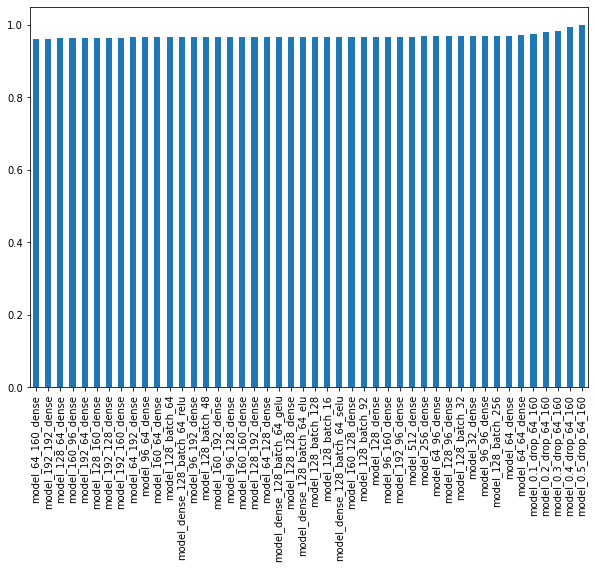

In [ ]:
from matplotlib import legend
df_scaled = df.div(df.max(axis=1), axis=0)
df_scaled.loc['mae'].sort_values().plot(figsize=(10, 7), kind="bar", legend=False)
df_scaled.loc['mae'].sort_values()

model_64_160_dense               0.960724
model_192_192_dense              0.961482
model_128_64_dense               0.962462
model_160_96_dense               0.963278
model_192_64_dense               0.963676
model_128_160_dense              0.963989
model_192_128_dense              0.964215
model_192_160_dense              0.964492
model_64_192_dense               0.964580
model_96_64_dense                0.964653
model_160_64_dense               0.964948
model_128_batch_64               0.965045
model_dense_128_batch_64_relu    0.965097
model_96_192_dense               0.965329
model_128_batch_48               0.965369
model_160_192_dense              0.965449
model_96_128_dense               0.965555
model_160_160_dense              0.965561
model_128_192_dense              0.965671
model_64_128_dense               0.965747
model_dense_128_batch_64_gelu    0.965753
model_128_128_dense              0.965796
model_dense_128_batch_64_elu     0.965846
model_128_batch_128              0

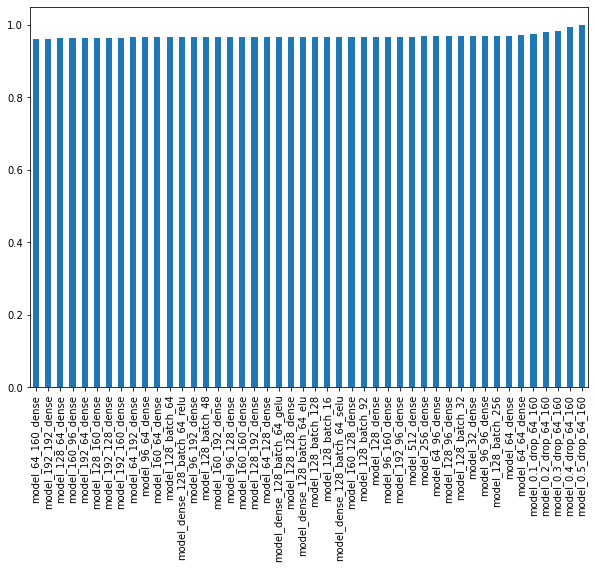

In [ ]:
df_scaled.loc['mase'].sort_values().plot(figsize=(10, 7), kind="bar", legend=False)
df_scaled.loc['mase'].sort_values()

{'mae': 833.2916,
 'mse': 1602351.6,
 'rmse': 1265.8403,
 'mape': 2.366376,
 'mase': 1.0011022}


In [ ]:
optimizer_dense.max  # bayese 155 n in 1 layer

{'target': -835.1089477539062,
 'params': {'hidden': 1.0005718740867244, 'neurons': 155.49194461487014}}

In [ ]:
dense_results['model_64_160_dense']

{'mae': 831.89606,
 'mse': 1612133.2,
 'rmse': 1269.6981,
 'mape': 2.36875,
 'mase': 1.0024859}

## Still didnt beat naive

# Next models CONV1D

In [ ]:
from tensorflow.python.keras import layers

tf.random.set_seed(42)
model_conv_results_dict = dict()

for i in [32,64,92,128]:
  for j in ["relu", "gelu"]:
    # Create model
    model_conv = tf.keras.Sequential([
      # Create Lambda layer to reshape inputs, without this layer, the model will error
      layers.Lambda(lambda x: tf.expand_dims(x, axis=1)), # resize the inputs to adjust for window size / Conv1D 3D input requirements
      layers.Conv1D(filters=i, kernel_size=5, padding="causal", activation=j),
      layers.Dense(HORIZON)
    ], name="model_conv_{}_activ_{}".format(i,j))

    # Compile model
    model_conv.compile(loss="mae",
                    optimizer=tf.keras.optimizers.Adam())

    # Fit model
    model_conv.fit(train_windows,
                train_labels,
                batch_size=64, 
                epochs=500,
                verbose=0,
                validation_data=(test_windows, test_labels),
                callbacks=[create_model_checkpoint(model_name=model_conv.name)])
    
    print(model_conv.summary())

    # Load in best performing Conv1D model and evaluate it on the test data
    model_conv = tf.keras.models.load_model("model_experiments/model_conv_{}_activ_{}".format(i,j))
    model_conv.evaluate(test_windows, test_labels)

    # Make predictions
    model_conv_preds = make_preds(model_conv, test_windows)

    # Evaluate predictions
    model_conv_results = evaluate_preds(y_true=tf.squeeze(test_labels),
                                    y_pred=model_conv_preds)

    model_conv_results_dict["model_conv_{}_activ_{}".format(i,j)] = model_conv_results

Model: "model_conv_32_activ_relu"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 module_wrapper_54 (ModuleWr  (None, 1, 7)             0         
 apper)                                                          
                                                                 
 module_wrapper_55 (ModuleWr  (None, 1, 32)            1152      
 apper)                                                          
                                                                 
 module_wrapper_56 (ModuleWr  (None, 1, 1)             33        
 apper)                                                          
                                                                 
Total params: 1,185
Trainable params: 1,185
Non-trainable params: 0
_________________________________________________________________
None
17/17 [==============================] - 0s 2ms/step


In [ ]:
model_conv_results_dict

{'model_conv_32_activ_relu': {'mae': 838.3724,
  'mse': 1638815.4,
  'rmse': 1280.1622,
  'mape': 2.3860326,
  'mase': 1.0102903},
 'model_conv_32_activ_gelu': {'mae': 839.36456,
  'mse': 1643606.9,
  'rmse': 1282.0323,
  'mape': 2.3897839,
  'mase': 1.0114859},
 'model_conv_64_activ_relu': {'mae': 835.12714,
  'mse': 1624699.6,
  'rmse': 1274.6371,
  'mape': 2.383305,
  'mase': 1.0063795},
 'model_conv_64_activ_gelu': {'mae': 837.0322,
  'mse': 1635352.9,
  'rmse': 1278.8092,
  'mape': 2.3837175,
  'mase': 1.0086753},
 'model_conv_92_activ_relu': {'mae': 837.60724,
  'mse': 1636383.2,
  'rmse': 1279.2119,
  'mape': 2.3855178,
  'mase': 1.0093682},
 'model_conv_92_activ_gelu': {'mae': 836.18866,
  'mse': 1629207.2,
  'rmse': 1276.404,
  'mape': 2.3814104,
  'mase': 1.0076587},
 'model_conv_128_activ_relu': {'mae': 835.3572,
  'mse': 1630210.8,
  'rmse': 1276.797,
  'mape': 2.3808088,
  'mase': 1.0066568},
 'model_conv_128_activ_gelu': {'mae': 836.6738,
  'mse': 1641847.5,
  'rmse': 128

In [ ]:
# Evaluate best predictions
model_conv_results_dict['model_conv_64_activ_relu']

{'mae': 835.12714,
 'mse': 1624699.6,
 'rmse': 1274.6371,
 'mape': 2.383305,
 'mase': 1.0063795}

### still cant beat naive


## try with dense layers

In [ ]:
from tensorflow.python.keras import layers

tf.random.set_seed(42)
model_conv_dense_results_dict = dict()

for i in [32,64,92,128]:
  for j in [32,64,128]:
    # Create model
    model_conv = tf.keras.Sequential([
      # Create Lambda layer to reshape inputs, without this layer, the model will error
      layers.Lambda(lambda x: tf.expand_dims(x, axis=1)), # resize the inputs to adjust for window size / Conv1D 3D input requirements
      layers.Conv1D(filters=64, kernel_size=5, padding="causal", activation="relu"),
      layers.Dense(i , activation="relu"),
      layers.Dense(HORIZON)
    ], name="model_conv_dense_{}_batch_{}".format(i,j))

    # Compile model
    model_conv.compile(loss="mae",
                    optimizer=tf.keras.optimizers.Adam())

    # Fit model
    model_conv.fit(train_windows,
                train_labels,
                batch_size=j, 
                epochs=500,
                verbose=0,
                validation_data=(test_windows, test_labels),
                callbacks=[create_model_checkpoint(model_name=model_conv.name)])
    
    print(model_conv.summary())

    # Load in best performing Conv1D model and evaluate it on the test data
    model_conv = tf.keras.models.load_model("model_experiments/model_conv_dense_{}_batch_{}".format(i,j))
    model_conv.evaluate(test_windows, test_labels)

    # Make predictions
    model_conv_preds = make_preds(model_conv, test_windows)

    # Evaluate predictions
    model_conv_results = evaluate_preds(y_true=tf.squeeze(test_labels),
                                    y_pred=model_conv_preds)

    model_conv_dense_results_dict["model_conv_dense_{}_batch_{}".format(i,j)] = model_conv_results

Model: "model_conv_dense_32_batch_32"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 module_wrapper (ModuleWrapp  (None, 1, 7)             0         
 er)                                                             
                                                                 
 module_wrapper_1 (ModuleWra  (None, 1, 64)            2304      
 pper)                                                           
                                                                 
 module_wrapper_2 (ModuleWra  (None, 1, 32)            2080      
 pper)                                                           
                                                                 
 module_wrapper_3 (ModuleWra  (None, 1, 1)             33        
 pper)                                                           
                                                                 
Total params: 4,417
Trainable params: 

Model: "model_conv_dense_32_batch_64"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 module_wrapper_4 (ModuleWra  (None, 1, 7)             0         
 pper)                                                           
                                                                 
 module_wrapper_5 (ModuleWra  (None, 1, 64)            2304      
 pper)                                                           
                                                                 
 module_wrapper_6 (ModuleWra  (None, 1, 32)            2080      
 pper)                                                           
                                                                 
 module_wrapper_7 (ModuleWra  (None, 1, 1)             33        
 pper)                                                           
                                                                 
Total params: 4,417
Trainable params: 

Model: "model_conv_dense_32_batch_128"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 module_wrapper_8 (ModuleWra  (None, 1, 7)             0         
 pper)                                                           
                                                                 
 module_wrapper_9 (ModuleWra  (None, 1, 64)            2304      
 pper)                                                           
                                                                 
 module_wrapper_10 (ModuleWr  (None, 1, 32)            2080      
 apper)                                                          
                                                                 
 module_wrapper_11 (ModuleWr  (None, 1, 1)             33        
 apper)                                                          
                                                                 
Total params: 4,417
Trainable params:

Model: "model_conv_dense_64_batch_32"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 module_wrapper_12 (ModuleWr  (None, 1, 7)             0         
 apper)                                                          
                                                                 
 module_wrapper_13 (ModuleWr  (None, 1, 64)            2304      
 apper)                                                          
                                                                 
 module_wrapper_14 (ModuleWr  (None, 1, 64)            4160      
 apper)                                                          
                                                                 
 module_wrapper_15 (ModuleWr  (None, 1, 1)             65        
 apper)                                                          
                                                                 
Total params: 6,529
Trainable params: 

Model: "model_conv_dense_64_batch_64"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 module_wrapper_16 (ModuleWr  (None, 1, 7)             0         
 apper)                                                          
                                                                 
 module_wrapper_17 (ModuleWr  (None, 1, 64)            2304      
 apper)                                                          
                                                                 
 module_wrapper_18 (ModuleWr  (None, 1, 64)            4160      
 apper)                                                          
                                                                 
 module_wrapper_19 (ModuleWr  (None, 1, 1)             65        
 apper)                                                          
                                                                 
Total params: 6,529
Trainable params: 

Model: "model_conv_dense_64_batch_128"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 module_wrapper_20 (ModuleWr  (None, 1, 7)             0         
 apper)                                                          
                                                                 
 module_wrapper_21 (ModuleWr  (None, 1, 64)            2304      
 apper)                                                          
                                                                 
 module_wrapper_22 (ModuleWr  (None, 1, 64)            4160      
 apper)                                                          
                                                                 
 module_wrapper_23 (ModuleWr  (None, 1, 1)             65        
 apper)                                                          
                                                                 
Total params: 6,529
Trainable params:

Model: "model_conv_dense_92_batch_32"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 module_wrapper_24 (ModuleWr  (None, 1, 7)             0         
 apper)                                                          
                                                                 
 module_wrapper_25 (ModuleWr  (None, 1, 64)            2304      
 apper)                                                          
                                                                 
 module_wrapper_26 (ModuleWr  (None, 1, 92)            5980      
 apper)                                                          
                                                                 
 module_wrapper_27 (ModuleWr  (None, 1, 1)             93        
 apper)                                                          
                                                                 
Total params: 8,377
Trainable params: 

Model: "model_conv_dense_92_batch_64"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 module_wrapper_28 (ModuleWr  (None, 1, 7)             0         
 apper)                                                          
                                                                 
 module_wrapper_29 (ModuleWr  (None, 1, 64)            2304      
 apper)                                                          
                                                                 
 module_wrapper_30 (ModuleWr  (None, 1, 92)            5980      
 apper)                                                          
                                                                 
 module_wrapper_31 (ModuleWr  (None, 1, 1)             93        
 apper)                                                          
                                                                 
Total params: 8,377
Trainable params: 

Model: "model_conv_dense_92_batch_128"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 module_wrapper_32 (ModuleWr  (None, 1, 7)             0         
 apper)                                                          
                                                                 
 module_wrapper_33 (ModuleWr  (None, 1, 64)            2304      
 apper)                                                          
                                                                 
 module_wrapper_34 (ModuleWr  (None, 1, 92)            5980      
 apper)                                                          
                                                                 
 module_wrapper_35 (ModuleWr  (None, 1, 1)             93        
 apper)                                                          
                                                                 
Total params: 8,377
Trainable params:

Model: "model_conv_dense_128_batch_32"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 module_wrapper_36 (ModuleWr  (None, 1, 7)             0         
 apper)                                                          
                                                                 
 module_wrapper_37 (ModuleWr  (None, 1, 64)            2304      
 apper)                                                          
                                                                 
 module_wrapper_38 (ModuleWr  (None, 1, 128)           8320      
 apper)                                                          
                                                                 
 module_wrapper_39 (ModuleWr  (None, 1, 1)             129       
 apper)                                                          
                                                                 
Total params: 10,753
Trainable params

Model: "model_conv_dense_128_batch_64"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 module_wrapper_40 (ModuleWr  (None, 1, 7)             0         
 apper)                                                          
                                                                 
 module_wrapper_41 (ModuleWr  (None, 1, 64)            2304      
 apper)                                                          
                                                                 
 module_wrapper_42 (ModuleWr  (None, 1, 128)           8320      
 apper)                                                          
                                                                 
 module_wrapper_43 (ModuleWr  (None, 1, 1)             129       
 apper)                                                          
                                                                 
Total params: 10,753
Trainable params

Model: "model_conv_dense_128_batch_128"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 module_wrapper_44 (ModuleWr  (None, 1, 7)             0         
 apper)                                                          
                                                                 
 module_wrapper_45 (ModuleWr  (None, 1, 64)            2304      
 apper)                                                          
                                                                 
 module_wrapper_46 (ModuleWr  (None, 1, 128)           8320      
 apper)                                                          
                                                                 
 module_wrapper_47 (ModuleWr  (None, 1, 1)             129       
 apper)                                                          
                                                                 
Total params: 10,753
Trainable param

In [ ]:
model_conv_dense_results_dict

{'model_conv_dense_32_batch_32': {'mae': 837.3952,
  'mse': 1646697.5,
  'rmse': 1283.237,
  'mape': 2.3866978,
  'mase': 1.0091127},
 'model_conv_dense_32_batch_64': {'mae': 836.146,
  'mse': 1628095.2,
  'rmse': 1275.9684,
  'mape': 2.377246,
  'mase': 1.0076073},
 'model_conv_dense_32_batch_128': {'mae': 837.78094,
  'mse': 1636597.5,
  'rmse': 1279.2957,
  'mape': 2.3855605,
  'mase': 1.0095775},
 'model_conv_dense_64_batch_32': {'mae': 837.1154,
  'mse': 1631667.8,
  'rmse': 1277.3676,
  'mape': 2.3838751,
  'mase': 1.0087755},
 'model_conv_dense_64_batch_64': {'mae': 838.1191,
  'mse': 1636648.6,
  'rmse': 1279.3157,
  'mape': 2.3940976,
  'mase': 1.009985},
 'model_conv_dense_64_batch_128': {'mae': 836.62213,
  'mse': 1642607.1,
  'rmse': 1281.6423,
  'mape': 2.382794,
  'mase': 1.0081811},
 'model_conv_dense_92_batch_32': {'mae': 836.5269,
  'mse': 1624985.4,
  'rmse': 1274.7491,
  'mape': 2.3872247,
  'mase': 1.0080663},
 'model_conv_dense_92_batch_64': {'mae': 833.957,
  'mse

In [ ]:
model_conv_dense_results_dict['model_conv_dense_92_batch_64']

{'mae': 833.957,
 'mse': 1634909.8,
 'rmse': 1278.6359,
 'mape': 2.3765917,
 'mase': 1.0049694}

## With Dense layer mae score is better, as it was predicted from conv layer arhitecture

## Also batch size of 64 showing the best results, so we will stick to it

# NEXT MODEL: LSTM with BayesianOptimization

##### as many reasearches shows that RNN without LSTM shows less performance in this particular task with it, so we will use LSTM layer

###### https://norma.ncirl.ie/2496/1/seanmcnally.pdf

In [ ]:
model_lstm_relu_list=[]

def lstm_models(layers, neurons):
    tf.random.set_seed(42)
    # Create model
    model_LSTM = tf.keras.models.Sequential([
        # Create Lambda layer to reshape inputs, without this layer, the model will error
        tf.keras.layers.Lambda(lambda x: tf.expand_dims(tf.cast(x, tf.float64), axis=1)),
        
        # Shape [batch, time, features] => [batch, time, lstm_units]
        tf.keras.layers.LSTM(int(layers), activation="relu"),
        
        tf.keras.layers.Dense(int(neurons), activation="relu"),
        # Shape => [batch, time, features]
        tf.keras.layers.Dense(int(HORIZON))
    ])
    
    # Compile model
    model_LSTM.compile(loss="mae",
                       optimizer=tf.keras.optimizers.Adam())
    # Fit
    model_LSTM.fit(train_windows,
              train_labels,
              epochs=500,
              verbose=0,
              batch_size=64,
              validation_data=(test_windows, test_labels),
              callbacks=[tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=200, restore_best_weights=True),
                        tf.keras.callbacks.ReduceLROnPlateau(monitor="val_loss", patience=100, verbose=1)])

    # Make predictions
    model_lstm_preds = make_preds(model_LSTM, test_windows)

    # Evaluate predictions
    model_lstm_results = evaluate_preds(y_true=tf.squeeze(test_labels),
                                    y_pred=model_lstm_preds)

    model_lstm_relu_list.append(model_lstm_results)

    return -1*model_LSTM.evaluate(test_windows, test_labels)


In [ ]:
# Bounded region of parameter space
pbounds = {'layers': (16, 256), 'neurons': (16,512)}

optimizer = BayesianOptimization(
  f=lstm_models,
  pbounds=pbounds,
  verbose=2, # verbose = 1 prints only when a maximum is observed, verbose = 0 is silent
  random_state=1,
)

acquisition_function = UtilityFunction(kind="ucb", kappa=2.5, xi=0.0)

optimizer.maximize(
  acquisition_function=acquisition_function,
  n_iter=10,
)

|   iter    |  target   |  layers   |  neurons  |
-------------------------------------------------

Epoch 343: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.

Epoch 443: ReduceLROnPlateau reducing learning rate to 1.0000000474974514e-05.
17/17 [==============================] - 0s 2ms/step - loss: 838.5816
| 1         | -838.6    | 116.1     | 373.3     |
17/17 [==============================] - 0s 2ms/step - loss: 1096.9241
| 2         | -1.097e+0 | 16.03     | 166.0     |
17/17 [==============================] - 0s 2ms/step - loss: 1008.2546
| 3         | -1.008e+0 | 51.22     | 61.8      |

Epoch 393: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.

Epoch 493: ReduceLROnPlateau reducing learning rate to 1.0000000474974514e-05.
17/17 [==============================] - 0s 2ms/step - loss: 839.8857
| 4         | -839.9    | 60.7      | 187.4     |
17/17 [==============================] - 0s 2ms/step - loss: 914.4583
| 5         | -914.5    | 11

In [ ]:
print(optimizer.max)

{'target': -835.0900268554688, 'params': {'layers': 80.68888687016931, 'neurons': 472.8837993993826}}


In [ ]:
model_lstm_relu_list

[{'mae': 838.5816,
  'mse': 1633534.2,
  'rmse': 1278.0979,
  'mape': 2.3922899,
  'mase': 1.0105424},
 {'mae': 1096.9238,
  'mse': 2400969.2,
  'rmse': 1549.5061,
  'mape': 3.221368,
  'mase': 1.3218607},
 {'mae': 1008.2545,
  'mse': 2128521.2,
  'rmse': 1458.9453,
  'mape': 2.9425776,
  'mase': 1.2150086},
 {'mae': 839.88556,
  'mse': 1654913.8,
  'rmse': 1286.4346,
  'mape': 2.3953583,
  'mase': 1.0121137},
 {'mae': 914.4585,
  'mse': 1864608.6,
  'rmse': 1365.5067,
  'mape': 2.6460135,
  'mase': 1.1019787},
 {'mae': 836.18774,
  'mse': 1638014.0,
  'rmse': 1279.8492,
  'mape': 2.380857,
  'mase': 1.0076576},
 {'mae': 864.1045,
  'mse': 1723204.2,
  'rmse': 1312.7087,
  'mape': 2.4792812,
  'mase': 1.041299},
 {'mae': 836.9644,
  'mse': 1640961.5,
  'rmse': 1281.0002,
  'mape': 2.3866193,
  'mase': 1.0085936},
 {'mae': 836.1488,
  'mse': 1638618.1,
  'rmse': 1280.0852,
  'mape': 2.3839169,
  'mase': 1.0076107},
 {'mae': 835.93524,
  'mse': 1625789.2,
  'rmse': 1275.0645,
  'mape': 2

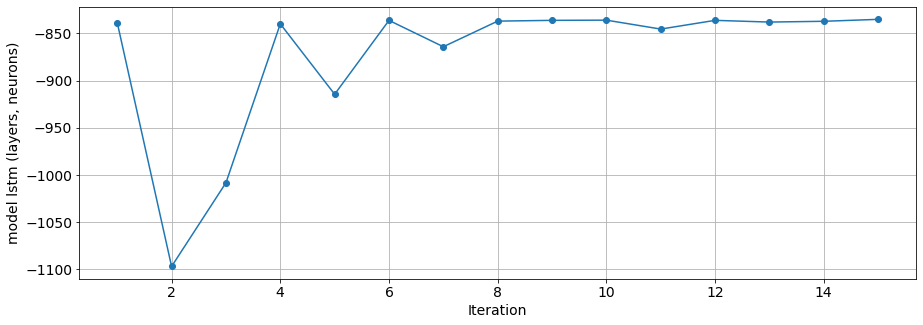

In [ ]:
plt.figure(figsize = (15, 5))
plt.plot(range(1, 1 + len(optimizer.space.target)), optimizer.space.target, "-o")
plt.grid(True)
plt.xlabel("Iteration", fontsize = 14)
plt.ylabel("model lstm (layers, neurons)", fontsize = 14)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)
plt.show()

# LSTM model but with gelu and without dense

In [ ]:
model_lstm_gelu_list=[]

def lstm_models_gelu(layers, batch):

    tf.random.set_seed(42)
    # Create model
    model_LSTM = tf.keras.models.Sequential([
        # Create Lambda layer to reshape inputs, without this layer, the model will error
        tf.keras.layers.Lambda(lambda x: tf.expand_dims(tf.cast(x, tf.float64), axis=1)),
        
        # Shape [batch, time, features] => [batch, time, lstm_units]
        tf.keras.layers.LSTM(int(layers), activation="gelu"),
        # Shape => [batch, time, features]
        tf.keras.layers.Dense(int(HORIZON))
    ])
    
    # Compile model
    model_LSTM.compile(loss="mae",
                       optimizer=tf.keras.optimizers.Adam())
    # Fir
    model_LSTM.fit(train_windows,
              train_labels,
              epochs=500,
              verbose=0,
              batch_size=int(batch),
              validation_data=(test_windows, test_labels),
              callbacks=[tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=200, restore_best_weights=True),
                        tf.keras.callbacks.ReduceLROnPlateau(monitor="val_loss", patience=100, verbose=1)])

    # Make predictions
    model_lstm_preds = make_preds(model_LSTM, test_windows)

    # Evaluate predictions
    model_lstm_results = evaluate_preds(y_true=tf.squeeze(test_labels),
                                    y_pred=model_lstm_preds)

    model_lstm_gelu_list.append(model_lstm_results)

    return -1*model_LSTM.evaluate(test_windows, test_labels)


In [ ]:
# Bounded region of parameter space
pbounds_gelu = {'layers': (1, 512), 'batch': (8,256)}

optimizer_gelu = BayesianOptimization(
  f=lstm_models_gelu,
  pbounds=pbounds_gelu,
  verbose=2, # verbose = 1 prints only when a maximum is observed, verbose = 0 is silent
  random_state=1,
)

acquisition_function = UtilityFunction(kind="ucb", kappa=2.5, xi=0.0)

optimizer_gelu.maximize(
  acquisition_function=acquisition_function,
  n_iter=10,
)

|   iter    |  target   |   batch   |  layers   |
-------------------------------------------------
17/17 [==============================] - 0s 3ms/step - loss: 838.0814
| 1         | -838.1    | 111.4     | 369.1     |

Epoch 324: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.

Epoch 432: ReduceLROnPlateau reducing learning rate to 1.0000000474974514e-05.
17/17 [==============================] - 0s 2ms/step - loss: 838.6018
| 2         | -838.6    | 8.028     | 155.5     |
17/17 [==============================] - 0s 2ms/step - loss: 959.0280
| 3         | -959.0    | 44.4      | 48.19     |
17/17 [==============================] - 0s 2ms/step - loss: 1235.0646
| 4         | -1.235e+0 | 54.19     | 177.6     |
17/17 [==============================] - 0s 3ms/step - loss: 838.1864
| 5         | -838.2    | 106.4     | 276.3     |
17/17 [==============================] - 0s 3ms/step - loss: 916.2261
| 6         | -916.2    | 110.2     | 368.3     |

Epoch 491: ReduceL

| 11        | -836.7    | 9.176     | 148.9     | Best performance

## Some simple conclusions: 
# adding dense layers improve the results
# Bayese optimisation working fine with models where grid serach for hyperparameters is too expensive

# GRU model with gelu

In [ ]:
tf.random.set_seed(42)

# Create model
model_GRU_gelu = tf.keras.models.Sequential([
    # Create Lambda layer to reshape inputs, without this layer, the model will error
    layers.Lambda(lambda x: tf.expand_dims(x, axis=1)),
    # Shape [batch, time, features] => [batch, time, lstm_units]
    layers.GRU(128, activation="gelu"),
    layers.Dense(62, activation="relu"),
    # Shape => [batch, time, features]
    layers.Dense(HORIZON)
], name="model_GRU_gelu")

# Compile model
model_GRU_gelu.compile(loss="mae",
                optimizer=tf.keras.optimizers.Adam())

# Fit model
# Seems when saving the model several warnings are appearing: https://github.com/tensorflow/tensorflow/issues/47554 
model_GRU_gelu.fit(train_windows,
            train_labels,
            epochs=500,
            verbose=0,
            batch_size=128,
            validation_data=(test_windows, test_labels),
            callbacks=[create_model_checkpoint(model_name=model_GRU_gelu.name)])

In [ ]:
# Load in best version of model LSTM and evaluate on the test data
model_GRU_gelu = tf.keras.models.load_model("model_experiments/model_GRU_gelu/")
model_GRU_gelu.evaluate(test_windows, test_labels)

17/17 [==============================] - 0s 2ms/step - loss: 832.4614


832.46142578125

In [ ]:
# Make predictions using model_1 on the test dataset and view the results
model_GRU_gelu_preds = make_preds(model_GRU_gelu, test_windows)
# Evaluate preds
model_GRU_gelu_results = evaluate_preds(y_true=tf.squeeze(test_labels), # reduce to right shape
                                 y_pred=model_GRU_gelu_preds)
model_GRU_gelu_results

17/17 [==============================] - 0s 4ms/step


{'mae': 832.4614,
 'mse': 1627159.5,
 'rmse': 1275.6016,
 'mape': 2.3727303,
 'mase': 1.0031672}

898.2 without dense 64

# Stacionarity

In [ ]:
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm

print("Dickey–Fuller test: p=%f" % sm.tsa.stattools.adfuller(prices)[1])

Dickey–Fuller test: p=0.436724


In [ ]:
test = sm.tsa.adfuller(prices)
print('adf: ', test[0]) 
print('p-value: ', test[1])
print('Critical values: \n', test[4])
if test[0]> test[4]['5%']: 
    print ('non stacionar')
else:
    print ('stacionar')

adf:  -1.6891243986151165
p-value:  0.4367244453405944
Critical values: 
 {'1%': -3.432919034594598, '5%': -2.862674995236558, '10%': -2.5673742003270332}
non stacionar


In [ ]:
import scipy.stats as scs

def invboxcox(y,lmbda):
    if lmbda == 0:
        return(np.exp(y))
    else:
        return(np.exp(np.log(lmbda*y+1)/lmbda))

data = df_tech.copy()
data = data.iloc[365:, 1:7].reset_index()
data = data.drop(columns=['index'])

In [ ]:
#import statsmodels.formula.api as smf
import statsmodels.tsa.api as smtsa

def tsplot(y, lags=None, figsize=(12, 7), style='bmh'):
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
    with plt.style.context(style):    
        fig = plt.figure(figsize=figsize)
        layout = (2, 2)
        ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1, 0))
        pacf_ax = plt.subplot2grid(layout, (1, 1))

        y.plot(ax=ts_ax)
        ts_ax.set_title('Time Series Analyse')
        smtsa.graphics.plot_acf(y, lags=lags, ax=acf_ax, alpha=0.5)
        smtsa.graphics.plot_pacf(y, lags=lags, ax=pacf_ax, alpha=0.5)

        print("Dickey–Fuller test: p=%f" % sm.tsa.stattools.adfuller(y)[1])

        plt.tight_layout()
    return

Dickey–Fuller test: p=0.436724


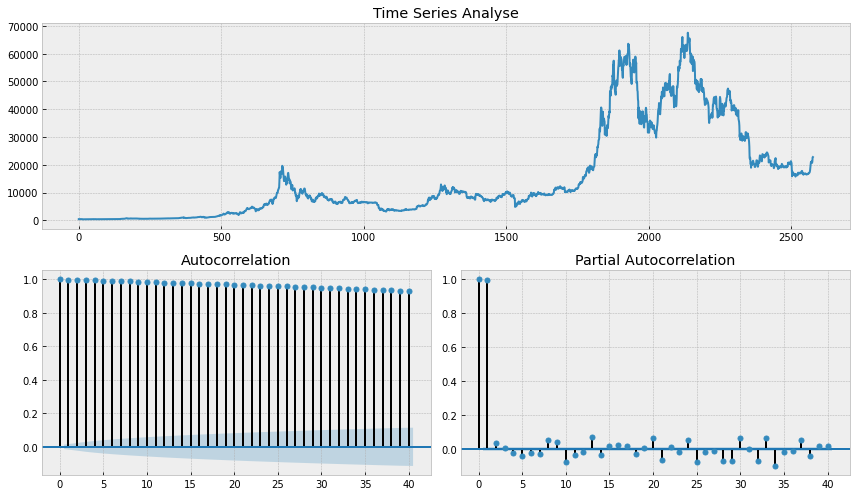

In [ ]:
tsplot(data.price_close, lags=40)

Dickey–Fuller test: p=0.000000


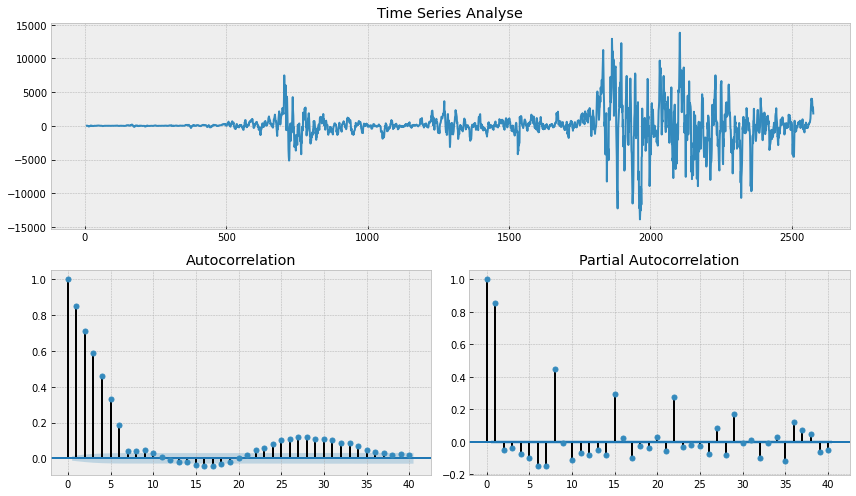

In [ ]:
data['price_season_7'] = data.price_close - data.price_close.shift(7)

tsplot(data.price_season_7[7:], lags=40)

Dickey–Fuller test: p=0.516312
Optional box kox parametr: 0.182548


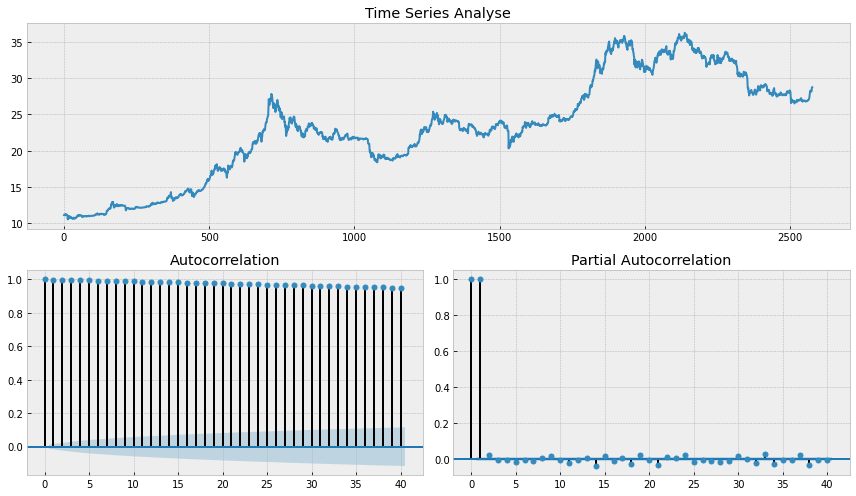

In [ ]:
data['price_float']=data['price_close'].astype(float)
data['price_box'], lmbda = scs.boxcox(data.price_float + 1)
tsplot(data.price_box, lags=40)
print("Optional box kox parametr: %f" % lmbda)

Dickey–Fuller test: p=0.000000


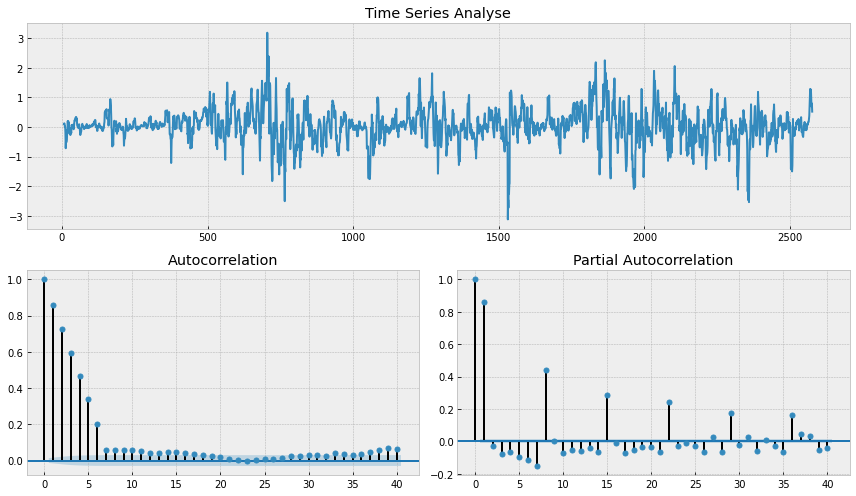

In [ ]:
data['price_box_season_7'] = data.price_box - data.price_box.shift(7)

tsplot(data.price_box_season_7[7:], lags=40)

In [ ]:
def parser(s):
    return datetime.strptime(s, '%Y-%m-%d')
#read data
btc_sales = pd.read_csv('df_TA.csv', parse_dates=[1], index_col=1, date_parser=parser)


In [ ]:
dataa = btc_sales.iloc[365:, 1:]
dataa= dataa['price_close']
dataa

time
2016-01-02      435.40
2016-01-03      431.91
2016-01-04      433.85
2016-01-05      433.34
2016-01-06      430.87
                ...   
2023-01-17    21136.33
2023-01-18    20674.29
2023-01-19    21084.22
2023-01-20    22669.81
2023-01-21    22789.37
Name: price_close, Length: 2577, dtype: float64

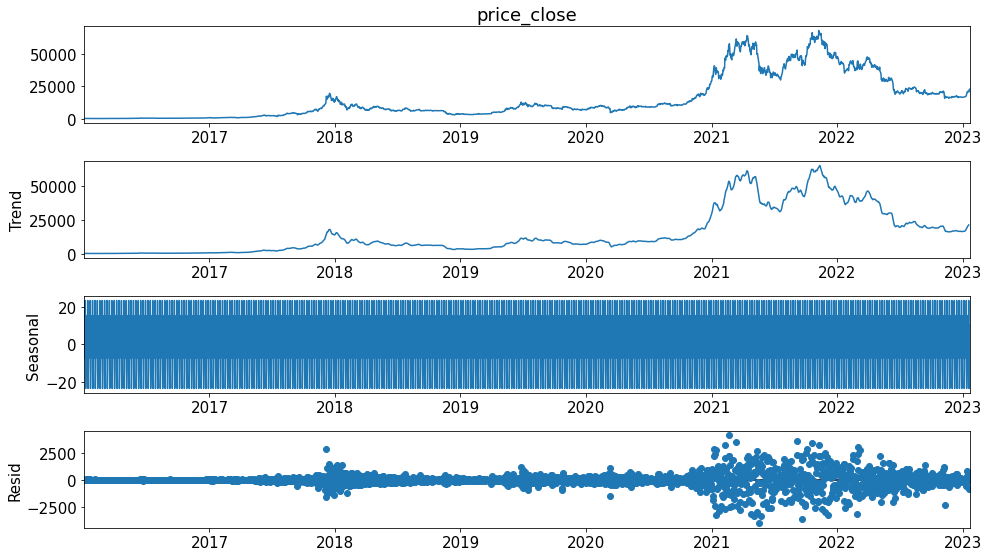

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

btc_sales = dataa.asfreq(pd.infer_freq(dataa.index))

plt.rc('figure',figsize=(14,8))
plt.rc('font',size=15)

result = seasonal_decompose(btc_sales,model='additive')
fig = result.plot()

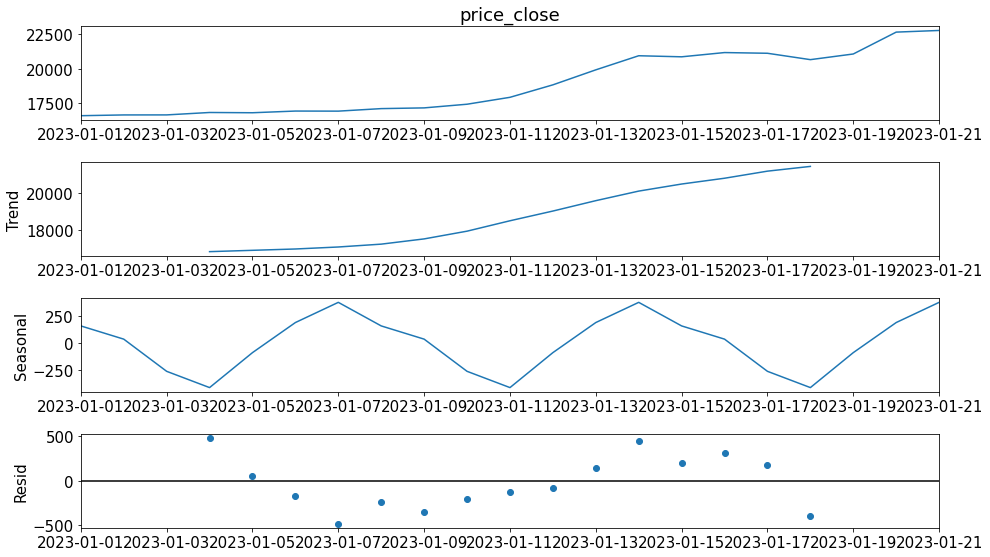

In [ ]:
#transform
start_date = datetime(2023,1,1)
end_date = datetime(2023,1,21)
btc_sales = btc_sales[start_date:end_date]


plt.rc('figure',figsize=(14,8))
plt.rc('font',size=15)
btc_sales

result = seasonal_decompose(btc_sales,model='additive')
fig = result.plot()



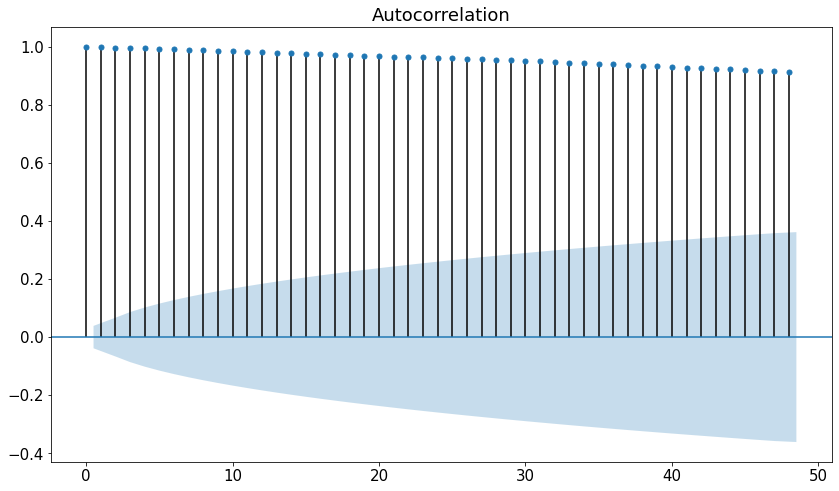

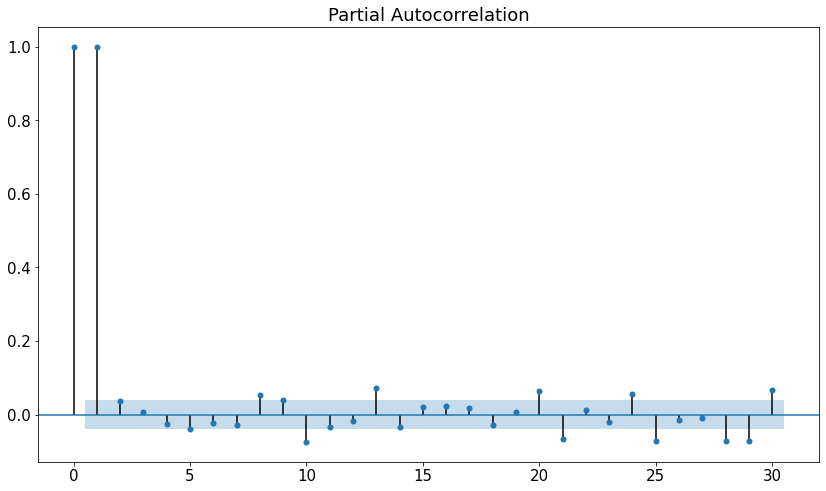

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

plot_acf(btc_sales, lags=48);
plot_pacf(btc_sales, lags=30);

In [ ]:
trainn = data.price_box_season_7[:split_size]
testt = data.price_box_season_7[split_size:]
testt_box = data.price_box[split_size:]

In [ ]:
%%time
best_model = sm.tsa.statespace.SARIMAX(trainn, order=(4, 1, 3), 
                                        seasonal_order=(4, 1, 0, 7)).fit(disp=-1)
print(best_model.summary())

/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                                     SARIMAX Results                                      
Dep. Variable:                 price_box_season_7   No. Observations:                 2061
Model:             SARIMAX(4, 1, 3)x(4, 1, [], 7)   Log Likelihood                -355.637
Date:                            Mon, 20 Feb 2023   AIC                            735.275
Time:                                    12:05:42   BIC                            802.800
Sample:                                         0   HQIC                           760.036
                                           - 2061                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4965      0.024     20.483      0.000       0.449       0.544
ar.L2         -0.4093      0.021   

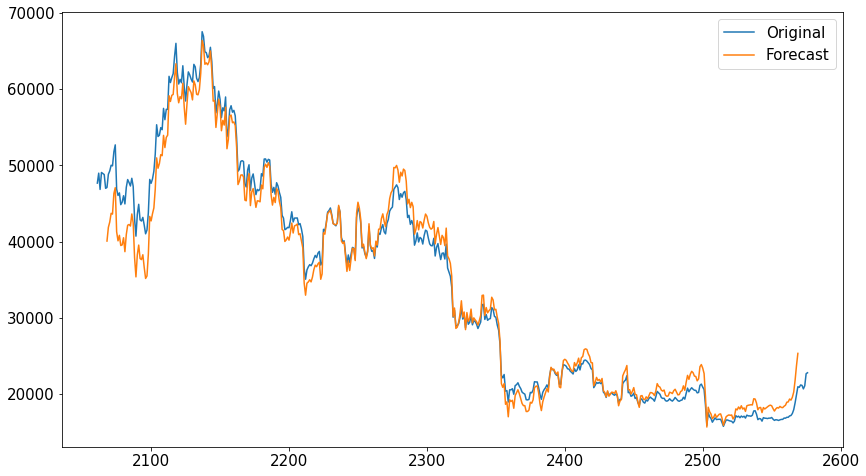

In [ ]:
# Step 5: Generate predictions on test set
predictions = best_model.get_forecast(steps=len(testt)).predicted_mean

# Step 6: Convert predictions back to original price format
predictions = invboxcox(predictions + testt_box.shift(7), lmbda).shift(-7)

predictions = predictions - 10000

# Step 7: Plot results
plt.plot(data.index[-len(testt):], data.price_float[-len(testt):], label='Original')
plt.plot(testt.index[7:], predictions[7:], label='Forecast')
plt.legend()
plt.show()

In [ ]:
# Make sure float32 (for metric calculations)
y_true = tf.cast(data.price_float[split_size:-7], dtype=tf.float32)
y_pred = tf.cast(predictions[:-7], dtype=tf.float32)

y_true = y_true[7:]
y_pred = y_pred[7:]

y_true = tf.constant(y_true)
y_pred = tf.constant(y_pred)

evaluate_preds(y_true, y_pred)

{'mae': 1539.5793,
 'mse': 4245592.0,
 'rmse': 2060.4834,
 'mape': 4.6764655,
 'mase': 1.8441283}

# Fourier Transforms

In [73]:
data_FT = df_TA[['time', 'price_close', 'price_open', 'price_high', 'price_low']]
data_FT

,time,price_close,price_open,price_high,price_low
0,2016-01-02,435.40,435.67,437.56,432.41
1,2016-01-03,431.91,435.40,435.75,425.02
2,2016-01-04,433.85,431.90,435.79,431.37
3,2016-01-05,433.34,433.84,435.64,430.00
4,2016-01-06,430.87,433.32,433.46,428.15
...,...,...,...,...,...
2572,2023-01-17,21136.33,21191.46,21595.00,20844.73
2573,2023-01-18,20674.29,21135.01,21650.21,20370.01
2574,2023-01-19,21084.22,20674.03,21197.00,20656.52
2575,2023-01-20,22669.81,21084.05,22754.73,20865.64


In [74]:
close_fft = np.fft.fft(np.asarray(data_FT['price_close'].tolist()))
fft_df = pd.DataFrame({'fft':close_fft})
fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))

/usr/local/lib/python3.9/dist-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
<ipython-input-75-5390dd01265c>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_FT['fourier_{}'.format(num_)]= np.fft.ifft(fft_list_m10)
/usr/local/lib/python3.9/dist-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
<ipython-input-75-5390dd01265c>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-

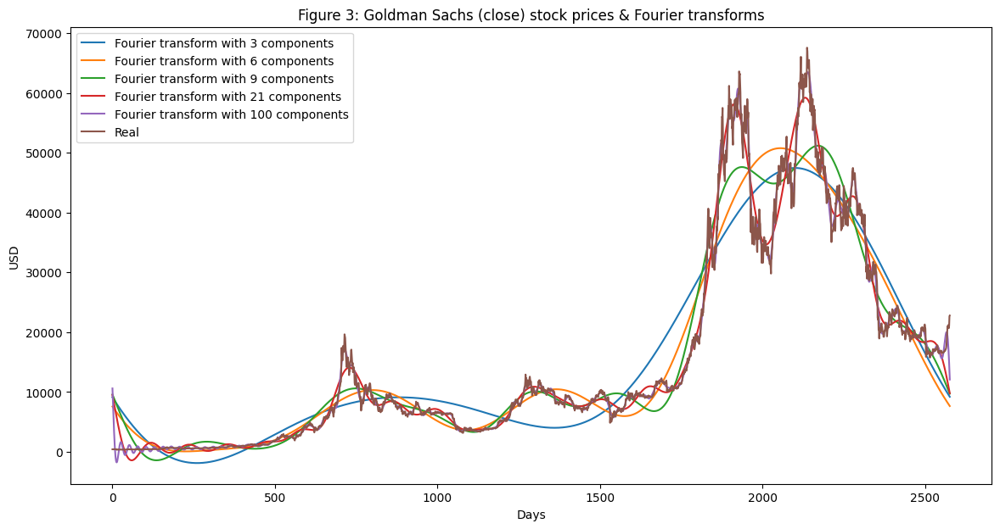

In [75]:
plt.figure(figsize=(14, 7), dpi=100)
fft_list = np.asarray(fft_df['fft'].tolist())
for num_ in [3, 6, 9, 21, 100]:
    fft_list_m10= np.copy(fft_list); fft_list_m10[num_:-num_]=0
    plt.plot(np.fft.ifft(fft_list_m10), label='Fourier transform with {} components'.format(num_))
    data_FT['fourier_{}'.format(num_)]= np.fft.ifft(fft_list_m10)
plt.plot(data_FT['price_close'],  label='Real')
plt.xlabel('Days')
plt.ylabel('USD')
plt.title('Figure 3: Goldman Sachs (close) stock prices & Fourier transforms')
plt.legend()
plt.show()

In [76]:
data_FT

,time,price_close,price_open,price_high,price_low,fourier_3,fourier_6,fourier_9,fourier_21,fourier_100
0,2016-01-02,435.40,435.67,437.56,432.41,9122.964702+379.173223j,7581.245993+65.509215j,9589.2980060-962.1404160j,9499.190368-376.604262j,10607.469928-115.896066j
1,2016-01-03,431.91,435.40,435.75,425.02,9037.073606+395.309200j,7501.566260+68.280879j,9454.6136090-936.0874340j,9207.337059-369.515664j,9087.846784-108.376549j
2,2016-01-04,433.85,431.90,435.79,431.37,8951.475016+411.424027j,7422.308180+71.037931j,9319.8553930-909.5837240j,8914.513708-361.458548j,7569.3466506-94.4462110j
3,2016-01-05,433.34,433.84,435.64,430.00,8866.170157+427.516842j,7343.473438+73.779780j,9185.0485770-882.6420470j,8621.016445-352.454034j,6085.0296101-74.9290750j
4,2016-01-06,430.87,433.32,433.46,428.15,8781.160242+443.586784j,7265.063691+76.505840j,9050.2184290-855.2753760j,8327.143449-342.525721j,4666.7158903-50.9796440j
...,...,...,...,...,...,...,...,...,...,...
2572,2023-01-17,21136.33,21191.46,21595.00,20844.73,9556.764175+298.206341j,7985.908273+51.452569j,10260.734832-1085.213271j,10933.756049-396.960590j,17129.429739-55.838022j
2573,2023-01-18,20674.29,21135.01,21650.21,20370.01,9469.429289+314.435097j,7904.146646+54.288340j,10126.795349-1061.597550j,10651.083863-394.940941j,16060.113735-79.042642j
2574,2023-01-19,21084.22,20674.03,21197.00,20656.52,9382.380626+330.647030j,7822.797781+57.112494j,9992.657060-1037.470667j,10366.011336-391.886133j,14849.319112-97.571636j
2575,2023-01-20,22669.81,21084.05,22754.73,20865.64,9295.619464+346.841273j,7741.863516+59.924425j,9858.344780-1012.844240j,10078.815979-387.804174j,13518.934420-110.328953j


In [77]:
# Loop through each column with complex values and add columns for the real and imaginary parts
for col in data_FT.columns:
    if 'fourier' in col:
        real_col_name = col + '_real'
        imag_col_name = col + '_imag'
        data_FT[real_col_name] = np.real(data_FT[col])
        data_FT[imag_col_name] = np.imag(data_FT[col])

<ipython-input-77-9bd771053120>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_FT[real_col_name] = np.real(data_FT[col])
<ipython-input-77-9bd771053120>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_FT[imag_col_name] = np.imag(data_FT[col])
<ipython-input-77-9bd771053120>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-d

In [78]:
data_FT = data_FT.drop(columns=['fourier_3',	'fourier_6',	'fourier_9',	'fourier_21',	'fourier_100'])
data_FT

,time,price_close,price_open,price_high,price_low,fourier_3_real,fourier_3_imag,fourier_6_real,fourier_6_imag,fourier_9_real,fourier_9_imag,fourier_21_real,fourier_21_imag,fourier_100_real,fourier_100_imag
0,2016-01-02,435.40,435.67,437.56,432.41,9122.964702,379.173223,7581.245993,65.509215,9589.298006,-962.140416,9499.190368,-376.604262,10607.469928,-115.896066
1,2016-01-03,431.91,435.40,435.75,425.02,9037.073606,395.309200,7501.566260,68.280879,9454.613609,-936.087434,9207.337059,-369.515664,9087.846784,-108.376549
2,2016-01-04,433.85,431.90,435.79,431.37,8951.475016,411.424027,7422.308180,71.037931,9319.855393,-909.583724,8914.513708,-361.458548,7569.346656,-94.446211
3,2016-01-05,433.34,433.84,435.64,430.00,8866.170157,427.516842,7343.473438,73.779780,9185.048577,-882.642047,8621.016445,-352.454034,6085.029611,-74.929075
4,2016-01-06,430.87,433.32,433.46,428.15,8781.160242,443.586784,7265.063691,76.505840,9050.218429,-855.275376,8327.143449,-342.525721,4666.715893,-50.979644
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2572,2023-01-17,21136.33,21191.46,21595.00,20844.73,9556.764175,298.206341,7985.908273,51.452569,10260.734832,-1085.213271,10933.756049,-396.960590,17129.429739,-55.838022
2573,2023-01-18,20674.29,21135.01,21650.21,20370.01,9469.429289,314.435097,7904.146646,54.288340,10126.795349,-1061.597550,10651.083863,-394.940941,16060.113735,-79.042642
2574,2023-01-19,21084.22,20674.03,21197.00,20656.52,9382.380626,330.647030,7822.797781,57.112494,9992.657060,-1037.470667,10366.011336,-391.886133,14849.319112,-97.571636
2575,2023-01-20,22669.81,21084.05,22754.73,20865.64,9295.619464,346.841273,7741.863516,59.924425,9858.344780,-1012.844240,10078.815979,-387.804174,13518.934420,-110.328953


# TIME FEATURES

In [35]:
df = df_tech[['time', 'price_close', 'price_open', 'price_high', 'price_low']]
#df['date'] = df['time']

for i in range(len(df)):
  df['time'][i] = datetime.strptime(df['time'][i], "%Y-%m-%d")

df = df.set_index('time')

df

<ipython-input-35-6842d5cd2e9a>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['time'][i] = datetime.strptime(df['time'][i], "%Y-%m-%d")


,price_close,price_open,price_high,price_low
time,,,,
2015-01-02,340.00,340.00,340.00,340.00
2015-01-03,340.00,340.00,340.00,340.00
2015-01-04,340.00,340.00,340.00,340.00
2015-01-05,340.00,340.00,340.00,340.00
2015-01-06,340.00,340.00,340.00,340.00
...,...,...,...,...
2023-01-17,21136.33,21191.46,21595.00,20844.73
2023-01-18,20674.29,21135.01,21650.21,20370.01
2023-01-19,21084.22,20674.03,21197.00,20656.52


In [36]:
sec = (df.index - pd.Timestamp("1970-01-01")).total_seconds()
sec = sec - sec.min()
sec

Float64Index([        0.0,     86400.0,    172800.0,    259200.0,    345600.0,
                 432000.0,    518400.0,    604800.0,    691200.0,    777600.0,
              ...
              253324800.0, 253411200.0, 253497600.0, 253584000.0, 253670400.0,
              253756800.0, 253843200.0, 253929600.0, 254016000.0, 254102400.0],
             dtype='float64', name='time', length=2942)

In [37]:
url = 'https://launchpad.net/~mario-mariomedina/+archive/ubuntu/talib/+files'
ext = '0.4.0-oneiric1_amd64.deb -qO'
!wget $url/libta-lib0_$ext libta.deb
!wget $url/ta-lib0-dev_$ext ta.deb
!dpkg -i libta.deb ta.deb
!pip install ta-lib
import talib

Selecting previously unselected package libta-lib0.
(Reading database ... 122349 files and directories currently installed.)
Preparing to unpack libta.deb ...
Unpacking libta-lib0 (0.4.0-oneiric1) ...
Selecting previously unselected package ta-lib0-dev.
Preparing to unpack ta.deb ...
Unpacking ta-lib0-dev (0.4.0-oneiric1) ...
Setting up libta-lib0 (0.4.0-oneiric1) ...
Setting up ta-lib0-dev (0.4.0-oneiric1) ...
Processing triggers for man-db (2.9.1-1) ...
Processing triggers for libc-bin (2.31-0ubuntu9.9) ...
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 272.6/272.6 KB 3.5 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for ta-lib: filename=TA_Lib-0.4.26-cp39-cp39-linux_x86_64.whl size=2261747 sha256=9f02408c53346f123d98c93f69dbf

In [38]:
import talib.abstract as ta
chlen=10
avg=21
smalen=4

df_wt = df.copy()

df_wt['hlc3'] = (df_wt['price_high'] + df_wt['price_low'] + df_wt['price_close']) / 3
df_wt['esa'] = ta.EMA(df_wt['hlc3'], timeperiod=chlen)
df_wt['d'] = ta.EMA((df_wt['hlc3'] - df_wt['esa']).abs(), timeperiod=chlen)
df_wt['ci'] = (df_wt['hlc3'] - df_wt['esa']) / (0.015 * df_wt['d'])
df_wt['tci'] = ta.EMA(df_wt['ci'], timeperiod=avg)

df_wt['wt1'] = df_wt['tci']
df_wt['wt2'] = ta.SMA(df_wt['wt1'], timeperiod=smalen)
df_wt['wt1-wt2'] = df_wt['wt1'] - df_wt['wt2']

df_wt['wt1'], df_wt['wt2']

(time
 2015-01-02          NaN
 2015-01-03          NaN
 2015-01-04          NaN
 2015-01-05          NaN
 2015-01-06          NaN
                 ...    
 2023-01-17    80.966643
 2023-01-18    78.608047
 2023-01-19    76.088953
 2023-01-20    76.868897
 2023-01-21    78.251873
 Name: wt1, Length: 2942, dtype: float64,
 time
 2015-01-02          NaN
 2015-01-03          NaN
 2015-01-04          NaN
 2015-01-05          NaN
 2015-01-06          NaN
                 ...    
 2023-01-17    79.531275
 2023-01-18    80.120806
 2023-01-19    79.207450
 2023-01-20    78.133135
 2023-01-21    77.454443
 Name: wt2, Length: 2942, dtype: float64)

In [39]:
# Load Bitcoin daily chart into a pandas DataFrame
#symbol = "BTC"
df['wt1'] = df_wt['wt1']
df['wt2'] = df_wt['wt2']
df['wt1-wt2'] = df_wt['wt1-wt2']

# 1. Date features
df['seconds'] = (df.index - pd.Timestamp("1970-01-01")).total_seconds()
df['seconds'] = df['seconds'] - df['seconds'].min()
df['day_of_week'] = df.index.dayofweek
df['month'] = df.index.month
df['year'] = df.index.year
df['quarter'] = df.index.quarter

# 2. Lag features
df['close_lag_7d'] = df['price_close'].shift(7)
df['close_lag_30d'] = df['price_close'].shift(30)

# 4. Time since an event
#df['days_since_halving'] = (df.index - pd.to_datetime('2020-05-11')).days

# 5. Cyclical features
"""df['hour_sin'] = np.sin(2 * np.pi * df.index.hour / 24)
df['hour_cos'] = np.cos(2 * np.pi * df.index.hour / 24)"""
df['day_of_week_sin'] = np.sin(2 * np.pi * df.index.dayofweek / 7)
df['day_of_week_cos'] = np.cos(2 * np.pi * df.index.dayofweek / 7)
df['month_sin'] = np.sin(2 * np.pi * df['month'] / 12)
df['month_cos'] = np.cos(2 * np.pi * df['month'] / 12)

df['price_sin'] = np.sin(2 * np.pi * df['price_close'] / df['price_close'].max())
df['price_cos'] = np.cos(2 * np.pi * df['price_close'] / df['price_close'].max())

#df['price_close_shifted_7'] = df['price_close'].shift(7) df['close_lag_7d']
#df['price_close_shifted_30'] = df['price_close'].shift(30) df['close_lag_30d']

df['price_7_sin'] = df.apply(lambda row: np.sin(2 * np.pi * min(row['price_close'], row['close_lag_7d']) / max(row['price_close'], row['close_lag_7d'])), axis=1)
df['price_7_cos'] = df.apply(lambda row: np.cos(2 * np.pi * min(row['price_close'], row['close_lag_7d']) / max(row['price_close'], row['close_lag_7d'])), axis=1)

df['price_30_sin'] = df.apply(lambda row: np.sin(2 * np.pi * min(row['price_close'], row['close_lag_30d']) / max(row['price_close'], row['close_lag_30d'])), axis=1)
df['price_30_cos'] = df.apply(lambda row: np.cos(2 * np.pi * min(row['price_close'], row['close_lag_30d']) / max(row['price_close'], row['close_lag_30d'])), axis=1)

df_TF = df.iloc[365:].reset_index()
df_TF

,time,price_close,price_open,price_high,price_low,wt1,wt2,wt1-wt2,seconds,day_of_week,...,day_of_week_sin,day_of_week_cos,month_sin,month_cos,price_sin,price_cos,price_7_sin,price_7_cos,price_30_sin,price_30_cos
0,2016-01-02,435.40,435.67,437.56,432.41,4.879162,4.148922,0.730241,31536000.0,5,...,-0.974928,-0.222521,0.5,0.866025,0.040485,0.999180,-0.228707,0.973495,-0.873596,0.486653
1,2016-01-03,431.91,435.40,435.75,425.02,2.650034,3.303744,-0.653710,31622400.0,6,...,-0.781831,0.623490,0.5,0.866025,0.040161,0.999193,-0.104405,0.994535,-0.835041,0.550187
2,2016-01-04,433.85,431.90,435.79,431.37,3.532060,3.558362,-0.026302,31708800.0,0,...,0.000000,1.000000,0.5,0.866025,0.040341,0.999186,-0.171631,0.985161,-0.616400,0.787433
3,2016-01-05,433.34,433.84,435.64,430.00,3.483270,3.636132,-0.152861,31795200.0,1,...,0.781831,0.623490,0.5,0.866025,0.040293,0.999188,-0.007964,0.999968,-0.616216,0.787577
4,2016-01-06,430.87,433.32,433.46,428.15,0.396854,2.515555,-2.118701,31881600.0,2,...,0.974928,-0.222521,0.5,0.866025,0.040064,0.999197,-0.042568,0.999094,-0.502954,0.864313
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2572,2023-01-17,21136.33,21191.46,21595.00,20844.73,80.966643,79.531275,1.435369,253756800.0,1,...,0.781831,0.623490,0.5,0.866025,0.922971,-0.384869,-0.890192,0.455586,-0.965290,0.261182
2573,2023-01-18,20674.29,21135.01,21650.21,20370.01,78.608047,80.120806,-1.512759,253843200.0,2,...,0.974928,-0.222521,0.5,0.866025,0.938653,-0.344862,-0.737721,0.675106,-0.959981,0.280065
2574,2023-01-19,21084.22,20674.03,21197.00,20656.52,76.088953,79.207450,-3.118497,253929600.0,3,...,0.433884,-0.900969,0.5,0.866025,0.924826,-0.380391,-0.618221,0.786004,-0.948230,0.317585
2575,2023-01-20,22669.81,21084.05,22754.73,20865.64,76.868897,78.133135,-1.264238,254016000.0,4,...,-0.433884,-0.900969,0.5,0.866025,0.858893,-0.512155,-0.687482,0.726202,-0.998813,-0.048705


# Feature importances

<ipython-input-372-8ad7f7b2dad5>:21: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  corr.style.background_gradient(cmap, axis=1)\


,price_close,fourier_3_real,fourier_6_real,fourier_9_real,fourier_21_real,fourier_100_real
price_close,1.00,0.94,0.95,0.97,0.99,1.00
fourier_3_real,0.94,1.00,0.98,0.97,0.95,0.94
fourier_6_real,0.95,0.98,1.00,0.99,0.96,0.96
fourier_9_real,0.97,0.97,0.99,1.00,0.98,0.97
fourier_21_real,0.99,0.95,0.96,0.98,1.00,0.99
fourier_100_real,1.00,0.94,0.96,0.97,0.99,1.00


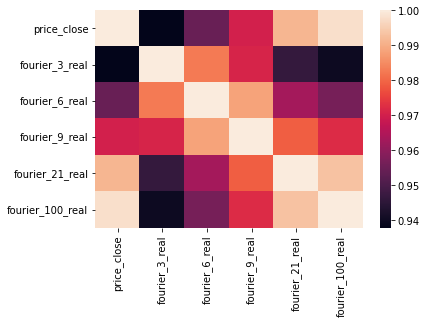

In [ ]:
corr = abs(data_FT.corr())
cmap = sns.diverging_palette(5, 250, as_cmap=True)

# plot the heatmap
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns)

def magnify():
    return [dict(selector="th",
                 props=[("font-size", "7pt")]),
            dict(selector="td",
                 props=[('padding', "0em 0em")]),
            dict(selector="th:hover",
                 props=[("font-size", "12pt")]),
            dict(selector="tr:hover td:hover",
                 props=[('max-width', '200px'),
                        ('font-size', '12pt')])
]

corr.style.background_gradient(cmap, axis=1)\
    .set_properties(**{'max-width': '100px', 'font-size': '10pt'})\
    .set_caption("Hover to magify")\
    .set_precision(2)\
    .set_table_styles(magnify())

In [ ]:
def get_feature_importance_data(data_income):
    data = data_income.copy()
    y = data['price_close']
    X = data.iloc[:, 1:]
    
    train_samples = int(X.shape[0] * 0.65)
 
    X_train = X.iloc[:train_samples]
    X_test = X.iloc[train_samples:]

    y_train = y.iloc[:train_samples]
    y_test = y.iloc[train_samples:]
    
    return (X_train, y_train), (X_test, y_test)

In [ ]:
X_train=[]
X_test=[]

In [ ]:
from matplotlib import pyplot
from sklearn.metrics import mean_absolute_error

def get_fi(X, y):
  #data = df.copy()
  #y = data['price_close']
  #X = data.iloc[:, 1:]
  # Set the logging level to ignore warnings
  
  
  train_samples = int(X.shape[0] * 0.65)

  X_train = X.iloc[:train_samples]
  X_test = X.iloc[train_samples:]

  y_train = y.iloc[:train_samples]
  y_test = y.iloc[train_samples:]

  
  regressor = xgb.XGBRegressor(gamma=0.0,n_estimators=150,base_score=0.7,colsample_bytree=1,learning_rate=0.05)
  
  xgbModel = regressor.fit(X_train,y_train, \
                        eval_set = [(X_train, y_train), (X_test, y_test)], \
                        verbose=False)
  
  xgbModel.set_params(verbosity=0) 

  eval_result = regressor.evals_result()

  training_rounds = range(len(eval_result['validation_0']['rmse']))
  
  plt.scatter(x=training_rounds,y=eval_result['validation_0']['rmse'],label='Training Error')
  plt.scatter(x=training_rounds,y=eval_result['validation_1']['rmse'],label='Validation Error')
  plt.xlabel('Iterations')
  plt.ylabel('RMSE')
  plt.title('Training Vs Validation Error')
  plt.legend()
  plt.show()

  plot_importance(xgbModel)
  pyplot.show()

  

  predictions = xgbModel.predict(X_test)
  
  mae = mean_absolute_error(y_test, predictions)
  #accuracy = accuracy_score(y_test, predictions)
  print("val_err(rmse) {}".format(min(eval_result['validation_1']['rmse'])))
  print("mae: %.2f" % (mae))
  # Fit model using each importance as a threshold
  thresholds = np.sort(xgbModel.feature_importances_)

  for thresh in thresholds:
    # select features using threshold
    selection = SelectFromModel(xgbModel, threshold=thresh, prefit=True)
    select_X_train = selection.transform(X_train)

    # train model
    
    selection_model = xgb.XGBRegressor(gamma=0.0,n_estimators=150,base_score=0.7,colsample_bytree=1,learning_rate=0.05)
    selection_model.fit(select_X_train, y_train)

    # eval model
    select_X_test = selection.transform(X_test)
    predictions = selection_model.predict(select_X_test)

    #accuracy = accuracy_score(y_test, predictions)
    mae = mean_absolute_error(y_test, predictions)

    print("Thresh=%.3f, n=%d, mae: %.2f" % (thresh, select_X_train.shape[1], mae))
    
  return xgbModel

[17:48:58] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
22149.613281


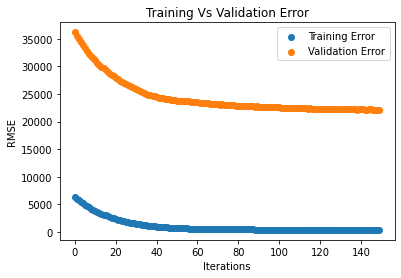

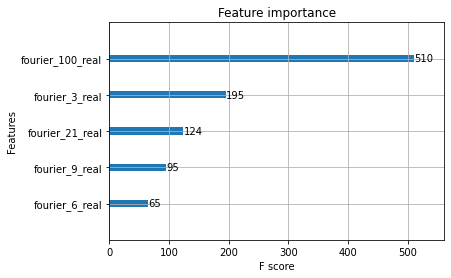

val_err(rmse) 22149.613281
mae: 16856.86
[17:49:00] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.004, n=5, mae: 16856.86
[17:49:00] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.006, n=4, mae: 16934.51
[17:49:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.013, n=3, mae: 16554.94
[17:49:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.025, n=2, mae: 16962.28
[17:49:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.953, n=1, mae: 16466.85


In [ ]:
xgb_FT = get_fi(data_FT.drop(columns=['time', 'price_close']), data_FT['price_close'])

In [ ]:
import pandas as pd
from sklearn.linear_model import LinearRegression

def calculate_vif(df, features):    
    vif, tolerance = {}, {}
    # all the features that you want to examine
    for feature in features:
        # extract all the other features you will regress against
        X = [f for f in features if f != feature]        
        X, y = df[X], df[feature]
        # extract r-squared from the fit
        r2 = LinearRegression().fit(X, y).score(X, y)                
        
        # calculate tolerance
        tolerance[feature] = 1 - r2
        # calculate VIF
        vif[feature] = 1/(tolerance[feature])
    # return VIF DataFrame
    return pd.DataFrame({'VIF': vif, 'Tolerance': tolerance})

In [ ]:
df_vif = data_FT.iloc[:, 2:]

In [ ]:
df_vif.columns

Index(['fourier_3_real', 'fourier_6_real', 'fourier_9_real', 'fourier_21_real',
       'fourier_100_real'],
      dtype='object')

In [ ]:
calculate_vif(df=df_vif, features=['fourier_3_real',
                                   #'fourier_6_real',
                                   'fourier_9_real',
                                   #'fourier_21_real',
                                   'fourier_100_real'
                                   ])

,VIF,Tolerance
fourier_3_real,17.605869,0.056799
fourier_9_real,37.505284,0.026663
fourier_100_real,18.333074,0.054546


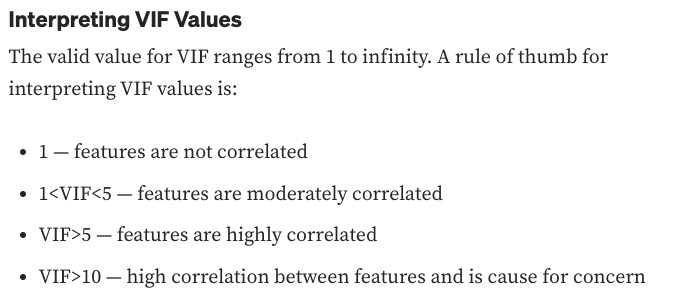

[18:02:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
21447.666016


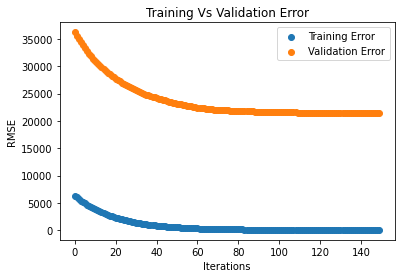

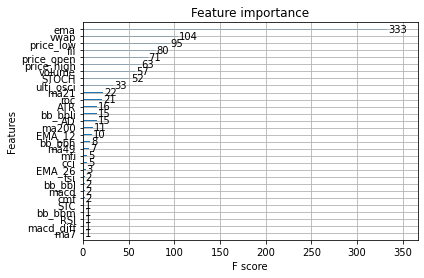

val_err(rmse) 21447.666016
mae: 15996.26
[18:02:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.000, n=39, mae: 15996.26
[18:02:09] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.000, n=39, mae: 15996.26
[18:02:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.000, n=39, mae: 15996.26
[18:02:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.000, n=39, mae: 15996.26
[18:02:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.000, n=39, mae: 15996.26
[18:02:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.000, n=39, mae: 15

In [ ]:
xgb_FT = get_fi(df_TA.drop(columns=['time', 'price_close']), data_FT['price_close'])

<BarContainer object of 39 artists>

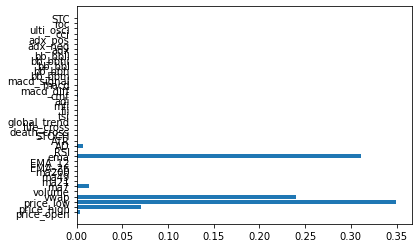

In [ ]:
plt.barh(df_TA.drop(columns=['time','price_close']).columns, xgb_FT.feature_importances_)

In [ ]:
!pip install shap
import shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 575.9/575.9 KB 10.0 MB/s eta 0:00:00


In [ ]:
explainer = shap.TreeExplainer(xgb_FT)
shap_values = explainer.shap_values(df_TA.drop(columns=['time','price_close']))

shap.summary_plot(shap_values, df_TA.drop(columns=['time','price_close']), plot_type="bar")

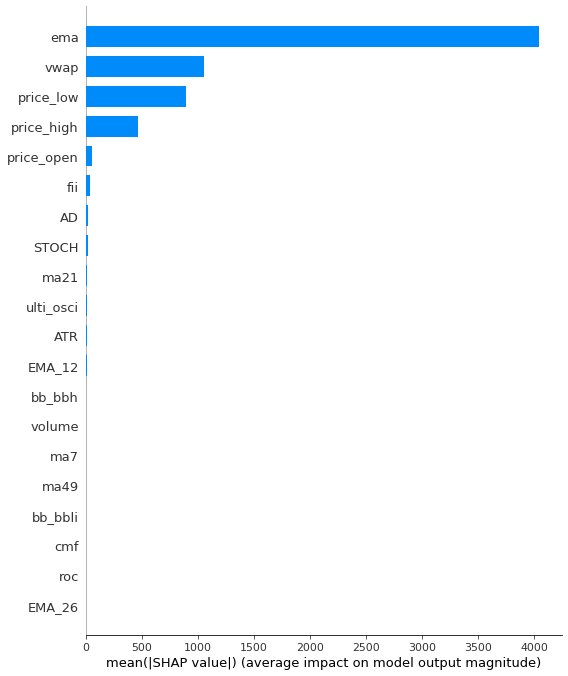

In [ ]:
shap.summary_plot(shap_values, df_TA.drop(columns=['time','price_close']), plot_type="bar")

In [ ]:
pd.options.display.float_format = '{:.4f}'.format
vif = calculate_vif(df=df_TA.drop(columns=['time', 'price_close']), features=df_TA.drop(columns=['time', 'price_close']).columns)
vif

,VIF,Tolerance
price_open,2134.4762,0.0005
price_high,8394.5343,0.0001
price_low,4775.7999,0.0002
vwap,17909.7057,0.0001
volume,2.3999,0.4167
ma7,20524.6049,0.0000
ma21,114964.2058,0.0000
ma49,5597.9008,0.0002
ma200,23.0233,0.0434
EMA_26,inf,0.0000


In [ ]:
pd.options.display.float_format = '{:.4f}'.format
vif = calculate_vif(df=df_TA.drop(columns=['time', 'price_close']), features=[#'price_open',
                                                                              #'price_high',
                                                                              #'price_low',
                                                                              #'vwap',
                                                                              'volume',
                                                                              #'ma7',
                                                                              #'ma21',
                                                                              #'ma49',
                                                                              'ma200',
                                                                              #'EMA_26',
                                                                              #'EMA_12',
                                                                              'ema', 
                                                                              'RSI',
                                                                              #'AD', 
                                                                              'ATR',
                                                                              'STOCH',
                                                                              'death_cross',
                                                                              'life_cross',
                                                                              'global_trend',
                                                                              'tsi',
                                                                              'fii',
                                                                              'mfi', 
                                                                              'adi',
                                                                              'cmf', 
                                                                              'macd_diff',
                                                                              #'macd',
                                                                              #'macd_signal', 
                                                                              #'bb_bbm',
                                                                              #'bb_bbh', 
                                                                              #'bb_bbl', 
                                                                              'bb_bbhi', 
                                                                              'bb_bbli', 
                                                                              'adx',
                                                                              'adx_neg',
                                                                              #'adx_pos',
                                                                              'cci',
                                                                              'ulti_osci', 
                                                                              'roc',
                                                                              'STC'])
vif

,VIF,Tolerance
volume,1.7661,0.5662
ma200,11.5646,0.0865
ema,25.6440,0.0390
RSI,35.3964,0.0283
ATR,11.1924,0.0893
STOCH,1.4821,0.6747
death_cross,2.3200,0.4310
life_cross,2.8982,0.3450
global_trend,2.7904,0.3584
tsi,21.9618,0.0455


In [ ]:
vif_df = df_TA.drop(columns=['time', 'price_close'])
vif_df = vif_df[['price_open',
                'price_high',
                'price_low',
                #'vwap',
                'volume',
                #'ma7',
                #'ma21',
                #'ma49',
                'ma200',
                #'EMA_26',
                #'EMA_12',
                'ema', 
                'RSI',
                #'AD', 
                'ATR',
                'STOCH',
                'death_cross',
                'life_cross',
                'global_trend',
                'tsi',
                'fii',
                'mfi', 
                'adi',
                'cmf', 
                'macd_diff',
                #'macd',
                #'macd_signal', 
                #'bb_bbm',
                #'bb_bbh', 
                #'bb_bbl', 
                'bb_bbhi', 
                'bb_bbli', 
                'adx',
                'adx_neg',
                #'adx_pos',
                'cci',
                'ulti_osci', 
                'roc',
                'STC']]
vif_df

,price_open,price_high,price_low,volume,ma200,ema,RSI,ATR,STOCH,death_cross,...,cmf,macd_diff,bb_bbhi,bb_bbli,adx,adx_neg,cci,ulti_osci,roc,STC
0,435.6700,437.5600,432.4100,3276.7096,298.8779,434.8386,54.6631,17.8429,16.1984,0,...,0.3296,-4.3615,0.0000,0.0000,26.3549,18.4761,-33.9803,63.9767,-0.3228,0.0061
1,435.4000,435.7500,425.0200,3904.3353,299.7862,432.8862,52.9570,17.3349,3.0350,0,...,0.2285,-4.0944,0.0000,0.0000,24.7007,20.7042,-54.7031,63.7199,-0.4632,0.0031
2,431.9000,435.7900,431.3700,5894.4457,300.7090,433.5287,53.8198,16.4124,-4.0476,0,...,0.1741,-3.6907,0.0000,0.0000,23.1614,20.3060,-34.0874,66.3398,-1.9393,0.0015
3,433.8400,435.6400,430.0000,5150.1095,301.6441,433.4029,53.5418,15.6429,-6.2478,0,...,0.1874,-3.3705,0.0000,0.0000,21.8431,20.4086,-34.4696,62.2386,-4.9151,0.0008
4,433.3200,433.4600,428.1500,5476.9600,302.5678,431.7143,52.1371,14.9049,-7.5192,0,...,0.1469,-3.2369,0.0000,0.0000,20.7742,20.7758,-45.6348,63.3263,-5.4778,0.0004
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2572,21191.4600,21595.0000,20844.7300,32656.4798,19534.7615,21103.4428,87.4927,559.0254,-2.2153,0,...,0.3928,464.7815,0.0000,0.0000,39.9184,5.0302,150.5953,73.6835,25.6194,99.9999
2573,21135.0100,21650.2100,20370.0100,34600.2565,19542.0128,20817.3409,78.0174,610.5378,-10.6893,0,...,0.3253,391.9328,0.0000,0.0000,41.5941,9.8307,115.4326,65.2634,21.9862,99.9999
2574,20674.0300,21197.0000,20656.5200,23436.7540,19550.9772,20995.2603,80.0787,605.5337,-13.0343,0,...,0.3186,345.6113,0.0000,0.0000,43.1501,9.2039,102.6848,64.7886,24.4467,100.0000
2575,21084.0500,22754.7300,20865.6400,32810.5959,19563.2696,22111.6268,85.6744,697.2163,-1.2970,0,...,0.3667,392.5847,0.0000,0.0000,45.3339,7.4226,126.3157,68.2641,32.3771,100.0000


[18:54:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
21403.068359


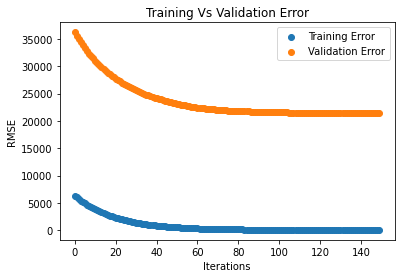

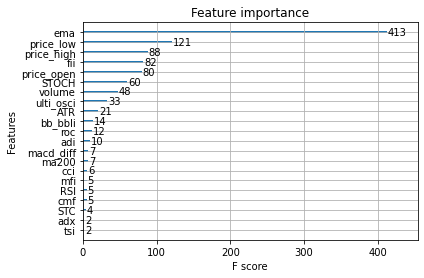

val_err(rmse) 21403.068359
mae: 15951.60
[18:54:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.000, n=26, mae: 15951.60
[18:54:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.000, n=26, mae: 15951.60
[18:54:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.000, n=26, mae: 15951.60
[18:54:57] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.000, n=26, mae: 15951.60
[18:54:57] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.000, n=26, mae: 15951.60
[18:54:57] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.000, n=21, mae: 15

In [ ]:
xgb_FT = get_fi(vif_df, data_FT['price_close'])

In [ ]:
df_fund = pd.read_csv('df_FA.csv')

df_FA = df_fund.iloc[:,1:].reset_index()
df_FA = df_FA.drop(columns=['index', 'market'])
df_FA

,time,price_open,price_close,price_high,price_low,volume,candle_usd_volume,candle_trades_count,mrctCap,TxCntSec,...,gas,block_reward,DiffLast,HashRate,RevHashRateNtv,RevHashUSD,RevUSD,FlowTfrFromExCnt,TxTfrValAdjUSD,SplyFF
0,2016-01-02,435.6700,435.4000,437.5600,432.4100,3276.7096,1426306.9590,11498,6532460051.4330,1.7114,...,2.3400,25.0000,103880340815.4559,748768.3639,0.0049,0.0000,1588414.5128,8570,82382822.0787,13050559.5396
1,2016-01-03,435.4000,431.9100,435.7500,425.0200,3904.3353,1681588.8077,14239,6469306703.4235,1.6786,...,2.3400,25.0000,103880340815.4559,748768.3639,0.0049,0.0000,1569770.4021,10055,99999002.6328,13053430.7042
2,2016-01-04,431.9000,433.8500,435.7900,431.3700,5894.4457,2557825.2525,11353,6521092888.5104,2.0669,...,2.3400,25.0000,103880340815.4559,934669.4750,0.0049,0.0000,1974525.9150,9490,112103036.3418,13057449.4058
3,2016-01-05,433.8400,433.3400,435.6400,430.0000,5150.1095,2231543.4605,13848,6511064277.7710,2.1257,...,2.3250,25.0000,103880340815.4559,810735.4009,0.0049,0.0000,1712294.4275,11463,145267842.0012,13060665.1568
4,2016-01-06,433.3200,430.8700,433.4600,428.1500,5476.9600,2365110.1753,15951,6482611157.0660,1.9885,...,2.2670,25.0000,103880340815.4559,728112.6849,0.0049,0.0000,1531414.5249,11333,139815069.5236,13063967.7108
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2572,2023-01-17,21191.4600,21136.3300,21595.0000,20844.7300,32656.4798,692948088.8202,522945,408003184105.7191,3.5764,...,3.5860,6.2500,37590453655497.0938,291506526.6306,0.0000,0.0000,20928457.7443,29845,3562623755.9243,13931668.8720
2573,2023-01-18,21135.0100,20674.2900,21650.2100,20370.0100,34600.2565,728259494.6252,667361,398993060386.0528,3.4090,...,3.3110,6.2500,37590453655497.0938,261608421.5421,0.0000,0.0000,18449896.0146,28778,3620629088.0538,13929862.0715
2574,2023-01-19,20674.0300,21084.2200,21197.0000,20656.5200,23436.7540,489598116.7569,479012,405989633549.5902,3.4561,...,3.2750,6.2500,37590453655497.0938,270951578.8777,0.0000,0.0000,19435253.1452,27978,3715172805.8571,13926807.8631
2575,2023-01-20,21084.0500,22669.8100,22754.7300,20865.6400,32810.5959,706614092.7557,683942,436621242754.6416,3.5094,...,3.1740,6.2500,37590453655497.0938,246659370.3433,0.0000,0.0000,19159639.4862,33784,4081353584.2318,13924054.5858


[18:56:04] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
21172.669922


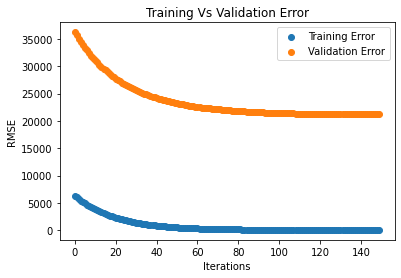

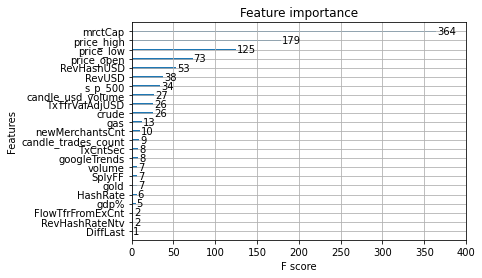

val_err(rmse) 21172.669922
mae: 15953.95
[18:56:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.000, n=26, mae: 15953.95
[18:56:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.000, n=26, mae: 15953.95
[18:56:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.000, n=26, mae: 15953.95
[18:56:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.000, n=23, mae: 15953.95
[18:56:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.000, n=22, mae: 15947.39
[18:56:09] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.000, n=21, mae: 15

In [ ]:
xgb_FA = get_fi(df_FA.drop(columns=['time', 'price_close']), df_FA['price_close'])

In [ ]:
pd.options.display.float_format = '{:.4f}'.format
vif = calculate_vif(df=df_FA.drop(columns=['time', 'price_close']), features=df_FA.drop(columns=['time', 'price_close', 'TxCntSec']).columns)
vif

,VIF,Tolerance
price_open,1455.0202,0.0007
price_high,3879.2449,0.0003
price_low,2014.7819,0.0005
volume,3.8364,0.2607
candle_usd_volume,18.4646,0.0542
candle_trades_count,14.0648,0.0711
mrctCap,2085.4561,0.0005
TxCnt,2.6174,0.3821
AdrActCnt,7.6288,0.1311
newMerchantsCnt,1.0120,0.9881


[19:02:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
21172.669922


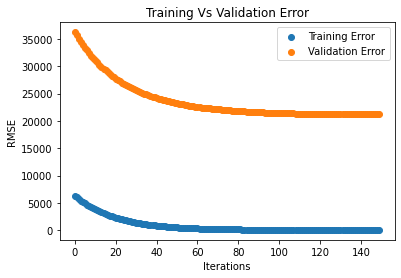

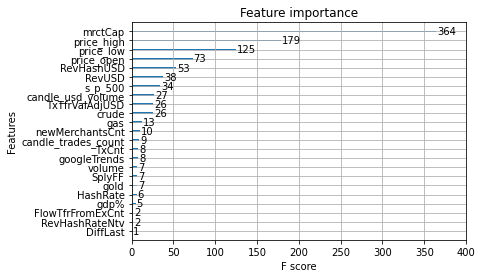

val_err(rmse) 21172.669922
mae: 15953.95
[19:02:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.000, n=25, mae: 15953.95
[19:02:16] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.000, n=25, mae: 15953.95
[19:02:16] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.000, n=23, mae: 15953.95
[19:02:16] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.000, n=22, mae: 15947.39
[19:02:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.000, n=21, mae: 15946.90
[19:02:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.000, n=20, mae: 15

In [ ]:
xgb_FA = get_fi(df_FA.drop(columns=['time', 'price_close', 'TxCntSec']), df_FA['price_close'])

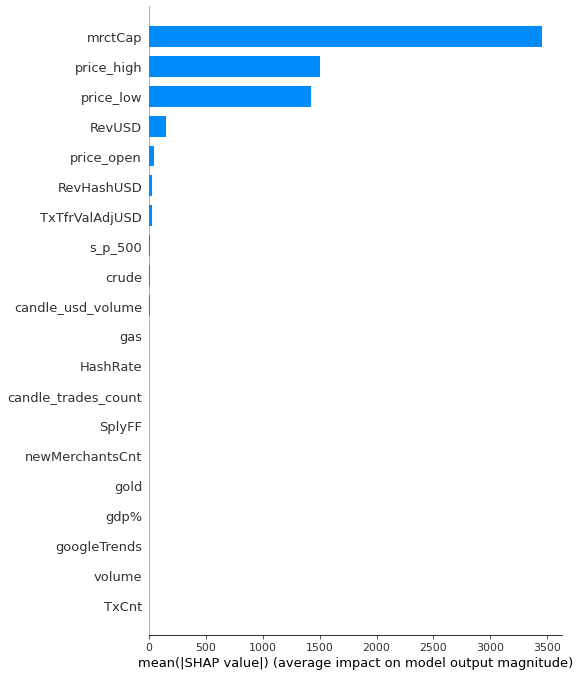

In [ ]:
explainer = shap.TreeExplainer(xgb_FA)
shap_values = explainer.shap_values(df_FA.drop(columns=['time','price_close', 'TxCntSec' ]))

shap.summary_plot(shap_values, df_FA.drop(columns=['time','price_close', 'TxCntSec']), plot_type="bar")

In [ ]:
df_fund = pd.read_csv('df_PR.csv')

df_PR = df_fund.iloc[:,1:].reset_index()
df_PR = df_PR.drop(columns=['index'])
df_PR

,index,time,price_open,price_close,price_high,price_low,CDL2CROWS,CDL3INSIDE,CDL3LINESTRIKE,CDL3OUTSIDE,...,CDLSEPARATINGLINES,CDLSHOOTINGSTAR,CDLSHORTLINE,CDLSPINNINGTOP,CDLSTALLEDPATTERN,CDLTAKURI,CDLXSIDEGAP3METHODS,count_1,count_-1,pr_signal
0,0,2016-01-02,435.6700,435.4000,437.5600,432.4100,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,2016-01-03,435.4000,431.9100,435.7500,425.0200,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2,2016-01-04,431.9000,433.8500,435.7900,431.3700,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,3,2016-01-05,433.8400,433.3400,435.6400,430.0000,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,4,2016-01-06,433.3200,430.8700,433.4600,428.1500,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2572,2572,2023-01-17,21191.4600,21136.3300,21595.0000,20844.7300,0,0,0,0,...,0,0,0,-100,0,0,0,3,2,1
2573,2573,2023-01-18,21135.0100,20674.2900,21650.2100,20370.0100,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2574,2574,2023-01-19,20674.0300,21084.2200,21197.0000,20656.5200,0,0,0,0,...,0,0,100,0,0,0,0,1,0,1
2575,2575,2023-01-20,21084.0500,22669.8100,22754.7300,20865.6400,0,0,0,0,...,0,0,0,0,0,0,0,1,1,0


[19:24:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
20880.509766


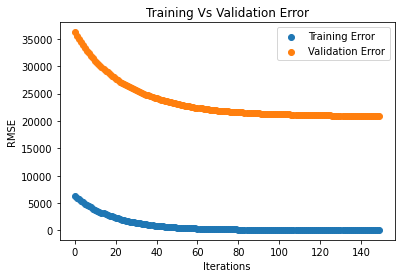

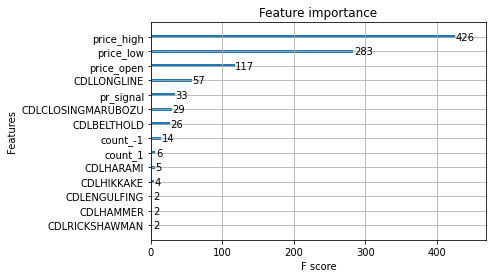

val_err(rmse) 20880.509766
mae: 15394.32
[19:24:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.000, n=45, mae: 15394.32
[19:24:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.000, n=45, mae: 15394.32
[19:24:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.000, n=45, mae: 15394.32
[19:24:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.000, n=45, mae: 15394.32
[19:24:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.000, n=45, mae: 15394.32
[19:24:16] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Thresh=0.000, n=45, mae: 15

In [ ]:
xgb_PR = get_fi(df_PR.drop(columns=['time', 'price_close']), df_PR['price_close'])

In [ ]:
pd.options.display.float_format = '{:.4f}'.format
vif = calculate_vif(df=df_PR.drop(columns=['time', 'price_close']), features=df_PR.drop(columns=['time', 'price_close']).columns)
vif

,VIF,Tolerance
price_open,1290.5099,0.0008
price_high,1051.2202,0.0010
price_low,511.7362,0.0020
CDL2CROWS,1.0246,0.9760
CDL3INSIDE,1.3453,0.7433
CDL3LINESTRIKE,1.4287,0.6999
CDL3OUTSIDE,3.1336,0.3191
CDL3WHITESOLDIERS,1.4656,0.6823
CDLADVANCEBLOCK,2.1280,0.4699
CDLBELTHOLD,10.9576,0.0913


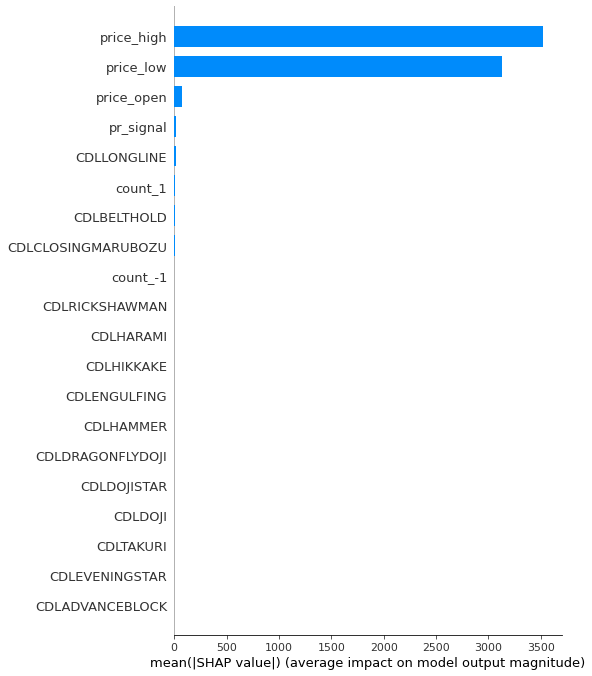

In [ ]:
explainer = shap.TreeExplainer(xgb_PR)
shap_values = explainer.shap_values(df_PR.drop(columns=['time','price_close']))

shap.summary_plot(shap_values, df_PR.drop(columns=['time','price_close']), plot_type="bar")

In [ ]:
df_TA

,time,price_open,price_close,price_high,price_low,vwap,volume,ma7,ma21,ma49,...,bb_bbl,bb_bbhi,bb_bbli,adx,adx_neg,adx_pos,cci,ulti_osci,roc,STC
0,2016-01-02,435.6700000,435.4000000,437.5600000,432.4100000,435.2863463,3276.7096211,429.9871429,441.5390476,396.9640816,...,414.3113340,0.0000000,0.0000000,26.3548547,18.4760535,26.3548547,-33.9802978,63.9767246,-0.3227948,0.0061035
1,2016-01-03,435.4000000,431.9100000,435.7500000,425.0200000,430.6978450,3904.3353181,431.0142857,441.4476190,399.1881633,...,413.3872423,0.0000000,0.0000000,24.7006889,20.7042298,24.7006889,-54.7031465,63.7199395,-0.4632190,0.0030518
2,2016-01-04,431.9000000,433.8500000,435.7900000,431.3700000,433.9382145,5894.4457232,432.7157143,440.9638095,401.2485714,...,413.7836802,0.0000000,0.0000000,23.1614185,20.3059559,23.1614185,-34.0873956,66.3398246,-1.9392898,0.0015259
3,2016-01-05,433.8400000,433.3400000,435.6400000,430.0000000,433.3001990,5150.1094757,432.6371429,439.4909524,403.2251020,...,413.4551244,0.0000000,0.0000000,21.8431073,20.4085784,21.8431073,-34.4695606,62.2385734,-4.9150832,0.0007629
4,2016-01-06,433.3200000,430.8700000,433.4600000,428.1500000,431.8290060,5476.9599594,433.0542857,438.3909524,405.1716327,...,413.2229818,0.0000000,0.0000000,20.7741851,20.7758146,20.7741851,-45.6348317,63.3262767,-5.4777992,0.0003815
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2572,2023-01-17,21191.4600000,21136.3300000,21595.0000000,20844.7300000,21219.3136987,32656.4797835,20126.7785714,17925.7285714,17397.7179592,...,14540.5583296,0.0000000,0.0000000,39.9184191,5.0301665,39.9184191,150.5952993,73.6834789,25.6193951,99.9998659
2573,2023-01-18,21135.0100000,20674.2900000,21650.2100000,20370.0100000,21047.8062560,34600.2564717,20516.7814286,18122.6157143,17469.2885714,...,14615.2884992,0.0000000,0.0000000,41.5941030,9.8306623,41.5941030,115.4326499,65.2633546,21.9861742,99.9999329
2574,2023-01-19,20674.0300000,21084.2200000,21197.0000000,20656.5200000,20890.1845279,23436.7540460,20836.2771429,18334.8385714,17553.0465306,...,14708.5230946,0.0000000,0.0000000,43.1500952,9.2039099,43.1500952,102.6847994,64.7886425,24.4466978,99.9999665
2575,2023-01-20,21084.0500000,22669.8100000,22754.7300000,20865.6400000,21536.1554348,32810.5958788,21226.9814286,18623.8723810,17666.8240816,...,14690.7296619,0.0000000,0.0000000,45.3338684,7.4226411,45.3338684,126.3156748,68.2640988,32.3770611,99.9999832


# df_TA + time

In [92]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler


def create_tt(*dfs):
  columns = []
  # Get the unique columns from table1 and table2
  for i in range(len(dfs)):
    columns.append(list(dfs[i].columns))

  unique_columns = list(set(columns[0]))

  # Concatenate the unique columns from table1 and table2
  #concatenated_table = pd.concat([df_TF[unique_columns], df_TA[unique_columns], df_FA[unique_columns], df_PR[unique_columns], data_FT[unique_columns]], axis=1)

  concatenated_table = pd.concat(dfs, axis=1)

  # Transpose the DataFrame to identify duplicate columns
  df_T = concatenated_table.T

  # Find duplicate columns
  duplicate_columns = df_T.duplicated()

  # Drop duplicate columns
  df_T = df_T.loc[~duplicate_columns]

  # Transpose the DataFrame back to its original shape
  df_clean = df_T.T

  data = df_clean.copy()
  #data['seconds'] = df_TF['seconds']

  data = data.set_index('time')
  data = data.rename(columns={"price_close": "Price"})

  # Add windowed columns
  #for i in range(WINDOW_SIZE): # Shift values for each step in WINDOW_SIZE
  # data[f"Price+{i+1}"] = data["Price"].shift(periods=i+1)

  # Let's create X & y, remove the NaN's and convert to float32 to prevent TensorFlow errors 
  X = data.dropna().drop("Price", axis=1).astype(np.float32) 
  y = data.dropna()["Price"].astype(np.float32)

  # Make train and test sets
  split_size = int(len(X) * 0.8)
  X_train, y_train = X[:split_size], y[:split_size]
  X_test, y_test = X[split_size:], y[split_size:]
  print(len(X_train), len(y_train), len(X_test), len(y_test))

  scaler = MinMaxScaler()
  scaler.fit(X_train)
  X_train = scaler.transform(X_train)
  X_test = scaler.transform(X_test)

  print(X_train.shape)

  return X_train, y_train, X_test, y_test

## (df_TA, df_TF, df_PR)

In [64]:
df_TATF = get_table(df_TA, df_TF, df_PR)
df_TATF

,time,price_open,price_close,price_high,price_low,vwap,volume,ma7,ma21,ma49,...,CDLSEPARATINGLINES,CDLSHOOTINGSTAR,CDLSHORTLINE,CDLSPINNINGTOP,CDLSTALLEDPATTERN,CDLTAKURI,CDLXSIDEGAP3METHODS,count_1,count_-1,pr_signal
0,2016-01-02,435.67,435.4,437.56,432.41,435.286346,3276.709621,429.987143,441.539048,396.964082,...,0,0,0,0,0,0,0,0,0,0
1,2016-01-03,435.4,431.91,435.75,425.02,430.697845,3904.335318,431.014286,441.447619,399.188163,...,0,0,0,0,0,0,0,0,0,0
2,2016-01-04,431.9,433.85,435.79,431.37,433.938214,5894.445723,432.715714,440.96381,401.248571,...,0,0,0,0,0,0,0,0,0,0
3,2016-01-05,433.84,433.34,435.64,430.0,433.300199,5150.109476,432.637143,439.490952,403.225102,...,0,0,0,0,0,0,0,0,0,0
4,2016-01-06,433.32,430.87,433.46,428.15,431.829006,5476.959959,433.054286,438.390952,405.171633,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2572,2023-01-17,21191.46,21136.33,21595.0,20844.73,21219.313699,32656.479783,20126.778571,17925.728571,17397.717959,...,0,0,0,-100,0,0,0,3,2,1
2573,2023-01-18,21135.01,20674.29,21650.21,20370.01,21047.806256,34600.256472,20516.781429,18122.615714,17469.288571,...,0,0,0,0,0,0,0,0,0,0
2574,2023-01-19,20674.03,21084.22,21197.0,20656.52,20890.184528,23436.754046,20836.277143,18334.838571,17553.046531,...,0,0,100,0,0,0,0,1,0,1
2575,2023-01-20,21084.05,22669.81,22754.73,20865.64,21536.155435,32810.595879,21226.981429,18623.872381,17666.824082,...,0,0,0,0,0,0,0,1,1,0


In [65]:
data = df_TATF.copy()
#data['seconds'] = df_TF['seconds']

data = data.set_index('time')
data = data.rename(columns={"price_close": "Price"})

# Add windowed columns
#for i in range(WINDOW_SIZE): # Shift values for each step in WINDOW_SIZE
# data[f"Price+{i+1}"] = data["Price"].shift(periods=i+1)

# Let's create X & y, remove the NaN's and convert to float32 to prevent TensorFlow errors 
X = data.dropna().drop("Price", axis=1).astype(np.float32) 
y = data.dropna()["Price"].astype(np.float32)

# Make train and test sets
split_size = int(len(X) * 0.8)
X_train, y_train = X[:split_size], y[:split_size]
X_test, y_test = X[split_size:], y[split_size:]
print(len(X_train), len(y_train), len(X_test), len(y_test))



2061 2061 516 516


In [66]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

scaler = MinMaxScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
X_train

array([[0.00123484, 0.00100037, 0.00696927, ..., 0.        , 0.        ,
        0.35714287],
       [0.00123057, 0.00097232, 0.00685014, ..., 0.        , 0.        ,
        0.35714287],
       [0.00117522, 0.00097294, 0.0069525 , ..., 0.        , 0.        ,
        0.35714287],
       ...,
       [0.7748206 , 0.76634103, 0.77833354, ..., 0.        , 0.2       ,
        0.2857143 ],
       [0.7672329 , 0.76175696, 0.77539355, ..., 0.        , 0.        ,
        0.35714287],
       [0.773783  , 0.7769271 , 0.7900614 , ..., 0.44444445, 0.        ,
        0.6428572 ]], dtype=float32)

In [136]:
tf.random.set_seed(42)

# Make multivariate time series model
model_2 = tf.keras.Sequential([
  tf.keras.layers.Dense(512,kernel_regularizer=regularizers.l2(0.0001), activation="relu"),
  tf.keras.layers.Dropout(0.5),
  #tf.keras.layers.Dense(128, activation="relu"),
  tf.keras.layers.Dense(HORIZON)
], name="model_multi_dense_2")

# Compile
model_2.compile(loss="mae",
                optimizer=tf.keras.optimizers.Adam())

# Fit
model_2.fit(X_train, y_train,
            epochs=5000,
            batch_size=32,
            verbose=1, # only print 1 line per epoch
            validation_data=(X_test, y_test),
            callbacks=[
              tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=250, restore_best_weights=True),
              tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', patience=100, verbose=1)
            ])

Streaming output truncated to the last 5000 lines.
65/65 [==============================] - 0s 4ms/step - loss: 533.3555 - val_loss: 477.7488 - lr: 0.0010
Epoch 1055/5000
65/65 [==============================] - 0s 5ms/step - loss: 529.0400 - val_loss: 478.5468 - lr: 0.0010
Epoch 1056/5000
65/65 [==============================] - 0s 4ms/step - loss: 538.3572 - val_loss: 489.0868 - lr: 0.0010
Epoch 1057/5000
65/65 [==============================] - 0s 4ms/step - loss: 512.6144 - val_loss: 481.3605 - lr: 0.0010
Epoch 1058/5000
65/65 [==============================] - 0s 4ms/step - loss: 545.2779 - val_loss: 484.2276 - lr: 0.0010
Epoch 1059/5000
65/65 [==============================] - 0s 5ms/step - loss: 529.0590 - val_loss: 497.8790 - lr: 0.0010
Epoch 1060/5000
65/65 [==============================] - 0s 5ms/step - loss: 542.6478 - val_loss: 497.7707 - lr: 0.0010
Epoch 1061/5000
65/65 [==============================] - 0s 5ms/step - loss: 513.1749 - val_loss: 486.1938 - lr: 0.0010
Epoch

In [137]:
# Make predictions on multivariate data
model_2.evaluate(X_test, y_test)
model_2_preds = tf.squeeze(model_2.predict(X_test))

# Evaluate preds
model_2_results = evaluate_preds(y_true=y_test,
                                 y_pred=model_2_preds)
model_2_results

17/17 [==============================] - 0s 1ms/step


{'mae': 284.94272,
 'mse': 168904.98,
 'rmse': 410.9805,
 'mape': 0.84799427,
 'mase': 0.3419484}

BEST RESULTS without price sin and WT

{'mae': 292.78027,
 'mse': 189437.36,
 'rmse': 435.24402,
 'mape': 0.8517009,
 'mase': 0.3513539}

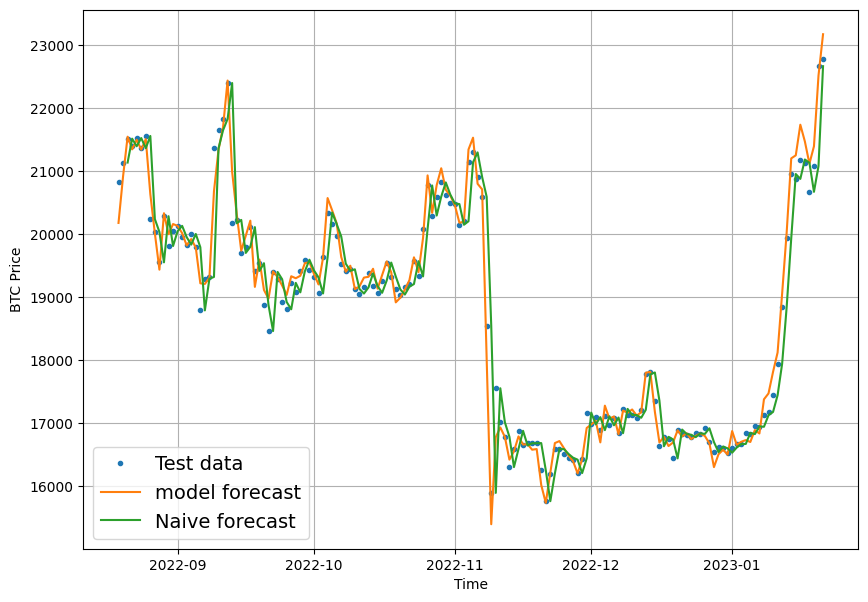

In [113]:
plt.figure(figsize=(10, 7))
offset = 360 # offset the values by 360 timesteps 
plot_time_series(timesteps=timesteps[-len(X_test):], values=y_test, start=offset, label="Test data")
plot_time_series(timesteps=timesteps[-len(X_test):], values=model_2_preds, format="-", start=offset, label="model forecast");
plot_time_series(timesteps=timesteps[-len(X_test)+2:], values=naive_forecast[1:], format="-", start=offset, label="Naive forecast");

## All 

In [94]:
X_train, y_train, X_test, y_test = create_tt(df_TA, df_TF, df_PR, data_FT, df_FA)

2061 2061 516 516
(2061, 122)


In [96]:
tf.random.set_seed(42)

# Make multivariate time series model
model_3 = tf.keras.Sequential([
  tf.keras.layers.Dense(512,kernel_regularizer=regularizers.l2(0.0001), activation="relu"),
  tf.keras.layers.Dropout(0.5),
  #tf.keras.layers.Dense(128, activation="relu"),
  tf.keras.layers.Dense(HORIZON)
], name="model_multi_dense_3")

# Compile
model_3.compile(loss="mae",
                optimizer=tf.keras.optimizers.Adam())

# Fit
model_3.fit(X_train, y_train,
            epochs=5000,
            batch_size=32,
            verbose=1, # only print 1 line per epoch
            validation_data=(X_test, y_test),
            callbacks=[
              tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=250, restore_best_weights=True),
              tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', patience=100, verbose=1)
            ])

Epoch 1/5000
65/65 [==============================] - 1s 5ms/step - loss: 10431.1943 - val_loss: 33958.6836 - lr: 0.0010
Epoch 2/5000
65/65 [==============================] - 0s 3ms/step - loss: 10233.2119 - val_loss: 33546.4180 - lr: 0.0010
Epoch 3/5000
65/65 [==============================] - 0s 4ms/step - loss: 9840.0928 - val_loss: 32864.3594 - lr: 0.0010
Epoch 4/5000
65/65 [==============================] - 0s 4ms/step - loss: 9424.5420 - val_loss: 32014.6445 - lr: 0.0010
Epoch 5/5000
65/65 [==============================] - 0s 4ms/step - loss: 9002.0527 - val_loss: 30936.0684 - lr: 0.0010
Epoch 6/5000
65/65 [==============================] - 0s 4ms/step - loss: 8490.6152 - val_loss: 29609.7734 - lr: 0.0010
Epoch 7/5000
65/65 [==============================] - 0s 3ms/step - loss: 7954.3618 - val_loss: 28150.2988 - lr: 0.0010
Epoch 8/5000
65/65 [==============================] - 0s 3ms/step - loss: 7495.1562 - val_loss: 26802.4648 - lr: 0.0010
Epoch 9/5000
65/65 [==================

In [97]:
# Make predictions on multivariate data
model_3.evaluate(X_test, y_test)
model_3_preds = tf.squeeze(model_3.predict(X_test))
model_3_preds[:10]
# Evaluate preds
model_3_results = evaluate_preds(y_true=y_test,
                                 y_pred=model_3_preds)
model_3_results

17/17 [==============================] - 0s 2ms/step


{'mae': 398.18112,
 'mse': 299919.38,
 'rmse': 547.6489,
 'mape': 1.2072157,
 'mase': 0.47784126}

## PR, TF

In [98]:
X_train, y_train, X_test, y_test = create_tt(df_PR, df_TF)

2061 2061 516 516
(2061, 56)


In [99]:
tf.random.set_seed(42)

# Make multivariate time series model
model_3 = tf.keras.Sequential([
  tf.keras.layers.Dense(512,kernel_regularizer=regularizers.l2(0.0001), activation="relu"),
  tf.keras.layers.Dropout(0.5),
  #tf.keras.layers.Dense(128, activation="relu"),
  tf.keras.layers.Dense(HORIZON)
], name="model_multi_dense_3")

# Compile
model_3.compile(loss="mae",
                optimizer=tf.keras.optimizers.Adam())

# Fit
model_3.fit(X_train, y_train,
            epochs=5000,
            batch_size=32,
            verbose=1, # only print 1 line per epoch
            validation_data=(X_test, y_test),
            callbacks=[
              tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=250, restore_best_weights=True),
              tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', patience=100, verbose=1)
            ])

Streaming output truncated to the last 5000 lines.
65/65 [==============================] - 0s 4ms/step - loss: 530.6730 - val_loss: 522.7479 - lr: 0.0010
Epoch 2290/5000
65/65 [==============================] - 0s 4ms/step - loss: 575.6240 - val_loss: 527.9593 - lr: 0.0010
Epoch 2291/5000
65/65 [==============================] - 0s 5ms/step - loss: 549.4717 - val_loss: 524.2382 - lr: 0.0010
Epoch 2292/5000
65/65 [==============================] - 0s 5ms/step - loss: 583.6993 - val_loss: 529.0500 - lr: 0.0010
Epoch 2293/5000
65/65 [==============================] - 0s 4ms/step - loss: 558.2255 - val_loss: 519.9695 - lr: 0.0010
Epoch 2294/5000
65/65 [==============================] - 0s 4ms/step - loss: 553.9091 - val_loss: 534.0455 - lr: 0.0010
Epoch 2295/5000
65/65 [==============================] - 0s 5ms/step - loss: 527.2443 - val_loss: 518.9737 - lr: 0.0010
Epoch 2296/5000
65/65 [==============================] - 0s 5ms/step - loss: 540.8442 - val_loss: 517.2706 - lr: 0.0010
Epoch

In [100]:
# Make predictions on multivariate data
model_3.evaluate(X_test, y_test)
model_3_preds = tf.squeeze(model_3.predict(X_test))
model_3_preds[:10]
# Evaluate preds
model_3_results = evaluate_preds(y_true=y_test,
                                 y_pred=model_3_preds)
model_3_results

17/17 [==============================] - 0s 2ms/step


{'mae': 432.57184,
 'mse': 440693.1,
 'rmse': 663.84717,
 'mape': 1.2429262,
 'mase': 0.51911217}

# Making multivariate df prediction available:

In [33]:
import pandas as pd


def get_table(*dfs):
  columns = []
  # Get the unique columns from table1 and table2
  for i in range(len(dfs)):
    columns.append(list(dfs[i].columns))

  unique_columns = list(set(columns[0]))

  # Concatenate the unique columns from table1 and table2
  #concatenated_table = pd.concat([df_TF[unique_columns], df_TA[unique_columns], df_FA[unique_columns], df_PR[unique_columns], data_FT[unique_columns]], axis=1)

  concatenated_table = pd.concat(dfs, axis=1)

  # Transpose the DataFrame to identify duplicate columns
  df_T = concatenated_table.T

  # Find duplicate columns
  duplicate_columns = df_T.duplicated()

  # Drop duplicate columns
  df_T = df_T.loc[~duplicate_columns]

  # Transpose the DataFrame back to its original shape
  df_clean = df_T.T

  return df_clean

In [31]:
#pd.options.display.float_format = '{:.8f}'.format

def create_windows_tt(df):
  
  data = df.copy()
  data = data.set_index('time')
  data = data.rename(columns={"price_close": "Price"})
  
  # Add windowed columns
  for i in range(WINDOW_SIZE): # Shift values for each step in WINDOW_SIZE
    data[f"Price+{i+1}"] = data["Price"].shift(periods=i+1)

  # Let's create X & y, remove the NaN's and convert to float32 to prevent TensorFlow errors 
  X = data.dropna().drop("Price", axis=1).astype(np.float32) 
  y = data.dropna()["Price"].astype(np.float32)

  # Make train and test sets
  split_size = int(len(X) * 0.8)
  X_train, y_train = X[:split_size], y[:split_size]
  X_test, y_test = X[split_size:], y[split_size:]
  print(len(X_train), len(y_train), len(X_test), len(y_test))

  return X_train, y_train, X_test, y_test

In [32]:
X_train, y_train, X_test, y_test = create_windows_tt(df_TA)

2056 2056 514 514


In [54]:
tf.random.set_seed(42)

# Make multivariate time series model
model_1 = tf.keras.Sequential([
  tf.keras.layers.Dense(512,kernel_regularizer=regularizers.l2(0.0001), activation="relu"),
  tf.keras.layers.Dropout(0.5),
  #tf.keras.layers.Dense(128, activation="relu"),
  tf.keras.layers.Dense(HORIZON)
], name="model_multi_dense_1")

# Compile
model_1.compile(loss="mae",
                optimizer=tf.keras.optimizers.Adam())

# Fit
model_1.fit(X_train, y_train,
            epochs=2000,
            batch_size=32,
            verbose=1, # only print 1 line per epoch
            validation_data=(X_test, y_test),
            callbacks=[
              tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=250, restore_best_weights=True),
              tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', patience=100, verbose=1)
            ])

Epoch 1/2000
65/65 [==============================] - 1s 5ms/step - loss: 10455.2949 - val_loss: 34042.7891 - lr: 0.0010
Epoch 2/2000
65/65 [==============================] - 0s 4ms/step - loss: 10385.3066 - val_loss: 33881.9258 - lr: 0.0010
Epoch 3/2000
65/65 [==============================] - 0s 3ms/step - loss: 10227.7646 - val_loss: 33585.5547 - lr: 0.0010
Epoch 4/2000
65/65 [==============================] - 0s 3ms/step - loss: 9976.4805 - val_loss: 33154.5273 - lr: 0.0010
Epoch 5/2000
65/65 [==============================] - 0s 4ms/step - loss: 9685.7246 - val_loss: 32643.1250 - lr: 0.0010
Epoch 6/2000
65/65 [==============================] - 0s 4ms/step - loss: 9414.9375 - val_loss: 32072.5293 - lr: 0.0010
Epoch 7/2000
65/65 [==============================] - 0s 6ms/step - loss: 9151.9307 - val_loss: 31436.6504 - lr: 0.0010
Epoch 8/2000
65/65 [==============================] - 0s 5ms/step - loss: 8872.9932 - val_loss: 30717.6523 - lr: 0.0010
Epoch 9/2000
65/65 [=================

In [55]:
# Make sure best model is loaded and evaluate
#model_1 = tf.keras.models.load_model("model_experiments/model_multi_dense_1")
model_1.evaluate(X_test, y_test)

17/17 [==============================] - 0s 2ms/step - loss: 390.5729


390.57293701171875

In [56]:
# Make predictions on multivariate data
model_1_preds = tf.squeeze(model_1.predict(X_test))
model_1_preds[:10]

17/17 [==============================] - 0s 1ms/step


<tf.Tensor: shape=(10,), dtype=float32, numpy=
array([48194.16 , 48106.395, 47258.37 , 47871.977, 48781.03 , 48836.355,
       47596.867, 46874.45 , 47593.086, 48998.3  ], dtype=float32)>

In [57]:
# Evaluate preds
model_1_results = evaluate_preds(y_true=y_test,
                                 y_pred=model_1_preds)
model_1_results

{'mae': 381.34637,
 'mse': 321538.38,
 'rmse': 567.0435,
 'mape': 1.0552195,
 'mase': 0.45763856}

In [58]:
naive_results

{'mae': 833.2916,
 'mse': 1602351.6,
 'rmse': 1265.8403,
 'mape': 2.366376,
 'mase': 1.0011022}

In [64]:
model_1_preds.shape

TensorShape([516])

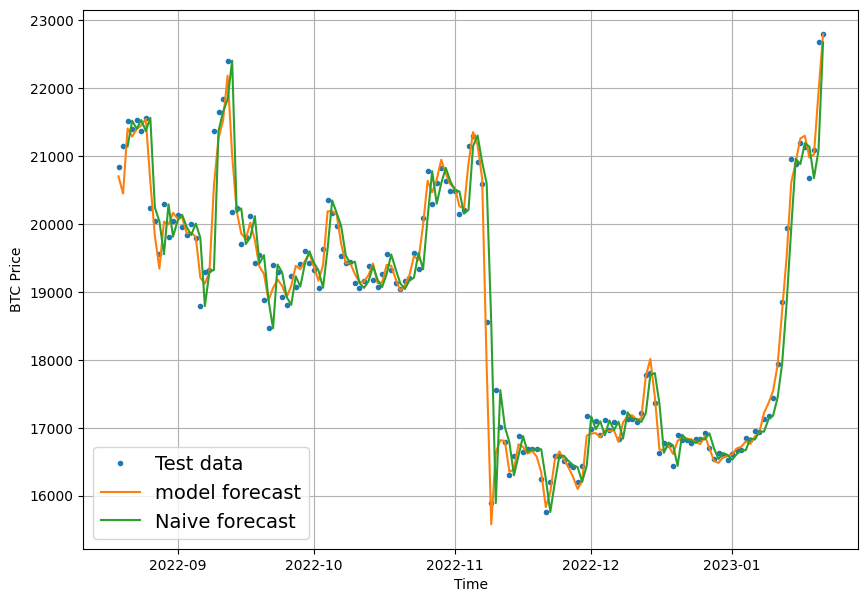

In [66]:
plt.figure(figsize=(10, 7))
offset = 360 # offset the values by 360 timesteps 
plot_time_series(timesteps=timesteps[-len(X_test):], values=y_test, start=offset, label="Test data")
plot_time_series(timesteps=timesteps[-len(X_test):], values=model_1_preds, format="-", start=offset, label="model forecast");
plot_time_series(timesteps=timesteps[-len(X_test)+2:], values=naive_forecast[1:], format="-", start=offset, label="Naive forecast");

## We beat Naive !!!!

# Now lets try using df_TA without collinearity and check if this improves results

In [ ]:
 df = df_TA[['price_open',
            'price_high',
            'price_low',
            'price_close',
            'time',
            'volume',
            'ma200',
            'ema', 
            'RSI',
            'ATR',
            'STOCH',
            'death_cross',
            'life_cross',
            'global_trend',
            'tsi',
            'fii',
            'mfi', 
            'adi',
            'cmf', 
            'macd_diff',
            'bb_bbhi', 
            'bb_bbli', 
            'adx',
            'adx_neg',
            'cci',
            'ulti_osci', 
            'roc',
            'STC']]

In [ ]:
X_train, y_train, X_test, y_test = create_windows_tt(df)

2056 2056 514 514


In [ ]:
tf.random.set_seed(42)

# Make multivariate time series model
model_2 = tf.keras.Sequential([
  tf.keras.layers.Dense(512,kernel_regularizer=regularizers.l2(0.0001), activation="relu"),
  tf.keras.layers.Dropout(0.5),
  #tf.keras.layers.Dense(128, activation="relu"),
  tf.keras.layers.Dense(HORIZON)
], name="model_multi_dense_2")

# Compile
model_2.compile(loss="mae",
                optimizer=tf.keras.optimizers.Adam())

# Fit
model_2.fit(X_train, y_train,
            epochs=500,
            batch_size=64,
            verbose=1, # only print 1 line per epoch
            validation_data=(X_test, y_test),
            callbacks=[create_model_checkpoint(model_name=model_2.name)])

Epoch 1/500
23/33 [===================>..........] - ETA: 0s - loss: 208045.5469 

33/33 [==============================] - 2s 35ms/step - loss: 199023.6406 - val_loss: 138821.5156
Epoch 2/500
26/33 [======================>.......] - ETA: 0s - loss: 171786.4062

33/33 [==============================] - 1s 18ms/step - loss: 174188.4531 - val_loss: 103053.1094
Epoch 3/500
24/33 [====================>.........] - ETA: 0s - loss: 149769.0156

33/33 [==============================] - 1s 20ms/step - loss: 141780.0938 - val_loss: 69699.4062
Epoch 4/500
25/33 [=====================>........] - ETA: 0s - loss: 131411.2031

33/33 [==============================] - 1s 18ms/step - loss: 121809.5859 - val_loss: 64460.9609
Epoch 5/500
28/33 [========================>.....] - ETA: 0s - loss: 102275.4141

33/33 [==============================] - 1s 19ms/step - loss: 106040.8203 - val_loss: 63765.5625
Epoch 6/500
33/33 [==============================] - 0s 4ms/step - loss: 86679.8828 - val_loss: 78256.3203
Epoch 7/500
33/33 [==============================] - 0s 3ms/step - loss: 88146.5312 - val_loss: 75684.9531
Epoch 8/500
30/33 [==========================>...] - ETA: 0s - loss: 64640.9648

33/33 [==============================] - 1s 17ms/step - loss: 62003.4062 - val_loss: 27243.6934
Epoch 9/500
33/33 [==============================] - 0s 4ms/step - loss: 59679.9258 - val_loss: 95009.8672
Epoch 10/500
27/33 [=======================>......] - ETA: 0s - loss: 50052.7344

33/33 [==============================] - 1s 17ms/step - loss: 48797.1172 - val_loss: 22549.2207
Epoch 11/500
33/33 [==============================] - 0s 4ms/step - loss: 44542.1797 - val_loss: 45265.1719
Epoch 12/500
33/33 [==============================] - 0s 3ms/step - loss: 37515.1602 - val_loss: 36397.1523
Epoch 13/500
33/33 [==============================] - 0s 4ms/step - loss: 37273.2617 - val_loss: 39287.5391
Epoch 14/500
33/33 [==============================] - 0s 3ms/step - loss: 30628.7324 - val_loss: 29070.9473
Epoch 15/500
33/33 [==============================] - 0s 3ms/step - loss: 26204.0332 - val_loss: 28215.1973
Epoch 16/500
27/33 [=======================>......] - ETA: 0s - loss: 21963.0547

33/33 [==============================] - 1s 18ms/step - loss: 23566.6953 - val_loss: 20002.4023
Epoch 17/500
33/33 [==============================] - 0s 3ms/step - loss: 20560.9824 - val_loss: 21919.4160
Epoch 18/500
33/33 [==============================] - 0s 3ms/step - loss: 22321.2383 - val_loss: 37378.2305
Epoch 19/500
27/33 [=======================>......] - ETA: 0s - loss: 17049.7480

33/33 [==============================] - 1s 18ms/step - loss: 16322.1260 - val_loss: 14629.2178
Epoch 20/500
33/33 [==============================] - 0s 4ms/step - loss: 14708.0771 - val_loss: 17251.9102
Epoch 21/500
33/33 [==============================] - 0s 3ms/step - loss: 15638.5430 - val_loss: 16925.7285
Epoch 22/500
33/33 [==============================] - 0s 3ms/step - loss: 13919.9199 - val_loss: 21924.6738
Epoch 23/500
28/33 [========================>.....] - ETA: 0s - loss: 12875.7646

33/33 [==============================] - 1s 32ms/step - loss: 13522.7402 - val_loss: 12605.0596
Epoch 24/500
33/33 [==============================] - 0s 5ms/step - loss: 9862.0254 - val_loss: 12623.5410
Epoch 25/500
33/33 [==============================] - 0s 5ms/step - loss: 10066.4434 - val_loss: 15994.2256
Epoch 26/500
18/33 [===============>..............] - ETA: 0s - loss: 7407.1074

33/33 [==============================] - 1s 24ms/step - loss: 8223.5762 - val_loss: 8647.8086
Epoch 27/500
33/33 [==============================] - 0s 3ms/step - loss: 7442.5850 - val_loss: 14910.1592
Epoch 28/500
33/33 [==============================] - 0s 4ms/step - loss: 10569.0449 - val_loss: 12928.1387
Epoch 29/500
33/33 [==============================] - 0s 4ms/step - loss: 8386.4561 - val_loss: 15427.3750
Epoch 30/500
23/33 [===================>..........] - ETA: 0s - loss: 6005.6724 

33/33 [==============================] - 1s 18ms/step - loss: 6544.9619 - val_loss: 6015.7759
Epoch 31/500
33/33 [==============================] - 0s 3ms/step - loss: 6752.2676 - val_loss: 7120.0215
Epoch 32/500
21/33 [==================>...........] - ETA: 0s - loss: 5192.0864

33/33 [==============================] - 1s 18ms/step - loss: 5019.2842 - val_loss: 3806.1868
Epoch 33/500
33/33 [==============================] - 0s 4ms/step - loss: 4804.5742 - val_loss: 7224.0552
Epoch 34/500
33/33 [==============================] - 0s 3ms/step - loss: 4323.5854 - val_loss: 5368.4019
Epoch 35/500
33/33 [==============================] - 0s 3ms/step - loss: 4316.8662 - val_loss: 10006.2266
Epoch 36/500
33/33 [==============================] - 0s 3ms/step - loss: 4053.7903 - val_loss: 7763.5854
Epoch 37/500
26/33 [======================>.......] - ETA: 0s - loss: 4419.5903

33/33 [==============================] - 1s 17ms/step - loss: 4396.0068 - val_loss: 2406.3965
Epoch 38/500
33/33 [==============================] - 0s 3ms/step - loss: 2885.2454 - val_loss: 3971.4495
Epoch 39/500
33/33 [==============================] - 0s 4ms/step - loss: 2983.6624 - val_loss: 3864.6797
Epoch 40/500
33/33 [==============================] - 0s 3ms/step - loss: 3584.3098 - val_loss: 7737.9258
Epoch 41/500
33/33 [==============================] - 0s 3ms/step - loss: 3003.5034 - val_loss: 5112.3755
Epoch 42/500
25/33 [=====================>........] - ETA: 0s - loss: 2446.7346

33/33 [==============================] - 1s 18ms/step - loss: 2750.3630 - val_loss: 2327.9602
Epoch 43/500
33/33 [==============================] - 0s 4ms/step - loss: 2523.8647 - val_loss: 3208.4846
Epoch 44/500
33/33 [==============================] - 0s 3ms/step - loss: 2514.8945 - val_loss: 4070.8601
Epoch 45/500
33/33 [==============================] - 0s 3ms/step - loss: 2489.5078 - val_loss: 5754.2490
Epoch 46/500
33/33 [==============================] - 0s 3ms/step - loss: 3765.7280 - val_loss: 2793.1692
Epoch 47/500
33/33 [==============================] - 0s 3ms/step - loss: 2989.6931 - val_loss: 3471.6985
Epoch 48/500
25/33 [=====================>........] - ETA: 0s - loss: 2486.9299

33/33 [==============================] - 1s 18ms/step - loss: 2578.1150 - val_loss: 1664.2734
Epoch 49/500
33/33 [==============================] - 0s 3ms/step - loss: 2286.3228 - val_loss: 6003.2974
Epoch 50/500
33/33 [==============================] - 0s 3ms/step - loss: 2259.0513 - val_loss: 2924.7920
Epoch 51/500
33/33 [==============================] - 0s 3ms/step - loss: 2507.1235 - val_loss: 5013.5581
Epoch 52/500
19/33 [================>.............] - ETA: 0s - loss: 3794.3418

33/33 [==============================] - 1s 19ms/step - loss: 3343.5500 - val_loss: 1212.8059
Epoch 53/500
33/33 [==============================] - 0s 3ms/step - loss: 2344.3108 - val_loss: 2323.9937
Epoch 54/500
33/33 [==============================] - 0s 3ms/step - loss: 2060.2051 - val_loss: 2057.4619
Epoch 55/500
33/33 [==============================] - 0s 3ms/step - loss: 1962.2518 - val_loss: 2229.1523
Epoch 56/500
33/33 [==============================] - 0s 3ms/step - loss: 1813.3418 - val_loss: 2706.8491
Epoch 57/500
33/33 [==============================] - 0s 3ms/step - loss: 1970.4576 - val_loss: 2005.2175
Epoch 58/500
33/33 [==============================] - 0s 3ms/step - loss: 1777.0874 - val_loss: 3518.3103
Epoch 59/500
29/33 [=========================>....] - ETA: 0s - loss: 1743.6014

33/33 [==============================] - 1s 17ms/step - loss: 1773.6519 - val_loss: 923.8832
Epoch 60/500
33/33 [==============================] - 0s 4ms/step - loss: 1924.9290 - val_loss: 2364.0583
Epoch 61/500
33/33 [==============================] - 0s 3ms/step - loss: 2203.0391 - val_loss: 4256.0757
Epoch 62/500
33/33 [==============================] - 0s 3ms/step - loss: 1801.6473 - val_loss: 3646.2463
Epoch 63/500
33/33 [==============================] - 0s 3ms/step - loss: 1641.0734 - val_loss: 2701.7556
Epoch 64/500
33/33 [==============================] - 0s 3ms/step - loss: 1729.2903 - val_loss: 2620.2734
Epoch 65/500
33/33 [==============================] - 0s 3ms/step - loss: 1596.7852 - val_loss: 1527.1488
Epoch 66/500
33/33 [==============================] - 0s 4ms/step - loss: 1549.7712 - val_loss: 1638.6346
Epoch 67/500
33/33 [==============================] - 0s 3ms/step - loss: 1560.8729 - val_loss: 2758.3755
Epoch 68/500
33/33 [==============================] - 0s 3m

33/33 [==============================] - 1s 17ms/step - loss: 1490.3899 - val_loss: 793.2476
Epoch 71/500
33/33 [==============================] - 0s 3ms/step - loss: 1556.1626 - val_loss: 4197.9038
Epoch 72/500
33/33 [==============================] - 0s 3ms/step - loss: 1608.0470 - val_loss: 1911.6879
Epoch 73/500
33/33 [==============================] - 0s 3ms/step - loss: 1465.7036 - val_loss: 3466.9946
Epoch 74/500
33/33 [==============================] - 0s 3ms/step - loss: 1609.8768 - val_loss: 2132.1987
Epoch 75/500
33/33 [==============================] - 0s 4ms/step - loss: 1535.5972 - val_loss: 4576.8701
Epoch 76/500
33/33 [==============================] - 0s 3ms/step - loss: 1742.1984 - val_loss: 1720.0840
Epoch 77/500
28/33 [========================>.....] - ETA: 0s - loss: 1464.9049

33/33 [==============================] - 1s 32ms/step - loss: 1477.9836 - val_loss: 746.2028
Epoch 78/500
33/33 [==============================] - 0s 4ms/step - loss: 1534.2656 - val_loss: 2425.7175
Epoch 79/500
33/33 [==============================] - 0s 5ms/step - loss: 1459.9784 - val_loss: 1501.7377
Epoch 80/500
33/33 [==============================] - 0s 4ms/step - loss: 1523.0741 - val_loss: 1331.2728
Epoch 81/500
33/33 [==============================] - 0s 5ms/step - loss: 1391.9451 - val_loss: 1193.6359
Epoch 82/500
33/33 [==============================] - 0s 4ms/step - loss: 1337.0439 - val_loss: 2060.1401
Epoch 83/500
33/33 [==============================] - 0s 4ms/step - loss: 1405.6656 - val_loss: 1210.3489
Epoch 84/500
33/33 [==============================] - 0s 3ms/step - loss: 1387.9972 - val_loss: 1969.7461
Epoch 85/500
33/33 [==============================] - 0s 3ms/step - loss: 1446.5518 - val_loss: 3330.3833
Epoch 86/500
33/33 [==============================] - 0s 3m

33/33 [==============================] - 1s 18ms/step - loss: 1348.5281 - val_loss: 737.8497
Epoch 114/500
33/33 [==============================] - 0s 3ms/step - loss: 1370.2351 - val_loss: 1153.7927
Epoch 115/500
33/33 [==============================] - 0s 3ms/step - loss: 1280.7305 - val_loss: 1134.3829
Epoch 116/500
33/33 [==============================] - 0s 4ms/step - loss: 1374.4993 - val_loss: 1214.9071
Epoch 117/500
33/33 [==============================] - 0s 4ms/step - loss: 1381.0132 - val_loss: 1699.3854
Epoch 118/500
33/33 [==============================] - 0s 3ms/step - loss: 1300.8179 - val_loss: 2241.8972
Epoch 119/500
33/33 [==============================] - 0s 3ms/step - loss: 1331.2223 - val_loss: 1109.5533
Epoch 120/500
33/33 [==============================] - 0s 4ms/step - loss: 1245.7231 - val_loss: 2893.9658
Epoch 121/500
33/33 [==============================] - 0s 6ms/step - loss: 1291.9121 - val_loss: 1815.1670
Epoch 122/500
33/33 [==============================

33/33 [==============================] - 1s 18ms/step - loss: 1772.7268 - val_loss: 733.9683
Epoch 133/500
33/33 [==============================] - 0s 3ms/step - loss: 1454.8324 - val_loss: 1636.1013
Epoch 134/500
33/33 [==============================] - 0s 3ms/step - loss: 1395.9652 - val_loss: 1155.6824
Epoch 135/500
33/33 [==============================] - 0s 3ms/step - loss: 1575.5753 - val_loss: 2422.3513
Epoch 136/500
33/33 [==============================] - 0s 3ms/step - loss: 1519.1497 - val_loss: 1372.6483
Epoch 137/500
33/33 [==============================] - 0s 4ms/step - loss: 1722.1826 - val_loss: 2130.5759
Epoch 138/500
33/33 [==============================] - 0s 4ms/step - loss: 1399.0520 - val_loss: 4591.6118
Epoch 139/500
33/33 [==============================] - 0s 4ms/step - loss: 1640.4253 - val_loss: 1544.4396
Epoch 140/500
33/33 [==============================] - 0s 3ms/step - loss: 1348.5507 - val_loss: 1040.4148
Epoch 141/500
33/33 [==============================

33/33 [==============================] - 1s 18ms/step - loss: 1322.8448 - val_loss: 669.5947
Epoch 178/500
33/33 [==============================] - 0s 3ms/step - loss: 1355.2135 - val_loss: 2869.7588
Epoch 179/500
33/33 [==============================] - 0s 4ms/step - loss: 1345.5081 - val_loss: 1779.3059
Epoch 180/500
33/33 [==============================] - 0s 4ms/step - loss: 1269.2886 - val_loss: 1431.5790
Epoch 181/500
33/33 [==============================] - 0s 4ms/step - loss: 1372.9990 - val_loss: 1111.7476
Epoch 182/500
33/33 [==============================] - 0s 4ms/step - loss: 1353.8887 - val_loss: 1922.6832
Epoch 183/500
33/33 [==============================] - 0s 4ms/step - loss: 1433.4784 - val_loss: 1818.1934
Epoch 184/500
33/33 [==============================] - 0s 3ms/step - loss: 1594.7195 - val_loss: 1706.4130
Epoch 185/500
33/33 [==============================] - 0s 3ms/step - loss: 1279.5153 - val_loss: 1438.0488
Epoch 186/500
33/33 [==============================

33/33 [==============================] - 1s 18ms/step - loss: 1472.9631 - val_loss: 655.7718
Epoch 273/500
33/33 [==============================] - 0s 3ms/step - loss: 1397.7803 - val_loss: 1414.0742
Epoch 274/500
33/33 [==============================] - 0s 4ms/step - loss: 1297.2365 - val_loss: 1110.0105
Epoch 275/500
33/33 [==============================] - 0s 4ms/step - loss: 1301.3933 - val_loss: 1454.4462
Epoch 276/500
33/33 [==============================] - 0s 3ms/step - loss: 1299.9886 - val_loss: 1352.9338
Epoch 277/500
33/33 [==============================] - 0s 4ms/step - loss: 1271.4620 - val_loss: 1459.5894
Epoch 278/500
33/33 [==============================] - 0s 4ms/step - loss: 1477.7000 - val_loss: 2182.9448
Epoch 279/500
33/33 [==============================] - 0s 3ms/step - loss: 1283.6687 - val_loss: 2594.0552
Epoch 280/500
33/33 [==============================] - 0s 3ms/step - loss: 1293.3185 - val_loss: 769.7828
Epoch 281/500
33/33 [==============================]

33/33 [==============================] - 1s 23ms/step - loss: 1418.2738 - val_loss: 641.9388
Epoch 400/500
33/33 [==============================] - 0s 5ms/step - loss: 1237.0818 - val_loss: 1446.9995
Epoch 401/500
33/33 [==============================] - 0s 4ms/step - loss: 1309.3523 - val_loss: 1925.0743
Epoch 402/500
33/33 [==============================] - 0s 4ms/step - loss: 1307.2126 - val_loss: 4868.7163
Epoch 403/500
33/33 [==============================] - 0s 4ms/step - loss: 1586.7859 - val_loss: 797.2804
Epoch 404/500
33/33 [==============================] - 0s 4ms/step - loss: 1339.9554 - val_loss: 2195.2759
Epoch 405/500
33/33 [==============================] - 0s 4ms/step - loss: 1268.2869 - val_loss: 1928.6179
Epoch 406/500
33/33 [==============================] - 0s 4ms/step - loss: 1403.7950 - val_loss: 2250.1348
Epoch 407/500
33/33 [==============================] - 0s 4ms/step - loss: 1250.1753 - val_loss: 2117.3630
Epoch 408/500
33/33 [==============================]

In [ ]:
# Make sure best model is loaded and evaluate
model_2 = tf.keras.models.load_model("model_experiments/model_multi_dense_2")
model_2.evaluate(X_test, y_test)

17/17 [==============================] - 0s 1ms/step - loss: 641.9386


641.9385986328125

In [ ]:
# Make predictions on multivariate data
model_2_preds = tf.squeeze(model_2.predict(X_test))
model_2_preds[:10]

17/17 [==============================] - 0s 1ms/step


<tf.Tensor: shape=(10,), dtype=float32, numpy=
array([48471.83 , 48749.965, 49185.695, 49096.664, 48308.08 , 47816.41 ,
       48367.965, 49031.96 , 49563.758, 49747.227], dtype=float32)>

In [ ]:
# Evaluate preds
model_2_results = evaluate_preds(y_true=y_test, y_pred=model_2_preds)
model_2_results

{'mae': 641.8904,
 'mse': 823772.1,
 'rmse': 907.61896,
 'mape': 2.045368,
 'mase': 0.7735174}

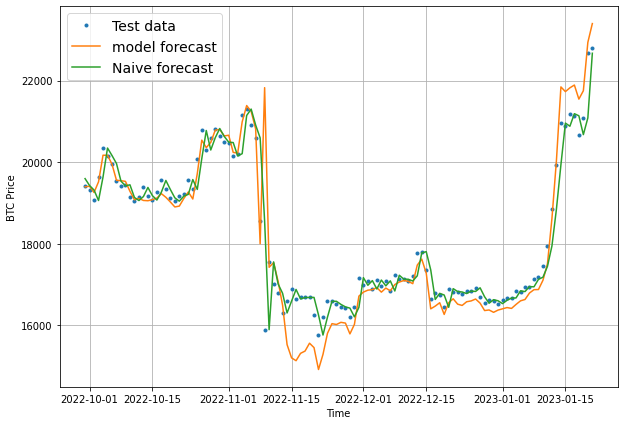

In [ ]:
plt.figure(figsize=(10, 7))
offset = 400 # offset the values by 360 timesteps 
plot_time_series(timesteps=timesteps[-len(X_test):], values=y_test, start=offset, label="Test data")
plot_time_series(timesteps=timesteps[-len(X_test):], values=model_2_preds, format="-", start=offset, label="model forecast");
plot_time_series(timesteps=timesteps[-len(X_test):], values=naive_forecast[1:], format="-", start=offset, label="Naive forecast");

#### some problem near 8th of Novemver where DNN has big error, this may seem like turkey problem

# The results without features that gives some level of collinearity is actually less accurate compared to with same model with full features list

# In next models all features will be used

# Now lets try Bayeses Optimisation with multivariate

In [ ]:
X_train, y_train, X_test, y_test = create_windows_tt(df_TA)

2056 2056 514 514


In [69]:
model_dense_list=[]

def dense_models(neurons, drop, reg, batch):
    tf.random.set_seed(42)

    # Create the model
    model_dense = tf.keras.models.Sequential()
    model_dense.add(tf.keras.layers.Dense(neurons, kernel_regularizer=regularizers.l2(reg), activation='relu'))
    model_dense.add(tf.keras.layers.Dropout(drop))
    model_dense.add(tf.keras.layers.Dense(int(HORIZON)))

    # Compile the model
    model_dense.compile(optimizer=tf.keras.optimizers.Adam(), loss='mae')

    # Train the model
    model_dense.fit(X_train, y_train, epochs=5000, batch_size=batch, validation_data=(X_test, y_test), verbose=0, callbacks=[
        tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=250, restore_best_weights=True),
        tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', patience=100, verbose=1)
    ])

     # Make predictions
    model_dense_preds = make_preds(model_dense, X_test)

    # Evaluate predictions
    model_dense_results = evaluate_preds(y_true=tf.squeeze(y_test),
                                    y_pred=model_dense_preds)

    model_dense_list.append(model_dense_results)

    print('\n', model_dense_results, '\n')

    return -1*model_dense.evaluate(X_test, y_test)


In [70]:
# Define the objective function
def objective(**params):
    neurons = int(params['neurons'])
    drop = round(params['drop'],2)
    reg = round(params['reg'],4)
    batch = int(params['batch'])

    # Train and evaluate the model using the given hyperparameters
    result = dense_models(neurons, drop, reg, batch )
    return result

# Define the search space
pbounds = {}
pbounds['neurons'] = (1, 1028) # Range of number of neurons in each layer
pbounds['drop']=(0,0.7)
pbounds['reg']=(0,1)
pbounds['batch']=(1,128)

# Create the optimizer
optimizer = BayesianOptimization(
    f=objective,
    pbounds=pbounds,
    random_state=42
)

In [ ]:
# Perform the optimization
optimizer.maximize(
    n_iter=5, # Number of optimization iterations
)

|   iter    |  target   |   batch   |   drop    |  neurons  |    reg    |
-------------------------------------------------------------------------

Epoch 279: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.

Epoch 707: ReduceLROnPlateau reducing learning rate to 1.0000000474974514e-05.

Epoch 807: ReduceLROnPlateau reducing learning rate to 1.0000000656873453e-06.
17/17 [==============================] - 0s 2ms/step

 {'mae': 551.9805, 'mse': 559460.1, 'rmse': 747.97064, 'mape': 1.6935186, 'mase': 0.6651705} 

17/17 [==============================] - 0s 2ms/step - loss: 561.4680
| 1         | -561.5    | 48.57     | 0.6655    | 752.8     | 0.1796    |

Epoch 346: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.

Epoch 576: ReduceLROnPlateau reducing learning rate to 1.0000000474974514e-05.

Epoch 676: ReduceLROnPlateau reducing learning rate to 1.0000000656873453e-06.
17/17 [==============================] - 0s 2ms/step

 {'mae': 509.18286, 'mse'

KeyboardInterrupt: ignored

## Main conclusion on this step - any humber of neurons on 2 hidden layers are less accurate than 1 layer of neurons. So we will stick to it


 1 [539] 

17/17 [==============================] - 0s 1ms/step - loss: 499.0711

|   iter    |  target   |   batch   |   drop    |  hidden   | neurons_1 | neurons_2 |    reg    |

| 3         | -499.1    | 47.37     | 0.11      | 1.608     | 539.9     | 444.6     | 300.1     | 0.06119   |


| 7         | -508.0    | 98.58     | 0.1574    | 1.593     | 619.1     | 169.8     | 0.08917   |


-------

|   iter    |  target   |   batch   |   drop    |  neurons  |    reg    |


| 2         | -523.7    | 20.81     | 0.1092    | 60.65     | 0.2599    |


| 8         | -509.8    | 40.45     | 0.0       | 498.5     | 0.3       |

In [ ]:
tf.random.set_seed(42)

# Create the model=
model = tf.keras.Sequential([
  tf.keras.layers.Dense(498,kernel_regularizer=regularizers.l2(0.3), activation="relu"),
  tf.keras.layers.Dense(HORIZON)
], name="model_multi_dense_1")

# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(), loss='mae')

# Train the model
model.fit(X_train, y_train, epochs=1000, batch_size=40, validation_data=(X_test, y_test), verbose=0, 
                callbacks=[create_model_checkpoint(model_name=model.name),
                           tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', patience=100, verbose=1)])

model = tf.keras.models.load_model("model_experiments/model_multi_dense_1")

# Make predictions
model_dense_preds = make_preds(model, X_test)

# Evaluate predictions
model_dense_results = evaluate_preds(y_true=tf.squeeze(y_test),
                                y_pred=model_dense_preds)



Epoch 140: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.



Epoch 347: ReduceLROnPlateau reducing learning rate to 1.0000000474974514e-05.



Epoch 597: ReduceLROnPlateau reducing learning rate to 1.0000000656873453e-06.

Epoch 697: ReduceLROnPlateau reducing learning rate to 1.0000001111620805e-07.

Epoch 797: ReduceLROnPlateau reducing learning rate to 1.000000082740371e-08.

Epoch 897: ReduceLROnPlateau reducing learning rate to 1.000000082740371e-09.

Epoch 997: ReduceLROnPlateau reducing learning rate to 1.000000082740371e-10.
17/17 [==============================] - 0s 2ms/step


In [ ]:
model_dense_results

{'mae': 535.72656,
 'mse': 543853.0,
 'rmse': 737.46387,
 'mape': 1.6383076,
 'mase': 0.64558345}

521

(array([162.,  61.,  32.,   9.,  69.,  69.,  54.,  15.,  31.,  14.]),
 array([15760.14, 20939.61, 26119.08, 31298.55, 36478.02, 41657.49,
        46836.96, 52016.43, 57195.9 , 62375.37, 67554.84]),
 <a list of 10 Patch objects>)

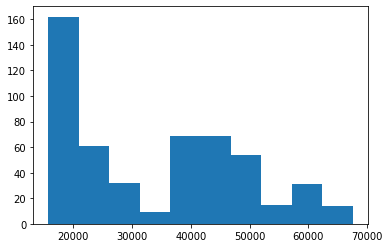

In [ ]:
plt.hist(y_test)

(array([ 64., 101.,  56.,   3.,  34.,  19.,  93.,  77.,  32.,  37.]),
 array([ 9.6653027 ,  9.81084341,  9.95638412, 10.10192483, 10.24746554,
        10.39300624, 10.53854695, 10.68408766, 10.82962837, 10.97516908,
        11.12070979]),
 <a list of 10 Patch objects>)

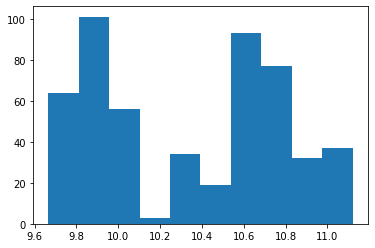

In [ ]:
y_test_log = np.log(y_test + 1)
plt.hist(y_test_log)

# Fundamental analyse

In [79]:
df_FA = pd.read_csv('df_FA.csv')

df_FA = df_FA.iloc[:, 2:].reset_index()
df_FA = df_FA.drop(columns=['index'])
df_FA

,time,price_open,price_close,price_high,price_low,volume,candle_usd_volume,candle_trades_count,mrctCap,TxCntSec,...,gas,block_reward,DiffLast,HashRate,RevHashRateNtv,RevHashUSD,RevUSD,FlowTfrFromExCnt,TxTfrValAdjUSD,SplyFF
0,2016-01-02,435.67,435.40,437.56,432.41,3276.709621,1.426307e+06,11498,6.532460e+09,1.711389,...,2.340,25.00,1.038803e+11,7.487684e+05,0.004883,2.455289e-05,1.588415e+06,8570,8.238282e+07,1.305056e+07
1,2016-01-03,435.40,431.91,435.75,425.02,3904.335318,1.681589e+06,14239,6.469307e+09,1.678576,...,2.340,25.00,1.038803e+11,7.487684e+05,0.004874,2.426470e-05,1.569770e+06,10055,9.999900e+07,1.305343e+07
2,2016-01-04,431.90,433.85,435.79,431.37,5894.445723,2.557825e+06,11353,6.521093e+09,2.066852,...,2.340,25.00,1.038803e+11,9.346695e+05,0.004874,2.445068e-05,1.974526e+06,9490,1.121030e+08,1.305745e+07
3,2016-01-05,433.84,433.34,435.64,430.00,5150.109476,2.231543e+06,13848,6.511064e+09,2.125683,...,2.325,25.00,1.038803e+11,8.107354e+05,0.004881,2.444475e-05,1.712294e+06,11463,1.452678e+08,1.306067e+07
4,2016-01-06,433.32,430.87,433.46,428.15,5476.959959,2.365110e+06,15951,6.482611e+09,1.988519,...,2.267,25.00,1.038803e+11,7.281127e+05,0.004884,2.434335e-05,1.531415e+06,11333,1.398151e+08,1.306397e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2572,2023-01-17,21191.46,21136.33,21595.00,20844.73,32656.479783,6.929481e+08,522945,4.080032e+11,3.576435,...,3.586,6.25,3.759045e+13,2.915065e+08,0.000003,8.309510e-07,2.092846e+07,29845,3.562624e+09,1.393167e+07
2573,2023-01-18,21135.01,20674.29,21650.21,20370.01,34600.256472,7.282595e+08,667361,3.989931e+11,3.409016,...,3.311,6.25,3.759045e+13,2.616084e+08,0.000003,8.162600e-07,1.844990e+07,28778,3.620629e+09,1.392986e+07
2574,2023-01-19,20674.03,21084.22,21197.00,20656.52,23436.754046,4.895981e+08,479012,4.059896e+11,3.456100,...,3.275,6.25,3.759045e+13,2.709516e+08,0.000003,8.302040e-07,1.943525e+07,27978,3.715173e+09,1.392681e+07
2575,2023-01-20,21084.05,22669.81,22754.73,20865.64,32810.595879,7.066141e+08,683942,4.366212e+11,3.509421,...,3.174,6.25,3.759045e+13,2.466594e+08,0.000003,8.990340e-07,1.915964e+07,33784,4.081354e+09,1.392405e+07


In [86]:
X_train, y_train, X_test, y_test = create_windows_tt(df_FA)

2056 2056 514 514


In [ ]:
# Define the objective function
def objective(**params):
    neurons = int(params['neurons'])
    drop = round(params['drop'],2)
    reg = round(params['reg'],4)
    batch = int(params['batch'])

    # Train and evaluate the model using the given hyperparameters
    result = dense_models(neurons, drop, reg, batch )
    return result

# Define the search space
pbounds = {}
pbounds['neurons'] = (1, 1028) # Range of number of neurons in each layer
pbounds['drop']=(0,0.7)
pbounds['reg']=(0,1)
pbounds['batch']=(1,128)

# Create the optimizer
optimizer = BayesianOptimization(
    f=objective,
    pbounds=pbounds,
    random_state=42
)

# Perform the optimization
optimizer.maximize(
    n_iter=10, # Number of optimization iterations
)

|   iter    |  target   |   batch   |   drop    |  neurons  |    reg    |
-------------------------------------------------------------------------

Epoch 230: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.

Epoch 330: ReduceLROnPlateau reducing learning rate to 1.0000000474974514e-05.
17/17 [==============================] - 0s 2ms/step

 {'mae': 11926.45, 'mse': 255986100.0, 'rmse': 15999.565, 'mape': 34.303604, 'mase': 14.372106} 

17/17 [==============================] - 0s 2ms/step - loss: 11942.5312
| 1         | -1.194e+0 | 48.57     | 0.6655    | 752.8     | 0.5987    |

Epoch 193: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.

Epoch 293: ReduceLROnPlateau reducing learning rate to 1.0000000474974514e-05.
17/17 [==============================] - 0s 1ms/step

 {'mae': 33335.453, 'mse': 1355033600.0, 'rmse': 36810.78, 'mape': 95.762375, 'mase': 40.17127} 

17/17 [==============================] - 0s 2ms/step - loss: 33355.2734
| 2       

# Pattern recognision

In [45]:
df_PR = pd.read_csv('df_PR.csv')

df_PR = df_PR.iloc[:, 2:].reset_index()
df_PR = df_PR.drop(columns=['index'])
df_PR['time'] = timesteps
df_PR

,price_open,price_close,price_high,price_low,CDL2CROWS,CDL3INSIDE,CDL3LINESTRIKE,CDL3OUTSIDE,CDL3WHITESOLDIERS,CDLADVANCEBLOCK,...,CDLSHOOTINGSTAR,CDLSHORTLINE,CDLSPINNINGTOP,CDLSTALLEDPATTERN,CDLTAKURI,CDLXSIDEGAP3METHODS,count_1,count_-1,pr_signal,time
0,435.67,435.40,437.56,432.41,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2016-01-02
1,435.40,431.91,435.75,425.02,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2016-01-03
2,431.90,433.85,435.79,431.37,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2016-01-04
3,433.84,433.34,435.64,430.00,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2016-01-05
4,433.32,430.87,433.46,428.15,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2016-01-06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2572,21191.46,21136.33,21595.00,20844.73,0,0,0,0,0,0,...,0,0,-100,0,0,0,3,2,1,2023-01-17
2573,21135.01,20674.29,21650.21,20370.01,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2023-01-18
2574,20674.03,21084.22,21197.00,20656.52,0,0,0,0,0,0,...,0,100,0,0,0,0,1,0,1,2023-01-19
2575,21084.05,22669.81,22754.73,20865.64,0,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,2023-01-20


In [ ]:
X_train, y_train, X_test, y_test = create_windows_tt(df_PR)

2056 2056 514 514


In [ ]:
# Define the objective function
def objective(**params):
    neurons = int(params['neurons'])
    drop = round(params['drop'],2)
    reg = round(params['reg'],4)
    batch = int(params['batch'])

    # Train and evaluate the model using the given hyperparameters
    result = dense_models(neurons, drop, reg, batch )
    return result

# Define the search space
pbounds = {}
pbounds['neurons'] = (1, 1028) # Range of number of neurons in each layer
pbounds['drop']=(0,0.7)
pbounds['reg']=(0,1)
pbounds['batch']=(1,128)

# Create the optimizer
optimizer = BayesianOptimization(
    f=objective,
    pbounds=pbounds,
    random_state=42
)

# Perform the optimization
optimizer.maximize(
    n_iter=10, # Number of optimization iterations
)

|   iter    |  target   |   batch   |   drop    |  neurons  |    reg    |
-------------------------------------------------------------------------
17/17 [==============================] - 0s 2ms/step

 {'mae': 481.90594, 'mse': 411976.84, 'rmse': 641.85425, 'mape': 1.3989462, 'mase': 0.58072627} 

17/17 [==============================] - 0s 3ms/step - loss: 487.5098
| 1         | -487.5    | 48.57     | 0.6655    | 752.8     | 0.5987    |
17/17 [==============================] - 0s 2ms/step

 {'mae': 627.71545, 'mse': 714164.56, 'rmse': 845.0826, 'mape': 1.8768225, 'mase': 0.7564357} 

17/17 [==============================] - 0s 2ms/step - loss: 633.0703
| 2         | -633.1    | 20.81     | 0.1092    | 60.65     | 0.8662    |

Epoch 340: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
17/17 [==============================] - 0s 2ms/step

 {'mae': 778.1078, 'mse': 1260544.4, 'rmse': 1122.7396, 'mape': 2.2203093, 'mase': 0.9376677} 

17/17 [=========================

|   iter    |  target   |   batch   |   drop    |  neurons  |    reg    |

| 11        | -321.8    | 101.5     | 0.0       | 134.5     | 0.0       |

| 13        | -319.0    | 86.56     | 0.0       | 109.7     | 0.0       |

# Fourier

In [ ]:
X_train, y_train, X_test, y_test = create_windows_tt(data_FT)

2056 2056 514 514


In [ ]:
# Perform the optimization
optimizer.maximize(
    n_iter=10, # Number of optimization iterations
)

|   iter    |  target   |   batch   |   drop    |  neurons  |    reg    |
-------------------------------------------------------------------------
17/17 [==============================] - 0s 2ms/step

 {'mae': 804.75287, 'mse': 1068474.1, 'rmse': 1033.6702, 'mape': 2.3241405, 'mase': 0.9697767} 

17/17 [==============================] - 0s 2ms/step - loss: 810.0782
| 29        | -810.1    | 16.5      | 0.3466    | 36.32     | 0.9093    |
17/17 [==============================] - 0s 2ms/step

 {'mae': 579.1373, 'mse': 619568.5, 'rmse': 787.1268, 'mape': 1.7358508, 'mase': 0.69789606} 

17/17 [==============================] - 0s 3ms/step - loss: 585.0521
| 30        | -585.1    | 33.87     | 0.4638    | 321.1     | 0.5201    |

Epoch 933: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
17/17 [==============================] - 0s 2ms/step

 {'mae': 398.58774, 'mse': 296027.16, 'rmse': 544.08374, 'mape': 1.1656564, 'mase': 0.48032272} 

17/17 [=========================

Without imag numbers:
|   iter    |  target   |   batch   |   drop    |  neurons  |    reg    |

| 21        | -382.0    | 65.37     | 0.02484   | 343.8     | 0.4776    

With:


# Times features

In [75]:
X_train, y_train, X_test, y_test = create_windows_tt(df_TF)

2056 2056 514 514


In [76]:
# Perform the optimization
optimizer.maximize(
    n_iter=10, # Number of optimization iterations
)

|   iter    |  target   |   batch   |   drop    |  neurons  |    reg    |
-------------------------------------------------------------------------

Epoch 519: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
17/17 [==============================] - 0s 3ms/step

 {'mae': 6037.6284, 'mse': 54818276.0, 'rmse': 7403.9365, 'mape': 15.7030525, 'mase': 7.2757134} 

17/17 [==============================] - 0s 3ms/step - loss: 6128.4746
| 1         | -6.128e+0 | 48.57     | 0.6655    | 752.8     | 0.5987    |

Epoch 480: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
17/17 [==============================] - 0s 2ms/step

 {'mae': 1077.91, 'mse': 2424130.5, 'rmse': 1556.9619, 'mape': 3.0566757, 'mase': 1.2989478} 

17/17 [==============================] - 0s 2ms/step - loss: 1195.6545
| 2         | -1.196e+0 | 20.81     | 0.1092    | 60.65     | 0.8662    |

Epoch 166: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
17/17 [=============

KeyboardInterrupt: ignored

{'mae': 1113.6144, 'mse': 2328027.2, 'rmse': 1525.7874, 'mape': 3.3558612, 'mase': 1.3419738} 

17/17 [==============================] - 0s 2ms/step - loss: 1179.9626
| 4         | -1.18e+03 | 106.7     | 0.1486    | 187.7     | 0.1834    |

# ALL CONNECTED

In [94]:
# df_FA, df_TA, df_PR, data_FT, df_TF

In [138]:
df_TAPR = get_table(df_TA, df_PR)
df_TAPR

,time,price_open,price_close,price_high,price_low,vwap,volume,ma7,ma21,ma49,...,CDLSHOOTINGSTAR,CDLSHORTLINE,CDLSPINNINGTOP,CDLSTALLEDPATTERN,CDLTAKURI,CDLXSIDEGAP3METHODS,count_1,count_-1,pr_signal,time
0,2016-01-02,435.67000000,435.40000000,437.56000000,432.41000000,435.28634633,3276.70962113,429.98714286,441.53904762,396.96408163,...,0,0,0,0,0,0,0,0,0,2016-01-02
1,2016-01-03,435.40000000,431.91000000,435.75000000,425.02000000,430.69784500,3904.33531811,431.01428571,441.44761905,399.18816327,...,0,0,0,0,0,0,0,0,0,2016-01-03
2,2016-01-04,431.90000000,433.85000000,435.79000000,431.37000000,433.93821449,5894.44572317,432.71571429,440.96380952,401.24857143,...,0,0,0,0,0,0,0,0,0,2016-01-04
3,2016-01-05,433.84000000,433.34000000,435.64000000,430.00000000,433.30019897,5150.10947569,432.63714286,439.49095238,403.22510204,...,0,0,0,0,0,0,0,0,0,2016-01-05
4,2016-01-06,433.32000000,430.87000000,433.46000000,428.15000000,431.82900602,5476.95995944,433.05428571,438.39095238,405.17163265,...,0,0,0,0,0,0,0,0,0,2016-01-06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2572,2023-01-17,21191.46000000,21136.33000000,21595.00000000,20844.73000000,21219.31369868,32656.47978348,20126.77857143,17925.72857143,17397.71795918,...,0,0,-100,0,0,0,3,2,1,2023-01-17
2573,2023-01-18,21135.01000000,20674.29000000,21650.21000000,20370.01000000,21047.80625600,34600.25647175,20516.78142857,18122.61571429,17469.28857143,...,0,0,0,0,0,0,0,0,0,2023-01-18
2574,2023-01-19,20674.03000000,21084.22000000,21197.00000000,20656.52000000,20890.18452793,23436.75404601,20836.27714286,18334.83857143,17553.04653061,...,0,100,0,0,0,0,1,0,1,2023-01-19
2575,2023-01-20,21084.05000000,22669.81000000,22754.73000000,20865.64000000,21536.15543483,32810.59587882,21226.98142857,18623.87238095,17666.82408163,...,0,0,0,0,0,0,1,1,0,2023-01-20


In [141]:
X_train, y_train, X_test, y_test = create_windows_tt(df_TAPR)

2056 2056 514 514


In [142]:
optimizer = BayesianOptimization(
    f=objective,
    pbounds=pbounds,
    random_state=42
)

# Perform the optimization
optimizer.maximize(
    n_iter=10, # Number of optimization iterations
)

|   iter    |  target   |   batch   |   drop    |  neurons  |    reg    |
-------------------------------------------------------------------------

Epoch 259: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.

Epoch 415: ReduceLROnPlateau reducing learning rate to 1.0000000474974514e-05.
17/17 [==============================] - 0s 2ms/step

 {'mae': 556.99524, 'mse': 560633.9, 'rmse': 748.7549, 'mape': 1.6753297, 'mase': 0.6712135} 

17/17 [==============================] - 0s 2ms/step - loss: 582.8446
| 1         | -582.8    | 48.57     | 0.6655    | 752.8     | 0.5987    |

Epoch 236: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
17/17 [==============================] - 0s 1ms/step

 {'mae': 670.24097, 'mse': 746192.7, 'rmse': 863.82446, 'mape': 2.1867344, 'mase': 0.80768156} 

17/17 [==============================] - 0s 2ms/step - loss: 690.6259
| 2         | -690.6    | 20.81     | 0.1092    | 60.65     | 0.8662    |

Epoch 420: ReduceLROnPl

In [106]:
df_clean = get_table(df_TA, df_PR, df_FA, data_FT, df_TF)

,time,price_close,price_open,price_high,price_low,seconds,day_of_week,month,year,quarter,...,fourier_3_real,fourier_3_imag,fourier_6_real,fourier_6_imag,fourier_9_real,fourier_9_imag,fourier_21_real,fourier_21_imag,fourier_100_real,fourier_100_imag
0,2016-01-02,435.40000000,435.67000000,437.56000000,432.41000000,31536000.00000000,5,1,2016,1,...,9122.96470219,379.17322252,7581.24599300,65.50921506,9589.29800627,-962.14041621,9499.19036849,-376.60426167,10607.46992838,-115.89606615
1,2016-01-03,431.91000000,435.40000000,435.75000000,425.02000000,31622400.00000000,6,1,2016,1,...,9037.07360594,395.30919965,7501.56626030,68.28087933,9454.61360906,-936.08743437,9207.33705916,-369.51566375,9087.84678379,-108.37654936
2,2016-01-04,433.85000000,431.90000000,435.79000000,431.37000000,31708800.00000000,0,1,2016,1,...,8951.47501626,411.42402686,7422.30818004,71.03793109,9319.85539297,-909.58372415,8914.51370810,-361.45854836,7569.34665626,-94.44621101
3,2016-01-05,433.34000000,433.84000000,435.64000000,430.00000000,31795200.00000000,1,1,2016,1,...,8866.17015721,427.51684200,7343.47343845,73.77978032,9185.04857668,-882.64204715,8621.01644534,-352.45403356,6085.02961092,-74.92907543
4,2016-01-06,430.87000000,433.32000000,433.46000000,428.15000000,31881600.00000000,2,1,2016,1,...,8781.16024189,443.58678406,7265.06369066,76.50584024,9050.21842867,-855.27537585,8327.14344915,-342.52572061,4666.71589292,-50.97964399
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2572,2023-01-17,21136.33000000,21191.46000000,21595.00000000,20844.73000000,253756800.00000000,1,1,2023,1,...,9556.76417539,298.20634122,7985.90827313,51.45256875,10260.73483156,-1085.21327070,10933.75604922,-396.96059013,17129.42973894,-55.83802193
2573,2023-01-18,20674.29000000,21135.01000000,21650.21000000,20370.01000000,253843200.00000000,2,1,2023,1,...,9469.42928931,314.43509719,7904.14664614,54.28834019,10126.79534910,-1061.59754973,10651.08386288,-394.94094083,16060.11373495,-79.04264201
2574,2023-01-19,21084.22000000,20674.03000000,21197.00000000,20656.52000000,253929600.00000000,3,1,2023,1,...,9382.38062583,330.64703021,7822.79778103,57.11249360,9992.65705983,-1037.47066694,10366.01133574,-391.88613324,14849.31911227,-97.57163553
2575,2023-01-20,22669.81000000,21084.05000000,22754.73000000,20865.64000000,254016000.00000000,4,1,2023,1,...,9295.61946351,346.84127289,7741.86351645,59.92442461,9858.34477976,-1012.84423950,10078.81597919,-387.80417416,13518.93441952,-110.32895291


In [109]:
X_train, y_train, X_test, y_test = create_windows_tt(df_clean)

2056 2056 514 514


In [110]:
optimizer = BayesianOptimization(
    f=objective,
    pbounds=pbounds,
    random_state=42
)

# Perform the optimization
optimizer.maximize(
    n_iter=10, # Number of optimization iterations
)

|   iter    |  target   |   batch   |   drop    |  neurons  |    reg    |
-------------------------------------------------------------------------

Epoch 442: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
17/17 [==============================] - 0s 2ms/step

 {'mae': 1088.9257, 'mse': 2344992.8, 'rmse': 1531.3369, 'mape': 3.615523, 'mase': 1.3122224} 

17/17 [==============================] - 0s 2ms/step - loss: 1099.3679
| 11        | -1.099e+0 | 78.71     | 0.09765   | 301.0     | 0.3664    |

Epoch 368: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
17/17 [==============================] - 0s 1ms/step

 {'mae': 11754.72, 'mse': 238136260.0, 'rmse': 15431.664, 'mape': 35.48798, 'mase': 14.16516} 

17/17 [==============================] - 0s 2ms/step - loss: 11768.7842
| 12        | -1.177e+0 | 58.92     | 0.5496    | 206.1     | 0.5142    |

Epoch 427: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
17/17 [==============

# increase train set into different windows HORIZON = 1 WINDOW SIZE = for each in range(N)

# increase train set with different time frames and add it into the cicle -> do bayses optim. on given set. Get solid data set (trade like humans) 

# PLUS CNN to add as a new model

# Pridumat algorithm kotorij budet sobirat takim obrazom dannie i doobuchat LLM na poisk zakonomernostej



# VOPROS: S KAKIH NACHINAT OBUCHENIE: S WINDOW = 1 ili Window = max()?

# ESTJ li raznica?

# sdelat tak i tak i proveritj

# kak optimizirovat test process



In [141]:
model_dense_list=[]

def dense_models(neurons, drop, reg):
    tf.random.set_seed(42)

    # Create the model
    model_dense = tf.keras.models.Sequential()
    model_dense.add(tf.keras.layers.Dense(neurons, kernel_regularizer=regularizers.l2(reg), activation='relu'))
    model_dense.add(tf.keras.layers.Dropout(drop))
    model_dense.add(tf.keras.layers.Dense(int(HORIZON)))

    # Compile the model
    model_dense.compile(optimizer=tf.keras.optimizers.Adam(), loss='mae')

    # Train the model
    model_dense.fit(X_train, y_train, epochs=5000, batch_size=32, validation_data=(X_test, y_test), verbose=0, callbacks=[
        tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=250, restore_best_weights=True),
        tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', patience=100, verbose=1)
    ])

     # Make predictions
    model_dense_preds = make_preds(model_dense, X_test)

    # Evaluate predictions
    model_dense_results = evaluate_preds(y_true=tf.squeeze(y_test),
                                    y_pred=model_dense_preds)

    model_dense_list.append(model_dense_results)

    print('\n', model_dense_results, '\n')

    return -1*model_dense.evaluate(X_test, y_test)


In [142]:
# Define the objective function
def objective(**params):
    neurons = int(params['neurons'])
    drop = round(params['drop'],2)
    reg = round(params['reg'],4)
 #   batch = int(params['batch'])

    # Train and evaluate the model using the given hyperparameters
    result = dense_models(neurons, drop, reg )
    return result

# Define the search space
pbounds = {}
pbounds['neurons'] = (1, 1028) # Range of number of neurons in each layer
pbounds['drop']=(0,0.7)
pbounds['reg']=(0,1)
#pbounds['batch']=(1,128)

# Create the optimizer
optimizer = BayesianOptimization(
    f=objective,
    pbounds=pbounds,
    random_state=42
)

In [140]:
# Perform the optimization
optimizer.maximize(
    n_iter=10, # Number of optimization iterations
)

|   iter    |  target   |   batch   |   drop    |  neurons  |    reg    |
-------------------------------------------------------------------------

Epoch 2254: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.

Epoch 2525: ReduceLROnPlateau reducing learning rate to 1.0000000474974514e-05.

Epoch 2625: ReduceLROnPlateau reducing learning rate to 1.0000000656873453e-06.
17/17 [==============================] - 0s 2ms/step

 {'mae': 868.01404, 'mse': 1660590.6, 'rmse': 1288.639, 'mape': 2.3620543, 'mase': 1.041669} 

17/17 [==============================] - 0s 2ms/step - loss: 1196.8480
| 1         | -1.197e+0 | 48.57     | 0.6655    | 752.8     | 0.5987    |

Epoch 3669: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.

Epoch 3769: ReduceLROnPlateau reducing learning rate to 1.0000000474974514e-05.
17/17 [==============================] - 0s 2ms/step

 {'mae': 828.0563, 'mse': 1700571.8, 'rmse': 1304.0597, 'mape': 2.111658, 'mase': 0.99371725} 

17/

KeyboardInterrupt: ignored

# CNN

In [63]:
X_train[0].shape

(99,)

In [67]:
import functools
### Define the CNN classifier model ###

'''Function to define a standard CNN model'''
def cnn_1d(HORIZON, n_filters=16):
  tf.random.set_seed(42)
  Conv1D = functools.partial(tf.keras.layers.Conv1D, padding='same', activation='relu')
  BatchNormalization = tf.keras.layers.BatchNormalization
  Flatten = tf.keras.layers.Flatten
  Dense = functools.partial(tf.keras.layers.Dense, activation='relu')

  model = tf.keras.Sequential([ 
    tf.keras.Input(shape=(99, 1)),

    Conv1D(filters=2*n_filters, kernel_size=5,  strides=2),
#  BatchNormalization(),

    Flatten(),
    Dense(512),
    Dense(HORIZON, activation=None),
  ])
  return model

model_cnn = cnn_1d(1)

# Compile
model_cnn.compile(loss="mae",
                optimizer=tf.keras.optimizers.Adam())

# Fit
model_cnn.fit(X_train, y_train,
            epochs=5000,
            batch_size=32,
            verbose=1, # only print 1 line per epoch
            validation_data=(X_test, y_test),
            callbacks=[
              tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=250, restore_best_weights=True),
              tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', patience=100, verbose=1)
            ])

Epoch 1/5000
65/65 [==============================] - 3s 29ms/step - loss: 10247.4678 - val_loss: 33003.4727 - lr: 0.0010
Epoch 2/5000
65/65 [==============================] - 1s 18ms/step - loss: 8389.4980 - val_loss: 25860.5234 - lr: 0.0010
Epoch 3/5000
65/65 [==============================] - 1s 18ms/step - loss: 7321.7456 - val_loss: 25189.9688 - lr: 0.0010
Epoch 4/5000
65/65 [==============================] - 1s 17ms/step - loss: 7164.1167 - val_loss: 24753.8125 - lr: 0.0010
Epoch 5/5000
65/65 [==============================] - 1s 16ms/step - loss: 6956.9141 - val_loss: 23942.3770 - lr: 0.0010
Epoch 6/5000
65/65 [==============================] - 2s 25ms/step - loss: 6651.4805 - val_loss: 21947.6465 - lr: 0.0010
Epoch 7/5000
65/65 [==============================] - 2s 35ms/step - loss: 6138.2832 - val_loss: 19912.7363 - lr: 0.0010
Epoch 8/5000
65/65 [==============================] - 3s 40ms/step - loss: 5191.5474 - val_loss: 14776.2832 - lr: 0.0010
Epoch 9/5000
65/65 [===========

In [68]:
# Make predictions on multivariate data
model_cnn.evaluate(X_test, y_test)
model_cnn_preds = tf.squeeze(model_cnn.predict(X_test))

# Evaluate preds
model_cnn_results = evaluate_preds(y_true=y_test,
                                 y_pred=model_cnn_preds)
model_cnn_results

17/17 [==============================] - 0s 6ms/step


{'mae': 287.77966,
 'mse': 176481.38,
 'rmse': 420.09686,
 'mape': 0.8458714,
 'mase': 0.34535292}

In [1]:
# Save the entire model as a SavedModel.
!mkdir -p saved_model
model_cnn.save('saved_model/cnn_model')

NameError: ignored

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# LSTM

In [72]:
def lstm(HORIZON, n_units=64):
  tf.random.set_seed(42)
  LSTM = tf.keras.layers.LSTM
  BatchNormalization = tf.keras.layers.BatchNormalization
  Dense = functools.partial(tf.keras.layers.Dense, activation='relu')

  model = tf.keras.Sequential([ 
    tf.keras.Input(shape=(99, 1)),
    LSTM(units=n_units, return_sequences=True),  
#    LSTM(units=n_units),
    Dense(512),
    Dense(HORIZON, activation=None),
  ])
  return model

model_lstm = lstm(1)

# Compile
model_lstm.compile(loss="mae",
                   optimizer=tf.keras.optimizers.Adam())

# Fit
model_lstm.fit(X_train, y_train,
               epochs=5000,
               batch_size=32,
               verbose=1,
               validation_data=(X_test, y_test),
               callbacks=[
                   tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=250, restore_best_weights=True),
                   tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', patience=100, verbose=1)
               ])


Epoch 1/5000
65/65 [==============================] - 11s 104ms/step - loss: 10420.3750 - val_loss: 33932.6523 - lr: 0.0010
Epoch 2/5000
65/65 [==============================] - 5s 78ms/step - loss: 10098.6240 - val_loss: 33442.1055 - lr: 0.0010
Epoch 3/5000
65/65 [==============================] - 6s 100ms/step - loss: 9658.5273 - val_loss: 32792.7891 - lr: 0.0010
Epoch 4/5000
65/65 [==============================] - 5s 79ms/step - loss: 9252.0029 - val_loss: 31954.0977 - lr: 0.0010
Epoch 5/5000
65/65 [==============================] - 6s 99ms/step - loss: 8777.8018 - val_loss: 30873.6523 - lr: 0.0010
Epoch 6/5000
65/65 [==============================] - 5s 80ms/step - loss: 8313.0957 - val_loss: 29769.9199 - lr: 0.0010
Epoch 7/5000
65/65 [==============================] - 6s 93ms/step - loss: 8027.0542 - val_loss: 28845.9004 - lr: 0.0010
Epoch 8/5000
65/65 [==============================] - 5s 84ms/step - loss: 7824.6807 - val_loss: 27999.2539 - lr: 0.0010
Epoch 9/5000
65/65 [=======

In [88]:
X_test.reshape(-1, 99, 1)

array([[[0.7772647 ],
        [0.7671775 ],
        [0.7672872 ],
        ...,
        [0.        ],
        [0.4       ],
        [0.21428572]],

       [[0.7484483 ],
        [0.757896  ],
        [0.75958234],
        ...,
        [0.11111111],
        [0.        ],
        [0.42857143]],

       [[0.7691522 ],
        [0.75926137],
        [0.7465814 ],
        ...,
        [0.        ],
        [0.2       ],
        [0.2857143 ]],

       ...,

       [[0.32130694],
        [0.3227225 ],
        [0.33297178],
        ...,
        [0.11111111],
        [0.        ],
        [0.42857143]],

       [[0.32779148],
        [0.34686363],
        [0.33634272],
        ...,
        [0.11111111],
        [0.2       ],
        [0.35714287]],

       [[0.35289067],
        [0.35648564],
        [0.36159888],
        ...,
        [0.22222222],
        [0.        ],
        [0.5       ]]], dtype=float32)

In [87]:
# Make predictions
model_lstm_preds = model_lstm.predict(X_test.reshape(-1, 99, 1))

# Evaluate predictions
model_lstm_results = evaluate_preds(y_true=y_test,
                                y_pred=model_lstm_preds)
model_lstm_results

TypeError: ignored

In [90]:
# Save the entire model as a SavedModel.
!mkdir -p saved_model
model_lstm.save('saved_model/lstm_model')

In [62]:
def lstm(units, HORIZON):
    tf.random.set_seed(42)
    # Create model
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.LSTM(units=units, return_sequences=True, input_shape=(99, 1)))
    model.add(tf.keras.layers.Dropout(0.2))
    model.add(tf.keras.layers.LSTM(units=units, return_sequences=False, input_shape=(99, 1)))
    model.add(Dense(HORIZON))
    
    # Compile model
    model.compile(loss="mae",
                       optimizer=tf.keras.optimizers.Adam(learning_rate=0.1))
    return model

# Fit
model_LSTM = lstm(32, HORIZON)
model_LSTM.fit(X_train,
          y_train,
          epochs=5000,
          verbose=1,
          batch_size=32,
          validation_data=(X_test, y_test),
          callbacks=[tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=250, restore_best_weights=True),
                    tf.keras.callbacks.ReduceLROnPlateau(monitor="val_loss", patience=150, verbose=1)])



Epoch 1/5000
65/65 [==============================] - 119s 127ms/step - loss: 10382.9404 - val_loss: 33920.8008 - lr: 0.1000
Epoch 2/5000
65/65 [==============================] - 6s 95ms/step - loss: 10211.4756 - val_loss: 33750.1719 - lr: 0.1000
Epoch 3/5000
65/65 [==============================] - 7s 104ms/step - loss: 10046.3330 - val_loss: 33588.4453 - lr: 0.1000
Epoch 4/5000
65/65 [==============================] - 6s 94ms/step - loss: 9912.3662 - val_loss: 33440.8359 - lr: 0.1000
Epoch 5/5000
65/65 [==============================] - 7s 105ms/step - loss: 9806.0293 - val_loss: 33306.0273 - lr: 0.1000
Epoch 6/5000
65/65 [==============================] - 6s 94ms/step - loss: 9719.3320 - val_loss: 33178.9102 - lr: 0.1000
Epoch 7/5000
65/65 [==============================] - 7s 104ms/step - loss: 9639.2607 - val_loss: 33053.9023 - lr: 0.1000
Epoch 8/5000
65/65 [==============================] - 7s 105ms/step - loss: 9564.7871 - val_loss: 32931.8906 - lr: 0.1000
Epoch 9/5000
65/65 [==

KeyboardInterrupt: ignored

In [58]:
model_lstm_preds

<tf.Tensor: shape=(516, 99), dtype=float32, numpy=
array([[43003.96 , 50776.45 , 50555.23 , ..., 50474.   , 50474.   ,
        50474.   ],
       [41883.64 , 46544.684, 46681.95 , ..., 46746.316, 46746.316,
        46746.316],
       [42718.94 , 50544.3  , 50405.082, ..., 50360.906, 50360.906,
        50360.906],
       ...,
       [21686.912, 21988.55 , 21520.266, ..., 21408.645, 21409.232,
        21409.197],
       [22551.453, 22621.23 , 22041.1  , ..., 21893.41 , 21893.41 ,
        21893.41 ],
       [25181.66 , 24064.164, 23249.658, ..., 22995.621, 22995.621,
        22995.621]], dtype=float32)>

In [ ]:
# Fit
model_LSTM_2 = lstm(64, HORIZON)
model_LSTM_2.fit(X_train,
          y_train,
          epochs=5000,
          verbose=1,
          batch_size=32,
          validation_data=(X_test, y_test),
          callbacks=[tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=250, restore_best_weights=True),
                    tf.keras.callbacks.ReduceLROnPlateau(monitor="val_loss", patience=150, verbose=1)])



In [ ]:
# Make predictions
model_lstm_preds_2 = make_preds(model_LSTM_2, test_windows)

# Evaluate predictions
model_lstm_results_2 = evaluate_preds(y_true=tf.squeeze(test_labels),
                                y_pred=model_lstm_preds_2)

# FORECAST On TEST